In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


## 讀檔

In [ ]:
# 轉成csv檔
# import pandas as pd
# import os
# excel_folder = "/content/drive/MyDrive/post_de"
# csv_folder = os.path.join(excel_folder, "converted_csv")
# os.makedirs(csv_folder, exist_ok=True)

# for file in excel_files:
#     try:
#         df = pd.read_excel(file)
#         base_name = os.path.splitext(os.path.basename(file))[0]
#         df.to_csv(os.path.join(csv_folder, f"{base_name}.csv"), index=False)
#         print(f"✔️ 已轉換：{file}")
#     except Exception as e:
#         print(f"❌ 錯誤：{file}，原因：{e}")


In [ ]:
import os
import pandas as pd
import re

folder = "/content/drive/MyDrive/post_de"
all_posts = []

def clean_caption(text):
    if pd.isna(text):
        return ""
    # 去除 hashtags（#xxx）、提及 @xxx、括號內的內容、網址
    text = re.sub(r'#\S+|@\S+|【.*?】|\[.*?\]|\(.*?\)|https?:\/\/\S+', '', text)
    # 去掉多餘空格
    text = text.strip()
    return text

# 檢查是否只剩下符號或空白
def is_meaningful(text):
    if not text or text.strip() == "":
        return False
    # 只保留中英文和數字來檢查
    alnum_text = re.sub(r'[^A-Za-z0-9\u4e00-\u9fff]', '', text)
    return len(alnum_text) > 0

# 掃描所有 csv 檔案
csv_files = [f for f in os.listdir(folder) if f.endswith(".csv")]
print(f"🔍 發現 {len(csv_files)} 筆使用者 csv 檔案")

for file in csv_files:
    file_path = os.path.join(folder, file)
    try:
        df = pd.read_csv(file_path)
        if "caption" in df.columns:
            df = df[["caption"]].copy()
            df["user_id"] = file.replace("_posts.csv", "")
            df["clean_caption"] = df["caption"].apply(clean_caption)

            # 過濾掉清理後沒有實質內容的貼文
            df = df[df["clean_caption"].apply(is_meaningful)]

            all_posts.append(df)
            print(f"✅ 讀取成功：{file}，共 {len(df)} 則貼文")
        else:
            print(f"⚠️ 無 'caption' 欄位：{file}")
    except Exception as e:
        print(f"❌ 錯誤：{file}，錯誤：{e}")

# 合併
if all_posts:
    all_df = pd.concat(all_posts, ignore_index=True)
    print(f"\n✅ 合併成功，共 {len(all_df)} 則貼文")
    display(all_df)
else:
    print("\n🚫 沒有任何貼文資料被成功讀取")


🔍 發現 15 筆使用者 csv 檔案
✅ 讀取成功：emo.girl.1314_posts.csv，共 162 則貼文
✅ 讀取成功：help_.me54_posts.csv，共 96 則貼文
✅ 讀取成功：thirty6_____posts.csv，共 103 則貼文
✅ 讀取成功：depression_494_posts.csv，共 44 則貼文
✅ 讀取成功：dobaobywish_posts.csv，共 279 則貼文
✅ 讀取成功：orlando_heartlight_posts.csv，共 220 則貼文
✅ 讀取成功：dreamqueen_poem_posts.csv，共 110 則貼文
✅ 讀取成功：lovesky_0166_posts.csv，共 324 則貼文
✅ 讀取成功：914_planet_posts.csv，共 179 則貼文
✅ 讀取成功：adela.writing_posts.csv，共 505 則貼文
✅ 讀取成功：kimwn_q9_posts.csv，共 1 則貼文
✅ 讀取成功：owltaboo_posts.csv，共 10 則貼文
✅ 讀取成功：imika.404_posts.csv，共 16 則貼文
✅ 讀取成功：singwizdep_posts.csv，共 384 則貼文
✅ 讀取成功：md_notes_posts.csv，共 94 則貼文

✅ 合併成功，共 2527 則貼文


,caption,user_id,clean_caption
0,歡迎有意願的醫師、心理師、社工、有興趣的民眾們前來合作 也懇請大家幫忙宣傳、分享\n【合作企...,emo.girl.1314,歡迎有意願的醫師、心理師、社工、有興趣的民眾們前來合作 也懇請大家幫忙宣傳、分享\n 邀請您...
1,#喜歡分享按讚追蹤 🕊️\n---追蹤emo girl 與你分享更多抗鬱日記\n#憂鬱症 #...,emo.girl.1314,🕊️\n---追蹤emo girl 與你分享更多抗鬱日記
2,麻煩尊重一下了！\n剛剛收到一位非粉的騷擾訊息\n---追蹤emo girl 與你分享更多抗...,emo.girl.1314,麻煩尊重一下了！\n剛剛收到一位非粉的騷擾訊息\n---追蹤emo girl 與你分享更多抗鬱日記
3,#喜歡分享按讚追蹤 🕊️\n---追蹤emo girl 與你分享更多抗鬱日記\n#憂鬱症 #...,emo.girl.1314,🕊️\n---追蹤emo girl 與你分享更多抗鬱日記
4,#喜歡分享按讚追蹤 🕊️\n---追蹤emo girl 與你分享更多抗鬱日記\n#憂鬱症 #...,emo.girl.1314,🕊️\n---追蹤emo girl 與你分享更多抗鬱日記
...,...,...,...
2522,.\n感謝這幾個禮拜以來，輪流陪伴我的朋友們，我的人生終於又平安地過了一週。\n.\n最近我...,md_notes,.\n感謝這幾個禮拜以來，輪流陪伴我的朋友們，我的人生終於又平安地過了一週。\n.\n最近我...
2523,.\n今天算是這週最好的一天，其他天如果沒有朋友跟醫生撐著，不知道又會失序成怎樣。\n.\n...,md_notes,.\n今天算是這週最好的一天，其他天如果沒有朋友跟醫生撐著，不知道又會失序成怎樣。\n.\n...
2524,.\nTattoo by @magutat2 \n.\n進出急診的某一天，我軟趴趴地趴在床上...,md_notes,.\nTattoo by \n.\n進出急診的某一天，我軟趴趴地趴在床上，我媽一直來戳我，...
2525,.\n照片是今年跨年的時候，我媽說她想去看2020的第一道曙光，所以我們就報團上山，結果天氣...,md_notes,.\n照片是今年跨年的時候，我媽說她想去看2020的第一道曙光，所以我們就報團上山，結果天氣...


In [ ]:
# 假設 all_df 已經是你整理好的 DataFrame（每列是一篇貼文）
# 先打亂再取出提示與測試資料
all_df = all_df.sample(frac=1, random_state=42).reset_index(drop=True)

# 提示資料：取前28筆人工標記
# prompt_df = all_df.iloc[:28].copy()

# 測試資料：取後70筆人工標記
test_df = all_df.iloc[28:98].copy()

# 剩下的作為備用 pool（可日後自動標記比較用）
pool_df = all_df.iloc[98:].copy()

# 儲存成 csv 供你人工標記（建議每字分一列，後續我可以幫你轉）
# prompt_df[["user_id", "clean_caption"]].to_csv("prompt_28_to_mark.csv", index=False)
test_df[["user_id", "clean_caption"]].to_csv("test_70_to_mark.csv", index=False)


In [ ]:
test_df

,caption,user_id,clean_caption
28,《Week 18。翻唱記事》\n\n憂鬱症在2020年已由WHO列為世界第二大疾病。很可能憂...,singwizdep,《Week 18。翻唱記事》\n\n憂鬱症在2020年已由WHO列為世界第二大疾病。很可能憂...
29,/\n我會給你力量。\n\n勇敢的做自己想做的事，\n就算怕失敗也不畏懼前方。\n\n人生總...,adela.writing,/\n我會給你力量。\n\n勇敢的做自己想做的事，\n就算怕失敗也不畏懼前方。\n\n人生總...
30,走牽著手、一起向前走，不用急沒關係，走在對的位子上才是最重要的。\n\n雖然還是有可能有走歪...,lovesky_0166,走牽著手、一起向前走，不用急沒關係，走在對的位子上才是最重要的。\n\n雖然還是有可能有走歪...
31,《錄音記事》-俊彬\n\n@stevenping_\n\n俊彬是今年夏天在一個比賽場合認識的...,singwizdep,《錄音記事》-俊彬\n\n\n\n俊彬是今年夏天在一個比賽場合認識的選手，當時他以複賽最年輕...
32,回想起那天，我實在是太憤怒了，也難過。\n但最主要的原因還是難過佔最大的比例。\n\n明明不...,lovesky_0166,回想起那天，我實在是太憤怒了，也難過。\n但最主要的原因還是難過佔最大的比例。\n\n明明不...
...,...,...,...
93,嗯⋯是為什麼啊？\n其實我不喜歡現在這樣，對於任何事情都無精打采、提不起勁、漫無目的的過生活...,lovesky_0166,嗯⋯是為什麼啊？\n其實我不喜歡現在這樣，對於任何事情都無精打采、提不起勁、漫無目的的過生活...
94,《Week 160。兩個人不等於我們 feat. 星子。王力宏 (改編對唱版)》\n\n合作...,singwizdep,《Week 160。兩個人不等於我們 feat. 星子。王力宏 》\n\n合作歌手：\n星子...
95,〈悔恨〉\n​\n悔恨是深海裡的沙丁魚\n啃食著我曲折的腿彎\n悔恨是烈日下的曝曬\n炙燒著...,dreamqueen_poem,〈悔恨〉\n​\n悔恨是深海裡的沙丁魚\n啃食著我曲折的腿彎\n悔恨是烈日下的曝曬\n炙燒著...
96,剛從一個喜歡的工作被淘汰，換回以前的工作，原諒我近期時差在調整。\n#36的心情文章 \n#...,thirty6____,剛從一個喜歡的工作被淘汰，換回以前的工作，原諒我近期時差在調整。


In [ ]:
# 要複製給 LLM 的斷詞結果

import pandas as pd
import pandas as pd

# 讀入資料（請根據你的實際檔案格式調整）
df = pd.read_csv("/content/drive/MyDrive/test_70_to_annotate.csv")
df
import pandas as pd

# 合併每個 post_id 的斷詞
grouped = df.groupby(['post_id', 'user_id', 'original_caption'])['word'] \
            .apply(lambda words: ' / '.join(words.astype(str))) \
            .reset_index(name='merged_words')

# 建立 Prompt 欄位
grouped['prompt'] = grouped.apply(lambda row:
    f"貼文內容：{row['original_caption']}\n斷詞結果：{row['merged_words']}", axis=1)

# 儲存結果
grouped[['post_id', 'user_id', 'prompt']].to_csv("merged_prompt_output.csv", index=False, encoding="utf-8-sig")

In [ ]:
!pip install jieba

## 新增的合成資料


In [ ]:
import os
import pandas as pd
import re

df = pd.read_csv("/content/drive/MyDrive/data_dawu/synthetic_step2_outputs.csv")
all_posts = []

def clean_caption(text):
    # 去除 hashtags（#xxx）、中括號內的標籤、網址等
    if pd.isna(text):
        return ""
    text = re.sub(r'#\S+|@\S+|【.*?】|\[.*?\]|\(.*?\)|https?:\/\/\S+', '', text)
    return text.strip()


df["caption"] = df["caption"].apply(clean_caption)
all_posts.extend(df["caption"].tolist())
df

,caption,user_id
0,希望有人能夠理解我的痛苦。我真的不想再被困在這裡,NaN
1,最近，我的努力似乎都是白費，感覺自己一無是處。,NaN
2,我感覺像是被牽引到一個黑暗的地方，無論我多麼努力，似乎也無法逃離。,NaN
3,我現在的生活如同一場無止境的海嘯，我不知道從哪開始逆轉。所以我決定不再努力了，只是等待著死,NaN
4,這個世界，我已經失去所有希望。每天都如同徘徑在黑暗中，無法找到方向。,NaN
5,我知道快樂只是暫時性的， 我還是會覺得自己很糟糕，而且無法有效地應對壓力,NaN
6,現在的我，已經是一片灰塵。每天都像是走在黑暗中的路上，缺乏任何方向感。死了也好，這樣就不必再...,NaN
7,失敗又一次了，自己還是如此無用,NaN
8,選擇了金錢 死了也花不完💰選擇了自由 還不是活在這世界上等死💀選擇了愛情 要不是對方死了不然...,NaN
9,明明吃東西是開心的 但總覺得少了什麼🤔️,NaN


In [ ]:
!pip install jieba

In [ ]:
import pandas as pd
import jieba

rows = []

# 這裡自動編 post_id（從1開始，每篇給一個固定ID）
for idx, row in df.iterrows():
    caption = str(row["caption"])
    tokens = list(jieba.cut(caption))

    for token in tokens:
        rows.append({
            "post_id": idx + 1,  # 👈 加入每篇貼文一個唯一ID
            "user_id": row.get("user_id", ""),  # 若無user_id也不會報錯
            "original_caption": caption,
            "word": token,
            "label": ""  # 等待人工標註
        })

# 建表 & 匯出
df_out = pd.DataFrame(rows)
df_out.to_csv("/content/drive/MyDrive/data_dawu/synthetic_to_annotate.csv", index=False, encoding="utf-8-sig")

# 下載
from google.colab import files
files.download("/content/drive/MyDrive/data_dawu/synthetic_to_annotate.csv")



/usr/local/lib/python3.12/dist-packages/jieba/__init__.py:44: SyntaxWarning: invalid escape sequence '\.'
  re_han_default = re.compile("([\u4E00-\u9FD5a-zA-Z0-9+#&\._%\-]+)", re.U)
/usr/local/lib/python3.12/dist-packages/jieba/__init__.py:46: SyntaxWarning: invalid escape sequence '\s'
  re_skip_default = re.compile("(\r\n|\s)", re.U)
/usr/local/lib/python3.12/dist-packages/jieba/finalseg/__init__.py:78: SyntaxWarning: invalid escape sequence '\.'
  re_skip = re.compile("([a-zA-Z0-9]+(?:\.\d+)?%?)")
Building prefix dict from the default dictionary ...
DEBUG:jieba:Building prefix dict from the default dictionary ...
Dumping model to file cache /tmp/jieba.cache
DEBUG:jieba:Dumping model to file cache /tmp/jieba.cache
Loading model cost 0.775 seconds.
DEBUG:jieba:Loading model cost 0.775 seconds.
Prefix dict has been built successfully.
DEBUG:jieba:Prefix dict has been built successfully.


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
df2 = pd.read_csv("/content/drive/MyDrive/data_dawu/synthetic_annotated.csv")
df2

,post_id,user_id,original_caption,word,label
0,1,NaN,希望有人能夠理解我的痛苦。我真的不想再被困在這裡,希望,O
1,1,NaN,希望有人能夠理解我的痛苦。我真的不想再被困在這裡,有人,O
2,1,NaN,希望有人能夠理解我的痛苦。我真的不想再被困在這裡,能夠,O
3,1,NaN,希望有人能夠理解我的痛苦。我真的不想再被困在這裡,理解,O
4,1,NaN,希望有人能夠理解我的痛苦。我真的不想再被困在這裡,我,O
...,...,...,...,...,...
315,12,NaN,生活也是，一點點感覺做不好，大概會花好久的時間自責檢討反省，最後內耗到什麼事都沒動力了。,事,O
316,12,NaN,生活也是，一點點感覺做不好，大概會花好久的時間自責檢討反省，最後內耗到什麼事都沒動力了。,都,O
317,12,NaN,生活也是，一點點感覺做不好，大概會花好久的時間自責檢討反省，最後內耗到什麼事都沒動力了。,沒動力,S-A
318,12,NaN,生活也是，一點點感覺做不好，大概會花好久的時間自責檢討反省，最後內耗到什麼事都沒動力了。,了,O


## 提示資料&測試資料 人工標註


In [ ]:
# Step 3: jieba 分詞 + 互動標註 + 一鍵標 O 選項
# 提示資料28篇的程式(沒有返回鍵))
import pandas as pd
import jieba

df_prompt = pd.read_csv("prompt_28_to_mark.csv")

all_labeled_data = []

start_index = 0
end_index = 28  # 若只想標前幾篇可調整此數值

for idx in range(start_index, end_index):
    row = df_prompt.iloc[idx]
    caption = str(row["clean_caption"])
    tokens = list(jieba.cut(caption))

    print(f"\n📝 第 {idx+1} 篇貼文內容：\n{caption}")
    print(f"\n✂️ Jieba 斷詞結果：\n{tokens}")
    decision = input("👉 是否全部標為 O？輸入 'y' 表示是，其餘按 Enter 逐詞標註： ").strip().lower()

    if decision == "y":
        for token in tokens:
            all_labeled_data.append({
                "post_id": idx + 1,
                "user_id": row["user_id"],
                "original_caption": caption,
                "word": token,
                "label": "O"
            })
    else:
        print("\n請為每個詞輸入標籤（例如：B-D, M-D, E-D, B-W, O ...）\n")
        for token in tokens:
            label = input(f"{token}: ").strip()
            all_labeled_data.append({
                "post_id": idx + 1,
                "user_id": row["user_id"],
                "original_caption": caption,
                "word": token,
                "label": label
            })

# 匯出並下載標註結果
df_labeled = pd.DataFrame(all_labeled_data)
df_labeled.to_csv("labeled_prompt_28.csv", index=False, encoding="utf-8-sig")
files.download("labeled_prompt_28.csv")




FileNotFoundError: [Errno 2] No such file or directory: 'prompt_28_to_mark.csv'

In [ ]:
# Step 3: jieba 分詞 + 互動標註 + 一鍵標 O 選項
# 測試資料70篇的程式(直接下在分詞excel下來標))

import pandas as pd
import jieba

# 載入你要標註的測試資料（70篇）
df_test = pd.read_csv("test_70_to_mark.csv")  # 請先確認這裡有 clean_caption 欄位

rows = []

# 這裡自動編 post_id（從1開始，每篇給一個固定ID）
for idx, row in df_test.iterrows():
    caption = str(row["clean_caption"])
    tokens = list(jieba.cut(caption))

    for token in tokens:
        rows.append({
            "post_id": idx + 1,  # 👈 加入每篇貼文一個唯一ID
            "user_id": row.get("user_id", ""),  # 若無user_id也不會報錯
            "original_caption": caption,
            "word": token,
            "label": ""  # 等待人工標註
        })

# 建表 & 匯出
df_out = pd.DataFrame(rows)
df_out.to_csv("test_70_to_annotate.csv", index=False, encoding="utf-8-sig")

# 下載
from google.colab import files
files.download("test_70_to_annotate.csv")



In [ ]:
df_labeled = pd.read_csv("labeled_test_70.csv", encoding="utf-8-sig")

# 補上 BOM 欄位修正
if "\ufeffpost_id" in df_labeled.columns:
    df_labeled = df_labeled.rename(columns={'\ufeffpost_id': 'post_id'})

# 自動補上 O 標籤
df_labeled["label"] = df_labeled["label"].fillna("O").astype(str).str.strip()
df_labeled.loc[df_labeled["label"] == "", "label"] = "O"


In [ ]:
import pandas as pd

# 讀入已標註檔案
# df_labeled = pd.read_csv("/content/drive/MyDrive/labeled_prompt_28.csv")
df_test = pd.read_csv("/content/drive/MyDrive/test_70_to_annotate.csv")

# 確認 label 欄位存在
# if "label" not in df_labeled.columns:
#     raise ValueError("檔案中找不到 'label' 欄位")
if "label" not in df_test.columns:
    raise ValueError("檔案中找不到 'label' 欄位")

# 統計補標情況
# num_missing = df_labeled["label"].isna().sum() + (df_labeled["label"].str.strip() == "").sum()
# print(f"共發現 {num_missing} 個空白標籤")
num_missing = df_test["label"].isna().sum() + (df_test["label"].str.strip() == "").sum()
print(f"共發現 {num_missing} 個空白標籤")

# 補上 O
# df_labeled["label"] = df_labeled["label"].fillna("").apply(lambda x: "O" if x.strip() == "" else x.strip())
df_test["label"] = df_test["label"].fillna("").apply(lambda x: "O" if x.strip() == "" else x.strip())

# 再確認是否還有空白
# if (df_labeled["label"].str.strip() == "").any():
#     raise ValueError("仍有空白標籤，請手動檢查")
if (df_test["label"].str.strip() == "").any():
    raise ValueError("仍有空白標籤，請手動檢查")

# 輸出新檔
# df_labeled.to_csv("/content/drive/MyDrive/labeled_prompt_28_checked.csv", index=False, encoding="utf-8-sig")
# print("✅ 所有空白已補上 O，已輸出 labeled_prompt_28_checked.csv")
df_test.to_csv("/content/drive/MyDrive/test_70_checked.csv", index=False, encoding="utf-8-sig")
print("✅ 所有空白已補上 O，已輸出 test_70_checked.csv")

# 可顯示部分資料檢查
# df_labeled.head()
df_test


In [ ]:
df_labeled

### gpt 預測測試資料


In [ ]:
!pip install OpenAI

In [ ]:
import pandas as pd

# 載入已標註提示資料
df_prompt = pd.read_csv("/content/drive/MyDrive/labeled_prompt_28_checked.csv")
df_test = pd.read_csv("/content/drive/MyDrive/test_70_to_annotate.csv")


In [ ]:
# 2️⃣ 組合few-shot範例
prompt_examples = []
for pid in df_prompt["post_id"].unique():
    df_post = df_prompt[df_prompt["post_id"] == pid]
    example = "輸入：\n"
    example += " / ".join(df_post["word"].tolist())
    example += "\n輸出：\n"
    example += "\n".join([f"{w} / {l}" for w, l in zip(df_post["word"], df_post["label"])])
    prompt_examples.append(example)

# 合併
prompt_few_shot = "\n\n".join(prompt_examples)


In [ ]:
#3️⃣ 定義標註規範
system_instruction = """
你是憂鬱情緒語言分析專家，請依據DSM-5定義，對中文貼文逐詞標註情緒。

標註規範：
情緒類別：
- D：憂鬱情緒
- A：快樂缺失
- W：自責或無價值感
- U：自殺意念
- O：無情緒

標註格式：
每行一個詞，使用BMES標記法：
- B-l: 開頭
- M-l: 中間
- E-l: 結尾
- S-l: 單詞情緒
- O: 無情緒

請嚴格使用以上縮寫，不要使用其他標籤。"
"""


In [ ]:
#4️⃣ 建立每篇測試資料的Prompt
test_prompts = []

for pid in df_test["post_id"].unique():
    df_post = df_test[df_test["post_id"] == pid]
    words = df_post["word"].tolist()
    input_str = " / ".join(words)
    full_prompt = (
        "以下是範例：\n\n"
        + prompt_few_shot
        + "\n\n請對以下詞進行BMES情緒標註：\n"
        + f"輸入：\n{input_str}\n輸出：\n"
    )
    test_prompts.append({
        "post_id": pid,
        "prompt": full_prompt
    })



In [ ]:
# 讀入測試資料
df_test = pd.read_csv("/content/drive/MyDrive/test_70_to_annotate.csv")
df_45 = df_test[df_test["post_id"] == 45]
words_45 = df_45["word"].tolist()
input_text = " / ".join(words_45)

# 組合完整 Prompt
final_prompt = (
    "以下是範例：\n\n" +
    prompt_few_shot +
    "\n\n請對以下詞進行BMES情緒標註：\n" +
    "輸入：\n" + input_text + "\n輸出："
)


In [ ]:
from openai import OpenAI
import os
os.environ["OPENAI_API_KEY"] = ""
client = OpenAI()

response = client.chat.completions.create(
    model="gpt-4o-mini",
    messages=[
        {"role": "system", "content": system_instruction},
        {"role": "user", "content": final_prompt}
    ],
    temperature=0
)

output_45 = response.choices[0].message.content.strip()
print("✅ 預測完成 post_id 15：\n", output_45)


In [ ]:
# 5️⃣ 呼叫 GPT-4o-mini 批次預測 沒有成功邊是道已完成的部分會重新執行
from openai import OpenAI
import time

os.environ["OPENAI_API_KEY"] = ""
client = OpenAI()
results = []
# 先讀入已完成的
df_done = pd.read_csv("/content/drive/MyDrive/gpt4o_predicted_partial.csv")
done_ids = df_done["post_id"].tolist()

# 建立未完成的 test_prompts
test_prompts_remaining = [p for p in test_prompts if p["post_id"] not in done_ids]

# 繼續跑剩下的
for i, item in enumerate(test_prompts):
    try:
        response = client.chat.completions.create(
            model="gpt-4o-mini",
            messages=[
                {"role": "system", "content": system_instruction},
                {"role": "user", "content": item["prompt"]}
            ],
            temperature=0
        )
        answer = response.choices[0].message.content.strip()
        results.append({"post_id": item["post_id"], "output": answer})
        print(item["post_id"])
        print(f"✅ 完成第 {i+1}/{len(test_prompts)} 篇")

        # 每完成一篇即儲存
        df_tmp = pd.DataFrame(results)
        df_tmp.to_csv("/content/drive/MyDrive/gpt4o_predicted_partial.csv", index=False, encoding="utf-8-sig")

        time.sleep(1)

    except Exception as e:
        print(f"❌ 發生錯誤：{e}")
        results.append({"post_id": item["post_id"], "output": f"ERROR: {e}"})

# 

In [ ]:
import pandas as pd

df_tmp = pd.DataFrame(results)
df_tmp.to_csv("/content/drive/MyDrive/gpt4o_predicted_partial.csv", index=False, encoding="utf-8-sig")

from google.colab import files
files.download("/content/drive/MyDrive/gpt4o_predicted_partial.csv")


In [ ]:
df_results = pd.DataFrame(results)
df_results.to_csv("/content/drive/MyDrive/gpt4o_predicted_test70.csv", index=False, encoding="utf-8-sig")
print("✅ 所有預測結果已儲存")



## 上個區段的5個步驟可以執行 但使用太多token(預測一篇跑一次)
## 修正後，改成批次預測 先設為5

In [ ]:
import pandas as pd

# 讀取兩個 CSV 檔案
df_synthetic = pd.read_csv("/content/drive/MyDrive/data_dawu/synthetic_annotated.csv")
df_prompt = pd.read_csv("/content/drive/MyDrive/labeled_prompt_28_checked.csv")

# 合併（假設要上下合併）
df_combined = pd.concat([df_prompt, df_synthetic], ignore_index=True)

# 儲存合併後的結果為新的 CSV 檔案
df_combined.to_csv("/content/drive/MyDrive/synthetic_prompt.csv", index=False)

print("✅ 合併完成，已儲存為 synthetic_prompt.csv")


In [ ]:
from openai import OpenAI
import time
import pandas as pd
import os
os.environ["OPENAI_API_KEY"] = ""

client = OpenAI()

system_instruction = """
你是憂鬱情緒語言分析專家，請依據DSM-5定義，對中文貼文逐詞標註情緒。

標註規範：
情緒類別：
- D：憂鬱情緒
- A：快樂缺失
- W：自責或無價值感
- U：自殺意念
- O：無情緒

標註格式：
每行一個詞，使用BMES標記法：
- B-l: 開頭
- M-l: 中間
- E-l: 結尾
- S-l: 單詞情緒
- O: 無情緒
請嚴格使用以上縮寫，不要使用其他標籤。


並遵守以下格式要求：
- 每一篇輸出都以 [Post ID: 數字] 開頭
- 每一行為：詞 / 標籤（BMES格式）
- 不要省略任何詞
- 每篇貼文的輸出須與對應 Post ID 一一對應

例如：

[Post ID: 26]
今 / O
天 / O
很 / B-D
累 / E-D

[Post ID: 27]
我 / O
想 / B-D
哭 / E-D
"""

# 載入提示資料 few-shot（保留28篇）
# 載入已標註提示資料
# df_prompt = pd.read_csv("/content/drive/MyDrive/labeled_prompt_28_checked.csv")
df_prompt = pd.read_csv("/content/drive/MyDrive/synthetic_prompt.csv")

# 讀入測試資料
df_test = pd.read_csv("/content/drive/MyDrive/test_70_to_annotate.csv")

prompt_examples = []
for pid in df_prompt["post_id"].unique():
    df_post = df_prompt[df_prompt["post_id"] == pid]
    example = "輸入：\n"
    example += " / ".join(df_post["word"].tolist())
    example += "\n輸出：\n"
    example += "\n".join([f"{w} / {l}" for w, l in zip(df_post["word"], df_post["label"])])
    prompt_examples.append(example)

prompt_few_shot = "\n\n".join(prompt_examples)




In [ ]:
# ➕ 已完成的 post_id（避免重複跑）
try:
    # df_done = pd.read_csv("/content/drive/MyDrive/gpt4o_predicted_partial.csv", encoding="utf-8-sig")
    df_done = pd.read_csv("/content/drive/MyDrive/few-shot/gpt4o_predicted_partial.csv", encoding="utf-8-sig")
    done_ids = set(map(int, df_done["post_id"].unique()))
    results = df_done.to_dict(orient="records")
    print(f"🟡 已完成 {len(done_ids)} 篇，將跳過已完成的部分")
except:
    done_ids = set()
    results = []

# 建立測試批次（每 5 篇為一組）
batch_size = 3
post_ids = [pid for pid in df_test["post_id"].unique() if pid not in done_ids]
test_batches = [post_ids[i:i+batch_size] for i in range(0, len(post_ids), batch_size)]

# test_batches = test_batches[:1]
# test_batches  # 👈 只保留第一組 batch（5 篇貼文）

In [ ]:
# ✅ 每批呼叫 GPT 預測
for bidx, batch in enumerate(test_batches):
    prompt = "以下是範例：\n\n" + prompt_few_shot + "\n\n請對以下貼文進行情緒標註：\n"

    for pid in batch:
        df_post = df_test[df_test["post_id"] == pid]
        input_str = " / ".join(df_post["word"].tolist())
        prompt += f"\n[Post ID: {pid}]\n輸入：\n{input_str}\n輸出：\n"

    try:
        response = client.chat.completions.create(
            model="gpt-4o-mini",
            messages=[
                {"role": "system", "content": system_instruction},
                {"role": "user", "content": prompt}
            ],
            temperature=0
        )
        answer = response.choices[0].message.content.strip()

        # ✅ 改為逐篇儲存
        for pid in batch:
            results.append({"post_id": pid, "output": answer})

        print(f"✅ 完成 Batch {bidx+1}/{len(test_batches)}，貼文 ID：{batch}")

        # ✅ 每次儲存進度
        df_tmp = pd.DataFrame(results)
        df_tmp.to_csv("/content/drive/MyDrive/few-shot/gpt4o_predicted_partial.csv", index=False, encoding="utf-8-sig")

        time.sleep(1)  # 控制呼叫速率

    except Exception as e:
        print(f"❌ 發生錯誤 Batch {bidx+1}：{e}")
        for pid in batch:
            results.append({"post_id": pid, "output": f"ERROR: {e}"})


In [ ]:
df_tmp

In [ ]:
#刪除標錯的id
df = pd.read_csv("/content/drive/MyDrive/few-shot/gpt4o_predicted_partial.csv")
print(df["post_id"].tolist())
# df_cleaned = df[df["post_id"] != "28,29,30,31,32"]
# df_cleaned = df[~df["post_id"].isin(range(28, 33))]
# df_cleaned.to_csv("/content/drive/MyDrive/gpt4o_predicted_partial.csv", index=False, encoding="utf-8-sig")


In [ ]:
df_tmp = pd.DataFrame(results)
df_tmp.to_csv("/content/drive/MyDrive/few-shot/gpt4o_predicted_partial.csv", index=False, encoding="utf-8-sig")

from google.colab import files
files.download("/content/drive/MyDrive/few-shot/gpt4o_predicted_partial.csv")

In [ ]:
# ✅ 合併前 27 篇 + 拆解 28~70 批次 GPT 標註為逐詞格式（避免批次重複）
import pandas as pd
import re

# 讀入原始結果
full_df = pd.read_csv("/content/drive/MyDrive/few-shot/gpt4o_predicted_partial.csv", encoding="utf-8-sig")
full_df["post_id"] = pd.to_numeric(full_df["post_id"], errors="coerce")

rows = []
seen_post_ids = set()  # 防止重複拆解

for _, row in full_df.iterrows():
    post_id = row["post_id"]
    output_text = str(row["output"]).strip()

    # if output_text.startswith("ERROR") or not output_text:
    #     continue

    # 判斷是否為批次格式（含 [Post ID: N]）
    if "[Post ID:" in output_text:
        # 拆解每一篇 [Post ID: N] 分段
        blocks = re.split(r"\[Post ID: (\d+)\]", output_text)
        for i in range(1, len(blocks), 2):
            pid = int(blocks[i])
            if pid in seen_post_ids:
                continue  # 避免重複
            seen_post_ids.add(pid)

            content = blocks[i + 1]
            for line in content.strip().split("\n"):
                line = line.strip()
                if not line:
                    continue
                if "/" in line:
                    try:
                        word, label = map(str.strip, line.split("/"))
                        rows.append({
                            "post_id": pid,
                            "word": word,
                            "label": label
                        })
                    except:
                        continue
    else:
        # 前 27 篇（單篇格式）
        if int(post_id) in seen_post_ids:
            continue
        seen_post_ids.add(int(post_id))

        for line in output_text.strip().split("\n"):
            line = line.strip()
            if not line:
                continue
            if "/" in line:
                try:
                    word, label = map(str.strip, line.split("/"))
                    rows.append({
                        "post_id": int(post_id),
                        "word": word,
                        "label": label
                    })
                except:
                    continue
            # elif line not in ["-", "--", "---"]:
            #     print(f"⚠️ 無法解析行（post_id={post_id}）：{line}")

# 建立最終 dataframe 並儲存
final_df = pd.DataFrame(rows)
final_df.to_csv("/content/drive/MyDrive/few-shot/gpt4o_predicted_test70.csv", index=False, encoding="utf-8-sig")
print("✅ 已完成 gpt4o_predicted_test70.csv（共 {} 筆，post_id 數：{}）".format(
    len(final_df), final_df["post_id"].nunique()))



In [ ]:
# ✅ 合併前 27 篇 + 拆解 28~70 批次 GPT 標註為逐詞格式（避免批次重複）+ 手動補上漏掉的 post_id 57
import pandas as pd
import re

# 讀入原始結果
full_df = pd.read_csv("/content/drive/MyDrive/few-shot/gpt4o_predicted_partial.csv", encoding="utf-8-sig")
# full_df = pd.read_csv("/content/drive/MyDrive/few-shot/gpt4o_predicted_test70.csv", encoding="utf-8-sig")

full_df["post_id"] = pd.to_numeric(full_df["post_id"], errors="coerce")

rows = []
seen_post_ids = set()  # 防止重複拆解

for _, row in full_df.iterrows():
    post_id = row["post_id"]
    output_text = str(row["output"]).strip()

    if output_text.startswith("ERROR") or not output_text:
        continue

    # 判斷是否為批次格式（含 [Post ID: N]）
    if "[Post ID:" in output_text:
        # 拆解每一篇 [Post ID: N] 分段
        blocks = re.split(r"\[Post ID: (\d+)\]", output_text)
        for i in range(1, len(blocks), 2):
            pid = int(blocks[i])
            if pid in seen_post_ids:
                continue  # 避免重複
            seen_post_ids.add(pid)

            content = blocks[i + 1]
            for line in content.strip().split("\n"):
                line = line.strip()
                if not line:
                    continue
                if "/" in line:
                    try:
                        word, label = map(str.strip, line.split("/"))
                        rows.append({
                            "post_id": pid,
                            "word": word,
                            "label": label
                        })
                    except:
                        continue
    else:
        # 前 27 篇（單篇格式）
        if int(post_id) in seen_post_ids:
            continue
        seen_post_ids.add(int(post_id))

        for line in output_text.strip().split("\n"):
            line = line.strip()
            if not line:
                continue
            if "/" in line:
                try:
                    word, label = map(str.strip, line.split("/"))
                    rows.append({
                        "post_id": int(post_id),
                        "word": word,
                        "label": label
                    })
                except:
                    continue
            elif line not in ["-", "--", "---"]:
                print(f"⚠️ 無法解析行（post_id={post_id}）：{line}")

# 🔁 手動補上 post_id 57 的結果
# ✅ 請將 output_57 替換成你實際收到的 GPT 標註結果文字
output_45 = """>
CASETiFY / O
 / O
x / O
 / O
大耳狗 / O
喜 / O
拿 / O
聯名 / O
登場 / O
🤍 / O
🩵 / O

 / O
 / O
大耳狗 / O
粉絲 / O
必收 / O
！ / O
手機殼 / O
品牌 / O
 / O
CASETiFY / O
在繼 / O
Hello / O
Kitty / O
、 / O
布丁 / O
狗 / O
等 / O
聯名 / O
之 / O
後 / O
， / O
這回 / O
再度 / O
攜手 / O
三麗鷗 / O
超人 / O
氣的 / O
大耳狗 / O
喜 / O
拿 / O
， / O
把 / O
咖啡店 / O
內 / O
的 / O
點心 / O
、 / O
飲品 / O
作為 / O
元素 / O
設計 / O
， / O
融入 / O
手機 / O
殼 / O
及 / O
電子 / O
配件 / O
設計 / O
當中 / O
， / O
還特別 / O
推出 / O
毛絨包 / O
， / O
真的 / O
可愛滿分 / S-A
， / O
喜歡 / O
的 / O
粉絲千萬別 / O
錯過 / O
😍 / O

 / O
 / O
🔍 / O
更 / O
多 / O
最新 / O
資訊 / O
請 / O
追 / O
蹤 / O
"""

for line in output_45.strip().split("\n"):
    line = line.strip()
    if not line:
        continue
    if "/" in line:
        try:
            word, label = map(str.strip, line.split("/"))
            rows.append({
                "post_id": 45,
                "word": word,
                "label": label
            })
        except:
            continue

# 建立最終 dataframe 並儲存
final_df = pd.DataFrame(rows)

final_df.to_csv("/content/drive/MyDrive/few-shot/gpt4o_predicted_test70.csv", index=False, encoding="utf-8-sig")
print("✅ 已完成 gpt4o_predicted_test70.csv（共 {} 筆，post_id 數：{}）".format(
    len(final_df), final_df["post_id"].nunique()))


In [ ]:
final_df

In [ ]:
expected = set(range(1, 71))
actual = set(final_df["post_id"].unique())
missing = expected - actual
print("❗ 缺少的 post_id：", missing)


In [ ]:
df_results = pd.DataFrame(results)
df_results.to_csv("/content/drive/MyDrive/few-shot/gpt4o_predicted_test70.csv", index=False, encoding="utf-8-sig")
print("✅ 所有預測結果已儲存")

In [ ]:
df_45 = final_df[final_df["post_id"] == 45].copy()       # 🔹 抓出 post_id=57 的所有行
final_df = final_df[final_df["post_id"] != 45]           # 🔹 從原始表格中移除它們

idx_44_last = final_df[final_df["post_id"] == 44].index.max()  # 🔹 找出 post_id=56 的最後一行

# 🔹 把 post_id=57 的整批資料插入到 post_id=56 之後
top = final_df.iloc[:idx_44_last + 1]
bottom = final_df.iloc[idx_44_last + 1:]
final_df = pd.concat([top, df_45, bottom], ignore_index=True)
final_df.to_csv("/content/drive/MyDrive/few-shot/gpt4o_predicted_test70.csv", index=False, encoding="utf-8-sig")
print("✅ 已完成 gpt4o_predicted_test70.csv（共 {} 筆，post_id 數：{}）".format(
    len(final_df), final_df["post_id"].nunique()))


In [ ]:
final_df

## 新增區段

In [ ]:
df_results

拆解GPT輸出最終測試資料

In [ ]:
# 2️⃣ 拆分每行詞與標籤
rows = []

rows = []

for _, row in df_results.iterrows():
    post_id = row["post_id"]
    output_text = str(row["output"])

    if output_text.startswith("ERROR"):
        continue

    lines = output_text.strip().split("\n")
    for line in lines:
        line = line.strip()
        if not line:
            continue
        if "/" in line:
            parts = line.split("/")
            word = parts[0].strip()
            label = parts[1].strip()
            rows.append({
                "post_id": post_id,
                "word": word,
                "label": label
            })
        # else就不提示
        else:
            if line not in ["-", "--", "---"]:
                print(f"⚠️ 無法解析行（post_id={post_id}）：{line}")


In [ ]:
# 2️⃣ 建立 DataFrame
df_parsed = pd.DataFrame(rows)
print("✅ 已解析詞標註，共", len(df_parsed), "行")
df_parsed


In [ ]:
# 確認 df_test_20_unique 有 post_id、user_id、original_caption
df_test_20_unique = df_test_20[["post_id", "user_id", "original_caption"]].drop_duplicates(subset="post_id")

# 合併
df_parsed_full = df_parsed.merge(
    df_test_20_unique,
    on="post_id",
    how="left"
)

# 調整欄位順序
df_parsed_full = df_parsed_full[["post_id", "user_id", "original_caption", "word", "label"]]

# 檢查結果
df_parsed_full


In [ ]:
output_path = "/content/drive/MyDrive/gpt4o_parsed_test20_full.csv"
df_parsed_full.to_csv(output_path, index=False, encoding="utf-8-sig")
print(f"✅ 已儲存含完整欄位的結果：{output_path}")



In [ ]:
df_parsed_full

## 片段級比對 + 準確率/F1 計算

In [ ]:
# ✨ 【步驟1：轉片段清單】
def extract_segments(df):
    """
    將詞級BMES標註轉成片段級列表：
    每行結果：
    {
        'post_id': ,
        'emotion': ,
        'text': ,
    }
    """
    segments = []
    grouped = df.groupby("post_id")
    for post_id, group in grouped:
        words = group["word"].tolist()
        labels = group["label"].tolist()
        i = 0
        while i < len(words):
            label = labels[i]
            if label == "O":
                i += 1
                continue
            if label.startswith("S-") or label.startswith("S_"):
                emo = label.split("-")[1]
                segments.append({
                    "post_id": post_id,
                    "emotion": emo,
                    "text": words[i]
                })
                i += 1
            elif label.startswith("B-") or label.startswith("B_"):
                emo = label.split("-")[1]
                phrase = [words[i]]
                i += 1
                while i < len(words):
                    next_label = labels[i]
                    phrase.append(words[i])
                    if next_label.startswith("E-") or next_label.startswith("E_"):
                        break
                    i += 1
                segments.append({
                    "post_id": post_id,
                    "emotion": emo,
                    "text": "".join(phrase)
                })
                i += 1
            else:
                i += 1
    return pd.DataFrame(segments)


In [ ]:
# ✨ 【步驟2：計算Precision/Recall/F1】
def compute_f1(df_true, df_pred):
    """
    比對兩個片段DataFrame，計算Precision/Recall/F1
    """
    TP = 0
    FP = 0
    FN = 0

    true_segments = df_true.groupby("post_id").apply(lambda g: set((e, t) for e, t in zip(g["emotion"], g["text"])))
    pred_segments = df_pred.groupby("post_id").apply(lambda g: set((e, t) for e, t in zip(g["emotion"], g["text"])))

    all_post_ids = set(true_segments.index).union(pred_segments.index)

    for pid in all_post_ids:
        t = true_segments.get(pid, set())
        p = pred_segments.get(pid, set())
        TP += len(t & p)
        FP += len(p - t)
        FN += len(t - p)

    precision = TP / (TP + FP) if (TP + FP) > 0 else 0
    recall = TP / (TP + FN) if (TP + FN) > 0 else 0
    f1 = 2 * precision * recall / (precision + recall) if (precision + recall) > 0 else 0

    return precision, recall, f1


In [ ]:
# ✨ 【步驟3：執行比對】
# 讀取人工標註
df_true = pd.read_csv("/content/drive/MyDrive/labeled_prompt_28_checked.csv")

# 讀取GPT標註
df_pred = pd.read_csv("/content/drive/MyDrive/gpt4o_parsed_test20_full.csv")

# 清理 NaN
df_true["label"] = df_true["label"].fillna("O").astype(str).str.strip()
df_pred["label"] = df_pred["label"].fillna("O").astype(str).str.strip()

# 轉片段
df_true_seg = extract_segments(df_true)
df_pred_seg = extract_segments(df_pred)

# 計算
p, r, f1 = compute_f1(df_true_seg, df_pred_seg)

print(f"Precision: {p:.3f}")
print(f"Recall: {r:.3f}")
print(f"F1-score: {f1:.3f}")


計算標記為o/非o的比例

In [ ]:
import pandas as pd

# 讀取人工標註
df_true = pd.read_csv("/content/drive/MyDrive/labeled_prompt_28_checked.csv")
df_true["label"] = df_true["label"].fillna("O").astype(str).str.strip()
# 只保留9–28篇
df_true = df_true[df_true["post_id"].between(9, 28)]

# 讀取GPT標註
df_pred = pd.read_csv("/content/drive/MyDrive/gpt4o_parsed_test20_full.csv")
df_pred["label"] = df_pred["label"].fillna("O").astype(str).str.strip()


In [ ]:
# 統計 GPT每篇是否全 O
gpt_grouped = df_pred.groupby("post_id")
gpt_all_O = gpt_grouped["label"].apply(lambda x: all(l == "O" for l in x)).fillna(True)

# 統計 人工每篇是否全 O
true_grouped = df_true.groupby("post_id")
true_all_O = true_grouped["label"].apply(lambda x: all(l == "O" for l in x)).fillna(True)

# 建表
df_summary = pd.DataFrame({
    "GPT_all_O": gpt_all_O,
    "Human_all_O": true_all_O
}).reset_index()

# 用 bool() 轉換確保型別
df_summary["GPT_all_O"] = df_summary["GPT_all_O"].astype(bool)
df_summary["Human_all_O"] = df_summary["Human_all_O"].astype(bool)

# 統計
gpt_no_emotion = df_summary["GPT_all_O"].sum()
gpt_has_emotion = (~df_summary["GPT_all_O"]).sum()
human_no_emotion = df_summary["Human_all_O"].sum()
human_has_emotion = (~df_summary["Human_all_O"]).sum()

print("📊 GPT標註結果：")
print(f"無情緒(全O)：{gpt_no_emotion}")
print(f"有情緒：{gpt_has_emotion}")

print("\n📊 人工標註結果：")
print(f"無情緒(全O)：{human_no_emotion}")
print(f"有情緒：{human_has_emotion}")


# GPT分組
gpt_no_emotion_ids = df_summary.loc[df_summary["GPT_all_O"], "post_id"].tolist()
gpt_has_emotion_ids = df_summary.loc[~df_summary["GPT_all_O"], "post_id"].tolist()

# 人工分組
human_no_emotion_ids = df_summary.loc[df_summary["Human_all_O"], "post_id"].tolist()
human_has_emotion_ids = df_summary.loc[~df_summary["Human_all_O"], "post_id"].tolist()

# 輸出
print("\n📋 GPT標註結果：")
print("無情緒(全O) Post IDs：", gpt_no_emotion_ids)
print("有情緒 Post IDs：", gpt_has_emotion_ids)

print("\n📋 人工標註結果：")
print("無情緒(全O) Post IDs：", human_no_emotion_ids)
print("有情緒 Post IDs：", human_has_emotion_ids)



In [ ]:
def extract_post_level_emotion(post_df):
    """
    只看是否該貼文有情緒，不關心片段細節
    """
    return any(l != "O" for l in post_df["label"])

# 建立標註情緒存在flag
df_true_flag = df_true.groupby("post_id").apply(extract_post_level_emotion).reset_index()
df_true_flag.columns = ["post_id", "Human_has_emotion"]

df_pred_flag = df_pred.groupby("post_id").apply(extract_post_level_emotion).reset_index()
df_pred_flag.columns = ["post_id", "GPT_has_emotion"]

# 合併
df_compare = pd.merge(df_true_flag, df_pred_flag, on="post_id")


In [ ]:
# 先建立DataFrame
df_compare = pd.merge(df_true_flag, df_pred_flag, on="post_id")

# 分類
def classify(row):
    if row["Human_has_emotion"] and row["GPT_has_emotion"]:
        return "✅ 都標了"
    elif row["Human_has_emotion"] and not row["GPT_has_emotion"]:
        return "❌ 漏標 (人工有，GPT無)"
    elif not row["Human_has_emotion"] and row["GPT_has_emotion"]:
        return "❌ 多標 (GPT有，人工無)"
    else:
        return "✅ 都無"

df_compare["compare"] = df_compare.apply(classify, axis=1)

# 把原始Caption也接回來
df_test_unique = df_true[["post_id", "user_id", "original_caption"]].drop_duplicates(subset="post_id")
df_compare = df_compare.merge(df_test_unique, on="post_id", how="left")

# 重新排序欄位
df_compare = df_compare[["post_id", "user_id", "compare", "original_caption"]]

# 排序
df_compare = df_compare.sort_values(by="compare")

# 檢視
df_compare

# 儲存
# df_compare.to_csv("/content/drive/MyDrive/gpt4o_compare_summary.csv", index=False, encoding="utf-8-sig")
print("✅ 已輸出比對清單檔")


## STEP2 : 增量標註

In [ ]:
import pandas as pd

# 讀人工標註
df_true_all = pd.read_csv("/content/drive/MyDrive/labeled_prompt_28_checked.csv")
df_true_all["label"] = df_true_all["label"].fillna("O").astype(str).str.strip()
additional_ids = [10, 22, 25, 26]
df_additional = df_true_all[df_true_all["post_id"].isin(additional_ids)]

df_prompt_random = df_true_all[df_true_all["post_id"].between(3,6)]
df_prompt_new = pd.concat([df_prompt_random, df_additional], ignore_index=True)



In [ ]:
# 步驟三：重新組合 Few-shot Prompt
prompt_examples = []
for pid in df_prompt_new["post_id"].unique():
    df_post = df_prompt_new[df_prompt_new["post_id"] == pid]
    original = df_post["original_caption"].iloc[0]
    words = df_post["word"].tolist()
    labels = df_post["label"].tolist()
    example = f"輸入:\n{original}\n輸出:\n"
    example += "\n".join([f"{w} / {l}" for w, l in zip(words, labels)])
    prompt_examples.append(example)

# 合併為一段
prompt_few_shot = "\n\n".join(prompt_examples)


In [ ]:
# 先保留9–28篇
df_test_candidates = df_true_all[df_true_all["post_id"].between(9,28)]

# 去掉新加入的4篇
df_test_16 = df_test_candidates[~df_test_candidates["post_id"].isin(additional_ids)]
df_test_16_unique = df_test_16[["post_id", "original_caption"]].drop_duplicates(subset="post_id")


In [ ]:
test_prompts = []

for idx, row in df_test_16_unique.iterrows():
    final_prompt = (
        "以下是範例：\n\n"
        + prompt_few_shot
        + "\n\n請標註以下貼文：\n"
        + row["original_caption"]
        + "\n輸出:\n"
    )
    test_prompts.append({"post_id": row["post_id"], "prompt": final_prompt})


In [ ]:
# 5️⃣ 呼叫 GPT-4o-mini 批次預測
from openai import OpenAI
import os
import time
os.environ["OPENAI_API_KEY"] = ""
client = OpenAI()
results = []

for i, item in enumerate(test_prompts):
    try:
        response = client.chat.completions.create(
            model="gpt-4o-mini",
            messages=[
                {"role": "system", "content": system_instruction},
                {"role": "user", "content": item["prompt"]}
            ],
            temperature=0
        )
        answer = response.choices[0].message.content.strip()
        results.append({"post_id": item["post_id"], "output": answer})
        print(f"✅ 完成第 {i+1}/{len(test_prompts)} 篇")
        time.sleep(1)  # 避免速率限制
    except Exception as e:
        print(f"❌ 發生錯誤：{e}")
        results.append({"post_id": item["post_id"], "output": f"ERROR: {e}"})



In [ ]:
df_results = pd.DataFrame(results)
df_results.to_csv("/content/drive/MyDrive/gpt4o_predicted_test16.csv", index=False, encoding="utf-8-sig")
print("✅ 新16篇測試結果已儲存")


In [ ]:
import pandas as pd

# 讀入 GPT 新預測結果
df_results = pd.read_csv("/content/drive/MyDrive/gpt4o_predicted_test16.csv")


In [ ]:
rows = []

for _, row in df_results.iterrows():
    post_id = row["post_id"]
    output_text = str(row["output"])

    if output_text.startswith("ERROR"):
        continue

    lines = output_text.strip().split("\n")
    for line in lines:
        line = line.strip()
        if not line:
            continue
        if "/" in line:
            parts = line.split("/")
            word = parts[0].strip()
            label = parts[1].strip()
            rows.append({
                "post_id": post_id,
                "word": word,
                "label": label
            })

df_pred = pd.DataFrame(rows)
print("✅ 已拆分GPT標註，共", len(df_pred), "行")


In [ ]:
# 人工標註
df_true_all = pd.read_csv("/content/drive/MyDrive/labeled_prompt_28_checked.csv")
df_true_all["label"] = df_true_all["label"].fillna("O").astype(str).str.strip()

# 只保留9–28篇
df_true = df_true_all[df_true_all["post_id"].between(9,28)]

# 排除已加入提示資料的4篇
excluded_ids = [10, 22, 25, 26]
df_true = df_true[~df_true["post_id"].isin(excluded_ids)]

print("✅ 人工標註資料已過濾，共", df_true["post_id"].nunique(), "篇")


In [ ]:
# GPT是否全O
gpt_grouped = df_pred.groupby("post_id")
gpt_all_O = gpt_grouped["label"].apply(lambda x: all(l == "O" for l in x)).fillna(True)

# 人工是否全O
true_grouped = df_true.groupby("post_id")
true_all_O = true_grouped["label"].apply(lambda x: all(l == "O" for l in x)).fillna(True)

# 結果表
df_summary = pd.DataFrame({
    "GPT_all_O": gpt_all_O,
    "Human_all_O": true_all_O
}).reset_index()

# 型別修正
df_summary["GPT_all_O"] = df_summary["GPT_all_O"].astype(bool)
df_summary["Human_all_O"] = df_summary["Human_all_O"].astype(bool)

# 統計
gpt_no_emotion = df_summary["GPT_all_O"].sum()
gpt_has_emotion = (~df_summary["GPT_all_O"]).sum()
human_no_emotion = df_summary["Human_all_O"].sum()
human_has_emotion = (~df_summary["Human_all_O"]).sum()

print("📊 GPT標註結果（新16篇）：")
print(f"無情緒(全O)：{gpt_no_emotion}")
print(f"有情緒：{gpt_has_emotion}")

print("\n📊 人工標註結果（新16篇）：")
print(f"無情緒(全O)：{human_no_emotion}")
print(f"有情緒：{human_has_emotion}")


# GPT分組
gpt_no_emotion_ids = df_summary.loc[df_summary["GPT_all_O"], "post_id"].tolist()
gpt_has_emotion_ids = df_summary.loc[~df_summary["GPT_all_O"], "post_id"].tolist()

# 人工分組
human_no_emotion_ids = df_summary.loc[df_summary["Human_all_O"], "post_id"].tolist()
human_has_emotion_ids = df_summary.loc[~df_summary["Human_all_O"], "post_id"].tolist()

# 輸出
print("\n📋 GPT標註結果：")
print("無情緒(全O) Post IDs：", gpt_no_emotion_ids)
print("有情緒 Post IDs：", gpt_has_emotion_ids)

print("\n📋 人工標註結果：")
print("無情緒(全O) Post IDs：", human_no_emotion_ids)
print("有情緒 Post IDs：", human_has_emotion_ids)


In [ ]:
# 建立有無情緒標記
df_true_flag = df_true.groupby("post_id")["label"].apply(lambda x: any(l != "O" for l in x)).reset_index()
df_true_flag.columns = ["post_id", "Human_has_emotion"]

df_pred_flag = df_pred.groupby("post_id")["label"].apply(lambda x: any(l != "O" for l in x)).reset_index()
df_pred_flag.columns = ["post_id", "GPT_has_emotion"]

# 合併
df_compare = pd.merge(df_true_flag, df_pred_flag, on="post_id")

# 分類
def classify(row):
    if row["Human_has_emotion"] and row["GPT_has_emotion"]:
        return "✅ 都標了"
    elif row["Human_has_emotion"] and not row["GPT_has_emotion"]:
        return "❌ 漏標 (人工有，GPT無)"
    elif not row["Human_has_emotion"] and row["GPT_has_emotion"]:
        return "❌ 多標 (GPT有，人工無)"
    else:
        return "✅ 都無"

df_compare["compare"] = df_compare.apply(classify, axis=1)

# 統計
summary_counts = df_compare["compare"].value_counts()

print("\n📊 每篇貼文標註對比結果（新16篇）：")
print(summary_counts)


In [ ]:
df_summary["一致"] = (
    (df_summary["GPT_all_O"] & df_summary["Human_all_O"]) |
    ((~df_summary["GPT_all_O"]) & (~df_summary["Human_all_O"]))
)
total = len(df_summary)
correct = df_summary["一致"].sum()
accuracy = correct / total if total > 0 else 0

print(f"✅ 篇級標註準確率：{accuracy:.2%}")
print(f"（共 {correct} 篇一致 / {total} 篇）")




# 加上post_id, GPT, Human, 一致
df_summary_out = df_summary[["post_id", "GPT_all_O", "Human_all_O", "一致"]]

# 排序
df_summary_out = df_summary_out.sort_values("post_id")

# 儲存
df_summary_out.to_csv("/content/drive/MyDrive/gpt_vs_human篇級對比.csv", index=False, encoding="utf-8-sig")
print("✅ 已輸出篇級對比CSV")



## 完整版初步比較


In [ ]:
import pandas as pd
# prompt_df = pd.read_csv("/content/drive/MyDrive/labeled_prompt_28_checked.csv")
prompt_df = pd.read_csv("/content/drive/MyDrive/synthetic_prompt.csv")
# prompt_df.columns = prompt_df.columns.str.strip().str.lower()
# ➤ 根據每篇是否全為 O 來分類
def classify_post_emotion(df):
    return df.groupby("post_id")["label"].apply(
        lambda labels: "無情緒" if all(l == "O" for l in labels) else "有憂鬱情緒"
    ).reset_index(name="情緒分類")

# 各自分類
prompt_emotion = classify_post_emotion(prompt_df).rename(columns={"情緒分類": "人工標註_情緒"})
prompt_count = prompt_emotion["人工標註_情緒"].value_counts().reset_index()
prompt_count.columns = ["人工標註_情緒", "篇數"]
print("📊 提示資料標註篇數統計：")
display(prompt_count)

In [ ]:
import pandas as pd

# 讀取人工與 GPT 標註檔案
manual_df = pd.read_csv("/content/drive/MyDrive/test_70_checked.csv")
gpt_df = pd.read_csv("/content/drive/MyDrive/few-shot/gpt4o_predicted_test70.csv")

# 標準化欄位名稱
manual_df.columns = manual_df.columns.str.strip().str.lower()
gpt_df.columns = gpt_df.columns.str.strip().str.lower()

# ➤ 根據每篇是否全為 O 來分類
def classify_post_emotion(df):
    return df.groupby("post_id")["label"].apply(
        lambda labels: "無情緒" if all(l == "O" for l in labels) else "有憂鬱情緒"
    ).reset_index(name="情緒分類")

# 各自分類
manual_emotion = classify_post_emotion(manual_df).rename(columns={"情緒分類": "人工標註_情緒"})
gpt_emotion = classify_post_emotion(gpt_df).rename(columns={"情緒分類": "GPT標註_情緒"})

# 合併結果
compare_emotion = pd.merge(manual_emotion, gpt_emotion, on="post_id", how="outer")

# ➤ 統計交叉表
summary_df = compare_emotion.groupby(["人工標註_情緒", "GPT標註_情緒"]).size().reset_index(name="篇數")

# ➤ 各自的有/無情緒篇數統計
manual_count = manual_emotion["人工標註_情緒"].value_counts().reset_index()
manual_count.columns = ["人工標註_情緒", "篇數"]

gpt_count = gpt_emotion["GPT標註_情緒"].value_counts().reset_index()
gpt_count.columns = ["GPT標註_情緒", "篇數"]

# ➤ 找出分類錯誤的貼文
misclassified = compare_emotion[compare_emotion["人工標註_情緒"] != compare_emotion["GPT標註_情緒"]]

# ➤ 顯示結果
print("📊 人工標註篇數統計：")
display(manual_count)

print("📊 GPT 標註篇數統計：")
display(gpt_count)

print("📊 情緒分類交叉表（篇數對照）：")
display(summary_df)

print("⚠️ GPT 與人工分類不一致的 post_id 一覽：")
display(misclassified)




In [ ]:
from sklearn.metrics import classification_report

# ➤ 建立標籤轉換函式：B-D → D、S-D → D、O 保留
def simplify_label(label):
    if label in ["B-D", "S-D"]:
        return "D"
    elif label in ["B-A", "S-A"]:
        return "A"
    elif label in ["B-W", "S-W"]:
        return "W"
    elif label in ["B-U", "S-U"]:
        return "U"
    else:
        return "O"

# ➤ 合併兩份資料（以 post_id 和 word 對齊）
merged = pd.merge(
    manual_df, gpt_df, on=["post_id", "word"], suffixes=("_true", "_pred")
)

# ➤ 簡化標籤
merged["label_true"] = merged["label_true"].map(simplify_label)
merged["label_pred"] = merged["label_pred"].map(simplify_label)

# ➤ 顯示分類報告
print("\n📋 GPT 預測 vs 人工標註（簡化後）逐詞評估：")
print(classification_report(merged["label_true"], merged["label_pred"], labels=["D", "A", "W", "U", "O"]))


In [ ]:
# ✅ 標籤簡化：B/S/M/E-* → 單一類別 D/A/W/U，其他為 O
def simplify(label):
    if label in ["B-D", "M-D", "E-D", "S-D"]:
        return "D"
    elif label in ["B-A", "M-A", "E-A", "S-A"]:
        return "A"
    elif label in ["B-W", "M-W", "E-W", "S-W"]:
        return "W"
    elif label in ["B-U", "M-U", "E-U", "S-U"]:
        return "U"
    else:
        return "O"

manual_df["label"] = manual_df["label"].map(simplify)
gpt_df["label"] = gpt_df["label"].map(simplify)

# ✅ 合併逐詞結果
merged = pd.merge(manual_df, gpt_df, on=["post_id", "word"], suffixes=("_true", "_pred"))

# ✅ 1️⃣ 錯誤標註詞彙對照表（僅 D/A/W/U 且 GPT 標錯）
error_words = merged[
    (merged["label_true"].isin(["D", "A", "W", "U"])) &
    (merged["label_true"] != merged["label_pred"])
][["post_id", "word", "label_true", "label_pred"]]
print("🧩 錯誤標註詞彙數量：", len(error_words))
display(error_words.tail(20))
# ✅ 2️⃣ 計算 D/A/W/U 四類情緒詞彙的準確率
# Step 1：找出所有人工標為 D/A/W/U 的詞彙
true_emotion_words = merged[merged["label_true"].isin(["D", "A", "W", "U"])]

# Step 2：其中 GPT 預測正確的
correct_emotion_preds = true_emotion_words[true_emotion_words["label_true"] == true_emotion_words["label_pred"]]

# Step 3：計算準確率
total_emotion_words = len(true_emotion_words)
correct_count = len(correct_emotion_preds)
emotion_accuracy = correct_count / total_emotion_words if total_emotion_words > 0 else 0

print(f"🎯 D/A/W/U 類情緒詞彙標註準確率：{emotion_accuracy:.4f} ({correct_count}/{total_emotion_words})")

In [ ]:
# ✅ 3️⃣ 混淆矩陣（包含 O 類）
y_true = merged["label_true"]
y_pred = merged["label_pred"]
labels = ["D", "A", "W", "U"]
# "O"
cm = confusion_matrix(y_true, y_pred, labels=labels)
cm_df = pd.DataFrame(cm, index=labels, columns=labels)

plt.figure(figsize=(6, 5))
sns.heatmap(cm_df, annot=True, fmt="d", cmap="YlGnBu")
plt.title(" Confusion Matrix (True vs GPT Prediction)")
# plt.xlabel("GPT 預測標籤")
# plt.ylabel("人工標註標籤")
plt.xlabel("GPT")
plt.ylabel("manual")
plt.tight_layout()
plt.show()

## 建立新的 28 篇 Prompt 資料

In [ ]:
import pandas as pd

# 讀取資料
manual_df = pd.read_csv("/content/drive/MyDrive/test_70_checked.csv")
# df_prompt = pd.read_csv("/content/drive/MyDrive/labeled_prompt_28_checked.csv")
df_prompt = pd.read_csv("/content/drive/MyDrive/data_dawu/synthetic_annotated.csv")
# 指定新補的 14 篇 post_id（人工標註資料中的）
custom_ids = [17, 22, 32, 33, 36, 45, 52, 65, 66, 67]
custom_prompt_df = manual_df[manual_df["post_id"].isin(custom_ids)].copy()
custom_prompt_df["source"] = "manual"

# 原 prompt 資料中的前 14 篇（假設也以 post_id 區分）
# original_prompt_ids = df_prompt["post_id"].unique()[14:28]
original_prompt_ids = df_prompt["post_id"].unique()[:12]
original_prompt_df = df_prompt[df_prompt["post_id"].isin(original_prompt_ids)].copy()
original_prompt_df["source"] = "original"

# 合併後以 (source, post_id) 當作唯一識別，重新編號
combined = pd.concat([original_prompt_df, custom_prompt_df], ignore_index=True)

# 建立唯一識別欄位
combined["source_post_id"] = combined["source"].astype(str) + "_" + combined["post_id"].astype(str)

# 重新編號 new_post_id（從 1 開始）
unique_keys = combined["source_post_id"].drop_duplicates().reset_index(drop=True)
key_to_new_id = {k: i+1 for i, k in enumerate(unique_keys)}
combined["new_post_id"] = combined["source_post_id"].map(key_to_new_id)

# 儲存結果
combined.to_csv("/content/drive/MyDrive/few-shot/synthetic_new_prompt.csv", index=False, encoding="utf-8-sig")
print(f"✅ 已完成新的 prompt 組合，共 {len(unique_keys)} 篇，已儲存 new_post_id 1~28")
# ➕ 儲存你從 test_70 中選作 prompt 的 post_id
pd.DataFrame({"post_id": custom_ids}).to_csv("/content/drive/MyDrive/few-shot/prompt_from_test_ids.csv", index=False)
custom_ids


In [ ]:
combined

In [ ]:
from openai import OpenAI
import time
import pandas as pd
import os
os.environ["OPENAI_API_KEY"] = ""
client = OpenAI()

system_instruction = """
你是憂鬱情緒語言分析專家，請依據DSM-5定義，對中文貼文逐詞標註情緒。

標註規範：
情緒類別：
- D：憂鬱情緒
- A：快樂缺失
- W：自責或無價值感
- U：自殺意念
- O：無情緒

標註格式：
每行一個詞，使用BMES標記法：
- B-l: 開頭
- M-l: 中間
- E-l: 結尾
- S-l: 單詞情緒
- O: 無情緒
請嚴格使用以上縮寫，不要使用其他標籤。


並遵守以下格式要求：
- 每一篇輸出都以 [Post ID: 數字] 開頭
- 每一行為：詞 / 標籤（BMES格式）
- 不要省略任何詞
- 每篇貼文的輸出須與對應 Post ID 一一對應

例如：

[Post ID: 26]
今 / O
天 / O
很 / B-D
累 / E-D

[Post ID: 27]
我 / O
想 / B-D
哭 / E-D
"""

# 載入提示資料 few-shot（保留28篇）
# 載入已標註提示資料
df_prompt = pd.read_csv("/content/drive/MyDrive/few-shot/synthetic_new_prompt.csv")
# 讀入測試資料
df_test = pd.read_csv("/content/drive/MyDrive/test_70_to_annotate.csv")

prompt_examples = []
for pid in sorted(df_prompt["new_post_id"].unique()):
    df_post = df_prompt[df_prompt["new_post_id"] == pid]
    example = "輸入：\n"
    example += " / ".join(df_post["word"].tolist())
    example += "\n輸出：\n"
    example += "\n".join([f"{w} / {l}" for w, l in zip(df_post["word"], df_post["label"])])
    prompt_examples.append(example)

prompt_few_shot = "\n\n".join(prompt_examples)

In [ ]:
# ✅ 準備新的測試資料：排除 prompt 中原始 post_id（避免重複）

# 載入你剛才儲存的 custom_ids
prompt_from_test_ids = pd.read_csv("/content/drive/MyDrive/few-shot/prompt_from_test_ids.csv")["post_id"].tolist()

# 正確排除僅這14篇
df_test_actual = df_test[~df_test["post_id"].isin(prompt_from_test_ids)]
df_test_actual["post_id"].nunique()

In [ ]:
# ➕ 若已部分完成，載入已完成的部分
try:
    df_done = pd.read_csv("/content/drive/MyDrive/few-shot/gpt4o_predicted_part57.csv", encoding="utf-8-sig")
    done_ids = set(map(int, df_done["post_id"].unique()))
    results = df_done.to_dict(orient="records")
    print(f"🟡 已完成 {len(done_ids)} 篇，將跳過已完成的部分")
except:
    done_ids = set()
    results = []

# ✅ 建立 batch 測試清單（每 5 篇）
batch_size = 3
post_ids = [pid for pid in df_test_actual["post_id"].unique() if pid not in done_ids]
test_batches = [post_ids[i:i+batch_size] for i in range(0, len(post_ids), batch_size)]

# test_batches = test_batches[:1]
# test_batches  # 👈 只保留第一組 batch（5 篇貼文）

In [ ]:
# ✅ 每批呼叫 GPT 預測
for bidx, batch in enumerate(test_batches):
    prompt = "以下是範例：\n\n" + prompt_few_shot + "\n\n請對以下貼文進行情緒標註：\n"

    for pid in batch:
        df_post = df_test_actual[df_test_actual["post_id"] == pid]
        input_str = " / ".join(df_post["word"].tolist())
        prompt += f"\n[Post ID: {pid}]\n輸入：\n{input_str}\n輸出：\n"

    try:
        response = client.chat.completions.create(
            model="gpt-4o-mini",
            messages=[
                {"role": "system", "content": system_instruction},
                {"role": "user", "content": prompt}
            ],
            temperature=0
        )
        answer = response.choices[0].message.content.strip()

        for pid in batch:
            results.append({"post_id": pid, "output": answer})

        print(f"✅ 完成 Batch {bidx+1}/{len(test_batches)}，貼文 ID：{batch}")

        # 每批次即時儲存
        df_tmp = pd.DataFrame(results)
        df_tmp.to_csv("/content/drive/MyDrive/few-shot/gpt4o_predicted_part57.csv", index=False, encoding="utf-8-sig")

        time.sleep(1)

    except Exception as e:
        print(f"❌ 發生錯誤 Batch {bidx+1}：{e}")
        for pid in batch:
            results.append({"post_id": pid, "output": f"ERROR: {e}"})


In [ ]:
df_tmp = pd.DataFrame(results)
df_tmp.to_csv("/content/drive/MyDrive/few-shot/gpt4o_predicted_part57.csv", index=False, encoding="utf-8-sig")
df_tmp
# from google.colab import files
# files.download("/content/drive/MyDrive/few-shot/gpt4o_predicted_part57.csv")

In [ ]:
#刪除標錯的id
df = pd.read_csv("/content/drive/MyDrive/few-shot/gpt4o_predicted_part57.csv")
print(df["post_id"].tolist())
# df_cleaned = df[df["post_id"] != "28,29,30,31,32"]
# df_cleaned = df[~df["post_id"].isin(range(57, 59))]
# 移除最後三筆
df = df.iloc[:-3]

# 選擇性：儲存回原始檔案或新檔案
df.to_csv("/content/drive/MyDrive/few-shot/gpt4o_predicted_part57.csv", index=False)

print("✅ 已成功刪除最下面三筆資料")
df
# df_cleaned.to_csv("/content/gpt4o_predicted_part57", index=False, encoding="utf-8-sig")
# print(df_cleaned["post_id"].tolist())
# df_cleaned

In [ ]:
# ✅ 合併前 27 篇 + 拆解 28~70 批次 GPT 標註為逐詞格式（避免批次重複）
import pandas as pd
import re

# 讀入原始結果
full_df = pd.read_csv("/content/drive/MyDrive/few-shot/gpt4o_predicted_part57.csv", encoding="utf-8-sig")
full_df["post_id"] = pd.to_numeric(full_df["post_id"], errors="coerce")

rows = []
seen_post_ids = set()  # 防止重複拆解

for _, row in full_df.iterrows():
    post_id = row["post_id"]
    output_text = str(row["output"]).strip()

    # if output_text.startswith("ERROR") or not output_text:
    #     continue

    # 判斷是否為批次格式（含 [Post ID: N]）
    if "[Post ID:" in output_text:
        # 拆解每一篇 [Post ID: N] 分段
        blocks = re.split(r"\[Post ID: (\d+)\]", output_text)
        for i in range(1, len(blocks), 2):
            pid = int(blocks[i])
            if pid in seen_post_ids:
                continue  # 避免重複
            seen_post_ids.add(pid)

            content = blocks[i + 1]
            for line in content.strip().split("\n"):
                line = line.strip()
                if not line:
                    continue
                if "/" in line:
                    try:
                        word, label = map(str.strip, line.split("/"))
                        rows.append({
                            "post_id": pid,
                            "word": word,
                            "label": label
                        })
                    except:
                        continue
    else:
        # 前 27 篇（單篇格式）
        if int(post_id) in seen_post_ids:
            continue
        seen_post_ids.add(int(post_id))

        for line in output_text.strip().split("\n"):
            line = line.strip()
            if not line:
                continue
            if "/" in line:
                try:
                    word, label = map(str.strip, line.split("/"))
                    rows.append({
                        "post_id": int(post_id),
                        "word": word,
                        "label": label
                    })
                except:
                    continue
            # elif line not in ["-", "--", "---"]:
            #     print(f"⚠️ 無法解析行（post_id={post_id}）：{line}")


# 建立最終 dataframe 並儲存
final_df = pd.DataFrame(rows)
final_df.to_csv("/content/drive/MyDrive/few-shot/gpt4o_predicted_test57.csv", index=False, encoding="utf-8-sig")
print("✅ 已完成 gpt4o_predicted_test57.csv（共 {} 筆，post_id 數：{}）".format(
    len(final_df), final_df["post_id"].nunique()))


In [ ]:
expected = set(range(1, 71))
actual = set(final_df["post_id"].unique())
missing = expected - actual
print("❗ 缺少的 post_id：", missing)

In [ ]:
# 讀入測試資料
df_25 = df_test[df_test["post_id"] == 25]
words_25 = df_25["word"].tolist()
input_text = " / ".join(words_25)

# 組合完整 Prompt
final_prompt = (
    "以下是範例：\n\n" +
    prompt_few_shot +
    "\n\n請對以下詞進行BMES情緒標註：\n" +
    "輸入：\n" + input_text + "\n輸出："
)

In [ ]:
from openai import OpenAI
client = OpenAI()

response = client.chat.completions.create(
    model="gpt-4o-mini",
    messages=[

        {"role": "system", "content": system_instruction},
        {"role": "user", "content": final_prompt}
    ],
    temperature=0
)

output_25 = response.choices[0].message.content.strip()
print("✅ 預測完成 post_id 25：\n", output_25)

In [ ]:
# 讀入測試資料
df_26 = df_test[df_test["post_id"] == 26]
words_26 = df_26["word"].tolist()
input_text = " / ".join(words_26)

# 組合完整 Prompt
final_prompt = (
    "以下是範例：\n\n" +
    prompt_few_shot +
    "\n\n請對以下詞進行BMES情緒標註：\n" +
    "輸入：\n" + input_text + "\n輸出："
)

In [ ]:
from openai import OpenAI
client = OpenAI()

response = client.chat.completions.create(
    model="gpt-4o-mini",
    messages=[

        {"role": "system", "content": system_instruction},
        {"role": "user", "content": final_prompt}
    ],
    temperature=0
)

output_26 = response.choices[0].message.content.strip()
print("✅ 預測完成 post_id 26：\n", output_26)

In [ ]:
# ✅ 合併前 27 篇 + 拆解 28~70 批次 GPT 標註為逐詞格式（避免批次重複）
import pandas as pd
import re

# 讀入原始結果
full_df = pd.read_csv("/content/drive/MyDrive/gpt4o_predicted_part56.csv", encoding="utf-8-sig")
full_df["post_id"] = pd.to_numeric(full_df["post_id"], errors="coerce")

rows = []
seen_post_ids = set()  # 防止重複拆解

for _, row in full_df.iterrows():
    post_id = row["post_id"]
    output_text = str(row["output"]).strip()

    # if output_text.startswith("ERROR") or not output_text:
    #     continue

    # 判斷是否為批次格式（含 [Post ID: N]）
    if "[Post ID:" in output_text:
        # 拆解每一篇 [Post ID: N] 分段
        blocks = re.split(r"\[Post ID: (\d+)\]", output_text)
        for i in range(1, len(blocks), 2):
            pid = int(blocks[i])
            if pid in seen_post_ids:
                continue  # 避免重複
            seen_post_ids.add(pid)

            content = blocks[i + 1]
            for line in content.strip().split("\n"):
                line = line.strip()
                if not line:
                    continue
                if "/" in line:
                    try:
                        word, label = map(str.strip, line.split("/"))
                        rows.append({
                            "post_id": pid,
                            "word": word,
                            "label": label
                        })
                    except:
                        continue
    else:
        # 前 27 篇（單篇格式）
        if int(post_id) in seen_post_ids:
            continue
        seen_post_ids.add(int(post_id))

        for line in output_text.strip().split("\n"):
            line = line.strip()
            if not line:
                continue
            if "/" in line:
                try:
                    word, label = map(str.strip, line.split("/"))
                    rows.append({
                        "post_id": int(post_id),
                        "word": word,
                        "label": label
                    })
                except:
                    continue
            # elif line not in ["-", "--", "---"]:
            #     print(f"⚠️ 無法解析行（post_id={post_id}）：{line}")

output_25 = """>
我 / O
沒什麼 / O
方向感 / O
、 / O
常常 / O
迷路 / O
， / O
東南 / O
西北 / O
的 / O
方位 / O
對 / O
我 / O
來 / O
說 / O
就 / O
像 / O
猜 / O
謎 / O
。 / O
每 / O
一次 / O
出門 / O
都 / O
是 / O
棉木 / O
先生 / O
領路 / O
， / O
只要 / O
有 / O
他 / O
在 / O
， / O
我 / O
就 / O
可以 / O
放心 / O
當個 / O
瞎子 / O
。 / O

 / O

 / O
那天 / O
我們 / O
從 / O
餐廳 / O
出來 / O
， / O
我 / O
憑 / O
感覺 / O
走 / O
到 / O
停車 / O
的 / O
地方 / O
， / O
殊不知 / O
我 / O
走 / O
了 / O
完全 / O
相反 / O
的 / O
方向 / O
。 / O
棉木 / O
先生 / O
摟 / O
著 / O
我 / O
的 / O
腰 / O
， / O
用 / O
身體 / O
帶 / O
我 / O
去 / O
找 / O
車子 / O
。 / O

 / O

 / O
「 / O
你好 / O
厲害 / O
哦 / O
， / O
你 / O
腦袋裡 / O
有 / O
地圖 / O
耶 / O
！ / O
」 / O
我用 / O
崇拜 / O
的 / O
眼神 / O
對 / O
他 / O
說 / O
。 / O

 / O

 / O
棉木 / O
先生 / O
突然 / O
停下 / O
腳步 / O
， / O
他 / O
看 / O
著 / O
我 / O
的 / O
臉 / O
說 / O
： / O
「 / O
我 / O
的 / O
腦海裡 / O
不 / O
只有 / O
地圖 / O
， / O
還有 / O
妳 / O
的 / O
月 / O
經週 / O
期表 / O
⋯ / O
」 / O

 / O

 / O
😳 / O
😳 / O
😳 / O
😳 / O

 / O

 / O
 / O
 / O
👧 / O
🏻 / O
"""

for line in output_25.strip().split("\n"):
    line = line.strip()
    if not line:
        continue
    if "/" in line:
        try:
            word, label = map(str.strip, line.split("/"))
            rows.append({
                "post_id": 25,
                "word": word,
                "label": label
            })
        except:
            continue

# 建立最終 dataframe 並儲存
final_df = pd.DataFrame(rows)

# 建立最終 dataframe 並儲存
final_df = pd.DataFrame(rows)
final_df.to_csv("/content/drive/MyDrive/gpt4o_predicted_test56.csv", index=False, encoding="utf-8-sig")
print("✅ 已完成 gpt4o_predicted_test56.csv（共 {} 筆，post_id 數：{}）".format(
    len(final_df), final_df["post_id"].nunique()))



In [ ]:
df_ = final_df[final_df["post_id"] == 25].copy()       # 🔹 抓出 post_id=57 的所有行
final_df = final_df[final_df["post_id"] != 25]           # 🔹 從原始表格中移除它們

idx_24_last = final_df[final_df["post_id"] == 24].index.max()  # 🔹 找出 post_id=56 的最後一行

# 🔹 把 post_id=57 的整批資料插入到 post_id=56 之後
top = final_df.iloc[:idx_24_last + 1]
bottom = final_df.iloc[idx_24_last + 1:]
final_df = pd.concat([top, df_25, bottom], ignore_index=True)
final_df.to_csv("/content/drive/MyDrive/gpt4o_predicted_test56.csv", index=False, encoding="utf-8-sig")
print("✅ 已完成 gpt4o_predicted_test56.csv（共 {} 筆，post_id 數：{}）".format(
    len(final_df), final_df["post_id"].nunique()))

In [ ]:
# ✅ 合併前 27 篇 + 拆解 28~70 批次 GPT 標註為逐詞格式（避免批次重複）
import pandas as pd
import re

# 讀入原始結果
full_df = pd.read_csv("/content/drive/MyDrive/gpt4o_predicted_part56.csv", encoding="utf-8-sig")
full_df["post_id"] = pd.to_numeric(full_df["post_id"], errors="coerce")

rows = []
seen_post_ids = set()  # 防止重複拆解

for _, row in full_df.iterrows():
    post_id = row["post_id"]
    output_text = str(row["output"]).strip()

    # if output_text.startswith("ERROR") or not output_text:
    #     continue

    # 判斷是否為批次格式（含 [Post ID: N]）
    if "[Post ID:" in output_text:
        # 拆解每一篇 [Post ID: N] 分段
        blocks = re.split(r"\[Post ID: (\d+)\]", output_text)
        for i in range(1, len(blocks), 2):
            pid = int(blocks[i])
            if pid in seen_post_ids:
                continue  # 避免重複
            seen_post_ids.add(pid)

            content = blocks[i + 1]
            for line in content.strip().split("\n"):
                line = line.strip()
                if not line:
                    continue
                if "/" in line:
                    try:
                        word, label = map(str.strip, line.split("/"))
                        rows.append({
                            "post_id": pid,
                            "word": word,
                            "label": label
                        })
                    except:
                        continue
    else:
        # 前 27 篇（單篇格式）
        if int(post_id) in seen_post_ids:
            continue
        seen_post_ids.add(int(post_id))

        for line in output_text.strip().split("\n"):
            line = line.strip()
            if not line:
                continue
            if "/" in line:
                try:
                    word, label = map(str.strip, line.split("/"))
                    rows.append({
                        "post_id": int(post_id),
                        "word": word,
                        "label": label
                    })
                except:
                    continue
            # elif line not in ["-", "--", "---"]:
            #     print(f"⚠️ 無法解析行（post_id={post_id}）：{line}")

output_26 = """>
還以 / O
為 / O
... / O

 / O

 / O
渣 / O
男 / O
語錄 / O
｜ / O
海王 / O
達人 / O
  / O

 / O
渣 / O
女 / O
語錄 / O
｜ / O
鑑 / O
婊 / O
專家 / O
  / O

 / O
幹話 / O
語錄 / O
  / O

 / O
社畜 / O
攻略 / O
"""


for line in output_26.strip().split("\n"):
    line = line.strip()
    if not line:
        continue
    if "/" in line:
        try:
            word, label = map(str.strip, line.split("/"))
            rows.append({
                "post_id": 26,
                "word": word,
                "label": label
            })
        except:
            continue

# 建立最終 dataframe 並儲存
final_df = pd.DataFrame(rows)

# 建立最終 dataframe 並儲存
final_df = pd.DataFrame(rows)
final_df.to_csv("/content/drive/MyDrive/gpt4o_predicted_test56.csv", index=False, encoding="utf-8-sig")
print("✅ 已完成 gpt4o_predicted_test56.csv（共 {} 筆，post_id 數：{}）".format(
    len(final_df), final_df["post_id"].nunique()))



In [ ]:
output_26 = """>
還以 / O
為 / O
... / O

 / O

 / O
渣 / O
男 / O
語錄 / O
｜ / O
海王 / O
達人 / O
  / O

 / O
渣 / O
女 / O
語錄 / O
｜ / O
鑑 / O
婊 / O
專家 / O
  / O

 / O
幹話 / O
語錄 / O
  / O

 / O
社畜 / O
攻略 / O
"""

In [ ]:
final_df

## 新增區段

In [ ]:
import pandas as pd

# ✅ 載入資料
manual_df = pd.read_csv("/content/drive/MyDrive/test_70_checked.csv")  # 人工標註逐詞資料
gpt_df = pd.read_csv("/content/drive/MyDrive/few-shot/gpt4o_predicted_test57.csv")  # GPT 預測逐詞資料
prompt_ids = pd.read_csv("/content/drive/MyDrive/few-shot/prompt_from_test_ids.csv")["post_id"].tolist()  # prompt 用過的 post_id

# ✅ 過濾掉 14 篇 Prompt 資料
manual_df = manual_df[~manual_df["post_id"].isin(prompt_ids)]
gpt_df = gpt_df[~gpt_df["post_id"].isin(prompt_ids)]

# ✅ 逐篇分類是否含有憂鬱情緒（若全為 O 則為「無情緒」）
def classify_emotion(df):
    return df.groupby("post_id")["label"].apply(
        lambda labels: "無情緒" if all(l == "O" for l in labels) else "有憂鬱情緒"
    ).reset_index(name="情緒分類")

# ➤ 人工與 GPT 各自分類
manual_emotion = classify_emotion(manual_df).rename(columns={"情緒分類": "人工標註_情緒"})
gpt_emotion = classify_emotion(gpt_df).rename(columns={"情緒分類": "GPT標註_情緒"})

# ➤ 合併兩者
compare_df = pd.merge(manual_emotion, gpt_emotion, on="post_id", how="inner")

# ✅ 交叉分類統計表
cross_table = compare_df.groupby(["人工標註_情緒", "GPT標註_情緒"]).size().reset_index(name="篇數")

# ✅ 計算逐篇正確率
correct_count = (compare_df["人工標註_情緒"] == compare_df["GPT標註_情緒"]).sum()
total_count = compare_df.shape[0]
accuracy = round(correct_count / total_count, 4)

# ✅ 輸出
print("📋 分類交叉表：")
print(cross_table)

print("\n📊 正確率統計：")
print(f"總篇數：{total_count}")
print(f"正確預測篇數：{correct_count}")
print(f"逐篇正確率：{accuracy}")


In [ ]:
# ➤ 根據每篇是否全為 O 來分類
def classify_post_emotion(df):
    return df.groupby("post_id")["label"].apply(
        lambda labels: "無情緒" if all(l == "O" for l in labels) else "有憂鬱情緒"
    ).reset_index(name="情緒分類")

# 各自分類
manual_emotion = classify_post_emotion(manual_df).rename(columns={"情緒分類": "人工標註_情緒"})
gpt_emotion = classify_post_emotion(gpt_df).rename(columns={"情緒分類": "GPT標註_情緒"})

# 合併結果
compare_emotion = pd.merge(manual_emotion, gpt_emotion, on="post_id", how="outer")

# ➤ 統計交叉表
summary_df = compare_emotion.groupby(["人工標註_情緒", "GPT標註_情緒"]).size().reset_index(name="篇數")

# ➤ 各自的有/無情緒篇數統計
manual_count = manual_emotion["人工標註_情緒"].value_counts().reset_index()
manual_count.columns = ["人工標註_情緒", "篇數"]

gpt_count = gpt_emotion["GPT標註_情緒"].value_counts().reset_index()
gpt_count.columns = ["GPT標註_情緒", "篇數"]

# ➤ 找出分類錯誤的貼文
misclassified = compare_emotion[compare_emotion["人工標註_情緒"] != compare_emotion["GPT標註_情緒"]]

# ➤ 顯示結果
print("📊 人工標註篇數統計：")
display(manual_count)

print("📊 GPT 標註篇數統計：")
display(gpt_count)

print("📊 情緒分類交叉表（篇數對照）：")
display(summary_df)

print("⚠️ GPT 與人工分類不一致的 post_id 一覽：")
display(misclassified)

In [ ]:
import pandas as pd
from sklearn.metrics import classification_report

# ✅ 載入資料
manual_df = pd.read_csv("/content/drive/MyDrive/test_70_checked.csv")
gpt_df = pd.read_csv("/content/drive/MyDrive/few-shot/gpt4o_predicted_test57.csv")
prompt_ids = pd.read_csv("/content/drive/MyDrive/few-shot/prompt_from_test_ids.csv")["post_id"].tolist()

# ✅ 過濾掉 prompt 用過的 14 篇
manual_df = manual_df[~manual_df["post_id"].isin(prompt_ids)]
gpt_df = gpt_df[~gpt_df["post_id"].isin(prompt_ids)]

# ✅ 對標籤進行簡化：B-D / S-D → D；B-A / S-A → A；...；O 保留
def simplify(label):
    if label in ["B-D", "M-D", "E-D", "S-D"]:
        return "D"
    elif label in ["B-A", "M-A", "E-A", "S-A"]:
        return "A"
    elif label in ["B-W", "M-W", "E-W", "S-W"]:
        return "W"
    elif label in ["B-U", "M-U", "E-U", "S-U"]:
        return "U"
    else:
        return "O"

manual_df["label"] = manual_df["label"].map(simplify)
gpt_df["label"] = gpt_df["label"].map(simplify)

# ✅ 合併兩個資料集（以 post_id + word 對齊）
merged = pd.merge(
    manual_df, gpt_df,
    on=["post_id", "word"],
    suffixes=("_true", "_pred")
)

# ✅ 分類報告
print("📋 GPT 預測 vs 人工標註（簡化後）逐詞等級分類報告：")
print(classification_report(
    merged["label_true"],
    merged["label_pred"],
    labels=["D", "A", "W", "U", "O"]
))


In [ ]:
from sklearn.metrics import classification_report

# 指定只評估 D/A/W/U 四類（忽略 O 類）
labels_to_evaluate = ["D", "A", "W", "U"]

# 評估（你已經有 merged["label_true"] 和 merged["label_pred"]）
print(classification_report(
    merged["label_true"],
    merged["label_pred"],
    labels=labels_to_evaluate
))


In [ ]:
from sklearn.metrics import precision_recall_fscore_support

precision, recall, f1, support = precision_recall_fscore_support(
    merged["label_true"], merged["label_pred"], labels=["D", "A", "W", "U"]
)

for label, p, r, f, s in zip(["D", "A", "W", "U"], precision, recall, f1, support):
    print(f"{label} ➜ P: {p:.2f} | R: {r:.2f} | F1: {f:.2f} | Support: {s}")


In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import confusion_matrix

# ✅ 載入資料
manual_df = pd.read_csv("/content/drive/MyDrive/test_70_checked.csv")  # 人工標註逐詞資料
gpt_df = pd.read_csv("/content/drive/MyDrive/few-shot/gpt4o_predicted_test57.csv")  # GPT 預測逐詞資料
prompt_ids = pd.read_csv("/content/drive/MyDrive/few-shot/prompt_from_test_ids.csv")["post_id"].tolist()  # prompt 用過的 post_id

# ✅ 移除 prompt 中的 14 篇
manual_df = manual_df[~manual_df["post_id"].isin(prompt_ids)]
gpt_df = gpt_df[~gpt_df["post_id"].isin(prompt_ids)]

# ✅ 標籤簡化：B/S/M/E-* → 單一類別 D/A/W/U，其他為 O
def simplify(label):
    if label in ["B-D", "M-D", "E-D", "S-D"]:
        return "D"
    elif label in ["B-A", "M-A", "E-A", "S-A"]:
        return "A"
    elif label in ["B-W", "M-W", "E-W", "S-W"]:
        return "W"
    elif label in ["B-U", "M-U", "E-U", "S-U"]:
        return "U"
    else:
        return "O"

manual_df["label"] = manual_df["label"].map(simplify)
gpt_df["label"] = gpt_df["label"].map(simplify)

# ✅ 合併逐詞結果
merged = pd.merge(manual_df, gpt_df, on=["post_id", "word"], suffixes=("_true", "_pred"))

# ✅ 1️⃣ 錯誤標註詞彙對照表（僅 D/A/W/U 且 GPT 標錯）
error_words = merged[
    (merged["label_true"].isin(["D", "A", "W", "U"])) &
    (merged["label_true"] != merged["label_pred"])
][["post_id", "word", "label_true", "label_pred"]]
print("🧩 錯誤標註詞彙數量：", len(error_words))
display(error_words.tail(20))
# ✅ 2️⃣ 計算 D/A/W/U 四類情緒詞彙的準確率
# Step 1：找出所有人工標為 D/A/W/U 的詞彙
true_emotion_words = merged[merged["label_true"].isin(["D", "A", "W", "U"])]

# Step 2：其中 GPT 預測正確的
correct_emotion_preds = true_emotion_words[true_emotion_words["label_true"] == true_emotion_words["label_pred"]]

# Step 3：計算準確率
total_emotion_words = len(true_emotion_words)
correct_count = len(correct_emotion_preds)
emotion_accuracy = correct_count / total_emotion_words if total_emotion_words > 0 else 0

print(f"🎯 D/A/W/U 類情緒詞彙標註準確率：{emotion_accuracy:.4f} ({correct_count}/{total_emotion_words})")

In [ ]:
# ✅ 2️⃣ 計算 D/A/W/U 四類情緒詞彙的準確率
# Step 1：找出所有人工標為 D/A/W/U 的詞彙
true_emotion_words = merged[merged["label_true"].isin(["D", "A", "W", "U"])]

# Step 2：其中 GPT 預測正確的
correct_emotion_preds = true_emotion_words[true_emotion_words["label_true"] == true_emotion_words["label_pred"]]

# Step 3：計算準確率
total_emotion_words = len(true_emotion_words)
correct_count = len(correct_emotion_preds)
emotion_accuracy = correct_count / total_emotion_words if total_emotion_words > 0 else 0

print(f"🎯 D/A/W/U 類情緒詞彙標註準確率：{emotion_accuracy:.4f} ({correct_count}/{total_emotion_words})")


In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import confusion_matrix

# ✅ 讀取資料
manual_df = pd.read_csv("/content/drive/MyDrive/test_70_checked.csv")  # 人工標註逐詞資料
gpt_df = pd.read_csv("/content/drive/MyDrive/few-shot/gpt4o_predicted_test57.csv")  # GPT 預測逐詞資料
prompt_ids = pd.read_csv("/content/drive/MyDrive/few-shot/prompt_from_test_ids.csv")["post_id"].tolist()  # prompt 用過的 post_id

# ✅ 移除 prompt 中的 14 篇
manual_df = manual_df[~manual_df["post_id"].isin(prompt_ids)]
gpt_df = gpt_df[~gpt_df["post_id"].isin(prompt_ids)]

# ✅ 移除重複的詞彙標註（避免重複計算）
manual_df = manual_df.drop_duplicates(subset=["post_id", "word"])
gpt_df = gpt_df.drop_duplicates(subset=["post_id", "word"])

# ✅ 標籤簡化：B/S/M/E-* → 單一類別 D/A/W/U，其他為 O
def simplify(label):
    if label in ["B-D", "M-D", "E-D", "S-D"]:
        return "D"
    elif label in ["B-A", "M-A", "E-A", "S-A"]:
        return "A"
    elif label in ["B-W", "M-W", "E-W", "S-W"]:
        return "W"
    elif label in ["B-U", "M-U", "E-U", "S-U"]:
        return "U"
    else:
        return "O"

manual_df["label"] = manual_df["label"].map(simplify)
gpt_df["label"] = gpt_df["label"].map(simplify)

# ✅ 合併逐詞結果
merged = pd.merge(manual_df, gpt_df, on=["post_id", "word"], suffixes=("_true", "_pred"))

# ✅ 再次確認合併後沒有重複
merged = merged.drop_duplicates(subset=["post_id", "word"])

# ✅ 1️⃣ 錯誤標註詞彙對照表（僅 D/A/W/U 且 GPT 標錯）
error_words = merged[
    (merged["label_true"].isin(["D", "A", "W", "U"])) &
    (merged["label_true"] != merged["label_pred"])
][["post_id", "word", "label_true", "label_pred"]]

print("🧩 錯誤標註詞彙數量：", len(error_words))
display(error_words.tail(20))

# ✅ 2️⃣ D/A/W/U 類情緒詞彙的準確率計算
true_emotion_words = merged[merged["label_true"].isin(["D", "A", "W", "U"])]
correct_emotion_preds = true_emotion_words[true_emotion_words["label_true"] == true_emotion_words["label_pred"]]

total_emotion_words = len(true_emotion_words)
correct_count = len(correct_emotion_preds)
emotion_accuracy = correct_count / total_emotion_words if total_emotion_words > 0 else 0

print(f"🎯 D/A/W/U 類情緒詞彙標註準確率：{emotion_accuracy:.4f} ({correct_count}/{total_emotion_words})")


In [ ]:

# ✅ 2️⃣ recall 統計與視覺化
recall_df = merged[merged["label_true"].isin(["D", "A", "W", "U"])]
recall_stats = recall_df.groupby("label_true").apply(
    lambda g: (g["label_pred"] == g["label_true"]).sum() / len(g)
).reset_index(name="recall")

plt.figure(figsize=(6, 4))
sns.barplot(data=recall_stats, x="label_true", y="recall", palette="Oranges_d")
plt.title("📉 Recall by Emotion Class (D/A/W/U)")
plt.xlabel("情緒類別")
plt.ylabel("Recall")
plt.ylim(0, 1)
plt.grid(axis="y")
plt.tight_layout()
plt.show()




In [ ]:
# ✅ 3️⃣ 混淆矩陣（包含 O 類）
y_true = merged["label_true"]
y_pred = merged["label_pred"]
labels = ["D", "A", "W", "U"]
# "O"
cm = confusion_matrix(y_true, y_pred, labels=labels)
cm_df = pd.DataFrame(cm, index=labels, columns=labels)

plt.figure(figsize=(6, 5))
sns.heatmap(cm_df, annot=True, fmt="d", cmap="YlGnBu")
plt.title(" Confusion Matrix (True vs GPT Prediction)")
# plt.xlabel("GPT 預測標籤")
# plt.ylabel("人工標註標籤")
plt.xlabel("GPT")
plt.ylabel("manual")
plt.tight_layout()
plt.show()

## 五次預測+人工重標籤


In [ ]:
# 假設 all_df 已經是你整理好的 DataFrame（每列是一篇貼文）
# 先打亂再取出提示與測試資料
# all_df = all_df.sample(frac=1, random_state=42).reset_index(drop=True)

# 剩下的作為備用 pool（可日後自動標記比較用）
pool_df = all_df.iloc[:100].copy()
pool2_df = all_df.iloc[100:1000].copy()

# 儲存成 csv 供你人工標記（建議每字分一列，後續我可以幫你轉）
pool_df[["user_id", "clean_caption"]].to_csv("/content/drive/MyDrive/few-shot/pool_df_to_mark..csv", index=False)
pool2_df[["user_id", "clean_caption"]].to_csv("/content/drive/MyDrive/few-shot/pool2_df_to_mark.csv", index=False)

In [ ]:
import pandas as pd
pool_df = pd.read_csv("/content/drive/MyDrive/few-shot/pool_df_to_mark..csv")
pool_df

,user_id,clean_caption
0,adela.writing,/\n其實我常常都是看心情發文\n最近的心情都偏向早安。\n早安來寫一句勉勵自己的話，\n希...
1,emo.girl.1314,🕊️\n---追蹤emo girl 與你分享更多抗鬱日記
2,lovesky_0166,心情情緒部份一直覺得哪裡怪怪的（？）\n我不舒服我不舒服、我好累我好累💤
3,help_.me54,-\n不要站在道德的制高點上去指責他人\n\n因為針不刺到你身上\n\n你根本就不知道有多痛...
4,adela.writing,/\n人生苦短，及時行樂。\n\n昨天說著過著60分的人生，\n今天告訴自己要及時行樂。\n...
...,...,...
95,orlando_heartlight,"🛳️🌊⚓️\n.\n.\n.\n文字原創 words✍️ by me, Susan\n.\n..."
96,depression_494,我還活著，請大家擔心
97,dobaobywish,一連五天都是雨天。\n\n空氣濕潤的彷彿可以擰出水來，堵住每一個毛孔，身體彷彿正緩慢地溺亡。...
98,dobaobywish,「你最近過得怎麼樣啊？」\n\n每當有人這麼問我時，我的腦中就會瞬間跳出這陣子經歷過大大小小...


In [ ]:
pool2_df = pd.read_csv("/content/drive/MyDrive/few-shot/pool2_df_to_mark.csv")
pool2_df

,user_id,clean_caption
0,dobaobywish,那天跑步的時候，耳機裡緩緩流入〈幸福路上〉，一首我最喜歡的曲子。\n\n光是第一句「那個當初...
1,lovesky_0166,可能真的是笨蛋，那我還能幹嘛？\n笨蛋又不能當飯吃。
2,singwizdep,《短短-曼赤肯記事》Vol 17\n\n大牌貪吃鬼
3,md_notes,.\n到底為什麼我的人生這麼累，早知道就假裝什麼都沒看到，我還有很多事情沒有寫，但這個好像比...
4,orlando_heartlight,成為真實的自己吧❤️ Be authentic \n.\n.\n.\n請給一個 ❤️｜留言｜...
...,...,...
895,lovesky_0166,如果沒有我，你就不會這麼煩惱了。\n\n那我消失好不好？\n\n讓你減少煩惱是我唯一能做的。...
896,adela.writing,《關於憂鬱症我有好多話想說》\n說自己沒有低潮是假的。\n\n但是我不會覺得這樣很違心，\n...
897,help_.me54,-\n自殺又被救時\n\n腦海裡只出現一句\n\n為什麼要救我 都離我遠一點\n\n我不想被...
898,dobaobywish,那些無所不在的微恐懼：再見\n\n弟弟國三畢業那天帶了十個朋友回家，客廳桌上擺著切好的水果，...


In [ ]:
import pandas as pd
import jieba

rows = []
# pool_df= pd.read_csv("/content/drive/MyDrive/few-shot/pool_df_to_mark..csv")
pool_df= pd.read_csv("/content/drive/MyDrive/few-shot/pool2_df_to_mark.csv")

# 參數：設定起始編號
# start_id = 1
start_id = 101   # 如果是第一批，從1開始；第二批就改成101

# 這裡自動編 post_id（從1開始，每篇給一個固定ID）
for idx, row in pool_df.iterrows():
    caption = str(row["clean_caption"])
    tokens = list(jieba.cut(caption))

    for token in tokens:
        rows.append({
            "post_id": idx + start_id,  # 👈 加入每篇貼文一個唯一ID
            "user_id": row.get("user_id", ""),  # 若無user_id也不會報錯
            "caption": caption,
            "word": token,
            "label": ""  # 等待人工標註
        })

# 建表 & 匯出
pool_df_out = pd.DataFrame(rows)
# pool_df_out.to_csv("/content/drive/MyDrive/few-shot/pool_df_to_annotate.csv", index=False, encoding="utf-8-sig")
pool_df_out.to_csv("/content/drive/MyDrive/few-shot/help_.me54_to_annotate.csv", index=False, encoding="utf-8-sig")
pool_df_out

gpt，要先加word_order，再跑需人工重標比例，下載下來標確認有無word_order
原始檔案和重標籤都要有word_order，整合才不會順序亂掉

原始檔案和重標籤都要有word_order，整合才不會順序亂掉

In [ ]:
!pip install openai

In [ ]:
from openai import OpenAI
import time
import pandas as pd
import os
os.environ["OPENAI_API_KEY"] = ""

client = OpenAI()

In [ ]:
# 刪除錯誤的 id 資料
# output_df = pd.read_csv("/content/drive/MyDrive/few-shot/5times_labeled_results.csv")
# output_df = output_df[output_df['post_id'] != 179] # Corrected line to keep rows where post_id is not 100
# output_df

,post_id,caption,word,human_label,gpt_label_1,gpt_label_2,gpt_label_3,gpt_label_4,gpt_label_5
0,1,/\n其實我常常都是看心情發文\n最近的心情都偏向早安。\n早安來寫一句勉勵自己的話，\n希...,其實,O,O,O,O,O,O
1,1,/\n其實我常常都是看心情發文\n最近的心情都偏向早安。\n早安來寫一句勉勵自己的話，\n希...,我,O,O,O,O,O,O
2,1,/\n其實我常常都是看心情發文\n最近的心情都偏向早安。\n早安來寫一句勉勵自己的話，\n希...,常常,O,O,O,O,O,O
3,1,/\n其實我常常都是看心情發文\n最近的心情都偏向早安。\n早安來寫一句勉勵自己的話，\n希...,都,O,O,O,O,O,O
4,1,/\n其實我常常都是看心情發文\n最近的心情都偏向早安。\n早安來寫一句勉勵自己的話，\n希...,是,O,O,O,O,O,O
...,...,...,...,...,...,...,...,...,...
24058,177,若儲存在我們潛意識裡有這麼久遠與大量的潛能，那麼就勇敢去做想做的吧💪\n.\n註：銀杏類植物...,.,O,O,缺失預測,O,缺失預測,O
24059,177,若儲存在我們潛意識裡有這麼久遠與大量的潛能，那麼就勇敢去做想做的吧💪\n.\n註：銀杏類植物...,.,O,O,缺失預測,O,缺失預測,缺失預測
24060,177,若儲存在我們潛意識裡有這麼久遠與大量的潛能，那麼就勇敢去做想做的吧💪\n.\n註：銀杏類植物...,.,O,O,缺失預測,O,缺失預測,缺失預測
24061,178,因為不容易，所以珍貴💎It’s precious due to being not easy...,粉專,O,O,O,缺失預測,O,O


In [ ]:
import pandas as pd
from openai import OpenAI
import csv
import os
from google.colab import drive

# 載入已標註提示資料
prompt_df = pd.read_csv("/content/drive/MyDrive/few-shot/synthetic_new_prompt.csv", encoding='utf-8')
# 設定輸出檔案路徑
# output_file = '/content/drive/MyDrive/few-shot/5times_labeled_results.csv'
output_file = '/content/drive/MyDrive/few-shot/post411_.csv'

# 構建範例提示，從 prompt_df 按 new_post_id 分組收集範例
examples = []
grouped_prompt = prompt_df.groupby('new_post_id')
for post_id, group in grouped_prompt:
    input_text = group['original_caption'].iloc[0]
    output_lines = []
    for _, row in group.iterrows():
        word = row['word']
        label = row['label']
        output_lines.append(f"{word} {label}")
    output_text = '\n'.join(output_lines)
    examples.append(f"輸入: {input_text}\n輸出:\n{output_text}")

# 加入所有範例
examples_str = '\n\n'.join(examples)

# 提示模板
prompt_template = '''
標註規範：
情緒類別：
- D：憂鬱情緒
- A：快樂缺失
- W：自責或無價值感
- U：自殺意念
- O：無情緒

標註格式：
每行一個詞，使用BMES標記法：
- B-l: 詞語開頭 (l為情緒類別，如B-D)
- M-l: 詞語中間
- E-l: 詞語結尾
- S-l: 單詞情緒
- O: 無情緒

以下是範例：
{examples}

現在，請標註以下貼文: {post}
確保輸出每行包含一個詞和其標籤，標註主要內容詞。
'''

# 載入未標籤資料 (先取 post_id <= 100 測試)
# unlabeled_df = pd.read_csv("/content/drive/MyDrive/few-shot/pool_df_to_annotate.csv", encoding='utf-8')
unlabeled_df = pd.read_csv("/content/drive/MyDrive/few-shot/pool2_df_to_annotate.csv", encoding='utf-8')
# unlabeled_df = unlabeled_df[unlabeled_df['post_id'] == 550]  # 測試1筆；移除此行以處理全部
unlabeled_df = unlabeled_df[(unlabeled_df['post_id'] >= 758) & (unlabeled_df['post_id'] <= 800)]# 測試 post_id 2 到 10

# 按 post_id 分組未標籤資料
grouped_unlabeled = unlabeled_df.groupby('post_id')

# 預測函數
def predict_five_times(post_text, words):
    predictions = []
    for i in range(5):
        try:
            full_prompt = prompt_template.format(examples=examples_str, post=post_text)
            response = client.chat.completions.create(
                model='gpt-4o-mini',
                messages=[
                    {'role': 'system', 'content': '你是憂鬱情緒標註專家。嚴格遵循格式輸出每詞一行，標註主要內容詞。'},
                    {'role': 'user', 'content': full_prompt}
                ],
                temperature=0.2,
                max_tokens=8192  # 確保完整輸出
            )
            pred = response.choices[0].message.content.strip()
            print(f"預測 {i+1} 結果:\n{pred}\n")  # 診斷：打印每一次預測
            predictions.append(pred)
        except Exception as e:
            print(f"API 呼叫失敗 for {post_text}: {e}")
            predictions.append("API 錯誤")
    return predictions

# 一致性判斷函數（分開執行）
def check_label_consistency(labels):
    return all(label == labels[0] for label in labels[1:]) if len(labels) > 1 else True

# 初始化輸出檔案（僅在檔案不存在時寫入標頭）
if not os.path.exists(output_file):
    with open(output_file, 'w', encoding='utf-8', newline='') as f:
        writer = csv.DictWriter(f, fieldnames=['post_id', 'caption', 'word', 'human_label', 'gpt_label_1', 'gpt_label_2', 'gpt_label_3', 'gpt_label_4', 'gpt_label_5'])
        writer.writeheader()

# 處理每篇貼文並即時儲存（始終追加）
with open(output_file, 'a', encoding='utf-8', newline='') as f:
    writer = csv.DictWriter(f, fieldnames=['post_id', 'caption', 'word', 'human_label', 'gpt_label_1', 'gpt_label_2', 'gpt_label_3', 'gpt_label_4', 'gpt_label_5'])
    for post_id, group in grouped_unlabeled:
        print(f"處理 post_id: {post_id}")
        caption = group['caption'].iloc[0]  # 使用第一行的 caption
        words = group['word'].tolist()  # 原始 words 僅用於參考

        preds = predict_five_times(caption, words)

        # 解析五次預測結果
        labels_list = []
        pred_words_list = []  # 儲存每個 pred 的詞
        for pred in preds:
            if pred == "API 錯誤":
                labels_list.append(["API 錯誤"] * len(words))
                pred_words_list.append(words)  # 使用原始 words 作為預設
            else:
                lines = pred.split('\n')
                pred_words = [line.strip().split(' ')[0] if ' ' in line and line.strip() else '' for line in lines if line.strip()]
                labels = [line.strip().rsplit(' ', 1)[-1] if ' ' in line and line.strip() else 'O' for line in lines if line.strip()]
                pred_words_list.append(pred_words)
                labels_list.append(labels)

        # 確保所有 pred_words 數量一致，使用第一個 pred_words 作為基準
        final_words = pred_words_list[0] if pred_words_list else []
        if not all(len(pw) == len(final_words) for pw in pred_words_list if pw):
            print(f"預測詞數不一致，採用第一個預測結果的詞數: {len(final_words)}")
            for i in range(1, 5):
                if len(pred_words_list[i]) != len(final_words):
                    # 補齊或截斷至第一個長度
                    labels_list[i] = (labels_list[i] + ['缺失預測'] * len(final_words))[:len(final_words)]

        # 逐詞判斷一致性並設置 human_label
        for i, word in enumerate(final_words):
            labels_for_word = [labels[i] if i < len(labels) else '缺失預測' for labels in labels_list]
            is_consistent = check_label_consistency(labels_for_word)
            human_label = labels_for_word[0] if is_consistent else '待標記'

            row = {
                'post_id': post_id,
                'caption': caption,
                'word': word,
                'human_label': human_label,
                'gpt_label_1': labels_for_word[0],
                'gpt_label_2': labels_for_word[1],
                'gpt_label_3': labels_for_word[2],
                'gpt_label_4': labels_for_word[3],
                'gpt_label_5': labels_for_word[4]
            }
            writer.writerow(row)

print('完成。結果已存至', output_file)

串流輸出內容已截斷至最後 5000 行。
、 O  
什麼 O  
是 O  
可以 O  
忽略 O  
的 O  
， O  
你 O  
可以 O  
過濾 O  
什麼 O  
是 O  
不用 O  
影響 O  
自己 O  
心情 O  
的 O  
。 O  

還 O  
要 O  
記得 O  
拿 O  
時間 O  
去 O  
證明 O  
自己 O  
、 O  
愛 O  
自己 O  
， O  
告訴 O  
曾經 O  
否定 O  
你 O  
的人 O  
你 O  
可以 O  
。 O  

今日 O  
推薦 O  
書籍 O  
： O  
《 O  
你 O  
說 O  
的 O  
不 O  
應該 O  
， O  
是 O  
我 O  
用 O  
盡 O  
全力 O  
的 O  
想望 O  
》 O

預測 2 結果:
每一個 O  
平凡 O  
的 O  
我們 O  
都是 O  
不 O  
平凡 O  
的 O  
存在 O  
。 O  

沒 O  
必要 O  
因為 O  
任何 O  
一句 O  
話 O  
或 O  
是 O  
某個 O  
人的 O  
看法 O  
去 O  
改變 O  
自己 O  
。 O  

或 O  
是 O  
變得 O  
不像 O  
自己 O  
， O  
你 O  
不 O  
需要 O  
去 O  
迎合 O  
別人 O  
而 O  
改變 O  
想法 O  
。 O  

做 O  
你 O  
覺得 O  
對 O  
的 O  
事 O  
、 O  
想 O  
做 O  
的 O  
事 O  
。 O  

你 O  
有 O  
絕對 O  
的 O  
自由意志 O  
能 O  
決定 O  
你 O  
想 O  
幹 O  
什麼 O  
。 O  

你 O  
有 O  
權利 O  
決定 O  
自己 O  
想 O  
聽 O  
什麼 O  
， O  
什麼 O  
是 O  
該 O  
聽 O  
的 O  
、 O  
什麼 O  
是 O  
可以 O  
忽略 O  
的 O  
， O  
你 O  
可以 O  
過濾 O  
什麼 O  
是 O  
不用 O  
影

In [ ]:
# # 只保留前九個欄位
# import pandas as pd
# import csv

# # 讀取 CSV，處理格式問題
# result = pd.read_csv(
#     "/content/drive/MyDrive/few-shot/5times_labeled_results.csv",
#     encoding='utf-8',
#     quoting=csv.QUOTE_ALL,  # 強制所有欄位用引號包圍
#     on_bad_lines='warn'     # 對於錯誤行發出警告，不中止
# )

# # 只保留前九個欄位
# columns = result.columns[:9].tolist()
# print(f"保留的欄位：{columns}")
# result = result[columns]

# # 存回原始檔案
# result.to_csv(
#     "/content/drive/MyDrive/few-shot/5times_labeled_results.csv",
#     index=False,
#     encoding='utf-8',
#     quoting=csv.QUOTE_ALL  # 寫入時也確保引號包圍
# )

/tmp/ipython-input-2946700196.py:6: ParserWarning: Skipping line 31653: expected 9 fields, saw 17

  result = pd.read_csv(


保留的欄位：['post_id', 'caption', 'word', 'human_label', 'gpt_label_1', 'gpt_label_2', 'gpt_label_3', 'gpt_label_4', 'gpt_label_5']


In [ ]:
# 假設原始資料有 post_id, caption, word, human_label
import pandas as pd
result = pd.read_csv("/content/drive/MyDrive/few-shot/post411_.csv", encoding='utf-8')

result['word_order'] = result.groupby('post_id').cumcount() + 1
result.to_csv("/content/drive/MyDrive/few-shot/post411_.csv", index=False)

save_path = "/content/drive/MyDrive/few-shot/post411_.csv"
result.to_csv(save_path, index=False, encoding='utf-8')
result.tail(5)

,post_id,caption,word,human_label,gpt_label_1,gpt_label_2,gpt_label_3,gpt_label_4,gpt_label_5,word_order
46667,800,/\n有筆袋的人應該很熟悉這句❤️\n\n也許生活並不完美，\n但自我卻是真實的存在，\n在...,就,O,O,O,O,O,O,75
46668,800,/\n有筆袋的人應該很熟悉這句❤️\n\n也許生活並不完美，\n但自我卻是真實的存在，\n在...,會,O,O,O,O,O,O,76
46669,800,/\n有筆袋的人應該很熟悉這句❤️\n\n也許生活並不完美，\n但自我卻是真實的存在，\n在...,光芒,O,O,O,O,O,O,77
46670,800,/\n有筆袋的人應該很熟悉這句❤️\n\n也許生活並不完美，\n但自我卻是真實的存在，\n在...,萬丈,O,O,O,O,O,O,78
46671,800,/\n有筆袋的人應該很熟悉這句❤️\n\n也許生活並不完美，\n但自我卻是真實的存在，\n在...,☀️,O,O,O,O,O,O,79


In [ ]:
import pandas as pd
result = pd.read_csv("/content/drive/MyDrive/few-shot/post411_.csv", encoding='utf-8')
# result = pd.read_csv("/content/drive/MyDrive/few-shot/5times_labeled_results.csv", encoding='utf-8')

remark = result[result["human_label"] == "待標記"]
remark_count = len(remark)
print(f"待標記數量：{remark_count}")
print(f'需人工重標比例: {((remark_count)/len(result)) * 100:.2f}%') #(remark_count+343)180~240的
# remark.iloc[0:20]
remark.tail(10)

待標記數量：1589
需人工重標比例: 3.40%


,post_id,caption,word,human_label,gpt_label_1,gpt_label_2,gpt_label_3,gpt_label_4,gpt_label_5,word_order
46572,799,依舊過得不開心、不愉快，如果問那在什麼時間會開心呢？我只能說：就算有，大概就只有幾秒而已。\...,難達到,待標記,S-D,O,O,O,O,46
46584,799,依舊過得不開心、不愉快，如果問那在什麼時間會開心呢？我只能說：就算有，大概就只有幾秒而已。\...,讓,待標記,O,O,O,O,S-D,58
46585,799,依舊過得不開心、不愉快，如果問那在什麼時間會開心呢？我只能說：就算有，大概就只有幾秒而已。\...,我,待標記,O,S-D,S-D,O,O,59
46586,799,依舊過得不開心、不愉快，如果問那在什麼時間會開心呢？我只能說：就算有，大概就只有幾秒而已。\...,很,待標記,O,O,O,O,S-D,60
46587,799,依舊過得不開心、不愉快，如果問那在什麼時間會開心呢？我只能說：就算有，大概就只有幾秒而已。\...,難過,待標記,S-D,S-D,S-D,O,O,61
46588,799,依舊過得不開心、不愉快，如果問那在什麼時間會開心呢？我只能說：就算有，大概就只有幾秒而已。\...,、,待標記,O,O,O,S-D,O,62
46589,799,依舊過得不開心、不愉快，如果問那在什麼時間會開心呢？我只能說：就算有，大概就只有幾秒而已。\...,不安,待標記,S-D,O,O,O,O,63
46590,799,依舊過得不開心、不愉快，如果問那在什麼時間會開心呢？我只能說：就算有，大概就只有幾秒而已。\...,的,待標記,O,O,O,S-D,缺失預測,64
46591,799,依舊過得不開心、不愉快，如果問那在什麼時間會開心呢？我只能說：就算有，大概就只有幾秒而已。\...,事情,待標記,O,缺失預測,缺失預測,O,缺失預測,65
46592,799,依舊過得不開心、不愉快，如果問那在什麼時間會開心呢？我只能說：就算有，大概就只有幾秒而已。\...,。,待標記,O,缺失預測,缺失預測,O,缺失預測,66


In [ ]:
result = pd.read_csv("/content/drive/MyDrive/few-shot/post411_.csv", encoding='utf-8')
result

,post_id,caption,word,human_label,gpt_label_1,gpt_label_2,gpt_label_3,gpt_label_4,gpt_label_5,word_order
0,411,/\n前幾天跟朋友聊到，\n要怎麼不害怕的去做自己喜歡的事，\n眾目睽睽的，真的好怕失敗。\...,前,O,O,O,O,O,O,1
1,411,/\n前幾天跟朋友聊到，\n要怎麼不害怕的去做自己喜歡的事，\n眾目睽睽的，真的好怕失敗。\...,幾,O,O,O,O,O,O,2
2,411,/\n前幾天跟朋友聊到，\n要怎麼不害怕的去做自己喜歡的事，\n眾目睽睽的，真的好怕失敗。\...,天,O,O,O,O,O,O,3
3,411,/\n前幾天跟朋友聊到，\n要怎麼不害怕的去做自己喜歡的事，\n眾目睽睽的，真的好怕失敗。\...,跟,O,O,O,O,O,O,4
4,411,/\n前幾天跟朋友聊到，\n要怎麼不害怕的去做自己喜歡的事，\n眾目睽睽的，真的好怕失敗。\...,朋友,O,O,O,O,O,O,5
...,...,...,...,...,...,...,...,...,...,...
46667,800,/\n有筆袋的人應該很熟悉這句❤️\n\n也許生活並不完美，\n但自我卻是真實的存在，\n在...,就,O,O,O,O,O,O,75
46668,800,/\n有筆袋的人應該很熟悉這句❤️\n\n也許生活並不完美，\n但自我卻是真實的存在，\n在...,會,O,O,O,O,O,O,76
46669,800,/\n有筆袋的人應該很熟悉這句❤️\n\n也許生活並不完美，\n但自我卻是真實的存在，\n在...,光芒,O,O,O,O,O,O,77
46670,800,/\n有筆袋的人應該很熟悉這句❤️\n\n也許生活並不完美，\n但自我卻是真實的存在，\n在...,萬丈,O,O,O,O,O,O,78


In [ ]:
# 下載到運端進行人工重標籤
remark.to_csv("/content/drive/MyDrive/few-shot/remark_to_label_411_.csv", index=False, encoding='utf-8')
# 標完要記得重新命名成 remark_labeled 重新儲存

In [ ]:
import pandas as pd

# 讀取重新標記的資料
# updated_remark = pd.read_csv("/content/drive/MyDrive/few-shot/remark_labeled.csv")
updated_remark = pd.read_csv("/content/drive/MyDrive/few-shot/remark_labeled_411_.csv")

# 更新 human_label，保留原始 word_order 順序
result = result.merge(updated_remark[['post_id', 'word_order', 'human_label']],
                     on=['post_id', 'word_order'],
                     how='left',
                     suffixes=('', '_new'))

# 使用新的 human_label 更新原始 human_label（僅更新非空值）
result['human_label'] = result['human_label_new'].combine_first(result['human_label'])
result = result.drop(columns=['human_label_new'])

# 按 post_id 和 word_order 排序，確保與原始順序一致
result = result.sort_values(by=['post_id', 'word_order']).reset_index(drop=True)

# 儲存結果
# result.to_csv("/content/drive/MyDrive/few-shot/5times_labeled_results.csv", index=False)
result.to_csv("/content/drive/MyDrive/few-shot/post_411_plus.csv", index=False)

In [ ]:
result = pd.read_csv("/content/drive/MyDrive/few-shot/post_411_plus.csv", encoding='utf-8')
remark = result[result["human_label"] == "待標記"]
remark_count = len(remark)
print(f"待標記數量：{remark_count}")
print(f'需人工重標比例: {((remark_count)/len(result)) * 100:.2f}%') #(remark_count+343)180~240的
# remark.iloc[0:20]
remark.tail(10)


待標記數量：0
需人工重標比例: 0.00%


,post_id,caption,word,human_label,gpt_label_1,gpt_label_2,gpt_label_3,gpt_label_4,gpt_label_5,word_order


In [ ]:
import pandas as pd

# 讀取三個檔案
file1 = pd.read_csv("/content/drive/MyDrive/few-shot/merged_posts800.csv")
file2 = pd.read_csv("/content/drive/MyDrive/few-shot/post801_stage3_plus.csv")


# 合併所有檔案
result = pd.concat([file1, file2], ignore_index=True)

# 按 post_id 和 word_order 排序，確保順序一致
result = result.sort_values(by=['post_id', 'word_order']).reset_index(drop=True)

# 儲存結果
result.to_csv("/content/drive/MyDrive/few-shot/merged_posts800_stage3.csv", index=False)
result

,post_id,caption,word,human_label,gpt_label_1,gpt_label_2,gpt_label_3,gpt_label_4,gpt_label_5,word_order
0,1,/\n其實我常常都是看心情發文\n最近的心情都偏向早安。\n早安來寫一句勉勵自己的話，\n希...,其實,O,O,O,O,O,O,1.0
1,1,/\n其實我常常都是看心情發文\n最近的心情都偏向早安。\n早安來寫一句勉勵自己的話，\n希...,我,O,O,O,O,O,O,2.0
2,1,/\n其實我常常都是看心情發文\n最近的心情都偏向早安。\n早安來寫一句勉勵自己的話，\n希...,常常,O,O,O,O,O,O,3.0
3,1,/\n其實我常常都是看心情發文\n最近的心情都偏向早安。\n早安來寫一句勉勵自己的話，\n希...,都,O,O,O,O,O,O,4.0
4,1,/\n其實我常常都是看心情發文\n最近的心情都偏向早安。\n早安來寫一句勉勵自己的話，\n希...,是,O,O,O,O,O,O,5.0
...,...,...,...,...,...,...,...,...,...,...
100118,875,這不是一天，我沒有這樣想過。 什麼都好，誰知道這是什麼？ 我不是這樣想，我只是不知道。 ...,‍♀️,O,O,O,O,O,O,33.0
100119,875,這不是一天，我沒有這樣想過。 什麼都好，誰知道這是什麼？ 我不是這樣想，我只是不知道。 ...,»,O,O,O,O,O,O,34.0
100120,875,這不是一天，我沒有這樣想過。 什麼都好，誰知道這是什麼？ 我不是這樣想，我只是不知道。 ...,❓,O,O,缺失預測,缺失預測,缺失預測,缺失預測,35.0
100121,875,這不是一天，我沒有這樣想過。 什麼都好，誰知道這是什麼？ 我不是這樣想，我只是不知道。 ...,我,O,O,缺失預測,缺失預測,缺失預測,缺失預測,36.0


In [ ]:
result = pd.read_csv("/content/drive/MyDrive/few-shot/merged_posts800_stage3.csv", encoding='utf-8')
result.isnull().sum()

,0
post_id,0
caption,0
word,24
human_label,0
gpt_label_1,0
gpt_label_2,0
gpt_label_3,0
gpt_label_4,0
gpt_label_5,0
word_order,7147


In [ ]:
# 檢查重標籤完的數兩
remark = result[result["human_label"] == "待標記"]
remark_count = len(remark)
print(f"待標記數量：{remark_count}")
print(f'需人工重標比例: {(remark_count/len(result)) * 100:.2f}%')

待標記數量：0
需人工重標比例: 0.00%


In [ ]:
missing_ids = set(updated_remark['post_id']) - set(result['post_id'])
if missing_ids:
    print(f"警告：以下 post_id 在原始資料中不存在：{missing_ids}")

In [ ]:
import pandas as pd
result = pd.read_csv("/content/drive/MyDrive/few-shot/merged_posts800_stage3.csv", encoding='utf-8')
result
# ✅ 標籤簡化函數
def simplify(label):
    if label in ["B-D", "M-D", "E-D", "S-D"]:
        return "D"
    elif label in ["B-A", "M-A", "E-A", "S-A"]:
        return "A"
    elif label in ["B-W", "M-W", "E-W", "S-W"]:
        return "W"
    elif label in ["B-U", "M-U", "E-U", "S-U"]:
        return "U"
    else:
        return "O"

# 套用簡化
result["label_counts"] = result["human_label"].apply(simplify)

# ✅ 統計每個簡化後標籤的數量
label_counts = result["label_counts"].value_counts().sort_index()
label_ratio = (label_counts / label_counts.sum() * 100).round(2)  # 百分比
summary_df = pd.DataFrame({
    "count": label_counts,
    "percent": label_ratio
})
print("=== 整體標籤分布 ===")
print(summary_df)
# 如果要輸出成表格 CSV
# label_counts.to_csv("/content/label_counts.csv", header=["count"])


=== 整體標籤分布 ===
              count  percent
label_counts                
A               165     0.16
D               812     0.81
O             98703    98.58
U               128     0.13
W               315     0.31


In [ ]:
# 統計每篇貼文 D/A/W/U/O 的數量
post_stats = result.groupby(["post_id", "label_counts"]).size().unstack(fill_value=0)

# # 判斷主要情緒類別
# def get_main_emotion(row):
#     # 如果全為 O
#     if row[["D","A","W","U"]].sum() == 0:
#         return "O"
#     # 否則取 D/A/W/U 中數量最多的
#     else:
#         return row[["D","A","W","U"]].idxmax()

# post_stats["main_label"] = post_stats.apply(get_main_emotion, axis=1)

# # 1) 每篇貼文的主要情緒標籤
# print(post_stats)
def get_main_emotion(row):
    # 依嚴重度設定優先順序
    severity_order = ["U", "W", "A", "D"]

    # 如果四個都是 0，就回傳 O
    if row[["D", "A", "W", "U"]].sum() == 0:
        return "O"

    # 否則依優先順序檢查
    for emo in severity_order:
        if row[emo] > 0:
            return emo
post_stats.to_csv("/content/post_stats.csv")

post_stats["main_label"] = post_stats.apply(get_main_emotion, axis=1)
# 2) 統計各類型貼文的數量
main_counts = post_stats["main_label"].value_counts()
main_ratio = main_counts/main_counts.sum() * 100
main_summary_df = pd.DataFrame({
    "count": main_counts,
    "percent": main_ratio
})
print("\n=== 每類主要情緒的數量 ===")
print(main_summary_df)


=== 每類主要情緒的數量 ===
            count    percent
main_label                  
O             525  60.000000
D             157  17.942857
W             102  11.657143
U              47   5.371429
A              44   5.028571


排除全為"O"的貼文

In [ ]:
# 先算出主要情緒（跟你原本的流程相同）
post_stats["main_label"] = post_stats.apply(get_main_emotion, axis=1)

# 🔹 移除主要情緒為 O 的貼文
post_stats_noO = post_stats[post_stats["main_label"] != "O"]

# 如果需要同步刪除原始 result 裡的 O 貼文
filtered_result = result[result["post_id"].isin(post_stats_noO.index)]

# 儲存過濾後的結果
post_stats_noO.to_csv("/content/post_stats__stage3_noO.csv")
filtered_result.to_csv("/content/drive/MyDrive/few-shot/merged_posts800__stage3_noO.csv", index=False, encoding="utf-8-sig")

print(f"移除 'O' 貼文後，剩下 {len(post_stats_noO)} 篇貼文")


移除 'O' 貼文後，剩下 350 篇貼文


## 五次標完，合成A/W/U資料再進行五次標
##  (現在用來標新篩選的憂鬱貼文)

In [ ]:
import pandas as pd
import re

# 讀取原始檔案
df = pd.read_csv("/content/drive/MyDrive/few-shot/憂鬱相關.csv")

# 定義清理函式
def clean_caption(text):
    if pd.isna(text):
        return ""
    # 去除 hashtags（#xxx）、提及 @xxx、括號內的內容、網址
    text = re.sub(r'#\S+|@\S+|【.*?】|\[.*?\]|\(.*?\)|https?:\/\/\S+', '', text)
    # 去掉多餘空格
    text = text.strip()
    return text

# 判斷是否有實質內容
def is_meaningful(text):
    if not text or text.strip() == "":
        return False
    # 只保留中英文和數字來檢查
    alnum_text = re.sub(r'[^A-Za-z0-9\u4e00-\u9fff]', '', text)
    return len(alnum_text) > 0

# 判斷是否包含中文（避免全英文貼文）
def contains_chinese(text):
    return bool(re.search(r'[\u4e00-\u9fff]', text))

# 主程式
if "caption" in df.columns:
    df = df[["caption"]].copy()
    df["clean_caption"] = df["caption"].apply(clean_caption)
    # 過濾掉無內容或全英文的貼文
    df = df[df["clean_caption"].apply(is_meaningful)]
    df = df[df["clean_caption"].apply(contains_chinese)]
    # 最後只保留 clean_caption 欄位
    df = df[["clean_caption"]]

# 輸出檔案
df.to_csv("/content/drive/MyDrive/few-shot/select_de_to_mark.csv", index=False, encoding="utf-8-sig")
print("處理完成，共輸出", len(df), "筆資料")



處理完成，共輸出 210 筆資料


In [ ]:
df=pd.read_csv("/content/drive/MyDrive/few-shot/select_de_to_mark.csv")
df

,clean_caption
0,人們總是說「你還沒有體驗過⋯⋯」、「你還沒有等到⋯⋯」，希望你能再多活一點。\n可是他們不知...
1,然後就睡著了。\n\n睡吧，睡吧，夢裡什麼都有，唯一沒有的，是明天。
2,「請問他是您的⋯⋯？目前是在家中還是醫院呢？」電話那端傳來小心翼翼的試探，聲音沉穩、讓人放鬆...
3,國小的時候老師說：「你們知道嗎，平均每3.9秒就有一個人餓死。」\n他的原意是要我們珍惜食物...
4,最近都是註定不眠的夜。\n我不斷想起幾個句子：「我緊緊抱你的時候這世界好多人死」（阿芒）、「...
...,...
205,我說真的。\n可以讓我好好宣洩一場嗎⋯⋯\n我覺得我好久好久沒好好哭過了\n也不是故意憋在心...
206,誰可以告訴我，活著的意義是什麼，我現在活著的每一分每一秒是為了什麼而活⋯\n\n或許是為了家...
207,反正人生存在也毫無意義，既沒有價值也沒什麼值得留戀的。\n\n總有一天我會飛走的。
208,做什麼都感到毫無意義跟目標，也感到很空虛，每天都不知道到底在幹嘛，超無力的。\n\n好想變成...


In [ ]:
!pip install jieba

In [ ]:
import pandas as pd
import jieba

rows = []
pool_df= pd.read_csv("/content/drive/MyDrive/few-shot/select_de_to_mark.csv")

# 參數：設定起始編號
start_id = 1001   # 如果是第一批，從1開始；第二批就改成101

# 這裡自動編 post_id（從1開始，每篇給一個固定ID）
for idx, row in pool_df.iterrows():
    caption = str(row["clean_caption"])
    tokens = list(jieba.cut(caption))

    for token in tokens:
        rows.append({
            "post_id": idx + start_id,  # 👈 加入每篇貼文一個唯一ID
            "user_id": row.get("user_id", ""),  # 若無user_id也不會報錯
            "caption": caption,
            "word": token,
            "label": ""  # 等待人工標註
        })

# 建表 & 匯出
pool_df_out = pd.DataFrame(rows)
# pool_df_out.to_csv("/content/drive/MyDrive/few-shot/pool_df_to_annotate.csv", index=False, encoding="utf-8-sig")
pool_df_out.to_csv("/content/drive/MyDrive/few-shot/select_de_to_annotate.csv", index=False, encoding="utf-8-sig")
pool_df_out

/usr/local/lib/python3.12/dist-packages/jieba/__init__.py:44: SyntaxWarning: invalid escape sequence '\.'
  re_han_default = re.compile("([\u4E00-\u9FD5a-zA-Z0-9+#&\._%\-]+)", re.U)
/usr/local/lib/python3.12/dist-packages/jieba/__init__.py:46: SyntaxWarning: invalid escape sequence '\s'
  re_skip_default = re.compile("(\r\n|\s)", re.U)
/usr/local/lib/python3.12/dist-packages/jieba/finalseg/__init__.py:78: SyntaxWarning: invalid escape sequence '\.'
  re_skip = re.compile("([a-zA-Z0-9]+(?:\.\d+)?%?)")
Building prefix dict from the default dictionary ...
DEBUG:jieba:Building prefix dict from the default dictionary ...
Dumping model to file cache /tmp/jieba.cache
DEBUG:jieba:Dumping model to file cache /tmp/jieba.cache
Loading model cost 1.050 seconds.
DEBUG:jieba:Loading model cost 1.050 seconds.
Prefix dict has been built successfully.
DEBUG:jieba:Prefix dict has been built successfully.


,post_id,user_id,caption,word,label
0,1001,,人們總是說「你還沒有體驗過⋯⋯」、「你還沒有等到⋯⋯」，希望你能再多活一點。\n可是他們不知...,人們,
1,1001,,人們總是說「你還沒有體驗過⋯⋯」、「你還沒有等到⋯⋯」，希望你能再多活一點。\n可是他們不知...,總,
2,1001,,人們總是說「你還沒有體驗過⋯⋯」、「你還沒有等到⋯⋯」，希望你能再多活一點。\n可是他們不知...,是,
3,1001,,人們總是說「你還沒有體驗過⋯⋯」、「你還沒有等到⋯⋯」，希望你能再多活一點。\n可是他們不知...,說,
4,1001,,人們總是說「你還沒有體驗過⋯⋯」、「你還沒有等到⋯⋯」，希望你能再多活一點。\n可是他們不知...,「,
...,...,...,...,...,...
32072,1210,,好突然的悲傷就來了，可是我哭不出來，但是心很不舒服，整個人瞬間往下掉，這種感覺不喜歡，但我卻...,又,
32073,1210,,好突然的悲傷就來了，可是我哭不出來，但是心很不舒服，整個人瞬間往下掉，這種感覺不喜歡，但我卻...,說,
32074,1210,,好突然的悲傷就來了，可是我哭不出來，但是心很不舒服，整個人瞬間往下掉，這種感覺不喜歡，但我卻...,不,
32075,1210,,好突然的悲傷就來了，可是我哭不出來，但是心很不舒服，整個人瞬間往下掉，這種感覺不喜歡，但我卻...,出來,


In [ ]:
!pip install openai

In [ ]:
from openai import OpenAI
import time
import pandas as pd
import os
os.environ["OPENAI_API_KEY"] = ""
client = OpenAI()

In [ ]:
import pandas as pd
from openai import OpenAI
import csv
import os
from google.colab import drive

# 載入已標註提示資料
prompt_df = pd.read_csv("/content/drive/MyDrive/few-shot/synthetic_new_prompt.csv", encoding='utf-8')
# 設定輸出檔案路徑
# output_file = '/content/drive/MyDrive/few-shot/5times_labeled_results.csv'
output_file = '/content/drive/MyDrive/few-shot/select_de1143_.csv'

# 構建範例提示，從 prompt_df 按 new_post_id 分組收集範例
examples = []
grouped_prompt = prompt_df.groupby('new_post_id')
for post_id, group in grouped_prompt:
    input_text = group['original_caption'].iloc[0]
    output_lines = []
    for _, row in group.iterrows():
        word = row['word']
        label = row['label']
        output_lines.append(f"{word} {label}")
    output_text = '\n'.join(output_lines)
    examples.append(f"輸入: {input_text}\n輸出:\n{output_text}")

# 加入所有範例
examples_str = '\n\n'.join(examples)

# 提示模板
prompt_template = '''
標註規範：
情緒類別：
- D：憂鬱情緒
- A：快樂缺失
- W：自責或無價值感
- U：自殺意念
- O：無情緒

標註格式：
每行一個詞，使用BMES標記法：
- B-l: 詞語開頭 (l為情緒類別，如B-D)
- M-l: 詞語中間
- E-l: 詞語結尾
- S-l: 單詞情緒
- O: 無情緒

以下是範例：
{examples}

現在，請標註以下貼文: {post}
確保輸出每行包含一個詞和其標籤，標註主要內容詞。
'''

# 載入未標籤資料 (先取 post_id <= 100 測試)
# unlabeled_df = pd.read_csv("/content/drive/MyDrive/few-shot/pool_df_to_annotate.csv", encoding='utf-8')
unlabeled_df = pd.read_csv("/content/drive/MyDrive/few-shot/select_de_to_annotate.csv", encoding='utf-8')
# unlabeled_df = unlabeled_df[unlabeled_df['post_id'] == 801]  # 測試1筆；移除此行以處理全部
unlabeled_df = unlabeled_df[(unlabeled_df['post_id'] >= 1151) & (unlabeled_df['post_id'] <= 1210)]# 測試 post_id 2 到 10

# 按 post_id 分組未標籤資料
grouped_unlabeled = unlabeled_df.groupby('post_id')

# 預測函數
def predict_five_times(post_text, words):
    predictions = []
    for i in range(5):
        try:
            full_prompt = prompt_template.format(examples=examples_str, post=post_text)
            response = client.chat.completions.create(
                model='gpt-4o-mini',
                messages=[
                    {'role': 'system', 'content': '你是憂鬱情緒標註專家。嚴格遵循格式輸出每詞一行，標註主要內容詞。'},
                    {'role': 'user', 'content': full_prompt}
                ],
                temperature=0.2,
                max_tokens=8192  # 確保完整輸出
            )
            pred = response.choices[0].message.content.strip()
            print(f"預測 {i+1} 結果:\n{pred}\n")  # 診斷：打印每一次預測
            predictions.append(pred)
        except Exception as e:
            print(f"API 呼叫失敗 for {post_text}: {e}")
            predictions.append("API 錯誤")
    return predictions

# 一致性判斷函數（分開執行）
def check_label_consistency(labels):
    return all(label == labels[0] for label in labels[1:]) if len(labels) > 1 else True

# 初始化輸出檔案（僅在檔案不存在時寫入標頭）
if not os.path.exists(output_file):
    with open(output_file, 'w', encoding='utf-8', newline='') as f:
        writer = csv.DictWriter(f, fieldnames=['post_id', 'caption', 'word', 'human_label', 'gpt_label_1', 'gpt_label_2', 'gpt_label_3', 'gpt_label_4', 'gpt_label_5'])
        writer.writeheader()

# 處理每篇貼文並即時儲存（始終追加）
with open(output_file, 'a', encoding='utf-8', newline='') as f:
    writer = csv.DictWriter(f, fieldnames=['post_id', 'caption', 'word', 'human_label', 'gpt_label_1', 'gpt_label_2', 'gpt_label_3', 'gpt_label_4', 'gpt_label_5'])
    for post_id, group in grouped_unlabeled:
        print(f"處理 post_id: {post_id}")
        caption = group['caption'].iloc[0]  # 使用第一行的 caption
        words = group['word'].tolist()  # 原始 words 僅用於參考

        preds = predict_five_times(caption, words)

        # 解析五次預測結果
        labels_list = []
        pred_words_list = []  # 儲存每個 pred 的詞
        for pred in preds:
            if pred == "API 錯誤":
                labels_list.append(["API 錯誤"] * len(words))
                pred_words_list.append(words)  # 使用原始 words 作為預設
            else:
                lines = pred.split('\n')
                pred_words = [line.strip().split(' ')[0] if ' ' in line and line.strip() else '' for line in lines if line.strip()]
                labels = [line.strip().rsplit(' ', 1)[-1] if ' ' in line and line.strip() else 'O' for line in lines if line.strip()]
                pred_words_list.append(pred_words)
                labels_list.append(labels)

        # 確保所有 pred_words 數量一致，使用第一個 pred_words 作為基準
        final_words = pred_words_list[0] if pred_words_list else []
        if not all(len(pw) == len(final_words) for pw in pred_words_list if pw):
            print(f"預測詞數不一致，採用第一個預測結果的詞數: {len(final_words)}")
            for i in range(1, 5):
                if len(pred_words_list[i]) != len(final_words):
                    # 補齊或截斷至第一個長度
                    labels_list[i] = (labels_list[i] + ['缺失預測'] * len(final_words))[:len(final_words)]

        # 逐詞判斷一致性並設置 human_label
        for i, word in enumerate(final_words):
            labels_for_word = [labels[i] if i < len(labels) else '缺失預測' for labels in labels_list]
            is_consistent = check_label_consistency(labels_for_word)
            human_label = labels_for_word[0] if is_consistent else '待標記'

            row = {
                'post_id': post_id,
                'caption': caption,
                'word': word,
                'human_label': human_label,
                'gpt_label_1': labels_for_word[0],
                'gpt_label_2': labels_for_word[1],
                'gpt_label_3': labels_for_word[2],
                'gpt_label_4': labels_for_word[3],
                'gpt_label_5': labels_for_word[4]
            }
            writer.writerow(row)

print('完成。結果已存至', output_file)

串流輸出內容已截斷至最後 5000 行。
早上 O  
很 O  
不想 O  
起床 S-D  
但 O  
因為 O  
要 O  
去 O  
辦 O  
重要 O  
的 O  
事情 O  
我 O  
還是 O  
逼 O  
自己 O  
起床 O  
了 O  
， O  
勉強 O  
吃 O  
了 O  
一半 O  
的 O  
吐司 O  
就 O  
出門 O  
了 O  
。 O  

在 O  
七樓 O  
大禮堂 O  
看到 O  
好多人群 O  
， O  
大家 O  
都 O  
好 O  
開心 O  
的 O  
笑著 O  
， O  
只有 O  
我 O  
笑不出來 S-D  
， O  
中午 O  
場 O  
搞得 O  
有點 O  
混亂 O  
我 O  
覺得 O  
有點 O  
累 S-D  
， O  
但 O  
其實 O  
已經 O  
有 O  
很多 O  
人 O  
一起 O  
幫忙 O  
了 O  
， O  
我 O  
還是 O  
覺得 O  
我 O  
幫不上忙 S-W  
。 O  

中場 O  
休息 O  
快速 O  
吃 O  
了 O  
個 O  
午餐 O  
又 O  
回到 O  
現場 O  
， O  
因 O  
突發 O  
狀況 O  
所以 O  
急忙 O  
趕回去 O  
幫忙 O  
， O  
人多 O  
就是 O  
快 O  
！ O  
時間 O  
內 O  
完成 O  
真是 O  
太棒 O  
了 O  
。 O  

當 O  
下午 O  
場 O  
活動 O  
結束 O  
後 O  
， O  
大家 O  
還 O  
在 O  
開心 O  
的 O  
和 O  
彼此 O  
說 O  
再見 O  
， O  
我 O  
去了 O  
廁所 O  
， O  
剛好 O  
走廊 O  
門 O  
沒 O  
關 O  
， O  
我 O  
往 O  
下 O  
看 O  
， O  
這個 O  
高度 O  
好像 O  
可以 O  
⋯ O  
但 O  
我 O  
會 O  
害怕 O  
， O  
而且 O  
大家 O  
開開心心 O  
的 O

In [ ]:
# 假設原始資料有 post_id, caption, word, human_label
import pandas as pd
result = pd.read_csv("/content/drive/MyDrive/few-shot/select_de1143_.csv", encoding='utf-8')

result['word_order'] = result.groupby('post_id').cumcount() + 1
result.to_csv("/content/drive/MyDrive/few-shot/select_de1143_.csv", index=False)

save_path = "/content/drive/MyDrive/few-shot/select_de1143_.csv"
result.to_csv(save_path, index=False, encoding='utf-8')
result.tail(5)

,post_id,caption,word,human_label,gpt_label_1,gpt_label_2,gpt_label_3,gpt_label_4,gpt_label_5,word_order
8451,1210,好突然的悲傷就來了，可是我哭不出來，但是心很不舒服，整個人瞬間往下掉，這種感覺不喜歡，但我卻...,又,O,O,O,O,O,O,55
8452,1210,好突然的悲傷就來了，可是我哭不出來，但是心很不舒服，整個人瞬間往下掉，這種感覺不喜歡，但我卻...,說,O,O,O,O,O,O,56
8453,1210,好突然的悲傷就來了，可是我哭不出來，但是心很不舒服，整個人瞬間往下掉，這種感覺不喜歡，但我卻...,不,O,O,O,O,O,O,57
8454,1210,好突然的悲傷就來了，可是我哭不出來，但是心很不舒服，整個人瞬間往下掉，這種感覺不喜歡，但我卻...,出來,O,O,O,O,O,O,58
8455,1210,好突然的悲傷就來了，可是我哭不出來，但是心很不舒服，整個人瞬間往下掉，這種感覺不喜歡，但我卻...,。,待標記,O,缺失預測,缺失預測,缺失預測,缺失預測,59


In [ ]:
import pandas as pd
# result = pd.read_csv("/content/drive/MyDrive/few-shot/select_de1001_.csv", encoding='utf-8')
result = pd.read_csv("/content/drive/MyDrive/few-shot/select_de1143_.csv", encoding='utf-8')
remark = result[result["human_label"] == "待標記"]
remark_count = len(remark)
print(f"待標記數量：{remark_count}")
print(f'需人工重標比例: {((remark_count)/len(result)) * 100:.2f}%') #(remark_count+343)180~240的
# remark.iloc[0:20]
remark.tail(10)

待標記數量：711
需人工重標比例: 8.41%


,post_id,caption,word,human_label,gpt_label_1,gpt_label_2,gpt_label_3,gpt_label_4,gpt_label_5,word_order
8376,1209,做什麼都感到毫無意義跟目標，也感到很空虛，每天都不知道到底在幹嘛，超無力的。\n\n好想變成...,很,待標記,M-D,M-D,M-D,M-D,M-W,11
8377,1209,做什麼都感到毫無意義跟目標，也感到很空虛，每天都不知道到底在幹嘛，超無力的。\n\n好想變成...,空虛,待標記,E-D,E-D,E-D,E-D,E-W,12
8413,1210,好突然的悲傷就來了，可是我哭不出來，但是心很不舒服，整個人瞬間往下掉，這種感覺不喜歡，但我卻...,不,待標記,O,S-D,S-D,S-D,S-D,17
8414,1210,好突然的悲傷就來了，可是我哭不出來，但是心很不舒服，整個人瞬間往下掉，這種感覺不喜歡，但我卻...,舒服,待標記,S-D,O,O,O,O,18
8425,1210,好突然的悲傷就來了，可是我哭不出來，但是心很不舒服，整個人瞬間往下掉，這種感覺不喜歡，但我卻...,不,待標記,O,S-D,S-D,S-D,O,29
8438,1210,好突然的悲傷就來了，可是我哭不出來，但是心很不舒服，整個人瞬間往下掉，這種感覺不喜歡，但我卻...,覺得,待標記,O,B-W,B-W,B-W,B-W,42
8439,1210,好突然的悲傷就來了，可是我哭不出來，但是心很不舒服，整個人瞬間往下掉，這種感覺不喜歡，但我卻...,自己,待標記,B-W,M-W,M-W,M-W,M-W,43
8440,1210,好突然的悲傷就來了，可是我哭不出來，但是心很不舒服，整個人瞬間往下掉，這種感覺不喜歡，但我卻...,有夠,待標記,M-W,E-W,E-W,E-W,E-W,44
8441,1210,好突然的悲傷就來了，可是我哭不出來，但是心很不舒服，整個人瞬間往下掉，這種感覺不喜歡，但我卻...,糟糕,待標記,E-W,O,O,O,O,45
8455,1210,好突然的悲傷就來了，可是我哭不出來，但是心很不舒服，整個人瞬間往下掉，這種感覺不喜歡，但我卻...,。,待標記,O,缺失預測,缺失預測,缺失預測,缺失預測,59


In [ ]:
result = pd.read_csv("/content/drive/MyDrive/few-shot/select_de1143_.csv", encoding='utf-8')
result

,post_id,caption,word,human_label,gpt_label_1,gpt_label_2,gpt_label_3,gpt_label_4,gpt_label_5,word_order
0,1143,心累的時候，不管有多久的時間休息，仍然覺得疲倦,心累,待標記,S-D,S-D,S-D,S-D,S-W,1
1,1143,心累的時候，不管有多久的時間休息，仍然覺得疲倦,的,O,O,O,O,O,O,2
2,1143,心累的時候，不管有多久的時間休息，仍然覺得疲倦,時候,O,O,O,O,O,O,3
3,1143,心累的時候，不管有多久的時間休息，仍然覺得疲倦,，,O,O,O,O,O,O,4
4,1143,心累的時候，不管有多久的時間休息，仍然覺得疲倦,不管,O,O,O,O,O,O,5
...,...,...,...,...,...,...,...,...,...,...
8451,1210,好突然的悲傷就來了，可是我哭不出來，但是心很不舒服，整個人瞬間往下掉，這種感覺不喜歡，但我卻...,又,O,O,O,O,O,O,55
8452,1210,好突然的悲傷就來了，可是我哭不出來，但是心很不舒服，整個人瞬間往下掉，這種感覺不喜歡，但我卻...,說,O,O,O,O,O,O,56
8453,1210,好突然的悲傷就來了，可是我哭不出來，但是心很不舒服，整個人瞬間往下掉，這種感覺不喜歡，但我卻...,不,O,O,O,O,O,O,57
8454,1210,好突然的悲傷就來了，可是我哭不出來，但是心很不舒服，整個人瞬間往下掉，這種感覺不喜歡，但我卻...,出來,O,O,O,O,O,O,58


In [ ]:
# 下載到運端進行人工重標籤
remark.to_csv("/content/drive/MyDrive/few-shot/remark_to_label_select_de1143_.csv", index=False, encoding='utf-8')
# 標完要記得重新命名成 remark_labeled 重新儲存

先把每一個最終重標玩得取不一樣的名字，最後合成的810、876、...先合併，再分批(一次50筆)跑微調

In [ ]:
import pandas as pd

# 讀取重新標記的資料
# updated_remark = pd.read_csv("/content/drive/MyDrive/few-shot/remark_labeled.csv")
updated_remark = pd.read_csv("/content/drive/MyDrive/few-shot/remark_labeled_select_de1143_.csv")

# 更新 human_label，保留原始 word_order 順序
result = result.merge(updated_remark[['post_id', 'word_order', 'human_label']],
                     on=['post_id', 'word_order'],
                     how='left',
                     suffixes=('', '_new'))

# 使用新的 human_label 更新原始 human_label（僅更新非空值）
result['human_label'] = result['human_label_new'].combine_first(result['human_label'])
result = result.drop(columns=['human_label_new'])

# 按 post_id 和 word_order 排序，確保與原始順序一致
result = result.sort_values(by=['post_id', 'word_order']).reset_index(drop=True)

# 儲存結果
# result.to_csv("/content/drive/MyDrive/few-shot/5times_labeled_results.csv", index=False)
result.to_csv("/content/drive/MyDrive/few-shot/select_de1143_new.csv", index=False)

In [ ]:
result = pd.read_csv("/content/drive/MyDrive/few-shot/select_de1143_new.csv", encoding='utf-8')
remark = result[result["human_label"] == "待標記"]
remark_count = len(remark)
print(f"待標記數量：{remark_count}")
print(f'需人工重標比例: {((remark_count)/len(result)) * 100:.2f}%') #(remark_count+343)180~240的
# remark.iloc[0:20]
remark.tail(10)


待標記數量：0
需人工重標比例: 0.00%


,post_id,caption,word,human_label,gpt_label_1,gpt_label_2,gpt_label_3,gpt_label_4,gpt_label_5,word_order


In [ ]:
# 合併所有合成貼文
import pandas as pd

# 讀取三個檔案
file1 = pd.read_csv("/content/drive/MyDrive/few-shot/merged_posts800_noO.csv")
file2 = pd.read_csv("/content/drive/MyDrive/few-shot/select_de1001_new.csv")
file3 = pd.read_csv("/content/drive/MyDrive/few-shot/select_de1143_new.csv")
synth_df = pd.read_csv("/content/drive/MyDrive/few-shot/merged_stage3_full.csv")

# 合併所有檔案
result = pd.concat([file1, file2, file3, synth_df], ignore_index=True)

# 按 post_id 和 word_order 排序，確保順序一致
result = result.sort_values(by=['post_id', 'word_order']).reset_index(drop=True)

# 儲存結果
# result.to_csv("/content/drive/MyDrive/few-shot/noO_select_de.csv", index=False)  # 原始279+篩選後的貼文210 = 489
# result.to_csv("/content/drive/MyDrive/few-shot/select_de_210.csv", index=False)   # 篩選後的貼文 = 210
# result.to_csv("/content/drive/MyDrive/few-shot/select_de_210_synold.csv", index=False) # 篩選後的貼文210+舊合成200 = 410
result.to_csv("/content/drive/MyDrive/few-shot/select_de_synold.csv", index=False) # 原始279+篩選後的貼文210+舊合成200 = 689
result

,post_id,caption,word,human_label,gpt_label_1,gpt_label_2,gpt_label_3,gpt_label_4,gpt_label_5,word_order,label_counts
0,3,心情情緒部份一直覺得哪裡怪怪的（？）\n我不舒服我不舒服、我好累我好累💤,心情,O,O,O,O,O,O,1.0,O
1,3,心情情緒部份一直覺得哪裡怪怪的（？）\n我不舒服我不舒服、我好累我好累💤,情緒,O,O,O,O,O,O,2.0,O
2,3,心情情緒部份一直覺得哪裡怪怪的（？）\n我不舒服我不舒服、我好累我好累💤,部份,O,O,O,O,O,O,3.0,O
3,3,心情情緒部份一直覺得哪裡怪怪的（？）\n我不舒服我不舒服、我好累我好累💤,一直,O,O,O,O,O,O,4.0,O
4,3,心情情緒部份一直覺得哪裡怪怪的（？）\n我不舒服我不舒服、我好累我好累💤,覺得,O,O,O,O,O,O,5.0,O
...,...,...,...,...,...,...,...,...,...,...,...
76076,1210,好突然的悲傷就來了，可是我哭不出來，但是心很不舒服，整個人瞬間往下掉，這種感覺不喜歡，但我卻...,又,O,O,O,O,O,O,55.0,NaN
76077,1210,好突然的悲傷就來了，可是我哭不出來，但是心很不舒服，整個人瞬間往下掉，這種感覺不喜歡，但我卻...,說,O,O,O,O,O,O,56.0,NaN
76078,1210,好突然的悲傷就來了，可是我哭不出來，但是心很不舒服，整個人瞬間往下掉，這種感覺不喜歡，但我卻...,不,O,O,O,O,O,O,57.0,NaN
76079,1210,好突然的悲傷就來了，可是我哭不出來，但是心很不舒服，整個人瞬間往下掉，這種感覺不喜歡，但我卻...,出來,O,O,O,O,O,O,58.0,NaN


In [ ]:
import pandas as pd
# ✅ 標籤簡化函數
def simplify(label):
    if label in ["B-D", "M-D", "E-D", "S-D"]:
        return "D"
    elif label in ["B-A", "M-A", "E-A", "S-A"]:
        return "A"
    elif label in ["B-W", "M-W", "E-W", "S-W"]:
        return "W"
    elif label in ["B-U", "M-U", "E-U", "S-U"]:
        return "U"
    else:
        return "O"

# 套用簡化
result["label_counts"] = result["human_label"].apply(simplify)

# ✅ 統計每個簡化後標籤的數量
label_counts = result["label_counts"].value_counts().sort_index()
label_ratio = (label_counts / label_counts.sum() * 100).round(2)  # 百分比
summary_df = pd.DataFrame({
    "count": label_counts,
    "percent": label_ratio
})
print("=== 整體標籤分布 ===")
print(summary_df)
# 如果要輸出成表格 CSV
# label_counts.to_csv("/content/label_counts.csv", header=["count"])


=== 整體標籤分布 ===
              count  percent
label_counts                
A               324     0.43
D              1546     2.03
O             73114    96.10
U               369     0.49
W               728     0.96


In [ ]:
import pandas as pd

# ✅ 標籤簡化函數
def simplify(label):
    if label in ["B-D", "M-D", "E-D", "S-D"]:
        return "D"
    elif label in ["B-A", "M-A", "E-A", "S-A"]:
        return "A"
    elif label in ["B-W", "M-W", "E-W", "S-W"]:
        return "W"
    elif label in ["B-U", "M-U", "E-U", "S-U"]:
        return "U"
    else:
        return "O"

# 套用簡化
result["simplified_label"] = result["human_label"].apply(simplify)

# ✅ 統計原始17個類別的數量
print("=== 原始標籤分布 (17個類別) ===")
original_counts = result["human_label"].value_counts().sort_index()
original_df = pd.DataFrame({
    "count": original_counts
})
print(original_df)
print(f"\n總計: {original_counts.sum()}\n")

# ✅ 統計簡化後5個類別的數量
print("=== 簡化後標籤分布 (5個類別) ===")
simplified_counts = result["simplified_label"].value_counts().sort_index()
simplified_df = pd.DataFrame({
    "count": simplified_counts
})
print(simplified_df)
print(f"\n總計: {simplified_counts.sum()}\n")

# ✅ 計算百分比（不包含 "O" 類別）
print("=== 簡化後標籤百分比 (不含 O 類別) ===")
simplified_counts_no_O = simplified_counts.drop("O", errors="ignore")
total_no_O = simplified_counts_no_O.sum()
simplified_ratio = (simplified_counts_no_O / total_no_O * 100).round(2)
summary_df = pd.DataFrame({
    "count": simplified_counts_no_O,
    "percent": simplified_ratio
})
print(summary_df)
print(f"\n不含 O 的總計: {total_no_O}")

=== 原始標籤分布 (17個類別) ===
             count
human_label       
B-A            108
B-D            213
B-U            102
B-W            155
E-A             99
E-D            203
E-U            101
E-W            145
M-A             58
M-D             60
M-U             44
M-W             69
O            73114
S-A             59
S-D           1070
S-U            122
S-W            359

總計: 76081

=== 簡化後標籤分布 (5個類別) ===
                  count
simplified_label       
A                   324
D                  1546
O                 73114
U                   369
W                   728

總計: 76081

=== 簡化後標籤百分比 (不含 O 類別) ===
                  count  percent
simplified_label                
A                   324    10.92
D                  1546    52.11
U                   369    12.44
W                   728    24.54

不含 O 的總計: 2967


In [ ]:
# 統計每篇貼文 D/A/W/U/O 的數量
post_stats = result.groupby(["post_id", "label_counts"]).size().unstack(fill_value=0)
# # 1) 每篇貼文的主要情緒標籤
# print(post_stats)
def get_main_emotion(row):
    # 依嚴重度設定優先順序
    # severity_order = ["U", "W", "A", "D"]
    severity_order = ["U", "A", "W", "D"]

    # 如果四個都是 0，就回傳 O
    if row[["D", "A", "W", "U"]].sum() == 0:
        return "O"

    # 否則依優先順序檢查
    for emo in severity_order:
        if row[emo] > 0:
            return emo
post_stats.to_csv("/content/post_stats.csv")

post_stats["main_label"] = post_stats.apply(get_main_emotion, axis=1)
# 2) 統計各類型貼文的數量
main_counts = post_stats["main_label"].value_counts()
main_ratio = main_counts/main_counts.sum() * 100
main_summary_df = pd.DataFrame({
    "count": main_counts,
    "percent": main_ratio
})
print("\n=== 每類主要情緒的數量 ===")
print(main_summary_df)
print(f"\n總計: {main_counts.sum()}\n")


=== 每類主要情緒的數量 ===
            count    percent
main_label                  
D             242  35.123367
W             174  25.253991
U             140  20.319303
A             108  15.674891
O              25   3.628447

總計: 689



In [ ]:
oid = post_stats["main_label"]=="O"
post_stats[oid]

label_counts,A,D,O,U,W,main_label
post_id,,,,,,
806,0,0,43,0,0,O
809,0,0,13,0,0,O
864,0,0,51,0,0,O
875,0,0,37,0,0,O
877,0,0,33,0,0,O
912,0,0,48,0,0,O
925,0,0,48,0,0,O
938,0,0,52,0,0,O
942,0,0,67,0,0,O


In [ ]:
# 找出主要情緒為 "O" 的 post_id
oid = post_stats["main_label"] == "O"
o_post_ids = post_stats[oid].index  # 取得這些 post_id

print(f"要移除的貼文數量: {len(o_post_ids)}")
print(f"移除前的資料筆數: {len(result)}")

# 從 result 中移除這些 post_id 的所有資料
result_filtered = result[~result["post_id"].isin(o_post_ids)]

print(f"移除後的資料筆數: {len(result_filtered)}")

# 儲存為新檔案
result_filtered.to_csv("/content/drive/MyDrive/few-shot/select_de_synold_filtered.csv", index=False)
print("✅ 已儲存至: select_de_synold_filtered.csv")

# 重新統計過濾後的資料
result_filtered["label_counts"] = result_filtered["human_label"].apply(simplify)
post_stats_filtered = result_filtered.groupby(["post_id", "label_counts"]).size().unstack(fill_value=0)
post_stats_filtered["main_label"] = post_stats_filtered.apply(get_main_emotion, axis=1)

# 顯示過濾後的統計
main_counts_filtered = post_stats_filtered["main_label"].value_counts()
main_ratio_filtered = main_counts_filtered / main_counts_filtered.sum() * 100
main_summary_filtered = pd.DataFrame({
    "count": main_counts_filtered,
    "percent": main_ratio_filtered
})

print("\n=== 過濾後每類主要情緒的數量 ===")
print(main_summary_filtered)
print(f"\n總計: {main_counts_filtered.sum()}\n")

要移除的貼文數量: 25
移除前的資料筆數: 76081
移除後的資料筆數: 73371
✅ 已儲存至: select_de_synold_filtered.csv


/tmp/ipython-input-1254951722.py:18: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  result_filtered["label_counts"] = result_filtered["human_label"].apply(simplify)



=== 過濾後每類主要情緒的數量 ===
            count    percent
main_label                  
D             242  36.445783
W             174  26.204819
U             140  21.084337
A             108  16.265060

總計: 664



## 微調

In [ ]:
!pip install torch datasets

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 193.6/193.6 kB 7.3 MB/s eta 0:00:00
  Attempting uninstall: fsspec
    Found existing installation: fsspec 2025.12.0
    Uninstalling fsspec-2025.12.0:
      Successfully uninstalled fsspec-2025.12.0
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
sentence-transformers 5.1.2 requires transformers<5.0.0,>=4.41.0, but you have transformers 4.35.2 which is incompatible.
torchvision 0.24.0+cu126 requires torch==2.9.0, but you have torch 2.9.1 which is incompatible.
torchaudio 2.9.0+cu126 requires torch==2.9.0, but you have torch 2.9.1 which is incompatible.


In [ ]:
!pip install transformers==4.47.1

In [ ]:
import transformers
print(transformers.__version__)

4.47.1


In [ ]:
# import pandas as pd

# # 讀取原始檔案
# result = pd.read_csv("/content/drive/MyDrive/few-shot/5times_labeled_results_240.csv", encoding='utf-8')

# # 篩選出 post_id 在 181 到 240 之間的資料（包含頭尾）
# filtered_result = result[(result["post_id"] >= 181) & (result["post_id"] <= 240)]

# # 確認篩選結果筆數
# print(filtered_result["post_id"].nunique())  # 應該是 60 篇貼文
# print(filtered_result.shape)                # 顯示資料筆數與欄位數

# # 如果你想存成新檔案：
# filtered_result.to_csv("/content/drive/MyDrive/few-shot/post_181_240_only.csv", index=False, encoding='utf-8')


60
(7147, 9)


In [ ]:
import pandas as pd

result = pd.read_csv("/content/drive/MyDrive/few-shot/merged_posts800_noO.csv")

# result = pd.read_csv("/content/drive/MyDrive/few-shot/5times_labeled_results.csv")
data = []
for _, row in result.iterrows():
    data.append({
        "text": row["caption"],  # 上下文
        "word": row["word"],     # 目標詞
        "label": row["human_label"]  # 人工標籤
    })

In [ ]:
# 使用 Chinese MentalBERT 的 Tokenizer
from transformers import BertTokenizer

tokenizer = BertTokenizer.from_pretrained("zwzzz/Chinese-MentalBERT")
# 定義標籤映射
label2id = {"O": 0, "B-D": 1, "M-D": 2, "E-D": 3, "S-D": 4, "B-W": 5, "M-W": 6, "E-W": 7, "S-W": 8,
            "B-A": 9, "M-A": 10, "E-A": 11, "S-A": 12, "B-U": 13, "M-U": 14, "E-U": 15, "S-U": 16}
id2label = {v: k for k, v in label2id.items()}

# def preprocess_function(examples):
#     # 將 word 嵌入 caption 上下文
#     inputs = tokenizer(examples["text"], text_pair=examples["word"], truncation=True, padding="max_length", max_length=128)
#     inputs["labels"] = [label2id[label] for label in examples["label"]]
#     return inputs
def preprocess_function(examples):
    # 將 text 和 word 作為原始字符串處理
    inputs = tokenizer(
        examples["text"],
        text_pair=examples["word"],  # word 是單詞字符串
        truncation=True,
        padding="max_length",
        max_length=128,
        return_tensors="pt"
    )
    # 將標籤轉換為數字
    inputs["labels"] = [label2id[label] for label in examples["label"]]
    # 移除批次維度（因為 map 會批量處理）
    inputs = {k: v.squeeze(0) if v is not None else v for k, v in inputs.items()}
    return inputs
# tokenized_dataset = dataset.map(preprocess_function, batched=True)


/usr/local/lib/python3.12/dist-packages/huggingface_hub/utils/_validators.py:186: UserWarning: The `resume_download` argument is deprecated and ignored in `hf_hub_download`. Downloads always resume whenever possible.
  `use_auth_token` is passed to a function, the `use_auth_token` value is passed
/usr/local/lib/python3.12/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


In [ ]:
#report_to="none",   # 不用 wandb

In [ ]:
import pandas as pd
import numpy as np
import torch
from transformers import BertTokenizerFast, BertForTokenClassification, TrainingArguments, Trainer
from torch.utils.data import Dataset as TorchDataset
from sklearn.metrics import accuracy_score, f1_score

# 載入數據
result = pd.read_csv("/content/drive/MyDrive/few-shot/select_de_synold_filtered.csv")
# result = pd.read_csv("/content/drive/MyDrive/few-shot/5times_labeled_results.csv")

# 定義標籤映射
label2id = {"O": 0, "B-D": 1, "M-D": 2, "E-D": 3, "S-D": 4, "B-W": 5, "M-W": 6, "E-W": 7, "S-W": 8,
            "B-A": 9, "M-A": 10, "E-A": 11, "S-A": 12, "B-U": 13, "M-U": 14, "E-U": 15, "S-U": 16}
id2label = {v: k for k, v in label2id.items()}

# 按 post_id 分組，將每個 caption 的 words 和 labels 收集成列表
grouped = result.groupby('post_id')
data = []
for post_id, group in grouped:
    caption = group['caption'].iloc[0]
    words = group['word'].tolist()
    labels = group['human_label'].tolist()
    data.append({
        "caption": caption,
        "words": words,
        "labels": [label2id[label] for label in labels]  # 轉換為數字標籤
    })

# 自訂 Dataset 類
class CustomDataset(TorchDataset):
    def __init__(self, data, tokenizer, max_length=128):
        self.data = data
        self.tokenizer = tokenizer
        self.max_length = max_length

    def __len__(self):
        return len(self.data)

    def __getitem__(self, idx):
        item = self.data[idx]
        # Tokenize the caption and align labels
        tokenized_inputs = self.tokenizer(
            item["caption"],  # Tokenize the full caption
            truncation=True,
            padding="max_length",
            max_length=self.max_length,
            return_tensors="pt"
        )

        word_ids = tokenized_inputs.word_ids(batch_index=0)  # Get word ids for the first item in the batch

        previous_word_idx = None
        label_ids = []
        for word_idx in word_ids:
            if word_idx is None:
                label_ids.append(-100)  # Ignore special token (e.g. [CLS], [SEP])
            elif word_idx != previous_word_idx:
                # Assign label to the first token of a word
                label_ids.append(item["labels"][word_idx] if word_idx < len(item["labels"]) else -100)
            else:
                # For the other tokens of a word, set the label to -100
                label_ids.append(-100)
            previous_word_idx = word_idx


        tokenized_inputs["labels"] = torch.tensor(label_ids)
        tokenized_inputs = {k: v.squeeze(0) for k, v in tokenized_inputs.items()}  # Remove batch dimension
        return tokenized_inputs

# 載入快速 tokenizer
try:
    tokenizer = BertTokenizerFast.from_pretrained("zwzzz/Chinese-MentalBERT")
except Exception as e:
    print(f"載入快速 tokenizer 失敗: {e}")
    print("嘗試使用標準 tokenizer 並手動對齊，建議檢查模型支援情況")
    tokenizer = BertTokenizer.from_pretrained("zwzzz/Chinese-MentalBERT")
    # 如果使用標準 tokenizer, 需手動實現 word_ids 邏輯（見備註）

# 創建完整數據集
full_dataset = CustomDataset(data, tokenizer)

# 分割數據為訓練集和驗證集
train_size = int(0.8 * len(full_dataset))
eval_size = len(full_dataset) - train_size
train_dataset, eval_dataset = torch.utils.data.random_split(full_dataset, [train_size, eval_size])

# 載入模型並凍結部分層
model = BertForTokenClassification.from_pretrained("zwzzz/Chinese-MentalBERT", num_labels=len(label2id))
for param in model.bert.embeddings.parameters():
    param.requires_grad = False
# for param in model.bert.encoder.layer[:6].parameters():  # 凍結前 6 層
#     param.requires_grad = False
for param in model.bert.encoder.layer[:4].parameters(): # 減少凍結層數（例如凍結前 4 層），允許更多參數學習
    param.requires_grad = False

RuntimeError: Failed to import transformers.trainer because of the following error (look up to see its traceback):
No module named 'transformers.modeling_layers'

In [ ]:
model = BertForTokenClassification.from_pretrained("zwzzz/Chinese-MentalBERT", num_labels=len(label2id))
num_layers = len(model.bert.encoder.layer)
print(f"Total number of encoder layers: {num_layers}")

NameError: name 'BertForTokenClassification' is not defined

In [ ]:
from sklearn.metrics import precision_recall_fscore_support, confusion_matrix
import numpy as np

# 訓練參數
training_args = TrainingArguments(
    output_dir="/content/drive/MyDrive/few-shot/chinese_mentalbert_finetuned_results",
    # evaluation_strategy="epoch",
    eval_strategy="epoch",
    save_strategy="epoch",  # 與 evaluation_strategy 匹配
    learning_rate=1e-5, # 2e-5
    per_device_train_batch_size=4,
    num_train_epochs=5, # 3
    weight_decay=0.01,
    warmup_steps=50,
    logging_steps=5, #10
    report_to="none",   # 不用 wandb
    save_steps=0,  # 因為使用 epoch 策略，save_steps 設為 0
    gradient_accumulation_steps=2,
    metric_for_best_model="eval_loss",
    load_best_model_at_end=True,
#     weight_decay=0.05,
#     early_stopping_patience=2,
#     early_stopping_threshold=0.01,
)

# # 定義評估指標（移除 pred.loss，依賴 trainer.evaluate() 返回的 loss）
# def compute_metrics(pred):
#     labels = pred.label_ids.flatten()
#     preds = pred.predictions.argmax(-1).flatten()
#     # 忽略 -100 標籤
#     mask = labels != -100
#     labels = labels[mask]
#     preds = preds[mask]

#     accuracy = accuracy_score(labels, preds)
#     f1 = f1_score(labels, preds, average="weighted")  # 考慮多類別不平衡
#     return {
#         "accuracy": accuracy,
#         "f1": f1
#     }


# 定義評估指標
def compute_metrics(pred):
    labels = pred.label_ids.flatten()
    preds = pred.predictions.argmax(-1).flatten()
    mask = labels != -100  # 過濾掉 -100（填充或無效標籤）
    labels = labels[mask]
    preds = preds[mask]

    # 計算基本指標
    accuracy = accuracy_score(labels, preds)
    f1_weighted = f1_score(labels, preds, average="weighted")
    f1_macro = f1_score(labels, preds, average="macro")

    # 計算每個類別的 Precision, Recall, F1
    precision, recall, f1_per_class, _ = precision_recall_fscore_support(labels, preds, average=None)
    class_metrics = {
        f"precision_{id2label[i]}": precision[i] for i in range(len(precision)) if i in id2label
    }
    class_metrics.update({
        f"recall_{id2label[i]}": recall[i] for i in range(len(recall)) if i in id2label
    })
    class_metrics.update({
        f"f1_{id2label[i]}": f1_per_class[i] for i in range(len(f1_per_class)) if i in id2label
    })

    # 計算混淆矩陣
    cm = confusion_matrix(labels, preds)

    return {
        "accuracy": accuracy,
        "f1_weighted": f1_weighted,
        "f1_macro": f1_macro,
        **class_metrics,
        "confusion_matrix": cm.tolist()  # 轉為列表以便序列化
    }


# 微調
trainer = Trainer(
    model=model,
    args=training_args,
    train_dataset=train_dataset,
    eval_dataset=eval_dataset,
    compute_metrics=compute_metrics
)

# 訓練
trainer.train()
print("訓練完成")

# 評估（獲取 eval_loss 從 trainer.evaluate()）
eval_results = trainer.evaluate()
eval_loss = eval_results.get("eval_loss", 0.0)  # 從評估結果中獲取 loss
print("評估結果:", {**eval_results, "eval_loss": eval_loss})  # 合併顯示所有指標

# 保存
# model.save_pretrained("/content/drive/MyDrive/few-shot/chinese_mentalbert_finetuned")
# tokenizer.save_pretrained("/content/drive/MyDrive/few-shot/chinese_mentalbert_finetuned")

Epoch,Training Loss,Validation Loss,Accuracy,F1 Weighted,F1 Macro,Precision O,Precision B-d,Precision M-d,Precision E-d,Precision S-d,Precision B-a,Precision M-a,Precision E-a,Precision S-a,Precision B-w,Precision M-w,Precision E-w,Precision S-w,Precision B-u,Precision M-u,Precision E-u,Recall O,Recall B-d,Recall M-d,Recall E-d,Recall S-d,Recall B-a,Recall M-a,Recall E-a,Recall S-a,Recall B-w,Recall M-w,Recall E-w,Recall S-w,Recall B-u,Recall M-u,Recall E-u,F1 O,F1 B-d,F1 M-d,F1 E-d,F1 S-d,F1 B-a,F1 M-a,F1 E-a,F1 S-a,F1 B-w,F1 M-w,F1 E-w,F1 S-w,F1 B-u,F1 M-u,F1 E-u,Confusion Matrix
1,3.624500,1.245063,0.954173,0.932878,0.061034,0.955230,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.998841,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.976549,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,"[[4310, 5, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], [18, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], [1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], [12, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], [92, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], [9, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], [2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], [6, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], [2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], [12, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], [2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], [10, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], [19, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], [2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], [2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], [13, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]]"
2,0.499800,0.276650,0.955280,0.933431,0.061071,0.955280,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.977129,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,"[[4315, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], [18, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], [1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], [12, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], [92, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], [9, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], [2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], [6, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], [2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], [12, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], [2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], [10, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], [19, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], [2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], [2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], [13, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]]"
3,0.404500,0.276589,0.955280,0.933431,0.061071,0.955280,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.977129,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,"[[4315, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], [18, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], [1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], [12, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], [92, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], [9, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], [2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 

/usr/local/lib/python3.12/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.12/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.12/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.12/dist-packages/sklearn/m

訓練完成


評估結果: {'eval_loss': 0.2712758183479309, 'eval_accuracy': 0.9552800531326101, 'eval_f1_weighted': 0.9334314830768144, 'eval_f1_macro': 0.06107053894927536, 'eval_precision_O': 0.9552800531326101, 'eval_precision_B-D': 0.0, 'eval_precision_M-D': 0.0, 'eval_precision_E-D': 0.0, 'eval_precision_S-D': 0.0, 'eval_precision_B-A': 0.0, 'eval_precision_M-A': 0.0, 'eval_precision_E-A': 0.0, 'eval_precision_S-A': 0.0, 'eval_precision_B-W': 0.0, 'eval_precision_M-W': 0.0, 'eval_precision_E-W': 0.0, 'eval_precision_S-W': 0.0, 'eval_precision_B-U': 0.0, 'eval_precision_M-U': 0.0, 'eval_precision_E-U': 0.0, 'eval_recall_O': 1.0, 'eval_recall_B-D': 0.0, 'eval_recall_M-D': 0.0, 'eval_recall_E-D': 0.0, 'eval_recall_S-D': 0.0, 'eval_recall_B-A': 0.0, 'eval_recall_M-A': 0.0, 'eval_recall_E-A': 0.0, 'eval_recall_S-A': 0.0, 'eval_recall_B-W': 0.0, 'eval_recall_M-W': 0.0, 'eval_recall_E-W': 0.0, 'eval_recall_S-W': 0.0, 'eval_recall_B-U': 0.0, 'eval_recall_M-U': 0.0, 'eval_recall_E-U': 0.0, 'eval_f1_O': 0.977

/usr/local/lib/python3.12/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


In [ ]:
print(result['human_label'].value_counts())

human_label
O      36997
S-D      494
S-W      122
B-D       81
E-D       76
B-W       52
E-W       48
S-U       42
B-A       32
S-A       25
E-A       21
M-D       16
B-U       16
E-U       15
M-A       13
M-W       12
M-U        5
Name: count, dtype: int64


In [ ]:
# 過濾無效數據
# result = pd.read_csv("/content/drive/MyDrive/few-shot/5times_labeled_results.csv")
# result = result.dropna(subset=["word", "human_label"])  # 移除空值
# result["word"] = result["word"].astype(str)  # 確保 word 是字符串
# result = result[result["human_label"].isin(label2id.keys())]  # 過濾無效標籤

In [ ]:
!pip install jieba

In [ ]:
import pandas as pd
import numpy as np
import torch
from transformers import BertTokenizerFast, BertForTokenClassification, TrainingArguments, Trainer
from torch.utils.data import Dataset as TorchDataset
from sklearn.metrics import accuracy_score, f1_score

# 載入數據
result = pd.read_csv("/content/drive/MyDrive/few-shot/5times_labeled_results.csv")

# 定義標籤映射
label2id = {"O": 0, "B-D": 1, "M-D": 2, "E-D": 3, "S-D": 4, "B-A": 5, "M-A": 6, "E-A": 7, "S-A": 8,
            "B-W": 9, "M-W": 10, "E-W": 11, "S-W": 12, "B-U": 13, "M-U": 14, "E-U": 15, "S-U": 16}
id2label = {v: k for k, v in label2id.items()}

# 按 post_id 分組
grouped = result.groupby('post_id')
data = []
for post_id, group in grouped:
    caption = group['caption'].iloc[0]
    words = group['word'].tolist()
    labels = group['human_label'].tolist()
    data.append({
        "caption": caption,
        "words": words,
        "labels": [label2id[label] for label in labels]
    })

# 自訂 Dataset 類
class CustomDataset(TorchDataset):
    def __init__(self, data, tokenizer, max_length=128):
        self.data = data
        self.tokenizer = tokenizer
        self.max_length = max_length

    def __len__(self):
        return len(self.data)

    def __getitem__(self, idx):
        item = self.data[idx]
        tokenized_inputs = self.tokenizer(
            item["words"],
            is_split_into_words=True,
            truncation=True,
            padding="max_length",
            max_length=self.max_length,
            return_tensors="pt"
        )

        # 使用 word_ids() 對齊標籤
        word_ids = tokenized_inputs.word_ids()
        previous_word_idx = None
        label_ids = []
        for word_idx in word_ids:
            if word_idx is None:
                label_ids.append(-100)
            elif word_idx != previous_word_idx:
                label_ids.append(item["labels"][word_idx] if word_idx < len(item["labels"]) else -100)
            else:
                label_ids.append(-100)
            previous_word_idx = word_idx

        tokenized_inputs["labels"] = torch.tensor(label_ids)
        tokenized_inputs = {k: v.squeeze(0) for k, v in tokenized_inputs.items()}
        return tokenized_inputs

# 載入快速 tokenizer
try:
    tokenizer = BertTokenizerFast.from_pretrained("zwzzz/Chinese-MentalBERT")
    print("成功載入 BertTokenizerFast:", tokenizer.is_fast)
except Exception as e:
    print(f"載入快速 tokenizer 失敗: {e}")
    tokenizer = BertTokenizer.from_pretrained("zwzzz/Chinese-MentalBERT")
    print("使用標準 BertTokenizer，可能需要手動對齊 word_ids")

# 創建數據集
full_dataset = CustomDataset(data, tokenizer)

# 分割數據
train_size = int(0.8 * len(full_dataset))
eval_size = len(full_dataset) - train_size
train_dataset, eval_dataset = torch.utils.data.random_split(full_dataset, [train_size, eval_size])

# 載入模型
model = BertForTokenClassification.from_pretrained("zwzzz/Chinese-MentalBERT", num_labels=len(label2id))
for param in model.bert.embeddings.parameters():
    param.requires_grad = False
for param in model.bert.encoder.layer[:6].parameters():
    param.requires_grad = False

# 訓練參數
training_args = TrainingArguments(
    output_dir="/content/drive/MyDrive/few-shot/chinese_mentalbert_finetuned_results",
    evaluation_strategy="epoch",
    save_strategy="epoch",
    learning_rate=2e-5,  # 調整為更常見的值 1e-5
    per_device_train_batch_size=4,
    num_train_epochs=5,
    weight_decay=0.01,
    warmup_steps=50,
    logging_steps=5,
    report_to="none",
    save_steps=0,
    gradient_accumulation_steps=2,
    metric_for_best_model="eval_loss",
    load_best_model_at_end=True,
    # early_stopping_patience=3,
    # early_stopping_threshold=0.01,
)

# # 定義評估指標
# def compute_metrics(pred):
#     labels = pred.label_ids.flatten()
#     preds = pred.predictions.argmax(-1).flatten()
#     mask = labels != -100
#     labels = labels[mask]
#     preds = preds[mask]
#     accuracy = accuracy_score(labels, preds)
#     f1 = f1_score(labels, preds, average="weighted")
#     return {"accuracy": accuracy, "f1": f1}

# 定義評估指標
def compute_metrics(pred):
    labels = pred.label_ids.flatten()
    preds = pred.predictions.argmax(-1).flatten()
    mask = labels != -100  # 過濾掉 -100（填充或無效標籤）
    labels = labels[mask]
    preds = preds[mask]

    # 計算基本指標
    accuracy = accuracy_score(labels, preds)
    f1_weighted = f1_score(labels, preds, average="weighted")
    f1_macro = f1_score(labels, preds, average="macro")

    # 計算每個類別的 Precision, Recall, F1
    precision, recall, f1_per_class, _ = precision_recall_fscore_support(labels, preds, average=None)
    class_metrics = {
        f"precision_{id2label[i]}": precision[i] for i in range(len(precision)) if i in id2label
    }
    class_metrics.update({
        f"recall_{id2label[i]}": recall[i] for i in range(len(recall)) if i in id2label
    })
    class_metrics.update({
        f"f1_{id2label[i]}": f1_per_class[i] for i in range(len(f1_per_class)) if i in id2label
    })

    # 計算混淆矩陣
    cm = confusion_matrix(labels, preds)

    return {
        "accuracy": accuracy,
        "f1_weighted": f1_weighted,
        "f1_macro": f1_macro,
        **class_metrics,
        "confusion_matrix": cm.tolist()  # 轉為列表以便序列化
    }
# 微調
trainer = Trainer(
    model=model,
    args=training_args,
    train_dataset=train_dataset,
    eval_dataset=eval_dataset,
    compute_metrics=compute_metrics
)

# 訓練
trainer.train()
print("訓練完成")

# 評估
eval_results = trainer.evaluate()
eval_loss = eval_results.get("eval_loss", 0.0)
print("評估結果:", {**eval_results, "eval_loss": eval_loss})

KeyError: '待標記'

####跑這個(簡化類別) ! 第一個是全部800，第二個是800去掉全O



注意：如果要重新執行只有800筆的話，要重

保留的欄位：['post_id', 'caption', 'word', 'human_label', 'gpt_label_1', 'gpt_label_2', 'gpt_label_3', 'gpt_label_4', 'gpt_label_5']
警告：存在重複的 post_id 和 word 組合
簡化標籤分佈: {'O': 98703, 'D': 812, 'W': 315, 'A': 165, 'U': 128}


/usr/local/lib/python3.12/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


vocab.txt: 0.00B [00:00, ?B/s]

config.json:   0%|          | 0.00/848 [00:00<?, ?B/s]

成功載入 BertTokenizerFast: True


pytorch_model.bin:   0%|          | 0.00/409M [00:00<?, ?B/s]

Some weights of BertForTokenClassification were not initialized from the model checkpoint at zwzzz/Chinese-MentalBERT and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


Epoch,Training Loss,Validation Loss,Accuracy,F1 Weighted,F1 Macro,Precision O,Recall O,F1 O,Precision D,Recall D,F1 D,Precision A,Recall A,F1 A,Precision W,Recall W,F1 W,Precision U,Recall U,F1 U
1,0.137200,0.076665,0.977682,0.972409,0.305670,0.984499,0.995267,0.989854,0.370370,0.416667,0.392157,1.000000,0.078947,0.146341,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
2,0.177500,0.054512,0.982310,0.980707,0.626231,0.988813,0.994741,0.991768,0.505747,0.458333,0.480874,0.552632,0.552632,0.552632,0.842105,0.262295,0.400000,0.857143,0.600000,0.705882
3,0.066600,0.052784,0.983441,0.982625,0.683594,0.990565,0.993795,0.992177,0.577465,0.427083,0.491018,0.589744,0.605263,0.597403,0.653061,0.524590,0.581818,0.680000,0.850000,0.755556
4,0.077600,0.057437,0.981796,0.981533,0.670508,0.990860,0.992007,0.991433,0.488889,0.458333,0.473118,0.489362,0.605263,0.541176,0.688889,0.508197,0.584906,0.727273,0.800000,0.761905


/usr/local/lib/python3.12/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.12/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


訓練完成


評估結果: {'eval_loss': 0.052784014493227005, 'eval_accuracy': 0.9834413246940245, 'eval_f1_weighted': 0.9826249404653842, 'eval_f1_macro': 0.6835943089217358, 'eval_precision_O': 0.9905650487472482, 'eval_recall_O': 0.9937946992006731, 'eval_f1_O': 0.9921772457604873, 'eval_precision_D': 0.5774647887323944, 'eval_recall_D': 0.4270833333333333, 'eval_f1_D': 0.49101796407185627, 'eval_precision_A': 0.5897435897435898, 'eval_recall_A': 0.6052631578947368, 'eval_f1_A': 0.5974025974025974, 'eval_precision_W': 0.6530612244897959, 'eval_recall_W': 0.5245901639344263, 'eval_f1_W': 0.5818181818181818, 'eval_precision_U': 0.68, 'eval_recall_U': 0.85, 'eval_f1_U': 0.7555555555555555, 'eval_runtime': 1.3607, 'eval_samples_per_second': 128.613, 'eval_steps_per_second': 16.169, 'epoch': 4.948571428571428}


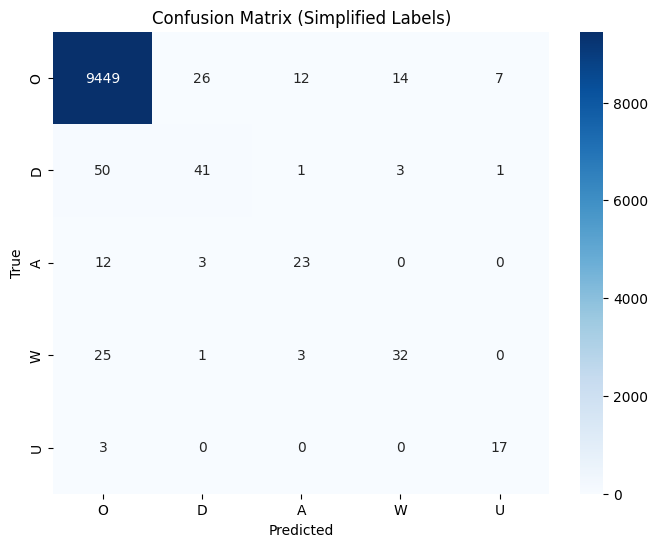

In [ ]:
import pandas as pd
import numpy as np
import torch
from transformers import BertTokenizerFast, BertForTokenClassification, TrainingArguments, Trainer
from torch.utils.data import Dataset as TorchDataset
from sklearn.metrics import accuracy_score, f1_score, precision_recall_fscore_support, confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt
import csv

# 標籤簡化函數
def simplify(label):
    if label in ["B-D", "M-D", "E-D", "S-D"]:
        return "D"
    elif label in ["B-A", "M-A", "E-A", "S-A"]:
        return "A"
    elif label in ["B-W", "M-W", "E-W", "S-W"]:
        return "W"
    elif label in ["B-U", "M-U", "E-U", "S-U"]:
        return "U"
    else:
        return "O"

# 載入數據
try:
    result = pd.read_csv("/content/drive/MyDrive/few-shot/noO_select_de.csv",
                         encoding='utf-8',
                         quoting=csv.QUOTE_ALL,
                         on_bad_lines='warn')
except Exception as e:
    print(f"讀取錯誤：{e}")
    exit()

# 只保留前九個欄位
columns = result.columns[:9].tolist()
print(f"保留的欄位：{columns}")
result = result[columns]

# 檢查資料完整性
if result.duplicated(subset=['post_id', 'word']).any():
    print("警告：存在重複的 post_id 和 word 組合")
if result['human_label'].isna().any():
    print("警告：存在缺少 human_label 的行")

# 簡化標籤
result['simplified_label'] = result['human_label'].apply(simplify)

# 檢查簡化標籤分佈
print("簡化標籤分佈:", result['simplified_label'].value_counts().to_dict())

# 定義簡化標籤映射
label2id = {"O": 0, "D": 1, "A": 2, "W": 3, "U": 4}
id2label = {v: k for k, v in label2id.items()}

# 按 post_id 分組
grouped = result.groupby('post_id')
data = []
for post_id, group in grouped:
    caption = group['caption'].iloc[0]
    words = group['word'].tolist()
    labels = group['simplified_label'].tolist()
    if not all(isinstance(word, str) for word in words):
        words = [str(word) for word in words]
    # print(f"post_id: {post_id}, words: {words}, labels: {labels}")  # 調試
    data.append({
        "caption": caption,
        "words": words,
        "labels": [label2id[label] for label in labels]
    })

# 自訂 Dataset 類
class CustomDataset(TorchDataset):
    def __init__(self, data, tokenizer, max_length=128):
        self.data = data
        self.tokenizer = tokenizer
        self.max_length = max_length

    def __len__(self):
        return len(self.data)

    def __getitem__(self, idx):
        item = self.data[idx]
        tokenized_inputs = self.tokenizer(
            item["words"],
            is_split_into_words=True,
            truncation=True,
            padding="max_length",
            max_length=self.max_length,
            return_tensors="pt"
        )
        word_ids = tokenized_inputs.word_ids()
        previous_word_idx = None
        label_ids = []
        for word_idx in word_ids:
            if word_idx is None:
                label_ids.append(-100)
            elif word_idx != previous_word_idx:
                label_ids.append(item["labels"][word_idx] if word_idx < len(item["labels"]) else -100)
            else:
                label_ids.append(-100)
            previous_word_idx = word_idx

        tokenized_inputs["labels"] = torch.tensor(label_ids)
        tokenized_inputs = {k: v.squeeze(0) for k, v in tokenized_inputs.items()}
        return tokenized_inputs

# 載入快速 tokenizer
try:
    tokenizer = BertTokenizerFast.from_pretrained("zwzzz/Chinese-MentalBERT")
    print("成功載入 BertTokenizerFast:", tokenizer.is_fast)
except Exception as e:
    print(f"載入快速 tokenizer 失敗: {e}")
    tokenizer = BertTokenizer.from_pretrained("zwzzz/Chinese-MentalBERT")
    print("使用標準 BertTokenizer，可能需要手動對齊 word_ids")

# 創建數據集
full_dataset = CustomDataset(data, tokenizer)

# 分割數據
train_size = int(0.8 * len(full_dataset))
eval_size = len(full_dataset) - train_size
train_dataset, eval_dataset = torch.utils.data.random_split(full_dataset, [train_size, eval_size])

# 載入模型
model = BertForTokenClassification.from_pretrained("zwzzz/Chinese-MentalBERT", num_labels=len(label2id))
for param in model.bert.embeddings.parameters():
    param.requires_grad = False
for param in model.bert.encoder.layer[:4].parameters():
    param.requires_grad = False

# 訓練參數
training_args = TrainingArguments(
    output_dir="/content/drive/MyDrive/few-shot/chinese_mentalbert_finetuned_results_simplified",
    eval_strategy="epoch",
    save_strategy="epoch",
    learning_rate=2e-5,
    per_device_train_batch_size=4,
    num_train_epochs=5,
    weight_decay=0.01,
    warmup_steps=50,
    logging_steps=5,
    report_to="none",
    save_steps=0,
    gradient_accumulation_steps=2,
    metric_for_best_model="eval_loss",
    load_best_model_at_end=True,
)

# 定義評估指標
def compute_metrics(pred):
    labels = pred.label_ids.flatten()
    preds = pred.predictions.argmax(-1).flatten()
    mask = labels != -100
    labels = labels[mask]
    preds = preds[mask]

    # 計算基本指標
    accuracy = accuracy_score(labels, preds)
    f1_weighted = f1_score(labels, preds, average="weighted")
    f1_macro = f1_score(labels, preds, average="macro")

    # 计算 Precision, Recall, F1 for each label present in true labels
    unique_labels = np.unique(labels)
    metrics_by_label = {}
    for label_id in unique_labels:
        label_name = id2label.get(label_id, f"Unknown_{label_id}")
        precision, recall, f1, _ = precision_recall_fscore_support(labels, preds, labels=[label_id], average=None)
        metrics_by_label[f"precision_{label_name}"] = precision[0] if precision.size > 0 else 0.0
        metrics_by_label[f"recall_{label_name}"] = recall[0] if recall.size > 0 else 0.0
        metrics_by_label[f"f1_{label_name}"] = f1[0] if f1.size > 0 else 0.0


    # # 计算混淆矩阵 - Moved outside to recompute from predictions
    # cm = confusion_matrix(labels, preds, labels=list(label2id.values())) # Ensure all labels are included

    return {
        "accuracy": accuracy,
        "f1_weighted": f1_weighted,
        "f1_macro": f1_macro,
        **metrics_by_label,
        # "confusion_matrix": cm.tolist() # Removed confusion matrix from here
    }

# 微調
trainer = Trainer(
    model=model,
    args=training_args,
    train_dataset=train_dataset,
    eval_dataset=eval_dataset,
    compute_metrics=compute_metrics
)

# 訓練
trainer.train()
print("訓練完成")

# 評估
eval_results = trainer.evaluate()
print("評估結果:", eval_results)

# Recompute confusion matrix from predictions
predictions, labels, _ = trainer.predict(eval_dataset)
predictions = np.argmax(predictions, axis=2)

# Flatten the predictions and labels, filtering out -100
flat_predictions = predictions.flatten()
flat_labels = labels.flatten()

# Filter out -100 from both predictions and labels
mask = flat_labels != -100
flat_predictions = flat_predictions[mask]
flat_labels = flat_labels[mask]


# Ensure labels list for confusion matrix covers all possible labels
labels_for_cm = list(label2id.values())

cm = confusion_matrix(flat_labels, flat_predictions, labels=labels_for_cm)


# 視覺化混淆矩陣
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", xticklabels=list(id2label.values()), yticklabels=list(id2label.values()))
plt.xlabel("Predicted")
plt.ylabel("True")
plt.title("Confusion Matrix (Simplified Labels)")
plt.show()

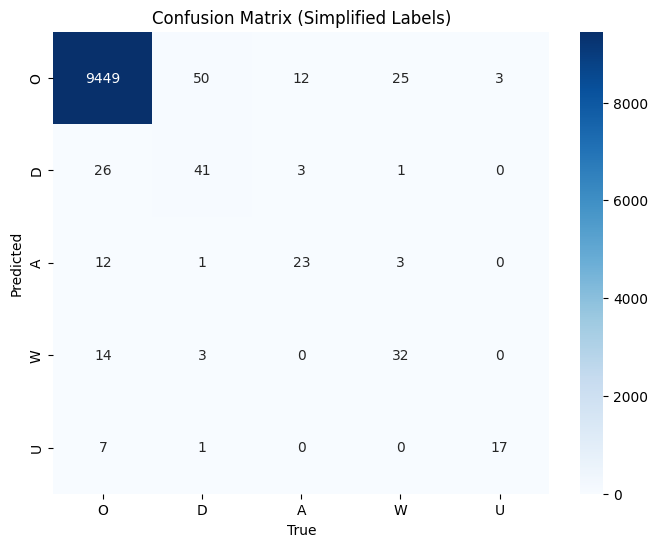

In [ ]:
# 混淆矩陣 (交換輸入順序)
cm = confusion_matrix(flat_predictions, flat_labels, labels=labels_for_cm)

# 視覺化混淆矩陣
plt.figure(figsize=(8, 6))
sns.heatmap(
    cm, annot=True, fmt="d", cmap="Blues",
    xticklabels=list(id2label.values()),  # 橫軸是真實
    yticklabels=list(id2label.values())   # 縱軸是預測
)
plt.xlabel("True")
plt.ylabel("Predicted")
plt.title("Confusion Matrix (Simplified Labels)")
plt.show()


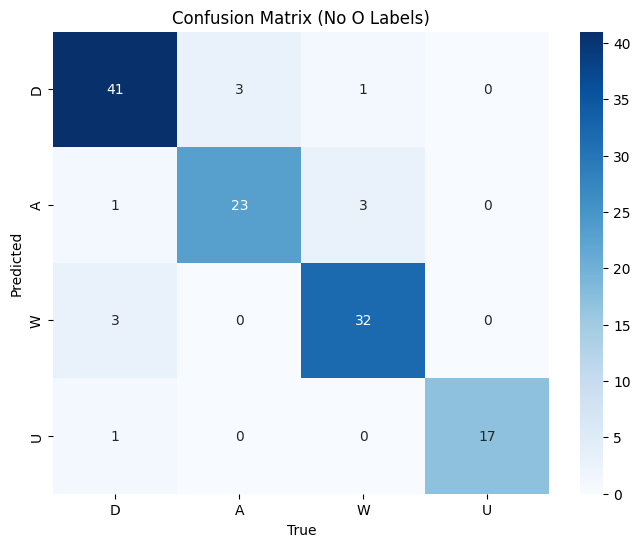

In [ ]:
# 排除 O 類別
labels_no_O = [lid for lid, name in id2label.items() if name != "O"]

# 混淆矩陣 (交換順序，橫軸=True, 縱軸=Predicted)
cm_no_O = confusion_matrix(flat_predictions, flat_labels, labels=labels_no_O)

# 視覺化 (不含 O)
plt.figure(figsize=(8, 6))
sns.heatmap(
    cm_no_O, annot=True, fmt="d", cmap="Blues",
    xticklabels=[id2label[lid] for lid in labels_no_O],
    yticklabels=[id2label[lid] for lid in labels_no_O]
)
plt.xlabel("True")
plt.ylabel("Predicted")
plt.title("Confusion Matrix (No O Labels)")
plt.show()


保留的欄位：['post_id', 'caption', 'word', 'human_label', 'gpt_label_1', 'gpt_label_2', 'gpt_label_3', 'gpt_label_4', 'gpt_label_5']
警告：存在重複的 post_id 和 word 組合
簡化標籤分佈: {'O': 36997, 'D': 667, 'W': 234, 'A': 91, 'U': 78}
成功載入 BertTokenizerFast: True


Some weights of BertForTokenClassification were not initialized from the model checkpoint at zwzzz/Chinese-MentalBERT and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


Epoch,Training Loss,Validation Loss,Accuracy,F1 Weighted,F1 Macro,Precision O,Recall O,F1 O,Precision D,Recall D,F1 D,Precision A,Recall A,F1 A,Precision W,Recall W,F1 W,Precision U,Recall U,F1 U
1,0.858100,0.258073,0.953901,0.931395,0.195281,0.953901,1.000000,0.976407,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
2,0.296400,0.156510,0.960697,0.948160,0.293940,0.964907,0.996592,0.980494,0.680000,0.382022,0.489209,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
3,0.174300,0.135404,0.961879,0.951623,0.333036,0.969194,0.994114,0.981496,0.642857,0.505618,0.566038,0.333333,0.071429,0.117647,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
4,0.177300,0.124910,0.961288,0.953331,0.343351,0.974101,0.990397,0.982181,0.568421,0.606742,0.586957,0.166667,0.071429,0.100000,1.000000,0.024390,0.047619,0.000000,0.000000,0.000000
5,0.125200,0.123643,0.960402,0.953894,0.352079,0.976716,0.987608,0.982132,0.531532,0.662921,0.590000,0.142857,0.071429,0.095238,1.000000,0.048780,0.093023,0.000000,0.000000,0.000000


/usr/local/lib/python3.12/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.12/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.12/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.12/dist-packages/sklearn/metrics/_classification.p

訓練完成


評估結果: {'eval_loss': 0.12364319711923599, 'eval_accuracy': 0.960401891252955, 'eval_f1_weighted': 0.9538944779666315, 'eval_f1_macro': 0.35207864112846277, 'eval_precision_O': 0.9767156862745098, 'eval_recall_O': 0.9876084262701363, 'eval_f1_O': 0.982131854590265, 'eval_precision_D': 0.5315315315315315, 'eval_recall_D': 0.6629213483146067, 'eval_f1_D': 0.59, 'eval_precision_A': 0.14285714285714285, 'eval_recall_A': 0.07142857142857142, 'eval_f1_A': 0.09523809523809523, 'eval_precision_W': 1.0, 'eval_recall_W': 0.04878048780487805, 'eval_f1_W': 0.09302325581395349, 'eval_precision_U': 0.0, 'eval_recall_U': 0.0, 'eval_f1_U': 0.0, 'eval_runtime': 0.8121, 'eval_samples_per_second': 68.954, 'eval_steps_per_second': 8.619, 'epoch': 5.0}


/usr/local/lib/python3.12/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.12/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


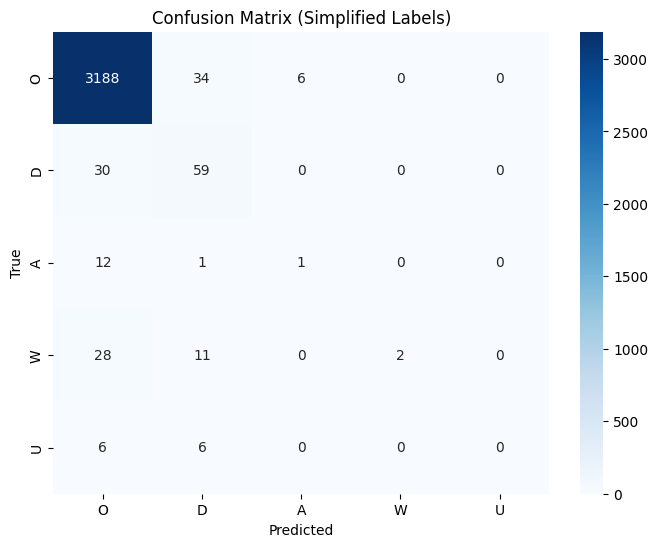

In [ ]:
import pandas as pd
import numpy as np
import torch
from transformers import BertTokenizerFast, BertForTokenClassification, TrainingArguments, Trainer
from torch.utils.data import Dataset as TorchDataset
from sklearn.metrics import accuracy_score, f1_score, precision_recall_fscore_support, confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt
import csv

# 標籤簡化函數
def simplify(label):
    if label in ["B-D", "M-D", "E-D", "S-D"]:
        return "D"
    elif label in ["B-A", "M-A", "E-A", "S-A"]:
        return "A"
    elif label in ["B-W", "M-W", "E-W", "S-W"]:
        return "W"
    elif label in ["B-U", "M-U", "E-U", "S-U"]:
        return "U"
    else:
        return "O"

# 載入數據
try:
    result = pd.read_csv("/content/drive/MyDrive/few-shot/noO_select_de.csv",
                         encoding='utf-8',
                         quoting=csv.QUOTE_ALL,
                         on_bad_lines='warn')
except Exception as e:
    print(f"讀取錯誤：{e}")
    exit()

# 只保留前九個欄位
columns = result.columns[:9].tolist()
print(f"保留的欄位：{columns}")
result = result[columns]

# 檢查資料完整性
if result.duplicated(subset=['post_id', 'word']).any():
    print("警告：存在重複的 post_id 和 word 組合")
if result['human_label'].isna().any():
    print("警告：存在缺少 human_label 的行")

# 簡化標籤
result['simplified_label'] = result['human_label'].apply(simplify)

# 檢查簡化標籤分佈
print("簡化標籤分佈:", result['simplified_label'].value_counts().to_dict())

# 定義簡化標籤映射
label2id = {"O": 0, "D": 1, "A": 2, "W": 3, "U": 4}
id2label = {v: k for k, v in label2id.items()}

# 按 post_id 分組
grouped = result.groupby('post_id')
data = []
for post_id, group in grouped:
    caption = group['caption'].iloc[0]
    words = group['word'].tolist()
    labels = group['simplified_label'].tolist()
    if not all(isinstance(word, str) for word in words):
        words = [str(word) for word in words]
    # print(f"post_id: {post_id}, words: {words}, labels: {labels}")  # 調試
    data.append({
        "caption": caption,
        "words": words,
        "labels": [label2id[label] for label in labels]
    })

# 自訂 Dataset 類
class CustomDataset(TorchDataset):
    def __init__(self, data, tokenizer, max_length=128):
        self.data = data
        self.tokenizer = tokenizer
        self.max_length = max_length

    def __len__(self):
        return len(self.data)

    def __getitem__(self, idx):
        item = self.data[idx]
        tokenized_inputs = self.tokenizer(
            item["words"],
            is_split_into_words=True,
            truncation=True,
            padding="max_length",
            max_length=self.max_length,
            return_tensors="pt"
        )
        word_ids = tokenized_inputs.word_ids()
        previous_word_idx = None
        label_ids = []
        for word_idx in word_ids:
            if word_idx is None:
                label_ids.append(-100)
            elif word_idx != previous_word_idx:
                label_ids.append(item["labels"][word_idx] if word_idx < len(item["labels"]) else -100)
            else:
                label_ids.append(-100)
            previous_word_idx = word_idx

        tokenized_inputs["labels"] = torch.tensor(label_ids)
        tokenized_inputs = {k: v.squeeze(0) for k, v in tokenized_inputs.items()}
        return tokenized_inputs

# 載入快速 tokenizer
try:
    tokenizer = BertTokenizerFast.from_pretrained("zwzzz/Chinese-MentalBERT")
    print("成功載入 BertTokenizerFast:", tokenizer.is_fast)
except Exception as e:
    print(f"載入快速 tokenizer 失敗: {e}")
    tokenizer = BertTokenizer.from_pretrained("zwzzz/Chinese-MentalBERT")
    print("使用標準 BertTokenizer，可能需要手動對齊 word_ids")

# 創建數據集
full_dataset = CustomDataset(data, tokenizer)

# 分割數據
train_size = int(0.8 * len(full_dataset))
eval_size = len(full_dataset) - train_size
train_dataset, eval_dataset = torch.utils.data.random_split(full_dataset, [train_size, eval_size])

# 載入模型
model = BertForTokenClassification.from_pretrained("zwzzz/Chinese-MentalBERT", num_labels=len(label2id))
for param in model.bert.embeddings.parameters():
    param.requires_grad = False
for param in model.bert.encoder.layer[:4].parameters():
    param.requires_grad = False

# 訓練參數
training_args = TrainingArguments(
    output_dir="/content/drive/MyDrive/few-shot/chinese_mentalbert_finetuned_results_simplified",
    eval_strategy="epoch",
    save_strategy="epoch",
    learning_rate=2e-5,
    per_device_train_batch_size=4,
    num_train_epochs=5,
    weight_decay=0.01,
    warmup_steps=50,
    logging_steps=5,
    report_to="none",
    save_steps=0,
    gradient_accumulation_steps=2,
    metric_for_best_model="eval_loss",
    load_best_model_at_end=True,
)

# 定義評估指標
def compute_metrics(pred):
    labels = pred.label_ids.flatten()
    preds = pred.predictions.argmax(-1).flatten()
    mask = labels != -100
    labels = labels[mask]
    preds = preds[mask]

    # 計算基本指標
    accuracy = accuracy_score(labels, preds)
    f1_weighted = f1_score(labels, preds, average="weighted")
    f1_macro = f1_score(labels, preds, average="macro")

    # 计算 Precision, Recall, F1 for each label present in true labels
    unique_labels = np.unique(labels)
    metrics_by_label = {}
    for label_id in unique_labels:
        label_name = id2label.get(label_id, f"Unknown_{label_id}")
        precision, recall, f1, _ = precision_recall_fscore_support(labels, preds, labels=[label_id], average=None)
        metrics_by_label[f"precision_{label_name}"] = precision[0] if precision.size > 0 else 0.0
        metrics_by_label[f"recall_{label_name}"] = recall[0] if recall.size > 0 else 0.0
        metrics_by_label[f"f1_{label_name}"] = f1[0] if f1.size > 0 else 0.0


    # # 计算混淆矩阵 - Moved outside to recompute from predictions
    # cm = confusion_matrix(labels, preds, labels=list(label2id.values())) # Ensure all labels are included

    return {
        "accuracy": accuracy,
        "f1_weighted": f1_weighted,
        "f1_macro": f1_macro,
        **metrics_by_label,
        # "confusion_matrix": cm.tolist() # Removed confusion matrix from here
    }

# 微調
trainer = Trainer(
    model=model,
    args=training_args,
    train_dataset=train_dataset,
    eval_dataset=eval_dataset,
    compute_metrics=compute_metrics
)

# 訓練
trainer.train()
print("訓練完成")

# 評估
eval_results = trainer.evaluate()
print("評估結果:", eval_results)

# Recompute confusion matrix from predictions
predictions, labels, _ = trainer.predict(eval_dataset)
predictions = np.argmax(predictions, axis=2)

# Flatten the predictions and labels, filtering out -100
flat_predictions = predictions.flatten()
flat_labels = labels.flatten()

# Filter out -100 from both predictions and labels
mask = flat_labels != -100
flat_predictions = flat_predictions[mask]
flat_labels = flat_labels[mask]

# Filter out predicted labels that are outside the valid range (0-4)
valid_label_indices = list(label2id.values())
valid_pred_mask = np.isin(flat_predictions, valid_label_indices)
flat_predictions = flat_predictions[valid_pred_mask]
flat_labels = flat_labels[valid_pred_mask] # Also filter true labels based on valid predictions

# Ensure labels list for confusion matrix covers all possible labels
labels_for_cm = list(label2id.values())

cm = confusion_matrix(flat_labels, flat_predictions, labels=labels_for_cm)


# 視覺化混淆矩陣
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", xticklabels=list(id2label.values()), yticklabels=list(id2label.values()))
plt.xlabel("Predicted")
plt.ylabel("True")
plt.title("Confusion Matrix (Simplified Labels)")
plt.show()

In [ ]:
# 定義評估指標
def compute_metrics(pred):
    labels = pred.label_ids.flatten()
    preds = pred.predictions.argmax(-1).flatten()
    mask = labels != -100  # 過濾掉 -100（填充或無效標籤）
    labels = labels[mask]
    preds = preds[mask]

    # 定義目標類別索引 (D, W, A, U)
    target_labels = [1, 3, 2, 4]  # 對應 label2id: D=1, W=3, A=2, U=4

    # 過濾出目標類別的標籤和預測
    target_mask = np.isin(labels, target_labels)
    labels_target = labels[target_mask]
    preds_target = preds[target_mask]

    # 計算目標類別的準確度
    accuracy_target = accuracy_score(labels_target, preds_target) if len(labels_target) > 0 else 0.0

    # 計算整體指標 (包括所有類別)
    accuracy = accuracy_score(labels, preds)
    f1_weighted = f1_score(labels, preds, average="weighted")
    f1_macro = f1_score(labels, preds, average="macro")

    # 計算每個類別的 Precision, Recall, F1
    precision, recall, f1_per_class, _ = precision_recall_fscore_support(labels, preds, average=None, labels=target_labels)
    class_metrics = {
        f"precision_{id2label[i]}": precision[j] for j, i in enumerate(target_labels) if i in id2label
    }
    class_metrics.update({
        f"recall_{id2label[i]}": recall[j] for j, i in enumerate(target_labels) if i in id2label
    })
    class_metrics.update({
        f"f1_{id2label[i]}": f1_per_class[j] for j, i in enumerate(target_labels) if i in id2label
    })

    # 計算混淆矩陣
    cm = confusion_matrix(labels, preds)

    return {
        "accuracy": accuracy,  # 整體準確度 (包括 O)
        "accuracy_target": accuracy_target,  # 僅 D/W/A/U 的準確度
        "f1_weighted": f1_weighted,
        "f1_macro": f1_macro,
        **class_metrics,
        "confusion_matrix": cm.tolist()
    }

In [ ]:
# 🔍 檢查 Oversampling 後的貼文與 token 數量
print("\n=== Oversampling 統計 ===")
print("Oversampled 貼文數:", oversampled_train_df["post_id"].nunique())
print("Oversampled token 數:", len(oversampled_train_df))
print("每類 main_label 貼文數:")
post_main_after = assign_main_label(oversampled_train_df)
print(post_main_after["main_label"].value_counts())



=== Oversampling 統計 ===
Oversampled 貼文數: 233
Oversampled token 數: 31729
每類 main_label 貼文數:
main_label
D    125
W     62
A     23
U     23
Name: count, dtype: int64


### 逐次加入合成資料來微調模型

In [ ]:
import os
import csv
import shutil
import random
import numpy as np
import pandas as pd
import torch
from torch.utils.data import Dataset as TorchDataset
from transformers import (
    BertTokenizerFast, BertForTokenClassification,
    TrainingArguments, Trainer
)
from sklearn.metrics import accuracy_score, f1_score, precision_recall_fscore_support, confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns

# ========================
# 1) 全域設定與隨機種子
# ========================
SEED = 42
random.seed(SEED)
np.random.seed(SEED)
torch.manual_seed(SEED)
if torch.cuda.is_available():
    torch.cuda.manual_seed_all(SEED)
torch.backends.cudnn.deterministic = True
torch.backends.cudnn.benchmark = False

RESULTS_ROOT = "/content/drive/MyDrive/few-shot/exp_incremental_synth"
os.makedirs(RESULTS_ROOT, exist_ok=True)

# ========================
# 2) 路徑
# ========================
orig_path  = "/content/drive/MyDrive/few-shot/merged_posts800.csv"
synth_path = "/content/drive/MyDrive/few-shot/merged_stage3_full.csv"

# ========================
# 3) 標籤簡化
# ========================
def simplify(label):
    if label in ["B-D", "M-D", "E-D", "S-D"]:
        return "D"
    elif label in ["B-A", "M-A", "E-A", "S-A"]:
        return "A"
    elif label in ["B-W", "M-W", "E-W", "S-W"]:
        return "W"
    elif label in ["B-U", "M-U", "E-U", "S-U"]:
        return "U"
    else:
        return "O"

label2id = {"O": 0, "D": 1, "A": 2, "W": 3, "U": 4}
id2label = {v: k for k, v in label2id.items()}
LABEL_ORDER = [label2id[k] for k in ["O", "D", "A", "W", "U"]]

# ========================
# 4) 載入與處理資料
# ========================
def load_and_process(path):
    df = pd.read_csv(path, encoding="utf-8", quoting=csv.QUOTE_ALL, on_bad_lines="warn")
    # 只保留前 9 欄（與你原程式一致）
    df = df[df.columns[:9].tolist()]
    # 必要欄位檢查
    need_cols = {"post_id", "word", "caption", "human_label"}
    miss = need_cols - set(df.columns)
    if miss:
        raise ValueError(f"檔案 {path} 缺少必要欄位: {miss}")
    # 簡化標籤
    df["simplified_label"] = df["human_label"].apply(simplify)
    return df

orig_df  = load_and_process(orig_path)
synth_df = load_and_process(synth_path)

print("原始資料分佈:", orig_df["simplified_label"].value_counts().to_dict())
print("合成資料分佈:", synth_df["simplified_label"].value_counts().to_dict())

def to_dataset_format(df):
    data = []
    for post_id, g in df.groupby("post_id"):
        words  = g["word"].astype(str).tolist()
        labels = g["simplified_label"].tolist()
        data.append({
            "caption": g["caption"].iloc[0],
            "words": words,
            "labels": [label2id[x] for x in labels]
        })
    return data

orig_data  = to_dataset_format(orig_df)
synth_data = to_dataset_format(synth_df)

# 為了避免每次都取到同一批合成資料前 50/100...，先做穩定隨機順序
rng = np.random.default_rng(SEED)
synth_indices = np.arange(len(synth_data))
rng.shuffle(synth_indices)
synth_data = [synth_data[i] for i in synth_indices]

# ========================
# 5) Dataset 類別
# ========================
class CustomDataset(TorchDataset):
    def __init__(self, data, tokenizer, max_length=128):
        self.data = data
        self.tokenizer = tokenizer
        self.max_length = max_length

    def __len__(self):
        return len(self.data)

    def __getitem__(self, idx):
        item = self.data[idx]
        enc = self.tokenizer(
            item["words"],
            is_split_into_words=True,
            truncation=True,
            padding="max_length",
            max_length=self.max_length,
            return_tensors="pt"
        )
        word_ids = enc.word_ids()
        prev_wid = None
        label_ids = []
        for wid in word_ids:
            if wid is None:
                label_ids.append(-100)
            elif wid != prev_wid:
                label_ids.append(item["labels"][wid] if wid < len(item["labels"]) else -100)
            else:
                # 對於一個 word 內的後續 sub-tokens 不計分（標 -100）
                label_ids.append(-100)
            prev_wid = wid
        enc["labels"] = torch.tensor(label_ids)
        enc = {k: v.squeeze(0) for k, v in enc.items()}
        return enc

# ========================
# 6) Tokenizer
# ========================
tokenizer = BertTokenizerFast.from_pretrained("zwzzz/Chinese-MentalBERT")

# ========================
# 7) 固定驗證集（從原始 800 切出）
# ========================
np.random.seed(SEED)
indices = np.random.permutation(len(orig_data))
split = int(0.8 * len(orig_data))
train_idx, val_idx = indices[:split], indices[split:]
base_train_data = [orig_data[i] for i in train_idx]
fixed_val_data  = [orig_data[i] for i in val_idx]

eval_dataset = CustomDataset(fixed_val_data, tokenizer)

# ========================
# 8) 指標計算
# ========================
def compute_metrics(pred):
    labels = pred.label_ids.reshape(-1)
    preds  = pred.predictions.argmax(-1).reshape(-1)
    mask = labels != -100
    labels, preds = labels[mask], preds[mask]

    acc = accuracy_score(labels, preds)
    f1_w = f1_score(labels, preds, average="weighted", zero_division=0)
    f1_m = f1_score(labels, preds, average="macro", zero_division=0)

    metrics_by_label = {}
    for lid in sorted(np.unique(labels)):
        name = id2label.get(int(lid), str(lid))
        pr, rc, f1, _ = precision_recall_fscore_support(labels, preds, labels=[lid], average=None, zero_division=0)
        metrics_by_label[f"precision_{name}"] = float(pr[0])
        metrics_by_label[f"recall_{name}"]    = float(rc[0])
        metrics_by_label[f"f1_{name}"]        = float(f1[0])

    return {"accuracy": acc, "f1_weighted": f1_w, "f1_macro": f1_m, **metrics_by_label}

def plot_and_save_cm(cm, labels_names, out_png):
    plt.figure(figsize=(7, 6))
    sns.heatmap(cm, annot=True, fmt="d", cmap="Blues",
                xticklabels=labels_names, yticklabels=labels_names)
    plt.xlabel("Predicted")
    plt.ylabel("True")
    plt.title("Confusion Matrix (Simplified Labels)")
    plt.tight_layout()
    plt.savefig(out_png, dpi=150)
    plt.close()

# ========================
# 9) 訓練迴圈（逐步加入合成資料）
# ========================
all_rows = []  # for summary CSV

for step in [0, 50, 100, 150, 200]:
    cur_dir = os.path.join(RESULTS_ROOT, f"results_simplified_step{step}")
    os.makedirs(cur_dir, exist_ok=True)

    # 準備訓練資料：原始訓練分割 + 前 step 筆合成
    current_train = base_train_data + synth_data[:step]
    train_dataset = CustomDataset(train_data, tokenizer, max_o_ratio=0.7)

    # 模型與凍結策略（沿用你之前的做法）
    model = BertForTokenClassification.from_pretrained(
        "zwzzz/Chinese-MentalBERT",
        num_labels=len(label2id)
    )
    # 凍結 embeddings 與前 4 層 encoder
    for p in model.bert.embeddings.parameters():
        p.requires_grad = False
    for p in model.bert.encoder.layer[:4].parameters():
        p.requires_grad = False

    # TrainingArguments — 重要：eval/save 策略一致；只保留 1 個 checkpoint
    training_args = TrainingArguments(
        output_dir=cur_dir,
        evaluation_strategy="epoch",
        save_strategy="epoch",          # ★ 和 evaluation_strategy 一致
        save_total_limit=1,             # ★ 僅保留 1 個 checkpoint
        load_best_model_at_end=True,    # ★ 訓練結束載入最佳
        metric_for_best_model="eval_loss",
        greater_is_better=False,
        learning_rate=2e-5,
        per_device_train_batch_size=4,
        num_train_epochs=5,
        weight_decay=0.01,
        warmup_steps=50,
        logging_strategy="steps",
        logging_steps=20,
        report_to="none",
        gradient_accumulation_steps=2,
        seed=SEED,
        save_on_each_node=False
        # 若 transformers 版本支援，也可加上：
        # save_only_model=True,
        # save_safetensors=True,
    )

    trainer = Trainer(
        model=model,
        args=training_args,
        train_dataset=train_dataset,
        eval_dataset=eval_dataset,
        compute_metrics=compute_metrics
    )

    print(f"\n===== 訓練階段：原始800 + {step} 合成，訓練樣本數={len(current_train)}，驗證樣本數={len(fixed_val_data)} =====")
    trainer.train()

    # 這時候 trainer 內的模型已是最佳模型（因為 load_best_model_at_end=True）
    # 額外穩妥地再存一份到 best_model/ 目錄
    best_dir = os.path.join(cur_dir, "best_model")
    trainer.save_model(best_dir)                 # 權重
    tokenizer.save_pretrained(best_dir)         # tokenizer
    # 也保留 config、training state 於 output_dir（Trainer 會處理）

    # 評估、輸出度量
    eval_results = trainer.evaluate()
    print(f"[Step {step}] Eval:", eval_results)

    # 另存單階段 metrics 到 CSV
    one_csv = os.path.join(cur_dir, f"metrics_step{step}.csv")
    pd.DataFrame([{"step": step, "train_posts": len(current_train), **eval_results}]).to_csv(one_csv, index=False)

    # 預測驗證集 → 混淆矩陣
    preds, labels, _ = trainer.predict(eval_dataset)
    preds = preds.argmax(-1)

    flat_preds  = preds.reshape(-1)
    flat_labels = labels.reshape(-1)
    mask = flat_labels != -100
    flat_preds  = flat_preds[mask]
    flat_labels = flat_labels[mask]

    cm = confusion_matrix(flat_labels, flat_preds, labels=LABEL_ORDER)
    # 存圖
    cm_png = os.path.join(cur_dir, f"confusion_matrix_step{step}.png")
    plot_and_save_cm(cm, [id2label[i] for i in LABEL_ORDER], cm_png)
    # 存矩陣數值
    cm_csv = os.path.join(cur_dir, f"confusion_matrix_step{step}.csv")
    pd.DataFrame(cm, index=[id2label[i] for i in LABEL_ORDER],
                 columns=[id2label[i] for i in LABEL_ORDER]).to_csv(cm_csv)

    # 集中彙整（for 總表）
    row = {"step": step, "train_posts": len(current_train)}
    # 只拉出常用指標（避免把 logits 等一併存入）
    for k in ["eval_loss", "eval_accuracy", "eval_f1_weighted", "eval_f1_macro"]:
        if k in eval_results:
            row[k] = float(eval_results[k])
    all_rows.append(row)

# 總表：各 step 的摘要指標
summary_csv = os.path.join(RESULTS_ROOT, "summary_metrics.csv")
pd.DataFrame(all_rows).to_csv(summary_csv, index=False)
print(f"\n✔ 已輸出總表：{summary_csv}")
print("完成。每個階段的最佳模型與成果皆位於：", RESULTS_ROOT)


原始資料分佈: {'O': 95628, 'D': 667, 'W': 234, 'A': 91, 'U': 78}
合成資料分佈: {'O': 8063, 'D': 399, 'W': 248, 'A': 180, 'U': 140}


/usr/local/lib/python3.12/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(
'(ReadTimeoutError("HTTPSConnectionPool(host='huggingface.co', port=443): Read timed out. (read timeout=10)"), '(Request ID: 26640a1d-36e4-4faf-9410-0e78b8e27580)')' thrown while requesting HEAD https://huggingface.co/zwzzz/Chinese-MentalBERT/resolve/main/tokenizer_config.json
Retrying in 1s [Retry 1/5].
'(ReadTimeoutError("HTTPSConnectionPool(host='huggingface.co', port=443): Read timed out. (read timeout=10)"), '(Request ID: 7a0f1184-9bdf-482b-960d-0ee434e9804d)')' thrown whi

vocab.txt: 0.00B [00:00, ?B/s]

config.json:   0%|          | 0.00/848 [00:00<?, ?B/s]

'(ReadTimeoutError("HTTPSConnectionPool(host='huggingface.co', port=443): Read timed out. (read timeout=10)"), '(Request ID: b37fb51c-22ec-4184-8590-2622ea8db857)')' thrown while requesting HEAD https://huggingface.co/zwzzz/Chinese-MentalBERT/resolve/main/model.safetensors.index.json
Retrying in 1s [Retry 1/5].


pytorch_model.bin:   0%|          | 0.00/409M [00:00<?, ?B/s]

Some weights of BertForTokenClassification were not initialized from the model checkpoint at zwzzz/Chinese-MentalBERT and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
/usr/local/lib/python3.12/dist-packages/transformers/training_args.py:1575: FutureWarning: `evaluation_strategy` is deprecated and will be removed in version 4.46 of 🤗 Transformers. Use `eval_strategy` instead
  warnings.warn(



===== 訓練階段：原始800 + 0 合成，訓練樣本數=640，驗證樣本數=160 =====


Epoch,Training Loss,Validation Loss,Accuracy,F1 Weighted,F1 Macro,Precision O,Recall O,F1 O,Precision D,Recall D,F1 D,Precision A,Recall A,F1 A,Precision W,Recall W,F1 W,Precision U,Recall U,F1 U
1,0.125000,0.065966,0.983835,0.979602,0.295281,0.986780,0.997137,0.991932,0.600000,0.406250,0.484472,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
2,0.072800,0.051132,0.984538,0.981624,0.354391,0.988985,0.995945,0.992453,0.590909,0.541667,0.565217,0.000000,0.000000,0.000000,0.750000,0.125000,0.214286,0.000000,0.000000,0.000000
3,0.098000,0.046947,0.986061,0.984008,0.471470,0.989930,0.996660,0.993284,0.680556,0.510417,0.583333,0.200000,0.076923,0.111111,0.588235,0.416667,0.487805,1.000000,0.100000,0.181818
4,0.040200,0.051202,0.985475,0.984362,0.503976,0.991559,0.994752,0.993153,0.608696,0.583333,0.595745,0.250000,0.076923,0.117647,0.461538,0.500000,0.480000,1.000000,0.200000,0.333333
5,0.047500,0.052481,0.985709,0.984601,0.511799,0.991677,0.994752,0.993212,0.604167,0.604167,0.604167,0.250000,0.076923,0.117647,0.521739,0.500000,0.510638,1.000000,0.200000,0.333333


[Step 0] Eval: {'eval_loss': 0.046946775168180466, 'eval_accuracy': 0.9860606770528288, 'eval_f1_weighted': 0.9840083796115586, 'eval_f1_macro': 0.47147026163494105, 'eval_precision_O': 0.9899301030683568, 'eval_recall_O': 0.9966603053435115, 'eval_f1_O': 0.9932838038632986, 'eval_precision_D': 0.6805555555555556, 'eval_recall_D': 0.5104166666666666, 'eval_f1_D': 0.5833333333333334, 'eval_precision_A': 0.2, 'eval_recall_A': 0.07692307692307693, 'eval_f1_A': 0.1111111111111111, 'eval_precision_W': 0.5882352941176471, 'eval_recall_W': 0.4166666666666667, 'eval_f1_W': 0.4878048780487805, 'eval_precision_U': 1.0, 'eval_recall_U': 0.1, 'eval_f1_U': 0.18181818181818182, 'eval_runtime': 1.379, 'eval_samples_per_second': 116.025, 'eval_steps_per_second': 14.503, 'epoch': 5.0}


Some weights of BertForTokenClassification were not initialized from the model checkpoint at zwzzz/Chinese-MentalBERT and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
/usr/local/lib/python3.12/dist-packages/transformers/training_args.py:1575: FutureWarning: `evaluation_strategy` is deprecated and will be removed in version 4.46 of 🤗 Transformers. Use `eval_strategy` instead
  warnings.warn(



===== 訓練階段：原始800 + 50 合成，訓練樣本數=690，驗證樣本數=160 =====


Epoch,Training Loss,Validation Loss,Accuracy,F1 Weighted,F1 Macro,Precision O,Recall O,F1 O,Precision D,Recall D,F1 D,Precision A,Recall A,F1 A,Precision W,Recall W,F1 W,Precision U,Recall U,F1 U
1,0.194500,0.057807,0.984304,0.980045,0.295969,0.987136,0.997615,0.992347,0.609375,0.406250,0.487500,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
2,0.140800,0.046885,0.986061,0.982893,0.413393,0.988196,0.998569,0.993355,0.750000,0.406250,0.527027,0.000000,0.000000,0.000000,1.000000,0.166667,0.285714,1.000000,0.150000,0.260870
3,0.095900,0.044875,0.985241,0.984937,0.545285,0.992729,0.993321,0.993025,0.612245,0.625000,0.618557,0.142857,0.076923,0.100000,0.500000,0.458333,0.478261,0.523810,0.550000,0.536585
4,0.048600,0.045440,0.985358,0.984968,0.560483,0.992257,0.993559,0.992908,0.618557,0.625000,0.621762,0.222222,0.153846,0.181818,0.480000,0.500000,0.489796,0.727273,0.400000,0.516129


[Step 50] Eval: {'eval_loss': 0.04487507417798042, 'eval_accuracy': 0.9852407168794659, 'eval_f1_weighted': 0.9849371969341033, 'eval_f1_macro': 0.5452854880232822, 'eval_precision_O': 0.9927285731314817, 'eval_recall_O': 0.9933206106870229, 'eval_f1_O': 0.993024503666607, 'eval_precision_D': 0.6122448979591837, 'eval_recall_D': 0.625, 'eval_f1_D': 0.6185567010309279, 'eval_precision_A': 0.14285714285714285, 'eval_recall_A': 0.07692307692307693, 'eval_f1_A': 0.1, 'eval_precision_W': 0.5, 'eval_recall_W': 0.4583333333333333, 'eval_f1_W': 0.4782608695652174, 'eval_precision_U': 0.5238095238095238, 'eval_recall_U': 0.55, 'eval_f1_U': 0.5365853658536586, 'eval_runtime': 1.4395, 'eval_samples_per_second': 111.146, 'eval_steps_per_second': 13.893, 'epoch': 4.9479768786127165}


Some weights of BertForTokenClassification were not initialized from the model checkpoint at zwzzz/Chinese-MentalBERT and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
/usr/local/lib/python3.12/dist-packages/transformers/training_args.py:1575: FutureWarning: `evaluation_strategy` is deprecated and will be removed in version 4.46 of 🤗 Transformers. Use `eval_strategy` instead
  warnings.warn(



===== 訓練階段：原始800 + 100 合成，訓練樣本數=740，驗證樣本數=160 =====


Epoch,Training Loss,Validation Loss,Accuracy,F1 Weighted,F1 Macro,Precision O,Recall O,F1 O,Precision D,Recall D,F1 D,Precision A,Recall A,F1 A,Precision W,Recall W,F1 W,Precision U,Recall U,F1 U
1,0.278500,0.057978,0.985241,0.980936,0.326632,0.987033,0.998688,0.992826,0.692308,0.375000,0.486486,0.000000,0.000000,0.000000,1.000000,0.083333,0.153846,0.000000,0.000000,0.000000
2,0.092100,0.046947,0.986178,0.984590,0.445040,0.991447,0.995468,0.993453,0.663158,0.656250,0.659686,0.000000,0.000000,0.000000,0.470588,0.333333,0.390244,1.000000,0.100000,0.181818
3,0.111300,0.045917,0.985826,0.985339,0.539305,0.992852,0.994036,0.993444,0.633663,0.666667,0.649746,0.333333,0.307692,0.320000,0.384615,0.416667,0.400000,1.000000,0.200000,0.333333
4,0.063100,0.047641,0.985475,0.985132,0.538695,0.992733,0.993917,0.993325,0.638298,0.625000,0.631579,0.250000,0.230769,0.240000,0.375000,0.500000,0.428571,1.000000,0.250000,0.400000


[Step 100] Eval: {'eval_loss': 0.04529527202248573, 'eval_accuracy': 0.9860606770528288, 'eval_f1_weighted': 0.9856980560304641, 'eval_f1_macro': 0.5622824052897093, 'eval_precision_O': 0.9930878322011679, 'eval_recall_O': 0.9939169847328244, 'eval_f1_O': 0.9935022354694486, 'eval_precision_D': 0.6226415094339622, 'eval_recall_D': 0.6875, 'eval_f1_D': 0.6534653465346535, 'eval_precision_A': 0.3333333333333333, 'eval_recall_A': 0.3076923076923077, 'eval_f1_A': 0.32, 'eval_precision_W': 0.42857142857142855, 'eval_recall_W': 0.375, 'eval_f1_W': 0.4, 'eval_precision_U': 0.8571428571428571, 'eval_recall_U': 0.3, 'eval_f1_U': 0.4444444444444444, 'eval_runtime': 1.7546, 'eval_samples_per_second': 91.191, 'eval_steps_per_second': 11.399, 'epoch': 4.951351351351351}


Some weights of BertForTokenClassification were not initialized from the model checkpoint at zwzzz/Chinese-MentalBERT and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
/usr/local/lib/python3.12/dist-packages/transformers/training_args.py:1575: FutureWarning: `evaluation_strategy` is deprecated and will be removed in version 4.46 of 🤗 Transformers. Use `eval_strategy` instead
  warnings.warn(



===== 訓練階段：原始800 + 150 合成，訓練樣本數=790，驗證樣本數=160 =====


Epoch,Training Loss,Validation Loss,Accuracy,F1 Weighted,F1 Macro,Precision O,Recall O,F1 O,Precision D,Recall D,F1 D,Precision A,Recall A,F1 A,Precision W,Recall W,F1 W,Precision U,Recall U,F1 U
1,0.254400,0.053540,0.984421,0.979794,0.317446,0.986334,0.998569,0.992413,0.638298,0.312500,0.419580,0.000000,0.000000,0.000000,1.000000,0.041667,0.080000,1.000000,0.050000,0.095238
2,0.127500,0.049800,0.982781,0.982798,0.484276,0.992829,0.990816,0.991821,0.515152,0.708333,0.596491,0.166667,0.076923,0.105263,0.391304,0.375000,0.382979,0.555556,0.250000,0.344828
3,0.110000,0.044913,0.985124,0.984111,0.477192,0.991439,0.994513,0.992974,0.640449,0.593750,0.616216,0.000000,0.000000,0.000000,0.370370,0.416667,0.392157,0.833333,0.250000,0.384615
4,0.081500,0.045306,0.986412,0.985421,0.545651,0.991683,0.995587,0.993631,0.662651,0.572917,0.614525,0.250000,0.153846,0.190476,0.478261,0.458333,0.468085,1.000000,0.300000,0.461538
5,0.080000,0.047438,0.986061,0.985494,0.546482,0.992383,0.994513,0.993447,0.655556,0.614583,0.634409,0.142857,0.076923,0.100000,0.413793,0.500000,0.452830,0.888889,0.400000,0.551724


[Step 150] Eval: {'eval_loss': 0.04491286724805832, 'eval_accuracy': 0.9851235797118426, 'eval_f1_weighted': 0.9841105975519447, 'eval_f1_macro': 0.4771924289306548, 'eval_precision_O': 0.9914387633769323, 'eval_recall_O': 0.9945133587786259, 'eval_f1_O': 0.992973681076575, 'eval_precision_D': 0.6404494382022472, 'eval_recall_D': 0.59375, 'eval_f1_D': 0.6162162162162163, 'eval_precision_A': 0.0, 'eval_recall_A': 0.0, 'eval_f1_A': 0.0, 'eval_precision_W': 0.37037037037037035, 'eval_recall_W': 0.4166666666666667, 'eval_f1_W': 0.39215686274509803, 'eval_precision_U': 0.8333333333333334, 'eval_recall_U': 0.25, 'eval_f1_U': 0.38461538461538464, 'eval_runtime': 1.338, 'eval_samples_per_second': 119.584, 'eval_steps_per_second': 14.948, 'epoch': 5.0}


Some weights of BertForTokenClassification were not initialized from the model checkpoint at zwzzz/Chinese-MentalBERT and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
/usr/local/lib/python3.12/dist-packages/transformers/training_args.py:1575: FutureWarning: `evaluation_strategy` is deprecated and will be removed in version 4.46 of 🤗 Transformers. Use `eval_strategy` instead
  warnings.warn(



===== 訓練階段：原始800 + 200 合成，訓練樣本數=840，驗證樣本數=160 =====


Epoch,Training Loss,Validation Loss,Accuracy,F1 Weighted,F1 Macro,Precision O,Recall O,F1 O,Precision D,Recall D,F1 D,Precision A,Recall A,F1 A,Precision W,Recall W,F1 W,Precision U,Recall U,F1 U
1,0.245600,0.051738,0.984538,0.981213,0.374834,0.987946,0.997137,0.992520,0.588235,0.416667,0.487805,0.000000,0.000000,0.000000,1.000000,0.083333,0.153846,0.600000,0.150000,0.240000
2,0.173700,0.044923,0.985475,0.984361,0.532793,0.991207,0.994990,0.993095,0.597826,0.572917,0.585106,0.333333,0.307692,0.320000,0.615385,0.333333,0.432432,1.000000,0.200000,0.333333
3,0.104400,0.044502,0.986178,0.984983,0.555467,0.990744,0.995825,0.993278,0.704225,0.520833,0.598802,0.333333,0.230769,0.272727,0.478261,0.458333,0.468085,0.857143,0.300000,0.444444
4,0.085900,0.045772,0.985944,0.985538,0.603720,0.992145,0.994275,0.993209,0.647059,0.572917,0.607735,0.375000,0.230769,0.285714,0.400000,0.500000,0.444444,0.916667,0.550000,0.687500
5,0.069400,0.046547,0.986295,0.985842,0.604934,0.992264,0.994394,0.993328,0.644444,0.604167,0.623656,0.333333,0.230769,0.272727,0.480000,0.500000,0.489796,0.909091,0.500000,0.645161


[Step 200] Eval: {'eval_loss': 0.04450158402323723, 'eval_accuracy': 0.9861778142204521, 'eval_f1_weighted': 0.9849827731518922, 'eval_f1_macro': 0.555467485891931, 'eval_precision_O': 0.9907440370238519, 'eval_recall_O': 0.9958253816793893, 'eval_f1_O': 0.993278210695378, 'eval_precision_D': 0.704225352112676, 'eval_recall_D': 0.5208333333333334, 'eval_f1_D': 0.5988023952095808, 'eval_precision_A': 0.3333333333333333, 'eval_recall_A': 0.23076923076923078, 'eval_f1_A': 0.2727272727272727, 'eval_precision_W': 0.4782608695652174, 'eval_recall_W': 0.4583333333333333, 'eval_f1_W': 0.46808510638297873, 'eval_precision_U': 0.8571428571428571, 'eval_recall_U': 0.3, 'eval_f1_U': 0.4444444444444444, 'eval_runtime': 1.4457, 'eval_samples_per_second': 110.676, 'eval_steps_per_second': 13.835, 'epoch': 5.0}

✔ 已輸出總表：/content/drive/MyDrive/few-shot/exp_incremental_synth/summary_metrics.csv
完成。每個階段的最佳模型與成果皆位於： /content/drive/MyDrive/few-shot/exp_incremental_synth


自動跑 N 次實驗，例如 N=5，每個 step（0,50,100,150,200）會：

重複訓練 N 次（隨機初始化，固定同一驗證集）。

每次都計算 F1 Macro。

最後輸出 平均值與標準差，存成 summary_metrics.csv，方便你看趨勢。

In [ ]:
import os
import csv
import random
import numpy as np
import pandas as pd
import torch
from torch.utils.data import Dataset as TorchDataset
from transformers import BertTokenizerFast, BertForTokenClassification, TrainingArguments, Trainer
from sklearn.metrics import accuracy_score, f1_score, precision_recall_fscore_support, confusion_matrix

# ========================
# 全域設定
# ========================
RESULTS_ROOT = "/content/drive/MyDrive/few-shot/exp_incremental_synth_repeated"
os.makedirs(RESULTS_ROOT, exist_ok=True)
N_RUNS = 5   # 重複次數

# ========================
# 標籤簡化
# ========================
def simplify(label):
    if label in ["B-D", "M-D", "E-D", "S-D"]: return "D"
    elif label in ["B-A", "M-A", "E-A", "S-A"]: return "A"
    elif label in ["B-W", "M-W", "E-W", "S-W"]: return "W"
    elif label in ["B-U", "M-U", "E-U", "S-U"]: return "U"
    else: return "O"

label2id = {"O": 0, "D": 1, "A": 2, "W": 3, "U": 4}
id2label = {v: k for k, v in label2id.items()}

# ========================
# 載入資料
# ========================
def load_and_process(path):
    df = pd.read_csv(path, encoding="utf-8", quoting=csv.QUOTE_ALL, on_bad_lines="warn")
    df = df[df.columns[:9].tolist()]  # 保留前9欄
    df["simplified_label"] = df["human_label"].apply(simplify)
    return df

orig_df  = load_and_process("/content/drive/MyDrive/few-shot/merged_posts800.csv")
synth_df = load_and_process("/content/drive/MyDrive/few-shot/merged_stage3_full.csv")

def to_dataset_format(df):
    data = []
    for post_id, g in df.groupby("post_id"):
        words  = g["word"].astype(str).tolist()
        labels = g["simplified_label"].tolist()
        data.append({
            "caption": g["caption"].iloc[0],
            "words": words,
            "labels": [label2id[x] for x in labels]
        })
    return data

orig_data  = to_dataset_format(orig_df)
synth_data = to_dataset_format(synth_df)

# ========================
# Dataset 類
# ========================
class CustomDataset(TorchDataset):
    def __init__(self, data, tokenizer, max_length=128):
        self.data = data
        self.tokenizer = tokenizer
        self.max_length = max_length

    def __len__(self): return len(self.data)

    def __getitem__(self, idx):
        item = self.data[idx]
        enc = self.tokenizer(
            item["words"],
            is_split_into_words=True,
            truncation=True,
            padding="max_length",
            max_length=self.max_length,
            return_tensors="pt"
        )
        word_ids = enc.word_ids()
        prev_wid = None
        label_ids = []
        for wid in word_ids:
            if wid is None:
                label_ids.append(-100)
            elif wid != prev_wid:
                label_ids.append(item["labels"][wid] if wid < len(item["labels"]) else -100)
            else:
                label_ids.append(-100)
            prev_wid = wid
        enc["labels"] = torch.tensor(label_ids)
        return {k: v.squeeze(0) for k, v in enc.items()}

# ========================
# Tokenizer
# ========================
tokenizer = BertTokenizerFast.from_pretrained("zwzzz/Chinese-MentalBERT")

# ========================
# 固定驗證集
# ========================
np.random.seed(42)
indices = np.random.permutation(len(orig_data))
split = int(0.8 * len(orig_data))
train_idx, val_idx = indices[:split], indices[split:]
base_train_data = [orig_data[i] for i in train_idx]
fixed_val_data  = [orig_data[i] for i in val_idx]
eval_dataset = CustomDataset(fixed_val_data, tokenizer)

# ========================
# 指標
# ========================
def compute_metrics(pred):
    labels = pred.label_ids.reshape(-1)
    preds  = pred.predictions.argmax(-1).reshape(-1)
    mask = labels != -100
    labels, preds = labels[mask], preds[mask]
    return {
        "accuracy": accuracy_score(labels, preds),
        "f1_weighted": f1_score(labels, preds, average="weighted", zero_division=0),
        "f1_macro": f1_score(labels, preds, average="macro", zero_division=0)
    }

# ========================
# 多次實驗
# ========================
results_summary = []

for step in [0, 50, 100, 150, 200]:
    f1_macro_list = []
    print(f"\n===== Step {step}: 訓練原始800 + {step}合成 =====")
    current_train = base_train_data + synth_data[:step]
    train_dataset = CustomDataset(current_train, tokenizer)

    for run in range(N_RUNS):
        print(f"  >> Run {run+1}/{N_RUNS}")
        model = BertForTokenClassification.from_pretrained(
            "zwzzz/Chinese-MentalBERT", num_labels=len(label2id)
        )

        training_args = TrainingArguments(
            output_dir=f"{RESULTS_ROOT}/step{step}_run{run}",
            evaluation_strategy="epoch",
            save_strategy="epoch",
            save_total_limit=1,
            load_best_model_at_end=True,
            metric_for_best_model="eval_loss",
            greater_is_better=False,
            learning_rate=2e-5,
            per_device_train_batch_size=4,
            num_train_epochs=5,
            weight_decay=0.01,
            warmup_steps=50,
            logging_strategy="steps",
            logging_steps=20,
            report_to="none",
            gradient_accumulation_steps=2,
            seed=42+run  # 每次不同 seed
        )

        trainer = Trainer(
            model=model,
            args=training_args,
            train_dataset=train_dataset,
            eval_dataset=eval_dataset,
            compute_metrics=compute_metrics
        )

        trainer.train()
        eval_results = trainer.evaluate()
        f1_macro_list.append(eval_results["eval_f1_macro"])

    avg = np.mean(f1_macro_list)
    std = np.std(f1_macro_list)
    results_summary.append({
        "step": step,
        "train_posts": len(current_train),
        "f1_macro_mean": avg,
        "f1_macro_std": std
    })
    print(f"Step {step} → F1 Macro 平均={avg:.4f}, 標準差={std:.4f}")

# ========================
# 儲存總結表
# ========================
summary_df = pd.DataFrame(results_summary)
summary_path = os.path.join(RESULTS_ROOT, "summary_metrics.csv")
summary_df.to_csv(summary_path, index=False)
print("\n✔ 已輸出總表:", summary_path)
print(summary_df)


/usr/local/lib/python3.12/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


vocab.txt: 0.00B [00:00, ?B/s]

config.json:   0%|          | 0.00/848 [00:00<?, ?B/s]


===== Step 0: 訓練原始800 + 0合成 =====
  >> Run 1/5


pytorch_model.bin:   0%|          | 0.00/409M [00:00<?, ?B/s]

Some weights of BertForTokenClassification were not initialized from the model checkpoint at zwzzz/Chinese-MentalBERT and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
/usr/local/lib/python3.12/dist-packages/transformers/training_args.py:1575: FutureWarning: `evaluation_strategy` is deprecated and will be removed in version 4.46 of 🤗 Transformers. Use `eval_strategy` instead
  warnings.warn(


Epoch,Training Loss,Validation Loss,Accuracy,F1 Weighted,F1 Macro
1,0.130900,0.067719,0.981609,0.975563,0.244652
2,0.075400,0.049378,0.984069,0.980704,0.345246
3,0.094400,0.048830,0.984772,0.982577,0.409191


  >> Run 2/5


Some weights of BertForTokenClassification were not initialized from the model checkpoint at zwzzz/Chinese-MentalBERT and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
/usr/local/lib/python3.12/dist-packages/transformers/training_args.py:1575: FutureWarning: `evaluation_strategy` is deprecated and will be removed in version 4.46 of 🤗 Transformers. Use `eval_strategy` instead
  warnings.warn(


Epoch,Training Loss,Validation Loss,Accuracy,F1 Weighted,F1 Macro
1,0.153200,0.070509,0.982078,0.973198,0.198192
2,0.153400,0.053125,0.984538,0.980185,0.312460
3,0.062900,0.051665,0.984772,0.982258,0.396122


  >> Run 3/5


Some weights of BertForTokenClassification were not initialized from the model checkpoint at zwzzz/Chinese-MentalBERT and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
/usr/local/lib/python3.12/dist-packages/transformers/training_args.py:1575: FutureWarning: `evaluation_strategy` is deprecated and will be removed in version 4.46 of 🤗 Transformers. Use `eval_strategy` instead
  warnings.warn(


Epoch,Training Loss,Validation Loss,Accuracy,F1 Weighted,F1 Macro
1,0.196300,0.060400,0.983367,0.980082,0.304083
2,0.090600,0.055091,0.985826,0.983485,0.373684
3,0.079500,0.053306,0.985241,0.983434,0.404690


  >> Run 4/5


Some weights of BertForTokenClassification were not initialized from the model checkpoint at zwzzz/Chinese-MentalBERT and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
/usr/local/lib/python3.12/dist-packages/transformers/training_args.py:1575: FutureWarning: `evaluation_strategy` is deprecated and will be removed in version 4.46 of 🤗 Transformers. Use `eval_strategy` instead
  warnings.warn(


Epoch,Training Loss,Validation Loss,Accuracy,F1 Weighted,F1 Macro
1,0.128900,0.062997,0.983718,0.978965,0.284862
2,0.126800,0.054743,0.985592,0.982786,0.395851
3,0.058100,0.053209,0.985475,0.983731,0.410180


  >> Run 5/5


Some weights of BertForTokenClassification were not initialized from the model checkpoint at zwzzz/Chinese-MentalBERT and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
/usr/local/lib/python3.12/dist-packages/transformers/training_args.py:1575: FutureWarning: `evaluation_strategy` is deprecated and will be removed in version 4.46 of 🤗 Transformers. Use `eval_strategy` instead
  warnings.warn(


Epoch,Training Loss,Validation Loss,Accuracy,F1 Weighted,F1 Macro
1,0.172000,0.061845,0.983132,0.979054,0.291728
2,0.077700,0.053470,0.983484,0.980252,0.316007
3,0.069800,0.054576,0.983367,0.982422,0.445803


Step 0 → F1 Macro 平均=0.3872, 標準差=0.0360

===== Step 50: 訓練原始800 + 50合成 =====
  >> Run 1/5


Some weights of BertForTokenClassification were not initialized from the model checkpoint at zwzzz/Chinese-MentalBERT and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
/usr/local/lib/python3.12/dist-packages/transformers/training_args.py:1575: FutureWarning: `evaluation_strategy` is deprecated and will be removed in version 4.46 of 🤗 Transformers. Use `eval_strategy` instead
  warnings.warn(


Epoch,Training Loss,Validation Loss,Accuracy,F1 Weighted,F1 Macro
1,0.224100,0.061394,0.983601,0.977402,0.257871
2,0.095000,0.051795,0.984538,0.983336,0.435759


  >> Run 2/5


Some weights of BertForTokenClassification were not initialized from the model checkpoint at zwzzz/Chinese-MentalBERT and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
/usr/local/lib/python3.12/dist-packages/transformers/training_args.py:1575: FutureWarning: `evaluation_strategy` is deprecated and will be removed in version 4.46 of 🤗 Transformers. Use `eval_strategy` instead
  warnings.warn(


Epoch,Training Loss,Validation Loss,Accuracy,F1 Weighted,F1 Macro
1,0.185400,0.056504,0.984186,0.980559,0.307333
2,0.097200,0.046962,0.985475,0.984203,0.498024


  >> Run 3/5


Some weights of BertForTokenClassification were not initialized from the model checkpoint at zwzzz/Chinese-MentalBERT and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
/usr/local/lib/python3.12/dist-packages/transformers/training_args.py:1575: FutureWarning: `evaluation_strategy` is deprecated and will be removed in version 4.46 of 🤗 Transformers. Use `eval_strategy` instead
  warnings.warn(


Epoch,Training Loss,Validation Loss,Accuracy,F1 Weighted,F1 Macro
1,0.220000,0.058103,0.984304,0.979793,0.289403
2,0.084200,0.052748,0.983835,0.982941,0.421905


  >> Run 4/5


Some weights of BertForTokenClassification were not initialized from the model checkpoint at zwzzz/Chinese-MentalBERT and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
/usr/local/lib/python3.12/dist-packages/transformers/training_args.py:1575: FutureWarning: `evaluation_strategy` is deprecated and will be removed in version 4.46 of 🤗 Transformers. Use `eval_strategy` instead
  warnings.warn(


Epoch,Training Loss,Validation Loss,Accuracy,F1 Weighted,F1 Macro
1,0.163500,0.058989,0.984069,0.980352,0.304647
2,0.097200,0.050279,0.985475,0.983943,0.456195


  >> Run 5/5


Some weights of BertForTokenClassification were not initialized from the model checkpoint at zwzzz/Chinese-MentalBERT and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
/usr/local/lib/python3.12/dist-packages/transformers/training_args.py:1575: FutureWarning: `evaluation_strategy` is deprecated and will be removed in version 4.46 of 🤗 Transformers. Use `eval_strategy` instead
  warnings.warn(


Epoch,Training Loss,Validation Loss,Accuracy,F1 Weighted,F1 Macro
1,0.253800,0.070473,0.983367,0.980425,0.355209
2,0.072900,0.051382,0.984655,0.983245,0.448670


Step 50 → F1 Macro 平均=0.4333, 標準差=0.0389

===== Step 100: 訓練原始800 + 100合成 =====
  >> Run 1/5


Some weights of BertForTokenClassification were not initialized from the model checkpoint at zwzzz/Chinese-MentalBERT and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
/usr/local/lib/python3.12/dist-packages/transformers/training_args.py:1575: FutureWarning: `evaluation_strategy` is deprecated and will be removed in version 4.46 of 🤗 Transformers. Use `eval_strategy` instead
  warnings.warn(


Epoch,Training Loss,Validation Loss,Accuracy,F1 Weighted,F1 Macro
1,0.265200,0.058866,0.985241,0.980214,0.292660
2,0.115900,0.051205,0.985241,0.984733,0.513327


  >> Run 2/5


Some weights of BertForTokenClassification were not initialized from the model checkpoint at zwzzz/Chinese-MentalBERT and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
/usr/local/lib/python3.12/dist-packages/transformers/training_args.py:1575: FutureWarning: `evaluation_strategy` is deprecated and will be removed in version 4.46 of 🤗 Transformers. Use `eval_strategy` instead
  warnings.warn(


Epoch,Training Loss,Validation Loss,Accuracy,F1 Weighted,F1 Macro
1,0.153700,0.055264,0.984421,0.980990,0.324965
2,0.074000,0.047672,0.984772,0.984071,0.506259


  >> Run 3/5


Some weights of BertForTokenClassification were not initialized from the model checkpoint at zwzzz/Chinese-MentalBERT and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
/usr/local/lib/python3.12/dist-packages/transformers/training_args.py:1575: FutureWarning: `evaluation_strategy` is deprecated and will be removed in version 4.46 of 🤗 Transformers. Use `eval_strategy` instead
  warnings.warn(


Epoch,Training Loss,Validation Loss,Accuracy,F1 Weighted,F1 Macro
1,0.235200,0.059277,0.984186,0.978244,0.266730
2,0.103100,0.052609,0.983484,0.982782,0.427982


  >> Run 4/5


Some weights of BertForTokenClassification were not initialized from the model checkpoint at zwzzz/Chinese-MentalBERT and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
/usr/local/lib/python3.12/dist-packages/transformers/training_args.py:1575: FutureWarning: `evaluation_strategy` is deprecated and will be removed in version 4.46 of 🤗 Transformers. Use `eval_strategy` instead
  warnings.warn(


Epoch,Training Loss,Validation Loss,Accuracy,F1 Weighted,F1 Macro
1,0.193900,0.060006,0.984304,0.980092,0.297836
2,0.086100,0.055543,0.983015,0.982914,0.479727


  >> Run 5/5


Some weights of BertForTokenClassification were not initialized from the model checkpoint at zwzzz/Chinese-MentalBERT and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
/usr/local/lib/python3.12/dist-packages/transformers/training_args.py:1575: FutureWarning: `evaluation_strategy` is deprecated and will be removed in version 4.46 of 🤗 Transformers. Use `eval_strategy` instead
  warnings.warn(


Epoch,Training Loss,Validation Loss,Accuracy,F1 Weighted,F1 Macro
1,0.283400,0.068021,0.980321,0.978643,0.324756
2,0.092300,0.051086,0.984772,0.983719,0.477770


Step 100 → F1 Macro 平均=0.4460, 標準差=0.0617

===== Step 150: 訓練原始800 + 150合成 =====
  >> Run 1/5


Some weights of BertForTokenClassification were not initialized from the model checkpoint at zwzzz/Chinese-MentalBERT and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
/usr/local/lib/python3.12/dist-packages/transformers/training_args.py:1575: FutureWarning: `evaluation_strategy` is deprecated and will be removed in version 4.46 of 🤗 Transformers. Use `eval_strategy` instead
  warnings.warn(


Epoch,Training Loss,Validation Loss,Accuracy,F1 Weighted,F1 Macro
1,0.301200,0.057423,0.984655,0.980003,0.293089
2,0.120200,0.055281,0.981727,0.981517,0.405963
3,0.102400,0.049346,0.985124,0.984065,0.453969


  >> Run 2/5


Some weights of BertForTokenClassification were not initialized from the model checkpoint at zwzzz/Chinese-MentalBERT and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
/usr/local/lib/python3.12/dist-packages/transformers/training_args.py:1575: FutureWarning: `evaluation_strategy` is deprecated and will be removed in version 4.46 of 🤗 Transformers. Use `eval_strategy` instead
  warnings.warn(


Epoch,Training Loss,Validation Loss,Accuracy,F1 Weighted,F1 Macro
1,0.184900,0.063459,0.983952,0.980054,0.310253
2,0.145500,0.051582,0.983835,0.982196,0.411311
3,0.111700,0.048131,0.984304,0.982900,0.439098


  >> Run 3/5


Some weights of BertForTokenClassification were not initialized from the model checkpoint at zwzzz/Chinese-MentalBERT and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
/usr/local/lib/python3.12/dist-packages/transformers/training_args.py:1575: FutureWarning: `evaluation_strategy` is deprecated and will be removed in version 4.46 of 🤗 Transformers. Use `eval_strategy` instead
  warnings.warn(


Epoch,Training Loss,Validation Loss,Accuracy,F1 Weighted,F1 Macro
1,0.216000,0.058582,0.983835,0.980802,0.314549
2,0.142400,0.047089,0.985475,0.983875,0.503637
3,0.096600,0.047368,0.984772,0.983505,0.477867


  >> Run 4/5


Some weights of BertForTokenClassification were not initialized from the model checkpoint at zwzzz/Chinese-MentalBERT and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
/usr/local/lib/python3.12/dist-packages/transformers/training_args.py:1575: FutureWarning: `evaluation_strategy` is deprecated and will be removed in version 4.46 of 🤗 Transformers. Use `eval_strategy` instead
  warnings.warn(


Epoch,Training Loss,Validation Loss,Accuracy,F1 Weighted,F1 Macro
1,0.225200,0.059667,0.984186,0.980434,0.330396
2,0.155500,0.046970,0.985124,0.983353,0.457828
3,0.092100,0.048145,0.984421,0.983592,0.497753


  >> Run 5/5


Some weights of BertForTokenClassification were not initialized from the model checkpoint at zwzzz/Chinese-MentalBERT and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
/usr/local/lib/python3.12/dist-packages/transformers/training_args.py:1575: FutureWarning: `evaluation_strategy` is deprecated and will be removed in version 4.46 of 🤗 Transformers. Use `eval_strategy` instead
  warnings.warn(


Epoch,Training Loss,Validation Loss,Accuracy,F1 Weighted,F1 Macro
1,0.248000,0.057710,0.984889,0.979581,0.310543
2,0.139100,0.047469,0.984655,0.982463,0.470827
3,0.081800,0.047097,0.985475,0.984234,0.518692


Step 150 → F1 Macro 平均=0.4746, 標準差=0.0308

===== Step 200: 訓練原始800 + 200合成 =====
  >> Run 1/5


Some weights of BertForTokenClassification were not initialized from the model checkpoint at zwzzz/Chinese-MentalBERT and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
/usr/local/lib/python3.12/dist-packages/transformers/training_args.py:1575: FutureWarning: `evaluation_strategy` is deprecated and will be removed in version 4.46 of 🤗 Transformers. Use `eval_strategy` instead
  warnings.warn(


Epoch,Training Loss,Validation Loss,Accuracy,F1 Weighted,F1 Macro
1,0.249700,0.057137,0.984421,0.979562,0.309253
2,0.174700,0.047840,0.984421,0.983331,0.462364


RuntimeError: [enforce fail at inline_container.cc:664] . unexpected pos 265148160 vs 265148052

In [ ]:
import os
import csv
import random
import numpy as np
import pandas as pd
import torch
from torch.utils.data import Dataset as TorchDataset
from transformers import BertTokenizerFast, BertForTokenClassification, TrainingArguments, Trainer
from sklearn.metrics import accuracy_score, f1_score

# ========================
# 全域設定
# ========================
RESULTS_ROOT = "/content/exp_incremental_synth_nosave"  # 存放 summary CSV
os.makedirs(RESULTS_ROOT, exist_ok=True)
N_RUNS = 5   # 每個 step 重複實驗次數

# ========================
# 標籤簡化
# ========================
def simplify(label):
    if label in ["B-D", "M-D", "E-D", "S-D"]: return "D"
    elif label in ["B-A", "M-A", "E-A", "S-A"]: return "A"
    elif label in ["B-W", "M-W", "E-W", "S-W"]: return "W"
    elif label in ["B-U", "M-U", "E-U", "S-U"]: return "U"
    else: return "O"

label2id = {"O": 0, "D": 1, "A": 2, "W": 3, "U": 4}
id2label = {v: k for k, v in label2id.items()}

# ========================
# 載入資料
# ========================
def load_and_process(path):
    df = pd.read_csv(path, encoding="utf-8", quoting=csv.QUOTE_ALL, on_bad_lines="warn")
    df = df[df.columns[:9].tolist()]  # 保留前9欄
    df["simplified_label"] = df["human_label"].apply(simplify)
    return df

orig_df  = load_and_process("/content/drive/MyDrive/few-shot/merged_posts800.csv")
synth_df = load_and_process("/content/drive/MyDrive/few-shot/merged_stage3_full.csv")

def to_dataset_format(df):
    data = []
    for post_id, g in df.groupby("post_id"):
        words  = g["word"].astype(str).tolist()
        labels = g["simplified_label"].tolist()
        data.append({
            "caption": g["caption"].iloc[0],
            "words": words,
            "labels": [label2id[x] for x in labels]
        })
    return data

orig_data  = to_dataset_format(orig_df)
synth_data = to_dataset_format(synth_df)

# ========================
# Dataset 類
# ========================
class CustomDataset(TorchDataset):
    def __init__(self, data, tokenizer, max_length=128):
        self.data = data
        self.tokenizer = tokenizer
        self.max_length = max_length

    def __len__(self): return len(self.data)

    def __getitem__(self, idx):
        item = self.data[idx]
        enc = self.tokenizer(
            item["words"],
            is_split_into_words=True,
            truncation=True,
            padding="max_length",
            max_length=self.max_length,
            return_tensors="pt"
        )
        word_ids = enc.word_ids()
        prev_wid = None
        label_ids = []
        for wid in word_ids:
            if wid is None:
                label_ids.append(-100)
            elif wid != prev_wid:
                label_ids.append(item["labels"][wid] if wid < len(item["labels"]) else -100)
            else:
                label_ids.append(-100)
            prev_wid = wid
        enc["labels"] = torch.tensor(label_ids)
        return {k: v.squeeze(0) for k, v in enc.items()}

# ========================
# Tokenizer
# ========================
tokenizer = BertTokenizerFast.from_pretrained("zwzzz/Chinese-MentalBERT")

# ========================
# 固定驗證集
# ========================
np.random.seed(42)
indices = np.random.permutation(len(orig_data))
split = int(0.8 * len(orig_data))
train_idx, val_idx = indices[:split], indices[split:]
base_train_data = [orig_data[i] for i in train_idx]
fixed_val_data  = [orig_data[i] for i in val_idx]
eval_dataset = CustomDataset(fixed_val_data, tokenizer)

# ========================
# 指標
# ========================
def compute_metrics(pred):
    labels = pred.label_ids.reshape(-1)
    preds  = pred.predictions.argmax(-1).reshape(-1)
    mask = labels != -100
    labels, preds = labels[mask], preds[mask]
    return {
        "accuracy": accuracy_score(labels, preds),
        "f1_weighted": f1_score(labels, preds, average="weighted", zero_division=0),
        "f1_macro": f1_score(labels, preds, average="macro", zero_division=0)
    }

# ========================
# 多次實驗 (不存模型)
# ========================
results_summary = []

for step in [0, 50, 100, 150, 200]:
    f1_macro_list = []
    print(f"\n===== Step {step}: 訓練原始800 + {step}合成 =====")
    current_train = base_train_data + synth_data[:step]
    train_dataset = CustomDataset(current_train, tokenizer)

    for run in range(N_RUNS):
        print(f"  >> Run {run+1}/{N_RUNS}")
        model = BertForTokenClassification.from_pretrained(
            "zwzzz/Chinese-MentalBERT", num_labels=len(label2id)
        )

        training_args = TrainingArguments(
            output_dir=f"{RESULTS_ROOT}/tmp_step{step}_run{run}",  # 會生成暫存，但不保留
            eval_strategy="epoch",
            save_strategy="no",          # ✅ 不存任何 checkpoint
            load_best_model_at_end=False, # ✅ 不載入最佳模型，因為沒存
            logging_strategy="steps",
            logging_steps=20,
            report_to="none",
            learning_rate=2e-5,
            per_device_train_batch_size=4,
            num_train_epochs=5,
            weight_decay=0.01,
            warmup_steps=50,
            gradient_accumulation_steps=2,
            seed=42+run
        )

        trainer = Trainer(
            model=model,
            args=training_args,
            train_dataset=train_dataset,
            eval_dataset=eval_dataset,
            compute_metrics=compute_metrics
        )

        trainer.train()
        eval_results = trainer.evaluate()
        f1_macro_list.append(eval_results["eval_f1_macro"])

        # 清理暫存資料夾，避免佔空間
        import shutil
        shutil.rmtree(f"{RESULTS_ROOT}/tmp_step{step}_run{run}", ignore_errors=True)

    avg = np.mean(f1_macro_list)
    std = np.std(f1_macro_list)
    results_summary.append({
        "step": step,
        "train_posts": len(current_train),
        "f1_macro_mean": avg,
        "f1_macro_std": std
    })
    print(f"Step {step} → F1 Macro 平均={avg:.4f}, 標準差={std:.4f}")

# ========================
# 儲存總結表
# ========================
summary_df = pd.DataFrame(results_summary)
summary_path = os.path.join(RESULTS_ROOT, "summary_metrics.csv")
summary_df.to_csv(summary_path, index=False)
print("\n✔ 已輸出總表:", summary_path)
print(summary_df)


/usr/local/lib/python3.12/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(



===== Step 0: 訓練原始800 + 0合成 =====
  >> Run 1/5


Some weights of BertForTokenClassification were not initialized from the model checkpoint at zwzzz/Chinese-MentalBERT and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


Epoch,Training Loss,Validation Loss,Accuracy,F1 Weighted,F1 Macro
1,0.120400,0.079660,0.977041,0.976267,0.286363
2,0.074600,0.054471,0.983249,0.981257,0.313044
3,0.094300,0.051192,0.985592,0.983680,0.433839
4,0.040700,0.056315,0.984655,0.984201,0.489951
5,0.039600,0.057375,0.984304,0.983584,0.467566


  >> Run 2/5


Some weights of BertForTokenClassification were not initialized from the model checkpoint at zwzzz/Chinese-MentalBERT and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


Epoch,Training Loss,Validation Loss,Accuracy,F1 Weighted,F1 Macro
1,0.125100,0.061715,0.984889,0.980133,0.296385
2,0.153100,0.054199,0.986295,0.982382,0.316083
3,0.066600,0.054268,0.983952,0.982274,0.377980
4,0.054400,0.057584,0.983718,0.982769,0.404937
5,0.024100,0.059632,0.984421,0.983802,0.456623


  >> Run 3/5


Some weights of BertForTokenClassification were not initialized from the model checkpoint at zwzzz/Chinese-MentalBERT and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


Epoch,Training Loss,Validation Loss,Accuracy,F1 Weighted,F1 Macro
1,0.212800,0.068078,0.979735,0.977629,0.285430
2,0.091600,0.053947,0.984538,0.982106,0.387867
3,0.085800,0.050515,0.984889,0.982389,0.391476
4,0.034900,0.055945,0.984304,0.983954,0.524366
5,0.028800,0.057765,0.984772,0.984273,0.536815


  >> Run 4/5


Some weights of BertForTokenClassification were not initialized from the model checkpoint at zwzzz/Chinese-MentalBERT and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


Epoch,Training Loss,Validation Loss,Accuracy,F1 Weighted,F1 Macro
1,0.123200,0.056985,0.983952,0.978218,0.271394
2,0.115900,0.051929,0.985826,0.983310,0.408949
3,0.045400,0.050248,0.985944,0.983829,0.450001
4,0.032900,0.055415,0.984772,0.984730,0.557533
5,0.029300,0.058452,0.985358,0.984472,0.535861


  >> Run 5/5


Some weights of BertForTokenClassification were not initialized from the model checkpoint at zwzzz/Chinese-MentalBERT and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


Epoch,Training Loss,Validation Loss,Accuracy,F1 Weighted,F1 Macro
1,0.169100,0.059552,0.984186,0.979374,0.290066
2,0.076900,0.051386,0.985592,0.982627,0.392346
3,0.064300,0.056166,0.981492,0.981120,0.400468
4,0.042900,0.059451,0.983484,0.983041,0.456173
5,0.043200,0.062156,0.982429,0.982159,0.442124


Step 0 → F1 Macro 平均=0.4878, 標準差=0.0404

===== Step 50: 訓練原始800 + 50合成 =====
  >> Run 1/5


Some weights of BertForTokenClassification were not initialized from the model checkpoint at zwzzz/Chinese-MentalBERT and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


Epoch,Training Loss,Validation Loss,Accuracy,F1 Weighted,F1 Macro
1,0.215700,0.060719,0.983132,0.975817,0.235680
2,0.153700,0.050849,0.985124,0.982702,0.382711
3,0.099300,0.049003,0.985826,0.985051,0.506677
4,0.053300,0.051426,0.986998,0.986139,0.540022


In [ ]:
import os
import csv
import random
import numpy as np
import pandas as pd
import torch
from torch.utils.data import Dataset as TorchDataset
from transformers import BertTokenizerFast, BertForTokenClassification, TrainingArguments, Trainer
from sklearn.metrics import accuracy_score, f1_score

# ========================
# 全域設定
# ========================
RESULTS_ROOT = "/content/exp_incremental_synth_posts"
os.makedirs(RESULTS_ROOT, exist_ok=True)
N_RUNS = 5   # 每個 step 重複實驗次數

# ========================
# 標籤簡化
# ========================
def simplify(label):
    if label in ["B-D", "M-D", "E-D", "S-D"]: return "D"
    elif label in ["B-A", "M-A", "E-A", "S-A"]: return "A"
    elif label in ["B-W", "M-W", "E-W", "S-W"]: return "W"
    elif label in ["B-U", "M-U", "E-U", "S-U"]: return "U"
    else: return "O"

label2id = {"O": 0, "D": 1, "A": 2, "W": 3, "U": 4}
id2label = {v: k for k, v in label2id.items()}

# ========================
# 載入資料
# ========================
def load_and_process(path):
    df = pd.read_csv(path, encoding="utf-8", quoting=csv.QUOTE_ALL, on_bad_lines="warn")
    df = df[df.columns[:9].tolist()]  # 保留前9欄
    df["simplified_label"] = df["human_label"].apply(simplify)
    return df

orig_df  = load_and_process("/content/drive/MyDrive/few-shot/merged_posts800.csv")
synth_df = load_and_process("/content/drive/MyDrive/few-shot/merged_stage3_full.csv")

def to_dataset_format(df):
    data = []
    for post_id, g in df.groupby("post_id"):
        words  = g["word"].astype(str).tolist()
        labels = g["simplified_label"].tolist()
        data.append({
            "caption": g["caption"].iloc[0],
            "words": words,
            "labels": [label2id[x] for x in labels]
        })
    return data

orig_data  = to_dataset_format(orig_df)

# ========================
# 每篇貼文定義主要情緒 (U > W > A > D > O)
# ========================
def assign_main_label(df):
    severity_order = ["U", "W", "A", "D"]
    post_stats = df.groupby(["post_id", "simplified_label"]).size().unstack(fill_value=0)

    def get_main_emotion(row):
        if row[["D", "A", "W", "U"]].sum() == 0:
            return "O"
        for emo in severity_order:
            if row.get(emo, 0) > 0:
                return emo

    post_stats["main_label"] = post_stats.apply(get_main_emotion, axis=1)
    return post_stats.reset_index()[["post_id", "main_label"]]

# ========================
# 分層取樣 (貼文層級)
# ========================
def stratified_sample_posts(df, n, seed=42):
    rng = np.random.default_rng(seed)

    post_main = assign_main_label(df)
    post_nonO = post_main[post_main["main_label"] != "O"]

    counts = post_nonO["main_label"].value_counts(normalize=True)
    sampled_ids = []

    for label, p in counts.items():
        k = int(round(p * n))
        subset = post_nonO[post_nonO["main_label"] == label]
        sampled = subset.sample(n=min(k, len(subset)), random_state=seed)
        sampled_ids.extend(sampled["post_id"].tolist())

    return df[df["post_id"].isin(sampled_ids)]

# ========================
# Dataset 類
# ========================
class CustomDataset(TorchDataset):
    def __init__(self, data, tokenizer, max_length=128):
        self.data = data
        self.tokenizer = tokenizer
        self.max_length = max_length

    def __len__(self): return len(self.data)

    def __getitem__(self, idx):
        item = self.data[idx]
        enc = self.tokenizer(
            item["words"],
            is_split_into_words=True,
            truncation=True,
            padding="max_length",
            max_length=self.max_length,
            return_tensors="pt"
        )
        word_ids = enc.word_ids()
        prev_wid = None
        label_ids = []
        for wid in word_ids:
            if wid is None:
                label_ids.append(-100)
            elif wid != prev_wid:
                label_ids.append(item["labels"][wid] if wid < len(item["labels"]) else -100)
            else:
                label_ids.append(-100)
            prev_wid = wid
        enc["labels"] = torch.tensor(label_ids)
        return {k: v.squeeze(0) for k, v in enc.items()}

# ========================
# Tokenizer
# ========================
tokenizer = BertTokenizerFast.from_pretrained("zwzzz/Chinese-MentalBERT")

# ========================
# 固定驗證集
# ========================
np.random.seed(42)
indices = np.random.permutation(len(orig_data))
split = int(0.8 * len(orig_data))
train_idx, val_idx = indices[:split], indices[split:]
base_train_data = [orig_data[i] for i in train_idx]
fixed_val_data  = [orig_data[i] for i in val_idx]
eval_dataset = CustomDataset(fixed_val_data, tokenizer)

# ========================
# 評估指標
# ========================
def compute_metrics(pred):
    labels = pred.label_ids.reshape(-1)
    preds  = pred.predictions.argmax(-1).reshape(-1)
    mask = labels != -100
    labels, preds = labels[mask], preds[mask]
    return {
        "accuracy": accuracy_score(labels, preds),
        "f1_weighted": f1_score(labels, preds, average="weighted", zero_division=0),
        "f1_macro": f1_score(labels, preds, average="macro", zero_division=0)
    }

# ========================
# 多次實驗 (不存模型)
# ========================
results_summary = []

for step in [0, 50, 100, 150, 200]:
    f1_macro_list = []
    print(f"\n===== Step {step}: 訓練原始800 + {step}合成 (貼文分層) =====")

    if step > 0:
        strat_df = stratified_sample_posts(synth_df, step, seed=42)
        synth_data = to_dataset_format(strat_df)
    else:
        synth_data = []

    current_train = base_train_data + synth_data
    train_dataset = CustomDataset(current_train, tokenizer)

    for run in range(N_RUNS):
        print(f"  >> Run {run+1}/{N_RUNS}")
        model = BertForTokenClassification.from_pretrained(
            "zwzzz/Chinese-MentalBERT", num_labels=len(label2id)
        )

        training_args = TrainingArguments(
            output_dir=f"{RESULTS_ROOT}/tmp_step{step}_run{run}",
            eval_strategy="epoch",
            save_strategy="no",          # ✅ 不存任何 checkpoint
            load_best_model_at_end=False,
            logging_strategy="steps",
            logging_steps=20,
            report_to="none",
            learning_rate=2e-5,
            per_device_train_batch_size=4,
            num_train_epochs=5,
            weight_decay=0.01,
            warmup_steps=50,
            gradient_accumulation_steps=2,
            seed=42+run
        )

        trainer = Trainer(
            model=model,
            args=training_args,
            train_dataset=train_dataset,
            eval_dataset=eval_dataset,
            compute_metrics=compute_metrics
        )

        trainer.train()
        eval_results = trainer.evaluate()
        f1_macro_list.append(eval_results["eval_f1_macro"])

        import shutil
        shutil.rmtree(f"{RESULTS_ROOT}/tmp_step{step}_run{run}", ignore_errors=True)

    avg = np.mean(f1_macro_list)
    std = np.std(f1_macro_list)
    results_summary.append({
        "step": step,
        "train_posts": len(current_train),
        "f1_macro_mean": avg,
        "f1_macro_std": std
    })
    print(f"Step {step} → F1 Macro 平均={avg:.4f}, 標準差={std:.4f}")

# ========================
# 儲存總結表
# ========================
summary_df = pd.DataFrame(results_summary)
summary_path = os.path.join(RESULTS_ROOT, "summary_metrics_posts.csv")
summary_df.to_csv(summary_path, index=False)
print("\n✔ 已輸出總表:", summary_path)
print(summary_df)



===== Step 0: 訓練原始800 + 0合成 (貼文分層) =====
  >> Run 1/5


Some weights of BertForTokenClassification were not initialized from the model checkpoint at zwzzz/Chinese-MentalBERT and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


Epoch,Training Loss,Validation Loss,Accuracy,F1 Weighted,F1 Macro
1,0.121100,0.061819,0.984304,0.980024,0.299688
2,0.070800,0.050577,0.985124,0.983093,0.397279
3,0.089300,0.049222,0.985592,0.984070,0.482576
4,0.031600,0.054682,0.986061,0.985234,0.533001
5,0.036100,0.056701,0.986412,0.985391,0.518139


  >> Run 2/5


Some weights of BertForTokenClassification were not initialized from the model checkpoint at zwzzz/Chinese-MentalBERT and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


Epoch,Training Loss,Validation Loss,Accuracy,F1 Weighted,F1 Macro
1,0.125100,0.061715,0.984889,0.980133,0.296385
2,0.153100,0.054199,0.986295,0.982382,0.316083
3,0.066600,0.054268,0.983952,0.982274,0.377980
4,0.054400,0.057584,0.983718,0.982769,0.404937
5,0.024100,0.059632,0.984421,0.983802,0.456623


  >> Run 3/5


Some weights of BertForTokenClassification were not initialized from the model checkpoint at zwzzz/Chinese-MentalBERT and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


Epoch,Training Loss,Validation Loss,Accuracy,F1 Weighted,F1 Macro
1,0.212800,0.068078,0.979735,0.977629,0.285430
2,0.091600,0.053947,0.984538,0.982106,0.387867
3,0.085800,0.050515,0.984889,0.982389,0.391476
4,0.034900,0.055945,0.984304,0.983954,0.524366
5,0.028800,0.057765,0.984772,0.984273,0.536815


  >> Run 4/5


Some weights of BertForTokenClassification were not initialized from the model checkpoint at zwzzz/Chinese-MentalBERT and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


Epoch,Training Loss,Validation Loss,Accuracy,F1 Weighted,F1 Macro
1,0.123200,0.056985,0.983952,0.978218,0.271394
2,0.115900,0.051929,0.985826,0.983310,0.408949
3,0.045400,0.050248,0.985944,0.983829,0.450001
4,0.032900,0.055415,0.984772,0.984730,0.557533
5,0.029300,0.058452,0.985358,0.984472,0.535861


  >> Run 5/5


Some weights of BertForTokenClassification were not initialized from the model checkpoint at zwzzz/Chinese-MentalBERT and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


Epoch,Training Loss,Validation Loss,Accuracy,F1 Weighted,F1 Macro
1,0.169100,0.059552,0.984186,0.979374,0.290066
2,0.076900,0.051386,0.985592,0.982627,0.392346
3,0.064300,0.056166,0.981492,0.981120,0.400468
4,0.042900,0.059451,0.983484,0.983041,0.456173
5,0.043200,0.062156,0.982429,0.982159,0.442124


Step 0 → F1 Macro 平均=0.4979, 標準差=0.0404

===== Step 50: 訓練原始800 + 50合成 (貼文分層) =====
  >> Run 1/5


Some weights of BertForTokenClassification were not initialized from the model checkpoint at zwzzz/Chinese-MentalBERT and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


Epoch,Training Loss,Validation Loss,Accuracy,F1 Weighted,F1 Macro
1,0.208000,0.061713,0.983952,0.978379,0.272247
2,0.157600,0.053632,0.984889,0.982435,0.371336
3,0.104700,0.052841,0.984186,0.984125,0.541583
4,0.038900,0.055402,0.986061,0.985897,0.563751


  >> Run 2/5


Some weights of BertForTokenClassification were not initialized from the model checkpoint at zwzzz/Chinese-MentalBERT and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


Epoch,Training Loss,Validation Loss,Accuracy,F1 Weighted,F1 Macro
1,0.179400,0.060173,0.985124,0.981578,0.310097
2,0.127300,0.052032,0.984538,0.983223,0.428958
3,0.078900,0.047834,0.986061,0.984756,0.494560
4,0.031500,0.054340,0.985475,0.984879,0.504664


  >> Run 3/5


Some weights of BertForTokenClassification were not initialized from the model checkpoint at zwzzz/Chinese-MentalBERT and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


Epoch,Training Loss,Validation Loss,Accuracy,F1 Weighted,F1 Macro
1,0.233500,0.062697,0.983952,0.978787,0.279560
2,0.139300,0.049722,0.985358,0.982285,0.357962
3,0.119900,0.049160,0.983835,0.983443,0.496504
4,0.041000,0.055604,0.984304,0.984053,0.516135


  >> Run 4/5


Some weights of BertForTokenClassification were not initialized from the model checkpoint at zwzzz/Chinese-MentalBERT and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


Epoch,Training Loss,Validation Loss,Accuracy,F1 Weighted,F1 Macro
1,0.166300,0.060585,0.983484,0.980569,0.333791
2,0.141100,0.047481,0.985826,0.983601,0.444906
3,0.080400,0.049651,0.984538,0.983796,0.516478
4,0.044800,0.059372,0.984889,0.984530,0.571429


  >> Run 5/5


Some weights of BertForTokenClassification were not initialized from the model checkpoint at zwzzz/Chinese-MentalBERT and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


Epoch,Training Loss,Validation Loss,Accuracy,F1 Weighted,F1 Macro
1,0.232000,0.058656,0.984538,0.980644,0.306704
2,0.143400,0.050714,0.984889,0.983841,0.500617
3,0.072700,0.046823,0.985475,0.984161,0.484545
4,0.054100,0.051656,0.985358,0.985025,0.523897


Step 50 → F1 Macro 平均=0.5360, 標準差=0.0266

===== Step 100: 訓練原始800 + 100合成 (貼文分層) =====
  >> Run 1/5


Some weights of BertForTokenClassification were not initialized from the model checkpoint at zwzzz/Chinese-MentalBERT and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


Epoch,Training Loss,Validation Loss,Accuracy,F1 Weighted,F1 Macro
1,0.198300,0.064292,0.982547,0.980327,0.303611
2,0.167800,0.046678,0.985944,0.984355,0.507047
3,0.081600,0.046330,0.986764,0.985752,0.536178
4,0.031700,0.050927,0.986295,0.986275,0.601832


  >> Run 2/5


Some weights of BertForTokenClassification were not initialized from the model checkpoint at zwzzz/Chinese-MentalBERT and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


Epoch,Training Loss,Validation Loss,Accuracy,F1 Weighted,F1 Macro
1,0.205100,0.054806,0.984772,0.980733,0.305171
2,0.118100,0.046450,0.985592,0.984633,0.499865
3,0.070800,0.045025,0.986178,0.985639,0.582202
4,0.034400,0.050440,0.985592,0.985694,0.583665


  >> Run 3/5


Some weights of BertForTokenClassification were not initialized from the model checkpoint at zwzzz/Chinese-MentalBERT and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


Epoch,Training Loss,Validation Loss,Accuracy,F1 Weighted,F1 Macro
1,0.193400,0.061482,0.984421,0.979652,0.288882
2,0.131100,0.048417,0.985241,0.983256,0.446550
3,0.094600,0.047818,0.985826,0.983988,0.503817
4,0.035200,0.052440,0.984655,0.984206,0.530906


  >> Run 4/5


Some weights of BertForTokenClassification were not initialized from the model checkpoint at zwzzz/Chinese-MentalBERT and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


Epoch,Training Loss,Validation Loss,Accuracy,F1 Weighted,F1 Macro
1,0.210400,0.052551,0.984889,0.980994,0.321822
2,0.132200,0.044411,0.985826,0.983755,0.511979
3,0.095100,0.044835,0.985358,0.984642,0.560341
4,0.033700,0.049988,0.986295,0.985453,0.581028


  >> Run 5/5


Some weights of BertForTokenClassification were not initialized from the model checkpoint at zwzzz/Chinese-MentalBERT and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


Epoch,Training Loss,Validation Loss,Accuracy,F1 Weighted,F1 Macro
1,0.201300,0.059154,0.985124,0.979692,0.287385
2,0.109400,0.050668,0.984889,0.983936,0.459533
3,0.108600,0.062075,0.977978,0.980614,0.513004
4,0.040400,0.056725,0.984772,0.985090,0.557855


Step 100 → F1 Macro 平均=0.5711, 標準差=0.0245

===== Step 150: 訓練原始800 + 150合成 (貼文分層) =====
  >> Run 1/5


Some weights of BertForTokenClassification were not initialized from the model checkpoint at zwzzz/Chinese-MentalBERT and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


Epoch,Training Loss,Validation Loss,Accuracy,F1 Weighted,F1 Macro
1,0.262100,0.055086,0.985944,0.982505,0.345653
2,0.171300,0.044933,0.986529,0.985077,0.513454
3,0.100500,0.046068,0.985944,0.985431,0.553579
4,0.040700,0.053725,0.984889,0.985103,0.549681
5,0.033400,0.053771,0.985241,0.985532,0.557500


  >> Run 2/5


Some weights of BertForTokenClassification were not initialized from the model checkpoint at zwzzz/Chinese-MentalBERT and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


Epoch,Training Loss,Validation Loss,Accuracy,F1 Weighted,F1 Macro
1,0.263500,0.057454,0.984655,0.981588,0.327489
2,0.157300,0.049044,0.984069,0.984094,0.545457
3,0.071500,0.050857,0.983367,0.983602,0.530352
4,0.053900,0.052383,0.984304,0.984083,0.512141
5,0.040000,0.055149,0.984538,0.984349,0.540021


  >> Run 3/5


Some weights of BertForTokenClassification were not initialized from the model checkpoint at zwzzz/Chinese-MentalBERT and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


Epoch,Training Loss,Validation Loss,Accuracy,F1 Weighted,F1 Macro
1,0.252100,0.061349,0.982898,0.980294,0.321036
2,0.138600,0.054042,0.983132,0.983282,0.529650
3,0.102300,0.046178,0.985006,0.983622,0.511913
4,0.062900,0.049829,0.983835,0.983877,0.542242
5,0.038700,0.051032,0.984655,0.984517,0.551234


  >> Run 4/5


Some weights of BertForTokenClassification were not initialized from the model checkpoint at zwzzz/Chinese-MentalBERT and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


Epoch,Training Loss,Validation Loss,Accuracy,F1 Weighted,F1 Macro
1,0.207300,0.059423,0.981844,0.980311,0.372728
2,0.133600,0.045087,0.985709,0.983522,0.489577
3,0.075600,0.042956,0.985944,0.985101,0.564985
4,0.047000,0.048516,0.984655,0.984145,0.557348
5,0.026200,0.052162,0.985241,0.985042,0.582601


  >> Run 5/5


Some weights of BertForTokenClassification were not initialized from the model checkpoint at zwzzz/Chinese-MentalBERT and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


Epoch,Training Loss,Validation Loss,Accuracy,F1 Weighted,F1 Macro
1,0.227400,0.055010,0.984655,0.981636,0.363061
2,0.123900,0.045321,0.985592,0.983894,0.490769
3,0.077800,0.047550,0.983249,0.983392,0.537356
4,0.041800,0.052348,0.983367,0.983526,0.538450
5,0.029600,0.054082,0.984186,0.984138,0.550303


Step 150 → F1 Macro 平均=0.5563, 標準差=0.0143

===== Step 200: 訓練原始800 + 200合成 (貼文分層) =====
  >> Run 1/5


Some weights of BertForTokenClassification were not initialized from the model checkpoint at zwzzz/Chinese-MentalBERT and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


Epoch,Training Loss,Validation Loss,Accuracy,F1 Weighted,F1 Macro
1,0.206600,0.055486,0.984538,0.980067,0.324209
2,0.163300,0.046532,0.984889,0.983642,0.518380
3,0.123800,0.046936,0.983718,0.983604,0.528360
4,0.062300,0.050161,0.983952,0.984104,0.572447


### 新版-逐次加入 Train / Val / Test 切割 (80:20 → 80:20)
###### 簡化分類 / 17類別


In [ ]:
import os
import csv
import numpy as np
import pandas as pd
import torch
from torch.utils.data import Dataset as TorchDataset
from transformers import BertTokenizerFast, BertForTokenClassification, TrainingArguments, Trainer
from sklearn.metrics import accuracy_score, f1_score

# ========================
# 全域設定
# ========================
RESULTS_ROOT = "/content/drive/MyDrive/few-shot/exp_best_models_final"
os.makedirs(RESULTS_ROOT, exist_ok=True)
SEED = 42
torch.manual_seed(SEED)
np.random.seed(SEED)

# ========================
# 標籤簡化
# ========================
def simplify(label):
    if label in ["B-D", "M-D", "E-D", "S-D"]: return "D"
    elif label in ["B-A", "M-A", "E-A", "S-A"]: return "A"
    elif label in ["B-W", "M-W", "E-W", "S-W"]: return "W"
    elif label in ["B-U", "M-U", "E-U", "S-U"]: return "U"
    else: return "O"

label2id = {"O": 0, "D": 1, "A": 2, "W": 3, "U": 4}
id2label = {v: k for k, v in label2id.items()}

# ========================
# 載入資料
# ========================
def load_and_process(path):
    df = pd.read_csv(path, encoding="utf-8", quoting=csv.QUOTE_ALL, on_bad_lines="warn")
    df = df[df.columns[:9].tolist()]
    df["simplified_label"] = df["human_label"].apply(simplify)
    return df

orig_df  = load_and_process("/content/drive/MyDrive/few-shot/merged_posts800.csv")
synth_df = load_and_process("/content/drive/MyDrive/few-shot/merged_stage3_full.csv")

def to_dataset_format(df):
    data = []
    for post_id, g in df.groupby("post_id"):
        words  = g["word"].astype(str).tolist()
        labels = g["simplified_label"].tolist()
        data.append({
            "caption": g["caption"].iloc[0],
            "words": words,
            "labels": [label2id[x] for x in labels]
        })
    return data

orig_data  = to_dataset_format(orig_df)

# ========================
# 每篇貼文定義主要情緒 (U > W > A > D > O)
# ========================
def assign_main_label(df):
    severity_order = ["U", "W", "A", "D"]
    post_stats = df.groupby(["post_id", "simplified_label"]).size().unstack(fill_value=0)

    def get_main_emotion(row):
        if row[["D", "A", "W", "U"]].sum() == 0:
            return "O"
        for emo in severity_order:
            if row.get(emo, 0) > 0:
                return emo

    post_stats["main_label"] = post_stats.apply(get_main_emotion, axis=1)
    return post_stats.reset_index()[["post_id", "main_label"]]

# ========================
# 分層取樣 (貼文層級)
# ========================
def stratified_sample_posts(df, n, seed=42):
    rng = np.random.default_rng(seed)
    post_main = assign_main_label(df)
    post_nonO = post_main[post_main["main_label"] != "O"]
    counts = post_nonO["main_label"].value_counts(normalize=True)

    sampled_ids = []
    for label, p in counts.items():
        k = int(round(p * n))
        subset = post_nonO[post_nonO["main_label"] == label]
        sampled = subset.sample(n=min(k, len(subset)), random_state=seed)
        sampled_ids.extend(sampled["post_id"].tolist())

    return df[df["post_id"].isin(sampled_ids)]

# ========================
# Dataset 類
# ========================
class CustomDataset(TorchDataset):
    def __init__(self, data, tokenizer, max_length=128):
        self.data = data
        self.tokenizer = tokenizer
        self.max_length = max_length

    def __len__(self): return len(self.data)

    def __getitem__(self, idx):
        item = self.data[idx]
        enc = self.tokenizer(
            item["words"],
            is_split_into_words=True,
            truncation=True,
            padding="max_length",
            max_length=self.max_length,
            return_tensors="pt"
        )
        word_ids = enc.word_ids()
        prev_wid = None
        label_ids = []
        for wid in word_ids:
            if wid is None:
                label_ids.append(-100)
            elif wid != prev_wid:
                label_ids.append(item["labels"][wid] if wid < len(item["labels"]) else -100)
            else:
                label_ids.append(-100)
            prev_wid = wid
        enc["labels"] = torch.tensor(label_ids)
        return {k: v.squeeze(0) for k, v in enc.items()}

# ========================
# Tokenizer
# ========================
tokenizer = BertTokenizerFast.from_pretrained("zwzzz/Chinese-MentalBERT")

# ========================
# 固定 Train / Val / Test 切割 (80:20) + (80:20)
# ========================
indices = np.random.permutation(len(orig_data))

# 第一階段：Train+Val vs Test (80:20)
split_test = int(0.8 * len(orig_data))
dev_idx, test_idx = indices[:split_test], indices[split_test:]

# 第二階段：Train vs Val (80:20)
split_val = int(0.8 * len(dev_idx))
train_idx, val_idx = dev_idx[:split_val], dev_idx[split_val:]

train_data = [orig_data[i] for i in train_idx]
val_data   = [orig_data[i] for i in val_idx]
test_data  = [orig_data[i] for i in test_idx]

# 建立 Dataset
eval_dataset  = CustomDataset(val_data, tokenizer)
test_dataset  = CustomDataset(test_data, tokenizer)

print(f"資料切割結果：Train={len(train_data)}, Val={len(val_data)}, Test={len(test_data)}")

# ========================
# 評估指標
# ========================
def compute_metrics(pred):
    labels = pred.label_ids.reshape(-1)
    preds  = pred.predictions.argmax(-1).reshape(-1)
    mask = labels != -100
    labels, preds = labels[mask], preds[mask]
    return {
        "accuracy": accuracy_score(labels, preds),
        "f1_weighted": f1_score(labels, preds, average="weighted", zero_division=0),
        "f1_macro": f1_score(labels, preds, average="macro", zero_division=0)
    }

# ========================
# 多 step 訓練與評估 (固定驗證 + 測試)
# ========================
summary_list = []

for step in [0, 50, 100, 150, 200]:
    print(f"\n===== Step {step}: 訓練原始800 + {step}合成 (貼文分層, 儲存最佳模型) =====")

    # 分層抽樣合成資料
    if step > 0:
        strat_df = stratified_sample_posts(synth_df, step, seed=42)
        synth_data = to_dataset_format(strat_df)
    else:
        synth_data = []

    # 訓練資料 = 原始 train + 合成
    current_train = train_data + synth_data
    train_dataset = CustomDataset(current_train, tokenizer)

    # 建立模型
    model = BertForTokenClassification.from_pretrained(
        "zwzzz/Chinese-MentalBERT", num_labels=len(label2id)
    )

    output_dir = f"{RESULTS_ROOT}/step{step}"
    training_args = TrainingArguments(
        output_dir=output_dir,
        eval_strategy="epoch",
        save_strategy="epoch",          # 每 epoch 儲存一次
        save_total_limit=1,             # 僅保留最佳 checkpoint
        load_best_model_at_end=True,    # 自動載入最佳模型
        metric_for_best_model="eval_loss",
        greater_is_better=False,
        learning_rate=2e-5,
        per_device_train_batch_size=4,
        num_train_epochs=5,
        weight_decay=0.01,
        warmup_steps=50,
        logging_strategy="steps",
        logging_steps=20,
        report_to="none",
        gradient_accumulation_steps=2,
        seed=SEED
    )

    trainer = Trainer(
        model=model,
        args=training_args,
        train_dataset=train_dataset,
        eval_dataset=eval_dataset,   # 驗證集固定
        compute_metrics=compute_metrics
    )

    trainer.train()

    # 儲存最佳模型
    best_model_dir = os.path.join(output_dir, "best_model")
    trainer.save_model(best_model_dir)
    tokenizer.save_pretrained(best_model_dir)
    print(f"✅ 已儲存最佳模型到: {best_model_dir}")

    # 驗證集結果
    val_results = trainer.evaluate(eval_dataset)
    # 測試集結果
    test_results = trainer.evaluate(test_dataset)

    summary_list.append({
        "step": step,
        "train_posts": len(current_train),
        "val_accuracy": val_results["eval_accuracy"],
        "val_f1_macro": val_results["eval_f1_macro"],
        "test_accuracy": test_results["eval_accuracy"],
        "test_f1_macro": test_results["eval_f1_macro"]
    })

# ========================
# 儲存 summary_metrics.csv
# ========================
summary_df = pd.DataFrame(summary_list)
summary_path = os.path.join(RESULTS_ROOT, "summary_metrics_final.csv")
summary_df.to_csv(summary_path, index=False)
print("\n✔ 已輸出總表:", summary_path)
print(summary_df)


資料切割結果：Train=512, Val=128, Test=160

===== Step 0: 訓練原始800 + 0合成 (貼文分層, 儲存最佳模型) =====


Some weights of BertForTokenClassification were not initialized from the model checkpoint at zwzzz/Chinese-MentalBERT and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


Epoch,Training Loss,Validation Loss,Accuracy,F1 Weighted,F1 Macro
1,0.282100,0.076155,0.986859,0.980332,0.198677
2,0.128900,0.047896,0.987900,0.985499,0.288061
3,0.083600,0.046663,0.988290,0.984996,0.297223
4,0.083600,0.046256,0.986859,0.986092,0.429424
5,0.041900,0.048084,0.988160,0.987035,0.433446


✅ 已儲存最佳模型到: /content/drive/MyDrive/few-shot/exp_best_models_final/step0/best_model



===== Step 50: 訓練原始800 + 50合成 (貼文分層, 儲存最佳模型) =====


Some weights of BertForTokenClassification were not initialized from the model checkpoint at zwzzz/Chinese-MentalBERT and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


Epoch,Training Loss,Validation Loss,Accuracy,F1 Weighted,F1 Macro
1,0.187300,0.057427,0.986729,0.985499,0.298722
2,0.125800,0.052206,0.983737,0.984932,0.551795
3,0.091300,0.045349,0.989331,0.987850,0.512977
4,0.047000,0.050988,0.988290,0.987731,0.508746


✅ 已儲存最佳模型到: /content/drive/MyDrive/few-shot/exp_best_models_final/step50/best_model



===== Step 100: 訓練原始800 + 100合成 (貼文分層, 儲存最佳模型) =====


Some weights of BertForTokenClassification were not initialized from the model checkpoint at zwzzz/Chinese-MentalBERT and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


Epoch,Training Loss,Validation Loss,Accuracy,F1 Weighted,F1 Macro
1,0.272800,0.052675,0.988941,0.985748,0.282573
2,0.160700,0.042035,0.987640,0.986698,0.480768
3,0.094500,0.043766,0.989331,0.987615,0.496055
4,0.058600,0.050468,0.988160,0.987429,0.484453


✅ 已儲存最佳模型到: /content/drive/MyDrive/few-shot/exp_best_models_final/step100/best_model



===== Step 150: 訓練原始800 + 150合成 (貼文分層, 儲存最佳模型) =====


Some weights of BertForTokenClassification were not initialized from the model checkpoint at zwzzz/Chinese-MentalBERT and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


Epoch,Training Loss,Validation Loss,Accuracy,F1 Weighted,F1 Macro
1,0.243100,0.060094,0.983346,0.983218,0.285436
2,0.153400,0.043862,0.988681,0.986751,0.465660
3,0.090500,0.050295,0.983867,0.984688,0.473520
4,0.067600,0.053271,0.985688,0.985957,0.483677
5,0.052600,0.054217,0.986209,0.986149,0.467608


✅ 已儲存最佳模型到: /content/drive/MyDrive/few-shot/exp_best_models_final/step150/best_model



===== Step 200: 訓練原始800 + 200合成 (貼文分層, 儲存最佳模型) =====


Some weights of BertForTokenClassification were not initialized from the model checkpoint at zwzzz/Chinese-MentalBERT and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


Epoch,Training Loss,Validation Loss,Accuracy,F1 Weighted,F1 Macro
1,0.271300,0.047372,0.989461,0.987096,0.306062
2,0.149600,0.042661,0.989071,0.987320,0.444762
3,0.137500,0.045937,0.988811,0.987856,0.485063
4,0.086500,0.051689,0.987380,0.986905,0.510152
5,0.042600,0.054933,0.986859,0.986425,0.513696


✅ 已儲存最佳模型到: /content/drive/MyDrive/few-shot/exp_best_models_final/step200/best_model



✔ 已輸出總表: /content/drive/MyDrive/few-shot/exp_best_models_final/summary_metrics_final.csv
   step  train_posts  val_accuracy  val_f1_macro  test_accuracy  test_f1_macro
0     0          512      0.986859      0.429424       0.984304       0.462307
1    50          562      0.989331      0.512977       0.984655       0.462785
2   100          611      0.987640      0.480768       0.986061       0.485860
3   150          661      0.988681      0.465660       0.986178       0.482104
4   200          702      0.989071      0.444762       0.985358       0.449403


In [ ]:
import os
import csv
import numpy as np
import pandas as pd
import torch
from torch.utils.data import Dataset as TorchDataset
from transformers import BertTokenizerFast, BertForTokenClassification, TrainingArguments, Trainer
from sklearn.metrics import accuracy_score, f1_score

# ========================
# 全域設定
# ========================
RESULTS_ROOT = "/content/drive/MyDrive/few-shot/exp_best_models_bmes"
os.makedirs(RESULTS_ROOT, exist_ok=True)
SEED = 42
torch.manual_seed(SEED)
np.random.seed(SEED)

# ========================
# 載入資料
# ========================
def load_and_process(path):
    df = pd.read_csv(path, encoding="utf-8", quoting=csv.QUOTE_ALL, on_bad_lines="warn")
    df = df[df.columns[:9].tolist()]  # 保留前9欄
    df["label"] = df["human_label"]   # 保留原始17類標籤
    return df

orig_df  = load_and_process("/content/drive/MyDrive/few-shot/merged_posts800.csv")
synth_df = load_and_process("/content/drive/MyDrive/few-shot/merged_stage3_full.csv")

# 自動建立標籤映射
unique_labels = sorted(list(set(orig_df["label"].unique()) | set(synth_df["label"].unique())))
label2id = {label: i for i, label in enumerate(unique_labels)}
id2label = {i: label for label, i in label2id.items()}

print(f"📊 偵測到 {len(label2id)} 個標籤類別：")
print(label2id)

# ========================
# 將資料轉成模型輸入格式
# ========================
def to_dataset_format(df):
    data = []
    for post_id, g in df.groupby("post_id"):
        words  = g["word"].astype(str).tolist()
        labels = g["label"].tolist()
        data.append({
            "caption": g["caption"].iloc[0],
            "words": words,
            "labels": [label2id[x] for x in labels]
        })
    return data

orig_data  = to_dataset_format(orig_df)

# ========================
# 每篇貼文主要情緒標籤 (U > W > A > D > O)
# ========================
def assign_main_label(df):
    severity_order = ["U", "W", "A", "D"]
    df["main_group"] = df["label"].str.extract(r"-([DAWU])", expand=False).fillna("O")

    post_stats = df.groupby(["post_id", "main_group"]).size().unstack(fill_value=0)

    def get_main_emotion(row):
        if row[["D", "A", "W", "U"]].sum() == 0:
            return "O"
        for emo in severity_order:
            if row.get(emo, 0) > 0:
                return emo

    post_stats["main_label"] = post_stats.apply(get_main_emotion, axis=1)
    return post_stats.reset_index()[["post_id", "main_label"]]

# ========================
# 分層抽樣 (貼文層級)
# ========================
def stratified_sample_posts(df, n, seed=42):
    rng = np.random.default_rng(seed)
    post_main = assign_main_label(df)
    post_nonO = post_main[post_main["main_label"] != "O"]
    counts = post_nonO["main_label"].value_counts(normalize=True)

    sampled_ids = []
    for label, p in counts.items():
        k = int(round(p * n))
        subset = post_nonO[post_nonO["main_label"] == label]
        sampled = subset.sample(n=min(k, len(subset)), random_state=seed)
        sampled_ids.extend(sampled["post_id"].tolist())

    return df[df["post_id"].isin(sampled_ids)]

# ========================
# Dataset 類
# ========================
class CustomDataset(TorchDataset):
    def __init__(self, data, tokenizer, max_length=128):
        self.data = data
        self.tokenizer = tokenizer
        self.max_length = max_length

    def __len__(self): return len(self.data)

    def __getitem__(self, idx):
        item = self.data[idx]
        enc = self.tokenizer(
            item["words"],
            is_split_into_words=True,
            truncation=True,
            padding="max_length",
            max_length=self.max_length,
            return_tensors="pt"
        )
        word_ids = enc.word_ids()
        prev_wid = None
        label_ids = []
        for wid in word_ids:
            if wid is None:
                label_ids.append(-100)
            elif wid != prev_wid:
                label_ids.append(item["labels"][wid] if wid < len(item["labels"]) else -100)
            else:
                label_ids.append(-100)
            prev_wid = wid
        enc["labels"] = torch.tensor(label_ids)
        return {k: v.squeeze(0) for k, v in enc.items()}

# ========================
# Tokenizer
# ========================
tokenizer = BertTokenizerFast.from_pretrained("zwzzz/Chinese-MentalBERT")

# ========================
# 固定 Train / Val / Test 切割 (80:20 → 80:20)
# ========================
indices = np.random.permutation(len(orig_data))

split_test = int(0.8 * len(orig_data))
dev_idx, test_idx = indices[:split_test], indices[split_test:]

split_val = int(0.8 * len(dev_idx))
train_idx, val_idx = dev_idx[:split_val], dev_idx[split_val:]

train_data = [orig_data[i] for i in train_idx]
val_data   = [orig_data[i] for i in val_idx]
test_data  = [orig_data[i] for i in test_idx]

eval_dataset  = CustomDataset(val_data, tokenizer)
test_dataset  = CustomDataset(test_data, tokenizer)

print(f"📂 資料切割結果：Train={len(train_data)}, Val={len(val_data)}, Test={len(test_data)}")

# ========================
# 評估指標
# ========================
def compute_metrics(pred):
    labels = pred.label_ids.reshape(-1)
    preds  = pred.predictions.argmax(-1).reshape(-1)
    mask = labels != -100
    labels, preds = labels[mask], preds[mask]
    return {
        "accuracy": accuracy_score(labels, preds),
        "f1_weighted": f1_score(labels, preds, average="weighted", zero_division=0),
        "f1_macro": f1_score(labels, preds, average="macro", zero_division=0)
    }

# ========================
# 訓練各 step 模型（儲存最佳模型）
# ========================
summary_list = []

for step in [0, 50, 100, 150, 200]:
    print(f"\n===== Step {step}: 訓練原始800 + {step}合成 (原始17類標籤) =====")

    if step > 0:
        strat_df = stratified_sample_posts(synth_df, step, seed=42)
        synth_data = to_dataset_format(strat_df)
    else:
        synth_data = []

    current_train = train_data + synth_data
    train_dataset = CustomDataset(current_train, tokenizer)

    model = BertForTokenClassification.from_pretrained(
        "zwzzz/Chinese-MentalBERT", num_labels=len(label2id)
    )

    output_dir = f"{RESULTS_ROOT}/step{step}"
    training_args = TrainingArguments(
        output_dir=output_dir,
        eval_strategy="epoch",
        save_strategy="epoch",
        save_total_limit=1,
        load_best_model_at_end=True,
        metric_for_best_model="eval_loss",
        greater_is_better=False,
        learning_rate=2e-5,
        per_device_train_batch_size=4,
        num_train_epochs=5,
        weight_decay=0.01,
        warmup_steps=50,
        logging_strategy="steps",
        logging_steps=20,
        report_to="none",
        gradient_accumulation_steps=2,
        seed=SEED
    )

    trainer = Trainer(
        model=model,
        args=training_args,
        train_dataset=train_dataset,
        eval_dataset=eval_dataset,
        compute_metrics=compute_metrics
    )

    trainer.train()

    best_model_dir = os.path.join(output_dir, "best_model")
    trainer.save_model(best_model_dir)
    tokenizer.save_pretrained(best_model_dir)
    print(f"✅ 已儲存最佳模型到: {best_model_dir}")

    val_results = trainer.evaluate(eval_dataset)
    test_results = trainer.evaluate(test_dataset)

    summary_list.append({
        "step": step,
        "train_posts": len(current_train),
        "val_accuracy": val_results["eval_accuracy"],
        "val_f1_macro": val_results["eval_f1_macro"],
        "test_accuracy": test_results["eval_accuracy"],
        "test_f1_macro": test_results["eval_f1_macro"]
    })

# ========================
# 輸出 summary_metrics_bmes.csv
# ========================
summary_df = pd.DataFrame(summary_list)
summary_path = os.path.join(RESULTS_ROOT, "summary_metrics_bmes2.csv")
summary_df.to_csv(summary_path, index=False)
print("\n✔ 已輸出總表:", summary_path)
print(summary_df)


📊 偵測到 17 個標籤類別：
{'B-A': 0, 'B-D': 1, 'B-U': 2, 'B-W': 3, 'E-A': 4, 'E-D': 5, 'E-U': 6, 'E-W': 7, 'M-A': 8, 'M-D': 9, 'M-U': 10, 'M-W': 11, 'O': 12, 'S-A': 13, 'S-D': 14, 'S-U': 15, 'S-W': 16}
📂 資料切割結果：Train=512, Val=128, Test=160

===== Step 0: 訓練原始800 + 0合成 (原始17類標籤) =====


Some weights of BertForTokenClassification were not initialized from the model checkpoint at zwzzz/Chinese-MentalBERT and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


Epoch,Training Loss,Validation Loss,Accuracy,F1 Weighted,F1 Macro
1,0.339800,0.098543,0.986859,0.980332,0.070956
2,0.179300,0.062481,0.988811,0.985225,0.110731
3,0.123900,0.058904,0.988681,0.984941,0.107594
4,0.141100,0.061309,0.986599,0.984350,0.109091
5,0.087400,0.060183,0.987640,0.984965,0.110106


✅ 已儲存最佳模型到: /content/drive/MyDrive/few-shot/exp_best_models_bmes/step0/best_model



===== Step 50: 訓練原始800 + 50合成 (原始17類標籤) =====


Some weights of BertForTokenClassification were not initialized from the model checkpoint at zwzzz/Chinese-MentalBERT and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


Epoch,Training Loss,Validation Loss,Accuracy,F1 Weighted,F1 Macro
1,0.257200,0.089635,0.987900,0.983073,0.092657
2,0.191500,0.066103,0.985558,0.983550,0.107423
3,0.166800,0.058622,0.988941,0.985753,0.115871
4,0.106800,0.064127,0.988551,0.985655,0.107821


✅ 已儲存最佳模型到: /content/drive/MyDrive/few-shot/exp_best_models_bmes/step50/best_model



===== Step 100: 訓練原始800 + 100合成 (原始17類標籤) =====


Some weights of BertForTokenClassification were not initialized from the model checkpoint at zwzzz/Chinese-MentalBERT and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


Epoch,Training Loss,Validation Loss,Accuracy,F1 Weighted,F1 Macro
1,0.405200,0.073056,0.986989,0.980652,0.073762
2,0.244600,0.059356,0.989722,0.986355,0.118210
3,0.161200,0.059600,0.989331,0.985990,0.107911
4,0.141100,0.064446,0.988030,0.985328,0.105809


✅ 已儲存最佳模型到: /content/drive/MyDrive/few-shot/exp_best_models_bmes/step100/best_model



===== Step 150: 訓練原始800 + 150合成 (原始17類標籤) =====


Some weights of BertForTokenClassification were not initialized from the model checkpoint at zwzzz/Chinese-MentalBERT and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


Epoch,Training Loss,Validation Loss,Accuracy,F1 Weighted,F1 Macro
1,0.363000,0.075713,0.988421,0.984861,0.110272
2,0.250800,0.061736,0.989071,0.985021,0.109140
3,0.160400,0.064319,0.985428,0.983768,0.128368
4,0.145600,0.063832,0.987640,0.985201,0.132368
5,0.115200,0.064565,0.987770,0.985409,0.124862


✅ 已儲存最佳模型到: /content/drive/MyDrive/few-shot/exp_best_models_bmes/step150/best_model



===== Step 200: 訓練原始800 + 200合成 (原始17類標籤) =====


Some weights of BertForTokenClassification were not initialized from the model checkpoint at zwzzz/Chinese-MentalBERT and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


Epoch,Training Loss,Validation Loss,Accuracy,F1 Weighted,F1 Macro
1,0.428900,0.065920,0.988160,0.984035,0.102556
2,0.251100,0.057578,0.988681,0.984609,0.105325
3,0.225700,0.059485,0.988551,0.985668,0.108615
4,0.168400,0.061979,0.988030,0.985758,0.135443
5,0.110400,0.064061,0.988160,0.986093,0.141700


✅ 已儲存最佳模型到: /content/drive/MyDrive/few-shot/exp_best_models_bmes/step200/best_model



✔ 已輸出總表: /content/drive/MyDrive/few-shot/exp_best_models_bmes/summary_metrics_bmes2.csv
   step  train_posts  val_accuracy  val_f1_macro  test_accuracy  test_f1_macro
0     0          512      0.988681      0.107594       0.984186       0.087827
1    50          562      0.988941      0.115871       0.984889       0.146612
2   100          611      0.989722      0.118210       0.984304       0.095997
3   150          661      0.989071      0.109140       0.983601       0.109475
4   200          702      0.988681      0.105325       0.983132       0.110858


### 新版 - 正確凍結的版本

In [ ]:
import os
import csv
import numpy as np
import pandas as pd
import torch
from torch.utils.data import Dataset as TorchDataset
from transformers import BertTokenizerFast, BertForTokenClassification, TrainingArguments, Trainer
from sklearn.metrics import accuracy_score, f1_score

# ========================
# 全域設定
# ========================
RESULTS_ROOT = "/content/drive/MyDrive/few-shot/exp_best_models_bmes"
os.makedirs(RESULTS_ROOT, exist_ok=True)
SEED = 42

# 設定所有隨機種子以確保可重現性
torch.manual_seed(SEED)
np.random.seed(SEED)
if torch.cuda.is_available():
    torch.cuda.manual_seed_all(SEED)

# ========================
# 載入資料
# ========================
def load_and_process(path):
    df = pd.read_csv(path, encoding="utf-8", quoting=csv.QUOTE_ALL, on_bad_lines="warn")
    df = df[df.columns[:9].tolist()]  # 保留前9欄
    df["label"] = df["human_label"]   # 保留原始17類標籤
    return df

orig_df  = load_and_process("/content/drive/MyDrive/few-shot/merged_posts800.csv")
synth_df = load_and_process("/content/drive/MyDrive/few-shot/merged_stage3_full.csv")

# 自動建立標籤映射
unique_labels = sorted(list(set(orig_df["label"].unique()) | set(synth_df["label"].unique())))
label2id = {label: i for i, label in enumerate(unique_labels)}
id2label = {i: label for label, i in label2id.items()}

print(f"📊 偵測到 {len(label2id)} 個標籤類別：")
print(label2id)

# ========================
# 將資料轉成模型輸入格式
# ========================
def to_dataset_format(df):
    data = []
    for post_id, g in df.groupby("post_id"):
        words  = g["word"].astype(str).tolist()
        labels = g["label"].tolist()
        data.append({
            "caption": g["caption"].iloc[0],
            "words": words,
            "labels": [label2id[x] for x in labels]
        })
    return data

orig_data  = to_dataset_format(orig_df)

# ========================
# 每篇貼文主要情緒標籤 (U > W > A > D > O)
# ========================
def assign_main_label(df):
    severity_order = ["U", "W", "A", "D"]
    df["main_group"] = df["label"].str.extract(r"-([DAWU])", expand=False).fillna("O")

    post_stats = df.groupby(["post_id", "main_group"]).size().unstack(fill_value=0)

    def get_main_emotion(row):
        if row[["D", "A", "W", "U"]].sum() == 0:
            return "O"
        for emo in severity_order:
            if row.get(emo, 0) > 0:
                return emo

    post_stats["main_label"] = post_stats.apply(get_main_emotion, axis=1)
    return post_stats.reset_index()[["post_id", "main_label"]]

# ========================
# 分層抽樣 (貼文層級)
# ========================
def stratified_sample_posts(df, n, seed=42):
    post_main = assign_main_label(df)
    post_nonO = post_main[post_main["main_label"] != "O"]
    counts = post_nonO["main_label"].value_counts(normalize=True)

    sampled_ids = []
    total_sampled = 0
    for label, p in counts.items():
        k = int(round(p * n))
        subset = post_nonO[post_nonO["main_label"] == label]
        k = min(k, len(subset))  # 確保不超過可用數量
        sampled = subset.sample(n=k, random_state=seed)
        sampled_ids.extend(sampled["post_id"].tolist())
        total_sampled += k

    print(f"   分層抽樣: 目標={n}, 實際={total_sampled}")
    return df[df["post_id"].isin(sampled_ids)]

# ========================
# Dataset 類
# ========================
class CustomDataset(TorchDataset):
    def __init__(self, data, tokenizer, max_length=128):
        self.data = data
        self.tokenizer = tokenizer
        self.max_length = max_length

    def __len__(self): return len(self.data)

    def __getitem__(self, idx):
        item = self.data[idx]
        enc = self.tokenizer(
            item["words"],
            is_split_into_words=True,
            truncation=True,
            padding="max_length",
            max_length=self.max_length,
            return_tensors="pt"
        )
        word_ids = enc.word_ids()
        prev_wid = None
        label_ids = []
        for wid in word_ids:
            if wid is None:
                label_ids.append(-100)
            elif wid != prev_wid:
                label_ids.append(item["labels"][wid] if wid < len(item["labels"]) else -100)
            else:
                label_ids.append(-100)
            prev_wid = wid
        enc["labels"] = torch.tensor(label_ids)
        return {k: v.squeeze(0) for k, v in enc.items()}

# ========================
# 凍結模型前6層 Encoder 的函數
# ========================
def freeze_bert_layers(model, num_layers_to_freeze=6):
    """
    凍結 BERT 模型前 N 層的參數

    Args:
        model: BertForTokenClassification 模型
        num_layers_to_freeze: 要凍結的層數 (預設為6)
    """
    # 凍結 embedding 層
    for param in model.bert.embeddings.parameters():
        param.requires_grad = False

    # 凍結前 N 層 encoder
    for layer_idx in range(num_layers_to_freeze):
        for param in model.bert.encoder.layer[layer_idx].parameters():
            param.requires_grad = False

    # 計算可訓練和凍結的參數數量
    trainable_params = sum(p.numel() for p in model.parameters() if p.requires_grad)
    frozen_params = sum(p.numel() for p in model.parameters() if not p.requires_grad)

    print(f"🔒 已凍結前 {num_layers_to_freeze} 層 Encoder 和 Embedding 層")
    print(f"   可訓練參數: {trainable_params:,}")
    print(f"   凍結參數: {frozen_params:,}")

    return model

# ========================
# Tokenizer
# ========================
tokenizer = BertTokenizerFast.from_pretrained("zwzzz/Chinese-MentalBERT")

# ========================
# 固定 Train / Val / Test 切割 (80:20 → 80:20)
# ========================
# 確保每次切割結果相同
np.random.seed(SEED)
indices = np.random.permutation(len(orig_data))

split_test = int(0.8 * len(orig_data))
dev_idx, test_idx = indices[:split_test], indices[split_test:]

split_val = int(0.8 * len(dev_idx))
train_idx, val_idx = dev_idx[:split_val], dev_idx[split_val:]

train_data = [orig_data[i] for i in train_idx]
val_data   = [orig_data[i] for i in val_idx]
test_data  = [orig_data[i] for i in test_idx]

eval_dataset  = CustomDataset(val_data, tokenizer)
test_dataset  = CustomDataset(test_data, tokenizer)

print(f"📂 資料切割結果：Train={len(train_data)}, Val={len(val_data)}, Test={len(test_data)}")

# ========================
# 評估指標
# ========================
def compute_metrics(pred):
    labels = pred.label_ids.reshape(-1)
    preds  = pred.predictions.argmax(-1).reshape(-1)
    mask = labels != -100
    labels, preds = labels[mask], preds[mask]
    return {
        "accuracy": accuracy_score(labels, preds),
        "f1_weighted": f1_score(labels, preds, average="weighted", zero_division=0),
        "f1_macro": f1_score(labels, preds, average="macro", zero_division=0)
    }

# ========================
# 訓練各 step 模型（儲存最佳模型）
# ========================
summary_list = []

for step in [0, 50, 100, 150, 200]:
    print(f"\n===== Step {step}: 訓練原始800 + {step}合成 (原始17類標籤) =====")

    if step > 0:
        strat_df = stratified_sample_posts(synth_df, step, seed=42)
        synth_data = to_dataset_format(strat_df)
    else:
        synth_data = []

    current_train = train_data + synth_data
    train_dataset = CustomDataset(current_train, tokenizer)

    model = BertForTokenClassification.from_pretrained(
        "zwzzz/Chinese-MentalBERT", num_labels=len(label2id)
    )

    # 凍結前6層 Encoder
    model = freeze_bert_layers(model, num_layers_to_freeze=6)

    output_dir = f"{RESULTS_ROOT}/step{step}"
    training_args = TrainingArguments(
        output_dir=output_dir,
        eval_strategy="epoch",
        save_strategy="epoch",
        save_total_limit=1,
        load_best_model_at_end=True,
        metric_for_best_model="eval_loss",
        greater_is_better=False,
        learning_rate=2e-5,
        per_device_train_batch_size=4,
        num_train_epochs=5,
        weight_decay=0.01,
        warmup_steps=50,
        logging_strategy="steps",
        logging_steps=20,
        report_to="none",
        gradient_accumulation_steps=2,
        seed=SEED
    )

    trainer = Trainer(
        model=model,
        args=training_args,
        train_dataset=train_dataset,
        eval_dataset=eval_dataset,
        compute_metrics=compute_metrics
    )

    trainer.train()

    best_model_dir = os.path.join(output_dir, "best_model")
    trainer.save_model(best_model_dir)
    tokenizer.save_pretrained(best_model_dir)
    print(f"✅ 已儲存最佳模型到: {best_model_dir}")

    val_results = trainer.evaluate(eval_dataset)
    test_results = trainer.evaluate(test_dataset)

    summary_list.append({
        "step": step,
        "train_posts": len(current_train),
        "val_accuracy": val_results["eval_accuracy"],
        "val_f1_macro": val_results["eval_f1_macro"],
        "test_accuracy": test_results["eval_accuracy"],
        "test_f1_macro": test_results["eval_f1_macro"]
    })

# ========================
# 輸出 summary_metrics_bmes.csv
# ========================
summary_df = pd.DataFrame(summary_list)
summary_path = os.path.join(RESULTS_ROOT, "summary_metrics_bmes.csv")
summary_df.to_csv(summary_path, index=False, encoding="utf-8")
print("\n✔ 已輸出總表:", summary_path)
print(summary_df)

📊 偵測到 17 個標籤類別：
{'B-A': 0, 'B-D': 1, 'B-U': 2, 'B-W': 3, 'E-A': 4, 'E-D': 5, 'E-U': 6, 'E-W': 7, 'M-A': 8, 'M-D': 9, 'M-U': 10, 'M-W': 11, 'O': 12, 'S-A': 13, 'S-D': 14, 'S-U': 15, 'S-W': 16}


/usr/local/lib/python3.12/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


vocab.txt: 0.00B [00:00, ?B/s]

config.json:   0%|          | 0.00/848 [00:00<?, ?B/s]

📂 資料切割結果：Train=512, Val=128, Test=160

===== Step 0: 訓練原始800 + 0合成 (原始17類標籤) =====


pytorch_model.bin:   0%|          | 0.00/409M [00:00<?, ?B/s]

Some weights of BertForTokenClassification were not initialized from the model checkpoint at zwzzz/Chinese-MentalBERT and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


🔒 已凍結前 6 層 Encoder 和 Embedding 層
   可訓練參數: 42,540,305
   凍結參數: 59,149,824


model.safetensors:   0%|          | 0.00/409M [00:00<?, ?B/s]

Epoch,Training Loss,Validation Loss,Accuracy,F1 Weighted,F1 Macro
1,0.164700,0.096722,0.986859,0.980332,0.070956
2,0.088700,0.063193,0.987640,0.983952,0.103109
3,0.068700,0.060379,0.988421,0.983820,0.098744
4,0.080200,0.060448,0.986989,0.984118,0.108576
5,0.053600,0.060431,0.987250,0.984256,0.108654


✅ 已儲存最佳模型到: /content/drive/MyDrive/few-shot/exp_best_models_bmes/step0/best_model



===== Step 50: 訓練原始800 + 50合成 (原始17類標籤) =====
   分層抽樣: 目標=50, 實際=50


Some weights of BertForTokenClassification were not initialized from the model checkpoint at zwzzz/Chinese-MentalBERT and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


🔒 已凍結前 6 層 Encoder 和 Embedding 層
   可訓練參數: 42,540,305
   凍結參數: 59,149,824


Epoch,Training Loss,Validation Loss,Accuracy,F1 Weighted,F1 Macro
1,0.138300,0.087615,0.986859,0.980332,0.070956
2,0.104800,0.063065,0.988551,0.985225,0.112881
3,0.091400,0.060657,0.988551,0.984687,0.107616
4,0.065600,0.062098,0.987119,0.984283,0.108263
5,0.069500,0.062420,0.987380,0.984438,0.102627


✅ 已儲存最佳模型到: /content/drive/MyDrive/few-shot/exp_best_models_bmes/step50/best_model



===== Step 100: 訓練原始800 + 100合成 (原始17類標籤) =====
   分層抽樣: 目標=100, 實際=99


Some weights of BertForTokenClassification were not initialized from the model checkpoint at zwzzz/Chinese-MentalBERT and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


🔒 已凍結前 6 層 Encoder 和 Embedding 層
   可訓練參數: 42,540,305
   凍結參數: 59,149,824


Epoch,Training Loss,Validation Loss,Accuracy,F1 Weighted,F1 Macro
1,0.214600,0.083239,0.986859,0.980332,0.070956
2,0.131600,0.060170,0.988551,0.985113,0.111636
3,0.089000,0.060397,0.988290,0.984982,0.104185
4,0.078600,0.063701,0.986209,0.984041,0.103269
5,0.090200,0.063030,0.986599,0.984120,0.102708


✅ 已儲存最佳模型到: /content/drive/MyDrive/few-shot/exp_best_models_bmes/step100/best_model



===== Step 150: 訓練原始800 + 150合成 (原始17類標籤) =====
   分層抽樣: 目標=150, 實際=149


Some weights of BertForTokenClassification were not initialized from the model checkpoint at zwzzz/Chinese-MentalBERT and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


🔒 已凍結前 6 層 Encoder 和 Embedding 層
   可訓練參數: 42,540,305
   凍結參數: 59,149,824


Epoch,Training Loss,Validation Loss,Accuracy,F1 Weighted,F1 Macro
1,0.193600,0.071619,0.988160,0.983369,0.095192
2,0.130900,0.060741,0.988290,0.983939,0.100783
3,0.090100,0.062553,0.986469,0.984301,0.103287
4,0.086900,0.061380,0.987119,0.984410,0.103681
5,0.075200,0.063069,0.986209,0.984148,0.097221


✅ 已儲存最佳模型到: /content/drive/MyDrive/few-shot/exp_best_models_bmes/step150/best_model



===== Step 200: 訓練原始800 + 200合成 (原始17類標籤) =====
   分層抽樣: 目標=200, 實際=190


Some weights of BertForTokenClassification were not initialized from the model checkpoint at zwzzz/Chinese-MentalBERT and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


🔒 已凍結前 6 層 Encoder 和 Embedding 層
   可訓練參數: 42,540,305
   凍結參數: 59,149,824


Epoch,Training Loss,Validation Loss,Accuracy,F1 Weighted,F1 Macro
1,0.235400,0.072102,0.987770,0.983352,0.097159
2,0.131500,0.060151,0.988811,0.985689,0.117297
3,0.126000,0.059369,0.987640,0.984818,0.105210
4,0.103600,0.060331,0.986469,0.984436,0.122357
5,0.072200,0.060835,0.986079,0.984049,0.120494


✅ 已儲存最佳模型到: /content/drive/MyDrive/few-shot/exp_best_models_bmes/step200/best_model



✔ 已輸出總表: /content/drive/MyDrive/few-shot/exp_best_models_bmes/summary_metrics_bmes.csv
   step  train_posts  val_accuracy  val_f1_macro  test_accuracy  test_f1_macro
0     0          512      0.988421      0.098744       0.983484       0.077965
1    50          562      0.988551      0.107616       0.984069       0.133333
2   100          611      0.988551      0.111636       0.983015       0.091421
3   150          661      0.988290      0.100783       0.983484       0.085102
4   200          702      0.987640      0.105210       0.984069       0.162362


In [ ]:
import os
import csv
import numpy as np
import pandas as pd
import torch
from torch.utils.data import Dataset as TorchDataset
from transformers import BertTokenizerFast, BertForTokenClassification, TrainingArguments, Trainer
from sklearn.metrics import accuracy_score, f1_score

# ========================
# 全域設定
# ========================
RESULTS_ROOT = "/content/drive/MyDrive/few-shot/exp_best_models_bmes2"
os.makedirs(RESULTS_ROOT, exist_ok=True)
SEED = 42

# 設定所有隨機種子以確保可重現性
torch.manual_seed(SEED)
np.random.seed(SEED)
if torch.cuda.is_available():
    torch.cuda.manual_seed_all(SEED)

# ========================
# 載入資料
# ========================
def load_and_process(path):
    df = pd.read_csv(path, encoding="utf-8", quoting=csv.QUOTE_ALL, on_bad_lines="warn")
    df = df[df.columns[:9].tolist()]  # 保留前9欄
    df["label"] = df["human_label"]   # 保留原始17類標籤
    return df

orig_df  = load_and_process("/content/drive/MyDrive/few-shot/merged_posts800_noO.csv")
synth_df = load_and_process("/content/drive/MyDrive/few-shot/merged_stage3_full.csv")

# 自動建立標籤映射
unique_labels = sorted(list(set(orig_df["label"].unique()) | set(synth_df["label"].unique())))
label2id = {label: i for i, label in enumerate(unique_labels)}
id2label = {i: label for label, i in label2id.items()}

print(f"📊 偵測到 {len(label2id)} 個標籤類別：")
print(label2id)

# ========================
# 將資料轉成模型輸入格式
# ========================
def to_dataset_format(df):
    data = []
    for post_id, g in df.groupby("post_id"):
        words  = g["word"].astype(str).tolist()
        labels = g["label"].tolist()
        data.append({
            "caption": g["caption"].iloc[0],
            "words": words,
            "labels": [label2id[x] for x in labels]
        })
    return data

orig_data  = to_dataset_format(orig_df)

# ========================
# 每篇貼文主要情緒標籤 (U > W > A > D > O)
# ========================
def assign_main_label(df):
    severity_order = ["U", "W", "A", "D"]
    df["main_group"] = df["label"].str.extract(r"-([DAWU])", expand=False).fillna("O")

    post_stats = df.groupby(["post_id", "main_group"]).size().unstack(fill_value=0)

    def get_main_emotion(row):
        if row[["D", "A", "W", "U"]].sum() == 0:
            return "O"
        for emo in severity_order:
            if row.get(emo, 0) > 0:
                return emo

    post_stats["main_label"] = post_stats.apply(get_main_emotion, axis=1)
    return post_stats.reset_index()[["post_id", "main_label"]]

# ========================
# 分層抽樣 (貼文層級)
# ========================
def stratified_sample_posts(df, n, seed=42):
    post_main = assign_main_label(df)
    post_nonO = post_main[post_main["main_label"] != "O"]
    counts = post_nonO["main_label"].value_counts(normalize=True)

    sampled_ids = []
    total_sampled = 0
    for label, p in counts.items():
        k = int(round(p * n))
        subset = post_nonO[post_nonO["main_label"] == label]
        k = min(k, len(subset))  # 確保不超過可用數量
        sampled = subset.sample(n=k, random_state=seed)
        sampled_ids.extend(sampled["post_id"].tolist())
        total_sampled += k

    print(f"   分層抽樣: 目標={n}, 實際={total_sampled}")
    return df[df["post_id"].isin(sampled_ids)]

# ========================
# Dataset 類
# ========================
class CustomDataset(TorchDataset):
    def __init__(self, data, tokenizer, max_length=128):
        self.data = data
        self.tokenizer = tokenizer
        self.max_length = max_length

    def __len__(self): return len(self.data)

    def __getitem__(self, idx):
        item = self.data[idx]
        enc = self.tokenizer(
            item["words"],
            is_split_into_words=True,
            truncation=True,
            padding="max_length",
            max_length=self.max_length,
            return_tensors="pt"
        )
        word_ids = enc.word_ids()
        prev_wid = None
        label_ids = []
        for wid in word_ids:
            if wid is None:
                label_ids.append(-100)
            elif wid != prev_wid:
                label_ids.append(item["labels"][wid] if wid < len(item["labels"]) else -100)
            else:
                label_ids.append(-100)
            prev_wid = wid
        enc["labels"] = torch.tensor(label_ids)
        return {k: v.squeeze(0) for k, v in enc.items()}

# ========================
# 凍結模型前6層 Encoder 的函數
# ========================
def freeze_bert_layers(model, num_layers_to_freeze=8):
    """
    凍結 BERT 模型前 N 層的參數

    Args:
        model: BertForTokenClassification 模型
        num_layers_to_freeze: 要凍結的層數 (預設為6)
    """
    # 凍結 embedding 層
    for param in model.bert.embeddings.parameters():
        param.requires_grad = False

    # 凍結前 N 層 encoder
    for layer_idx in range(num_layers_to_freeze):
        for param in model.bert.encoder.layer[layer_idx].parameters():
            param.requires_grad = False

    # 計算可訓練和凍結的參數數量
    trainable_params = sum(p.numel() for p in model.parameters() if p.requires_grad)
    frozen_params = sum(p.numel() for p in model.parameters() if not p.requires_grad)

    print(f"🔒 已凍結前 {num_layers_to_freeze} 層 Encoder 和 Embedding 層")
    print(f"   可訓練參數: {trainable_params:,}")
    print(f"   凍結參數: {frozen_params:,}")

    return model

# ========================
# Tokenizer
# ========================
tokenizer = BertTokenizerFast.from_pretrained("zwzzz/Chinese-MentalBERT")

# ========================
# 固定 Train / Val / Test 切割 (80:20 → 80:20)
# ========================
# 確保每次切割結果相同
np.random.seed(SEED)
indices = np.random.permutation(len(orig_data))

split_test = int(0.8 * len(orig_data))
dev_idx, test_idx = indices[:split_test], indices[split_test:]

split_val = int(0.8 * len(dev_idx))
train_idx, val_idx = dev_idx[:split_val], dev_idx[split_val:]

train_data = [orig_data[i] for i in train_idx]
val_data   = [orig_data[i] for i in val_idx]
test_data  = [orig_data[i] for i in test_idx]

eval_dataset  = CustomDataset(val_data, tokenizer)
test_dataset  = CustomDataset(test_data, tokenizer)

print(f"📂 資料切割結果：Train={len(train_data)}, Val={len(val_data)}, Test={len(test_data)}")

# ========================
# 評估指標
# ========================
def compute_metrics(pred):
    labels = pred.label_ids.reshape(-1)
    preds  = pred.predictions.argmax(-1).reshape(-1)
    mask = labels != -100
    labels, preds = labels[mask], preds[mask]
    return {
        "accuracy": accuracy_score(labels, preds),
        "f1_weighted": f1_score(labels, preds, average="weighted", zero_division=0),
        "f1_macro": f1_score(labels, preds, average="macro", zero_division=0)
    }

# ========================
# 訓練各 step 模型（儲存最佳模型）
# ========================
summary_list = []

for step in [0, 50, 100, 150, 200]:
    print(f"\n===== Step {step}: 訓練原始800 + {step}合成 (原始17類標籤) =====")

    if step > 0:
        strat_df = stratified_sample_posts(synth_df, step, seed=42)
        synth_data = to_dataset_format(strat_df)
    else:
        synth_data = []

    current_train = train_data + synth_data
    train_dataset = CustomDataset(current_train, tokenizer)

    model = BertForTokenClassification.from_pretrained(
        "zwzzz/Chinese-MentalBERT", num_labels=len(label2id)
    )

    # 凍結前6層 Encoder
    model = freeze_bert_layers(model, num_layers_to_freeze=8)

    output_dir = f"{RESULTS_ROOT}/step{step}"
    training_args = TrainingArguments(
        output_dir=output_dir,
        eval_strategy="epoch",
        save_strategy="epoch",
        save_total_limit=1,
        load_best_model_at_end=True,
        metric_for_best_model="eval_loss",
        greater_is_better=False,
        learning_rate=2e-5,
        per_device_train_batch_size=4,
        num_train_epochs=5,
        weight_decay=0.01,
        warmup_steps=50,
        logging_strategy="steps",
        logging_steps=20,
        report_to="none",
        gradient_accumulation_steps=2,
        seed=SEED
    )

    trainer = Trainer(
        model=model,
        args=training_args,
        train_dataset=train_dataset,
        eval_dataset=eval_dataset,
        compute_metrics=compute_metrics
    )

    trainer.train()

    best_model_dir = os.path.join(output_dir, "best_model")
    trainer.save_model(best_model_dir)
    tokenizer.save_pretrained(best_model_dir)
    print(f"✅ 已儲存最佳模型到: {best_model_dir}")

    val_results = trainer.evaluate(eval_dataset)
    test_results = trainer.evaluate(test_dataset)

    summary_list.append({
        "step": step,
        "train_posts": len(current_train),
        "val_accuracy": val_results["eval_accuracy"],
        "val_f1_macro": val_results["eval_f1_macro"],
        "test_accuracy": test_results["eval_accuracy"],
        "test_f1_macro": test_results["eval_f1_macro"]
    })

# ========================
# 輸出 summary_metrics_bmes.csv
# ========================
summary_df = pd.DataFrame(summary_list)
summary_path = os.path.join(RESULTS_ROOT, "summary_metrics_bmes2.csv")
summary_df.to_csv(summary_path, index=False, encoding="utf-8")
print("\n✔ 已輸出總表:", summary_path)
print(summary_df)

📊 偵測到 17 個標籤類別：
{'B-A': 0, 'B-D': 1, 'B-U': 2, 'B-W': 3, 'E-A': 4, 'E-D': 5, 'E-U': 6, 'E-W': 7, 'M-A': 8, 'M-D': 9, 'M-U': 10, 'M-W': 11, 'O': 12, 'S-A': 13, 'S-D': 14, 'S-U': 15, 'S-W': 16}
📂 資料切割結果：Train=178, Val=45, Test=56

===== Step 0: 訓練原始800 + 0合成 (原始17類標籤) =====


Some weights of BertForTokenClassification were not initialized from the model checkpoint at zwzzz/Chinese-MentalBERT and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


🔒 已凍結前 8 層 Encoder 和 Embedding 層
   可訓練參數: 28,364,561
   凍結參數: 73,325,568


Epoch,Training Loss,Validation Loss,Accuracy,F1 Weighted,F1 Macro
1,2.532400,1.453805,0.955023,0.935618,0.061062
2,0.910000,0.281820,0.957649,0.936932,0.061148
3,0.301700,0.238382,0.957649,0.936932,0.061148
4,0.286900,0.207605,0.959947,0.943131,0.079405
5,0.204700,0.201393,0.961261,0.947265,0.092569


✅ 已儲存最佳模型到: /content/drive/MyDrive/few-shot/exp_best_models_bmes2/step0/best_model



===== Step 50: 訓練原始800 + 50合成 (原始17類標籤) =====
   分層抽樣: 目標=50, 實際=50


Some weights of BertForTokenClassification were not initialized from the model checkpoint at zwzzz/Chinese-MentalBERT and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


🔒 已凍結前 8 層 Encoder 和 Embedding 層
   可訓練參數: 28,364,561
   凍結參數: 73,325,568


Epoch,Training Loss,Validation Loss,Accuracy,F1 Weighted,F1 Macro
1,2.838200,0.911809,0.957649,0.936932,0.061148
2,1.019800,0.257773,0.957649,0.936932,0.061148
3,0.287000,0.204365,0.960932,0.944196,0.081784
4,0.280900,0.190553,0.960604,0.947308,0.090919
5,0.210500,0.189686,0.960604,0.948412,0.094921


✅ 已儲存最佳模型到: /content/drive/MyDrive/few-shot/exp_best_models_bmes2/step50/best_model



===== Step 100: 訓練原始800 + 100合成 (原始17類標籤) =====
   分層抽樣: 目標=100, 實際=99


Some weights of BertForTokenClassification were not initialized from the model checkpoint at zwzzz/Chinese-MentalBERT and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


🔒 已凍結前 8 層 Encoder 和 Embedding 層
   可訓練參數: 28,364,561
   凍結參數: 73,325,568


Epoch,Training Loss,Validation Loss,Accuracy,F1 Weighted,F1 Macro
1,2.827000,0.412449,0.957649,0.936932,0.061148
2,0.382800,0.218864,0.958634,0.939623,0.068285
3,0.263400,0.192069,0.959947,0.946228,0.089706
4,0.224500,0.184715,0.959619,0.947781,0.100296
5,0.198500,0.183766,0.958963,0.947882,0.101464


✅ 已儲存最佳模型到: /content/drive/MyDrive/few-shot/exp_best_models_bmes2/step100/best_model



===== Step 150: 訓練原始800 + 150合成 (原始17類標籤) =====
   分層抽樣: 目標=150, 實際=149


Some weights of BertForTokenClassification were not initialized from the model checkpoint at zwzzz/Chinese-MentalBERT and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


🔒 已凍結前 8 層 Encoder 和 Embedding 層
   可訓練參數: 28,364,561
   凍結參數: 73,325,568


Epoch,Training Loss,Validation Loss,Accuracy,F1 Weighted,F1 Macro
1,1.040000,0.292202,0.957649,0.936932,0.061148
2,0.378400,0.203636,0.960276,0.944104,0.082114
3,0.308400,0.182754,0.959291,0.946655,0.091558
4,0.248400,0.176876,0.959619,0.949334,0.110174
5,0.227500,0.176945,0.958634,0.949948,0.113681


✅ 已儲存最佳模型到: /content/drive/MyDrive/few-shot/exp_best_models_bmes2/step150/best_model



===== Step 200: 訓練原始800 + 200合成 (原始17類標籤) =====
   分層抽樣: 目標=200, 實際=190


Some weights of BertForTokenClassification were not initialized from the model checkpoint at zwzzz/Chinese-MentalBERT and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


🔒 已凍結前 8 層 Encoder 和 Embedding 層
   可訓練參數: 28,364,561
   凍結參數: 73,325,568


Epoch,Training Loss,Validation Loss,Accuracy,F1 Weighted,F1 Macro
1,1.082100,0.270380,0.957649,0.936932,0.061148
2,0.322000,0.191202,0.958963,0.945679,0.092008
3,0.243400,0.184583,0.958634,0.949882,0.112790
4,0.217400,0.175494,0.958634,0.949533,0.110472
5,0.238700,0.173511,0.957649,0.948597,0.109272


✅ 已儲存最佳模型到: /content/drive/MyDrive/few-shot/exp_best_models_bmes2/step200/best_model



✔ 已輸出總表: /content/drive/MyDrive/few-shot/exp_best_models_bmes2/summary_metrics_bmes2.csv
   step  train_posts  val_accuracy  val_f1_macro  test_accuracy  test_f1_macro
0     0          178      0.961261      0.092569       0.963328       0.094934
1    50          228      0.960604      0.094921       0.962233       0.095370
2   100          277      0.958963      0.101464       0.961412       0.095227
3   150          327      0.959619      0.110174       0.961686       0.096706
4   200          368      0.957649      0.109272       0.960317       0.095953


In [ ]:
import os
import csv
import numpy as np
import pandas as pd
import torch
from torch.utils.data import Dataset as TorchDataset
from transformers import BertTokenizerFast, BertForTokenClassification, TrainingArguments, Trainer
from sklearn.metrics import accuracy_score, f1_score

# ========================
# 全域設定
# ========================
RESULTS_ROOT = "/content/drive/MyDrive/few-shot/exp_best_models_final"
os.makedirs(RESULTS_ROOT, exist_ok=True)
SEED = 42
torch.manual_seed(SEED)
np.random.seed(SEED)

# ========================
# 標籤簡化
# ========================
def simplify(label):
    if label in ["B-D", "M-D", "E-D", "S-D"]: return "D"
    elif label in ["B-A", "M-A", "E-A", "S-A"]: return "A"
    elif label in ["B-W", "M-W", "E-W", "S-W"]: return "W"
    elif label in ["B-U", "M-U", "E-U", "S-U"]: return "U"
    else: return "O"

label2id = {"O": 0, "D": 1, "A": 2, "W": 3, "U": 4}
id2label = {v: k for k, v in label2id.items()}

# ========================
# 載入資料
# ========================
def load_and_process(path):
    df = pd.read_csv(path, encoding="utf-8", quoting=csv.QUOTE_ALL, on_bad_lines="warn")
    df = df[df.columns[:9].tolist()]
    df["simplified_label"] = df["human_label"].apply(simplify)
    return df

orig_df  = load_and_process("/content/drive/MyDrive/few-shot/merged_posts800.csv")
synth_df = load_and_process("/content/drive/MyDrive/few-shot/merged_stage3_full.csv")

def to_dataset_format(df):
    data = []
    for post_id, g in df.groupby("post_id"):
        words  = g["word"].astype(str).tolist()
        labels = g["simplified_label"].tolist()
        data.append({
            "caption": g["caption"].iloc[0],
            "words": words,
            "labels": [label2id[x] for x in labels]
        })
    return data

orig_data  = to_dataset_format(orig_df)

# ========================
# 每篇貼文定義主要情緒 (U > W > A > D > O)
# ========================
def assign_main_label(df):
    severity_order = ["U", "W", "A", "D"]
    post_stats = df.groupby(["post_id", "simplified_label"]).size().unstack(fill_value=0)

    def get_main_emotion(row):
        if row[["D", "A", "W", "U"]].sum() == 0:
            return "O"
        for emo in severity_order:
            if row.get(emo, 0) > 0:
                return emo

    post_stats["main_label"] = post_stats.apply(get_main_emotion, axis=1)
    return post_stats.reset_index()[["post_id", "main_label"]]

# ========================
# 分層取樣 (貼文層級)
# ========================
def stratified_sample_posts(df, n, seed=42):
    rng = np.random.default_rng(seed)
    post_main = assign_main_label(df)
    post_nonO = post_main[post_main["main_label"] != "O"]
    counts = post_nonO["main_label"].value_counts(normalize=True)

    sampled_ids = []
    for label, p in counts.items():
        k = int(round(p * n))
        subset = post_nonO[post_nonO["main_label"] == label]
        sampled = subset.sample(n=min(k, len(subset)), random_state=seed)
        sampled_ids.extend(sampled["post_id"].tolist())

    return df[df["post_id"].isin(sampled_ids)]

# ========================
# Dataset 類
# ========================
class CustomDataset(TorchDataset):
    def __init__(self, data, tokenizer, max_length=128):
        self.data = data
        self.tokenizer = tokenizer
        self.max_length = max_length

    def __len__(self): return len(self.data)

    def __getitem__(self, idx):
        item = self.data[idx]
        enc = self.tokenizer(
            item["words"],
            is_split_into_words=True,
            truncation=True,
            padding="max_length",
            max_length=self.max_length,
            return_tensors="pt"
        )
        word_ids = enc.word_ids()
        prev_wid = None
        label_ids = []
        for wid in word_ids:
            if wid is None:
                label_ids.append(-100)
            elif wid != prev_wid:
                label_ids.append(item["labels"][wid] if wid < len(item["labels"]) else -100)
            else:
                label_ids.append(-100)
            prev_wid = wid
        enc["labels"] = torch.tensor(label_ids)
        return {k: v.squeeze(0) for k, v in enc.items()}

# ========================
# Tokenizer
# ========================
tokenizer = BertTokenizerFast.from_pretrained("zwzzz/Chinese-MentalBERT")


# ========================
# 凍結模型前6層 Encoder 的函數
# ========================
def freeze_bert_layers(model, num_layers_to_freeze=8):
    """
    凍結 BERT 模型前 N 層的參數

    Args:
        model: BertForTokenClassification 模型
        num_layers_to_freeze: 要凍結的層數 (預設為6)
    """
    # 凍結 embedding 層
    for param in model.bert.embeddings.parameters():
        param.requires_grad = False

    # 凍結前 N 層 encoder
    for layer_idx in range(num_layers_to_freeze):
        for param in model.bert.encoder.layer[layer_idx].parameters():
            param.requires_grad = False

    # 計算可訓練和凍結的參數數量
    trainable_params = sum(p.numel() for p in model.parameters() if p.requires_grad)
    frozen_params = sum(p.numel() for p in model.parameters() if not p.requires_grad)

    print(f"🔒 已凍結前 {num_layers_to_freeze} 層 Encoder 和 Embedding 層")
    print(f"   可訓練參數: {trainable_params:,}")
    print(f"   凍結參數: {frozen_params:,}")

    return model

# ========================
# 固定 Train / Val / Test 切割 (80:20) + (80:20)
# ========================
indices = np.random.permutation(len(orig_data))

# 第一階段：Train+Val vs Test (80:20)
split_test = int(0.8 * len(orig_data))
dev_idx, test_idx = indices[:split_test], indices[split_test:]

# 第二階段：Train vs Val (80:20)
split_val = int(0.8 * len(dev_idx))
train_idx, val_idx = dev_idx[:split_val], dev_idx[split_val:]

train_data = [orig_data[i] for i in train_idx]
val_data   = [orig_data[i] for i in val_idx]
test_data  = [orig_data[i] for i in test_idx]

# 建立 Dataset
eval_dataset  = CustomDataset(val_data, tokenizer)
test_dataset  = CustomDataset(test_data, tokenizer)

print(f"資料切割結果：Train={len(train_data)}, Val={len(val_data)}, Test={len(test_data)}")

# ========================
# 評估指標
# ========================
def compute_metrics(pred):
    labels = pred.label_ids.reshape(-1)
    preds  = pred.predictions.argmax(-1).reshape(-1)
    mask = labels != -100
    labels, preds = labels[mask], preds[mask]
    return {
        "accuracy": accuracy_score(labels, preds),
        "f1_weighted": f1_score(labels, preds, average="weighted", zero_division=0),
        "f1_macro": f1_score(labels, preds, average="macro", zero_division=0)
    }

# ========================
# 多 step 訓練與評估 (固定驗證 + 測試)
# ========================
summary_list = []

for step in [0, 50, 100, 150, 200]:
    print(f"\n===== Step {step}: 訓練原始800 + {step}合成 (貼文分層, 儲存最佳模型) =====")

    # 分層抽樣合成資料
    if step > 0:
        strat_df = stratified_sample_posts(synth_df, step, seed=42)
        synth_data = to_dataset_format(strat_df)
    else:
        synth_data = []

    # 訓練資料 = 原始 train + 合成
    current_train = train_data + synth_data
    train_dataset = CustomDataset(current_train, tokenizer)

    # 建立模型
    model = BertForTokenClassification.from_pretrained(
        "zwzzz/Chinese-MentalBERT", num_labels=len(label2id)
    )

    # 凍結前6層 Encoder
    model = freeze_bert_layers(model, num_layers_to_freeze=8)

    output_dir = f"{RESULTS_ROOT}/step{step}"
    training_args = TrainingArguments(
        output_dir=output_dir,
        eval_strategy="epoch",
        save_strategy="epoch",          # 每 epoch 儲存一次
        save_total_limit=1,             # 僅保留最佳 checkpoint
        load_best_model_at_end=True,    # 自動載入最佳模型
        metric_for_best_model="eval_loss",
        greater_is_better=False,
        learning_rate=2e-5,
        per_device_train_batch_size=4,
        num_train_epochs=5,
        weight_decay=0.01,
        warmup_steps=50,
        logging_strategy="steps",
        logging_steps=20,
        report_to="none",
        gradient_accumulation_steps=2,
        seed=SEED
    )

    trainer = Trainer(
        model=model,
        args=training_args,
        train_dataset=train_dataset,
        eval_dataset=eval_dataset,   # 驗證集固定
        compute_metrics=compute_metrics
    )

    trainer.train()

    # 儲存最佳模型
    best_model_dir = os.path.join(output_dir, "best_model")
    trainer.save_model(best_model_dir)
    tokenizer.save_pretrained(best_model_dir)
    print(f"✅ 已儲存最佳模型到: {best_model_dir}")

    # 驗證集結果
    val_results = trainer.evaluate(eval_dataset)
    # 測試集結果
    test_results = trainer.evaluate(test_dataset)

    summary_list.append({
        "step": step,
        "train_posts": len(current_train),
        "val_accuracy": val_results["eval_accuracy"],
        "val_f1_macro": val_results["eval_f1_macro"],
        "test_accuracy": test_results["eval_accuracy"],
        "test_f1_macro": test_results["eval_f1_macro"]
    })

# ========================
# 儲存 summary_metrics.csv
# ========================
summary_df = pd.DataFrame(summary_list)
summary_path = os.path.join(RESULTS_ROOT, "summary_metrics_final.csv")
summary_df.to_csv(summary_path, index=False)
print("\n✔ 已輸出總表:", summary_path)
print(summary_df)


資料切割結果：Train=512, Val=128, Test=160

===== Step 0: 訓練原始800 + 0合成 (貼文分層, 儲存最佳模型) =====


Some weights of BertForTokenClassification were not initialized from the model checkpoint at zwzzz/Chinese-MentalBERT and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


🔒 已凍結前 8 層 Encoder 和 Embedding 層
   可訓練參數: 28,355,333
   凍結參數: 73,325,568


Epoch,Training Loss,Validation Loss,Accuracy,F1 Weighted,F1 Macro
1,0.134100,0.075109,0.986859,0.980332,0.198677
2,0.059500,0.049318,0.987900,0.984736,0.272516
3,0.047400,0.046633,0.988551,0.985116,0.273664
4,0.054500,0.046648,0.986729,0.984281,0.327730
5,0.035300,0.047043,0.986469,0.983855,0.316415


✅ 已儲存最佳模型到: /content/drive/MyDrive/few-shot/exp_best_models_final/step0/best_model



===== Step 50: 訓練原始800 + 50合成 (貼文分層, 儲存最佳模型) =====


Some weights of BertForTokenClassification were not initialized from the model checkpoint at zwzzz/Chinese-MentalBERT and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


🔒 已凍結前 8 層 Encoder 和 Embedding 層
   可訓練參數: 28,355,333
   凍結參數: 73,325,568


Epoch,Training Loss,Validation Loss,Accuracy,F1 Weighted,F1 Macro
1,0.116500,0.066140,0.986859,0.980332,0.198677
2,0.072700,0.047757,0.988421,0.985570,0.282930
3,0.066300,0.046773,0.988681,0.985130,0.355787
4,0.044400,0.046603,0.987510,0.985615,0.467981
5,0.053200,0.047319,0.987510,0.985798,0.471710


✅ 已儲存最佳模型到: /content/drive/MyDrive/few-shot/exp_best_models_final/step50/best_model



===== Step 100: 訓練原始800 + 100合成 (貼文分層, 儲存最佳模型) =====


Some weights of BertForTokenClassification were not initialized from the model checkpoint at zwzzz/Chinese-MentalBERT and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


🔒 已凍結前 8 層 Encoder 和 Embedding 層
   可訓練參數: 28,355,333
   凍結參數: 73,325,568


Epoch,Training Loss,Validation Loss,Accuracy,F1 Weighted,F1 Macro
1,0.167300,0.063714,0.986989,0.980714,0.203831
2,0.090000,0.046017,0.988681,0.985488,0.333818
3,0.064800,0.047923,0.987119,0.986155,0.450124
4,0.057100,0.047513,0.986989,0.985638,0.447955
5,0.064200,0.047760,0.986469,0.985094,0.444002


✅ 已儲存最佳模型到: /content/drive/MyDrive/few-shot/exp_best_models_final/step100/best_model



===== Step 150: 訓練原始800 + 150合成 (貼文分層, 儲存最佳模型) =====


Some weights of BertForTokenClassification were not initialized from the model checkpoint at zwzzz/Chinese-MentalBERT and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


🔒 已凍結前 8 層 Encoder 和 Embedding 層
   可訓練參數: 28,355,333
   凍結參數: 73,325,568


Epoch,Training Loss,Validation Loss,Accuracy,F1 Weighted,F1 Macro
1,0.141500,0.057744,0.987770,0.983122,0.242285
2,0.093100,0.048818,0.988421,0.984253,0.311334
3,0.066100,0.046357,0.987510,0.986293,0.506333
4,0.062200,0.046529,0.987250,0.985745,0.481814
5,0.056700,0.047197,0.987250,0.986076,0.488592


✅ 已儲存最佳模型到: /content/drive/MyDrive/few-shot/exp_best_models_final/step150/best_model



===== Step 200: 訓練原始800 + 200合成 (貼文分層, 儲存最佳模型) =====


Some weights of BertForTokenClassification were not initialized from the model checkpoint at zwzzz/Chinese-MentalBERT and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


🔒 已凍結前 8 層 Encoder 和 Embedding 層
   可訓練參數: 28,355,333
   凍結參數: 73,325,568


Epoch,Training Loss,Validation Loss,Accuracy,F1 Weighted,F1 Macro
1,0.160300,0.058563,0.987510,0.984504,0.310716
2,0.093000,0.047117,0.988160,0.986428,0.395087
3,0.089200,0.045661,0.987640,0.986546,0.492007
4,0.075000,0.046434,0.987119,0.986009,0.462805
5,0.050500,0.046695,0.986859,0.985795,0.481713


✅ 已儲存最佳模型到: /content/drive/MyDrive/few-shot/exp_best_models_final/step200/best_model



✔ 已輸出總表: /content/drive/MyDrive/few-shot/exp_best_models_final/summary_metrics_final.csv
   step  train_posts  val_accuracy  val_f1_macro  test_accuracy  test_f1_macro
0     0          512      0.988551      0.273664       0.984304       0.342838
1    50          562      0.987510      0.467981       0.985826       0.493281
2   100          611      0.988681      0.333818       0.985358       0.367893
3   150          661      0.987510      0.506333       0.983367       0.437231
4   200          702      0.987640      0.492007       0.985475       0.473415


### 11/6 篩選憂鬱貼文後跑的微調

In [ ]:
!pip uninstall -y transformers tokenizers accelerate

!rm -rf /usr/local/lib/python3.12/dist-packages/transformers
!rm -rf /usr/local/lib/python3.12/dist-packages/tokenizers
!rm -rf /usr/local/lib/python3.12/dist-packages/accelerate




Found existing installation: transformers 4.35.2
Uninstalling transformers-4.35.2:
  Successfully uninstalled transformers-4.35.2
Found existing installation: tokenizers 0.15.2
Uninstalling tokenizers-0.15.2:
  Successfully uninstalled tokenizers-0.15.2
Found existing installation: accelerate 0.26.1
Uninstalling accelerate-0.26.1:
  Successfully uninstalled accelerate-0.26.1


In [ ]:
# 正確版本組合
!pip install tokenizers==0.15.2 --no-cache-dir
!pip install transformers==4.35.2 --no-cache-dir
!pip install accelerate==0.26.1 --no-cache-dir

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.6/3.6 MB 68.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 566.1/566.1 kB 54.6 MB/s eta 0:00:00
  Attempting uninstall: huggingface_hub
    Found existing installation: huggingface_hub 1.1.7
    Uninstalling huggingface_hub-1.1.7:
      Successfully uninstalled huggingface_hub-1.1.7
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
sentence-transformers 5.1.2 requires transformers<5.0.0,>=4.41.0, which is not installed.
peft 0.18.0 requires accelerate>=0.21.0, which is not installed.
peft 0.18.0 requires transformers, which is not installed.
datasets 4.0.0 requires fsspec[http]<=2025.3.0,>=2023.1.0, but you have fsspec 2025.12.0 which is incompatible.
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 123.5/123.5 kB 14.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.9/7.9 MB 123.0 MB/s eta 0:

In [ ]:
import transformers, tokenizers, accelerate
print(transformers.__version__)
print(tokenizers.__version__)
print(accelerate.__version__)



4.35.2
0.15.2
0.26.1


In [ ]:
!pip install "huggingface_hub==0.20.3" --no-cache-dir


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 330.1/330.1 kB 18.3 MB/s eta 0:00:00
  Attempting uninstall: huggingface_hub
    Found existing installation: huggingface-hub 0.36.0
    Uninstalling huggingface-hub-0.36.0:
      Successfully uninstalled huggingface-hub-0.36.0
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
sentence-transformers 5.1.2 requires transformers<5.0.0,>=4.41.0, but you have transformers 4.35.2 which is incompatible.
peft 0.18.0 requires huggingface_hub>=0.25.0, but you have huggingface-hub 0.20.3 which is incompatible.
gradio 5.50.0 requires huggingface-hub<2.0,>=0.33.5, but you have huggingface-hub 0.20.3 which is incompatible.
datasets 4.0.0 requires huggingface-hub>=0.24.0, but you have huggingface-hub 0.20.3 which is incompatible.
diffusers 0.35.2 requires huggingface-hub>=0.34.0, but you have huggingface-hub 0.20.3 which is incompatib

In [ ]:
from huggingface_hub import Repository
import huggingface_hub, transformers

print("huggingface_hub:", huggingface_hub.__version__)
print("transformers:", transformers.__version__)
print("Repository class:", Repository)


ImportError: cannot import name 'Repository' from 'huggingface_hub' (/usr/local/lib/python3.12/dist-packages/huggingface_hub/__init__.py)

In [ ]:
import pandas as pd
import numpy as np
import torch
from transformers import BertTokenizerFast, BertForTokenClassification, TrainingArguments, Trainer
from torch.utils.data import Dataset as TorchDataset
from sklearn.metrics import accuracy_score, f1_score, precision_recall_fscore_support, confusion_matrix
from sklearn.model_selection import train_test_split
import seaborn as sns
import matplotlib.pyplot as plt
import csv

# ==================== 配置參數 ====================
CONFIG = {
    "data_path": "/content/drive/MyDrive/few-shot/select_de_synold_filtered.csv",
    "output_dir": "/content/drive/MyDrive/few-shot/chinese_mentalbert_finetuned_results_simplified_1204",
    "model_name": "zwzzz/Chinese-MentalBERT",
    "max_length": 128,
    "train_ratio": 0.8,
    "num_layers_to_freeze": 8,  # 凍結 embedding + 前8層
    "batch_size": 4,
    "learning_rate": 2e-5,
    "num_epochs": 8,
    "weight_decay": 0.01,
    "warmup_steps": 50,
    "gradient_accumulation_steps": 2,
}

# ==================== 標籤簡化函數 ====================
def simplify_label(label):
    """
    將 BMEU-DAWU 標籤簡化為 D/W/A/U/O
    """
    if pd.isna(label):
        return "O"

    label = str(label).strip()
    prefix = label.split('-')[0] if '-' in label else label

    if prefix in ["B", "M", "E", "S"]:
        suffix = label.split('-')[1] if '-' in label else None
        if suffix in ["D", "W", "A", "U"]:
            return suffix

    return "O"

# ==================== 資料載入與預處理 ====================
def load_and_preprocess_data(file_path):
    """載入並預處理資料"""
    try:
        result = pd.read_csv(
            file_path,
            encoding='utf-8',
            quoting=csv.QUOTE_ALL,
            on_bad_lines='warn'
        )
        print(f"✓ 成功載入資料：{len(result)} 行")
    except Exception as e:
        print(f"✗ 讀取錯誤：{e}")
        exit(1)

    # 只保留前九個欄位
    columns = result.columns[:9].tolist()
    result = result[columns]
    print(f"保留欄位：{columns}")

    # 資料完整性檢查
    if result.duplicated(subset=['post_id', 'word']).any():
        print("⚠ 警告：存在重複的 post_id 和 word_order 組合")

    if result['human_label'].isna().any():
        n_missing = result['human_label'].isna().sum()
        print(f"⚠ 警告：{n_missing} 行缺少 human_label，將標記為 'O'")

    # 簡化標籤
    result['simplified_label'] = result['human_label'].apply(simplify_label)

    # 檢查標籤分佈
    label_dist = result['simplified_label'].value_counts().to_dict()
    print("\n簡化標籤分佈:")
    for label, count in sorted(label_dist.items()):
        print(f"  {label}: {count} ({count/len(result)*100:.2f}%)")

    return result

def group_data_by_post(df, label2id):
    """按 post_id 分組並檢查資料一致性"""
    grouped = df.groupby('post_id')
    data = []
    skipped = 0

    for post_id, group in grouped:
        caption = group['caption'].iloc[0]
        words = group['word'].tolist()
        labels = group['simplified_label'].tolist()

        # 資料驗證
        if len(words) != len(labels):
            print(f"⚠ post_id {post_id}: 詞彙數 ({len(words)}) ≠ 標籤數 ({len(labels)})，跳過")
            skipped += 1
            continue

        # 確保所有 word 都是字串
        words = [str(word) for word in words]

        # 檢查標籤是否都在 label2id 中
        if not all(label in label2id for label in labels):
            unknown_labels = set(labels) - set(label2id.keys())
            print(f"⚠ post_id {post_id}: 發現未知標籤 {unknown_labels}，跳過")
            skipped += 1
            continue

        data.append({
            "post_id": post_id,
            "caption": caption,
            "words": words,
            "labels": [label2id[label] for label in labels]
        })

    print(f"\n✓ 成功處理 {len(data)} 個 post，跳過 {skipped} 個")
    return data

# ==================== 自訂 Dataset ====================
class TokenClassificationDataset(TorchDataset):
    def __init__(self, data, tokenizer, max_length=128):
        self.data = data
        self.tokenizer = tokenizer
        self.max_length = max_length

    def __len__(self):
        return len(self.data)

    def __getitem__(self, idx):
        item = self.data[idx]

        # Tokenize
        tokenized_inputs = self.tokenizer(
            item["words"],
            is_split_into_words=True,
            truncation=True,
            padding="max_length",
            max_length=self.max_length,
            return_tensors="pt"
        )

        # 對齊標籤
        word_ids = tokenized_inputs.word_ids()
        previous_word_idx = None
        label_ids = []

        for word_idx in word_ids:
            if word_idx is None:
                # 特殊 token (CLS, SEP, PAD) 標記為 -100
                label_ids.append(-100)
            elif word_idx != previous_word_idx:
                # 每個詞的第一個 subtoken 使用真實標籤
                if word_idx < len(item["labels"]):
                    label_ids.append(item["labels"][word_idx])
                else:
                    label_ids.append(-100)
            else:
                # 同一個詞的後續 subtoken 標記為 -100
                label_ids.append(-100)
            previous_word_idx = word_idx

        # 轉換為 tensor
        tokenized_inputs["labels"] = torch.tensor(label_ids)
        tokenized_inputs = {k: v.squeeze(0) for k, v in tokenized_inputs.items()}

        return tokenized_inputs

# ==================== 模型凍結函數 ====================
def freeze_model_layers(model, num_layers_to_freeze=8):
    """
    凍結 BERT 模型的 embedding 和前 N 層

    Args:
        model: BertForTokenClassification 模型
        num_layers_to_freeze: 要凍結的編碼層數（不包括 embedding）
    """
    # 凍結 embedding 層
    for param in model.bert.embeddings.parameters():
        param.requires_grad = False
    print(f"✓ 已凍結 embedding 層")

    # 凍結前 N 層編碼器
    total_layers = len(model.bert.encoder.layer)
    num_layers_to_freeze = min(num_layers_to_freeze, total_layers)

    for i in range(num_layers_to_freeze):
        for param in model.bert.encoder.layer[i].parameters():
            param.requires_grad = False

    print(f"✓ 已凍結前 {num_layers_to_freeze}/{total_layers} 層編碼器")

    # 統計可訓練參數
    total_params = sum(p.numel() for p in model.parameters())
    trainable_params = sum(p.numel() for p in model.parameters() if p.requires_grad)
    print(f"總參數: {total_params:,}")
    print(f"可訓練參數: {trainable_params:,} ({trainable_params/total_params*100:.2f}%)")

# ==================== 評估指標 ====================
def compute_metrics(pred, id2label):
    """計算評估指標"""
    labels = pred.label_ids.flatten()
    preds = pred.predictions.argmax(-1).flatten()

    # 過濾 -100
    mask = labels != -100
    labels = labels[mask]
    preds = preds[mask]

    # 基本指標
    accuracy = accuracy_score(labels, preds)
    f1_weighted = f1_score(labels, preds, average="weighted", zero_division=0)
    f1_macro = f1_score(labels, preds, average="macro", zero_division=0)

    # 每個類別的指標
    unique_labels = np.unique(labels)
    metrics_by_label = {}

    for label_id in unique_labels:
        label_name = id2label.get(label_id, f"Unknown_{label_id}")
        precision, recall, f1, _ = precision_recall_fscore_support(
            labels, preds, labels=[label_id], average=None, zero_division=0
        )
        metrics_by_label[f"precision_{label_name}"] = float(precision[0]) if precision.size > 0 else 0.0
        metrics_by_label[f"recall_{label_name}"] = float(recall[0]) if recall.size > 0 else 0.0
        metrics_by_label[f"f1_{label_name}"] = float(f1[0]) if f1.size > 0 else 0.0

    return {
        "accuracy": accuracy,
        "f1_weighted": f1_weighted,
        "f1_macro": f1_macro,
        **metrics_by_label
    }

# ==================== 視覺化混淆矩陣 ====================
def plot_confusion_matrix(predictions, labels, id2label, label2id):
    """繪製混淆矩陣"""
    # 展平並過濾
    flat_predictions = predictions.flatten()
    flat_labels = labels.flatten()
    mask = flat_labels != -100
    flat_predictions = flat_predictions[mask]
    flat_labels = flat_labels[mask]

    # 計算混淆矩陣
    labels_for_cm = list(label2id.values())
    cm = confusion_matrix(flat_labels, flat_predictions, labels=labels_for_cm)

    # 繪圖 (x軸=真實, y軸=預測)
    plt.figure(figsize=(10, 8))
    sns.heatmap(
        cm.T,  # 轉置矩陣，交換 x 和 y 軸
        annot=True,
        fmt="d",
        cmap="Blues",
        xticklabels=list(id2label.values()),
        yticklabels=list(id2label.values()),
        cbar_kws={'label': 'Count'}
    )
    plt.xlabel("Predicted Label", fontsize=12)
    plt.ylabel("True Label", fontsize=12)
    plt.title("Confusion Matrix (Simplified Labels)", fontsize=14)
    plt.tight_layout()
    plt.savefig(f"{CONFIG['output_dir']}/confusion_matrix.png", dpi=300)
    plt.show()

    return cm

# ==================== 主程式 ====================
def main():
    print("=" * 50)
    print("BERT Token Classification 微調程式")
    print("=" * 50)

    # 定義標籤映射
    label2id = {"O": 0, "D": 1, " W": 2, "A": 3, "U": 4}
    id2label = {v: k for k, v in label2id.items()}
    print(f"\n標籤映射: {label2id}")

    # 載入資料
    print("\n[1] 載入資料...")
    df = load_and_preprocess_data(CONFIG["data_path"])

    # 按 post_id 分組
    print("\n[2] 資料分組...")
    data = group_data_by_post(df, label2id)

    # 分割訓練集和驗證集（按 post_id 分割，避免資料洩漏）
    print("\n[3] 分割訓練/驗證集...")
    train_data, eval_data = train_test_split(
        data,
        test_size=1-CONFIG["train_ratio"],
        random_state=42,
        shuffle=True
    )
    print(f"訓練集: {len(train_data)} posts")
    print(f"驗證集: {len(eval_data)} posts")

    # 載入 tokenizer
    print("\n[4] 載入 Tokenizer...")
    try:
        tokenizer = BertTokenizerFast.from_pretrained(CONFIG["model_name"])
        print(f"✓ 成功載入 BertTokenizerFast (is_fast: {tokenizer.is_fast})")
    except Exception as e:
        print(f"✗ 載入快速 tokenizer 失敗: {e}")
        exit(1)

    # 創建數據集
    print("\n[5] 創建 Dataset...")
    train_dataset = TokenClassificationDataset(train_data, tokenizer, CONFIG["max_length"])
    eval_dataset = TokenClassificationDataset(eval_data, tokenizer, CONFIG["max_length"])
    print(f"✓ 訓練集大小: {len(train_dataset)}")
    print(f"✓ 驗證集大小: {len(eval_dataset)}")

    # 載入模型
    print("\n[6] 載入模型...")
    model = BertForTokenClassification.from_pretrained(
        CONFIG["model_name"],
        num_labels=len(label2id)
    )

    # 凍結層
    print("\n[7] 凍結模型層...")
    freeze_model_layers(model, CONFIG["num_layers_to_freeze"])

    # 訓練參數
    print("\n[8] 設定訓練參數...")
    training_args = TrainingArguments(
        output_dir=CONFIG["output_dir"],
        eval_strategy="epoch", # evaluation_strategy="epoch"
        save_strategy="epoch",
        learning_rate=CONFIG["learning_rate"],
        per_device_train_batch_size=CONFIG["batch_size"],
        per_device_eval_batch_size=CONFIG["batch_size"],
        num_train_epochs=CONFIG["num_epochs"],
        weight_decay=CONFIG["weight_decay"],
        warmup_steps=CONFIG["warmup_steps"],
        logging_steps=5,
        logging_dir=f"{CONFIG['output_dir']}/logs",
        report_to="none",
        gradient_accumulation_steps=CONFIG["gradient_accumulation_steps"],
        metric_for_best_model="eval_loss",
        load_best_model_at_end=True,
        save_total_limit=2,  # 只保留最好的 2 個 checkpoint
    )

    # 創建 Trainer
    trainer = Trainer(
        model=model,
        args=training_args,
        train_dataset=train_dataset,
        eval_dataset=eval_dataset,
        compute_metrics=lambda pred: compute_metrics(pred, id2label)
    )

    # 訓練
    print("\n[9] 開始訓練...")
    print("=" * 50)
    trainer.train()
    print("=" * 50)
    print("✓ 訓練完成")

    # 評估
    print("\n[10] 評估模型...")
    eval_results = trainer.evaluate()
    print("\n評估結果:")
    for key, value in eval_results.items():
        if isinstance(value, float):
            print(f"  {key}: {value:.4f}")
        else:
            print(f"  {key}: {value}")

    # 生成混淆矩陣
    print("\n[11] 生成混淆矩陣...")
    predictions, labels, _ = trainer.predict(eval_dataset)
    predictions = np.argmax(predictions, axis=2)
    cm = plot_confusion_matrix(predictions, labels, id2label, label2id)

    # 儲存模型
    print("\n[12] 儲存模型...")
    final_model_path = f"{CONFIG['output_dir']}/final_model"
    trainer.save_model(final_model_path)
    tokenizer.save_pretrained(final_model_path)
    print(f"✓ 模型已儲存至: {final_model_path}")

    print("\n" + "=" * 50)
    print("所有步驟完成！")
    print("=" * 50)

if __name__ == "__main__":
    main()

RuntimeError: Failed to import transformers.trainer because of the following error (look up to see its traceback):
cannot import name 'Repository' from 'huggingface_hub' (/usr/local/lib/python3.12/dist-packages/huggingface_hub/__init__.py)

Chinese-MentalBERT Token Classification 微調（不使用 Trainer）

標籤映射: {'O': 0, 'D': 1, 'W': 2, 'A': 3, 'U': 4}

[1] 載入資料...
✓ 成功載入資料：73371 行
保留欄位：['post_id', 'caption', 'word', 'human_label', 'gpt_label_1', 'gpt_label_2', 'gpt_label_3', 'gpt_label_4', 'gpt_label_5']
⚠ 警告：存在重複的 post_id 和 word 組合

簡化標籤分佈:
  A: 324 (0.44%)
  D: 1546 (2.11%)
  O: 70404 (95.96%)
  U: 369 (0.50%)
  W: 728 (0.99%)

[2] 資料分組...

✓ 成功處理 664 個 post，跳過 0 個

[3] 分割訓練/驗證集...
訓練集: 531 posts
驗證集: 133 posts

[4] 載入 Tokenizer...


/usr/local/lib/python3.12/dist-packages/huggingface_hub/utils/_validators.py:186: UserWarning: The `resume_download` argument is deprecated and ignored in `hf_hub_download`. Downloads always resume whenever possible.
  `use_auth_token` is passed to a function, the `use_auth_token` value is passed


✓ 成功載入 BertTokenizerFast (is_fast: True)

[5] 建立 Dataset / DataLoader...
✓ 訓練集大小: 531
✓ 驗證集大小: 133

[6] 載入模型...


Some weights of BertForTokenClassification were not initialized from the model checkpoint at zwzzz/Chinese-MentalBERT and are newly initialized: ['classifier.weight', 'classifier.bias']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.



[7] 凍結模型層...
✓ 已凍結 embedding 層
✓ 已凍結前 8/12 層編碼器
總參數: 101,680,901
可訓練參數: 28,355,333 (27.89%)

[8] 建立 Optimizer / Scheduler...

[9] 開始訓練...
Epoch 1/8 - Train Loss: 0.3253
  Val Loss: 0.2769
  Val Accuracy: 0.9367
  Val F1 (macro): 0.1935
  Val F1 (weighted): 0.9061
Epoch 2/8 - Train Loss: 0.1133
  Val Loss: 0.1920
  Val Accuracy: 0.9479
  Val F1 (macro): 0.4287
  Val F1 (weighted): 0.9362
Epoch 3/8 - Train Loss: 0.0813
  Val Loss: 0.1653
  Val Accuracy: 0.9550
  Val F1 (macro): 0.6337
  Val F1 (weighted): 0.9504
Epoch 4/8 - Train Loss: 0.0694
  Val Loss: 0.1588
  Val Accuracy: 0.9550
  Val F1 (macro): 0.6557
  Val F1 (weighted): 0.9521
Epoch 5/8 - Train Loss: 0.0597
  Val Loss: 0.1536
  Val Accuracy: 0.9564
  Val F1 (macro): 0.6721
  Val F1 (weighted): 0.9538
Epoch 6/8 - Train Loss: 0.0570
  Val Loss: 0.1525
  Val Accuracy: 0.9566
  Val F1 (macro): 0.6679
  Val F1 (weighted): 0.9532
Epoch 7/8 - Train Loss: 0.0527
  Val Loss: 0.1527
  Val Accuracy: 0.9578
  Val F1 (macro): 0.6923
  Val F

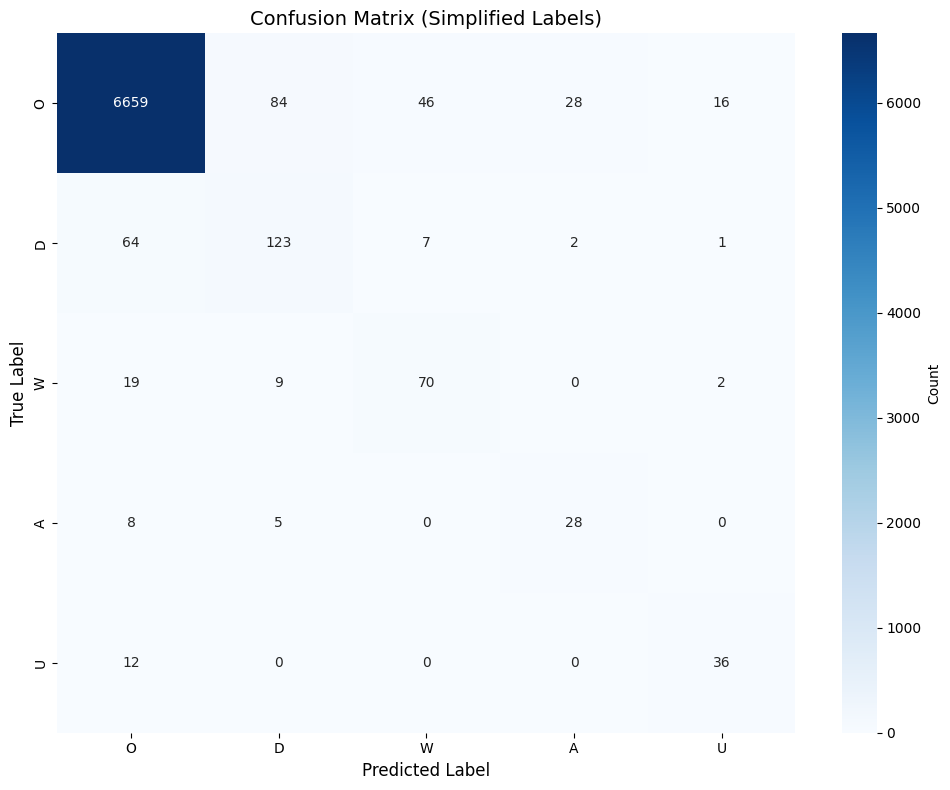


[11] 儲存模型...
✓ 模型已儲存至: /content/drive/MyDrive/few-shot/chinese_mentalbert_finetuned_results_simplified_1204/final_model

所有步驟完成！


In [ ]:
import pandas as pd
import numpy as np
import torch
from torch.utils.data import Dataset as TorchDataset, DataLoader
from transformers import BertTokenizerFast, BertForTokenClassification, get_linear_schedule_with_warmup
from sklearn.metrics import accuracy_score, f1_score, precision_recall_fscore_support, confusion_matrix
from sklearn.model_selection import train_test_split
import seaborn as sns
import matplotlib.pyplot as plt
import csv
import os

# ==================== 配置參數 ====================
CONFIG = {
    "data_path": "/content/drive/MyDrive/few-shot/select_de_synold_filtered.csv",
    "output_dir": "/content/drive/MyDrive/few-shot/chinese_mentalbert_finetuned_results_simplified_1204",
    "model_name": "zwzzz/Chinese-MentalBERT",
    "max_length": 128,
    "train_ratio": 0.8,
    "num_layers_to_freeze": 8,  # 凍結 embedding + 前8層
    "batch_size": 4,
    "learning_rate": 2e-5,
    "num_epochs": 8,
    "weight_decay": 0.01,
    "warmup_steps": 50,
    "gradient_accumulation_steps": 2,
}

os.makedirs(CONFIG["output_dir"], exist_ok=True)

# ==================== 標籤簡化函數 ====================
def simplify_label(label):
    """
    將 BMEU-DAWU 標籤簡化為 D/W/A/U/O
    """
    if pd.isna(label):
        return "O"

    label = str(label).strip()
    prefix = label.split('-')[0] if '-' in label else label

    if prefix in ["B", "M", "E", "S"]:
        suffix = label.split('-')[1] if '-' in label else None
        if suffix in ["D", "W", "A", "U"]:
            return suffix

    return "O"

# ==================== 資料載入與預處理 ====================
def load_and_preprocess_data(file_path):
    """載入並預處理資料"""
    try:
        result = pd.read_csv(
            file_path,
            encoding='utf-8',
            quoting=csv.QUOTE_ALL,
            on_bad_lines='warn'
        )
        print(f"✓ 成功載入資料：{len(result)} 行")
    except Exception as e:
        print(f"✗ 讀取錯誤：{e}")
        raise

    # 只保留前九個欄位（依你原來設定）
    columns = result.columns[:9].tolist()
    result = result[columns]
    print(f"保留欄位：{columns}")

    if result.duplicated(subset=['post_id', 'word']).any():
        print("⚠ 警告：存在重複的 post_id 和 word 組合")

    if result['human_label'].isna().any():
        n_missing = result['human_label'].isna().sum()
        print(f"⚠ 警告：{n_missing} 行缺少 human_label，將標記為 'O'")

    # 簡化標籤
    result['simplified_label'] = result['human_label'].apply(simplify_label)

    # 檢查標籤分佈
    label_dist = result['simplified_label'].value_counts().to_dict()
    print("\n簡化標籤分佈:")
    for label, count in sorted(label_dist.items()):
        print(f"  {label}: {count} ({count/len(result)*100:.2f}%)")

    return result

def group_data_by_post(df, label2id):
    """按 post_id 分組並檢查資料一致性"""
    grouped = df.groupby('post_id')
    data = []
    skipped = 0

    for post_id, group in grouped:
        caption = group['caption'].iloc[0]
        words = group['word'].tolist()
        labels = group['simplified_label'].tolist()

        if len(words) != len(labels):
            print(f"⚠ post_id {post_id}: 詞彙數 ({len(words)}) ≠ 標籤數 ({len(labels)})，跳過")
            skipped += 1
            continue

        words = [str(word) for word in words]

        if not all(label in label2id for label in labels):
            unknown_labels = set(labels) - set(label2id.keys())
            print(f"⚠ post_id {post_id}: 發現未知標籤 {unknown_labels}，跳過")
            skipped += 1
            continue

        data.append({
            "post_id": post_id,
            "caption": caption,
            "words": words,
            "labels": [label2id[label] for label in labels]
        })

    print(f"\n✓ 成功處理 {len(data)} 個 post，跳過 {skipped} 個")
    return data

# ==================== 自訂 Dataset ====================
class TokenClassificationDataset(TorchDataset):
    def __init__(self, data, tokenizer, max_length=128):
        self.data = data
        self.tokenizer = tokenizer
        self.max_length = max_length

    def __len__(self):
        return len(self.data)

    def __getitem__(self, idx):
        item = self.data[idx]

        tokenized_inputs = self.tokenizer(
            item["words"],
            is_split_into_words=True,
            truncation=True,
            padding="max_length",
            max_length=self.max_length,
            return_tensors="pt"
        )

        # 對齊標籤
        word_ids = tokenized_inputs.word_ids()
        previous_word_idx = None
        label_ids = []

        for word_idx in word_ids:
            if word_idx is None:
                label_ids.append(-100)
            elif word_idx != previous_word_idx:
                if word_idx < len(item["labels"]):
                    label_ids.append(item["labels"][word_idx])
                else:
                    label_ids.append(-100)
            else:
                label_ids.append(-100)
            previous_word_idx = word_idx

        tokenized_inputs["labels"] = torch.tensor(label_ids, dtype=torch.long)
        tokenized_inputs = {k: v.squeeze(0) for k, v in tokenized_inputs.items()}
        return tokenized_inputs

# ==================== 模型凍結函數 ====================
def freeze_model_layers(model, num_layers_to_freeze=8):
    # 凍結 embedding 層
    for param in model.bert.embeddings.parameters():
        param.requires_grad = False
    print(f"✓ 已凍結 embedding 層")

    total_layers = len(model.bert.encoder.layer)
    num_layers_to_freeze = min(num_layers_to_freeze, total_layers)

    for i in range(num_layers_to_freeze):
        for param in model.bert.encoder.layer[i].parameters():
            param.requires_grad = False

    print(f"✓ 已凍結前 {num_layers_to_freeze}/{total_layers} 層編碼器")

    total_params = sum(p.numel() for p in model.parameters())
    trainable_params = sum(p.numel() for p in model.parameters() if p.requires_grad)
    print(f"總參數: {total_params:,}")
    print(f"可訓練參數: {trainable_params:,} ({trainable_params/total_params*100:.2f}%)")

# ==================== 評估指標（不依賴 Trainer） ====================
def compute_metrics_from_preds(all_labels, all_preds, id2label):
    labels = np.array(all_labels)
    preds = np.array(all_preds)

    accuracy = accuracy_score(labels, preds)
    f1_weighted = f1_score(labels, preds, average="weighted", zero_division=0)
    f1_macro = f1_score(labels, preds, average="macro", zero_division=0)

    unique_labels = np.unique(labels)
    metrics_by_label = {}
    for label_id in unique_labels:
        label_name = id2label.get(label_id, f"Unknown_{label_id}")
        precision, recall, f1, _ = precision_recall_fscore_support(
            labels, preds, labels=[label_id], average=None, zero_division=0
        )
        metrics_by_label[f"precision_{label_name}"] = float(precision[0]) if precision.size > 0 else 0.0
        metrics_by_label[f"recall_{label_name}"] = float(recall[0]) if recall.size > 0 else 0.0
        metrics_by_label[f"f1_{label_name}"] = float(f1[0]) if f1.size > 0 else 0.0

    return {
        "accuracy": accuracy,
        "f1_weighted": f1_weighted,
        "f1_macro": f1_macro,
        **metrics_by_label
    }

# ==================== 視覺化混淆矩陣 ====================
def plot_confusion_matrix(predictions, labels, id2label, label2id):
    flat_predictions = np.array(predictions)
    flat_labels = np.array(labels)

    labels_for_cm = list(label2id.values())
    cm = confusion_matrix(flat_labels, flat_predictions, labels=labels_for_cm)

    plt.figure(figsize=(10, 8))
    sns.heatmap(
        cm.T,
        annot=True,
        fmt="d",
        cmap="Blues",
        xticklabels=[id2label[i] for i in labels_for_cm],
        yticklabels=[id2label[i] for i in labels_for_cm],
        cbar_kws={'label': 'Count'}
    )
    plt.xlabel("Predicted Label", fontsize=12)
    plt.ylabel("True Label", fontsize=12)
    plt.title("Confusion Matrix (Simplified Labels)", fontsize=14)
    plt.tight_layout()
    plt.savefig(f"{CONFIG['output_dir']}/confusion_matrix.png", dpi=300)
    plt.show()

    return cm

# ==================== 主程式（純 PyTorch 訓練迴圈） ====================
def main():
    print("=" * 50)
    print("Chinese-MentalBERT Token Classification 微調（不使用 Trainer）")
    print("=" * 50)

    # 標籤映射
    label2id = {"O": 0, "D": 1, "W": 2, "A": 3, "U": 4}
    id2label = {v: k for k, v in label2id.items()}
    print(f"\n標籤映射: {label2id}")

    # 載入資料
    print("\n[1] 載入資料...")
    df = load_and_preprocess_data(CONFIG["data_path"])

    # 分組
    print("\n[2] 資料分組...")
    data = group_data_by_post(df, label2id)

    # train / val split
    print("\n[3] 分割訓練/驗證集...")
    train_data, eval_data = train_test_split(
        data,
        test_size=1-CONFIG["train_ratio"],
        random_state=42,
        shuffle=True
    )
    print(f"訓練集: {len(train_data)} posts")
    print(f"驗證集: {len(eval_data)} posts")

    # tokenizer
    print("\n[4] 載入 Tokenizer...")
    tokenizer = BertTokenizerFast.from_pretrained(CONFIG["model_name"])
    print(f"✓ 成功載入 BertTokenizerFast (is_fast: {tokenizer.is_fast})")

    # dataset / dataloader
    print("\n[5] 建立 Dataset / DataLoader...")
    train_dataset = TokenClassificationDataset(train_data, tokenizer, CONFIG["max_length"])
    eval_dataset = TokenClassificationDataset(eval_data, tokenizer, CONFIG["max_length"])
    print(f"✓ 訓練集大小: {len(train_dataset)}")
    print(f"✓ 驗證集大小: {len(eval_dataset)}")

    train_loader = DataLoader(
        train_dataset,
        batch_size=CONFIG["batch_size"],
        shuffle=True
    )
    eval_loader = DataLoader(
        eval_dataset,
        batch_size=CONFIG["batch_size"],
        shuffle=False
    )

    # model
    print("\n[6] 載入模型...")
    model = BertForTokenClassification.from_pretrained(
        CONFIG["model_name"],
        num_labels=len(label2id),
        id2label=id2label,
        label2id=label2id
    )

    # freeze layers
    print("\n[7] 凍結模型層...")
    freeze_model_layers(model, CONFIG["num_layers_to_freeze"])

    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    model.to(device)

    # optimizer & scheduler
    print("\n[8] 建立 Optimizer / Scheduler...")
    optimizer = torch.optim.AdamW(
        [p for p in model.parameters() if p.requires_grad],
        lr=CONFIG["learning_rate"],
        weight_decay=CONFIG["weight_decay"]
    )

    total_steps = len(train_loader) * CONFIG["num_epochs"] // CONFIG["gradient_accumulation_steps"]
    scheduler = get_linear_schedule_with_warmup(
        optimizer,
        num_warmup_steps=CONFIG["warmup_steps"],
        num_training_steps=total_steps
    )

    # ======== 訓練迴圈 ========
    print("\n[9] 開始訓練...")
    print("=" * 50)

    for epoch in range(1, CONFIG["num_epochs"] + 1):
        model.train()
        total_loss = 0.0
        optimizer.zero_grad()

        for step, batch in enumerate(train_loader):
            batch = {k: v.to(device) for k, v in batch.items()}
            outputs = model(
                input_ids=batch["input_ids"],
                attention_mask=batch["attention_mask"],
                token_type_ids=batch.get("token_type_ids", None),
                labels=batch["labels"]
            )
            loss = outputs.loss
            loss = loss / CONFIG["gradient_accumulation_steps"]
            loss.backward()
            total_loss += loss.item()

            if ((step + 1) % CONFIG["gradient_accumulation_steps"] == 0) or (step + 1 == len(train_loader)):
                optimizer.step()
                scheduler.step()
                optimizer.zero_grad()

        avg_train_loss = total_loss / len(train_loader)
        print(f"Epoch {epoch}/{CONFIG['num_epochs']} - Train Loss: {avg_train_loss:.4f}")

        # ======== 驗證 ========
        model.eval()
        eval_loss = 0.0
        all_labels = []
        all_preds = []

        with torch.no_grad():
            for batch in eval_loader:
                batch = {k: v.to(device) for k, v in batch.items()}
                outputs = model(
                    input_ids=batch["input_ids"],
                    attention_mask=batch["attention_mask"],
                    token_type_ids=batch.get("token_type_ids", None),
                    labels=batch["labels"]
                )
                loss = outputs.loss
                eval_loss += loss.item()

                logits = outputs.logits  # (batch, seq, num_labels)
                preds = torch.argmax(logits, dim=-1)
                labels = batch["labels"]

                # 只保留 labels != -100 的位置
                mask = labels != -100
                all_labels.extend(labels[mask].cpu().numpy().tolist())
                all_preds.extend(preds[mask].cpu().numpy().tolist())

        avg_eval_loss = eval_loss / len(eval_loader)
        metrics = compute_metrics_from_preds(all_labels, all_preds, id2label)

        print(f"  Val Loss: {avg_eval_loss:.4f}")
        print(f"  Val Accuracy: {metrics['accuracy']:.4f}")
        print(f"  Val F1 (macro): {metrics['f1_macro']:.4f}")
        print(f"  Val F1 (weighted): {metrics['f1_weighted']:.4f}")

    print("=" * 50)
    print("✓ 訓練完成")

    # ======== 混淆矩陣 ========
    print("\n[10] 生成混淆矩陣...")
    cm = plot_confusion_matrix(all_preds, all_labels, id2label, label2id)

    # ======== 儲存模型 ========
    print("\n[11] 儲存模型...")
    final_model_path = f"{CONFIG['output_dir']}/final_model"
    os.makedirs(final_model_path, exist_ok=True)
    model.save_pretrained(final_model_path)
    tokenizer.save_pretrained(final_model_path)
    print(f"✓ 模型已儲存至: {final_model_path}")

    print("\n" + "=" * 50)
    print("所有步驟完成！")
    print("=" * 50)

if __name__ == "__main__":
    main()


In [ ]:
import pandas as pd
import numpy as np
import torch
from transformers import BertTokenizerFast, BertForTokenClassification, TrainingArguments, Trainer
from torch.utils.data import Dataset as TorchDataset
from sklearn.metrics import accuracy_score, f1_score, precision_recall_fscore_support, confusion_matrix
from sklearn.model_selection import train_test_split
import seaborn as sns
import matplotlib.pyplot as plt
import csv

# ==================== 配置參數 ====================
CONFIG = {
    "data_path": "/content/drive/MyDrive/few-shot/noO_select_de.csv",
    "output_dir": "/content/drive/MyDrive/few-shot/chinese_mentalbert_finetuned_results_simplified",
    "model_name": "zwzzz/Chinese-MentalBERT",
    "max_length": 128,
    "train_ratio": 0.8,
    "num_layers_to_freeze": 8,  # 凍結 embedding + 前6層
    "batch_size": 4,
    "learning_rate": 1e-5,
    "num_epochs": 5,
    "weight_decay": 0.01,
    "warmup_steps": 50,
    "gradient_accumulation_steps": 2,
}

# ==================== 標籤簡化函數 ====================
def simplify_label(label):
    """
    將 BMEU-DAWU 標籤簡化為 D/W/A/U/O
    """
    if pd.isna(label):
        return "O"

    label = str(label).strip()
    prefix = label.split('-')[0] if '-' in label else label

    if prefix in ["B", "M", "E", "S"]:
        suffix = label.split('-')[1] if '-' in label else None
        if suffix in ["D", "W", "A", "U"]:
            return suffix

    return "O"

# ==================== 資料載入與預處理 ====================
def load_and_preprocess_data(file_path):
    """載入並預處理資料"""
    try:
        result = pd.read_csv(
            file_path,
            encoding='utf-8',
            quoting=csv.QUOTE_ALL,
            on_bad_lines='warn'
        )
        print(f"✓ 成功載入資料：{len(result)} 行")
    except Exception as e:
        print(f"✗ 讀取錯誤：{e}")
        exit(1)

    # 只保留前九個欄位
    columns = result.columns[:9].tolist()
    result = result[columns]
    print(f"保留欄位：{columns}")

    # 資料完整性檢查
    if result.duplicated(subset=['post_id', 'word']).any():
        print("⚠ 警告：存在重複的 post_id 和 word_order 組合")

    if result['human_label'].isna().any():
        n_missing = result['human_label'].isna().sum()
        print(f"⚠ 警告：{n_missing} 行缺少 human_label，將標記為 'O'")

    # 簡化標籤
    result['simplified_label'] = result['human_label'].apply(simplify_label)

    # 檢查標籤分佈
    label_dist = result['simplified_label'].value_counts().to_dict()
    print("\n簡化標籤分佈:")
    for label, count in sorted(label_dist.items()):
        print(f"  {label}: {count} ({count/len(result)*100:.2f}%)")

    return result

def group_data_by_post(df, label2id):
    """按 post_id 分組並檢查資料一致性"""
    grouped = df.groupby('post_id')
    data = []
    skipped = 0

    for post_id, group in grouped:
        caption = group['caption'].iloc[0]
        words = group['word'].tolist()
        labels = group['simplified_label'].tolist()

        # 資料驗證
        if len(words) != len(labels):
            print(f"⚠ post_id {post_id}: 詞彙數 ({len(words)}) ≠ 標籤數 ({len(labels)})，跳過")
            skipped += 1
            continue

        # 確保所有 word 都是字串
        words = [str(word) for word in words]

        # 檢查標籤是否都在 label2id 中
        if not all(label in label2id for label in labels):
            unknown_labels = set(labels) - set(label2id.keys())
            print(f"⚠ post_id {post_id}: 發現未知標籤 {unknown_labels}，跳過")
            skipped += 1
            continue

        data.append({
            "post_id": post_id,
            "caption": caption,
            "words": words,
            "labels": [label2id[label] for label in labels]
        })

    print(f"\n✓ 成功處理 {len(data)} 個 post，跳過 {skipped} 個")
    return data

# ==================== 自訂 Dataset ====================
class TokenClassificationDataset(TorchDataset):
    def __init__(self, data, tokenizer, max_length=128):
        self.data = data
        self.tokenizer = tokenizer
        self.max_length = max_length

    def __len__(self):
        return len(self.data)

    def __getitem__(self, idx):
        item = self.data[idx]

        # Tokenize
        tokenized_inputs = self.tokenizer(
            item["words"],
            is_split_into_words=True,
            truncation=True,
            padding="max_length",
            max_length=self.max_length,
            return_tensors="pt"
        )

        # 對齊標籤
        word_ids = tokenized_inputs.word_ids()
        previous_word_idx = None
        label_ids = []

        for word_idx in word_ids:
            if word_idx is None:
                # 特殊 token (CLS, SEP, PAD) 標記為 -100
                label_ids.append(-100)
            elif word_idx != previous_word_idx:
                # 每個詞的第一個 subtoken 使用真實標籤
                if word_idx < len(item["labels"]):
                    label_ids.append(item["labels"][word_idx])
                else:
                    label_ids.append(-100)
            else:
                # 同一個詞的後續 subtoken 標記為 -100
                label_ids.append(-100)
            previous_word_idx = word_idx

        # 轉換為 tensor
        tokenized_inputs["labels"] = torch.tensor(label_ids)
        tokenized_inputs = {k: v.squeeze(0) for k, v in tokenized_inputs.items()}

        return tokenized_inputs

# ==================== 模型凍結函數 ====================
def freeze_model_layers(model, num_layers_to_freeze=8):
    """
    凍結 BERT 模型的 embedding 和前 N 層

    Args:
        model: BertForTokenClassification 模型
        num_layers_to_freeze: 要凍結的編碼層數（不包括 embedding）
    """
    # 凍結 embedding 層
    for param in model.bert.embeddings.parameters():
        param.requires_grad = False
    print(f"✓ 已凍結 embedding 層")

    # 凍結前 N 層編碼器
    total_layers = len(model.bert.encoder.layer)
    num_layers_to_freeze = min(num_layers_to_freeze, total_layers)

    for i in range(num_layers_to_freeze):
        for param in model.bert.encoder.layer[i].parameters():
            param.requires_grad = False

    print(f"✓ 已凍結前 {num_layers_to_freeze}/{total_layers} 層編碼器")

    # 統計可訓練參數
    total_params = sum(p.numel() for p in model.parameters())
    trainable_params = sum(p.numel() for p in model.parameters() if p.requires_grad)
    print(f"總參數: {total_params:,}")
    print(f"可訓練參數: {trainable_params:,} ({trainable_params/total_params*100:.2f}%)")

# ==================== 評估指標 ====================
def compute_metrics(pred, id2label):
    """計算評估指標"""
    labels = pred.label_ids.flatten()
    preds = pred.predictions.argmax(-1).flatten()

    # 過濾 -100
    mask = labels != -100
    labels = labels[mask]
    preds = preds[mask]

    # 基本指標
    accuracy = accuracy_score(labels, preds)
    f1_weighted = f1_score(labels, preds, average="weighted", zero_division=0)
    f1_macro = f1_score(labels, preds, average="macro", zero_division=0)

    # 每個類別的指標
    unique_labels = np.unique(labels)
    metrics_by_label = {}

    for label_id in unique_labels:
        label_name = id2label.get(label_id, f"Unknown_{label_id}")
        precision, recall, f1, _ = precision_recall_fscore_support(
            labels, preds, labels=[label_id], average=None, zero_division=0
        )
        metrics_by_label[f"precision_{label_name}"] = float(precision[0]) if precision.size > 0 else 0.0
        metrics_by_label[f"recall_{label_name}"] = float(recall[0]) if recall.size > 0 else 0.0
        metrics_by_label[f"f1_{label_name}"] = float(f1[0]) if f1.size > 0 else 0.0

    return {
        "accuracy": accuracy,
        "f1_weighted": f1_weighted,
        "f1_macro": f1_macro,
        **metrics_by_label
    }

# ==================== 視覺化混淆矩陣 ====================
def plot_confusion_matrix(predictions, labels, id2label, label2id):
    """繪製混淆矩陣"""
    # 展平並過濾
    flat_predictions = predictions.flatten()
    flat_labels = labels.flatten()
    mask = flat_labels != -100
    flat_predictions = flat_predictions[mask]
    flat_labels = flat_labels[mask]

    # 計算混淆矩陣
    labels_for_cm = list(label2id.values())
    cm = confusion_matrix(flat_labels, flat_predictions, labels=labels_for_cm)

    # 繪圖 (x軸=真實, y軸=預測)
    plt.figure(figsize=(8, 6))
    sns.heatmap(
        cm.T,  # 轉置矩陣，交換 x 和 y 軸
        annot=True,
        fmt="d",
        cmap="Blues",
        xticklabels=list(id2label.values()),
        yticklabels=list(id2label.values()),
        cbar_kws={'label': 'Count'}
    )
    plt.xlabel("Predicted Label", fontsize=12)
    plt.ylabel("True Label", fontsize=12)
    plt.title("Confusion Matrix (Simplified Labels)", fontsize=14)
    plt.tight_layout()
    plt.savefig(f"{CONFIG['output_dir']}/confusion_matrix.png", dpi=300)
    plt.show()

    return cm

# ==================== 主程式 ====================
def main():
    print("=" * 50)
    print("BERT Token Classification 微調程式")
    print("=" * 50)

    # 定義標籤映射
    label2id = {"O": 0, "D": 1, "W": 2, "A": 3, "U": 4}
    id2label = {v: k for k, v in label2id.items()}
    print(f"\n標籤映射: {label2id}")

    # 載入資料
    print("\n[1] 載入資料...")
    df = load_and_preprocess_data(CONFIG["data_path"])

    # 按 post_id 分組
    print("\n[2] 資料分組...")
    data = group_data_by_post(df, label2id)

    # 分割訓練集和驗證集（按 post_id 分割，避免資料洩漏）
    print("\n[3] 分割訓練/驗證集...")
    train_data, eval_data = train_test_split(
        data,
        test_size=1-CONFIG["train_ratio"],
        random_state=42,
        shuffle=True
    )
    print(f"訓練集: {len(train_data)} posts")
    print(f"驗證集: {len(eval_data)} posts")

    # 載入 tokenizer
    print("\n[4] 載入 Tokenizer...")
    try:
        tokenizer = BertTokenizerFast.from_pretrained(CONFIG["model_name"])
        print(f"✓ 成功載入 BertTokenizerFast (is_fast: {tokenizer.is_fast})")
    except Exception as e:
        print(f"✗ 載入快速 tokenizer 失敗: {e}")
        exit(1)

    # 創建數據集
    print("\n[5] 創建 Dataset...")
    train_dataset = TokenClassificationDataset(train_data, tokenizer, CONFIG["max_length"])
    eval_dataset = TokenClassificationDataset(eval_data, tokenizer, CONFIG["max_length"])
    print(f"✓ 訓練集大小: {len(train_dataset)}")
    print(f"✓ 驗證集大小: {len(eval_dataset)}")

    # 載入模型
    print("\n[6] 載入模型...")
    model = BertForTokenClassification.from_pretrained(
        CONFIG["model_name"],
        num_labels=len(label2id)
    )

    # 凍結層
    print("\n[7] 凍結模型層...")
    freeze_model_layers(model, CONFIG["num_layers_to_freeze"])

    # 訓練參數
    print("\n[8] 設定訓練參數...")
    training_args = TrainingArguments(
        output_dir=CONFIG["output_dir"],
        eval_strategy="epoch",
        save_strategy="epoch",
        learning_rate=CONFIG["learning_rate"],
        per_device_train_batch_size=CONFIG["batch_size"],
        per_device_eval_batch_size=CONFIG["batch_size"],
        num_train_epochs=CONFIG["num_epochs"],
        weight_decay=CONFIG["weight_decay"],
        warmup_steps=CONFIG["warmup_steps"],
        logging_steps=5,
        logging_dir=f"{CONFIG['output_dir']}/logs",
        report_to="none",
        gradient_accumulation_steps=CONFIG["gradient_accumulation_steps"],
        metric_for_best_model="eval_loss",
        load_best_model_at_end=True,
        save_total_limit=2,  # 只保留最好的 2 個 checkpoint
    )

    # 創建 Trainer
    trainer = Trainer(
        model=model,
        args=training_args,
        train_dataset=train_dataset,
        eval_dataset=eval_dataset,
        compute_metrics=lambda pred: compute_metrics(pred, id2label)
    )

    # 訓練
    print("\n[9] 開始訓練...")
    print("=" * 50)
    trainer.train()
    print("=" * 50)
    print("✓ 訓練完成")

    # 評估
    print("\n[10] 評估模型...")
    eval_results = trainer.evaluate()
    print("\n評估結果:")
    for key, value in eval_results.items():
        if isinstance(value, float):
            print(f"  {key}: {value:.4f}")
        else:
            print(f"  {key}: {value}")

    # 生成混淆矩陣
    print("\n[11] 生成混淆矩陣...")
    predictions, labels, _ = trainer.predict(eval_dataset)
    predictions = np.argmax(predictions, axis=2)
    cm = plot_confusion_matrix(predictions, labels, id2label, label2id)

    # 儲存模型
    print("\n[12] 儲存模型...")
    final_model_path = f"{CONFIG['output_dir']}/final_model"
    trainer.save_model(final_model_path)
    tokenizer.save_pretrained(final_model_path)
    print(f"✓ 模型已儲存至: {final_model_path}")

    print("\n" + "=" * 50)
    print("所有步驟完成！")
    print("=" * 50)

if __name__ == "__main__":
    main()

RuntimeError: Failed to import transformers.trainer because of the following error (look up to see its traceback):
cannot import name 'Repository' from 'huggingface_hub' (/usr/local/lib/python3.12/dist-packages/huggingface_hub/__init__.py)

BERT Token Classification 微調程式

標籤映射: {'O': 0, 'D': 1, 'W': 2, 'A': 3, 'U': 4}

[1] 載入資料...


/tmp/ipython-input-1668794915.py:55: DtypeWarning: Columns (10) have mixed types. Specify dtype option on import or set low_memory=False.
  result = pd.read_csv(


✓ 成功載入資料：67051 行
保留欄位：['post_id', 'caption', 'word', 'human_label', 'gpt_label_1', 'gpt_label_2', 'gpt_label_3', 'gpt_label_4', 'gpt_label_5']
⚠ 注意：資料中沒有 word_order 欄位
✓ 已自動為每個 post 添加 word_order（按原始順序）

簡化標籤分佈:
  A: 144 (0.21%)
  D: 1147 (1.71%)
  O: 65053 (97.02%)
  U: 228 (0.34%)
  W: 479 (0.71%)

[2] 資料分組...

✓ 成功處理 489 個 post，跳過 0 個

訓練資料標籤分佈:
  A:    144 ( 0.21%)
  D:   1147 ( 1.71%)
  O:  65053 (97.02%)
  U:    228 ( 0.34%)
  W:    479 ( 0.71%)

[3] 分割訓練/驗證集...
訓練集: 391 posts
驗證集: 98 posts

[4] 載入 Tokenizer...
✓ 成功載入 BertTokenizerFast (is_fast: True)

[5] 創建 Dataset...
✓ 訓練集大小: 391
✓ 驗證集大小: 98

[5.5] 計算類別權重...
類別權重:
  O (id=0): 0.2062
  D (id=1): 11.8336
  W (id=2): 27.4600
  A (id=3): 89.2450
  U (id=4): 55.2031

[6] 載入模型...


Some weights of BertForTokenClassification were not initialized from the model checkpoint at zwzzz/Chinese-MentalBERT and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.



[7] 凍結模型層...
✓ 已凍結 embedding 層
✓ 已凍結前 8/12 層編碼器
總參數: 101,680,901
可訓練參數: 28,355,333 (27.89%)

[8] 設定訓練參數...
✓ 使用 WeightedLossTrainer（含類別權重）

[9] 開始訓練...


Epoch,Training Loss,Validation Loss,Accuracy,F1 Weighted,F1 Macro,Precision O,Recall O,F1 O,Precision D,Recall D,F1 D,Precision W,Recall W,F1 W,Precision A,Recall A,F1 A,Precision U,Recall U,F1 U
1,1.605500,1.396583,0.071777,0.084124,0.054220,0.992366,0.044113,0.084470,0.055147,0.849057,0.103567,0.024742,0.380952,0.046467,0.009615,0.500000,0.018868,0.008996,0.600000,0.017725
2,0.886300,0.820982,0.540598,0.670016,0.229044,0.997443,0.529522,0.691788,0.153226,0.836478,0.259007,0.041951,0.682540,0.079044,0.024064,0.818182,0.046753,0.036082,0.700000,0.068627
3,0.536800,0.742229,0.766158,0.838432,0.318846,0.997119,0.763488,0.864803,0.184906,0.924528,0.308176,0.112948,0.650794,0.192488,0.057762,0.727273,0.107023,0.066667,0.700000,0.121739
4,0.327100,0.750472,0.836635,0.884952,0.368940,0.996169,0.838310,0.910448,0.247818,0.893082,0.387978,0.152610,0.603175,0.243590,0.072727,0.727273,0.132231,0.096154,0.750000,0.170455
5,0.202600,0.856586,0.824456,0.876493,0.358907,0.997129,0.825076,0.902980,0.210300,0.924528,0.342657,0.132492,0.666667,0.221053,0.089744,0.636364,0.157303,0.100917,0.550000,0.170543
6,0.140700,0.985288,0.868951,0.904636,0.410377,0.996511,0.872243,0.930245,0.237480,0.924528,0.377892,0.191710,0.587302,0.289062,0.153846,0.636364,0.247788,0.125000,0.600000,0.206897
7,0.201500,0.929116,0.851575,0.894233,0.380587,0.997029,0.853919,0.919942,0.241667,0.911950,0.382082,0.168033,0.650794,0.267101,0.083333,0.636364,0.147368,0.112245,0.550000,0.186441
8,0.135600,1.049442,0.873823,0.908043,0.410675,0.996916,0.877503,0.933406,0.247019,0.911950,0.388740,0.207447,0.619048,0.310757,0.133333,0.636364,0.220472,0.122222,0.550000,0.200000
9,0.128300,1.038238,0.885028,0.915287,0.419363,0.996200,0.889549,0.939858,0.282000,0.886792,0.427921,0.212435,0.650794,0.320312,0.126126,0.636364,0.210526,0.120879,0.550000,0.198198
10,0.094400,1.060595,0.888113,0.917123,0.424042,0.995838,0.893112,0.941682,0.278107,0.886792,0.423423,0.232143,0.619048,0.337662,0.128440,0.636364,0.213740,0.125000,0.550000,0.203704


✓ 訓練完成

[10] 評估模型...



評估結果:
  eval_loss: 1.0606
  eval_accuracy: 0.8881
  eval_f1_weighted: 0.9171
  eval_f1_macro: 0.4240
  eval_precision_O: 0.9958
  eval_recall_O: 0.8931
  eval_f1_O: 0.9417
  eval_precision_D: 0.2781
  eval_recall_D: 0.8868
  eval_f1_D: 0.4234
  eval_precision_W: 0.2321
  eval_recall_W: 0.6190
  eval_f1_W: 0.3377
  eval_precision_A: 0.1284
  eval_recall_A: 0.6364
  eval_f1_A: 0.2137
  eval_precision_U: 0.1250
  eval_recall_U: 0.5500
  eval_f1_U: 0.2037
  eval_runtime: 0.5473
  eval_samples_per_second: 179.0750
  eval_steps_per_second: 23.7550
  epoch: 10.0000

[11] 生成混淆矩陣...


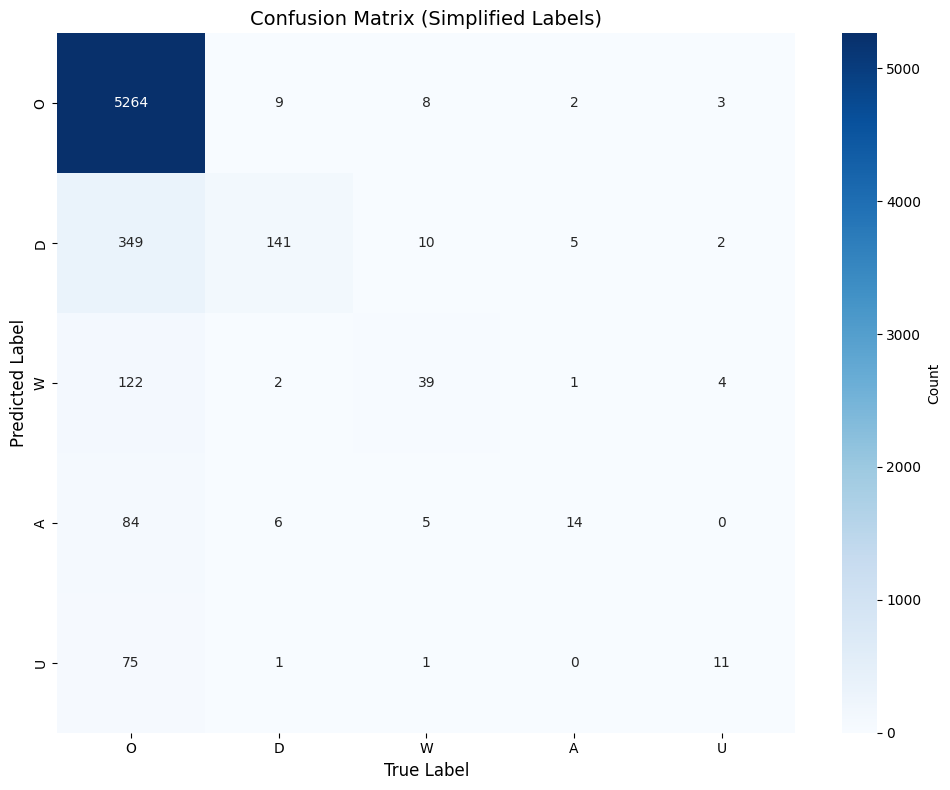


[12] 儲存模型...
✓ 模型已儲存至: /content/drive/MyDrive/few-shot/chinese_mentalbert_finetuned_results_simplified/final_model

所有步驟完成！


In [ ]:
import pandas as pd
import numpy as np
import torch
import torch.nn as nn
from transformers import BertTokenizerFast, BertForTokenClassification, TrainingArguments, Trainer
from torch.utils.data import Dataset as TorchDataset
from sklearn.metrics import accuracy_score, f1_score, precision_recall_fscore_support, confusion_matrix
from sklearn.model_selection import train_test_split
from sklearn.utils.class_weight import compute_class_weight
import seaborn as sns
import matplotlib.pyplot as plt
import csv

# ==================== 配置參數 ====================
CONFIG = {
    "data_path": "/content/drive/MyDrive/few-shot/noO_select_de.csv",
    "output_dir": "/content/drive/MyDrive/few-shot/chinese_mentalbert_finetuned_results_simplified",
    "model_name": "zwzzz/Chinese-MentalBERT",
    "max_length": 128,
    "train_ratio": 0.8,
    "num_layers_to_freeze": 8,  # 降低凍結層數，讓模型更靈活
    "batch_size": 8,  # 增加 batch size 提升穩定性
    "learning_rate": 2e-5,  # 稍微提高學習率2e-5
    "num_epochs": 10,  # 增加訓練輪數
    "weight_decay": 0.01,
    "warmup_ratio": 0.1,  # 使用比例而非固定步數
    "gradient_accumulation_steps": 1,  # 如果 GPU 記憶體夠，不需要累積
    "use_class_weights": True,  # 新增：使用類別權重
    "focal_loss_gamma": 2.0,  # 新增：Focal Loss 參數
    "label_smoothing": 0.1,  # 新增：標籤平滑
}

# ==================== 標籤簡化函數 ====================
def simplify_label(label):
    """
    將 BMEU-DAWU 標籤簡化為 D/A/W/U/O
    """
    if pd.isna(label):
        return "O"

    label = str(label).strip()
    prefix = label.split('-')[0] if '-' in label else label

    if prefix in ["B", "M", "E", "S"]:
        suffix = label.split('-')[1] if '-' in label else None
        if suffix in ["D", "W", "A", "U"]:
            return suffix

    return "O"

# ==================== 資料載入與預處理 ====================
def load_and_preprocess_data(file_path):
    """載入並預處理資料"""
    try:
        result = pd.read_csv(
            file_path,
            encoding='utf-8',
            quoting=csv.QUOTE_ALL,
            on_bad_lines='warn'
        )
        print(f"✓ 成功載入資料：{len(result)} 行")
    except Exception as e:
        print(f"✗ 讀取錯誤：{e}")
        exit(1)

    # 只保留前九個欄位
    columns = result.columns[:9].tolist()
    result = result[columns]
    print(f"保留欄位：{columns}")

    # 資料完整性檢查
    # 檢查是否有 word_order 欄位
    if 'word_order' in result.columns:
        if result.duplicated(subset=['post_id', 'word_order']).any():
            n_duplicates = result.duplicated(subset=['post_id', 'word_order']).sum()
            print(f"⚠ 警告：存在 {n_duplicates} 行重複的 post_id 和 word_order 組合")
            # 顯示重複的資料
            duplicates = result[result.duplicated(subset=['post_id', 'word_order'], keep=False)]
            print(f"重複資料範例：\n{duplicates[['post_id', 'word_order', 'word']].head(10)}")
    else:
        print("⚠ 注意：資料中沒有 word_order 欄位")
        # 為每個 post_id 添加順序索引
        result['word_order'] = result.groupby('post_id').cumcount()
        print("✓ 已自動為每個 post 添加 word_order（按原始順序）")

    if result['human_label'].isna().any():
        n_missing = result['human_label'].isna().sum()
        print(f"⚠ 警告：{n_missing} 行缺少 human_label，將標記為 'O'")

    # 簡化標籤
    result['simplified_label'] = result['human_label'].apply(simplify_label)

    # 檢查標籤分佈
    label_dist = result['simplified_label'].value_counts().to_dict()
    print("\n簡化標籤分佈:")
    for label, count in sorted(label_dist.items()):
        print(f"  {label}: {count} ({count/len(result)*100:.2f}%)")

    return result

def group_data_by_post(df, label2id):
    """按 post_id 分組並檢查資料一致性"""
    grouped = df.groupby('post_id')
    data = []
    skipped = 0
    label_counts = {label: 0 for label in label2id.keys()}

    for post_id, group in grouped:
        # 如果有 word_order 欄位，按其排序；否則保持原順序
        if 'word_order' in group.columns:
            group = group.sort_values('word_order')

        caption = group['caption'].iloc[0]
        words = group['word'].tolist()
        labels = group['simplified_label'].tolist()

        # 資料驗證
        if len(words) != len(labels):
            print(f"⚠ post_id {post_id}: 詞彙數 ({len(words)}) ≠ 標籤數 ({len(labels)})，跳過")
            skipped += 1
            continue

        # 確保所有 word 都是字串
        words = [str(word) for word in words]

        # 檢查標籤是否都在 label2id 中
        if not all(label in label2id for label in labels):
            unknown_labels = set(labels) - set(label2id.keys())
            print(f"⚠ post_id {post_id}: 發現未知標籤 {unknown_labels}，跳過")
            skipped += 1
            continue

        # 統計標籤分佈
        for label in labels:
            label_counts[label] += 1

        data.append({
            "post_id": post_id,
            "caption": caption,
            "words": words,
            "labels": [label2id[label] for label in labels]
        })

    print(f"\n✓ 成功處理 {len(data)} 個 post，跳過 {skipped} 個")
    print(f"\n訓練資料標籤分佈:")
    total = sum(label_counts.values())
    for label, count in sorted(label_counts.items()):
        print(f"  {label}: {count:>6} ({count/total*100:>5.2f}%)")

    return data, label_counts

# ==================== 自訂 Trainer (支援類別權重) ====================
class WeightedLossTrainer(Trainer):
    def __init__(self, *args, class_weights=None, **kwargs):
        super().__init__(*args, **kwargs)
        self.class_weights = class_weights

    def compute_loss(self, model, inputs, return_outputs=False, num_items_in_batch=None):
        labels = inputs.pop("labels")
        outputs = model(**inputs)
        logits = outputs.logits

        # 使用類別權重的交叉熵損失
        if self.class_weights is not None:
            loss_fct = nn.CrossEntropyLoss(
                weight=self.class_weights.to(logits.device),
                ignore_index=-100
            )
        else:
            loss_fct = nn.CrossEntropyLoss(ignore_index=-100)

        loss = loss_fct(logits.view(-1, self.model.config.num_labels), labels.view(-1))

        return (loss, outputs) if return_outputs else loss

# ==================== 自訂 Dataset ====================
class TokenClassificationDataset(TorchDataset):
    def __init__(self, data, tokenizer, max_length=128):
        self.data = data
        self.tokenizer = tokenizer
        self.max_length = max_length

    def __len__(self):
        return len(self.data)

    def __getitem__(self, idx):
        item = self.data[idx]

        # Tokenize
        tokenized_inputs = self.tokenizer(
            item["words"],
            is_split_into_words=True,
            truncation=True,
            padding="max_length",
            max_length=self.max_length,
            return_tensors="pt"
        )

        # 對齊標籤
        word_ids = tokenized_inputs.word_ids()
        previous_word_idx = None
        label_ids = []

        for word_idx in word_ids:
            if word_idx is None:
                # 特殊 token (CLS, SEP, PAD) 標記為 -100
                label_ids.append(-100)
            elif word_idx != previous_word_idx:
                # 每個詞的第一個 subtoken 使用真實標籤
                if word_idx < len(item["labels"]):
                    label_ids.append(item["labels"][word_idx])
                else:
                    label_ids.append(-100)
            else:
                # 同一個詞的後續 subtoken 標記為 -100
                label_ids.append(-100)
            previous_word_idx = word_idx

        # 轉換為 tensor
        tokenized_inputs["labels"] = torch.tensor(label_ids)
        tokenized_inputs = {k: v.squeeze(0) for k, v in tokenized_inputs.items()}

        return tokenized_inputs

# ==================== 模型凍結函數 ====================
def freeze_model_layers(model, num_layers_to_freeze=8):
    """
    凍結 BERT 模型的 embedding 和前 N 層

    Args:
        model: BertForTokenClassification 模型
        num_layers_to_freeze: 要凍結的編碼層數（不包括 embedding）
    """
    # 凍結 embedding 層
    for param in model.bert.embeddings.parameters():
        param.requires_grad = False
    print(f"✓ 已凍結 embedding 層")

    # 凍結前 N 層編碼器
    total_layers = len(model.bert.encoder.layer)
    num_layers_to_freeze = min(num_layers_to_freeze, total_layers)

    for i in range(num_layers_to_freeze):
        for param in model.bert.encoder.layer[i].parameters():
            param.requires_grad = False

    print(f"✓ 已凍結前 {num_layers_to_freeze}/{total_layers} 層編碼器")

    # 統計可訓練參數
    total_params = sum(p.numel() for p in model.parameters())
    trainable_params = sum(p.numel() for p in model.parameters() if p.requires_grad)
    print(f"總參數: {total_params:,}")
    print(f"可訓練參數: {trainable_params:,} ({trainable_params/total_params*100:.2f}%)")

# ==================== 評估指標 ====================
def compute_metrics(pred, id2label):
    """計算評估指標"""
    labels = pred.label_ids.flatten()
    preds = pred.predictions.argmax(-1).flatten()

    # 過濾 -100
    mask = labels != -100
    labels = labels[mask]
    preds = preds[mask]

    # 基本指標
    accuracy = accuracy_score(labels, preds)
    f1_weighted = f1_score(labels, preds, average="weighted", zero_division=0)
    f1_macro = f1_score(labels, preds, average="macro", zero_division=0)

    # 每個類別的指標
    unique_labels = np.unique(labels)
    metrics_by_label = {}

    for label_id in unique_labels:
        label_name = id2label.get(label_id, f"Unknown_{label_id}")
        precision, recall, f1, _ = precision_recall_fscore_support(
            labels, preds, labels=[label_id], average=None, zero_division=0
        )
        metrics_by_label[f"precision_{label_name}"] = float(precision[0]) if precision.size > 0 else 0.0
        metrics_by_label[f"recall_{label_name}"] = float(recall[0]) if recall.size > 0 else 0.0
        metrics_by_label[f"f1_{label_name}"] = float(f1[0]) if f1.size > 0 else 0.0

    return {
        "accuracy": accuracy,
        "f1_weighted": f1_weighted,
        "f1_macro": f1_macro,
        **metrics_by_label
    }

# ==================== 視覺化混淆矩陣 ====================
def plot_confusion_matrix(predictions, labels, id2label, label2id):
    """繪製混淆矩陣"""
    # 展平並過濾
    flat_predictions = predictions.flatten()
    flat_labels = labels.flatten()
    mask = flat_labels != -100
    flat_predictions = flat_predictions[mask]
    flat_labels = flat_labels[mask]

    # 計算混淆矩陣
    labels_for_cm = list(label2id.values())
    cm = confusion_matrix(flat_labels, flat_predictions, labels=labels_for_cm)

    # 繪圖 (x軸=真實, y軸=預測)
    plt.figure(figsize=(10, 8))
    sns.heatmap(
        cm.T,  # 轉置矩陣，交換 x 和 y 軸
        annot=True,
        fmt="d",
        cmap="Blues",
        xticklabels=list(id2label.values()),
        yticklabels=list(id2label.values()),
        cbar_kws={'label': 'Count'}
    )
    plt.xlabel("True Label", fontsize=12)
    plt.ylabel("Predicted Label", fontsize=12)
    plt.title("Confusion Matrix (Simplified Labels)", fontsize=14)
    plt.tight_layout()
    plt.savefig(f"{CONFIG['output_dir']}/confusion_matrix.png", dpi=300)
    plt.show()

    return cm

# ==================== 主程式 ====================
def main():
    print("=" * 50)
    print("BERT Token Classification 微調程式")
    print("=" * 50)

    # 定義標籤映射
    label2id = {"O": 0, "D": 1, "W": 2, "A": 3, "U": 4}
    id2label = {v: k for k, v in label2id.items()}
    print(f"\n標籤映射: {label2id}")

    # 載入資料
    print("\n[1] 載入資料...")
    df = load_and_preprocess_data(CONFIG["data_path"])

    # 按 post_id 分組
    print("\n[2] 資料分組...")
    data, label_counts = group_data_by_post(df, label2id)

    # 分割訓練集和驗證集（按 post_id 分割，避免資料洩漏）
    print("\n[3] 分割訓練/驗證集...")
    train_data, eval_data = train_test_split(
        data,
        test_size=1-CONFIG["train_ratio"],
        random_state=42,
        shuffle=True
    )
    print(f"訓練集: {len(train_data)} posts")
    print(f"驗證集: {len(eval_data)} posts")

    # 載入 tokenizer
    print("\n[4] 載入 Tokenizer...")
    try:
        tokenizer = BertTokenizerFast.from_pretrained(CONFIG["model_name"])
        print(f"✓ 成功載入 BertTokenizerFast (is_fast: {tokenizer.is_fast})")
    except Exception as e:
        print(f"✗ 載入快速 tokenizer 失敗: {e}")
        exit(1)

    # 創建數據集
    print("\n[5] 創建 Dataset...")
    train_dataset = TokenClassificationDataset(train_data, tokenizer, CONFIG["max_length"])
    eval_dataset = TokenClassificationDataset(eval_data, tokenizer, CONFIG["max_length"])
    print(f"✓ 訓練集大小: {len(train_dataset)}")
    print(f"✓ 驗證集大小: {len(eval_dataset)}")

    # 計算類別權重（處理類別不平衡）
    class_weights = None
    if CONFIG.get("use_class_weights", False):
        print("\n[5.5] 計算類別權重...")
        # 收集所有訓練標籤（排除 -100）
        all_labels = []
        for item in train_data:
            all_labels.extend(item["labels"])

        # 計算類別權重
        unique_labels = np.array(list(label2id.values()))
        weights = compute_class_weight(
            class_weight='balanced',
            classes=unique_labels,
            y=all_labels
        )
        class_weights = torch.tensor(weights, dtype=torch.float32)

        print("類別權重:")
        for label_id, weight in zip(unique_labels, weights):
            label_name = id2label[label_id]
            print(f"  {label_name} (id={label_id}): {weight:.4f}")

    # 載入模型
    print("\n[6] 載入模型...")
    model = BertForTokenClassification.from_pretrained(
        CONFIG["model_name"],
        num_labels=len(label2id)
    )

    # 凍結層
    print("\n[7] 凍結模型層...")
    freeze_model_layers(model, CONFIG["num_layers_to_freeze"])

    # 訓練參數
    print("\n[8] 設定訓練參數...")
    training_args = TrainingArguments(
        output_dir=CONFIG["output_dir"],
        eval_strategy="epoch",
        save_strategy="epoch",
        learning_rate=CONFIG["learning_rate"],
        per_device_train_batch_size=CONFIG["batch_size"],
        per_device_eval_batch_size=CONFIG["batch_size"],
        num_train_epochs=CONFIG["num_epochs"],
        weight_decay=CONFIG["weight_decay"],
        warmup_ratio=CONFIG.get("warmup_ratio", 0.1),  # 使用 warmup_ratio 而非固定步數
        logging_steps=10,
        logging_dir=f"{CONFIG['output_dir']}/logs",
        report_to="none",
        gradient_accumulation_steps=CONFIG["gradient_accumulation_steps"],
        metric_for_best_model="eval_f1_macro",  # 改用 f1_macro 作為最佳模型指標
        greater_is_better=True,
        load_best_model_at_end=True,
        save_total_limit=3,
        fp16=torch.cuda.is_available(),  # 如果有 GPU 則使用混合精度訓練
        dataloader_num_workers=2,
        label_smoothing_factor=CONFIG.get("label_smoothing", 0.0),  # 標籤平滑
    )

    # 創建 Trainer
    if CONFIG.get("use_class_weights", False) and class_weights is not None:
        trainer = WeightedLossTrainer(
            model=model,
            args=training_args,
            train_dataset=train_dataset,
            eval_dataset=eval_dataset,
            compute_metrics=lambda pred: compute_metrics(pred, id2label),
            class_weights=class_weights
        )
        print("✓ 使用 WeightedLossTrainer（含類別權重）")
    else:
        trainer = Trainer(
            model=model,
            args=training_args,
            train_dataset=train_dataset,
            eval_dataset=eval_dataset,
            compute_metrics=lambda pred: compute_metrics(pred, id2label)
        )
        print("✓ 使用標準 Trainer")

    # 訓練
    print("\n[9] 開始訓練...")
    print("=" * 50)
    trainer.train()
    print("=" * 50)
    print("✓ 訓練完成")

    # 評估
    print("\n[10] 評估模型...")
    eval_results = trainer.evaluate()
    print("\n評估結果:")
    for key, value in eval_results.items():
        if isinstance(value, float):
            print(f"  {key}: {value:.4f}")
        else:
            print(f"  {key}: {value}")

    # 生成混淆矩陣
    print("\n[11] 生成混淆矩陣...")
    predictions, labels, _ = trainer.predict(eval_dataset)
    predictions = np.argmax(predictions, axis=2)
    cm = plot_confusion_matrix(predictions, labels, id2label, label2id)

    # 儲存模型
    print("\n[12] 儲存模型...")
    final_model_path = f"{CONFIG['output_dir']}/final_model"
    trainer.save_model(final_model_path)
    tokenizer.save_pretrained(final_model_path)
    print(f"✓ 模型已儲存至: {final_model_path}")

    print("\n" + "=" * 50)
    print("所有步驟完成！")
    print("=" * 50)

if __name__ == "__main__":
    main()

### DECEN


In [ ]:
!pip install pytorch-crf

##### 第一版 : 用17類別的微調
Loss 變化正常、但指標停滯，Train Loss：47.8 → 16.9（顯示模型確實在學習）
Val F1：0.0628 → 0.0601（幾乎沒變）。Val Acc ≈ 0.66、Test Acc ≈ 0.64 看起來不錯，
但 F1_macro ≈ 0.05 幾乎等於只學到一類

就算拿掉全 O 貼文，「17 類（BMES×D/A/W/U + O-殘存 token）仍高度失衡」。Acc 很高（Test 0.8284）但 Macro F1 很低（0.0609）
模型（含 CRF）學到的是「一兩個常見標籤的轉移規律」，而非全類別。

In [ ]:
# ============================================================
# DECEN DER 模組 (BiLSTM + CRF)
# 使用: 你微調好的 MentalBERT Encoder (17 類) 作為凍結特徵抽取器
# ============================================================
import os
import csv
import numpy as np
import pandas as pd
import torch
import torch.nn as nn
from torchcrf import CRF
from torch.utils.data import Dataset, DataLoader
from transformers import BertTokenizerFast, BertModel
from sklearn.metrics import f1_score, accuracy_score
from tqdm.auto import tqdm

# ============================================================
# 1️⃣ 全域設定
# ============================================================
SEED = 42
torch.manual_seed(SEED)
np.random.seed(SEED)
DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# 儲存路徑
SAVE_ROOT = "/content/drive/MyDrive/few-shot/chinese_mentalbert_DER"
os.makedirs(SAVE_ROOT, exist_ok=True)

# ============================================================
# 2️⃣ 載入微調後 MentalBERT Encoder
# ============================================================
encoder_dir = "/content/drive/MyDrive/few-shot/chinese_mentalbert_finetuned_results_simplified/final_model"

tokenizer = BertTokenizerFast.from_pretrained(encoder_dir)
encoder = BertModel.from_pretrained(encoder_dir)

# 凍結 encoder（不更新）
for p in encoder.parameters():
    p.requires_grad = False

print("✅ 已載入並凍結 Encoder:", encoder_dir)

# ============================================================
# 3️⃣ 載入資料（支援17標籤）
# ============================================================
def load_and_process(path):
    df = pd.read_csv(path, encoding="utf-8", quoting=csv.QUOTE_ALL, on_bad_lines="warn")
    df = df[df.columns[:9].tolist()]  # 前9欄
    df["label"] = df["human_label"]
    return df

orig_df  = load_and_process("/content/drive/MyDrive/few-shot/merged_posts800_noO.csv")
synth_df = load_and_process("/content/drive/MyDrive/few-shot/merged_stage3_full.csv")

# 自動偵測標籤集
unique_labels = sorted(list(set(orig_df["label"].dropna().unique()) | set(synth_df["label"].dropna().unique())))
label2id = {label: i for i, label in enumerate(unique_labels)}
id2label = {i: label for label, i in label2id.items()}
print(f"📊 偵測 {len(label2id)} 類標籤: {label2id}")

# ============================================================
# 4️⃣ Dataset 建構
# ============================================================
def to_dataset_format(df):
    data = []
    for post_id, g in df.groupby("post_id"):
        words  = g["word"].astype(str).tolist()
        labels = g["label"].tolist()
        data.append({
            "caption": g["caption"].iloc[0],
            "words": words,
            "labels": [label2id[x] for x in labels]
        })
    return data

data_all = to_dataset_format(orig_df)

# 固定切分 (Train:Test=80:20, Train再分80:20)
indices = np.random.permutation(len(data_all))
split_test = int(0.8 * len(data_all))
dev_idx, test_idx = indices[:split_test], indices[split_test:]
split_val = int(0.8 * len(dev_idx))
train_idx, val_idx = dev_idx[:split_val], dev_idx[split_val:]

train_data = [data_all[i] for i in train_idx]
val_data   = [data_all[i] for i in val_idx]
test_data  = [data_all[i] for i in test_idx]

print(f"📂 資料切割: Train={len(train_data)}  Val={len(val_data)}  Test={len(test_data)}")

# ============================================================
# 5️⃣ Dataset 類別
# ============================================================
class CustomDataset(Dataset):
    def __init__(self, data, tokenizer, max_length=128):
        self.data = data
        self.tokenizer = tokenizer
        self.max_length = max_length

    def __len__(self):
        return len(self.data)

    def __getitem__(self, idx):
        item = self.data[idx]
        enc = self.tokenizer(
            item["words"],
            is_split_into_words=True,
            truncation=True,
            padding="max_length",
            max_length=self.max_length,
            return_tensors="pt"
        )
        word_ids = enc.word_ids()
        prev = None
        labels = []
        for wid in word_ids:
            if wid is None:
                labels.append(-100)
            elif wid != prev:
                labels.append(item["labels"][wid] if wid < len(item["labels"]) else -100)
            else:
                labels.append(-100)
            prev = wid
        enc = {k: v.squeeze(0) for k, v in enc.items()}
        enc["labels"] = torch.tensor(labels, dtype=torch.long)
        return enc

train_ds = CustomDataset(train_data, tokenizer)
val_ds   = CustomDataset(val_data, tokenizer)
test_ds  = CustomDataset(test_data, tokenizer)

train_loader = DataLoader(train_ds, batch_size=4, shuffle=True)
val_loader   = DataLoader(val_ds, batch_size=4, shuffle=False)
test_loader  = DataLoader(test_ds, batch_size=4, shuffle=False)

# ============================================================
# 6️⃣ 定義 DER 模組 (BiLSTM + CRF)
# ============================================================
class DERModel(nn.Module):
    def __init__(self, encoder, num_labels, hidden_size=256):
        super().__init__()
        self.encoder = encoder
        self.lstm = nn.LSTM(
            input_size=self.encoder.config.hidden_size,
            hidden_size=hidden_size,
            batch_first=True,
            bidirectional=True
        )
        self.dropout = nn.Dropout(0.1)
        self.fc = nn.Linear(hidden_size * 2, num_labels)
        self.crf = CRF(num_tags=num_labels, batch_first=True)

    def forward(self, input_ids, attention_mask, labels=None):
        with torch.no_grad():
            out = self.encoder(input_ids=input_ids, attention_mask=attention_mask)
        seq_emb = out.last_hidden_state
        lstm_out, _ = self.lstm(seq_emb)
        logits = self.fc(self.dropout(lstm_out))

        mask = attention_mask.bool()
        if labels is not None:
            labels_clamped = labels.clone()
            labels_clamped[labels_clamped == -100] = 0
            loss = -self.crf(logits, labels_clamped, mask=mask, reduction="mean")
            preds = self.crf.decode(logits, mask=mask)
            return loss, preds
        else:
            preds = self.crf.decode(logits, mask=mask)
            return preds

# ============================================================
# 7️⃣ 模型訓練
# ============================================================
model = DERModel(encoder=encoder, num_labels=len(label2id)).to(DEVICE)
optimizer = torch.optim.AdamW(model.parameters(), lr=3e-4)

def evaluate(model, loader):
    model.eval()
    all_preds, all_labels = [], []
    with torch.no_grad():
        for batch in loader:
            input_ids = batch["input_ids"].to(DEVICE)
            mask = batch["attention_mask"].to(DEVICE)
            labels = batch["labels"].to(DEVICE)
            _, preds = model(input_ids, mask, labels)
            for i, p in enumerate(preds):
                valid = labels[i][labels[i] != -100]
                pred  = torch.tensor(p, device=DEVICE)[:len(valid)]
                all_labels.extend(valid.cpu().tolist())
                all_preds.extend(pred.cpu().tolist())
    f1 = f1_score(all_labels, all_preds, average="macro", zero_division=0)
    acc = accuracy_score(all_labels, all_preds)
    return acc, f1

best_f1 = 0
patience, counter = 3, 0

for epoch in range(10):
    model.train()
    total_loss = 0
    for batch in tqdm(train_loader, desc=f"Epoch {epoch+1}"):
        input_ids = batch["input_ids"].to(DEVICE)
        mask = batch["attention_mask"].to(DEVICE)
        labels = batch["labels"].to(DEVICE)
        loss, _ = model(input_ids, mask, labels)
        loss.backward()
        optimizer.step()
        optimizer.zero_grad()
        total_loss += loss.item()
    val_acc, val_f1 = evaluate(model, val_loader)
    print(f"Epoch {epoch+1} | Train Loss={total_loss/len(train_loader):.4f} | Val Acc={val_acc:.4f} | Val F1={val_f1:.4f}")
    if val_f1 > best_f1:
        best_f1 = val_f1
        counter = 0
        torch.save(model.state_dict(), os.path.join(SAVE_ROOT, "best_DER.pt"))
        print("✅ 儲存最佳模型")
    else:
        counter += 1
        if counter >= patience:
            print("⏹ 早停")
            break

# ============================================================
# 8️⃣ 測試集評估
# ============================================================
model.load_state_dict(torch.load(os.path.join(SAVE_ROOT, "best_DER.pt")))
test_acc, test_f1 = evaluate(model, test_loader)
print(f"\n📊 最終測試集：Acc={test_acc:.4f}, F1_macro={test_f1:.4f}")


Some weights of BertModel were not initialized from the model checkpoint at /content/drive/MyDrive/few-shot/exp_best_models_bmes/step150/best_model and are newly initialized: ['bert.pooler.dense.bias', 'bert.pooler.dense.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


✅ 已載入並凍結 Encoder: /content/drive/MyDrive/few-shot/exp_best_models_bmes/step150/best_model
📊 偵測 17 類標籤: {'B-A': 0, 'B-D': 1, 'B-U': 2, 'B-W': 3, 'E-A': 4, 'E-D': 5, 'E-U': 6, 'E-W': 7, 'M-A': 8, 'M-D': 9, 'M-U': 10, 'M-W': 11, 'O': 12, 'S-A': 13, 'S-D': 14, 'S-U': 15, 'S-W': 16}
📂 資料切割: Train=178  Val=45  Test=56


Epoch 1:   0%|          | 0/45 [00:00<?, ?it/s]

Epoch 1 | Train Loss=76.8817 | Val Acc=0.8053 | Val F1=0.0563
✅ 儲存最佳模型


Epoch 2:   0%|          | 0/45 [00:00<?, ?it/s]

Epoch 2 | Train Loss=42.6460 | Val Acc=0.6126 | Val F1=0.0508


Epoch 3:   0%|          | 0/45 [00:00<?, ?it/s]

Epoch 3 | Train Loss=29.9217 | Val Acc=0.6182 | Val F1=0.0507


Epoch 4:   0%|          | 0/45 [00:00<?, ?it/s]

Epoch 4 | Train Loss=25.7409 | Val Acc=0.6051 | Val F1=0.0501
⏹ 早停

📊 最終測試集：Acc=0.8284, F1_macro=0.0609


##### 第二版 : 提供三個開關改進
##### USE_OVERSAMPLING → 是否對 D/A/W/U 貼文做重採樣
##### UNFREEZE_ENCODER → 是否解凍 MentalBERT 的最後 4 層
##### TWO_STAGE_TRAINING → 是否先訓練 BiLSTM+Linear、再加上 CRF

In [ ]:
# ============================================================
# DECEN DER 模組 (BiLSTM + CRF) - 參數化版本
# ============================================================

import os
import csv
import numpy as np
import pandas as pd
import torch
import torch.nn as nn
from torchcrf import CRF
from torch.utils.data import Dataset, DataLoader
from transformers import BertTokenizerFast, BertModel
from sklearn.metrics import f1_score, accuracy_score
from tqdm.auto import tqdm
from sklearn.metrics import precision_recall_fscore_support
# ============================================================
# 0️⃣ 可調參數設定（主要三個開關）
# ============================================================

USE_OVERSAMPLING = True       # 是否對 D/A/W/U 貼文做 oversampling
UNFREEZE_ENCODER = True       # 是否解凍 MentalBERT 最後 4 層
TWO_STAGE_TRAINING = True     # 是否先預熱 BiLSTM+Linear，再加 CRF

MAX_EPOCHS = 10
BATCH_SIZE = 8
DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")
SEED = 42

# 儲存位置
SAVE_ROOT = "/content/drive/MyDrive/few-shot/exp_DER_param_version"
os.makedirs(SAVE_ROOT, exist_ok=True)

torch.manual_seed(SEED)
np.random.seed(SEED)

# ============================================================
# 1️⃣ 載入微調後的 MentalBERT Encoder
# ============================================================

encoder_dir = "/content/drive/MyDrive/few-shot/exp_best_models_bmes/step50/best_model"
tokenizer = BertTokenizerFast.from_pretrained(encoder_dir)
encoder = BertModel.from_pretrained(encoder_dir)

for p in encoder.parameters():
    p.requires_grad = False

print("✅ 已載入 Encoder:", encoder_dir)

# ============================================================
# 2️⃣ 載入資料
# ============================================================

def load_and_process(path):
    df = pd.read_csv(path, encoding="utf-8", quoting=csv.QUOTE_ALL, on_bad_lines="warn")
    df = df[df.columns[:9].tolist()]
    df["label"] = df["human_label"]
    return df

orig_df  = load_and_process("/content/drive/MyDrive/few-shot/merged_posts800.csv")
synth_df = load_and_process("/content/drive/MyDrive/few-shot/merged_stage3_full.csv")

# 自動標籤映射
unique_labels = sorted(list(set(orig_df["label"].dropna().unique()) | set(synth_df["label"].dropna().unique())))
label2id = {l:i for i,l in enumerate(unique_labels)}
id2label = {i:l for l,i in label2id.items()}
print(f"共 {len(label2id)} 類別")

# ============================================================
# 3️⃣ 輔助函式
# ============================================================

def assign_main_label(df):
    sev = ["U","W","A","D"]
    df = df.copy()
    df["main_group"] = df["label"].str.extract(r"-([DAWU])", expand=False).fillna("O")
    stats = df.groupby(["post_id","main_group"]).size().unstack(fill_value=0)
    def pick(r):
        if r[["D","A","W","U"]].sum()==0: return "O"
        for k in sev:
            if r.get(k,0)>0: return k
    stats["main_label"] = stats.apply(pick,axis=1)
    return stats.reset_index()[["post_id","main_label"]]]


def to_dataset_format(df):
    data=[]
    for pid,g in df.groupby("post_id"):
        words=g["word"].astype(str).tolist()
        labels=g["label"].tolist()
        data.append({
            "caption": g["caption"].iloc[0],
            "words": words,
            "labels":[label2id[x] for x in labels]
        })
    return data

# ============================================================
# 4️⃣ Dataset 定義
# ============================================================

class CustomDataset(Dataset):
    def __init__(self,data,tokenizer,max_length=128):
        self.data=data
        self.tokenizer=tokenizer
        self.max_length=max_length
    def __len__(self): return len(self.data)
    def __getitem__(self,idx):
        item=self.data[idx]
        enc=self.tokenizer(item["words"],is_split_into_words=True,
                           truncation=True,padding="max_length",
                           max_length=self.max_length,return_tensors="pt")
        word_ids=enc.word_ids()
        prev=None
        labels=[]
        for wid in word_ids:
            if wid is None: labels.append(-100)
            elif wid!=prev: labels.append(item["labels"][wid] if wid<len(item["labels"]) else -100)
            else: labels.append(-100)
            prev=wid
        enc={k:v.squeeze(0) for k,v in enc.items()}
        enc["labels"]=torch.tensor(labels,dtype=torch.long)
        return enc

# ============================================================
# 5️⃣ 資料切分
# ============================================================

indices = np.random.permutation(orig_df["post_id"].nunique())
post_ids = orig_df["post_id"].unique()
split_test = int(0.8 * len(post_ids))
dev_ids, test_ids = post_ids[:split_test], post_ids[split_test:]
split_val = int(0.8 * len(dev_ids))
train_ids, val_ids = dev_ids[:split_val], dev_ids[split_val:]

train_df = orig_df[orig_df["post_id"].isin(train_ids)]
val_df   = orig_df[orig_df["post_id"].isin(val_ids)]
test_df  = orig_df[orig_df["post_id"].isin(test_ids)]

print(f"📂 切割結果：Train={train_df['post_id'].nunique()} Val={val_df['post_id'].nunique()} Test={test_df['post_id'].nunique()}")

# ============================================================
# 6️⃣ Oversampling (若啟用)
# ============================================================

if USE_OVERSAMPLING:
    post_main = assign_main_label(train_df)
    groups = {l:post_main.loc[post_main["main_label"]==l,"post_id"].tolist() for l in ["D","W","A","U"]}
    max_count = max(len(v) for v in groups.values())
    rng = np.random.default_rng(SEED)
    sampled=[]
    for l,pids in groups.items():
        if len(pids)<max_count:
            pids += list(rng.choice(pids, size=max_count-len(pids), replace=True))
        sampled += pids
    oversampled_train_df = train_df[train_df["post_id"].isin(sampled)]
    print(f"✅ 已進行 Oversampling：{len(sampled)} 貼文（原 {len(train_df)}）")
    train_df = oversampled_train_df
else:
    print("❎ 未啟用 Oversampling")

train_data = to_dataset_format(train_df)
val_data   = to_dataset_format(val_df)
test_data  = to_dataset_format(test_df)

train_loader = DataLoader(CustomDataset(train_data,tokenizer),batch_size=BATCH_SIZE,shuffle=True)
val_loader   = DataLoader(CustomDataset(val_data,tokenizer),batch_size=BATCH_SIZE)
test_loader  = DataLoader(CustomDataset(test_data,tokenizer),batch_size=BATCH_SIZE)

# ============================================================
# 7️⃣ DER 模型
# ============================================================

class DERModel(nn.Module):
    def __init__(self,encoder,num_labels,hidden_size=512,dropout_p=0.3,with_crf=True):
        super().__init__()
        self.encoder=encoder
        self.lstm=nn.LSTM(input_size=self.encoder.config.hidden_size,
                          hidden_size=hidden_size,bidirectional=True,batch_first=True)
        self.dropout=nn.Dropout(dropout_p)
        self.fc=nn.Linear(hidden_size*2,num_labels)
        self.with_crf=with_crf
        if with_crf:
            self.crf=CRF(num_tags=num_labels,batch_first=True)
    def forward(self,input_ids,attention_mask,labels=None):
        out=self.encoder(input_ids=input_ids,attention_mask=attention_mask)
        seq_emb=out.last_hidden_state
        lstm_out,_=self.lstm(seq_emb)
        logits=self.fc(self.dropout(lstm_out))
        mask=attention_mask.bool()
        if not self.with_crf:
            return logits
        if labels is not None:
            labels_c=labels.clone(); labels_c[labels_c==-100]=0
            loss=-self.crf(logits,labels_c,mask=mask,reduction="mean")
            preds=self.crf.decode(logits,mask=mask)
            return loss,preds
        preds=self.crf.decode(logits,mask=mask)
        return preds

# ============================================================
# 8️⃣ 解凍設定（若啟用）
# ============================================================

if UNFREEZE_ENCODER:
    for i in [8,9,10,11]:
        for n,p in encoder.encoder.layer[i].named_parameters():
            p.requires_grad=True
    print("✅ 已解凍 MentalBERT 最後4層")

# ============================================================
# 9️⃣ 訓練流程
# ============================================================
def evaluate_crf(model, loader, id2label):
    model.eval()
    all_y, all_p = [], []
    with torch.no_grad():
        for b in loader:
            ids = b["input_ids"].to(DEVICE)
            mask = b["attention_mask"].to(DEVICE)
            y = b["labels"].to(DEVICE)
            _, preds = model(ids, mask, y)
            for i, p in enumerate(preds):
                valid = y[i][y[i] != -100]
                pred = torch.tensor(p, device=DEVICE)[:len(valid)]
                all_y += valid.cpu().tolist()
                all_p += pred.cpu().tolist()

    # === 全類別 Macro F1 ===
    f1_macro_all = f1_score(all_y, all_p, average="macro", zero_division=0)
    acc = accuracy_score(all_y, all_p)
    # === 非O Macro F1 ===
    label_names = [id2label[i] for i in sorted(set(all_y))]
    non_o_ids = [i for i in sorted(set(all_y)) if id2label[i] != "O"]
    if len(non_o_ids) > 0:
        _, _, f1_per_class, _ = precision_recall_fscore_support(
            all_y, all_p, labels=non_o_ids, average=None, zero_division=0
        )
        f1_macro_nonO = np.mean(f1_per_class)
    else:
        f1_macro_nonO = 0.0

    return acc, f1_macro_all, f1_macro_nonO


# def evaluate_crf(model,loader):
#     model.eval()
#     all_y,all_p=[],[]
#     with torch.no_grad():
#         for b in loader:
#             ids=b["input_ids"].to(DEVICE)
#             mask=b["attention_mask"].to(DEVICE)
#             y=b["labels"].to(DEVICE)
#             _,preds=model(ids,mask,y)
#             for i,p in enumerate(preds):
#                 valid=y[i][y[i]!=-100]
#                 pred=torch.tensor(p,device=DEVICE)[:len(valid)]
#                 all_y+=valid.cpu().tolist(); all_p+=pred.cpu().tolist()
#     f1=f1_score(all_y,all_p,average="macro",zero_division=0)
#     acc=accuracy_score(all_y,all_p)
#     return acc,f1

model=DERModel(encoder,len(label2id)).to(DEVICE)
params=[{"params":[p for n,p in model.named_parameters() if p.requires_grad],
         "lr":1e-4}]
if UNFREEZE_ENCODER:
    # 雙學習率
    enc_params=[p for n,p in model.encoder.named_parameters() if p.requires_grad]
    der_params=[p for n,p in model.named_parameters() if "encoder" not in n]
    params=[{"params":enc_params,"lr":1e-5},{"params":der_params,"lr":1e-4}]

optimizer=torch.optim.AdamW(params)

best_f1,best_epoch=0,0

if TWO_STAGE_TRAINING:
    print("\n🧩 階段1：預熱 BiLSTM+Linear（不啟用 CRF）")
    model.with_crf=False
    ce_loss=nn.CrossEntropyLoss(ignore_index=-100)
    for ep in range(2):
        model.train(); total=0
        for b in tqdm(train_loader,desc=f"Pretrain Epoch {ep+1}"):
            ids=b["input_ids"].to(DEVICE); mask=b["attention_mask"].to(DEVICE)
            y=b["labels"].to(DEVICE)
            logits=model(ids,mask)
            active=(y!=-100)
            loss=ce_loss(logits.view(-1,logits.shape[-1])[active.view(-1)],
                         y.view(-1)[active.view(-1)])
            loss.backward(); optimizer.step(); optimizer.zero_grad()
            total+=loss.item()
        print(f"Pretrain Epoch {ep+1} loss={total/len(train_loader):.4f}")

    print("\n🧩 階段2：加入 CRF 正式訓練")
    model.with_crf=True

# for ep in range(MAX_EPOCHS):
#     model.train(); total=0
#     for b in tqdm(train_loader,desc=f"Epoch {ep+1}"):
#         ids=b["input_ids"].to(DEVICE)
#         mask=b["attention_mask"].to(DEVICE)
#         y=b["labels"].to(DEVICE)
#         loss,_=model(ids,mask,y)
#         loss.backward(); optimizer.step(); optimizer.zero_grad()
#         total+=loss.item()
#     val_acc,val_f1=evaluate_crf(model,val_loader)
#     print(f"Epoch {ep+1} | TrainLoss={total/len(train_loader):.4f} | ValAcc={val_acc:.4f} | ValF1={val_f1:.4f}")
#     if val_f1>best_f1:
#         best_f1,best_epoch=val_f1,ep+1
#         torch.save(model.state_dict(),os.path.join(SAVE_ROOT,"best_DER.pt"))
#     if ep-best_epoch>=3:  # patience=3
#         print("⏹ 早停")
#         break

for ep in range(MAX_EPOCHS):
    model.train()
    total = 0
    for b in tqdm(train_loader, desc=f"Epoch {ep+1}"):
        ids = b["input_ids"].to(DEVICE)
        mask = b["attention_mask"].to(DEVICE)
        y = b["labels"].to(DEVICE)
        loss, _ = model(ids, mask, y)
        loss.backward()
        optimizer.step()
        optimizer.zero_grad()
        total += loss.item()

    val_acc, val_f1_all, val_f1_nonO = evaluate_crf(model, val_loader, id2label)
    print(f"Epoch {ep+1} | TrainLoss={total/len(train_loader):.4f} | "
          f"ValAcc={val_acc:.4f} | F1_all={val_f1_all:.4f} | F1_nonO={val_f1_nonO:.4f}")

    if val_f1_all > best_f1:
        best_f1, best_epoch = val_f1_all, ep + 1
        torch.save(model.state_dict(), os.path.join(SAVE_ROOT, "best_DER.pt"))
    if ep - best_epoch >= 3:
        print("⏹ 早停")
        break

# ============================================================
# 🔟 測試集
# ============================================================
model.load_state_dict(torch.load(os.path.join(SAVE_ROOT, "best_DER.pt")))
test_acc, test_f1_all, test_f1_nonO = evaluate_crf(model, test_loader, id2label)
print(f"\n📊 最終測試集：Acc={test_acc:.4f} | "
      f"F1_all={test_f1_all:.4f} | F1_nonO={test_f1_nonO:.4f}")

# model.load_state_dict(torch.load(os.path.join(SAVE_ROOT,"best_DER.pt")))
# test_acc,test_f1=evaluate_crf(model,test_loader)
# print(f"\n📊 最終測試集：Acc={test_acc:.4f} | F1_macro={test_f1:.4f}")


Some weights of BertModel were not initialized from the model checkpoint at /content/drive/MyDrive/few-shot/exp_best_models_bmes/step50/best_model and are newly initialized: ['bert.pooler.dense.bias', 'bert.pooler.dense.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


✅ 已載入 Encoder: /content/drive/MyDrive/few-shot/exp_best_models_bmes/step50/best_model
共 17 類別
📂 切割結果：Train=512 Val=128 Test=160
✅ 已進行 Oversampling：396 貼文（原 61643）
✅ 已解凍 MentalBERT 最後4層

🧩 階段1：預熱 BiLSTM+Linear（不啟用 CRF）


Pretrain Epoch 1:   0%|          | 0/24 [00:00<?, ?it/s]

Pretrain Epoch 1 loss=0.6761


Pretrain Epoch 2:   0%|          | 0/24 [00:00<?, ?it/s]

Pretrain Epoch 2 loss=0.1842

🧩 階段2：加入 CRF 正式訓練


Epoch 1:   0%|          | 0/24 [00:00<?, ?it/s]

Epoch 1 | TrainLoss=106.8666 | ValAcc=0.9640 | F1_all=0.0701 | F1_nonO=0.0000


Epoch 2:   0%|          | 0/24 [00:00<?, ?it/s]

Epoch 2 | TrainLoss=63.4778 | ValAcc=0.8678 | F1_all=0.0665 | F1_nonO=0.0000


Epoch 3:   0%|          | 0/24 [00:00<?, ?it/s]

Epoch 3 | TrainLoss=38.3985 | ValAcc=0.6506 | F1_all=0.0565 | F1_nonO=0.0000


Epoch 4:   0%|          | 0/24 [00:00<?, ?it/s]

Epoch 4 | TrainLoss=25.9557 | ValAcc=0.6319 | F1_all=0.0555 | F1_nonO=0.0000


Epoch 5:   0%|          | 0/24 [00:00<?, ?it/s]

Epoch 5 | TrainLoss=24.5969 | ValAcc=0.6425 | F1_all=0.0561 | F1_nonO=0.0000
⏹ 早停

📊 最終測試集：Acc=0.9745 | F1_all=0.0705 | F1_nonO=0.0000


In [ ]:
print(train_df["label"].value_counts().sort_values(ascending=False).head(20))


label
O      25884
S-D      349
S-W       84
B-D       64
E-D       59
B-A       32
B-W       31
E-W       27
S-U       27
E-A       21
M-D       15
M-A       13
S-A       12
B-U       10
E-U        9
M-W        5
M-U        3
Name: count, dtype: int64


In [ ]:
# ============================================================
# DECEN DER 模組 (BiLSTM + CRF) - 參數化版本
# ============================================================

import os
import csv
import numpy as np
import pandas as pd
import torch
import torch.nn as nn
from torchcrf import CRF
from torch.utils.data import Dataset, DataLoader
from transformers import BertTokenizerFast, BertModel
from sklearn.metrics import f1_score, accuracy_score
from tqdm.auto import tqdm
from sklearn.metrics import precision_recall_fscore_support
# ============================================================
# 0️⃣ 可調參數設定（主要三個開關）
# ============================================================

USE_OVERSAMPLING = True       # 是否對 D/A/W/U 貼文做 oversampling
UNFREEZE_ENCODER = True       # 是否解凍 MentalBERT 最後 4 層
TWO_STAGE_TRAINING = True     # 是否先預熱 BiLSTM+Linear，再加 CRF

MAX_EPOCHS = 10
BATCH_SIZE = 8
DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")
SEED = 42

# 儲存位置
SAVE_ROOT = "/content/drive/MyDrive/few-shot/exp_DER_param_version"
os.makedirs(SAVE_ROOT, exist_ok=True)

torch.manual_seed(SEED)
np.random.seed(SEED)

# ============================================================
# 1️⃣ 載入微調後的 MentalBERT Encoder
# ============================================================

encoder_dir = "/content/drive/MyDrive/few-shot/exp_best_models_bmes/step50/best_model"
tokenizer = BertTokenizerFast.from_pretrained(encoder_dir)
encoder = BertModel.from_pretrained(encoder_dir)

for p in encoder.parameters():
    p.requires_grad = False

print("✅ 已載入 Encoder:", encoder_dir)

# ============================================================
# 2️⃣ 載入資料
# ============================================================

def load_and_process(path):
    df = pd.read_csv(path, encoding="utf-8", quoting=csv.QUOTE_ALL, on_bad_lines="warn")
    df = df[df.columns[:9].tolist()]
    df["label"] = df["human_label"]
    return df

orig_df  = load_and_process("/content/drive/MyDrive/few-shot/merged_posts800.csv")
synth_df = load_and_process("/content/drive/MyDrive/few-shot/merged_stage3_full.csv")

# ✅ 讓 Stage3 合成資料真正參與訓練
use_synth = True  # 若想切換是否加入合成資料
if use_synth:
    orig_df = pd.concat([orig_df, synth_df], ignore_index=True)
else:
    all_df = orig_df

# 自動標籤映射
unique_labels = sorted(list(set(orig_df["label"].dropna().unique()) | set(synth_df["label"].dropna().unique())))
label2id = {l:i for i,l in enumerate(unique_labels)}
id2label = {i:l for l,i in label2id.items()}
print(f"共 {len(label2id)} 類別")

# ============================================================
# 3️⃣ 輔助函式
# ============================================================

def assign_main_label(df):
    sev = ["U","W","A","D"]
    df = df.copy()
    df["main_group"] = df["label"].str.extract(r"-([DAWU])", expand=False).fillna("O")
    stats = df.groupby(["post_id","main_group"]).size().unstack(fill_value=0)
    def pick(r):
        if r[["D","A","W","U"]].sum()==0: return "O"
        for k in sev:
            if r.get(k,0)>0: return k
    stats["main_label"] = stats.apply(pick,axis=1)
    return stats.reset_index()[["post_id","main_label"]]

def to_dataset_format(df):
    data=[]
    for pid,g in df.groupby("post_id"):
        words=g["word"].astype(str).tolist()
        labels=g["label"].tolist()
        data.append({
            "caption": g["caption"].iloc[0],
            "words": words,
            "labels":[label2id[x] for x in labels]
        })
    return data

# ============================================================
# 4️⃣ Dataset 定義
# ============================================================

class CustomDataset(Dataset):
    def __init__(self,data,tokenizer,max_length=128):
        self.data=data
        self.tokenizer=tokenizer
        self.max_length=max_length
    def __len__(self): return len(self.data)
    def __getitem__(self,idx):
        item=self.data[idx]
        enc=self.tokenizer(item["words"],is_split_into_words=True,
                           truncation=True,padding="max_length",
                           max_length=self.max_length,return_tensors="pt")
        word_ids=enc.word_ids()
        prev=None
        labels=[]
        for wid in word_ids:
            if wid is None: labels.append(-100)
            elif wid!=prev: labels.append(item["labels"][wid] if wid<len(item["labels"]) else -100)
            else: labels.append(-100)
            prev=wid
        enc={k:v.squeeze(0) for k,v in enc.items()}
        enc["labels"]=torch.tensor(labels,dtype=torch.long)
        return enc

# ============================================================
# 5️⃣ 資料切分
# ============================================================

indices = np.random.permutation(orig_df["post_id"].nunique())
post_ids = orig_df["post_id"].unique()
split_test = int(0.8 * len(post_ids))
dev_ids, test_ids = post_ids[:split_test], post_ids[split_test:]
split_val = int(0.8 * len(dev_ids))
train_ids, val_ids = dev_ids[:split_val], dev_ids[split_val:]

train_df = orig_df[orig_df["post_id"].isin(train_ids)]
val_df   = orig_df[orig_df["post_id"].isin(val_ids)]
test_df  = orig_df[orig_df["post_id"].isin(test_ids)]

print(f"📂 切割結果：Train={train_df['post_id'].nunique()} Val={val_df['post_id'].nunique()} Test={test_df['post_id'].nunique()}")

# ============================================================
# 6️⃣ Oversampling (若啟用)
# ============================================================

if USE_OVERSAMPLING:
    post_main = assign_main_label(train_df)
    groups = {l:post_main.loc[post_main["main_label"]==l,"post_id"].tolist() for l in ["D","W","A","U"]}
    max_count = max(len(v) for v in groups.values())
    rng = np.random.default_rng(SEED)
    sampled=[]
    for l,pids in groups.items():
        if len(pids)<max_count:
            pids += list(rng.choice(pids, size=max_count-len(pids), replace=True))
        sampled += pids
    oversampled_train_df = train_df[train_df["post_id"].isin(sampled)]
    print(f"✅ 已進行 Oversampling：{len(sampled)} 貼文（原 {len(train_df)}）")
    train_df = oversampled_train_df
else:
    print("❎ 未啟用 Oversampling")

train_data = to_dataset_format(train_df)
val_data   = to_dataset_format(val_df)
test_data  = to_dataset_format(test_df)

train_loader = DataLoader(CustomDataset(train_data,tokenizer),batch_size=BATCH_SIZE,shuffle=True)
val_loader   = DataLoader(CustomDataset(val_data,tokenizer),batch_size=BATCH_SIZE)
test_loader  = DataLoader(CustomDataset(test_data,tokenizer),batch_size=BATCH_SIZE)

# ============================================================
# 7️⃣ DER 模型
# ============================================================

class DERModel(nn.Module):
    def __init__(self,encoder,num_labels,hidden_size=512,dropout_p=0.3,with_crf=True):
        super().__init__()
        self.encoder=encoder
        self.lstm=nn.LSTM(input_size=self.encoder.config.hidden_size,
                          hidden_size=hidden_size,bidirectional=True,batch_first=True)
        self.dropout=nn.Dropout(dropout_p)
        self.fc=nn.Linear(hidden_size*2,num_labels)
        self.with_crf=with_crf
        if with_crf:
            self.crf=CRF(num_tags=num_labels,batch_first=True)
    def forward(self,input_ids,attention_mask,labels=None):
        out=self.encoder(input_ids=input_ids,attention_mask=attention_mask)
        seq_emb=out.last_hidden_state
        lstm_out,_=self.lstm(seq_emb)
        logits=self.fc(self.dropout(lstm_out))
        mask=attention_mask.bool()
        if not self.with_crf:
            return logits
        if labels is not None:
            labels_c=labels.clone(); labels_c[labels_c==-100]=0
            loss=-self.crf(logits,labels_c,mask=mask,reduction="mean")
            preds=self.crf.decode(logits,mask=mask)
            return loss,preds
        preds=self.crf.decode(logits,mask=mask)
        return preds

# ============================================================
# 8️⃣ 解凍設定（若啟用）
# ============================================================

if UNFREEZE_ENCODER:
    for i in [8,9,10,11]:
        for n,p in encoder.encoder.layer[i].named_parameters():
            p.requires_grad=True
    print("✅ 已解凍 MentalBERT 最後4層")

# ============================================================
# 9️⃣ 訓練流程
# ============================================================
def evaluate_crf(model, loader, id2label):
    model.eval()
    all_y, all_p = [], []
    with torch.no_grad():
        for b in loader:
            ids = b["input_ids"].to(DEVICE)
            mask = b["attention_mask"].to(DEVICE)
            y = b["labels"].to(DEVICE)
            _, preds = model(ids, mask, y)
            for i, p in enumerate(preds):
                valid = y[i][y[i] != -100]
                pred = torch.tensor(p, device=DEVICE)[:len(valid)]
                all_y += valid.cpu().tolist()
                all_p += pred.cpu().tolist()

    # === 全類別 Macro F1 ===
    f1_macro_all = f1_score(all_y, all_p, average="macro", zero_division=0)
    acc = accuracy_score(all_y, all_p)
    # === 非O Macro F1 ===
    label_names = [id2label[i] for i in sorted(set(all_y))]
    non_o_ids = [i for i in sorted(set(all_y)) if id2label[i] != "O"]
    if len(non_o_ids) > 0:
        _, _, f1_per_class, _ = precision_recall_fscore_support(
            all_y, all_p, labels=non_o_ids, average=None, zero_division=0
        )
        f1_macro_nonO = np.mean(f1_per_class)
    else:
        f1_macro_nonO = 0.0

    return acc, f1_macro_all, f1_macro_nonO


# def evaluate_crf(model,loader):
#     model.eval()
#     all_y,all_p=[],[]
#     with torch.no_grad():
#         for b in loader:
#             ids=b["input_ids"].to(DEVICE)
#             mask=b["attention_mask"].to(DEVICE)
#             y=b["labels"].to(DEVICE)
#             _,preds=model(ids,mask,y)
#             for i,p in enumerate(preds):
#                 valid=y[i][y[i]!=-100]
#                 pred=torch.tensor(p,device=DEVICE)[:len(valid)]
#                 all_y+=valid.cpu().tolist(); all_p+=pred.cpu().tolist()
#     f1=f1_score(all_y,all_p,average="macro",zero_division=0)
#     acc=accuracy_score(all_y,all_p)
#     return acc,f1

model=DERModel(encoder,len(label2id)).to(DEVICE)
params=[{"params":[p for n,p in model.named_parameters() if p.requires_grad],
         "lr":1e-4}]
if UNFREEZE_ENCODER:
    # 雙學習率
    enc_params=[p for n,p in model.encoder.named_parameters() if p.requires_grad]
    der_params=[p for n,p in model.named_parameters() if "encoder" not in n]
    params=[{"params":enc_params,"lr":1e-5},{"params":der_params,"lr":1e-4}]

optimizer=torch.optim.AdamW(params)

best_f1,best_epoch=0,0

if TWO_STAGE_TRAINING:
    print("\n🧩 階段1：預熱 BiLSTM+Linear（不啟用 CRF）")
    model.with_crf=False
    ce_loss=nn.CrossEntropyLoss(ignore_index=-100)
    for ep in range(2):
        model.train(); total=0
        for b in tqdm(train_loader,desc=f"Pretrain Epoch {ep+1}"):
            ids=b["input_ids"].to(DEVICE); mask=b["attention_mask"].to(DEVICE)
            y=b["labels"].to(DEVICE)
            logits=model(ids,mask)
            active=(y!=-100)
            loss=ce_loss(logits.view(-1,logits.shape[-1])[active.view(-1)],
                         y.view(-1)[active.view(-1)])
            loss.backward(); optimizer.step(); optimizer.zero_grad()
            total+=loss.item()
        print(f"Pretrain Epoch {ep+1} loss={total/len(train_loader):.4f}")

    print("\n🧩 階段2：加入 CRF 正式訓練")
    model.with_crf=True


for ep in range(MAX_EPOCHS):
    model.train()
    total = 0
    for b in tqdm(train_loader, desc=f"Epoch {ep+1}"):
        ids = b["input_ids"].to(DEVICE)
        mask = b["attention_mask"].to(DEVICE)
        y = b["labels"].to(DEVICE)
        loss, _ = model(ids, mask, y)
        loss.backward()
        optimizer.step()
        optimizer.zero_grad()
        total += loss.item()

    val_acc, val_f1_all, val_f1_nonO = evaluate_crf(model, val_loader, id2label)
    print(f"Epoch {ep+1} | TrainLoss={total/len(train_loader):.4f} | "
          f"ValAcc={val_acc:.4f} | F1_all={val_f1_all:.4f} | F1_nonO={val_f1_nonO:.4f}")

    if val_f1_all > best_f1:
        best_f1, best_epoch = val_f1_all, ep + 1
        torch.save(model.state_dict(), os.path.join(SAVE_ROOT, "best_DER.pt"))
    if ep - best_epoch >= 3:
        print("⏹ 早停")
        break

# ============================================================
# 🔟 測試集
# ============================================================
model.load_state_dict(torch.load(os.path.join(SAVE_ROOT, "best_DER.pt")))
test_acc, test_f1_all, test_f1_nonO = evaluate_crf(model, test_loader, id2label)
print(f"\n📊 最終測試集：Acc={test_acc:.4f} | "
      f"F1_all={test_f1_all:.4f} | F1_nonO={test_f1_nonO:.4f}")

# model.load_state_dict(torch.load(os.path.join(SAVE_ROOT,"best_DER.pt")))
# test_acc,test_f1=evaluate_crf(model,test_loader)
# print(f"\n📊 最終測試集：Acc={test_acc:.4f} | F1_macro={test_f1:.4f}")


Some weights of BertModel were not initialized from the model checkpoint at /content/drive/MyDrive/few-shot/exp_best_models_bmes/step50/best_model and are newly initialized: ['bert.pooler.dense.bias', 'bert.pooler.dense.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


✅ 已載入 Encoder: /content/drive/MyDrive/few-shot/exp_best_models_bmes/step50/best_model
共 17 類別
📂 切割結果：Train=640 Val=160 Test=200
✅ 已進行 Oversampling：500 貼文（原 76625）
✅ 已解凍 MentalBERT 最後4層

🧩 階段1：預熱 BiLSTM+Linear（不啟用 CRF）


Pretrain Epoch 1:   0%|          | 0/30 [00:00<?, ?it/s]

Pretrain Epoch 1 loss=0.5869


Pretrain Epoch 2:   0%|          | 0/30 [00:00<?, ?it/s]

Pretrain Epoch 2 loss=0.1756

🧩 階段2：加入 CRF 正式訓練


Epoch 1:   0%|          | 0/30 [00:00<?, ?it/s]

Epoch 1 | TrainLoss=97.7417 | ValAcc=0.9378 | F1_all=0.0692 | F1_nonO=0.0000


Epoch 2:   0%|          | 0/30 [00:00<?, ?it/s]

Epoch 2 | TrainLoss=50.6701 | ValAcc=0.6515 | F1_all=0.0595 | F1_nonO=0.0034


Epoch 3:   0%|          | 0/30 [00:00<?, ?it/s]

Epoch 3 | TrainLoss=26.8564 | ValAcc=0.6250 | F1_all=0.0588 | F1_nonO=0.0043


Epoch 4:   0%|          | 0/30 [00:00<?, ?it/s]

Epoch 4 | TrainLoss=23.3486 | ValAcc=0.6269 | F1_all=0.0585 | F1_nonO=0.0039


Epoch 5:   0%|          | 0/30 [00:00<?, ?it/s]

Epoch 5 | TrainLoss=21.8925 | ValAcc=0.6284 | F1_all=0.0596 | F1_nonO=0.0051
⏹ 早停

📊 最終測試集：Acc=0.7379 | F1_all=0.0513 | F1_nonO=0.0008


In [ ]:
from collections import Counter
cnt = Counter(train_df["label"])
for k,v in sorted(cnt.items(), key=lambda x: -x[1]):
    print(f"{k:8s}: {v}")


O       : 30827
S-D     : 425
S-W     : 93
B-D     : 74
E-D     : 69
B-W     : 39
E-W     : 35
B-A     : 32
S-U     : 32
E-A     : 21
S-A     : 20
M-D     : 15
M-A     : 13
B-U     : 11
E-U     : 10
M-W     : 8
M-U     : 5


#### 第三版 : 在 CustomDataset 加入 O 類 downsample 邏輯

目的：
在貼文分詞後，O token 佔太多，導致模型學不到 D/A/W/U；
這段會在 dataset 內部直接「隨機丟棄一部分 O token」。

👉作法：在 CustomDataset.__getitem__() 中加入過濾邏輯。
保留最多 max_o_ratio（例如 0.7 = 70%）的 O token。

In [ ]:
# ============================================================
# DECEN DER 模組 (BiLSTM + CRF) - 參數化版本
# ============================================================
import random
import os
import csv
import numpy as np
import pandas as pd
import torch
import torch.nn as nn
from torchcrf import CRF
from torch.utils.data import Dataset, DataLoader
from transformers import BertTokenizerFast, BertModel
from sklearn.metrics import f1_score, accuracy_score
from tqdm.auto import tqdm
from sklearn.metrics import precision_recall_fscore_support
# ============================================================
# 0️⃣ 可調參數設定（主要三個開關）
# ============================================================

USE_OVERSAMPLING = True       # 是否對 D/A/W/U 貼文做 oversampling
UNFREEZE_ENCODER = True       # 是否解凍 MentalBERT 最後 4 層
TWO_STAGE_TRAINING = True     # 是否先預熱 BiLSTM+Linear，再加 CRF

MAX_EPOCHS = 10
BATCH_SIZE = 8
DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")
SEED = 42

# 儲存位置
SAVE_ROOT = "/content/drive/MyDrive/few-shot/exp_DER_param_version"
os.makedirs(SAVE_ROOT, exist_ok=True)

torch.manual_seed(SEED)
np.random.seed(SEED)

# ============================================================
# 1️⃣ 載入微調後的 MentalBERT Encoder
# ============================================================

encoder_dir = "/content/drive/MyDrive/few-shot/exp_best_models_bmes/step50/best_model"
tokenizer = BertTokenizerFast.from_pretrained(encoder_dir)
encoder = BertModel.from_pretrained(encoder_dir)

for p in encoder.parameters():
    p.requires_grad = False

print("✅ 已載入 Encoder:", encoder_dir)

# ============================================================
# 2️⃣ 載入資料
# ============================================================

def load_and_process(path):
    df = pd.read_csv(path, encoding="utf-8", quoting=csv.QUOTE_ALL, on_bad_lines="warn")
    df = df[df.columns[:9].tolist()]
    df["label"] = df["human_label"]
    return df

orig_df  = load_and_process("/content/drive/MyDrive/few-shot/merged_posts800.csv")
synth_df = load_and_process("/content/drive/MyDrive/few-shot/merged_stage3_full.csv")

# ✅ 讓 Stage3 合成資料真正參與訓練
use_synth = True  # 若想切換是否加入合成資料
if use_synth:
    orig_df = pd.concat([orig_df, synth_df], ignore_index=True)
else:
    orig_df = orig_df

# 自動標籤映射
unique_labels = sorted(list(set(orig_df["label"].dropna().unique()) | set(synth_df["label"].dropna().unique())))
label2id = {l:i for i,l in enumerate(unique_labels)}
id2label = {i:l for l,i in label2id.items()}
print(f"共 {len(label2id)} 類別")

# ============================================================
# 3️⃣ 輔助函式
# ============================================================

def assign_main_label(df):
    sev = ["U","W","A","D"]
    df = df.copy()
    df["main_group"] = df["label"].str.extract(r"-([DAWU])", expand=False).fillna("O")
    stats = df.groupby(["post_id","main_group"]).size().unstack(fill_value=0)
    def pick(r):
        if r[["D","A","W","U"]].sum()==0: return "O"
        for k in sev:
            if r.get(k,0)>0: return k
    stats["main_label"] = stats.apply(pick,axis=1)
    return stats.reset_index()[["post_id","main_label"]]

def to_dataset_format(df):
    data=[]
    for pid,g in df.groupby("post_id"):
        words=g["word"].astype(str).tolist()
        labels=g["label"].tolist()
        data.append({
            "caption": g["caption"].iloc[0],
            "words": words,
            "labels":[label2id[x] for x in labels]
        })
    return data

# ============================================================
# 4️⃣ Dataset 定義
# ============================================================
class CustomDataset(Dataset):
    def __init__(self, data, tokenizer, max_length=128, max_o_ratio=0.7):
        """
        Args:
            data: list of dicts (words, labels)
            tokenizer: BERT tokenizer
            max_o_ratio: 最大允許的 O 類比例 (0~1)
        """
        self.data = data
        self.tokenizer = tokenizer
        self.max_length = max_length
        self.max_o_ratio = max_o_ratio

    def __len__(self):
        return len(self.data)

    def __getitem__(self, idx):
        item = self.data[idx]
        words = item["words"]
        labels = item["labels"]

        # --- 🔹 新增: O 類 downsample ---
        # 降低 O token 比例，讓模型多看到 D/A/W/U 類
        o_indices = [i for i, l in enumerate(labels) if id2label[l] == "O"]
        non_o_indices = [i for i, l in enumerate(labels) if id2label[l] != "O"]

        if len(o_indices) > 0 and len(non_o_indices) > 0:
            max_o_keep = int(len(non_o_indices) * (self.max_o_ratio / (1 - self.max_o_ratio)))
            if len(o_indices) > max_o_keep:
                keep_o_indices = random.sample(o_indices, max_o_keep)
                keep_indices = sorted(non_o_indices + keep_o_indices)
                words = [words[i] for i in keep_indices]
                labels = [labels[i] for i in keep_indices]

        # --- Tokenize ---
        tokenized_inputs = self.tokenizer(
            words,
            is_split_into_words=True,
            truncation=True,
            padding="max_length",
            max_length=self.max_length,
            return_tensors="pt"
        )
        word_ids = tokenized_inputs.word_ids()
        previous_word_idx = None
        label_ids = []
        for word_idx in word_ids:
            if word_idx is None:
                label_ids.append(-100)
            elif word_idx != previous_word_idx:
                label_ids.append(labels[word_idx] if word_idx < len(labels) else -100)
            else:
                label_ids.append(-100)
            previous_word_idx = word_idx

        tokenized_inputs = {k: v.squeeze(0) for k, v in tokenized_inputs.items()}
        tokenized_inputs["labels"] = torch.tensor(label_ids, dtype=torch.long)
        return tokenized_inputs

# ============================================================
# 5️⃣ 資料切分
# ============================================================

indices = np.random.permutation(orig_df["post_id"].nunique())
post_ids = orig_df["post_id"].unique()
split_test = int(0.8 * len(post_ids))
dev_ids, test_ids = post_ids[:split_test], post_ids[split_test:]
split_val = int(0.8 * len(dev_ids))
train_ids, val_ids = dev_ids[:split_val], dev_ids[split_val:]

train_df = orig_df[orig_df["post_id"].isin(train_ids)]
val_df   = orig_df[orig_df["post_id"].isin(val_ids)]
test_df  = orig_df[orig_df["post_id"].isin(test_ids)]

print(f"📂 切割結果：Train={train_df['post_id'].nunique()} Val={val_df['post_id'].nunique()} Test={test_df['post_id'].nunique()}")

# ============================================================
# 6️⃣ Oversampling (若啟用)
# ============================================================

if USE_OVERSAMPLING:
    post_main = assign_main_label(train_df)
    groups = {l:post_main.loc[post_main["main_label"]==l,"post_id"].tolist() for l in ["D","W","A","U"]}
    max_count = max(len(v) for v in groups.values())
    rng = np.random.default_rng(SEED)
    sampled=[]
    for l,pids in groups.items():
        if len(pids)<max_count:
            pids += list(rng.choice(pids, size=max_count-len(pids), replace=True))
        sampled += pids
    oversampled_train_df = train_df[train_df["post_id"].isin(sampled)]
    print(f"✅ 已進行 Oversampling：{len(sampled)} 貼文（原 {len(train_df)}）")
    train_df = oversampled_train_df
else:
    print("❎ 未啟用 Oversampling")

train_data = to_dataset_format(train_df)
val_data   = to_dataset_format(val_df)
test_data  = to_dataset_format(test_df)

train_loader = DataLoader(CustomDataset(train_data,tokenizer),batch_size=BATCH_SIZE,shuffle=True)
val_loader   = DataLoader(CustomDataset(val_data,tokenizer),batch_size=BATCH_SIZE)
test_loader  = DataLoader(CustomDataset(test_data,tokenizer),batch_size=BATCH_SIZE)

# ============================================================
# 7️⃣ DER 模型
# ============================================================

class DERModel(nn.Module):
    def __init__(self,encoder,num_labels,hidden_size=512,dropout_p=0.3,with_crf=True):
        super().__init__()
        self.encoder=encoder
        self.lstm=nn.LSTM(input_size=self.encoder.config.hidden_size,
                          hidden_size=hidden_size,bidirectional=True,batch_first=True)
        self.dropout=nn.Dropout(dropout_p)
        self.fc=nn.Linear(hidden_size*2,num_labels)
        self.with_crf=with_crf
        if with_crf:
            self.crf=CRF(num_tags=num_labels,batch_first=True)
    def forward(self,input_ids,attention_mask,labels=None):
        out=self.encoder(input_ids=input_ids,attention_mask=attention_mask)
        seq_emb=out.last_hidden_state
        lstm_out,_=self.lstm(seq_emb)
        logits=self.fc(self.dropout(lstm_out))
        mask=attention_mask.bool()
        if not self.with_crf:
            return logits
        if labels is not None:
            labels_c=labels.clone(); labels_c[labels_c==-100]=0
            loss=-self.crf(logits,labels_c,mask=mask,reduction="mean")
            preds=self.crf.decode(logits,mask=mask)
            return loss,preds
        preds=self.crf.decode(logits,mask=mask)
        return preds

# ============================================================
# 8️⃣ 解凍設定（若啟用）
# ============================================================

if UNFREEZE_ENCODER:
    for i in [8,9,10,11]:
        for n,p in encoder.encoder.layer[i].named_parameters():
            p.requires_grad=True
    print("✅ 已解凍 MentalBERT 最後4層")

# ============================================================
# 9️⃣ 訓練流程
# ============================================================
def evaluate_crf(model, loader, id2label):
    model.eval()
    all_y, all_p = [], []
    with torch.no_grad():
        for b in loader:
            ids = b["input_ids"].to(DEVICE)
            mask = b["attention_mask"].to(DEVICE)
            y = b["labels"].to(DEVICE)
            _, preds = model(ids, mask, y)
            for i, p in enumerate(preds):
                valid = y[i][y[i] != -100]
                pred = torch.tensor(p, device=DEVICE)[:len(valid)]
                all_y += valid.cpu().tolist()
                all_p += pred.cpu().tolist()


    # === 全類別 Macro F1 ===
    f1_macro_all = f1_score(all_y, all_p, average="macro", zero_division=0)
    acc = accuracy_score(all_y, all_p)
    # === 非O Macro F1 ===
    label_names = [id2label[i] for i in sorted(set(all_y))]
    non_o_ids = [i for i in sorted(set(all_y)) if id2label[i] != "O"]
    if len(non_o_ids) > 0:
        _, _, f1_per_class, _ = precision_recall_fscore_support(
            all_y, all_p, labels=non_o_ids, average=None, zero_division=0
        )
        f1_macro_nonO = np.mean(f1_per_class)
    else:
        f1_macro_nonO = 0.0

    return acc, f1_macro_all, f1_macro_nonO


model=DERModel(encoder,len(label2id)).to(DEVICE)
params=[{"params":[p for n,p in model.named_parameters() if p.requires_grad],
         "lr":1e-4}]
if UNFREEZE_ENCODER:
    # 雙學習率
    enc_params=[p for n,p in model.encoder.named_parameters() if p.requires_grad]
    der_params=[p for n,p in model.named_parameters() if "encoder" not in n]
    params=[{"params":enc_params,"lr":1e-5},{"params":der_params,"lr":1e-4}]

optimizer=torch.optim.AdamW(params)

best_f1,best_epoch=0,0

if TWO_STAGE_TRAINING:
    print("\n🧩 階段1：預熱 BiLSTM+Linear（不啟用 CRF）")
    model.with_crf=False
    ce_loss=nn.CrossEntropyLoss(ignore_index=-100)
    for ep in range(2):
        model.train(); total=0
        for b in tqdm(train_loader,desc=f"Pretrain Epoch {ep+1}"):
            ids=b["input_ids"].to(DEVICE); mask=b["attention_mask"].to(DEVICE)
            y=b["labels"].to(DEVICE)
            logits=model(ids,mask)
            active=(y!=-100)
            loss=ce_loss(logits.view(-1,logits.shape[-1])[active.view(-1)],
                         y.view(-1)[active.view(-1)])
            loss.backward(); optimizer.step(); optimizer.zero_grad()
            total+=loss.item()
        print(f"Pretrain Epoch {ep+1} loss={total/len(train_loader):.4f}")

    print("\n🧩 階段2：加入 CRF 正式訓練")
    model.with_crf=True

for ep in range(MAX_EPOCHS):
    model.train()
    total = 0
    for b in tqdm(train_loader, desc=f"Epoch {ep+1}"):
        ids = b["input_ids"].to(DEVICE)
        mask = b["attention_mask"].to(DEVICE)
        y = b["labels"].to(DEVICE)
        loss, _ = model(ids, mask, y)
        loss.backward()
        optimizer.step()
        optimizer.zero_grad()
        total += loss.item()

    val_acc, val_f1_all, val_f1_nonO = evaluate_crf(model, val_loader, id2label)
    print(f"Epoch {ep+1} | TrainLoss={total/len(train_loader):.4f} | "
          f"ValAcc={val_acc:.4f} | F1_all={val_f1_all:.4f} | F1_nonO={val_f1_nonO:.4f}")

    if val_f1_all > best_f1:
        best_f1, best_epoch = val_f1_all, ep + 1
        torch.save(model.state_dict(), os.path.join(SAVE_ROOT, "best_DER.pt"))
    if ep - best_epoch >= 3:
        print("⏹ 早停")
        break

# ============================================================
# 🔟 測試集
# ============================================================
model.load_state_dict(torch.load(os.path.join(SAVE_ROOT, "best_DER.pt")))
test_acc, test_f1_all, test_f1_nonO = evaluate_crf(model, test_loader, id2label)
print(f"\n📊 最終測試集：Acc={test_acc:.4f} | "
      f"F1_all={test_f1_all:.4f} | F1_nonO={test_f1_nonO:.4f}")



Some weights of BertModel were not initialized from the model checkpoint at /content/drive/MyDrive/few-shot/exp_best_models_bmes/step50/best_model and are newly initialized: ['bert.pooler.dense.bias', 'bert.pooler.dense.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


✅ 已載入 Encoder: /content/drive/MyDrive/few-shot/exp_best_models_bmes/step50/best_model
共 17 類別
📂 切割結果：Train=640 Val=160 Test=200
✅ 已進行 Oversampling：500 貼文（原 76625）
✅ 已解凍 MentalBERT 最後4層

🧩 階段1：預熱 BiLSTM+Linear（不啟用 CRF）


Pretrain Epoch 1:   0%|          | 0/30 [00:00<?, ?it/s]

Pretrain Epoch 1 loss=1.2948


Pretrain Epoch 2:   0%|          | 0/30 [00:00<?, ?it/s]

Pretrain Epoch 2 loss=0.8240

🧩 階段2：加入 CRF 正式訓練


Epoch 1:   0%|          | 0/30 [00:00<?, ?it/s]

Epoch 1 | TrainLoss=27.9900 | ValAcc=0.7046 | F1_all=0.0663 | F1_nonO=0.0079


Epoch 2:   0%|          | 0/30 [00:00<?, ?it/s]

Epoch 2 | TrainLoss=18.6368 | ValAcc=0.5866 | F1_all=0.0616 | F1_nonO=0.0099


Epoch 3:   0%|          | 0/30 [00:00<?, ?it/s]

Epoch 3 | TrainLoss=11.5912 | ValAcc=0.5581 | F1_all=0.0670 | F1_nonO=0.0180


Epoch 4:   0%|          | 0/30 [00:00<?, ?it/s]

Epoch 4 | TrainLoss=10.0820 | ValAcc=0.5164 | F1_all=0.0598 | F1_nonO=0.0125


Epoch 5:   0%|          | 0/30 [00:00<?, ?it/s]

Epoch 5 | TrainLoss=9.7647 | ValAcc=0.5623 | F1_all=0.0592 | F1_nonO=0.0087


Epoch 6:   0%|          | 0/30 [00:00<?, ?it/s]

Epoch 6 | TrainLoss=9.7891 | ValAcc=0.5248 | F1_all=0.0588 | F1_nonO=0.0108


Epoch 7:   0%|          | 0/30 [00:00<?, ?it/s]

Epoch 7 | TrainLoss=8.5687 | ValAcc=0.5642 | F1_all=0.0618 | F1_nonO=0.0116
⏹ 早停

📊 最終測試集：Acc=0.3267 | F1_all=0.0415 | F1_nonO=0.0104


In [ ]:
# 查看 downsample 後的 O 與非 O 比例
o_count, non_o_count = 0, 0
for d in train_dataset.data:
    for lbl in d["labels"]:
        if id2label[lbl] == "O":
            o_count += 1
        else:
            non_o_count += 1
print(f"O tokens: {o_count}, non-O tokens: {non_o_count}, ratio={o_count/(o_count+non_o_count):.2f}")


O tokens: 68797, non-O tokens: 1671, ratio=0.98


In [ ]:
post_main_after = assign_main_label(oversampled_train_df)
print(post_main_after["main_label"].value_counts())


main_label
D    125
W     62
A     23
U     23
Name: count, dtype: int64


In [ ]:
# ============================================================
# DECEN DER 模組 (BiLSTM + CRF) - 參數化版本
# ============================================================
import random
import os
import csv
import numpy as np
import pandas as pd
import torch
import torch.nn as nn
from torchcrf import CRF
from torch.utils.data import Dataset, DataLoader
from transformers import BertTokenizerFast, BertModel
from sklearn.metrics import f1_score, accuracy_score
from tqdm.auto import tqdm
from sklearn.metrics import precision_recall_fscore_support
# ============================================================
# 0️⃣ 可調參數設定（主要三個開關）
# ============================================================

USE_OVERSAMPLING = True       # 是否對 D/A/W/U 貼文做 oversampling
UNFREEZE_ENCODER = True       # 是否解凍 MentalBERT 最後 4 層
TWO_STAGE_TRAINING = True     # 是否先預熱 BiLSTM+Linear，再加 CRF

MAX_EPOCHS = 10
BATCH_SIZE = 8
DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")
SEED = 42

# 儲存位置
SAVE_ROOT = "/content/drive/MyDrive/few-shot/exp_DER_param_version"
os.makedirs(SAVE_ROOT, exist_ok=True)

torch.manual_seed(SEED)
np.random.seed(SEED)

# ============================================================
# 1️⃣ 載入微調後的 MentalBERT Encoder
# ============================================================

encoder_dir = "/content/drive/MyDrive/few-shot/exp_best_models_bmes/step50/best_model"
tokenizer = BertTokenizerFast.from_pretrained(encoder_dir)
encoder = BertModel.from_pretrained(encoder_dir)

for p in encoder.parameters():
    p.requires_grad = False

print("✅ 已載入 Encoder:", encoder_dir)

# ============================================================
# 2️⃣ 載入資料
# ============================================================

def load_and_process(path):
    df = pd.read_csv(path, encoding="utf-8", quoting=csv.QUOTE_ALL, on_bad_lines="warn")
    df = df[df.columns[:9].tolist()]
    df["label"] = df["human_label"]
    return df

orig_df  = load_and_process("/content/drive/MyDrive/few-shot/merged_posts800.csv")
synth_df = load_and_process("/content/drive/MyDrive/few-shot/merged_stage3_full.csv")

# ✅ 讓 Stage3 合成資料真正參與訓練
use_synth = True  # 若想切換是否加入合成資料
if use_synth:
    orig_df = pd.concat([orig_df, synth_df], ignore_index=True)
else:
    all_df = orig_df

# 自動標籤映射
unique_labels = sorted(list(set(orig_df["label"].dropna().unique()) | set(synth_df["label"].dropna().unique())))
label2id = {l:i for i,l in enumerate(unique_labels)}
id2label = {i:l for l,i in label2id.items()}
print(f"共 {len(label2id)} 類別")

# ============================================================
# 3️⃣ 輔助函式
# ============================================================

def assign_main_label(df):
    sev = ["U","W","A","D"]
    df = df.copy()
    df["main_group"] = df["label"].str.extract(r"-([DAWU])", expand=False).fillna("O")
    stats = df.groupby(["post_id","main_group"]).size().unstack(fill_value=0)
    def pick(r):
        if r[["D","A","W","U"]].sum()==0: return "O"
        for k in sev:
            if r.get(k,0)>0: return k
    stats["main_label"] = stats.apply(pick,axis=1)
    return stats.reset_index()[["post_id","main_label"]]

def to_dataset_format(df):
    data=[]
    for pid,g in df.groupby("post_id"):
        words=g["word"].astype(str).tolist()
        labels=g["label"].tolist()
        data.append({
            "caption": g["caption"].iloc[0],
            "words": words,
            "labels":[label2id[x] for x in labels]
        })
    return data

# ============================================================
# 4️⃣ Dataset 定義
# ============================================================
class CustomDataset(Dataset):
    def __init__(self, data, tokenizer, max_length=128, max_o_ratio=0.7):
        """
        Args:
            data: list of dicts (words, labels)
            tokenizer: BERT tokenizer
            max_o_ratio: 最大允許的 O 類比例 (0~1)
        """
        self.data = data
        self.tokenizer = tokenizer
        self.max_length = max_length
        self.max_o_ratio = max_o_ratio

    def __len__(self):
        return len(self.data)

    def __getitem__(self, idx):
        item = self.data[idx]
        words = item["words"]
        labels = item["labels"]

        # --- 🔹 新增: O 類 downsample ---
        # 降低 O token 比例，讓模型多看到 D/A/W/U 類
        o_indices = [i for i, l in enumerate(labels) if id2label[l] == "O"]
        non_o_indices = [i for i, l in enumerate(labels) if id2label[l] != "O"]

        if len(o_indices) > 0 and len(non_o_indices) > 0:
            max_o_keep = int(len(non_o_indices) * (self.max_o_ratio / (1 - self.max_o_ratio)))
            if len(o_indices) > max_o_keep:
                keep_o_indices = random.sample(o_indices, max_o_keep)
                keep_indices = sorted(non_o_indices + keep_o_indices)
                words = [words[i] for i in keep_indices]
                labels = [labels[i] for i in keep_indices]

        # --- Tokenize ---
        tokenized_inputs = self.tokenizer(
            words,
            is_split_into_words=True,
            truncation=True,
            padding="max_length",
            max_length=self.max_length,
            return_tensors="pt"
        )
        word_ids = tokenized_inputs.word_ids()
        previous_word_idx = None
        label_ids = []
        for word_idx in word_ids:
            if word_idx is None:
                label_ids.append(-100)
            elif word_idx != previous_word_idx:
                label_ids.append(labels[word_idx] if word_idx < len(labels) else -100)
            else:
                label_ids.append(-100)
            previous_word_idx = word_idx

        tokenized_inputs = {k: v.squeeze(0) for k, v in tokenized_inputs.items()}
        tokenized_inputs["labels"] = torch.tensor(label_ids, dtype=torch.long)
        return tokenized_inputs

# ============================================================
# 5️⃣ 資料切分
# ============================================================

indices = np.random.permutation(orig_df["post_id"].nunique())
post_ids = orig_df["post_id"].unique()
split_test = int(0.8 * len(post_ids))
dev_ids, test_ids = post_ids[:split_test], post_ids[split_test:]
split_val = int(0.8 * len(dev_ids))
train_ids, val_ids = dev_ids[:split_val], dev_ids[split_val:]

train_df = orig_df[orig_df["post_id"].isin(train_ids)]
val_df   = orig_df[orig_df["post_id"].isin(val_ids)]
test_df  = orig_df[orig_df["post_id"].isin(test_ids)]

print(f"📂 切割結果：Train={train_df['post_id'].nunique()} Val={val_df['post_id'].nunique()} Test={test_df['post_id'].nunique()}")

# ============================================================
# 6️⃣ Oversampling (若啟用)
# ============================================================

if USE_OVERSAMPLING:
    post_main = assign_main_label(train_df)
    groups = {l:post_main.loc[post_main["main_label"]==l,"post_id"].tolist() for l in ["D","W","A","U"]}
    max_count = max(len(v) for v in groups.values())
    rng = np.random.default_rng(SEED)
    sampled=[]
    for l,pids in groups.items():
        if len(pids)<max_count:
            pids += list(rng.choice(pids, size=max_count-len(pids), replace=True))
        sampled += pids
    oversampled_train_df = train_df[train_df["post_id"].isin(sampled)]
    print(f"✅ 已進行 Oversampling：{len(sampled)} 貼文（原 {len(train_df)}）")
    train_df = oversampled_train_df
else:
    print("❎ 未啟用 Oversampling")

train_data = to_dataset_format(train_df)
val_data   = to_dataset_format(val_df)
test_data  = to_dataset_format(test_df)

train_loader = DataLoader(CustomDataset(train_data,tokenizer),batch_size=BATCH_SIZE,shuffle=True)
val_loader   = DataLoader(CustomDataset(val_data,tokenizer),batch_size=BATCH_SIZE)
test_loader  = DataLoader(CustomDataset(test_data,tokenizer),batch_size=BATCH_SIZE)

# ============================================================
# 7️⃣ DER 模型
# ============================================================

class DERModel(nn.Module):
    def __init__(self,encoder,num_labels,hidden_size=512,dropout_p=0.3,with_crf=True):
        super().__init__()
        self.encoder=encoder
        self.lstm=nn.LSTM(input_size=self.encoder.config.hidden_size,
                          hidden_size=hidden_size,bidirectional=True,batch_first=True)
        self.dropout=nn.Dropout(dropout_p)
        self.fc=nn.Linear(hidden_size*2,num_labels)
        self.with_crf=with_crf
        if with_crf:
            self.crf=CRF(num_tags=num_labels,batch_first=True)
    def forward(self,input_ids,attention_mask,labels=None):
        out=self.encoder(input_ids=input_ids,attention_mask=attention_mask)
        seq_emb=out.last_hidden_state
        lstm_out,_=self.lstm(seq_emb)
        logits=self.fc(self.dropout(lstm_out))
        mask=attention_mask.bool()
        if not self.with_crf:
            return logits
        if labels is not None:
            labels_c=labels.clone(); labels_c[labels_c==-100]=0
            loss=-self.crf(logits,labels_c,mask=mask,reduction="mean")
            preds=self.crf.decode(logits,mask=mask)
            return loss,preds
        preds=self.crf.decode(logits,mask=mask)
        return preds

# ============================================================
# 8️⃣ 解凍設定（若啟用）
# ============================================================

if UNFREEZE_ENCODER:
    for i in [8,9,10,11]:
        for n,p in encoder.encoder.layer[i].named_parameters():
            p.requires_grad=True
    print("✅ 已解凍 MentalBERT 最後4層")

# ============================================================
# 9️⃣ 訓練流程
# ============================================================
def evaluate_crf(model, loader, id2label):
    model.eval()
    all_y, all_p = [], []
    with torch.no_grad():
        for b in loader:
            ids = b["input_ids"].to(DEVICE)
            mask = b["attention_mask"].to(DEVICE)
            y = b["labels"].to(DEVICE)
            _, preds = model(ids, mask, y)
            for i, p in enumerate(preds):
                valid = y[i][y[i] != -100]
                pred = torch.tensor(p, device=DEVICE)[:len(valid)]
                all_y += valid.cpu().tolist()
                all_p += pred.cpu().tolist()


    # === 全類別 Macro F1 ===
    f1_macro_all = f1_score(all_y, all_p, average="macro", zero_division=0)
    acc = accuracy_score(all_y, all_p)
    # === 非O Macro F1 ===
    label_names = [id2label[i] for i in sorted(set(all_y))]
    non_o_ids = [i for i in sorted(set(all_y)) if id2label[i] != "O"]
    if len(non_o_ids) > 0:
        _, _, f1_per_class, _ = precision_recall_fscore_support(
            all_y, all_p, labels=non_o_ids, average=None, zero_division=0
        )
        f1_macro_nonO = np.mean(f1_per_class)
    else:
        f1_macro_nonO = 0.0

    return acc, f1_macro_all, f1_macro_nonO


model=DERModel(encoder,len(label2id)).to(DEVICE)
params=[{"params":[p for n,p in model.named_parameters() if p.requires_grad],
         "lr":1e-4}]
if UNFREEZE_ENCODER:
    # 雙學習率
    enc_params=[p for n,p in model.encoder.named_parameters() if p.requires_grad]
    der_params=[p for n,p in model.named_parameters() if "encoder" not in n]
    params=[{"params":enc_params,"lr":1e-5},{"params":der_params,"lr":1e-4}]

optimizer=torch.optim.AdamW(params)

best_f1,best_epoch=0,0

if TWO_STAGE_TRAINING:
    print("\n🧩 階段1：預熱 BiLSTM+Linear（不啟用 CRF）")
    model.with_crf=False
    ce_loss=nn.CrossEntropyLoss(ignore_index=-100)
    for ep in range(2):
        model.train(); total=0
        for b in tqdm(train_loader,desc=f"Pretrain Epoch {ep+1}"):
            ids=b["input_ids"].to(DEVICE); mask=b["attention_mask"].to(DEVICE)
            y=b["labels"].to(DEVICE)
            logits=model(ids,mask)
            active=(y!=-100)
            loss=ce_loss(logits.view(-1,logits.shape[-1])[active.view(-1)],
                         y.view(-1)[active.view(-1)])
            loss.backward(); optimizer.step(); optimizer.zero_grad()
            total+=loss.item()
        print(f"Pretrain Epoch {ep+1} loss={total/len(train_loader):.4f}")

    print("\n🧩 階段2：加入 CRF 正式訓練")
    model.with_crf=True

for ep in range(MAX_EPOCHS):
    model.train()
    total = 0
    for b in tqdm(train_loader, desc=f"Epoch {ep+1}"):
        ids = b["input_ids"].to(DEVICE)
        mask = b["attention_mask"].to(DEVICE)
        y = b["labels"].to(DEVICE)
        loss, _ = model(ids, mask, y)
        loss.backward()
        optimizer.step()
        optimizer.zero_grad()
        total += loss.item()

    val_acc, val_f1_all, val_f1_nonO = evaluate_crf(model, val_loader, id2label)
    print(f"Epoch {ep+1} | TrainLoss={total/len(train_loader):.4f} | "
          f"ValAcc={val_acc:.4f} | F1_all={val_f1_all:.4f} | F1_nonO={val_f1_nonO:.4f}")

    if val_f1_all > best_f1:
        best_f1, best_epoch = val_f1_all, ep + 1
        torch.save(model.state_dict(), os.path.join(SAVE_ROOT, "best_DER.pt"))
    if ep - best_epoch >= 3:
        print("⏹ 早停")
        break

# ============================================================
# 🔟 測試集
# ============================================================
model.load_state_dict(torch.load(os.path.join(SAVE_ROOT, "best_DER.pt")))
test_acc, test_f1_all, test_f1_nonO = evaluate_crf(model, test_loader, id2label)
print(f"\n📊 最終測試集：Acc={test_acc:.4f} | "
      f"F1_all={test_f1_all:.4f} | F1_nonO={test_f1_nonO:.4f}")



##### 檢查

In [ ]:
# 觀察 token 層類別分佈
# → 若 O 仍佔 90% 以上，就要進一步削減或上採樣非 O 類。
from collections import Counter
cnt = Counter([id2label[l] for d in train_data for l in d["labels"]])
print(cnt)


In [ ]:
# 檢查模型預測分佈，在測試集推論後，統計模型實際輸出：
# → 如果結果幾乎全是 'O'，就證明模型仍沒學會多類區分。
all_preds = []
for b in test_loader:
    preds = model(b["input_ids"].to(DEVICE), b["attention_mask"].to(DEVICE))
    all_preds.extend([p for seq in preds for p in seq])
pred_cnt = Counter([id2label[p] for p in all_preds])
print(pred_cnt)


重新改寫DER模組
法一:Word2Vec/embedding + POS embedding+BiLSTM +CRF
法二推薦方案一：BERT + CRF（簡潔高效）
法二方案二：BERT + BiLSTM + CRF（實驗性）

🖥️  使用裝置: cuda

[1] 載入微調後的 MentalBERT Encoder...


Some weights of BertModel were not initialized from the model checkpoint at /content/drive/MyDrive/few-shot/chinese_mentalbert_finetuned_results_simplified/final_model and are newly initialized: ['bert.pooler.dense.bias', 'bert.pooler.dense.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


✓ 成功載入 Encoder from: /content/drive/MyDrive/few-shot/chinese_mentalbert_finetuned_results_simplified/final_model
✓ Encoder 已凍結，將作為特徵抽取器使用

[2] 載入資料...


/tmp/ipython-input-2482144096.py:90: DtypeWarning: Columns (10) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(


✓ 成功載入: 67051 行

標籤系統 (5 類):
  A (id=0): 144 個標記
  D (id=1): 1147 個標記
  O (id=2): 65053 個標記
  U (id=3): 228 個標記
  W (id=4): 479 個標記

[3] 建立資料集...
✓ 成功建立 489 個樣本

資料分割:
  訓練集: 312 樣本 (63.8%)
  驗證集: 79 樣本 (16.2%)
  測試集: 98 樣本 (20.0%)

✓ DataLoader 建立完成

[4] 初始化 DER 模型...
📌 使用架構: MentalBERT → CRF (推薦)
✓ 模型已初始化
  總參數: 102,271,528
  可訓練參數: 3,880 (0.00%)
✓ 學習率調度器已設定 (ReduceLROnPlateau)

[5] 開始訓練...


Epoch 1/15:   0%|          | 0/39 [00:00<?, ?it/s]

Validating Epoch 1:   0%|          | 0/10 [00:00<?, ?it/s]


Epoch 1/15:
  Train Loss: 85.2574
  Val Loss:   58.4326
  Val Acc:    0.9037
  Val F1 (macro):    0.1997
  Val F1 (weighted): 0.9056
  ✅ 儲存最佳模型 (F1 macro: 0.1997)
------------------------------------------------------------


Epoch 2/15:   0%|          | 0/39 [00:00<?, ?it/s]

Validating Epoch 2:   0%|          | 0/10 [00:00<?, ?it/s]


Epoch 2/15:
  Train Loss: 54.6405
  Val Loss:   44.8930
  Val Acc:    0.7593
  Val F1 (macro):    0.1893
  Val F1 (weighted): 0.8276
  ⚠️  F1 未提升 (1/5)
------------------------------------------------------------


Epoch 3/15:   0%|          | 0/39 [00:00<?, ?it/s]

Validating Epoch 3:   0%|          | 0/10 [00:00<?, ?it/s]


Epoch 3/15:
  Train Loss: 45.0879
  Val Loss:   37.1725
  Val Acc:    0.6664
  Val F1 (macro):    0.1751
  Val F1 (weighted): 0.7683
  ⚠️  F1 未提升 (2/5)
------------------------------------------------------------


Epoch 4/15:   0%|          | 0/39 [00:00<?, ?it/s]

Validating Epoch 4:   0%|          | 0/10 [00:00<?, ?it/s]


Epoch 4/15:
  Train Loss: 39.5745
  Val Loss:   32.6077
  Val Acc:    0.6533
  Val F1 (macro):    0.1739
  Val F1 (weighted): 0.7597
  ⚠️  F1 未提升 (3/5)
------------------------------------------------------------


Epoch 5/15:   0%|          | 0/39 [00:00<?, ?it/s]

Validating Epoch 5:   0%|          | 0/10 [00:00<?, ?it/s]


Epoch 5/15:
  Train Loss: 36.7992
  Val Loss:   30.9063
  Val Acc:    0.6500
  Val F1 (macro):    0.1733
  Val F1 (weighted): 0.7573
  ⚠️  F1 未提升 (4/5)
------------------------------------------------------------


Epoch 6/15:   0%|          | 0/39 [00:00<?, ?it/s]

Validating Epoch 6:   0%|          | 0/10 [00:00<?, ?it/s]


Epoch 6/15:
  Train Loss: 35.5305
  Val Loss:   29.5102
  Val Acc:    0.6539
  Val F1 (macro):    0.1718
  Val F1 (weighted): 0.7599
  ⚠️  F1 未提升 (5/5)

⏹  早停觸發！最佳 F1 macro: 0.1997
✓ 訓練完成

[6] 在測試集上評估...


Testing:   0%|          | 0/13 [00:00<?, ?it/s]


📊 最終測試集結果:
  Test Loss:   60.1980
  Test Acc:    0.9139
  Test F1 (macro):    0.2026
  Test F1 (weighted): 0.9161

[7] 生成詳細分類報告...

分類報告:
              precision    recall  f1-score   support

           A     0.0076    0.0909    0.0140        22
           D     0.1538    0.0252    0.0432       159
           O     0.9581    0.9539    0.9560      5894
           U     0.0000    0.0000    0.0000        20
           W     0.0000    0.0000    0.0000        63

    accuracy                         0.9139      6158
   macro avg     0.2239    0.2140    0.2026      6158
weighted avg     0.9210    0.9139    0.9161      6158

✓ 報告已儲存至: /content/drive/MyDrive/few-shot/DER_model/classification_report.txt

[8] 繪製混淆矩陣...


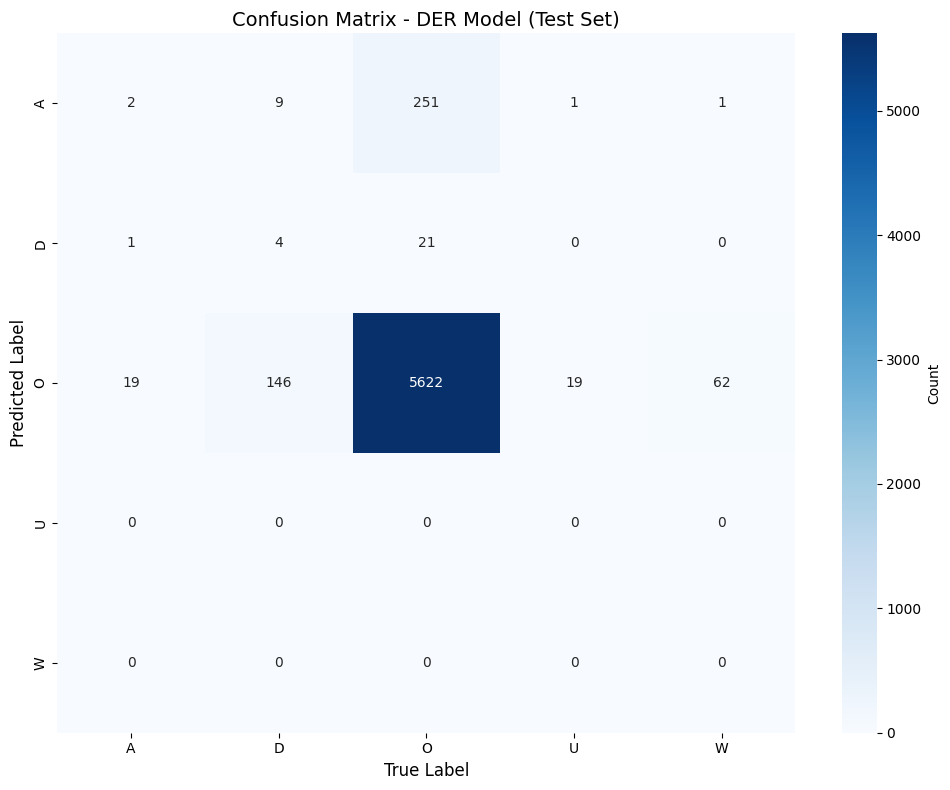

✓ 混淆矩陣已儲存至: /content/drive/MyDrive/few-shot/DER_model/confusion_matrix.png

[9] 繪製訓練歷史...


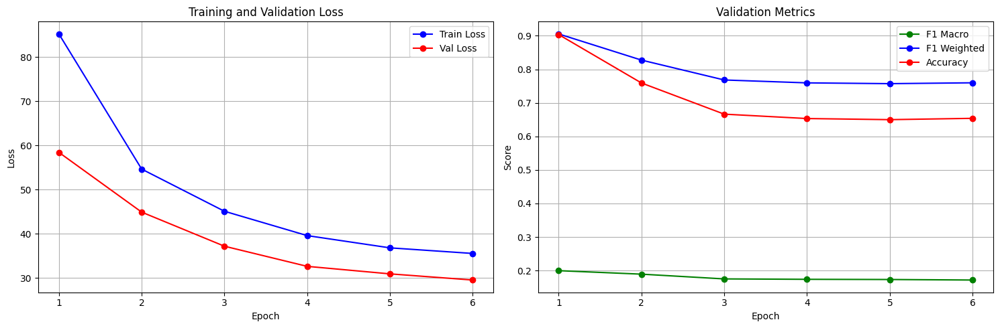

✓ 訓練歷史已儲存至: /content/drive/MyDrive/few-shot/DER_model/training_history.png
✓ 訓練歷史 CSV 已儲存至: /content/drive/MyDrive/few-shot/DER_model/training_history.csv

🎉 所有步驟完成！

模型和結果已儲存至: /content/drive/MyDrive/few-shot/DER_model

檔案清單:
  - best_DER_model.pt (最佳模型)
  - classification_report.txt (分類報告)
  - confusion_matrix.png (混淆矩陣)
  - training_history.png (訓練歷史)
  - training_history.csv (訓練數據)


In [ ]:
import os
import csv
import numpy as np
import pandas as pd
import torch
import torch.nn as nn
from torch.utils.data import Dataset, DataLoader
from transformers import BertTokenizerFast, BertModel
from sklearn.metrics import f1_score, accuracy_score, classification_report, confusion_matrix
from sklearn.model_selection import train_test_split
from tqdm.auto import tqdm
import seaborn as sns
import matplotlib.pyplot as plt

# 安裝 pytorch-crf (如果還沒安裝)
# !pip install pytorch-crf

from torchcrf import CRF

# ============================================================
# 1️⃣ 配置參數
# ============================================================
CONFIG = {
    # 路徑設定
    "encoder_dir": "/content/drive/MyDrive/few-shot/chinese_mentalbert_finetuned_results_simplified/final_model",
    "data_path": "/content/drive/MyDrive/few-shot/noO_select_de.csv",
    "save_dir": "/content/drive/MyDrive/few-shot/DER_model",

    # 模型參數
    "max_length": 128,
    "use_bilstm": False,  # ⭐ 設為 False 使用 BERT+CRF，True 使用 BERT+BiLSTM+CRF
    "lstm_hidden_size": 128,  # 如果使用 BiLSTM，建議降低為 128
    "lstm_layers": 1,         # 如果使用 BiLSTM，1 層通常就夠
    "dropout": 0.3,

    # 訓練參數
    "batch_size": 8,
    "learning_rate": 3e-4,
    "num_epochs": 15,
    "early_stopping_patience": 5,
    "gradient_clip": 1.0,

    # 資料分割
    "train_ratio": 0.64,  # 0.8 * 0.8 = 64% 訓練
    "val_ratio": 0.16,    # 0.8 * 0.2 = 16% 驗證
    "test_ratio": 0.20,   # 20% 測試

    # 其他
    "seed": 42,
}

# 設定隨機種子
torch.manual_seed(CONFIG["seed"])
np.random.seed(CONFIG["seed"])
if torch.cuda.is_available():
    torch.cuda.manual_seed_all(CONFIG["seed"])

DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"🖥️  使用裝置: {DEVICE}")

# 建立儲存目錄
os.makedirs(CONFIG["save_dir"], exist_ok=True)

# ============================================================
# 2️⃣ 載入微調後的 MentalBERT Encoder
# ============================================================
print("\n[1] 載入微調後的 MentalBERT Encoder...")
try:
    tokenizer = BertTokenizerFast.from_pretrained(CONFIG["encoder_dir"])
    encoder = BertModel.from_pretrained(CONFIG["encoder_dir"])
    print(f"✓ 成功載入 Encoder from: {CONFIG['encoder_dir']}")
except Exception as e:
    print(f"✗ 載入失敗: {e}")
    exit(1)

# 凍結 Encoder（作為特徵抽取器，不更新參數）
for param in encoder.parameters():
    param.requires_grad = False
encoder.eval()  # 設為評估模式
print("✓ Encoder 已凍結，將作為特徵抽取器使用")

# ============================================================
# 3️⃣ 載入並處理資料
# ============================================================
print("\n[2] 載入資料...")

def load_data(file_path):
    """載入並預處理資料"""
    try:
        df = pd.read_csv(
            file_path,
            encoding='utf-8',
            quoting=csv.QUOTE_ALL,
            on_bad_lines='warn'
        )
        # 只保留前9欄
        df = df[df.columns[:9].tolist()]
        print(f"✓ 成功載入: {len(df)} 行")
        return df
    except Exception as e:
        print(f"✗ 載入失敗: {e}")
        exit(1)

df = load_data(CONFIG["data_path"])

# 檢測標籤集（使用簡化標籤）
def simplify_label(label):
    """簡化標籤 (BMEU-DAWU -> DAWU/O)"""
    if pd.isna(label):
        return "O"
    label = str(label).strip()
    if '-' in label:
        suffix = label.split('-')[1]
        if suffix in ["D", "A", "W", "U"]:
            return suffix
    return "O"

df['simplified_label'] = df['human_label'].apply(simplify_label)

# 建立標籤映射
unique_labels = sorted(df['simplified_label'].dropna().unique())
label2id = {label: i for i, label in enumerate(unique_labels)}
id2label = {i: label for label, i in label2id.items()}

print(f"\n標籤系統 ({len(label2id)} 類):")
for label, idx in sorted(label2id.items(), key=lambda x: x[1]):
    count = (df['simplified_label'] == label).sum()
    print(f"  {label} (id={idx}): {count} 個標記")

# ============================================================
# 4️⃣ 按 post_id 分組並建立資料集
# ============================================================
print("\n[3] 建立資料集...")

def group_by_post(df, label2id):
    """按 post_id 分組"""
    data = []
    for post_id, group in df.groupby('post_id'):
        # 如果有 word_order，按其排序
        if 'word_order' in group.columns:
            group = group.sort_values('word_order')

        words = group['word'].astype(str).tolist()
        labels = group['simplified_label'].tolist()

        # 驗證
        if len(words) != len(labels):
            continue

        data.append({
            "post_id": post_id,
            "caption": group['caption'].iloc[0],
            "words": words,
            "labels": [label2id[label] for label in labels]
        })

    return data

all_data = group_by_post(df, label2id)
print(f"✓ 成功建立 {len(all_data)} 個樣本")

# 分割資料集 (Train: 64%, Val: 16%, Test: 20%)
train_val_data, test_data = train_test_split(
    all_data,
    test_size=CONFIG["test_ratio"],
    random_state=CONFIG["seed"],
    shuffle=True
)

train_data, val_data = train_test_split(
    train_val_data,
    test_size=CONFIG["val_ratio"] / (1 - CONFIG["test_ratio"]),  # 16/80 = 0.2
    random_state=CONFIG["seed"],
    shuffle=True
)

print(f"\n資料分割:")
print(f"  訓練集: {len(train_data)} 樣本 ({len(train_data)/len(all_data)*100:.1f}%)")
print(f"  驗證集: {len(val_data)} 樣本 ({len(val_data)/len(all_data)*100:.1f}%)")
print(f"  測試集: {len(test_data)} 樣本 ({len(test_data)/len(all_data)*100:.1f}%)")

# ============================================================
# 5️⃣ Dataset 類別
# ============================================================
class TokenClassificationDataset(Dataset):
    def __init__(self, data, tokenizer, max_length=128):
        self.data = data
        self.tokenizer = tokenizer
        self.max_length = max_length

    def __len__(self):
        return len(self.data)

    def __getitem__(self, idx):
        item = self.data[idx]

        # Tokenize
        encoding = self.tokenizer(
            item["words"],
            is_split_into_words=True,
            truncation=True,
            padding="max_length",
            max_length=self.max_length,
            return_tensors="pt"
        )

        # 對齊標籤
        word_ids = encoding.word_ids()
        previous_word_idx = None
        label_ids = []

        for word_idx in word_ids:
            if word_idx is None:
                label_ids.append(-100)
            elif word_idx != previous_word_idx:
                if word_idx < len(item["labels"]):
                    label_ids.append(item["labels"][word_idx])
                else:
                    label_ids.append(-100)
            else:
                label_ids.append(-100)
            previous_word_idx = word_idx

        # 轉為 tensor 並移除 batch 維度
        encoding = {k: v.squeeze(0) for k, v in encoding.items()}
        encoding["labels"] = torch.tensor(label_ids, dtype=torch.long)

        return encoding

# 建立 DataLoader
train_dataset = TokenClassificationDataset(train_data, tokenizer, CONFIG["max_length"])
val_dataset = TokenClassificationDataset(val_data, tokenizer, CONFIG["max_length"])
test_dataset = TokenClassificationDataset(test_data, tokenizer, CONFIG["max_length"])

train_loader = DataLoader(train_dataset, batch_size=CONFIG["batch_size"], shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=CONFIG["batch_size"], shuffle=False)
test_loader = DataLoader(test_dataset, batch_size=CONFIG["batch_size"], shuffle=False)

print(f"\n✓ DataLoader 建立完成")

# ============================================================
# 6️⃣ 定義 DER 模型 (支援兩種架構)
# ============================================================
class DERModel(nn.Module):
    """
    DER (Deep Embedding Representation) 模型

    架構 1 (推薦): Frozen MentalBERT → Dropout → Linear → CRF
    架構 2 (可選): Frozen MentalBERT → BiLSTM → Dropout → Linear → CRF
    """
    def __init__(self, encoder, num_labels, use_bilstm=False, hidden_size=128, num_layers=1, dropout=0.3):
        super().__init__()
        self.encoder = encoder
        self.num_labels = num_labels
        self.use_bilstm = use_bilstm

        # BiLSTM 層 (可選)
        if use_bilstm:
            self.lstm = nn.LSTM(
                input_size=encoder.config.hidden_size,  # BERT 輸出維度 (通常是 768)
                hidden_size=hidden_size,
                num_layers=num_layers,
                batch_first=True,
                bidirectional=True,
                dropout=dropout if num_layers > 1 else 0
            )
            classifier_input_size = hidden_size * 2  # BiLSTM 輸出是雙向的
        else:
            self.lstm = None
            classifier_input_size = encoder.config.hidden_size  # 直接用 BERT 輸出

        # Dropout
        self.dropout = nn.Dropout(dropout)

        # 線性層：BERT/BiLSTM 輸出 → 標籤空間
        self.classifier = nn.Linear(classifier_input_size, num_labels)

        # CRF 層
        self.crf = CRF(num_tags=num_labels, batch_first=True)

    def forward(self, input_ids, attention_mask, labels=None):
        """
        前向傳播

        Args:
            input_ids: (batch_size, seq_len)
            attention_mask: (batch_size, seq_len)
            labels: (batch_size, seq_len) - 訓練時提供

        Returns:
            如果有 labels: (loss, predictions)
            如果無 labels: predictions
        """
        # 1. 從凍結的 Encoder 取得特徵 (不計算梯度)
        with torch.no_grad():
            encoder_outputs = self.encoder(
                input_ids=input_ids,
                attention_mask=attention_mask
            )

        # 2. 取得序列表示
        sequence_output = encoder_outputs.last_hidden_state  # (batch_size, seq_len, hidden_size)

        # 3. BiLSTM (可選)
        if self.use_bilstm:
            lstm_output, _ = self.lstm(sequence_output)  # (batch_size, seq_len, hidden_size*2)
            lstm_output = self.dropout(lstm_output)
            emissions = self.classifier(lstm_output)  # (batch_size, seq_len, num_labels)
        else:
            # 直接使用 BERT 輸出
            sequence_output = self.dropout(sequence_output)
            emissions = self.classifier(sequence_output)  # (batch_size, seq_len, num_labels)

        # 4. CRF 解碼
        # 建立有效 token 的 mask (排除 padding)
        mask = attention_mask.bool()

        if labels is not None:
            # 訓練模式：計算 CRF loss
            # 將 -100 替換為 0 (CRF 不支援 -100)
            labels_crf = labels.clone()
            labels_crf[labels_crf == -100] = 0

            # CRF 負對數似然作為 loss
            loss = -self.crf(emissions, labels_crf, mask=mask, reduction="mean")

            # 使用 Viterbi 解碼得到最佳路徑
            predictions = self.crf.decode(emissions, mask=mask)

            return loss, predictions
        else:
            # 推理模式：只解碼
            predictions = self.crf.decode(emissions, mask=mask)
            return predictions

# ============================================================
# 7️⃣ 初始化模型
# ============================================================
print("\n[4] 初始化 DER 模型...")

if CONFIG["use_bilstm"]:
    print("📌 使用架構: MentalBERT → BiLSTM → CRF")
else:
    print("📌 使用架構: MentalBERT → CRF (推薦)")

model = DERModel(
    encoder=encoder,
    num_labels=len(label2id),
    use_bilstm=CONFIG["use_bilstm"],
    hidden_size=CONFIG["lstm_hidden_size"],
    num_layers=CONFIG["lstm_layers"],
    dropout=CONFIG["dropout"]
).to(DEVICE)

# 統計參數
total_params = sum(p.numel() for p in model.parameters())
trainable_params = sum(p.numel() for p in model.parameters() if p.requires_grad)

print(f"✓ 模型已初始化")
print(f"  總參數: {total_params:,}")
print(f"  可訓練參數: {trainable_params:,} ({trainable_params/total_params*100:.2f}%)")

# 優化器
optimizer = torch.optim.AdamW(
    filter(lambda p: p.requires_grad, model.parameters()),
    lr=CONFIG["learning_rate"],
    weight_decay=0.01
)

# 學習率調度器
scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(
    optimizer,
    mode='max',
    factor=0.5,
    patience=2
)
print("✓ 學習率調度器已設定 (ReduceLROnPlateau)")

# ============================================================
# 8️⃣ 評估函數
# ============================================================
def evaluate(model, dataloader, desc="Evaluating"):
    """評估模型"""
    model.eval()
    all_predictions = []
    all_labels = []
    total_loss = 0

    with torch.no_grad():
        for batch in tqdm(dataloader, desc=desc, leave=False):
            input_ids = batch["input_ids"].to(DEVICE)
            attention_mask = batch["attention_mask"].to(DEVICE)
            labels = batch["labels"].to(DEVICE)

            # 前向傳播
            loss, predictions = model(input_ids, attention_mask, labels)
            total_loss += loss.item()

            # 收集預測和真實標籤
            for i, pred_seq in enumerate(predictions):
                # 只取有效的 token (排除 -100)
                valid_indices = labels[i] != -100
                true_labels = labels[i][valid_indices].cpu().tolist()
                pred_labels = pred_seq[:len(true_labels)]  # CRF 解碼結果

                all_labels.extend(true_labels)
                all_predictions.extend(pred_labels)

    # 計算指標
    avg_loss = total_loss / len(dataloader)
    accuracy = accuracy_score(all_labels, all_predictions)
    f1_macro = f1_score(all_labels, all_predictions, average='macro', zero_division=0)
    f1_weighted = f1_score(all_labels, all_predictions, average='weighted', zero_division=0)

    return {
        'loss': avg_loss,
        'accuracy': accuracy,
        'f1_macro': f1_macro,
        'f1_weighted': f1_weighted,
        'predictions': all_predictions,
        'labels': all_labels
    }

# ============================================================
# 9️⃣ 訓練循環
# ============================================================
print("\n[5] 開始訓練...")
print("=" * 60)

best_f1_macro = 0
patience_counter = 0
training_history = []

for epoch in range(CONFIG["num_epochs"]):
    # 訓練模式
    model.train()
    train_loss = 0

    progress_bar = tqdm(train_loader, desc=f"Epoch {epoch+1}/{CONFIG['num_epochs']}")
    for batch in progress_bar:
        input_ids = batch["input_ids"].to(DEVICE)
        attention_mask = batch["attention_mask"].to(DEVICE)
        labels = batch["labels"].to(DEVICE)

        # 前向傳播
        loss, _ = model(input_ids, attention_mask, labels)

        # 反向傳播
        optimizer.zero_grad()
        loss.backward()

        # 梯度裁剪
        torch.nn.utils.clip_grad_norm_(
            model.parameters(),
            CONFIG["gradient_clip"]
        )

        optimizer.step()

        train_loss += loss.item()
        progress_bar.set_postfix({'loss': f'{loss.item():.4f}'})

    avg_train_loss = train_loss / len(train_loader)

    # 驗證
    val_results = evaluate(model, val_loader, desc=f"Validating Epoch {epoch+1}")

    # 調整學習率
    scheduler.step(val_results['f1_macro'])

    # 記錄
    training_history.append({
        'epoch': epoch + 1,
        'train_loss': avg_train_loss,
        'val_loss': val_results['loss'],
        'val_accuracy': val_results['accuracy'],
        'val_f1_macro': val_results['f1_macro'],
        'val_f1_weighted': val_results['f1_weighted']
    })

    # 輸出結果
    print(f"\nEpoch {epoch+1}/{CONFIG['num_epochs']}:")
    print(f"  Train Loss: {avg_train_loss:.4f}")
    print(f"  Val Loss:   {val_results['loss']:.4f}")
    print(f"  Val Acc:    {val_results['accuracy']:.4f}")
    print(f"  Val F1 (macro):    {val_results['f1_macro']:.4f}")
    print(f"  Val F1 (weighted): {val_results['f1_weighted']:.4f}")

    # 儲存最佳模型
    if val_results['f1_macro'] > best_f1_macro:
        best_f1_macro = val_results['f1_macro']
        patience_counter = 0

        # 儲存模型
        model_save_path = os.path.join(CONFIG["save_dir"], "best_DER_model.pt")
        torch.save({
            'epoch': epoch + 1,
            'model_state_dict': model.state_dict(),
            'optimizer_state_dict': optimizer.state_dict(),
            'best_f1_macro': best_f1_macro,
            'config': CONFIG,
            'label2id': label2id,
            'id2label': id2label
        }, model_save_path)

        print(f"  ✅ 儲存最佳模型 (F1 macro: {best_f1_macro:.4f})")
    else:
        patience_counter += 1
        print(f"  ⚠️  F1 未提升 ({patience_counter}/{CONFIG['early_stopping_patience']})")

        if patience_counter >= CONFIG["early_stopping_patience"]:
            print(f"\n⏹  早停觸發！最佳 F1 macro: {best_f1_macro:.4f}")
            break

    print("-" * 60)

print("=" * 60)
print("✓ 訓練完成")

# ============================================================
# 🔟 測試集評估
# ============================================================
print("\n[6] 在測試集上評估...")

# 載入最佳模型
checkpoint = torch.load(os.path.join(CONFIG["save_dir"], "best_DER_model.pt"))
model.load_state_dict(checkpoint['model_state_dict'])

# 評估
test_results = evaluate(model, test_loader, desc="Testing")

print("\n" + "=" * 60)
print("📊 最終測試集結果:")
print(f"  Test Loss:   {test_results['loss']:.4f}")
print(f"  Test Acc:    {test_results['accuracy']:.4f}")
print(f"  Test F1 (macro):    {test_results['f1_macro']:.4f}")
print(f"  Test F1 (weighted): {test_results['f1_weighted']:.4f}")
print("=" * 60)

# ============================================================
# 1️⃣1️⃣ 詳細分類報告
# ============================================================
print("\n[7] 生成詳細分類報告...")

# 分類報告
report = classification_report(
    test_results['labels'],
    test_results['predictions'],
    target_names=[id2label[i] for i in range(len(id2label))],
    digits=4,
    zero_division=0
)
print("\n分類報告:")
print(report)

# 儲存報告
report_path = os.path.join(CONFIG["save_dir"], "classification_report.txt")
with open(report_path, 'w', encoding='utf-8') as f:
    f.write("DER Model - Classification Report\n")
    f.write("=" * 60 + "\n\n")
    f.write(f"Test Accuracy: {test_results['accuracy']:.4f}\n")
    f.write(f"Test F1 (macro): {test_results['f1_macro']:.4f}\n")
    f.write(f"Test F1 (weighted): {test_results['f1_weighted']:.4f}\n\n")
    f.write(report)
print(f"✓ 報告已儲存至: {report_path}")

# ============================================================
# 1️⃣2️⃣ 混淆矩陣視覺化
# ============================================================
print("\n[8] 繪製混淆矩陣...")

# 計算混淆矩陣
cm = confusion_matrix(
    test_results['labels'],
    test_results['predictions'],
    labels=list(range(len(label2id)))
)

# 繪製
plt.figure(figsize=(10, 8))
sns.heatmap(
    cm.T,  # 轉置：x軸=真實, y軸=預測
    annot=True,
    fmt='d',
    cmap='Blues',
    xticklabels=[id2label[i] for i in range(len(id2label))],
    yticklabels=[id2label[i] for i in range(len(id2label))],
    cbar_kws={'label': 'Count'}
)
plt.xlabel('True Label', fontsize=12)
plt.ylabel('Predicted Label', fontsize=12)
plt.title('Confusion Matrix - DER Model (Test Set)', fontsize=14)
plt.tight_layout()

cm_path = os.path.join(CONFIG["save_dir"], "confusion_matrix.png")
plt.savefig(cm_path, dpi=300, bbox_inches='tight')
plt.show()
print(f"✓ 混淆矩陣已儲存至: {cm_path}")

# ============================================================
# 1️⃣3️⃣ 訓練歷史視覺化
# ============================================================
print("\n[9] 繪製訓練歷史...")

if training_history:
    history_df = pd.DataFrame(training_history)

    fig, axes = plt.subplots(1, 2, figsize=(15, 5))

    # Loss 曲線
    axes[0].plot(history_df['epoch'], history_df['train_loss'], 'b-o', label='Train Loss')
    axes[0].plot(history_df['epoch'], history_df['val_loss'], 'r-o', label='Val Loss')
    axes[0].set_xlabel('Epoch')
    axes[0].set_ylabel('Loss')
    axes[0].set_title('Training and Validation Loss')
    axes[0].legend()
    axes[0].grid(True)

    # F1 曲線
    axes[1].plot(history_df['epoch'], history_df['val_f1_macro'], 'g-o', label='F1 Macro')
    axes[1].plot(history_df['epoch'], history_df['val_f1_weighted'], 'b-o', label='F1 Weighted')
    axes[1].plot(history_df['epoch'], history_df['val_accuracy'], 'r-o', label='Accuracy')
    axes[1].set_xlabel('Epoch')
    axes[1].set_ylabel('Score')
    axes[1].set_title('Validation Metrics')
    axes[1].legend()
    axes[1].grid(True)

    plt.tight_layout()
    history_path = os.path.join(CONFIG["save_dir"], "training_history.png")
    plt.savefig(history_path, dpi=300, bbox_inches='tight')
    plt.show()
    print(f"✓ 訓練歷史已儲存至: {history_path}")

    # 儲存 CSV
    history_csv_path = os.path.join(CONFIG["save_dir"], "training_history.csv")
    history_df.to_csv(history_csv_path, index=False)
    print(f"✓ 訓練歷史 CSV 已儲存至: {history_csv_path}")

print("\n" + "=" * 60)
print("🎉 所有步驟完成！")
print("=" * 60)
print(f"\n模型和結果已儲存至: {CONFIG['save_dir']}")
print("\n檔案清單:")
print("  - best_DER_model.pt (最佳模型)")
print("  - classification_report.txt (分類報告)")
print("  - confusion_matrix.png (混淆矩陣)")
print("  - training_history.png (訓練歷史)")
print("  - training_history.csv (訓練數據)")

🖥️ 使用裝置: cuda

[1] 載入微調後的 MentalBERT Encoder...


Some weights of BertModel were not initialized from the model checkpoint at /content/drive/MyDrive/few-shot/chinese_mentalbert_finetuned_results_simplified/final_model and are newly initialized: ['bert.pooler.dense.bias', 'bert.pooler.dense.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


✓ Encoder 已凍結，作為特徵抽取器使用

[2] 載入資料...


/tmp/ipython-input-2627708513.py:98: DtypeWarning: Columns (10) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(


✓ 成功載入: 67051 行

標籤統計（BMES+O）:
    O: 65053
  B-D: 120
  M-D: 34
  E-D: 116
  S-D: 877
  B-A: 43
  M-A: 18
  E-A: 34
  S-A: 49
  B-W: 93
  M-W: 30
  E-W: 85
  S-W: 271
  B-U: 51
  M-U: 20
  E-U: 50
  S-U: 107

[3] 建立資料集（按 post_id 分組）...
✓ 成功建立 489 個樣本

資料分割：Train 312 | Val 79 | Test 98
✓ DataLoader 建立完成

[4] 初始化 DER 模型...
📌 架構： BERT → CRF
✓ 模型已初始化 | 總參數: 102,281,044 | 可訓練參數: 13,396 (0.01%)
✓ 學習率調度器：ReduceLROnPlateau(監看 Val F1 macro-無O)

[5] 開始訓練...


Epoch 1/15:   0%|          | 0/39 [00:00<?, ?it/s]

Validating 1:   0%|          | 0/10 [00:00<?, ?it/s]


Epoch 1:
  Train Loss         : 72.8536
  Val Loss           : 12.2801
  Val Acc (含O)      : 0.9436
  Val F1-macro(含O)  : 0.0571
  Val F1-macro(無O)  : 0.0000
  ⚠️ 未提升 (1/5)


Epoch 2/15:   0%|          | 0/39 [00:00<?, ?it/s]

Validating 2:   0%|          | 0/10 [00:00<?, ?it/s]


Epoch 2:
  Train Loss         : 11.1016
  Val Loss           : 9.3306
  Val Acc (含O)      : 0.9311
  Val F1-macro(含O)  : 0.0574
  Val F1-macro(無O)  : 0.0013
  ✅ 儲存最佳模型（Val F1-macro 無O: 0.0013）


Epoch 3/15:   0%|          | 0/39 [00:00<?, ?it/s]

Validating 3:   0%|          | 0/10 [00:00<?, ?it/s]


Epoch 3:
  Train Loss         : 9.3723
  Val Loss           : 8.5166
  Val Acc (含O)      : 0.9301
  Val F1-macro(含O)  : 0.0567
  Val F1-macro(無O)  : 0.0000
  ⚠️ 未提升 (1/5)


Epoch 4/15:   0%|          | 0/39 [00:00<?, ?it/s]

Validating 4:   0%|          | 0/10 [00:00<?, ?it/s]


Epoch 4:
  Train Loss         : 8.4463
  Val Loss           : 7.9973
  Val Acc (含O)      : 0.9290
  Val F1-macro(含O)  : 0.0567
  Val F1-macro(無O)  : 0.0000
  ⚠️ 未提升 (2/5)


Epoch 5/15:   0%|          | 0/39 [00:00<?, ?it/s]

Validating 5:   0%|          | 0/10 [00:00<?, ?it/s]


Epoch 5:
  Train Loss         : 7.9970
  Val Loss           : 7.7252
  Val Acc (含O)      : 0.9290
  Val F1-macro(含O)  : 0.0567
  Val F1-macro(無O)  : 0.0000
  ⚠️ 未提升 (3/5)


Epoch 6/15:   0%|          | 0/39 [00:00<?, ?it/s]

Validating 6:   0%|          | 0/10 [00:00<?, ?it/s]


Epoch 6:
  Train Loss         : 7.7856
  Val Loss           : 7.5877
  Val Acc (含O)      : 0.9282
  Val F1-macro(含O)  : 0.0567
  Val F1-macro(無O)  : 0.0000
  ⚠️ 未提升 (4/5)


Epoch 7/15:   0%|          | 0/39 [00:00<?, ?it/s]

Validating 7:   0%|          | 0/10 [00:00<?, ?it/s]


Epoch 7:
  Train Loss         : 7.6328
  Val Loss           : 7.4632
  Val Acc (含O)      : 0.9288
  Val F1-macro(含O)  : 0.0567
  Val F1-macro(無O)  : 0.0000
  ⚠️ 未提升 (5/5)

⏹ 早停觸發

✓ 訓練完成

[6] 測試集評估...


Testing:   0%|          | 0/13 [00:00<?, ?it/s]


📊 測試集結果：
  Test Loss            : 10.2849
  Test Acc  (含O)      : 0.9391
  Test F1-macro(含O)   : 0.0633
  Test F1-macro(無O)   : 0.0050

分類報告（含 O）：
               precision    recall  f1-score   support

           O     0.9581    0.9803    0.9691      5894
         B-D     0.0000    0.0000    0.0000        18
         M-D     0.0000    0.0000    0.0000         9
         E-D     0.0000    0.0000    0.0000        18
         S-D     0.0446    0.0439    0.0442       114
         B-A     0.0000    0.0000    0.0000         4
         M-A     0.0000    0.0000    0.0000         0
         E-A     0.0000    0.0000    0.0000         4
         S-A     0.0000    0.0000    0.0000        14
         B-W     0.0000    0.0000    0.0000        10
         M-W     0.0000    0.0000    0.0000         5
         E-W     0.0000    0.0000    0.0000        10
         S-W     0.0000    0.0000    0.0000        38
         B-U     0.0000    0.0000    0.0000         4
         M-U     0.0000    0.0000    0.0

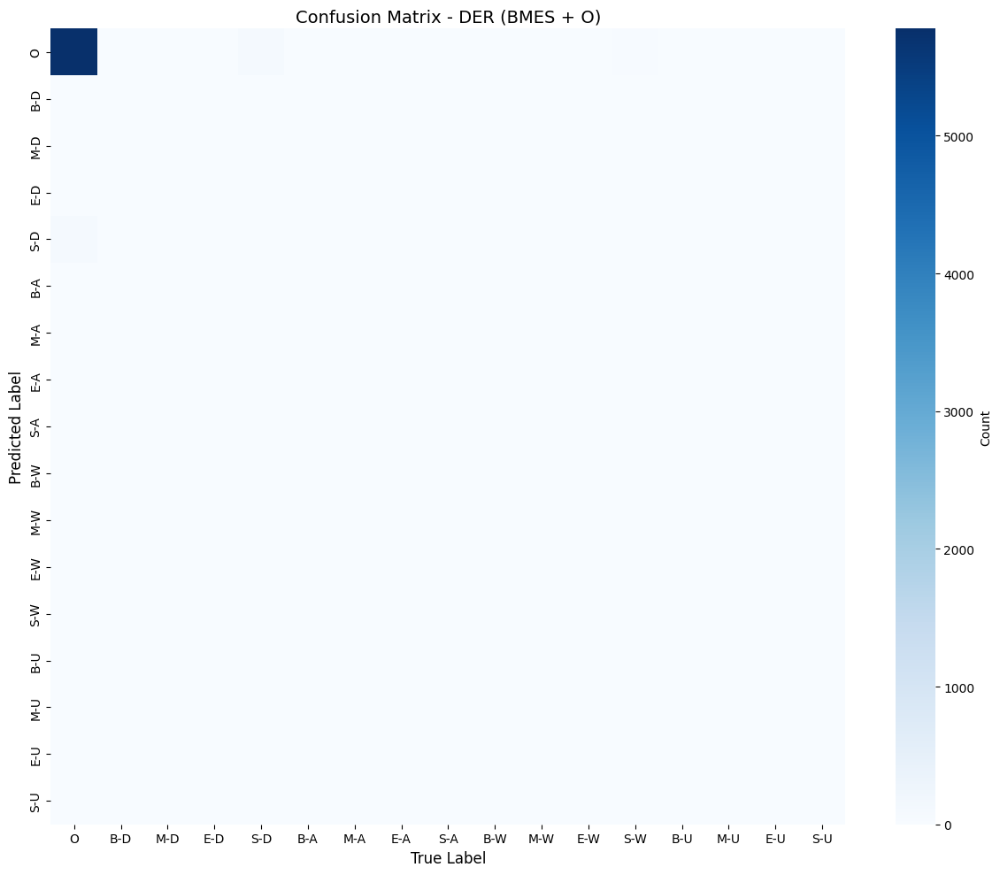

✓ 混淆矩陣已儲存：/content/drive/MyDrive/few-shot/DER_model_BMES/confusion_matrix_all.png

[8] 訓練歷史曲線...


/tmp/ipython-input-2627708513.py:536: UserWarning: Glyph 21547 (\N{CJK UNIFIED IDEOGRAPH-542B}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-2627708513.py:536: UserWarning: Glyph 28961 (\N{CJK UNIFIED IDEOGRAPH-7121}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-2627708513.py:538: UserWarning: Glyph 21547 (\N{CJK UNIFIED IDEOGRAPH-542B}) missing from font(s) DejaVu Sans.
  plt.savefig(fig_path, dpi=300, bbox_inches='tight')
/tmp/ipython-input-2627708513.py:538: UserWarning: Glyph 28961 (\N{CJK UNIFIED IDEOGRAPH-7121}) missing from font(s) DejaVu Sans.
  plt.savefig(fig_path, dpi=300, bbox_inches='tight')
/usr/local/lib/python3.12/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 21547 (\N{CJK UNIFIED IDEOGRAPH-542B}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.12/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 28961 (\N{CJK UNIFIED IDEOGRAPH-7

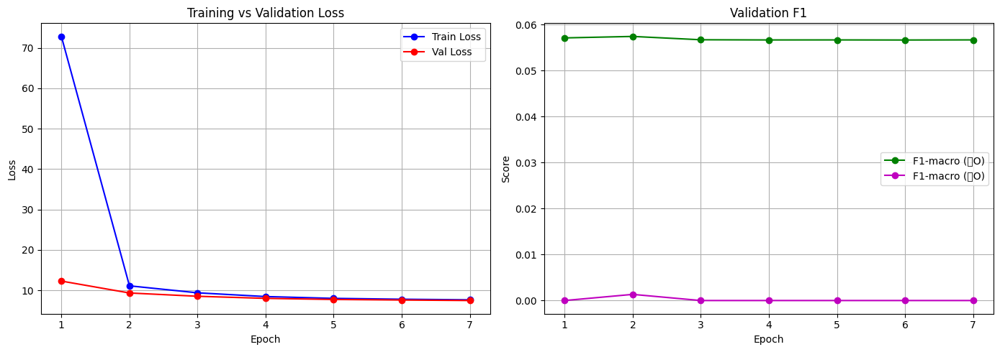

✓ 訓練曲線：/content/drive/MyDrive/few-shot/DER_model_BMES/training_history.png
✓ 訓練歷史 CSV：/content/drive/MyDrive/few-shot/DER_model_BMES/training_history.csv

🎉 完成！輸出與模型皆位於： /content/drive/MyDrive/few-shot/DER_model_BMES


In [ ]:
# ============================================================
# DER 模型（恢復 BMES 標註並保留 O 類）— 可直接在 Colab 執行
# ============================================================
# 需求：transformers, torch, pytorch-crf, sklearn, seaborn, matplotlib, tqdm, pandas, numpy
# !pip install transformers torch pytorch-crf scikit-learn seaborn matplotlib tqdm pandas

import os
import csv
import numpy as np
import pandas as pd
import torch
import torch.nn as nn
from torch.utils.data import Dataset, DataLoader
from transformers import BertTokenizerFast, BertModel
from sklearn.metrics import f1_score, accuracy_score, classification_report, confusion_matrix
from sklearn.model_selection import train_test_split
from tqdm.auto import tqdm
import seaborn as sns
import matplotlib.pyplot as plt
from torchcrf import CRF

# ============================================================
# 1️⃣ 配置參數
# ============================================================
CONFIG = {
    # 路徑設定（請依你環境調整）
    "encoder_dir": "/content/drive/MyDrive/few-shot/chinese_mentalbert_finetuned_results_simplified/final_model",
    "data_path":   "/content/drive/MyDrive/few-shot/noO_select_de.csv",
    "save_dir":    "/content/drive/MyDrive/few-shot/DER_model_BMES",

    # 模型參數
    "max_length": 128,
    "use_bilstm": False,     # False: BERT+CRF；True: BERT+BiLSTM+CRF
    "lstm_hidden_size": 128,
    "lstm_layers": 1,
    "dropout": 0.3,

    # 訓練參數
    "batch_size": 8,
    "learning_rate": 3e-4,
    "num_epochs": 15,
    "early_stopping_patience": 5,
    "gradient_clip": 1.0,

    # 資料分割
    "train_ratio": 0.64,    # 0.8*0.8
    "val_ratio":   0.16,    # 0.8*0.2
    "test_ratio":  0.20,

    # 隨機種子
    "seed": 42,
}

# 固定隨機種子
torch.manual_seed(CONFIG["seed"])
np.random.seed(CONFIG["seed"])
if torch.cuda.is_available():
    torch.cuda.manual_seed_all(CONFIG["seed"])

DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"🖥️ 使用裝置: {DEVICE}")
os.makedirs(CONFIG["save_dir"], exist_ok=True)

# ============================================================
# 2️⃣ 載入微調後的 MentalBERT（凍結）
# ============================================================
print("\n[1] 載入微調後的 MentalBERT Encoder...")
tokenizer = BertTokenizerFast.from_pretrained(CONFIG["encoder_dir"])
encoder   = BertModel.from_pretrained(CONFIG["encoder_dir"])
for p in encoder.parameters():
    p.requires_grad = False
encoder.eval()
print("✓ Encoder 已凍結，作為特徵抽取器使用")

# ============================================================
# 3️⃣ 標籤體系（BMES + O）
# ============================================================
# 固定完整標籤集合，確保訓練/評估維度穩定（即使資料某些類別暫時缺少）
LABEL_LIST = [
    "O",
    "B-D", "M-D", "E-D", "S-D",
    "B-A", "M-A", "E-A", "S-A",
    "B-W", "M-W", "E-W", "S-W",
    "B-U", "M-U", "E-U", "S-U",
]
label2id = {lb:i for i, lb in enumerate(LABEL_LIST)}
id2label = {i:lb for lb, i in label2id.items()}

# 方便後續只計症狀類（排除 O）
NON_O_LABEL_IDS = [label2id[lb] for lb in LABEL_LIST if lb != "O"]

# ============================================================
# 4️⃣ 載入並處理資料（恢復 BMES，不再壓成 DAWU+O）
# ============================================================
print("\n[2] 載入資料...")

def load_data(file_path):
    df = pd.read_csv(
        file_path,
        encoding="utf-8",
        quoting=csv.QUOTE_ALL,
        on_bad_lines='warn'
    )
    # 只保留前 9 欄（依你原始流程）
    df = df[df.columns[:9].tolist()]
    print(f"✓ 成功載入: {len(df)} 行")
    return df

df = load_data(CONFIG["data_path"])

# ——— 標籤正規化：保留 BMES + O ———
# 允許的樣式：
#   - "O"
#   - "B-D","M-D","E-D","S-D"（D/A/W/U 四類同理）
#   - 若出現僅 "D/A/W/U"（無 BMES），視為單字片段 → 映射為 "S-X"
VALID_PREFIX = {"B","M","E","S"}
VALID_TYPE   = {"D","A","W","U"}

def normalize_label(raw):
    if pd.isna(raw):
        return "O"
    s = str(raw).strip().upper()
    if s == "O":
        return "O"
    # 已是 BMES-? 形式
    if "-" in s:
        pfx, typ = s.split("-", 1)
        pfx, typ = pfx.strip(), typ.strip()
        if pfx in VALID_PREFIX and typ in VALID_TYPE:
            return f"{pfx}-{typ}"
        else:
            return "O"
    # 僅有 D/A/W/U
    if s in VALID_TYPE:
        return f"S-{s}"
    # 其他都歸 O
    return "O"

df["bmes_label"] = df["human_label"].apply(normalize_label)

# 顯示標籤統計
print("\n標籤統計（BMES+O）:")
for lb in LABEL_LIST:
    cnt = (df["bmes_label"] == lb).sum()
    print(f"  {lb:>3}: {cnt}")

# ============================================================
# 5️⃣ 以 post_id 分組，建立資料集（word 與 bmes_label 對齊）
# ============================================================
print("\n[3] 建立資料集（按 post_id 分組）...")

def group_by_post(df):
    data = []
    for post_id, group in df.groupby("post_id"):
        if "word_order" in group.columns:
            group = group.sort_values("word_order")

        words  = group["word"].astype(str).tolist()
        labels = group["bmes_label"].astype(str).tolist()

        # 長度驗證
        if len(words) != len(labels) or len(words) == 0:
            continue

        # 映射到 id
        try:
            y_ids = [label2id.get(lb, label2id["O"]) for lb in labels]
        except KeyError:
            # 萬一遇到不在表的標籤，當 O
            y_ids = [label2id["O"] for _ in labels]

        data.append({
            "post_id": post_id,
            "caption": group["caption"].iloc[0] if "caption" in group.columns else "",
            "words": words,
            "labels": y_ids
        })
    return data

all_data = group_by_post(df)
print(f"✓ 成功建立 {len(all_data)} 個樣本")

# 分割資料
train_val_data, test_data = train_test_split(
    all_data,
    test_size=CONFIG["test_ratio"],
    random_state=CONFIG["seed"],
    shuffle=True
)
train_data, val_data = train_test_split(
    train_val_data,
    test_size=CONFIG["val_ratio"] / (1 - CONFIG["test_ratio"]),
    random_state=CONFIG["seed"],
    shuffle=True
)
print(f"\n資料分割：Train {len(train_data)} | Val {len(val_data)} | Test {len(test_data)}")

# ============================================================
# 6️⃣ Dataset 與 DataLoader（Word-level→Subword 對齊）
# ============================================================
class TokenClassificationDataset(Dataset):
    def __init__(self, data, tokenizer, max_length=128):
        self.data = data
        self.tokenizer = tokenizer
        self.max_length = max_length

    def __len__(self):
        return len(self.data)

    def __getitem__(self, idx):
        item = self.data[idx]
        encoding = self.tokenizer(
            item["words"],
            is_split_into_words=True,
            truncation=True,
            padding="max_length",
            max_length=self.max_length,
            return_tensors="pt"
        )
        # 對齊標籤到 subword：首 subword 用原標籤，其餘與 PAD 填 -100
        word_ids = encoding.word_ids(batch_index=0)
        previous_word_idx = None
        label_ids = []
        for word_idx in word_ids:
            if word_idx is None:
                label_ids.append(-100)
            elif word_idx != previous_word_idx:
                if word_idx < len(item["labels"]):
                    label_ids.append(item["labels"][word_idx])
                else:
                    label_ids.append(-100)
            else:
                label_ids.append(-100)
            previous_word_idx = word_idx

        encoding = {k: v.squeeze(0) for k, v in encoding.items()}
        encoding["labels"] = torch.tensor(label_ids, dtype=torch.long)
        return encoding

train_dataset = TokenClassificationDataset(train_data, tokenizer, CONFIG["max_length"])
val_dataset   = TokenClassificationDataset(val_data,   tokenizer, CONFIG["max_length"])
test_dataset  = TokenClassificationDataset(test_data,  tokenizer, CONFIG["max_length"])

train_loader = DataLoader(train_dataset, batch_size=CONFIG["batch_size"], shuffle=True)
val_loader   = DataLoader(val_dataset,   batch_size=CONFIG["batch_size"], shuffle=False)
test_loader  = DataLoader(test_dataset,  batch_size=CONFIG["batch_size"], shuffle=False)
print("✓ DataLoader 建立完成")

# ============================================================
# 7️⃣ DER 模型：BERT(+BiLSTM) → Dropout → Linear → CRF
# ============================================================
class DERModel(nn.Module):
    def __init__(self, encoder, num_labels, use_bilstm=False, hidden_size=128, num_layers=1, dropout=0.3):
        super().__init__()
        self.encoder = encoder
        self.num_labels = num_labels
        self.use_bilstm = use_bilstm

        if use_bilstm:
            self.lstm = nn.LSTM(
                input_size=encoder.config.hidden_size,
                hidden_size=hidden_size,
                num_layers=num_layers,
                batch_first=True,
                bidirectional=True,
                dropout=dropout if num_layers > 1 else 0.0
            )
            classifier_in = hidden_size * 2
        else:
            self.lstm = None
            classifier_in = encoder.config.hidden_size

        self.dropout = nn.Dropout(dropout)
        self.classifier = nn.Linear(classifier_in, num_labels)
        self.crf = CRF(num_tags=num_labels, batch_first=True)

    def forward(self, input_ids, attention_mask, labels=None):
        with torch.no_grad():
            enc_out = self.encoder(input_ids=input_ids, attention_mask=attention_mask)
        seq_out = enc_out.last_hidden_state  # (B, L, H)

        if self.use_bilstm:
            lstm_out, _ = self.lstm(seq_out)  # (B, L, 2*hidden)
            feats = self.dropout(lstm_out)
        else:
            feats = self.dropout(seq_out)

        emissions = self.classifier(feats)   # (B, L, C)
        mask = attention_mask.bool()

        if labels is not None:
            labels_crf = labels.clone()
            labels_crf[labels_crf == -100] = 0  # CRF 不接收 -100
            loss = -self.crf(emissions, labels_crf, mask=mask, reduction="mean")
            preds = self.crf.decode(emissions, mask=mask)
            return loss, preds
        else:
            preds = self.crf.decode(emissions, mask=mask)
            return preds

# 初始化模型與優化物件
print("\n[4] 初始化 DER 模型...")
print("📌 架構：", "BERT → BiLSTM → CRF" if CONFIG["use_bilstm"] else "BERT → CRF")
model = DERModel(
    encoder=encoder,
    num_labels=len(LABEL_LIST),
    use_bilstm=CONFIG["use_bilstm"],
    hidden_size=CONFIG["lstm_hidden_size"],
    num_layers=CONFIG["lstm_layers"],
    dropout=CONFIG["dropout"]
).to(DEVICE)

total_params = sum(p.numel() for p in model.parameters())
trainable_params = sum(p.numel() for p in model.parameters() if p.requires_grad)
print(f"✓ 模型已初始化 | 總參數: {total_params:,} | 可訓練參數: {trainable_params:,} ({trainable_params/total_params*100:.2f}%)")

optimizer = torch.optim.AdamW(
    filter(lambda p: p.requires_grad, model.parameters()),
    lr=CONFIG["learning_rate"],
    weight_decay=0.01
)
scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(
    optimizer, mode='max', factor=0.5, patience=2
)
print("✓ 學習率調度器：ReduceLROnPlateau(監看 Val F1 macro-無O)")

# ============================================================
# 8️⃣ 評估工具（同時計算：含 O 與「排除 O」）
# ============================================================
def evaluate(model, dataloader, desc="Evaluating"):
    model.eval()
    all_preds, all_labels = [], []
    total_loss = 0.0

    with torch.no_grad():
        for batch in tqdm(dataloader, desc=desc, leave=False):
            input_ids = batch["input_ids"].to(DEVICE)
            attention_mask = batch["attention_mask"].to(DEVICE)
            labels = batch["labels"].to(DEVICE)

            loss, preds = model(input_ids, attention_mask, labels)
            total_loss += loss.item()

            # 收集有效 token（labels != -100）
            for i, pred_seq in enumerate(preds):
                valid = labels[i] != -100
                y_true = labels[i][valid].cpu().tolist()
                y_pred = pred_seq[:len(y_true)]
                all_labels.extend(y_true)
                all_preds.extend(y_pred)

    avg_loss = total_loss / max(1, len(dataloader))
    # 含 O 的整體分數
    acc_all = accuracy_score(all_labels, all_preds)
    f1_macro_all = f1_score(all_labels, all_preds, average='macro', zero_division=0)
    f1_weighted_all = f1_score(all_labels, all_preds, average='weighted', zero_division=0)

    # 「排除 O」的 D/A/W/U（BMES）分數
    mask_non_o = [y in NON_O_LABEL_IDS for y in all_labels]
    y_true_non_o = [y for y, m in zip(all_labels, mask_non_o) if m]
    y_pred_non_o = [y for y, m in zip(all_preds,  mask_non_o) if m]
    if len(y_true_non_o) > 0:
        f1_macro_non_o = f1_score(y_true_non_o, y_pred_non_o, average='macro', zero_division=0)
        f1_weighted_non_o = f1_score(y_true_non_o, y_pred_non_o, average='weighted', zero_division=0)
    else:
        f1_macro_non_o, f1_weighted_non_o = 0.0, 0.0

    return {
        "loss": avg_loss,
        "accuracy_all": acc_all,
        "f1_macro_all": f1_macro_all,
        "f1_weighted_all": f1_weighted_all,
        "f1_macro_non_o": f1_macro_non_o,
        "f1_weighted_non_o": f1_weighted_non_o,
        "labels_all": all_labels,
        "preds_all": all_preds,
        "labels_non_o": y_true_non_o,
        "preds_non_o": y_pred_non_o,
    }

# ============================================================
# 9️⃣ 訓練迴圈（以「排除 O 的 macro-F1」作為主早停指標）
# ============================================================
print("\n[5] 開始訓練...")
best_f1_non_o = 0.0
patience = 0
history = []

for epoch in range(CONFIG["num_epochs"]):
    model.train()
    train_loss = 0.0
    pbar = tqdm(train_loader, desc=f"Epoch {epoch+1}/{CONFIG['num_epochs']}")
    for batch in pbar:
        input_ids = batch["input_ids"].to(DEVICE)
        attention_mask = batch["attention_mask"].to(DEVICE)
        labels = batch["labels"].to(DEVICE)

        loss, _ = model(input_ids, attention_mask, labels)
        optimizer.zero_grad()
        loss.backward()
        torch.nn.utils.clip_grad_norm_(model.parameters(), CONFIG["gradient_clip"])
        optimizer.step()

        train_loss += loss.item()
        pbar.set_postfix(loss=f"{loss.item():.4f}")

    avg_train_loss = train_loss / max(1, len(train_loader))
    val_res = evaluate(model, val_loader, desc=f"Validating {epoch+1}")
    scheduler.step(val_res["f1_macro_non_o"])

    history.append({
        "epoch": epoch+1,
        "train_loss": avg_train_loss,
        "val_loss": val_res["loss"],
        "val_acc_all": val_res["accuracy_all"],
        "val_f1_macro_all": val_res["f1_macro_all"],
        "val_f1_weighted_all": val_res["f1_weighted_all"],
        "val_f1_macro_non_o": val_res["f1_macro_non_o"],
        "val_f1_weighted_non_o": val_res["f1_weighted_non_o"],
    })

    print(f"\nEpoch {epoch+1}:")
    print(f"  Train Loss         : {avg_train_loss:.4f}")
    print(f"  Val Loss           : {val_res['loss']:.4f}")
    print(f"  Val Acc (含O)      : {val_res['accuracy_all']:.4f}")
    print(f"  Val F1-macro(含O)  : {val_res['f1_macro_all']:.4f}")
    print(f"  Val F1-macro(無O)  : {val_res['f1_macro_non_o']:.4f}")

    # 以「排除 O」的 F1-macro 做早停與儲存
    if val_res["f1_macro_non_o"] > best_f1_non_o:
        best_f1_non_o = val_res["f1_macro_non_o"]
        patience = 0
        ckpt_path = os.path.join(CONFIG["save_dir"], "best_DER_BMES.pt")
        torch.save({
            "epoch": epoch+1,
            "model_state_dict": model.state_dict(),
            "optimizer_state_dict": optimizer.state_dict(),
            "best_f1_macro_non_o": best_f1_non_o,
            "config": CONFIG,
            "label_list": LABEL_LIST,
        }, ckpt_path)
        print(f"  ✅ 儲存最佳模型（Val F1-macro 無O: {best_f1_non_o:.4f}）")
    else:
        patience += 1
        print(f"  ⚠️ 未提升 ({patience}/{CONFIG['early_stopping_patience']})")
        if patience >= CONFIG["early_stopping_patience"]:
            print("\n⏹ 早停觸發")
            break

print("\n✓ 訓練完成")

# ============================================================
# 🔟 測試集評估
# ============================================================
print("\n[6] 測試集評估...")
ckpt = torch.load(os.path.join(CONFIG["save_dir"], "best_DER_BMES.pt"), map_location=DEVICE)
model.load_state_dict(ckpt["model_state_dict"])
test_res = evaluate(model, test_loader, desc="Testing")

print("\n" + "="*60)
print("📊 測試集結果：")
print(f"  Test Loss            : {test_res['loss']:.4f}")
print(f"  Test Acc  (含O)      : {test_res['accuracy_all']:.4f}")
print(f"  Test F1-macro(含O)   : {test_res['f1_macro_all']:.4f}")
print(f"  Test F1-macro(無O)   : {test_res['f1_macro_non_o']:.4f}")
print("="*60)

# 詳細分類報告（含 O）
report_all = classification_report(
    test_res["labels_all"], test_res["preds_all"],
    labels=list(range(len(LABEL_LIST))),
    target_names=LABEL_LIST,
    digits=4, zero_division=0
)
print("\n分類報告（含 O）：\n", report_all)

# 詳細分類報告（排除 O）
if len(test_res["labels_non_o"]) > 0:
    report_non_o = classification_report(
        test_res["labels_non_o"], test_res["preds_non_o"],
        labels=NON_O_LABEL_IDS,
        target_names=[id2label[i] for i in NON_O_LABEL_IDS],
        digits=4, zero_division=0
    )
    print("\n分類報告（無 O）：\n", report_non_o)
else:
    report_non_o = "（測試集中沒有非 O 的有效 token）"

# 儲存報告
with open(os.path.join(CONFIG["save_dir"], "classification_report_all.txt"), "w", encoding="utf-8") as f:
    f.write(report_all)
with open(os.path.join(CONFIG["save_dir"], "classification_report_noO.txt"), "w", encoding="utf-8") as f:
    f.write(report_non_o)

# ============================================================
# 1️⃣1️⃣ 混淆矩陣（含 O）
# ============================================================
print("\n[7] 混淆矩陣（含 O）...")
cm_all = confusion_matrix(
    test_res["labels_all"], test_res["preds_all"],
    labels=list(range(len(LABEL_LIST)))
)
plt.figure(figsize=(12, 10))
sns.heatmap(
    cm_all.T, annot=False, fmt='d', cmap='Blues',
    xticklabels=LABEL_LIST, yticklabels=LABEL_LIST,
    cbar_kws={'label': 'Count'}
)
plt.xlabel('True Label', fontsize=12)
plt.ylabel('Predicted Label', fontsize=12)
plt.title('Confusion Matrix - DER (BMES + O)', fontsize=14)
plt.tight_layout()
cm_path = os.path.join(CONFIG["save_dir"], "confusion_matrix_all.png")
plt.savefig(cm_path, dpi=300, bbox_inches='tight')
plt.show()
print(f"✓ 混淆矩陣已儲存：{cm_path}")

# ============================================================
# 1️⃣2️⃣ 訓練歷史曲線
# ============================================================
print("\n[8] 訓練歷史曲線...")
if len(history) > 0:
    hist_df = pd.DataFrame(history)
    fig, ax = plt.subplots(1, 2, figsize=(14, 5))

    ax[0].plot(hist_df["epoch"], hist_df["train_loss"], 'b-o', label='Train Loss')
    ax[0].plot(hist_df["epoch"], hist_df["val_loss"],   'r-o', label='Val Loss')
    ax[0].set_xlabel('Epoch'); ax[0].set_ylabel('Loss'); ax[0].grid(True)
    ax[0].set_title('Training vs Validation Loss'); ax[0].legend()

    ax[1].plot(hist_df["epoch"], hist_df["val_f1_macro_all"],   'g-o', label='F1-macro (含O)')
    ax[1].plot(hist_df["epoch"], hist_df["val_f1_macro_non_o"], 'm-o', label='F1-macro (無O)')
    ax[1].set_xlabel('Epoch'); ax[1].set_ylabel('Score'); ax[1].grid(True)
    ax[1].set_title('Validation F1'); ax[1].legend()

    plt.tight_layout()
    fig_path = os.path.join(CONFIG["save_dir"], "training_history.png")
    plt.savefig(fig_path, dpi=300, bbox_inches='tight')
    plt.show()
    hist_csv = os.path.join(CONFIG["save_dir"], "training_history.csv")
    hist_df.to_csv(hist_csv, index=False)
    print(f"✓ 訓練曲線：{fig_path}")
    print(f"✓ 訓練歷史 CSV：{hist_csv}")

print("\n🎉 完成！輸出與模型皆位於：", CONFIG["save_dir"])


In [ ]:
import re
from sklearn.metrics import f1_score, classification_report, accuracy_score

def collapse_to_coarse_aligned(id_list, id2label, mode="DAWU+O"):
    """
    回傳 out, mask（兩者長度與 id_list 完全相同）
    - DAWU+O : out ∈ {D,A,W,U,O}；mask 全 True
    - DAWU   : out ∈ {D,A,W,U,O}；mask=True 表示 true 非 O（之後用同一個 mask 過濾）
    - SYMPvsO: out ∈ {SYMP,O}；mask 全 True
    """
    out, mask = [], []
    for y in id_list:
        name = id2label[y]  # 可能是 "O" 或 "B-D" 等
        if mode == "DAWU+O":
            if name == "O":
                out.append("O"); mask.append(True)
            else:
                m = re.match(r"^[BMES]-(D|A|W|U)$", name)
                out.append(m.group(1) if m else "O")
                mask.append(True)

        elif mode == "DAWU":
            if name == "O":
                # 這裡仍保留一個占位，確保與原長度一致；mask 用於後續過濾
                out.append("O"); mask.append(False)
            else:
                m = re.match(r"^[BMES]-(D|A|W|U)$", name)
                out.append(m.group(1) if m else "O")
                mask.append(True)

        elif mode == "SYMPvsO":
            if name == "O":
                out.append("O"); mask.append(True)
            else:
                out.append("SYMP"); mask.append(True)
        else:
            raise ValueError("Unknown mode")
    return out, mask

def apply_mask(seq, mask):
    return [v for v, keep in zip(seq, mask) if keep]

# ---------- 1) 5類（DAWU+O） ----------
y_true_5, m5 = collapse_to_coarse_aligned(test_res["labels_all"], id2label, mode="DAWU+O")
y_pred_5, _  = collapse_to_coarse_aligned(test_res["preds_all"],  id2label, mode="DAWU+O")
print("\n=== 5類（DAWU+O）===")
print("Accuracy:", accuracy_score(y_true_5, y_pred_5))
print("F1-macro:", f1_score(y_true_5, y_pred_5, average="macro", zero_division=0))
print(classification_report(y_true_5, y_pred_5,
                            labels=["D","A","W","U","O"], digits=4, zero_division=0))

# ---------- 2) 4類（只看 DAWU，排除 O；用 y_true 的 mask） ----------
y_true_4_all, m4 = collapse_to_coarse_aligned(test_res["labels_all"], id2label, mode="DAWU")
y_pred_4_all, _  = collapse_to_coarse_aligned(test_res["preds_all"],  id2label, mode="DAWU")
y_true_4 = apply_mask(y_true_4_all, m4)
y_pred_4 = apply_mask(y_pred_4_all, m4)
print("\n=== 4類（只看 D/A/W/U）===")
if len(y_true_4) > 0:
    print("F1-macro:", f1_score(y_true_4, y_pred_4, average="macro", zero_division=0))
    print(classification_report(y_true_4, y_pred_4,
                                labels=["D","A","W","U"], digits=4, zero_division=0))
else:
    print("測試集中沒有非 O 的有效 token。")

# ---------- 3) 2類（症狀 vs 非症狀） ----------
y_true_2, m2 = collapse_to_coarse_aligned(test_res["labels_all"], id2label, mode="SYMPvsO")
y_pred_2, _  = collapse_to_coarse_aligned(test_res["preds_all"],  id2label, mode="SYMPvsO")
print("\n=== 2類（SYMP vs O）===")
print("F1-macro:", f1_score(y_true_2, y_pred_2, average="macro", zero_division=0))
print(classification_report(y_true_2, y_pred_2,
                            labels=["SYMP","O"], digits=4, zero_division=0))



=== 5類（DAWU+O）===
Accuracy: 0.9394283858395583
F1-macro: 0.2041434240757502
              precision    recall  f1-score   support

           D     0.0625    0.0440    0.0517       159
           A     0.0000    0.0000    0.0000        22
           W     0.0000    0.0000    0.0000        63
           U     0.0000    0.0000    0.0000        20
           O     0.9581    0.9803    0.9691      5894

    accuracy                         0.9394      6158
   macro avg     0.2041    0.2049    0.2041      6158
weighted avg     0.9186    0.9394    0.9288      6158


=== 4類（只看 D/A/W/U）===
F1-macro: 0.016568047337278107
              precision    recall  f1-score   support

           D     0.7000    0.0440    0.0828       159
           A     0.0000    0.0000    0.0000        22
           W     0.0000    0.0000    0.0000        63
           U     0.0000    0.0000    0.0000        20

   micro avg     0.6364    0.0265    0.0509       264
   macro avg     0.1750    0.0110    0.0207       264


🖥️ 使用裝置: cuda


Some weights of BertModel were not initialized from the model checkpoint at /content/drive/MyDrive/few-shot/chinese_mentalbert_finetuned_results_simplified/final_model and are newly initialized: ['bert.pooler.dense.bias', 'bert.pooler.dense.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


✓ 載入並凍結 Encoder 完成


/tmp/ipython-input-4290757265.py:125: DtypeWarning: Columns (10) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path, encoding="utf-8", quoting=csv.QUOTE_ALL, on_bad_lines="warn")



標籤統計（BMES+O）:
  O: 65053
B-D: 120
M-D: 34
E-D: 116
S-D: 877
B-A: 43
M-A: 18
E-A: 34
S-A: 49
B-W: 93
M-W: 30
E-W: 85
S-W: 271
B-U: 51
M-U: 20
E-U: 50
S-U: 107

資料分割：Train=312  Val=79  Test=98
✓ 啟用過採樣（pos_ratio=0.8）
✓ DataLoader 建立完成

[模型初始化] ...
✓ Optimizer 建立（head lr=0.0003, encoder lr=5e-05）

[開始訓練] ...


Epoch 1/20:   0%|          | 0/39 [00:00<?, ?it/s]

Validating 1:   0%|          | 0/10 [00:00<?, ?it/s]


Epoch 1: TrainLoss=75.6142 | ValLoss=12.4556 | F1_macro(含O)=0.0572 | F1_macro(無O)=0.0000
  ⚠️ 未提升 (1/6)


Epoch 2/20:   0%|          | 0/39 [00:00<?, ?it/s]

Validating 2:   0%|          | 0/10 [00:00<?, ?it/s]


Epoch 2: TrainLoss=9.7272 | ValLoss=9.6613 | F1_macro(含O)=0.0575 | F1_macro(無O)=0.0013
  ✅ 儲存最佳模型（Val F1-macro 無O: 0.0013）


Epoch 3/20:   0%|          | 0/39 [00:00<?, ?it/s]

Validating 3:   0%|          | 0/10 [00:00<?, ?it/s]


Epoch 3: TrainLoss=6.5699 | ValLoss=9.1234 | F1_macro(含O)=0.0567 | F1_macro(無O)=0.0000
  ⚠️ 未提升 (1/6)


Epoch 4/20:   0%|          | 0/39 [00:00<?, ?it/s]

Validating 4:   0%|          | 0/10 [00:00<?, ?it/s]


Epoch 4: TrainLoss=6.8215 | ValLoss=8.4925 | F1_macro(含O)=0.0568 | F1_macro(無O)=0.0000
  ⚠️ 未提升 (2/6)


Epoch 5/20:   0%|          | 0/39 [00:00<?, ?it/s]

Validating 5:   0%|          | 0/10 [00:00<?, ?it/s]


Epoch 5: TrainLoss=6.8264 | ValLoss=7.7995 | F1_macro(含O)=0.0568 | F1_macro(無O)=0.0000
  ⚠️ 未提升 (3/6)


Epoch 6/20:   0%|          | 0/39 [00:00<?, ?it/s]

Validating 6:   0%|          | 0/10 [00:00<?, ?it/s]


Epoch 6: TrainLoss=7.1107 | ValLoss=7.6515 | F1_macro(含O)=0.0568 | F1_macro(無O)=0.0000
  ⚠️ 未提升 (4/6)


Epoch 7/20:   0%|          | 0/39 [00:00<?, ?it/s]

Validating 7:   0%|          | 0/10 [00:00<?, ?it/s]


Epoch 7: TrainLoss=6.3649 | ValLoss=7.6219 | F1_macro(含O)=0.0567 | F1_macro(無O)=0.0000
  ⚠️ 未提升 (5/6)


Epoch 8/20:   0%|          | 0/39 [00:00<?, ?it/s]

Validating 8:   0%|          | 0/10 [00:00<?, ?it/s]


Epoch 8: TrainLoss=6.2675 | ValLoss=7.5142 | F1_macro(含O)=0.0568 | F1_macro(無O)=0.0000
  ⚠️ 未提升 (6/6)
⏹ 早停觸發

✓ 訓練完成

[測試集評估] ...


Testing:   0%|          | 0/13 [00:00<?, ?it/s]


📊 測試集結果：
  Test Loss            : 10.3715
  Test Acc  (含O)      : 0.9404
  Test F1-macro(含O)   : 0.0635
  Test F1-macro(無O)   : 0.0050

分類報告（含 O）：
               precision    recall  f1-score   support

           O     0.9581    0.9817    0.9697      5894
         B-D     0.0000    0.0000    0.0000        18
         M-D     0.0000    0.0000    0.0000         9
         E-D     0.0000    0.0000    0.0000        18
         S-D     0.0476    0.0439    0.0457       114
         B-A     0.0000    0.0000    0.0000         4
         M-A     0.0000    0.0000    0.0000         0
         E-A     0.0000    0.0000    0.0000         4
         S-A     0.0000    0.0000    0.0000        14
         B-W     0.0000    0.0000    0.0000        10
         M-W     0.0000    0.0000    0.0000         5
         E-W     0.0000    0.0000    0.0000        10
         S-W     0.0000    0.0000    0.0000        38
         B-U     0.0000    0.0000    0.0000         4
         M-U     0.0000    0.0000    0.0

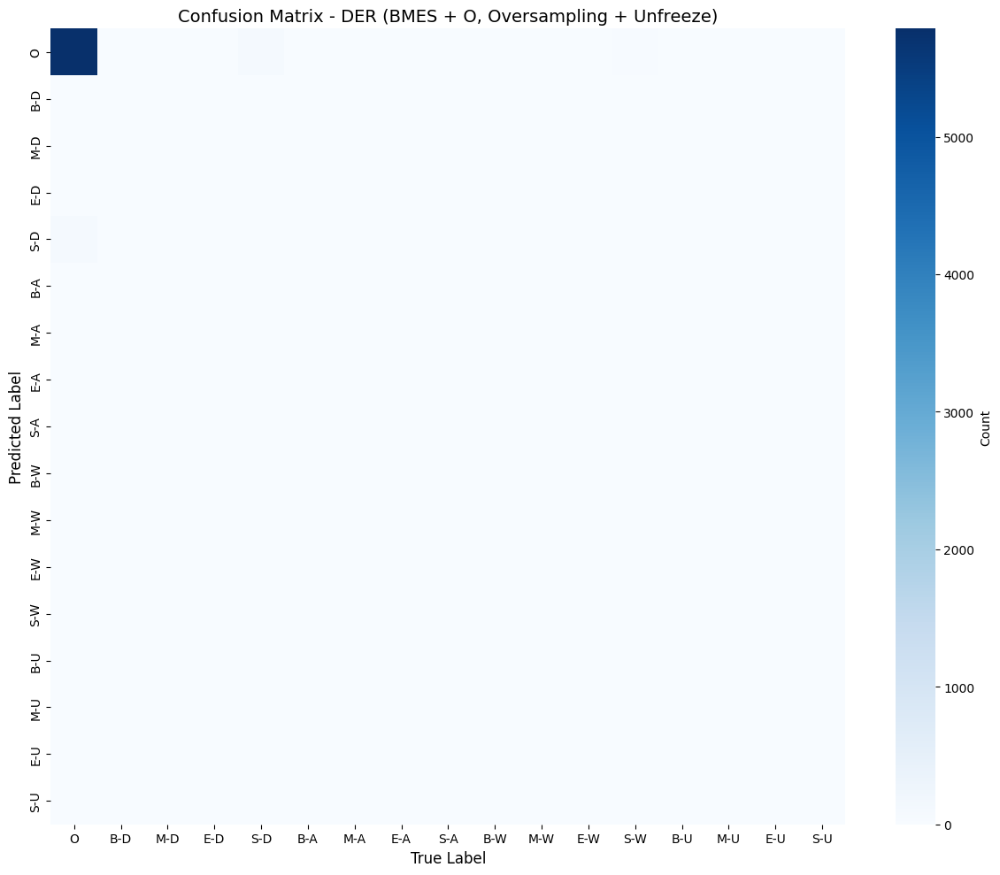

/tmp/ipython-input-4290757265.py:535: UserWarning: Glyph 21547 (\N{CJK UNIFIED IDEOGRAPH-542B}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-4290757265.py:535: UserWarning: Glyph 28961 (\N{CJK UNIFIED IDEOGRAPH-7121}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-4290757265.py:536: UserWarning: Glyph 21547 (\N{CJK UNIFIED IDEOGRAPH-542B}) missing from font(s) DejaVu Sans.
  plt.savefig(os.path.join(CONFIG["save_dir"], "training_history.png"), dpi=300, bbox_inches='tight')
/tmp/ipython-input-4290757265.py:536: UserWarning: Glyph 28961 (\N{CJK UNIFIED IDEOGRAPH-7121}) missing from font(s) DejaVu Sans.
  plt.savefig(os.path.join(CONFIG["save_dir"], "training_history.png"), dpi=300, bbox_inches='tight')
/usr/local/lib/python3.12/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 21547 (\N{CJK UNIFIED IDEOGRAPH-542B}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.12/di

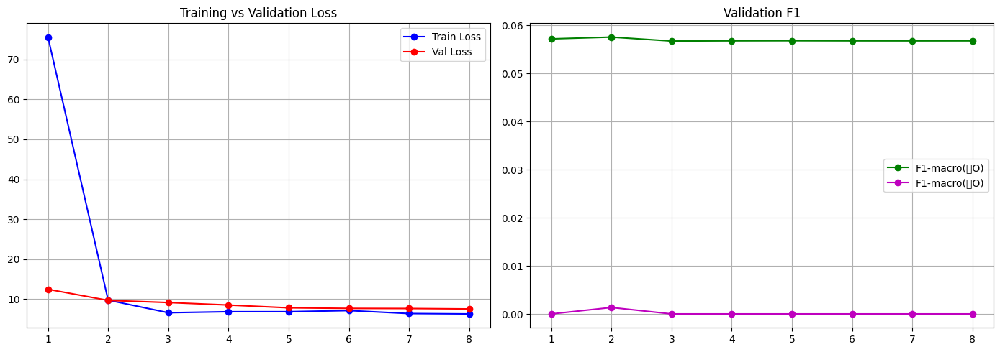


🎉 完成！輸出位於： /content/drive/MyDrive/few-shot/DER_model_BMES_os_unfreeze


In [ ]:
# ============================================================
# DER（BMES + O）＋「序列層級過採樣」＋「解凍 BERT 最後 N 層（差動學習率）」版
# 可直接在 Colab 執行
# ============================================================
# 需求：transformers, torch, pytorch-crf, sklearn, seaborn, matplotlib, tqdm, pandas, numpy, safetensors
# !pip install -q transformers torch pytorch-crf scikit-learn seaborn matplotlib tqdm pandas safetensors

import os
import csv
import re
import numpy as np
import pandas as pd
import torch
import torch.nn as nn
from torch.utils.data import Dataset, DataLoader, WeightedRandomSampler
from transformers import BertTokenizerFast, BertModel
from sklearn.metrics import f1_score, accuracy_score, classification_report, confusion_matrix
from sklearn.model_selection import train_test_split
from tqdm.auto import tqdm
import seaborn as sns
import matplotlib.pyplot as plt
from torchcrf import CRF

# ============================================================
# 1️⃣ 配置參數
# ============================================================
CONFIG = {
    # 路徑設定（請依環境調整）
    "encoder_dir": "/content/drive/MyDrive/few-shot/chinese_mentalbert_finetuned_results_simplified/final_model",
    "data_path":   "/content/drive/MyDrive/few-shot/noO_select_de.csv",
    "save_dir":    "/content/drive/MyDrive/few-shot/DER_model_BMES_os_unfreeze",

    # 模型參數
    "max_length": 128,
    "use_bilstm": False,      # True: BERT+BiLSTM+CRF
    "lstm_hidden_size": 128,
    "lstm_layers": 1,
    "dropout": 0.3,

    # 訓練參數（差動學習率）
    "num_epochs": 20,
    "early_stopping_patience": 6,
    "gradient_clip": 1.0,
    "lr_encoder": 5e-5,       # 給「被解凍的 encoder 層」
    "lr_head":    3e-4,       # 給 BiLSTM/Linear/CRF 等頭部
    "weight_decay": 0.01,
    "batch_size": 8,

    # 資料分割
    "train_ratio": 0.64,      # 0.8 * 0.8
    "val_ratio":   0.16,      # 0.8 * 0.2
    "test_ratio":  0.20,

    # **重點：資料不平衡對策**
    "use_oversampling": True,   # 啟用序列層級過採樣（依「是否包含非O token」）
    "pos_sampling_ratio": 0.8,  # 訓練抽樣時，正類序列(含DAWU)目標佔比；常用 0.5~0.8
    "unfreeze_last_n_layers": 0,# 解凍 BERT 最後 N 層；0 表示全凍結

    # 隨機種子
    "seed": 42,
}

# 固定隨機種子
torch.manual_seed(CONFIG["seed"])
np.random.seed(CONFIG["seed"])
if torch.cuda.is_available():
    torch.cuda.manual_seed_all(CONFIG["seed"])

DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"🖥️ 使用裝置: {DEVICE}")
os.makedirs(CONFIG["save_dir"], exist_ok=True)

# ============================================================
# 2️⃣ 載入微調後的 MentalBERT（支援 safetensors）
# ============================================================
def load_finetuned_encoder(encoder_dir: str):
    tok = BertTokenizerFast.from_pretrained(encoder_dir)
    enc = BertModel.from_pretrained(encoder_dir)  # 自動讀取 model.safetensors / 分片
    # 先全部凍結
    for p in enc.parameters():
        p.requires_grad = False
    enc.eval()
    return tok, enc

tokenizer, encoder = load_finetuned_encoder(CONFIG["encoder_dir"])
print("✓ 載入並凍結 Encoder 完成")

# **解凍最後 N 層（差動學習率用）**
def unfreeze_last_n_layers(encoder: BertModel, n: int = 0):
    if n <= 0:
        return []
    total_layers = encoder.config.num_hidden_layers
    target_ids = set(range(max(0, total_layers - n), total_layers))
    unfrozen_params = []
    for name, p in encoder.named_parameters():
        if any(f"encoder.layer.{i}." in name for i in target_ids) or "pooler." in name:
            p.requires_grad = True
            unfrozen_params.append(p)
    # 設定為訓練模式（只影響 LN/Dropout；BERT 內的 Dropout 在推論時不會用到）
    encoder.train()
    return unfrozen_params

unfrozen_encoder_params = unfreeze_last_n_layers(encoder, CONFIG["unfreeze_last_n_layers"])
if CONFIG["unfreeze_last_n_layers"] > 0:
    print(f"✓ 已解凍 BERT 最後 {CONFIG['unfreeze_last_n_layers']} 層，將使用差動學習率")

# ============================================================
# 3️⃣ 標籤體系：BMES + O
# ============================================================
LABEL_LIST = [
    "O",
    "B-D","M-D","E-D","S-D",
    "B-A","M-A","E-A","S-A",
    "B-W","M-W","E-W","S-W",
    "B-U","M-U","E-U","S-U",
]
label2id = {lb:i for i, lb in enumerate(LABEL_LIST)}
id2label = {i:lb for lb, i in label2id.items()}
NON_O_LABEL_IDS = [label2id[lb] for lb in LABEL_LIST if lb != "O"]

# ============================================================
# 4️⃣ 讀資料 & 邏輯：保留 BMES + O
# ============================================================
def load_data(file_path):
    df = pd.read_csv(file_path, encoding="utf-8", quoting=csv.QUOTE_ALL, on_bad_lines="warn")
    df = df[df.columns[:9].tolist()]  # 保留前 9 欄
    return df

df = load_data(CONFIG["data_path"])
VALID_PREFIX = {"B","M","E","S"}
VALID_TYPE   = {"D","A","W","U"}

def normalize_label(raw):
    if pd.isna(raw):
        return "O"
    s = str(raw).strip().upper()
    if s == "O":
        return "O"
    if "-" in s:
        pfx, typ = s.split("-", 1)
        pfx, typ = pfx.strip(), typ.strip()
        if pfx in VALID_PREFIX and typ in VALID_TYPE:
            return f"{pfx}-{typ}"
        else:
            return "O"
    if s in VALID_TYPE:  # 無BMES → 視為單字片段
        return f"S-{s}"
    return "O"

df["bmes_label"] = df["human_label"].apply(normalize_label)

print("\n標籤統計（BMES+O）:")
for lb in LABEL_LIST:
    print(f"{lb:>3}: {(df['bmes_label']==lb).sum()}")

# ============================================================
# 5️⃣ 以 post_id 分組
# ============================================================
def group_by_post(df):
    data = []
    for post_id, g in df.groupby("post_id"):
        if "word_order" in g.columns:
            g = g.sort_values("word_order")
        words  = g["word"].astype(str).tolist()
        labels = g["bmes_label"].astype(str).tolist()
        if len(words) != len(labels) or len(words) == 0:
            continue
        y_ids = [label2id.get(lb, label2id["O"]) for lb in labels]
        data.append({
            "post_id": post_id,
            "caption": g["caption"].iloc[0] if "caption" in g.columns else "",
            "words": words,
            "labels": y_ids
        })
    return data

all_data = group_by_post(df)
train_val, test_data = train_test_split(
    all_data, test_size=CONFIG["test_ratio"], random_state=CONFIG["seed"], shuffle=True
)
train_data, val_data = train_test_split(
    train_val,
    test_size=CONFIG["val_ratio"]/(1-CONFIG["test_ratio"]),
    random_state=CONFIG["seed"],
    shuffle=True
)
print(f"\n資料分割：Train={len(train_data)}  Val={len(val_data)}  Test={len(test_data)}")

# ============================================================
# 6️⃣ Dataset / DataLoader（含 Oversampling）
# ============================================================
class TokenClassificationDataset(Dataset):
    def __init__(self, data, tokenizer, max_length=128):
        self.data = data
        self.tokenizer = tokenizer
        self.max_length = max_length

    def __len__(self): return len(self.data)

    def __getitem__(self, idx):
        item = self.data[idx]
        enc = self.tokenizer(
            item["words"],
            is_split_into_words=True,
            truncation=True,
            padding="max_length",
            max_length=self.max_length,
            return_tensors="pt"
        )
        word_ids = enc.word_ids(batch_index=0)
        prev = None
        label_ids = []
        for wi in word_ids:
            if wi is None:
                label_ids.append(-100)
            elif wi != prev:
                if wi < len(item["labels"]):
                    label_ids.append(item["labels"][wi])
                else:
                    label_ids.append(-100)
            else:
                label_ids.append(-100)
            prev = wi
        enc = {k: v.squeeze(0) for k,v in enc.items()}
        enc["labels"] = torch.tensor(label_ids, dtype=torch.long)
        return enc

train_dataset = TokenClassificationDataset(train_data, tokenizer, CONFIG["max_length"])
val_dataset   = TokenClassificationDataset(val_data,   tokenizer, CONFIG["max_length"])
test_dataset  = TokenClassificationDataset(test_data,  tokenizer, CONFIG["max_length"])

# —— Oversampling（以「序列是否包含非O token」為正類）——
def build_sampler_by_pos_ratio(train_data, pos_ratio=0.7):
    O_ID = label2id["O"]
    is_pos = [any(l != O_ID for l in d["labels"]) for d in train_data]
    n_pos = sum(is_pos); n_neg = len(is_pos) - n_pos
    # 使抽樣期望：正類佔 pos_ratio，負類佔 1-pos_ratio
    w_pos = pos_ratio / max(n_pos, 1)
    w_neg = (1 - pos_ratio) / max(n_neg, 1)
    weights = [w_pos if flag else w_neg for flag in is_pos]
    return WeightedRandomSampler(weights=weights, num_samples=len(weights), replacement=True)

if CONFIG["use_oversampling"]:
    sampler = build_sampler_by_pos_ratio(train_data, CONFIG["pos_sampling_ratio"])
    train_loader = DataLoader(train_dataset, batch_size=CONFIG["batch_size"], sampler=sampler)
    print(f"✓ 啟用過採樣（pos_ratio={CONFIG['pos_sampling_ratio']}）")
else:
    train_loader = DataLoader(train_dataset, batch_size=CONFIG["batch_size"], shuffle=True)

val_loader  = DataLoader(val_dataset,  batch_size=CONFIG["batch_size"], shuffle=False)
test_loader = DataLoader(test_dataset, batch_size=CONFIG["batch_size"], shuffle=False)
print("✓ DataLoader 建立完成")

# ============================================================
# 7️⃣ 模型
# ============================================================
class DERModel(nn.Module):
    def __init__(self, encoder, num_labels, use_bilstm=False, hidden_size=128, num_layers=1, dropout=0.3):
        super().__init__()
        self.encoder = encoder
        self.use_bilstm = use_bilstm

        if use_bilstm:
            self.lstm = nn.LSTM(
                input_size=encoder.config.hidden_size,
                hidden_size=hidden_size,
                num_layers=num_layers,
                batch_first=True,
                bidirectional=True,
                dropout=dropout if num_layers > 1 else 0.0
            )
            classifier_in = hidden_size * 2
        else:
            self.lstm = None
            classifier_in = encoder.config.hidden_size

        self.dropout = nn.Dropout(dropout)
        self.classifier = nn.Linear(classifier_in, num_labels)
        self.crf = CRF(num_tags=num_labels, batch_first=True)

    def forward(self, input_ids, attention_mask, labels=None):
        enc_out = self.encoder(input_ids=input_ids, attention_mask=attention_mask)
        seq_out = enc_out.last_hidden_state  # (B,L,H)

        if self.use_bilstm:
            lstm_out, _ = self.lstm(seq_out)
            feats = self.dropout(lstm_out)
        else:
            feats = self.dropout(seq_out)

        emissions = self.classifier(feats)   # (B,L,C)
        mask = attention_mask.bool()

        if labels is not None:
            labels_crf = labels.clone()
            labels_crf[labels_crf == -100] = 0
            loss = -self.crf(emissions, labels_crf, mask=mask, reduction="mean")
            preds = self.crf.decode(emissions, mask=mask)
            return loss, preds
        else:
            preds = self.crf.decode(emissions, mask=mask)
            return preds

print("\n[模型初始化] ...")
model = DERModel(
    encoder=encoder,
    num_labels=len(LABEL_LIST),
    use_bilstm=CONFIG["use_bilstm"],
    hidden_size=CONFIG["lstm_hidden_size"],
    num_layers=CONFIG["lstm_layers"],
    dropout=CONFIG["dropout"]
).to(DEVICE)

# 參數組（差動學習率）
head_params = []
encoder_trainable_params = []
for n, p in model.named_parameters():
    if p.requires_grad:
        if n.startswith("encoder."):
            encoder_trainable_params.append(p)
        else:
            head_params.append(p)

# 若尚未將 encoder 最後 N 層設為 requires_grad=True，這裡會是空清單
if not encoder_trainable_params and CONFIG["unfreeze_last_n_layers"] > 0:
    # 安全檢查：再抓一次
    encoder_trainable_params = [p for n,p in model.named_parameters()
                                if n.startswith("encoder.") and p.requires_grad]

optimizer = torch.optim.AdamW(
    [
        {"params": head_params, "lr": CONFIG["lr_head"]},
        {"params": encoder_trainable_params, "lr": CONFIG["lr_encoder"]},
    ],
    weight_decay=CONFIG["weight_decay"]
)

scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(
    optimizer, mode="max", factor=0.5, patience=2
)
print(f"✓ Optimizer 建立（head lr={CONFIG['lr_head']}, encoder lr={CONFIG['lr_encoder']}）")

# ============================================================
# 8️⃣ 評估
# ============================================================
def evaluate(model, dataloader, desc="Evaluating"):
    model.eval()
    all_preds, all_labels = [], []
    total_loss = 0.0
    with torch.no_grad():
        for batch in tqdm(dataloader, desc=desc, leave=False):
            input_ids = batch["input_ids"].to(DEVICE)
            attention_mask = batch["attention_mask"].to(DEVICE)
            labels = batch["labels"].to(DEVICE)
            loss, preds = model(input_ids, attention_mask, labels)
            total_loss += loss.item()
            for i, pred_seq in enumerate(preds):
                valid = labels[i] != -100
                y_true = labels[i][valid].cpu().tolist()
                y_pred = pred_seq[:len(y_true)]
                all_labels.extend(y_true)
                all_preds.extend(y_pred)
    avg_loss = total_loss / max(1, len(dataloader))
    acc_all = accuracy_score(all_labels, all_preds)
    f1_macro_all = f1_score(all_labels, all_preds, average="macro", zero_division=0)
    f1_weighted_all = f1_score(all_labels, all_preds, average="weighted", zero_division=0)

    # 排除 O
    mask_non_o = [y in NON_O_LABEL_IDS for y in all_labels]
    y_true_non_o = [y for y, m in zip(all_labels, mask_non_o) if m]
    y_pred_non_o = [y for y, m in zip(all_preds,  mask_non_o) if m]
    if len(y_true_non_o) > 0:
        f1_macro_non_o = f1_score(y_true_non_o, y_pred_non_o, average="macro", zero_division=0)
        f1_weighted_non_o = f1_score(y_true_non_o, y_pred_non_o, average="weighted", zero_division=0)
    else:
        f1_macro_non_o = 0.0; f1_weighted_non_o = 0.0

    return {
        "loss": avg_loss,
        "accuracy_all": acc_all,
        "f1_macro_all": f1_macro_all,
        "f1_weighted_all": f1_weighted_all,
        "f1_macro_non_o": f1_macro_non_o,
        "f1_weighted_non_o": f1_weighted_non_o,
        "labels_all": all_labels,
        "preds_all": all_preds,
        "labels_non_o": y_true_non_o,
        "preds_non_o": y_pred_non_o,
    }

# ============================================================
# 9️⃣ 訓練
# ============================================================
print("\n[開始訓練] ...")
best_f1_non_o = 0.0
patience = 0
history = []

for epoch in range(CONFIG["num_epochs"]):
    model.train()
    train_loss = 0.0
    pbar = tqdm(train_loader, desc=f"Epoch {epoch+1}/{CONFIG['num_epochs']}")
    for batch in pbar:
        input_ids = batch["input_ids"].to(DEVICE)
        attention_mask = batch["attention_mask"].to(DEVICE)
        labels = batch["labels"].to(DEVICE)

        loss, _ = model(input_ids, attention_mask, labels)
        optimizer.zero_grad()
        loss.backward()
        torch.nn.utils.clip_grad_norm_(model.parameters(), CONFIG["gradient_clip"])
        optimizer.step()

        train_loss += loss.item()
        pbar.set_postfix(loss=f"{loss.item():.4f}")

    avg_train_loss = train_loss / max(1, len(train_loader))
    val_res = evaluate(model, val_loader, desc=f"Validating {epoch+1}")
    scheduler.step(val_res["f1_macro_non_o"])

    history.append({
        "epoch": epoch+1,
        "train_loss": avg_train_loss,
        "val_loss": val_res["loss"],
        "val_acc_all": val_res["accuracy_all"],
        "val_f1_macro_all": val_res["f1_macro_all"],
        "val_f1_weighted_all": val_res["f1_weighted_all"],
        "val_f1_macro_non_o": val_res["f1_macro_non_o"],
        "val_f1_weighted_non_o": val_res["f1_weighted_non_o"],
    })

    print(f"\nEpoch {epoch+1}: "
          f"TrainLoss={avg_train_loss:.4f} | "
          f"ValLoss={val_res['loss']:.4f} | "
          f"F1_macro(含O)={val_res['f1_macro_all']:.4f} | "
          f"F1_macro(無O)={val_res['f1_macro_non_o']:.4f}")

    # 以「排除 O 的 macro-F1」作為主早停
    if val_res["f1_macro_non_o"] > best_f1_non_o:
        best_f1_non_o = val_res["f1_macro_non_o"]
        patience = 0
        ckpt = os.path.join(CONFIG["save_dir"], "best_DER_BMES_os_unfreeze.pt")
        torch.save({
            "epoch": epoch+1,
            "model_state_dict": model.state_dict(),
            "optimizer_state_dict": optimizer.state_dict(),
            "best_f1_macro_non_o": best_f1_non_o,
            "config": CONFIG,
            "label_list": LABEL_LIST,
        }, ckpt)
        print(f"  ✅ 儲存最佳模型（Val F1-macro 無O: {best_f1_non_o:.4f}）")
    else:
        patience += 1
        print(f"  ⚠️ 未提升 ({patience}/{CONFIG['early_stopping_patience']})")
        if patience >= CONFIG["early_stopping_patience"]:
            print("⏹ 早停觸發")
            break

print("\n✓ 訓練完成")

# ============================================================
# 🔟 測試集評估
# ============================================================
print("\n[測試集評估] ...")
ckpt_path = os.path.join(CONFIG["save_dir"], "best_DER_BMES_os_unfreeze.pt")
model.load_state_dict(torch.load(ckpt_path, map_location=DEVICE)["model_state_dict"])
test_res = evaluate(model, test_loader, desc="Testing")

print("\n" + "="*60)
print("📊 測試集結果：")
print(f"  Test Loss            : {test_res['loss']:.4f}")
print(f"  Test Acc  (含O)      : {test_res['accuracy_all']:.4f}")
print(f"  Test F1-macro(含O)   : {test_res['f1_macro_all']:.4f}")
print(f"  Test F1-macro(無O)   : {test_res['f1_macro_non_o']:.4f}")
print("="*60)

# 分類報告（含 O）
report_all = classification_report(
    test_res["labels_all"], test_res["preds_all"],
    labels=list(range(len(LABEL_LIST))),
    target_names=LABEL_LIST,
    digits=4, zero_division=0
)
print("\n分類報告（含 O）：\n", report_all)

# 分類報告（無 O）
if len(test_res["labels_non_o"]) > 0:
    report_non_o = classification_report(
        test_res["labels_non_o"], test_res["preds_non_o"],
        labels=NON_O_LABEL_IDS,
        target_names=[id2label[i] for i in NON_O_LABEL_IDS],
        digits=4, zero_division=0
    )
    print("\n分類報告（無 O）：\n", report_non_o)
else:
    report_non_o = "（測試集中沒有非 O 的有效 token）"

with open(os.path.join(CONFIG["save_dir"], "classification_report_all.txt"), "w", encoding="utf-8") as f:
    f.write(report_all)
with open(os.path.join(CONFIG["save_dir"], "classification_report_noO.txt"), "w", encoding="utf-8") as f:
    f.write(report_non_o)

# ============================================================
# 1️⃣1️⃣ 混淆矩陣（含 O）
# ============================================================
cm_all = confusion_matrix(
    test_res["labels_all"], test_res["preds_all"],
    labels=list(range(len(LABEL_LIST)))
)
plt.figure(figsize=(12, 10))
sns.heatmap(
    cm_all.T, annot=False, fmt='d', cmap='Blues',
    xticklabels=LABEL_LIST, yticklabels=LABEL_LIST,
    cbar_kws={'label': 'Count'}
)
plt.xlabel('True Label', fontsize=12)
plt.ylabel('Predicted Label', fontsize=12)
plt.title('Confusion Matrix - DER (BMES + O, Oversampling + Unfreeze)', fontsize=14)
plt.tight_layout()
plt.savefig(os.path.join(CONFIG["save_dir"], "confusion_matrix_all.png"), dpi=300, bbox_inches='tight')
plt.show()

# ============================================================
# 1️⃣2️⃣ 訓練歷史
# ============================================================
if len(history) > 0:
    hist_df = pd.DataFrame(history)
    fig, ax = plt.subplots(1, 2, figsize=(14,5))
    ax[0].plot(hist_df["epoch"], hist_df["train_loss"], 'b-o', label='Train Loss')
    ax[0].plot(hist_df["epoch"], hist_df["val_loss"],   'r-o', label='Val Loss')
    ax[0].set_title('Training vs Validation Loss'); ax[0].grid(True); ax[0].legend()
    ax[1].plot(hist_df["epoch"], hist_df["val_f1_macro_all"],   'g-o', label='F1-macro(含O)')
    ax[1].plot(hist_df["epoch"], hist_df["val_f1_macro_non_o"], 'm-o', label='F1-macro(無O)')
    ax[1].set_title('Validation F1'); ax[1].grid(True); ax[1].legend()
    plt.tight_layout()
    plt.savefig(os.path.join(CONFIG["save_dir"], "training_history.png"), dpi=300, bbox_inches='tight')
    plt.show()
    hist_df.to_csv(os.path.join(CONFIG["save_dir"], "training_history.csv"), index=False)

print("\n🎉 完成！輸出位於：", CONFIG["save_dir"])


In [ ]:
import re
from sklearn.metrics import f1_score, classification_report, accuracy_score

def collapse_to_coarse_aligned(id_list, id2label, mode="DAWU+O"):
    """
    回傳 out, mask（兩者長度與 id_list 完全相同）
    - DAWU+O : out ∈ {D,A,W,U,O}；mask 全 True
    - DAWU   : out ∈ {D,A,W,U,O}；mask=True 表示 true 非 O（之後用同一個 mask 過濾）
    - SYMPvsO: out ∈ {SYMP,O}；mask 全 True
    """
    out, mask = [], []
    for y in id_list:
        name = id2label[y]  # 可能是 "O" 或 "B-D" 等
        if mode == "DAWU+O":
            if name == "O":
                out.append("O"); mask.append(True)
            else:
                m = re.match(r"^[BMES]-(D|A|W|U)$", name)
                out.append(m.group(1) if m else "O")
                mask.append(True)

        elif mode == "DAWU":
            if name == "O":
                # 這裡仍保留一個占位，確保與原長度一致；mask 用於後續過濾
                out.append("O"); mask.append(False)
            else:
                m = re.match(r"^[BMES]-(D|A|W|U)$", name)
                out.append(m.group(1) if m else "O")
                mask.append(True)

        elif mode == "SYMPvsO":
            if name == "O":
                out.append("O"); mask.append(True)
            else:
                out.append("SYMP"); mask.append(True)
        else:
            raise ValueError("Unknown mode")
    return out, mask

def apply_mask(seq, mask):
    return [v for v, keep in zip(seq, mask) if keep]

# ---------- 1) 5類（DAWU+O） ----------
y_true_5, m5 = collapse_to_coarse_aligned(test_res["labels_all"], id2label, mode="DAWU+O")
y_pred_5, _  = collapse_to_coarse_aligned(test_res["preds_all"],  id2label, mode="DAWU+O")
print("\n=== 5類（DAWU+O）===")
print("Accuracy:", accuracy_score(y_true_5, y_pred_5))
print("F1-macro:", f1_score(y_true_5, y_pred_5, average="macro", zero_division=0))
print(classification_report(y_true_5, y_pred_5,
                            labels=["D","A","W","U","O"], digits=4, zero_division=0))

# ---------- 2) 4類（只看 DAWU，排除 O；用 y_true 的 mask） ----------
y_true_4_all, m4 = collapse_to_coarse_aligned(test_res["labels_all"], id2label, mode="DAWU")
y_pred_4_all, _  = collapse_to_coarse_aligned(test_res["preds_all"],  id2label, mode="DAWU")
y_true_4 = apply_mask(y_true_4_all, m4)
y_pred_4 = apply_mask(y_pred_4_all, m4)
print("\n=== 4類（只看 D/A/W/U）===")
if len(y_true_4) > 0:
    print("F1-macro:", f1_score(y_true_4, y_pred_4, average="macro", zero_division=0))
    print(classification_report(y_true_4, y_pred_4,
                                labels=["D","A","W","U"], digits=4, zero_division=0))
else:
    print("測試集中沒有非 O 的有效 token。")

# ---------- 3) 2類（症狀 vs 非症狀） ----------
y_true_2, m2 = collapse_to_coarse_aligned(test_res["labels_all"], id2label, mode="SYMPvsO")
y_pred_2, _  = collapse_to_coarse_aligned(test_res["preds_all"],  id2label, mode="SYMPvsO")
print("\n=== 2類（SYMP vs O）===")
print("F1-macro:", f1_score(y_true_2, y_pred_2, average="macro", zero_division=0))
print(classification_report(y_true_2, y_pred_2,
                            labels=["SYMP","O"], digits=4, zero_division=0))



=== 5類（DAWU+O）===
Accuracy: 0.9407275089314713
F1-macro: 0.2045556122695149
              precision    recall  f1-score   support

           D     0.0667    0.0440    0.0530       159
           A     0.0000    0.0000    0.0000        22
           W     0.0000    0.0000    0.0000        63
           U     0.0000    0.0000    0.0000        20
           O     0.9581    0.9817    0.9697      5894

    accuracy                         0.9407      6158
   macro avg     0.2050    0.2051    0.2046      6158
weighted avg     0.9188    0.9407    0.9295      6158


=== 4類（只看 D/A/W/U）===
F1-macro: 0.016568047337278107
              precision    recall  f1-score   support

           D     0.7000    0.0440    0.0828       159
           A     0.0000    0.0000    0.0000        22
           W     0.0000    0.0000    0.0000        63
           U     0.0000    0.0000    0.0000        20

   micro avg     0.6364    0.0265    0.0509       264
   macro avg     0.1750    0.0110    0.0207       264


### 1113 改進微調版本

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 43.7/43.7 kB 2.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 43.6/43.6 kB 3.0 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 9.5/9.5 MB 32.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.6/3.6 MB 91.8 MB/s eta 0:00:00
DEVICE: cuda


/tmp/ipython-input-4107731796.py:126: DtypeWarning: Columns (10) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(fp, encoding="utf-8", quoting=csv.QUOTE_ALL, on_bad_lines="warn")


Raw rows: 67051
Posts: 489
Train=566 | Val=138 | Test=172


Some weights of BertModel were not initialized from the model checkpoint at /content/drive/MyDrive/few-shot/chinese_mentalbert_finetuned_results_simplified/final_model and are newly initialized: ['bert.pooler.dense.bias', 'bert.pooler.dense.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


Epoch 1/20:   0%|          | 0/36 [00:00<?, ?it/s]

Valid:   0%|          | 0/9 [00:00<?, ?it/s]


Epoch 1: TrainLoss=42.2293 | ValLoss=7.9140 | F1_17=0.0577 | F1_5=0.1962 | F1_2=0.4934 | Span-F1=0.0000
  ✅ Save best (F1_5=0.1962) → /content/drive/MyDrive/few-shot/DER_model_BMES_os_unfreeze/best_DER_bertcrf.pt


Epoch 2/20:   0%|          | 0/36 [00:00<?, ?it/s]

Valid:   0%|          | 0/9 [00:00<?, ?it/s]


Epoch 2: TrainLoss=10.3984 | ValLoss=6.7876 | F1_17=0.0579 | F1_5=0.2063 | F1_2=0.5059 | Span-F1=0.0053
  ✅ Save best (F1_5=0.2063) → /content/drive/MyDrive/few-shot/DER_model_BMES_os_unfreeze/best_DER_bertcrf.pt


Epoch 3/20:   0%|          | 0/36 [00:00<?, ?it/s]

Valid:   0%|          | 0/9 [00:00<?, ?it/s]


Epoch 3: TrainLoss=8.4031 | ValLoss=6.2805 | F1_17=0.0674 | F1_5=0.2063 | F1_2=0.5113 | Span-F1=0.0102
  ✅ Save best (F1_5=0.2063) → /content/drive/MyDrive/few-shot/DER_model_BMES_os_unfreeze/best_DER_bertcrf.pt


Epoch 4/20:   0%|          | 0/36 [00:00<?, ?it/s]

Valid:   0%|          | 0/9 [00:00<?, ?it/s]


Epoch 4: TrainLoss=6.7241 | ValLoss=6.2257 | F1_17=0.0587 | F1_5=0.2066 | F1_2=0.5155 | Span-F1=0.0143
  ✅ Save best (F1_5=0.2066) → /content/drive/MyDrive/few-shot/DER_model_BMES_os_unfreeze/best_DER_bertcrf.pt


Epoch 5/20:   0%|          | 0/36 [00:00<?, ?it/s]

Valid:   0%|          | 0/9 [00:00<?, ?it/s]


Epoch 5: TrainLoss=5.0336 | ValLoss=6.3207 | F1_17=0.0587 | F1_5=0.2065 | F1_2=0.5136 | Span-F1=0.0144
  ⚠️ No improve (1/6)


Epoch 6/20:   0%|          | 0/36 [00:00<?, ?it/s]

Valid:   0%|          | 0/9 [00:00<?, ?it/s]


Epoch 6: TrainLoss=4.6906 | ValLoss=6.6759 | F1_17=0.0584 | F1_5=0.2079 | F1_2=0.5060 | Span-F1=0.0107
  ✅ Save best (F1_5=0.2079) → /content/drive/MyDrive/few-shot/DER_model_BMES_os_unfreeze/best_DER_bertcrf.pt


Epoch 7/20:   0%|          | 0/36 [00:00<?, ?it/s]

Valid:   0%|          | 0/9 [00:00<?, ?it/s]


Epoch 7: TrainLoss=4.1488 | ValLoss=6.4189 | F1_17=0.0590 | F1_5=0.2128 | F1_2=0.5193 | Span-F1=0.0158
  ✅ Save best (F1_5=0.2128) → /content/drive/MyDrive/few-shot/DER_model_BMES_os_unfreeze/best_DER_bertcrf.pt


Epoch 8/20:   0%|          | 0/36 [00:00<?, ?it/s]

Valid:   0%|          | 0/9 [00:00<?, ?it/s]


Epoch 8: TrainLoss=3.4262 | ValLoss=6.7246 | F1_17=0.0616 | F1_5=0.2150 | F1_2=0.5107 | Span-F1=0.0151
  ✅ Save best (F1_5=0.2150) → /content/drive/MyDrive/few-shot/DER_model_BMES_os_unfreeze/best_DER_bertcrf.pt


Epoch 9/20:   0%|          | 0/36 [00:00<?, ?it/s]

Valid:   0%|          | 0/9 [00:00<?, ?it/s]


Epoch 9: TrainLoss=2.8464 | ValLoss=7.2907 | F1_17=0.0624 | F1_5=0.2136 | F1_2=0.5116 | Span-F1=0.0167
  ⚠️ No improve (1/6)


Epoch 10/20:   0%|          | 0/36 [00:00<?, ?it/s]

Valid:   0%|          | 0/9 [00:00<?, ?it/s]


Epoch 10: TrainLoss=2.4207 | ValLoss=6.7941 | F1_17=0.0682 | F1_5=0.2167 | F1_2=0.5169 | Span-F1=0.0235
  ✅ Save best (F1_5=0.2167) → /content/drive/MyDrive/few-shot/DER_model_BMES_os_unfreeze/best_DER_bertcrf.pt


Epoch 11/20:   0%|          | 0/36 [00:00<?, ?it/s]

Valid:   0%|          | 0/9 [00:00<?, ?it/s]


Epoch 11: TrainLoss=2.2110 | ValLoss=7.2674 | F1_17=0.0617 | F1_5=0.2107 | F1_2=0.5139 | Span-F1=0.0195
  ⚠️ No improve (1/6)


Epoch 12/20:   0%|          | 0/36 [00:00<?, ?it/s]

Valid:   0%|          | 0/9 [00:00<?, ?it/s]


Epoch 12: TrainLoss=1.9641 | ValLoss=7.8136 | F1_17=0.0623 | F1_5=0.2134 | F1_2=0.5120 | Span-F1=0.0209
  ⚠️ No improve (2/6)


Epoch 13/20:   0%|          | 0/36 [00:00<?, ?it/s]

Valid:   0%|          | 0/9 [00:00<?, ?it/s]


Epoch 13: TrainLoss=1.5676 | ValLoss=7.7747 | F1_17=0.0625 | F1_5=0.2132 | F1_2=0.5132 | Span-F1=0.0203
  ⚠️ No improve (3/6)


Epoch 14/20:   0%|          | 0/36 [00:00<?, ?it/s]

Valid:   0%|          | 0/9 [00:00<?, ?it/s]


Epoch 14: TrainLoss=1.4787 | ValLoss=8.2543 | F1_17=0.0620 | F1_5=0.2124 | F1_2=0.5148 | Span-F1=0.0171
  ⚠️ No improve (4/6)


Epoch 15/20:   0%|          | 0/36 [00:00<?, ?it/s]

Valid:   0%|          | 0/9 [00:00<?, ?it/s]


Epoch 15: TrainLoss=1.2965 | ValLoss=7.8332 | F1_17=0.0680 | F1_5=0.2155 | F1_2=0.5182 | Span-F1=0.0154
  ⚠️ No improve (5/6)


Epoch 16/20:   0%|          | 0/36 [00:00<?, ?it/s]

Valid:   0%|          | 0/9 [00:00<?, ?it/s]


Epoch 16: TrainLoss=1.1022 | ValLoss=7.9406 | F1_17=0.0622 | F1_5=0.2126 | F1_2=0.5156 | Span-F1=0.0204
  ⚠️ No improve (6/6)
⏹ Early stopping


Test:   0%|          | 0/11 [00:00<?, ?it/s]


📊 Test (Token-level)
Loss     : 9.5967
Acc(17)  : 0.9497
F1(17)   : 0.0642
F1(5)    : 0.2071  <-- 主觀察（離開O能力）
F1(2)    : 0.5162
Span-F1  : 0.0354

17類（BMES+O） 分類報告：
              precision    recall  f1-score   support

           O     0.9716    0.9776    0.9746     11506
         B-D     0.0000    0.0000    0.0000        25
         M-D     0.0000    0.0000    0.0000         9
         E-D     0.0000    0.0000    0.0000        22
         S-D     0.0506    0.0552    0.0528       163
         B-A     0.0000    0.0000    0.0000         4
         M-A     0.0000    0.0000    0.0000         0
         E-A     0.0000    0.0000    0.0000         4
         S-A     0.0000    0.0000    0.0000        16
         B-W     0.0000    0.0000    0.0000        14
         M-W     0.0000    0.0000    0.0000         5
         E-W     0.0000    0.0000    0.0000        14
         S-W     0.0000    0.0000    0.0000        43
         B-U     0.0000    0.0000    0.0000         8
         M-U     0.0000 

/tmp/ipython-input-4107731796.py:505: UserWarning: Glyph 39006 (\N{CJK UNIFIED IDEOGRAPH-985E}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-4107731796.py:505: UserWarning: Glyph 65288 (\N{FULLWIDTH LEFT PARENTHESIS}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-4107731796.py:505: UserWarning: Glyph 65289 (\N{FULLWIDTH RIGHT PARENTHESIS}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-4107731796.py:507: UserWarning: Glyph 39006 (\N{CJK UNIFIED IDEOGRAPH-985E}) missing from font(s) DejaVu Sans.
  plt.savefig(path, dpi=300); plt.show()
/tmp/ipython-input-4107731796.py:507: UserWarning: Glyph 65288 (\N{FULLWIDTH LEFT PARENTHESIS}) missing from font(s) DejaVu Sans.
  plt.savefig(path, dpi=300); plt.show()
/tmp/ipython-input-4107731796.py:507: UserWarning: Glyph 65289 (\N{FULLWIDTH RIGHT PARENTHESIS}) missing from font(s) DejaVu Sans.
  plt.savefig(path, dpi=300); plt.show()
/usr/local/lib/python3.12/dist-p

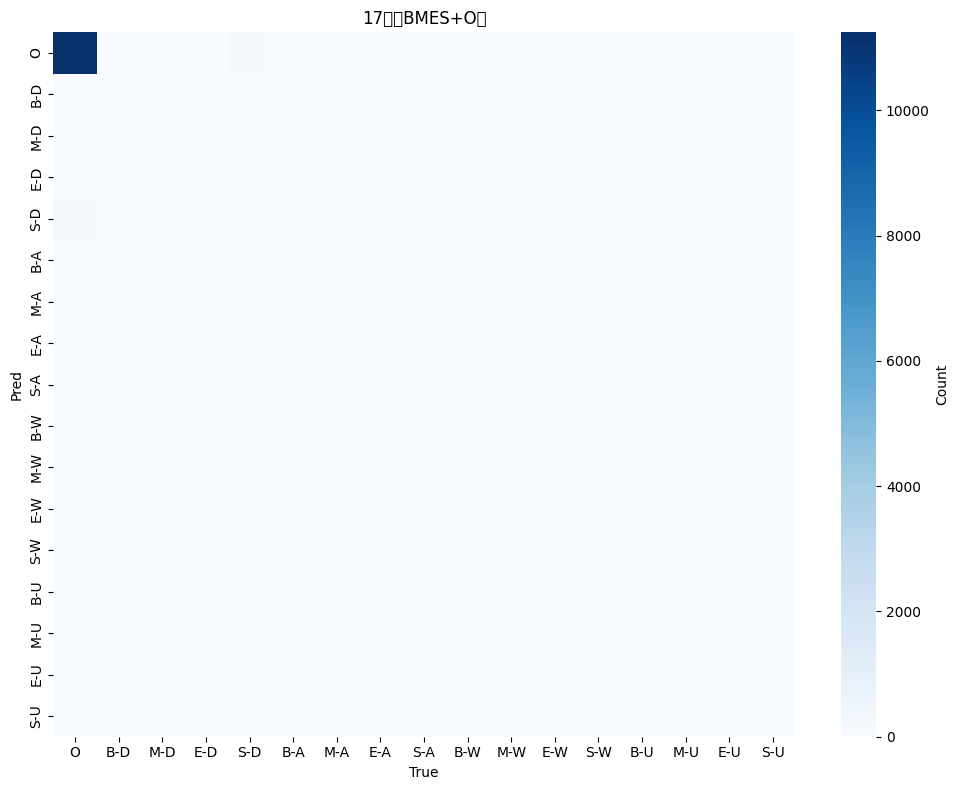

✓ 混淆矩陣存至: /content/drive/MyDrive/few-shot/DER_model_BMES_os_unfreeze/cm_17.png

5類（DAWU+O） 分類報告：
              precision    recall  f1-score   support

           O     0.9716    0.9776    0.9746     11506
           D     0.0622    0.0594    0.0607       219
           A     0.0000    0.0000    0.0000        24
           W     0.0000    0.0000    0.0000        76
           U     0.0000    0.0000    0.0000        28

    accuracy                         0.9501     11853
   macro avg     0.2068    0.2074    0.2071     11853
weighted avg     0.9443    0.9501    0.9472     11853



/tmp/ipython-input-4107731796.py:505: UserWarning: Glyph 39006 (\N{CJK UNIFIED IDEOGRAPH-985E}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-4107731796.py:505: UserWarning: Glyph 65288 (\N{FULLWIDTH LEFT PARENTHESIS}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-4107731796.py:505: UserWarning: Glyph 65289 (\N{FULLWIDTH RIGHT PARENTHESIS}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-4107731796.py:507: UserWarning: Glyph 39006 (\N{CJK UNIFIED IDEOGRAPH-985E}) missing from font(s) DejaVu Sans.
  plt.savefig(path, dpi=300); plt.show()
/tmp/ipython-input-4107731796.py:507: UserWarning: Glyph 65288 (\N{FULLWIDTH LEFT PARENTHESIS}) missing from font(s) DejaVu Sans.
  plt.savefig(path, dpi=300); plt.show()
/tmp/ipython-input-4107731796.py:507: UserWarning: Glyph 65289 (\N{FULLWIDTH RIGHT PARENTHESIS}) missing from font(s) DejaVu Sans.
  plt.savefig(path, dpi=300); plt.show()
/usr/local/lib/python3.12/dist-p

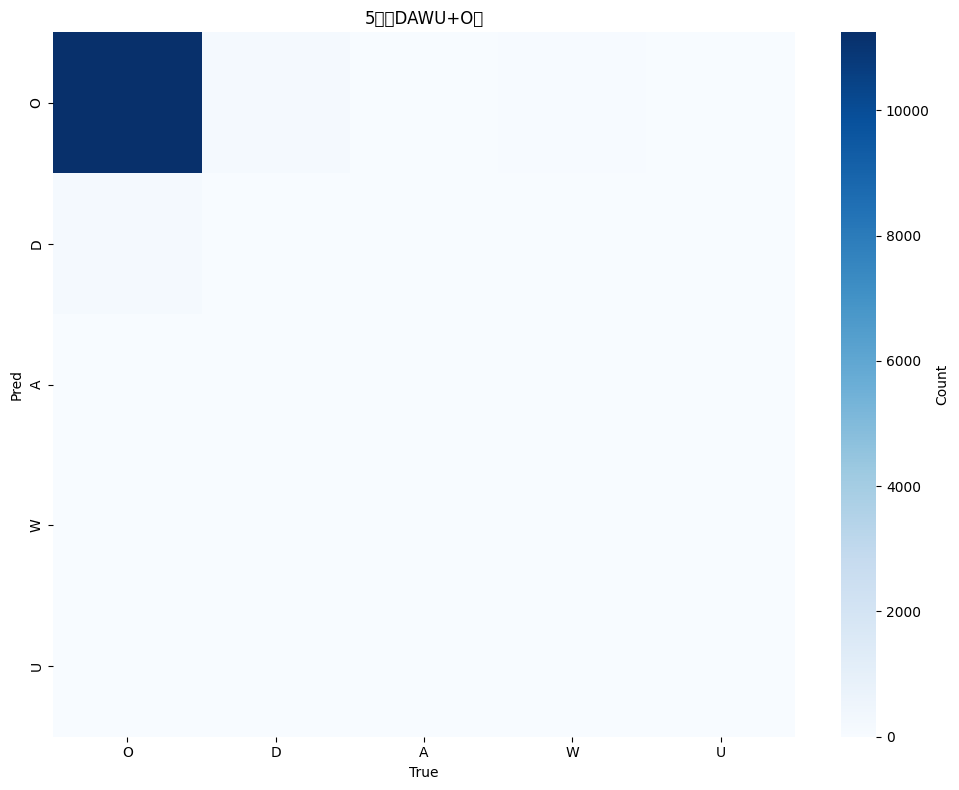

✓ 混淆矩陣存至: /content/drive/MyDrive/few-shot/DER_model_BMES_os_unfreeze/cm_5.png

2類（SYM vs O） 分類報告：
              precision    recall  f1-score   support

           O     0.9716    0.9776    0.9746     11506
         SYM     0.0652    0.0519    0.0578       347

    accuracy                         0.9505     11853
   macro avg     0.5184    0.5147    0.5162     11853
weighted avg     0.9450    0.9505    0.9477     11853



/tmp/ipython-input-4107731796.py:505: UserWarning: Glyph 39006 (\N{CJK UNIFIED IDEOGRAPH-985E}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-4107731796.py:505: UserWarning: Glyph 65288 (\N{FULLWIDTH LEFT PARENTHESIS}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-4107731796.py:505: UserWarning: Glyph 65289 (\N{FULLWIDTH RIGHT PARENTHESIS}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-4107731796.py:507: UserWarning: Glyph 39006 (\N{CJK UNIFIED IDEOGRAPH-985E}) missing from font(s) DejaVu Sans.
  plt.savefig(path, dpi=300); plt.show()
/tmp/ipython-input-4107731796.py:507: UserWarning: Glyph 65288 (\N{FULLWIDTH LEFT PARENTHESIS}) missing from font(s) DejaVu Sans.
  plt.savefig(path, dpi=300); plt.show()
/tmp/ipython-input-4107731796.py:507: UserWarning: Glyph 65289 (\N{FULLWIDTH RIGHT PARENTHESIS}) missing from font(s) DejaVu Sans.
  plt.savefig(path, dpi=300); plt.show()
/usr/local/lib/python3.12/dist-p

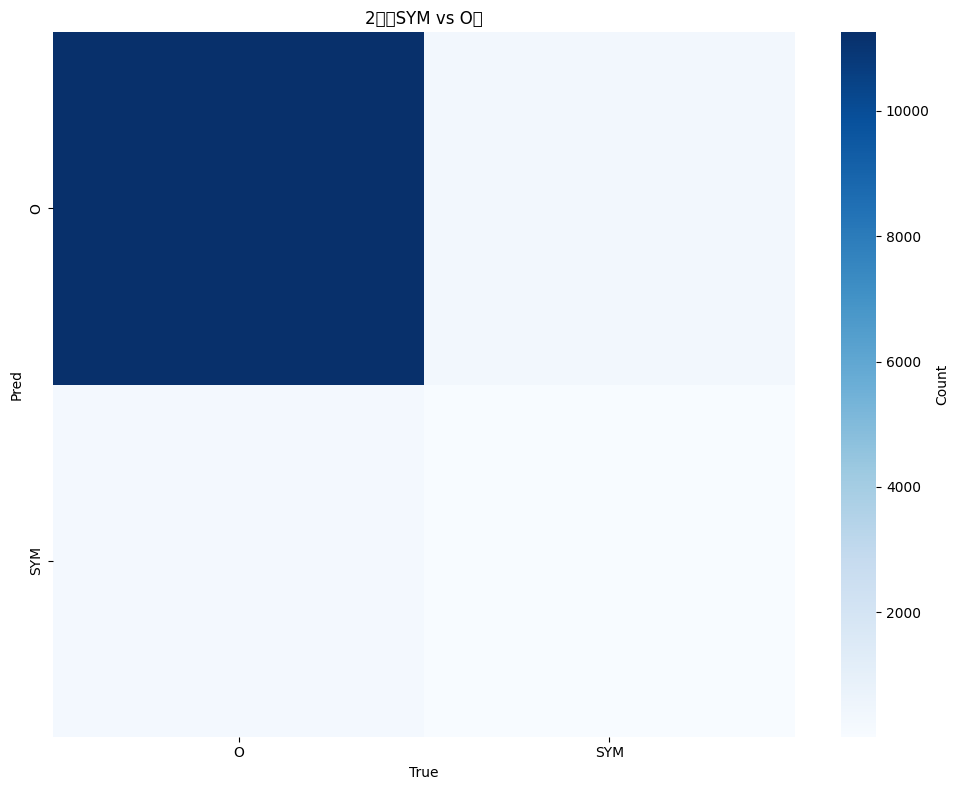

✓ 混淆矩陣存至: /content/drive/MyDrive/few-shot/DER_model_BMES_os_unfreeze/cm_2.png


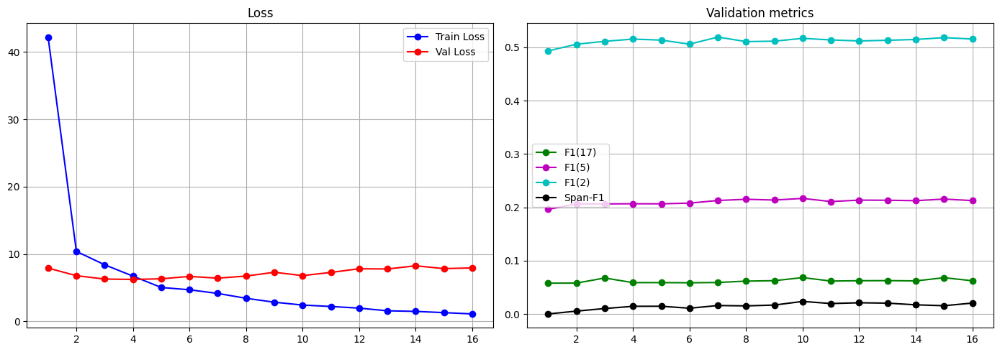

✓ 訓練曲線/CSV 已輸出

🎉 完成！結果輸出於： /content/drive/MyDrive/few-shot/DER_model_BMES_os_unfreeze


In [ ]:
# ============================================
# Colab 一鍵版：BERT(+BiLSTM)+CRF 的 DER
# 視窗化 + 強化過採樣 + 解凍 + 2/5/17 同評 + span-F1
# 直接在 Colab 執行即可
# ============================================

# ---- 0. 安裝套件（第一次執行需要） ----
!pip -q install transformers==4.44.2 torchcrf==1.1.0 seqeval==1.2.2

# ---- 1. 匯入 ----
import os, csv, math, random, itertools
from collections import Counter, defaultdict
import numpy as np
import pandas as pd
from tqdm.auto import tqdm

import torch
import torch.nn as nn
from torch.utils.data import Dataset, DataLoader, WeightedRandomSampler

from transformers import BertTokenizerFast, BertModel
from torchcrf import CRF

from sklearn.metrics import accuracy_score, f1_score, classification_report, confusion_matrix
from seqeval.metrics import f1_score as seq_f1
import matplotlib.pyplot as plt
import seaborn as sns

# ---- 2. 設定 ----
CONFIG = {
    # 路徑設定（請依環境調整）
    "encoder_dir": "/content/drive/MyDrive/few-shot/chinese_mentalbert_finetuned_results_simplified/final_model",
    "data_path":   "/content/drive/MyDrive/few-shot/noO_select_de.csv",
    "save_dir":    "/content/drive/MyDrive/few-shot/DER_model_BMES_os_unfreeze",

    # 視窗化（長文切片）
    "use_windowing": True,
    "window_size": 128,
    "window_stride": 96,   # 覆蓋式視窗，避免切斷 BMES

    # max_length（若關閉視窗化，請加大到 256 以避免截斷）
    "max_length": 128,

    # 過採樣（依非O密度連續加權）
    "use_oversampling": True,
    "weight_floor": 0.05,  # 非O密度權重下限
    "weight_gamma": 0.5,   # 密度曲線的冪次

    # 模型結構
    "use_bilstm": True,    # 在 BERT 之後加 BiLSTM 再接 CRF（推薦 True）
    "lstm_hidden": 128,
    "lstm_layers": 1,
    "dropout": 0.3,

    # 解凍策略
    "unfreeze_last_n_layers": 2,   # 解凍 BERT 後 N 層（0=全凍結）
    "lr_encoder": 5e-5,            # 被解凍的 encoder 層學習率
    "lr_head": 3e-4,               # 頭部（BiLSTM/Linear/CRF）學習率

    # 訓練參數
    "batch_size": 16,
    "num_epochs": 20,
    "patience": 4,                 # ReduceLROnPlateau patience
    "early_stopping_patience": 6,
    "gradient_clip": 1.0,
    "weight_decay": 1e-2,
    "seed": 42,

    # 資料切分
    "test_ratio": 0.2,   # test
    "val_ratio": 0.2     # of train_val
}

os.makedirs(CONFIG["save_dir"], exist_ok=True)
random.seed(CONFIG["seed"]); np.random.seed(CONFIG["seed"]); torch.manual_seed(CONFIG["seed"])
DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print("DEVICE:", DEVICE)

# ---- 3. 標籤系統：BMES×{D,A,W,U}+O (17類) ----
LABELS_17 = [
    "O",
    "B-D","M-D","E-D","S-D",
    "B-A","M-A","E-A","S-A",
    "B-W","M-W","E-W","S-W",
    "B-U","M-U","E-U","S-U",
]
label2id = {lb:i for i,lb in enumerate(LABELS_17)}
id2label = {i:lb for lb,i in label2id.items()}

# 5類：DAWU+O
LABELS_5 = ["O","D","A","W","U"]
lab5_2id = {lb:i for i,lb in enumerate(LABELS_5)}
id2lab5 = {i:lb for lb,i in lab5_2id.items()}

# 2類：SYM(=DAWU) vs O
LABELS_2 = ["O","SYM"]
lab2_2id = {lb:i for i,lb in enumerate(LABELS_2)}
id2lab2 = {i:lb for lb,i in lab2_2id.items()}

VALID_PREFIX = {"B","M","E","S"}
VALID_TYPE   = {"D","A","W","U"}
def normalize_bmes(raw):
    if pd.isna(raw): return "O"
    s = str(raw).strip().upper()
    if s=="O": return "O"
    if "-" in s:
        pfx,typ = s.split("-",1)
        pfx,typ = pfx.strip(), typ.strip()
        if pfx in VALID_PREFIX and typ in VALID_TYPE:
            return f"{pfx}-{typ}"
        return "O"
    if s in VALID_TYPE:
        return f"S-{s}"
    return "O"

def bmes_to_5(tag):
    if tag=="O": return "O"
    _, typ = tag.split("-",1)
    return typ if typ in {"D","A","W","U"} else "O"

def bmes_to_2(tag):
    return "O" if tag=="O" else "SYM"

# ---- 4. 載入資料、依 post_id 分組、（可選）視窗化 ----
def load_data(fp):
    df = pd.read_csv(fp, encoding="utf-8", quoting=csv.QUOTE_ALL, on_bad_lines="warn")
    df = df[df.columns[:9].tolist()]  # 與你原流程一致
    df["bmes"] = df["human_label"].apply(normalize_bmes)
    return df

df = load_data(CONFIG["data_path"])
print("Raw rows:", len(df))

def group_by_post(df):
    data=[]
    for pid,g in df.groupby("post_id"):
        if "word_order" in g.columns: g = g.sort_values("word_order")
        words  = g["word"].astype(str).tolist()
        labels = g["bmes"].astype(str).tolist()
        if len(words)==0 or len(words)!=len(labels): continue
        data.append({"post_id": str(pid), "words": words, "labels": [label2id.get(t,0) for t in labels]})
    return data

all_data = group_by_post(df)
print("Posts:", len(all_data))

# 依 post_id 切分
from sklearn.model_selection import train_test_split
train_val, test_data = train_test_split(all_data, test_size=CONFIG["test_ratio"], random_state=CONFIG["seed"], shuffle=True)
train_data, val_data = train_test_split(train_val, test_size=CONFIG["val_ratio"], random_state=CONFIG["seed"], shuffle=True)

# 視窗化
def windowize(words, labels, win=128, stride=96):
    L = len(words)
    if L<=win: return [(words, labels)]
    out=[]; i=0
    while i<L:
        j=min(i+win, L)
        out.append((words[i:j], labels[i:j]))
        if j==L: break
        i+=stride
    return out

def build_windowed_dataset(raw, win, stride):
    data=[]
    for d in raw:
        for w_words, w_labels in windowize(d["words"], d["labels"], win, stride):
            data.append({"post_id": d["post_id"], "words": w_words, "labels": w_labels})
    return data

if CONFIG["use_windowing"]:
    train_data = build_windowed_dataset(train_data, CONFIG["window_size"], CONFIG["window_stride"])
    val_data   = build_windowed_dataset(val_data,   CONFIG["window_size"], CONFIG["window_stride"])
    test_data  = build_windowed_dataset(test_data,  CONFIG["window_size"], CONFIG["window_stride"])

print(f"Train={len(train_data)} | Val={len(val_data)} | Test={len(test_data)}")

# ---- 5. Tokenizer/Encoder ----
tokenizer = BertTokenizerFast.from_pretrained(CONFIG["encoder_dir"])
encoder   = BertModel.from_pretrained(CONFIG["encoder_dir"])

# 解凍最後 N 層
def unfreeze_last_n_layers(encoder, n=0):
    for p in encoder.parameters():
        p.requires_grad = False
    if n<=0:
        encoder.eval()
        return
    L = encoder.config.num_hidden_layers
    target_layers = set(range(L-n, L))
    for name,p in encoder.named_parameters():
        if any(f"encoder.layer.{i}." in name for i in target_layers) or "pooler." in name:
            p.requires_grad = True
    encoder.train()

unfreeze_last_n_layers(encoder, CONFIG["unfreeze_last_n_layers"])

# ---- 6. Dataset/Collate ----
class TokenClsDataset(Dataset):
    def __init__(self, data, tokenizer, max_length=128):
        self.data=data; self.tok=tokenizer; self.max_length=max_length
    def __len__(self): return len(self.data)
    def __getitem__(self, idx):
        item = self.data[idx]
        enc = self.tok(
            item["words"],
            is_split_into_words=True,
            truncation=True,
            padding="max_length",
            max_length=self.max_length,
            return_offsets_mapping=False,
            return_tensors="pt"
        )
        word_ids = enc.word_ids()
        labels_ids=[]
        prev=None
        for w_idx in word_ids:
            if w_idx is None:
                labels_ids.append(-100)
            elif w_idx!=prev:
                if w_idx < len(item["labels"]):
                    labels_ids.append(item["labels"][w_idx])
                else:
                    labels_ids.append(-100)
            else:
                # 後續 subword 不訓練
                labels_ids.append(-100)
            prev = w_idx
        enc = {k:v.squeeze(0) for k,v in enc.items()}
        enc["labels"] = torch.tensor(labels_ids, dtype=torch.long)
        return enc

train_ds = TokenClsDataset(train_data, tokenizer, CONFIG["max_length"])
val_ds   = TokenClsDataset(val_data,   tokenizer, CONFIG["max_length"])
test_ds  = TokenClsDataset(test_data,  tokenizer, CONFIG["max_length"])

# 連續權重過採樣（依非O密度）
O_ID = label2id["O"]
def seq_weights_by_nonO_ratio(raw_data, floor=0.05, gamma=0.5):
    w=[]
    for d in raw_data:
        r = sum(1 for t in d["labels"] if t!=O_ID)/max(1,len(d["labels"]))
        w.append(floor + (r**gamma))
    s=sum(w); return [x/s for x in w]

if CONFIG["use_oversampling"]:
    weights = seq_weights_by_nonO_ratio(train_data, CONFIG["weight_floor"], CONFIG["weight_gamma"])
    sampler = WeightedRandomSampler(weights=weights, num_samples=len(weights), replacement=True)
    train_loader = DataLoader(train_ds, batch_size=CONFIG["batch_size"], sampler=sampler)
else:
    train_loader = DataLoader(train_ds, batch_size=CONFIG["batch_size"], shuffle=True)

val_loader  = DataLoader(val_ds,  batch_size=CONFIG["batch_size"], shuffle=False)
test_loader = DataLoader(test_ds, batch_size=CONFIG["batch_size"], shuffle=False)

# ---- 7. 模型：BERT → (BiLSTM) → Linear → CRF ----
class BERT_BiLSTM_CRF(nn.Module):
    def __init__(self, encoder, num_labels, use_bilstm=True, hidden=128, layers=1, dropout=0.3):
        super().__init__()
        self.encoder = encoder
        self.use_bilstm = use_bilstm
        hd = encoder.config.hidden_size
        if use_bilstm:
            self.lstm = nn.LSTM(
                input_size=hd, hidden_size=hidden, num_layers=layers,
                batch_first=True, bidirectional=True, dropout=dropout if layers>1 else 0.0
            )
            cls_in = hidden*2
        else:
            self.lstm = None
            cls_in = hd
        self.drop = nn.Dropout(dropout)
        self.fc   = nn.Linear(cls_in, num_labels)
        self.crf  = CRF(num_labels, batch_first=True)

    def forward(self, input_ids, attention_mask, labels=None):
        # 允許被解凍層梯度流
        outputs = self.encoder(input_ids=input_ids, attention_mask=attention_mask)
        x = outputs.last_hidden_state
        if self.use_bilstm:
            x,_ = self.lstm(x)
        x = self.drop(x)
        emissions = self.fc(x)
        mask = attention_mask.bool()
        if labels is not None:
            # 把 -100 換成 0（CRF 不接受 -100），並在 mask 中忽略
            y = labels.clone()
            y[y==-100] = 0
            loss = -self.crf(emissions, y, mask=mask, reduction="mean")
            preds = self.crf.decode(emissions, mask=mask)
            return loss, preds
        else:
            preds = self.crf.decode(emissions, mask=mask)
            return preds

model = BERT_BiLSTM_CRF(
    encoder=encoder, num_labels=len(LABELS_17),
    use_bilstm=CONFIG["use_bilstm"], hidden=CONFIG["lstm_hidden"],
    layers=CONFIG["lstm_layers"], dropout=CONFIG["dropout"]
).to(DEVICE)

# 參數群組：被解凍的 encoder vs head
enc_params = [p for n,p in model.named_parameters() if n.startswith("encoder.") and p.requires_grad]
head_params= [p for n,p in model.named_parameters() if (not n.startswith("encoder.")) and p.requires_grad]

optimizer = torch.optim.AdamW([
    {"params": enc_params, "lr": CONFIG["lr_encoder"]},
    {"params": head_params, "lr": CONFIG["lr_head"]}
], weight_decay=CONFIG["weight_decay"])

scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode="max", factor=0.5, patience=CONFIG["patience"])

# ---- 8. 評估工具：17/5/2 類 + span-F1 ----
def to_5_ids(ids17):
    return [lab5_2id[bmes_to_5(id2label[i])] for i in ids17]

def to_2_ids(ids17):
    return [lab2_2id[bmes_to_2(id2label[i])] for i in ids17]

def decode_spans_bmes(tag_seq):
    # 回傳 (type, start, end)；B..M..E；S 為單點；O跳過
    spans=[]
    cur_type=None; start=None
    for i,tag in enumerate(tag_seq):
        if tag=="O":
            if cur_type is not None:
                # 未正常以 E 結束，視為 E-*
                spans.append((cur_type, start, i-1))
                cur_type=None; start=None
            continue
        pfx,typ = tag.split("-",1)
        if pfx=="S":
            spans.append((typ, i, i))
            cur_type=None; start=None
        elif pfx=="B":
            if cur_type is not None:
                spans.append((cur_type, start, i-1))
            cur_type=typ; start=i
        elif pfx=="M":
            # 需在一個開啟的 span 中
            if cur_type is None:  # 修正破格情況，視為 B
                cur_type=typ; start=i
        elif pfx=="E":
            if cur_type is None:
                cur_type=typ; start=i
            spans.append((typ, start, i))
            cur_type=None; start=None
    if cur_type is not None:
        spans.append((cur_type, start, len(tag_seq)-1))
    return spans

def span_f1_17(true_tags_17, pred_tags_17):
    # 逐序列計算，再 micro 聚合
    tp=0; fp=0; fn=0
    for y_true, y_pred in zip(true_tags_17, pred_tags_17):
        T = decode_spans_bmes(y_true)
        P = decode_spans_bmes(y_pred)
        T_set = set(T); P_set = set(P)
        tp += len(T_set & P_set)
        fp += len(P_set - T_set)
        fn += len(T_set - P_set)
    prec = tp / max(1,(tp+fp))
    rec  = tp / max(1,(tp+fn))
    f1   = 2*prec*rec / max(1e-12,(prec+rec))
    return prec, rec, f1

@torch.no_grad()
def evaluate(model, loader, desc="Eval"):
    model.eval()
    all_true_17, all_pred_17 = [], []
    total_loss=0.0; nb=0
    for batch in tqdm(loader, desc=desc, leave=False):
        input_ids = batch["input_ids"].to(DEVICE)
        attention_mask = batch["attention_mask"].to(DEVICE)
        labels = batch["labels"].to(DEVICE)
        loss, preds = model(input_ids, attention_mask, labels=labels)
        total_loss += loss.item(); nb+=1

        for i, pred_seq in enumerate(preds):
            valid = (labels[i] != -100).cpu().numpy()
            y_t = labels[i].detach().cpu().numpy()[valid].tolist()
            y_p = pred_seq[:len(y_t)]
            all_true_17.extend(y_t)
            all_pred_17.extend(y_p)

    # token-level 17類
    acc_17  = accuracy_score(all_true_17, all_pred_17)
    f1_17   = f1_score(all_true_17, all_pred_17, average="macro", zero_division=0)

    # token-level 5/2 類
    y_true_5 = to_5_ids(all_true_17); y_pred_5 = to_5_ids(all_pred_17)
    y_true_2 = to_2_ids(all_true_17); y_pred_2 = to_2_ids(all_pred_17)
    f1_5  = f1_score(y_true_5, y_pred_5, average="macro", zero_division=0)
    f1_2  = f1_score(y_true_2, y_pred_2, average="macro", zero_division=0)

    # span-F1（以 17 類 BMES 邏輯解碼）
    # 需要把序列重建：簡化方式—把平鋪的 token 還原為一條條（這裡做近似：按 batch 一次處理）
    # 為避免複雜，我們在驗證/測試時計算「micro」span-F1：把每個 batch 的有效 token 直接視為一條序列
    # 更嚴謹可在 Dataset 返回原始長度以重建；此處給簡潔近似
    # 近似做法：將平鋪序列視為一長串，分隔符不計。用此近似觀察趨勢即可。
    # 若要嚴格 per-post span-F1，可在 Dataset 蒐集每條序列長度再拆分計算。
    true_tags = [id2label[i] for i in all_true_17]
    pred_tags = [id2label[i] for i in all_pred_17]
    # 切成固定長度段落來近似（避免整段太長），例如每 200 token 一段
    seg=200
    true_seqs=[true_tags[i:i+seg] for i in range(0,len(true_tags),seg)]
    pred_seqs=[pred_tags[i:i+seg] for i in range(0,len(pred_tags),seg)]
    p_span, r_span, f1_span = span_f1_17(true_seqs, pred_seqs)

    return {
        "loss": total_loss/max(1,nb),
        "acc_17": acc_17,
        "f1_17": f1_17,
        "f1_5":  f1_5,
        "f1_2":  f1_2,
        "span_p": p_span, "span_r": r_span, "span_f1": f1_span,
        "y_true_17": all_true_17, "y_pred_17": all_pred_17
    }

# ---- 9. 訓練 ----
best_f1_nonO = 0.0   # 監控：以 5 類 macro-F1 作為主指標（等權重 & 可反映離開 O）
patience=0
history=[]

for epoch in range(1, CONFIG["num_epochs"]+1):
    model.train()
    tr_loss=0.0; nb=0
    pbar = tqdm(train_loader, desc=f"Epoch {epoch}/{CONFIG['num_epochs']}")
    for batch in pbar:
        input_ids = batch["input_ids"].to(DEVICE)
        attention_mask = batch["attention_mask"].to(DEVICE)
        labels = batch["labels"].to(DEVICE)

        loss, _ = model(input_ids, attention_mask, labels=labels)
        optimizer.zero_grad()
        loss.backward()
        nn.utils.clip_grad_norm_(model.parameters(), CONFIG["gradient_clip"])
        optimizer.step()
        tr_loss += loss.item(); nb+=1
        pbar.set_postfix(loss=f"{loss.item():.4f}")

    avg_tr = tr_loss/max(1,nb)
    val_res = evaluate(model, val_loader, desc="Valid")

    history.append({
        "epoch": epoch,
        "train_loss": avg_tr,
        "val_loss": val_res["loss"],
        "val_acc_17": val_res["acc_17"],
        "val_f1_17": val_res["f1_17"],
        "val_f1_5":  val_res["f1_5"],
        "val_f1_2":  val_res["f1_2"],
        "val_span_f1": val_res["span_f1"]
    })

    print(f"\nEpoch {epoch}: "
          f"TrainLoss={avg_tr:.4f} | ValLoss={val_res['loss']:.4f} | "
          f"F1_17={val_res['f1_17']:.4f} | F1_5={val_res['f1_5']:.4f} | F1_2={val_res['f1_2']:.4f} | "
          f"Span-F1={val_res['span_f1']:.4f}")

    scheduler.step(val_res["f1_5"])  # 以 5 類 Macro-F1 作為 LR scheduler 的目標

    improved = val_res["f1_5"] > best_f1_nonO
    if improved:
        best_f1_nonO = val_res["f1_5"]; patience=0
        ckpt_path = os.path.join(CONFIG["save_dir"], "best_DER_bertcrf.pt")
        torch.save({
            "model_state_dict": model.state_dict(),
            "config": CONFIG,
            "label2id": label2id
        }, ckpt_path)
        print(f"  ✅ Save best (F1_5={best_f1_nonO:.4f}) → {ckpt_path}")
    else:
        patience += 1
        print(f"  ⚠️ No improve ({patience}/{CONFIG['early_stopping_patience']})")
        if patience >= CONFIG["early_stopping_patience"]:
            print("⏹ Early stopping")
            break

# ---- 10. 測試 ----
ckpt = torch.load(os.path.join(CONFIG["save_dir"], "best_DER_bertcrf.pt"), map_location=DEVICE)
model.load_state_dict(ckpt["model_state_dict"])
test_res = evaluate(model, test_loader, desc="Test")

print("\n" + "="*60)
print("📊 Test (Token-level)")
print(f"Loss     : {test_res['loss']:.4f}")
print(f"Acc(17)  : {test_res['acc_17']:.4f}")
print(f"F1(17)   : {test_res['f1_17']:.4f}")
print(f"F1(5)    : {test_res['f1_5']:.4f}  <-- 主觀察（離開O能力）")
print(f"F1(2)    : {test_res['f1_2']:.4f}")
print(f"Span-F1  : {test_res['span_f1']:.4f}")
print("="*60)

# ---- 11. 報表 & 混淆矩陣（17/5/2 類）----
y_true_17 = test_res["y_true_17"]; y_pred_17 = test_res["y_pred_17"]
def print_report_and_cm(y_true, y_pred, names, title, fname):
    print(f"\n{title} 分類報告：")
    print(classification_report(y_true, y_pred, labels=list(range(len(names))), target_names=names, digits=4, zero_division=0))
    cm = confusion_matrix(y_true, y_pred, labels=list(range(len(names))))
    plt.figure(figsize=(10,8))
    sns.heatmap(cm.T, annot=False, fmt='d', cmap='Blues',
                xticklabels=names, yticklabels=names, cbar_kws={'label':'Count'})
    plt.xlabel("True"); plt.ylabel("Pred"); plt.title(title)
    plt.tight_layout()
    path = os.path.join(CONFIG["save_dir"], fname)
    plt.savefig(path, dpi=300); plt.show()
    print("✓ 混淆矩陣存至:", path)

print_report_and_cm(y_true_17, y_pred_17, LABELS_17, "17類（BMES+O）", "cm_17.png")

y_true_5 = to_5_ids(y_true_17); y_pred_5 = to_5_ids(y_pred_17)
print_report_and_cm(y_true_5, y_pred_5, LABELS_5, "5類（DAWU+O）", "cm_5.png")

y_true_2 = to_2_ids(y_true_17); y_pred_2 = to_2_ids(y_pred_17)
print_report_and_cm(y_true_2, y_pred_2, LABELS_2, "2類（SYM vs O）", "cm_2.png")

# ---- 12. 訓練曲線 ----
if len(history)>0:
    hist = pd.DataFrame(history)
    fig,ax = plt.subplots(1,2, figsize=(14,5))
    ax[0].plot(hist["epoch"], hist["train_loss"], 'b-o', label='Train Loss')
    ax[0].plot(hist["epoch"], hist["val_loss"],   'r-o', label='Val Loss')
    ax[0].legend(); ax[0].grid(True); ax[0].set_title("Loss")
    ax[1].plot(hist["epoch"], hist["val_f1_17"], 'g-o', label='F1(17)')
    ax[1].plot(hist["epoch"], hist["val_f1_5"],  'm-o', label='F1(5)')
    ax[1].plot(hist["epoch"], hist["val_f1_2"],  'c-o', label='F1(2)')
    ax[1].plot(hist["epoch"], hist["val_span_f1"],  'k-o', label='Span-F1')
    ax[1].legend(); ax[1].grid(True); ax[1].set_title("Validation metrics")
    plt.tight_layout()
    p = os.path.join(CONFIG["save_dir"], "training_history.png")
    plt.savefig(p, dpi=300); plt.show()
    hist.to_csv(os.path.join(CONFIG["save_dir"], "training_history.csv"), index=False)
    print("✓ 訓練曲線/CSV 已輸出")

print("\n🎉 完成！結果輸出於：", CONFIG["save_dir"])


DEVICE: cuda


/tmp/ipython-input-735726816.py:124: DtypeWarning: Columns (10) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(fp, encoding="utf-8", quoting=csv.QUOTE_ALL, on_bad_lines="warn")


Raw rows: 67051
Posts: 489
Train=566 | Val=138 | Test=172


Some weights of BertModel were not initialized from the model checkpoint at /content/drive/MyDrive/few-shot/chinese_mentalbert_finetuned_results_simplified/final_model and are newly initialized: ['bert.pooler.dense.bias', 'bert.pooler.dense.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


Epoch 1/100:   0%|          | 0/36 [00:00<?, ?it/s]

Valid:   0%|          | 0/9 [00:00<?, ?it/s]


Epoch 1: TrainLoss=42.2293 | ValLoss=7.9140 | F1_17=0.0577 | F1_5=0.1962 | F1_2=0.4934 | Span-F1=0.0000
  ✅ Save best by ValLoss (7.9140) → /content/drive/MyDrive/few-shot/DER_BERTCRF_longrun_loss_converge/best_DER_bertcrf_by_valLoss.pt


Epoch 2/100:   0%|          | 0/36 [00:00<?, ?it/s]

Valid:   0%|          | 0/9 [00:00<?, ?it/s]


Epoch 2: TrainLoss=10.3984 | ValLoss=6.7876 | F1_17=0.0579 | F1_5=0.2063 | F1_2=0.5059 | Span-F1=0.0053
  ✅ Save best by ValLoss (6.7876) → /content/drive/MyDrive/few-shot/DER_BERTCRF_longrun_loss_converge/best_DER_bertcrf_by_valLoss.pt


Epoch 3/100:   0%|          | 0/36 [00:00<?, ?it/s]

Valid:   0%|          | 0/9 [00:00<?, ?it/s]


Epoch 3: TrainLoss=8.4031 | ValLoss=6.2805 | F1_17=0.0674 | F1_5=0.2063 | F1_2=0.5113 | Span-F1=0.0102
  ✅ Save best by ValLoss (6.2805) → /content/drive/MyDrive/few-shot/DER_BERTCRF_longrun_loss_converge/best_DER_bertcrf_by_valLoss.pt


Epoch 4/100:   0%|          | 0/36 [00:00<?, ?it/s]

Valid:   0%|          | 0/9 [00:00<?, ?it/s]


Epoch 4: TrainLoss=6.7241 | ValLoss=6.2257 | F1_17=0.0587 | F1_5=0.2066 | F1_2=0.5155 | Span-F1=0.0143
  ✅ Save best by ValLoss (6.2257) → /content/drive/MyDrive/few-shot/DER_BERTCRF_longrun_loss_converge/best_DER_bertcrf_by_valLoss.pt


Epoch 5/100:   0%|          | 0/36 [00:00<?, ?it/s]

Valid:   0%|          | 0/9 [00:00<?, ?it/s]


Epoch 5: TrainLoss=5.0336 | ValLoss=6.3207 | F1_17=0.0587 | F1_5=0.2065 | F1_2=0.5136 | Span-F1=0.0144


Epoch 6/100:   0%|          | 0/36 [00:00<?, ?it/s]

Valid:   0%|          | 0/9 [00:00<?, ?it/s]


Epoch 6: TrainLoss=4.6906 | ValLoss=6.6759 | F1_17=0.0584 | F1_5=0.2079 | F1_2=0.5060 | Span-F1=0.0107


Epoch 7/100:   0%|          | 0/36 [00:00<?, ?it/s]

Valid:   0%|          | 0/9 [00:00<?, ?it/s]


Epoch 7: TrainLoss=4.1488 | ValLoss=6.4189 | F1_17=0.0590 | F1_5=0.2128 | F1_2=0.5193 | Span-F1=0.0158


Epoch 8/100:   0%|          | 0/36 [00:00<?, ?it/s]

Valid:   0%|          | 0/9 [00:00<?, ?it/s]


Epoch 8: TrainLoss=3.4262 | ValLoss=6.7246 | F1_17=0.0616 | F1_5=0.2150 | F1_2=0.5107 | Span-F1=0.0151


Epoch 9/100:   0%|          | 0/36 [00:00<?, ?it/s]

Valid:   0%|          | 0/9 [00:00<?, ?it/s]


Epoch 9: TrainLoss=2.8464 | ValLoss=7.2907 | F1_17=0.0624 | F1_5=0.2136 | F1_2=0.5116 | Span-F1=0.0167


Epoch 10/100:   0%|          | 0/36 [00:00<?, ?it/s]

Valid:   0%|          | 0/9 [00:00<?, ?it/s]


Epoch 10: TrainLoss=2.4207 | ValLoss=6.7941 | F1_17=0.0682 | F1_5=0.2167 | F1_2=0.5169 | Span-F1=0.0235


Epoch 11/100:   0%|          | 0/36 [00:00<?, ?it/s]

Valid:   0%|          | 0/9 [00:00<?, ?it/s]


Epoch 11: TrainLoss=2.2110 | ValLoss=7.2674 | F1_17=0.0617 | F1_5=0.2107 | F1_2=0.5139 | Span-F1=0.0195


Epoch 12/100:   0%|          | 0/36 [00:00<?, ?it/s]

Valid:   0%|          | 0/9 [00:00<?, ?it/s]


Epoch 12: TrainLoss=1.9641 | ValLoss=7.8136 | F1_17=0.0623 | F1_5=0.2134 | F1_2=0.5120 | Span-F1=0.0209


Epoch 13/100:   0%|          | 0/36 [00:00<?, ?it/s]

Valid:   0%|          | 0/9 [00:00<?, ?it/s]


Epoch 13: TrainLoss=1.5676 | ValLoss=7.7747 | F1_17=0.0625 | F1_5=0.2132 | F1_2=0.5132 | Span-F1=0.0203


Epoch 14/100:   0%|          | 0/36 [00:00<?, ?it/s]

Valid:   0%|          | 0/9 [00:00<?, ?it/s]


Epoch 14: TrainLoss=1.4787 | ValLoss=8.2543 | F1_17=0.0620 | F1_5=0.2124 | F1_2=0.5148 | Span-F1=0.0171


Epoch 15/100:   0%|          | 0/36 [00:00<?, ?it/s]

Valid:   0%|          | 0/9 [00:00<?, ?it/s]


Epoch 15: TrainLoss=1.2965 | ValLoss=7.8332 | F1_17=0.0680 | F1_5=0.2155 | F1_2=0.5182 | Span-F1=0.0154


Epoch 16/100:   0%|          | 0/36 [00:00<?, ?it/s]

Valid:   0%|          | 0/9 [00:00<?, ?it/s]


Epoch 16: TrainLoss=1.2223 | ValLoss=8.0439 | F1_17=0.0621 | F1_5=0.2123 | F1_2=0.5127 | Span-F1=0.0200


Epoch 17/100:   0%|          | 0/36 [00:00<?, ?it/s]

Valid:   0%|          | 0/9 [00:00<?, ?it/s]


Epoch 17: TrainLoss=0.9698 | ValLoss=9.1308 | F1_17=0.0685 | F1_5=0.2182 | F1_2=0.5149 | Span-F1=0.0115


Epoch 18/100:   0%|          | 0/36 [00:00<?, ?it/s]

Valid:   0%|          | 0/9 [00:00<?, ?it/s]


Epoch 18: TrainLoss=1.0514 | ValLoss=8.3010 | F1_17=0.0613 | F1_5=0.2115 | F1_2=0.5103 | Span-F1=0.0150


Epoch 19/100:   0%|          | 0/36 [00:00<?, ?it/s]

Valid:   0%|          | 0/9 [00:00<?, ?it/s]


Epoch 19: TrainLoss=0.8838 | ValLoss=9.2930 | F1_17=0.0620 | F1_5=0.2121 | F1_2=0.5132 | Span-F1=0.0203


Epoch 20/100:   0%|          | 0/36 [00:00<?, ?it/s]

Valid:   0%|          | 0/9 [00:00<?, ?it/s]


Epoch 20: TrainLoss=0.9292 | ValLoss=9.4631 | F1_17=0.0612 | F1_5=0.2120 | F1_2=0.5106 | Span-F1=0.0108


Epoch 21/100:   0%|          | 0/36 [00:00<?, ?it/s]

Valid:   0%|          | 0/9 [00:00<?, ?it/s]


Epoch 21: TrainLoss=0.7334 | ValLoss=8.9875 | F1_17=0.0611 | F1_5=0.2114 | F1_2=0.5103 | Span-F1=0.0108


Epoch 22/100:   0%|          | 0/36 [00:00<?, ?it/s]

Valid:   0%|          | 0/9 [00:00<?, ?it/s]


Epoch 22: TrainLoss=0.7537 | ValLoss=8.9182 | F1_17=0.0615 | F1_5=0.2110 | F1_2=0.5116 | Span-F1=0.0155


Epoch 23/100:   0%|          | 0/36 [00:00<?, ?it/s]

Valid:   0%|          | 0/9 [00:00<?, ?it/s]


Epoch 23: TrainLoss=0.6587 | ValLoss=10.1820 | F1_17=0.0616 | F1_5=0.2122 | F1_2=0.5141 | Span-F1=0.0169


Epoch 24/100:   0%|          | 0/36 [00:00<?, ?it/s]

Valid:   0%|          | 0/9 [00:00<?, ?it/s]


Epoch 24: TrainLoss=0.6546 | ValLoss=10.0620 | F1_17=0.0618 | F1_5=0.2116 | F1_2=0.5119 | Span-F1=0.0156


Epoch 25/100:   0%|          | 0/36 [00:00<?, ?it/s]

Valid:   0%|          | 0/9 [00:00<?, ?it/s]


Epoch 25: TrainLoss=0.6195 | ValLoss=9.3616 | F1_17=0.0612 | F1_5=0.2096 | F1_2=0.5095 | Span-F1=0.0104


Epoch 26/100:   0%|          | 0/36 [00:00<?, ?it/s]

Valid:   0%|          | 0/9 [00:00<?, ?it/s]


Epoch 26: TrainLoss=0.5964 | ValLoss=9.6262 | F1_17=0.0619 | F1_5=0.2133 | F1_2=0.5118 | Span-F1=0.0156


Epoch 27/100:   0%|          | 0/36 [00:00<?, ?it/s]

Valid:   0%|          | 0/9 [00:00<?, ?it/s]


Epoch 27: TrainLoss=0.5140 | ValLoss=9.8253 | F1_17=0.0610 | F1_5=0.2074 | F1_2=0.5095 | Span-F1=0.0056


Epoch 28/100:   0%|          | 0/36 [00:00<?, ?it/s]

Valid:   0%|          | 0/9 [00:00<?, ?it/s]


Epoch 28: TrainLoss=0.5446 | ValLoss=10.4592 | F1_17=0.0613 | F1_5=0.2101 | F1_2=0.5097 | Span-F1=0.0057


Epoch 29/100:   0%|          | 0/36 [00:00<?, ?it/s]

Valid:   0%|          | 0/9 [00:00<?, ?it/s]


Epoch 29: TrainLoss=0.4373 | ValLoss=10.3529 | F1_17=0.0623 | F1_5=0.2110 | F1_2=0.5110 | Span-F1=0.0202


Epoch 30/100:   0%|          | 0/36 [00:00<?, ?it/s]

Valid:   0%|          | 0/9 [00:00<?, ?it/s]


Epoch 30: TrainLoss=0.4329 | ValLoss=10.7461 | F1_17=0.0621 | F1_5=0.2128 | F1_2=0.5130 | Span-F1=0.0161


Epoch 31/100:   0%|          | 0/36 [00:00<?, ?it/s]

Valid:   0%|          | 0/9 [00:00<?, ?it/s]


Epoch 31: TrainLoss=0.5067 | ValLoss=10.2048 | F1_17=0.0669 | F1_5=0.2145 | F1_2=0.5148 | Span-F1=0.0107


Epoch 32/100:   0%|          | 0/36 [00:00<?, ?it/s]

Valid:   0%|          | 0/9 [00:00<?, ?it/s]


Epoch 32: TrainLoss=0.4793 | ValLoss=11.0230 | F1_17=0.0619 | F1_5=0.2094 | F1_2=0.5121 | Span-F1=0.0113


Epoch 33/100:   0%|          | 0/36 [00:00<?, ?it/s]

Valid:   0%|          | 0/9 [00:00<?, ?it/s]


Epoch 33: TrainLoss=0.4282 | ValLoss=11.8323 | F1_17=0.0616 | F1_5=0.2114 | F1_2=0.5120 | Span-F1=0.0062


Epoch 34/100:   0%|          | 0/36 [00:00<?, ?it/s]

Valid:   0%|          | 0/9 [00:00<?, ?it/s]


Epoch 34: TrainLoss=0.4422 | ValLoss=10.5750 | F1_17=0.0615 | F1_5=0.2107 | F1_2=0.5114 | Span-F1=0.0111


Epoch 35/100:   0%|          | 0/36 [00:00<?, ?it/s]

Valid:   0%|          | 0/9 [00:00<?, ?it/s]


Epoch 35: TrainLoss=0.3366 | ValLoss=10.8250 | F1_17=0.0616 | F1_5=0.2107 | F1_2=0.5107 | Span-F1=0.0152


Epoch 36/100:   0%|          | 0/36 [00:00<?, ?it/s]

Valid:   0%|          | 0/9 [00:00<?, ?it/s]


Epoch 36: TrainLoss=0.3776 | ValLoss=10.9468 | F1_17=0.0607 | F1_5=0.2071 | F1_2=0.5022 | Span-F1=0.0056


Epoch 37/100:   0%|          | 0/36 [00:00<?, ?it/s]

Valid:   0%|          | 0/9 [00:00<?, ?it/s]


Epoch 37: TrainLoss=0.3626 | ValLoss=11.7431 | F1_17=0.0615 | F1_5=0.2096 | F1_2=0.5096 | Span-F1=0.0156


Epoch 38/100:   0%|          | 0/36 [00:00<?, ?it/s]

Valid:   0%|          | 0/9 [00:00<?, ?it/s]


Epoch 38: TrainLoss=0.2799 | ValLoss=10.9534 | F1_17=0.0611 | F1_5=0.2099 | F1_2=0.5103 | Span-F1=0.0106


Epoch 39/100:   0%|          | 0/36 [00:00<?, ?it/s]

Valid:   0%|          | 0/9 [00:00<?, ?it/s]


Epoch 39: TrainLoss=0.2986 | ValLoss=11.5049 | F1_17=0.0611 | F1_5=0.2082 | F1_2=0.5049 | Span-F1=0.0056


Epoch 40/100:   0%|          | 0/36 [00:00<?, ?it/s]

Valid:   0%|          | 0/9 [00:00<?, ?it/s]


Epoch 40: TrainLoss=0.2646 | ValLoss=11.7626 | F1_17=0.0623 | F1_5=0.2164 | F1_2=0.5140 | Span-F1=0.0207


Epoch 41/100:   0%|          | 0/36 [00:00<?, ?it/s]

Valid:   0%|          | 0/9 [00:00<?, ?it/s]


Epoch 41: TrainLoss=0.1935 | ValLoss=12.0101 | F1_17=0.0610 | F1_5=0.2079 | F1_2=0.5065 | Span-F1=0.0055


Epoch 42/100:   0%|          | 0/36 [00:00<?, ?it/s]

Valid:   0%|          | 0/9 [00:00<?, ?it/s]


Epoch 42: TrainLoss=0.2767 | ValLoss=11.5114 | F1_17=0.0613 | F1_5=0.2104 | F1_2=0.5105 | Span-F1=0.0108


Epoch 43/100:   0%|          | 0/36 [00:00<?, ?it/s]

Valid:   0%|          | 0/9 [00:00<?, ?it/s]


Epoch 43: TrainLoss=0.2148 | ValLoss=11.9827 | F1_17=0.0615 | F1_5=0.2116 | F1_2=0.5123 | Span-F1=0.0158


Epoch 44/100:   0%|          | 0/36 [00:00<?, ?it/s]

Valid:   0%|          | 0/9 [00:00<?, ?it/s]


Epoch 44: TrainLoss=0.1317 | ValLoss=12.7321 | F1_17=0.0613 | F1_5=0.2108 | F1_2=0.5105 | Span-F1=0.0107


Epoch 45/100:   0%|          | 0/36 [00:00<?, ?it/s]

Valid:   0%|          | 0/9 [00:00<?, ?it/s]


Epoch 45: TrainLoss=0.2160 | ValLoss=12.7716 | F1_17=0.0610 | F1_5=0.2097 | F1_2=0.5093 | Span-F1=0.0056


Epoch 46/100:   0%|          | 0/36 [00:00<?, ?it/s]

Valid:   0%|          | 0/9 [00:00<?, ?it/s]


Epoch 46: TrainLoss=0.1327 | ValLoss=12.7048 | F1_17=0.0607 | F1_5=0.2089 | F1_2=0.5083 | Span-F1=0.0054


Epoch 47/100:   0%|          | 0/36 [00:00<?, ?it/s]

Valid:   0%|          | 0/9 [00:00<?, ?it/s]


Epoch 47: TrainLoss=0.1604 | ValLoss=13.0745 | F1_17=0.0611 | F1_5=0.2103 | F1_2=0.5106 | Span-F1=0.0107


Epoch 48/100:   0%|          | 0/36 [00:00<?, ?it/s]

Valid:   0%|          | 0/9 [00:00<?, ?it/s]


Epoch 48: TrainLoss=0.1946 | ValLoss=12.5996 | F1_17=0.0612 | F1_5=0.2105 | F1_2=0.5113 | Span-F1=0.0110


Epoch 49/100:   0%|          | 0/36 [00:00<?, ?it/s]

Valid:   0%|          | 0/9 [00:00<?, ?it/s]


Epoch 49: TrainLoss=0.2032 | ValLoss=12.7873 | F1_17=0.0606 | F1_5=0.2074 | F1_2=0.5071 | Span-F1=0.0056


Epoch 50/100:   0%|          | 0/36 [00:00<?, ?it/s]

Valid:   0%|          | 0/9 [00:00<?, ?it/s]


Epoch 50: TrainLoss=0.1921 | ValLoss=12.4290 | F1_17=0.0613 | F1_5=0.2104 | F1_2=0.5108 | Span-F1=0.0108


Epoch 51/100:   0%|          | 0/36 [00:00<?, ?it/s]

Valid:   0%|          | 0/9 [00:00<?, ?it/s]


Epoch 51: TrainLoss=0.1775 | ValLoss=12.7765 | F1_17=0.0614 | F1_5=0.2111 | F1_2=0.5117 | Span-F1=0.0111


Epoch 52/100:   0%|          | 0/36 [00:00<?, ?it/s]

Valid:   0%|          | 0/9 [00:00<?, ?it/s]


Epoch 52: TrainLoss=0.2089 | ValLoss=12.4648 | F1_17=0.0611 | F1_5=0.2105 | F1_2=0.5127 | Span-F1=0.0149


Epoch 53/100:   0%|          | 0/36 [00:00<?, ?it/s]

Valid:   0%|          | 0/9 [00:00<?, ?it/s]


Epoch 53: TrainLoss=0.1713 | ValLoss=12.5993 | F1_17=0.0616 | F1_5=0.2113 | F1_2=0.5122 | Span-F1=0.0157


Epoch 54/100:   0%|          | 0/36 [00:00<?, ?it/s]

Valid:   0%|          | 0/9 [00:00<?, ?it/s]


Epoch 54: TrainLoss=0.1813 | ValLoss=13.1812 | F1_17=0.0614 | F1_5=0.2111 | F1_2=0.5115 | Span-F1=0.0154


Epoch 55/100:   0%|          | 0/36 [00:00<?, ?it/s]

Valid:   0%|          | 0/9 [00:00<?, ?it/s]


Epoch 55: TrainLoss=0.2065 | ValLoss=12.4869 | F1_17=0.0605 | F1_5=0.2080 | F1_2=0.5104 | Span-F1=0.0053


Epoch 56/100:   0%|          | 0/36 [00:00<?, ?it/s]

Valid:   0%|          | 0/9 [00:00<?, ?it/s]


Epoch 56: TrainLoss=0.1631 | ValLoss=13.0151 | F1_17=0.0611 | F1_5=0.2105 | F1_2=0.5114 | Span-F1=0.0110


Epoch 57/100:   0%|          | 0/36 [00:00<?, ?it/s]

Valid:   0%|          | 0/9 [00:00<?, ?it/s]


Epoch 57: TrainLoss=0.1779 | ValLoss=13.4626 | F1_17=0.0611 | F1_5=0.2104 | F1_2=0.5114 | Span-F1=0.0110


Epoch 58/100:   0%|          | 0/36 [00:00<?, ?it/s]

Valid:   0%|          | 0/9 [00:00<?, ?it/s]


Epoch 58: TrainLoss=0.1935 | ValLoss=12.7494 | F1_17=0.0613 | F1_5=0.2107 | F1_2=0.5116 | Span-F1=0.0111


Epoch 59/100:   0%|          | 0/36 [00:00<?, ?it/s]

Valid:   0%|          | 0/9 [00:00<?, ?it/s]


Epoch 59: TrainLoss=0.1443 | ValLoss=13.1428 | F1_17=0.0619 | F1_5=0.2122 | F1_2=0.5134 | Span-F1=0.0164


Epoch 60/100:   0%|          | 0/36 [00:00<?, ?it/s]

Valid:   0%|          | 0/9 [00:00<?, ?it/s]


Epoch 60: TrainLoss=0.1222 | ValLoss=13.4239 | F1_17=0.0611 | F1_5=0.2090 | F1_2=0.5091 | Span-F1=0.0110


Epoch 61/100:   0%|          | 0/36 [00:00<?, ?it/s]

Valid:   0%|          | 0/9 [00:00<?, ?it/s]


Epoch 61: TrainLoss=0.1348 | ValLoss=12.8110 | F1_17=0.0617 | F1_5=0.2102 | F1_2=0.5102 | Span-F1=0.0158


Epoch 62/100:   0%|          | 0/36 [00:00<?, ?it/s]

Valid:   0%|          | 0/9 [00:00<?, ?it/s]


Epoch 62: TrainLoss=0.1500 | ValLoss=12.6675 | F1_17=0.0613 | F1_5=0.2088 | F1_2=0.5084 | Span-F1=0.0108


Epoch 63/100:   0%|          | 0/36 [00:00<?, ?it/s]

Valid:   0%|          | 0/9 [00:00<?, ?it/s]


Epoch 63: TrainLoss=0.1138 | ValLoss=13.6113 | F1_17=0.0610 | F1_5=0.2087 | F1_2=0.5082 | Span-F1=0.0107


Epoch 64/100:   0%|          | 0/36 [00:00<?, ?it/s]

Valid:   0%|          | 0/9 [00:00<?, ?it/s]


Epoch 64: TrainLoss=0.1468 | ValLoss=13.9543 | F1_17=0.0612 | F1_5=0.2105 | F1_2=0.5086 | Span-F1=0.0109


Epoch 65/100:   0%|          | 0/36 [00:00<?, ?it/s]

Valid:   0%|          | 0/9 [00:00<?, ?it/s]


Epoch 65: TrainLoss=0.1163 | ValLoss=13.2490 | F1_17=0.0617 | F1_5=0.2117 | F1_2=0.5128 | Span-F1=0.0160


Epoch 66/100:   0%|          | 0/36 [00:00<?, ?it/s]

Valid:   0%|          | 0/9 [00:00<?, ?it/s]


Epoch 66: TrainLoss=0.1305 | ValLoss=13.1678 | F1_17=0.0619 | F1_5=0.2108 | F1_2=0.5114 | Span-F1=0.0165


Epoch 67/100:   0%|          | 0/36 [00:00<?, ?it/s]

Valid:   0%|          | 0/9 [00:00<?, ?it/s]


Epoch 67: TrainLoss=0.2093 | ValLoss=13.0133 | F1_17=0.0610 | F1_5=0.2096 | F1_2=0.5105 | Span-F1=0.0107


Epoch 68/100:   0%|          | 0/36 [00:00<?, ?it/s]

Valid:   0%|          | 0/9 [00:00<?, ?it/s]


Epoch 68: TrainLoss=0.1469 | ValLoss=14.2021 | F1_17=0.0614 | F1_5=0.2096 | F1_2=0.5067 | Span-F1=0.0110


Epoch 69/100:   0%|          | 0/36 [00:00<?, ?it/s]

Valid:   0%|          | 0/9 [00:00<?, ?it/s]


Epoch 69: TrainLoss=0.1639 | ValLoss=13.3838 | F1_17=0.0613 | F1_5=0.2105 | F1_2=0.5109 | Span-F1=0.0108


Epoch 70/100:   0%|          | 0/36 [00:00<?, ?it/s]

Valid:   0%|          | 0/9 [00:00<?, ?it/s]


Epoch 70: TrainLoss=0.1040 | ValLoss=13.3474 | F1_17=0.0617 | F1_5=0.2100 | F1_2=0.5072 | Span-F1=0.0112


Epoch 71/100:   0%|          | 0/36 [00:00<?, ?it/s]

Valid:   0%|          | 0/9 [00:00<?, ?it/s]


Epoch 71: TrainLoss=0.1455 | ValLoss=13.1566 | F1_17=0.0614 | F1_5=0.2108 | F1_2=0.5112 | Span-F1=0.0109


Epoch 72/100:   0%|          | 0/36 [00:00<?, ?it/s]

Valid:   0%|          | 0/9 [00:00<?, ?it/s]


Epoch 72: TrainLoss=0.1739 | ValLoss=13.6436 | F1_17=0.0618 | F1_5=0.2123 | F1_2=0.5086 | Span-F1=0.0163


Epoch 73/100:   0%|          | 0/36 [00:00<?, ?it/s]

Valid:   0%|          | 0/9 [00:00<?, ?it/s]


Epoch 73: TrainLoss=0.1219 | ValLoss=13.2665 | F1_17=0.0608 | F1_5=0.2093 | F1_2=0.5092 | Span-F1=0.0056


Epoch 74/100:   0%|          | 0/36 [00:00<?, ?it/s]

Valid:   0%|          | 0/9 [00:00<?, ?it/s]


Epoch 74: TrainLoss=0.1110 | ValLoss=13.7309 | F1_17=0.0608 | F1_5=0.2095 | F1_2=0.5099 | Span-F1=0.0057


Epoch 75/100:   0%|          | 0/36 [00:00<?, ?it/s]

Valid:   0%|          | 0/9 [00:00<?, ?it/s]


Epoch 75: TrainLoss=0.1433 | ValLoss=13.1266 | F1_17=0.0618 | F1_5=0.2119 | F1_2=0.5126 | Span-F1=0.0160


Epoch 76/100:   0%|          | 0/36 [00:00<?, ?it/s]

Valid:   0%|          | 0/9 [00:00<?, ?it/s]


Epoch 76: TrainLoss=0.1007 | ValLoss=13.5607 | F1_17=0.0617 | F1_5=0.2121 | F1_2=0.5134 | Span-F1=0.0163


Epoch 77/100:   0%|          | 0/36 [00:00<?, ?it/s]

Valid:   0%|          | 0/9 [00:00<?, ?it/s]


Epoch 77: TrainLoss=0.1312 | ValLoss=14.2260 | F1_17=0.0614 | F1_5=0.2112 | F1_2=0.5092 | Span-F1=0.0111


Epoch 78/100:   0%|          | 0/36 [00:00<?, ?it/s]

Valid:   0%|          | 0/9 [00:00<?, ?it/s]


Epoch 78: TrainLoss=0.1208 | ValLoss=12.8516 | F1_17=0.0609 | F1_5=0.2093 | F1_2=0.5088 | Span-F1=0.0055


Epoch 79/100:   0%|          | 0/36 [00:00<?, ?it/s]

Valid:   0%|          | 0/9 [00:00<?, ?it/s]


Epoch 79: TrainLoss=0.1434 | ValLoss=13.3096 | F1_17=0.0616 | F1_5=0.2108 | F1_2=0.5102 | Span-F1=0.0106


Epoch 80/100:   0%|          | 0/36 [00:00<?, ?it/s]

Valid:   0%|          | 0/9 [00:00<?, ?it/s]


Epoch 80: TrainLoss=0.0902 | ValLoss=13.5240 | F1_17=0.0617 | F1_5=0.2106 | F1_2=0.5106 | Span-F1=0.0161


Epoch 81/100:   0%|          | 0/36 [00:00<?, ?it/s]

Valid:   0%|          | 0/9 [00:00<?, ?it/s]


Epoch 81: TrainLoss=0.1011 | ValLoss=13.7264 | F1_17=0.0606 | F1_5=0.2076 | F1_2=0.5047 | Span-F1=0.0056


Epoch 82/100:   0%|          | 0/36 [00:00<?, ?it/s]

Valid:   0%|          | 0/9 [00:00<?, ?it/s]


Epoch 82: TrainLoss=0.1059 | ValLoss=13.6839 | F1_17=0.0605 | F1_5=0.2073 | F1_2=0.5064 | Span-F1=0.0055


Epoch 83/100:   0%|          | 0/36 [00:00<?, ?it/s]

Valid:   0%|          | 0/9 [00:00<?, ?it/s]


Epoch 83: TrainLoss=0.1325 | ValLoss=13.8249 | F1_17=0.0607 | F1_5=0.2092 | F1_2=0.5091 | Span-F1=0.0055


Epoch 84/100:   0%|          | 0/36 [00:00<?, ?it/s]

Valid:   0%|          | 0/9 [00:00<?, ?it/s]


Epoch 84: TrainLoss=0.0889 | ValLoss=13.7526 | F1_17=0.0612 | F1_5=0.2108 | F1_2=0.5113 | Span-F1=0.0110


Epoch 85/100:   0%|          | 0/36 [00:00<?, ?it/s]

Valid:   0%|          | 0/9 [00:00<?, ?it/s]


Epoch 85: TrainLoss=0.0894 | ValLoss=13.8193 | F1_17=0.0612 | F1_5=0.2106 | F1_2=0.5109 | Span-F1=0.0108


Epoch 86/100:   0%|          | 0/36 [00:00<?, ?it/s]

Valid:   0%|          | 0/9 [00:00<?, ?it/s]


Epoch 86: TrainLoss=0.0768 | ValLoss=14.4500 | F1_17=0.0619 | F1_5=0.2127 | F1_2=0.5113 | Span-F1=0.0165


Epoch 87/100:   0%|          | 0/36 [00:00<?, ?it/s]

Valid:   0%|          | 0/9 [00:00<?, ?it/s]


Epoch 87: TrainLoss=0.1162 | ValLoss=14.3534 | F1_17=0.0613 | F1_5=0.2111 | F1_2=0.5091 | Span-F1=0.0110


Epoch 88/100:   0%|          | 0/36 [00:00<?, ?it/s]

Valid:   0%|          | 0/9 [00:00<?, ?it/s]


Epoch 88: TrainLoss=0.0919 | ValLoss=14.9093 | F1_17=0.0614 | F1_5=0.2115 | F1_2=0.5073 | Span-F1=0.0113


Epoch 89/100:   0%|          | 0/36 [00:00<?, ?it/s]

Valid:   0%|          | 0/9 [00:00<?, ?it/s]


Epoch 89: TrainLoss=0.1781 | ValLoss=13.7198 | F1_17=0.0614 | F1_5=0.2110 | F1_2=0.5091 | Span-F1=0.0110


Epoch 90/100:   0%|          | 0/36 [00:00<?, ?it/s]

Valid:   0%|          | 0/9 [00:00<?, ?it/s]


Epoch 90: TrainLoss=0.0957 | ValLoss=14.1852 | F1_17=0.0612 | F1_5=0.2111 | F1_2=0.5095 | Span-F1=0.0112


Epoch 91/100:   0%|          | 0/36 [00:00<?, ?it/s]

Valid:   0%|          | 0/9 [00:00<?, ?it/s]


Epoch 91: TrainLoss=0.1194 | ValLoss=14.2158 | F1_17=0.0612 | F1_5=0.2109 | F1_2=0.5090 | Span-F1=0.0110


Epoch 92/100:   0%|          | 0/36 [00:00<?, ?it/s]

Valid:   0%|          | 0/9 [00:00<?, ?it/s]


Epoch 92: TrainLoss=0.0777 | ValLoss=14.2849 | F1_17=0.0614 | F1_5=0.2114 | F1_2=0.5095 | Span-F1=0.0112


Epoch 93/100:   0%|          | 0/36 [00:00<?, ?it/s]

Valid:   0%|          | 0/9 [00:00<?, ?it/s]


Epoch 93: TrainLoss=0.1455 | ValLoss=13.8072 | F1_17=0.0611 | F1_5=0.2120 | F1_2=0.5108 | Span-F1=0.0108


Epoch 94/100:   0%|          | 0/36 [00:00<?, ?it/s]

Valid:   0%|          | 0/9 [00:00<?, ?it/s]


Epoch 94: TrainLoss=0.1467 | ValLoss=13.7770 | F1_17=0.0613 | F1_5=0.2108 | F1_2=0.5114 | Span-F1=0.0110


Epoch 95/100:   0%|          | 0/36 [00:00<?, ?it/s]

Valid:   0%|          | 0/9 [00:00<?, ?it/s]


Epoch 95: TrainLoss=0.1083 | ValLoss=13.9975 | F1_17=0.0613 | F1_5=0.2110 | F1_2=0.5115 | Span-F1=0.0110


Epoch 96/100:   0%|          | 0/36 [00:00<?, ?it/s]

Valid:   0%|          | 0/9 [00:00<?, ?it/s]


Epoch 96: TrainLoss=0.0738 | ValLoss=14.1622 | F1_17=0.0606 | F1_5=0.2076 | F1_2=0.5069 | Span-F1=0.0056


Epoch 97/100:   0%|          | 0/36 [00:00<?, ?it/s]

Valid:   0%|          | 0/9 [00:00<?, ?it/s]


Epoch 97: TrainLoss=0.1033 | ValLoss=14.2566 | F1_17=0.0612 | F1_5=0.2092 | F1_2=0.5066 | Span-F1=0.0110


Epoch 98/100:   0%|          | 0/36 [00:00<?, ?it/s]

Valid:   0%|          | 0/9 [00:00<?, ?it/s]


Epoch 98: TrainLoss=0.0920 | ValLoss=14.3550 | F1_17=0.0614 | F1_5=0.2092 | F1_2=0.5092 | Span-F1=0.0111


Epoch 99/100:   0%|          | 0/36 [00:00<?, ?it/s]

Valid:   0%|          | 0/9 [00:00<?, ?it/s]


Epoch 99: TrainLoss=0.1369 | ValLoss=14.4147 | F1_17=0.0613 | F1_5=0.2109 | F1_2=0.5091 | Span-F1=0.0110


Epoch 100/100:   0%|          | 0/36 [00:00<?, ?it/s]

Valid:   0%|          | 0/9 [00:00<?, ?it/s]


Epoch 100: TrainLoss=0.1071 | ValLoss=14.2553 | F1_17=0.0608 | F1_5=0.2094 | F1_2=0.5072 | Span-F1=0.0056


Test:   0%|          | 0/11 [00:00<?, ?it/s]


📊 Test (Token-level)
Loss     : 8.3437
Acc(17)  : 0.9501
F1(17)   : 0.0640
F1(5)    : 0.2070  # 內部監測
F1(2)    : 0.5149  # 內部監測
Span-F1  : 0.0353  # 內部監測

17（BMES+O） 分類報告（內部監測）：
              precision    recall  f1-score   support

           O     0.9715    0.9780    0.9747     11506
         B-D     0.0000    0.0000    0.0000        25
         M-D     0.0000    0.0000    0.0000         9
         E-D     0.0000    0.0000    0.0000        22
         S-D     0.0450    0.0552    0.0496       163
         B-A     0.0000    0.0000    0.0000         4
         M-A     0.0000    0.0000    0.0000         0
         E-A     0.0000    0.0000    0.0000         4
         S-A     0.0000    0.0000    0.0000        16
         B-W     0.0000    0.0000    0.0000        14
         M-W     0.0000    0.0000    0.0000         5
         E-W     0.0000    0.0000    0.0000        14
         S-W     0.0000    0.0000    0.0000        43
         B-U     0.0000    0.0000    0.0000         8
         M-

/tmp/ipython-input-735726816.py:485: UserWarning: Glyph 65288 (\N{FULLWIDTH LEFT PARENTHESIS}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-735726816.py:485: UserWarning: Glyph 65289 (\N{FULLWIDTH RIGHT PARENTHESIS}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-735726816.py:487: UserWarning: Glyph 65288 (\N{FULLWIDTH LEFT PARENTHESIS}) missing from font(s) DejaVu Sans.
  plt.savefig(path, dpi=300); plt.show()
/tmp/ipython-input-735726816.py:487: UserWarning: Glyph 65289 (\N{FULLWIDTH RIGHT PARENTHESIS}) missing from font(s) DejaVu Sans.
  plt.savefig(path, dpi=300); plt.show()
/usr/local/lib/python3.12/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 65288 (\N{FULLWIDTH LEFT PARENTHESIS}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.12/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 65289 (\N{FULLWIDTH RIGHT PARENTHESIS}) missing from font(s) 

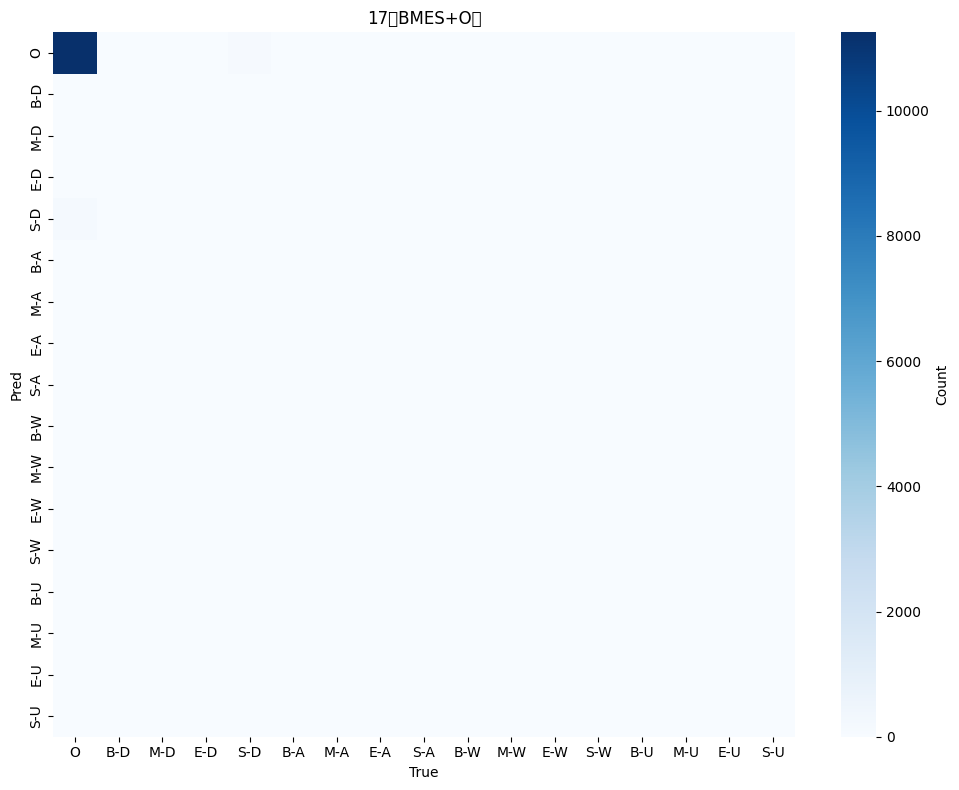

✓ 混淆矩陣存至: /content/drive/MyDrive/few-shot/DER_BERTCRF_longrun_loss_converge/cm_17.png

5（DAWU+O） 分類報告（內部監測）：
              precision    recall  f1-score   support

           O     0.9715    0.9780    0.9747     11506
           D     0.0607    0.0594    0.0600       219
           A     0.0000    0.0000    0.0000        24
           W     0.0000    0.0000    0.0000        76
           U     0.0000    0.0000    0.0000        28

    accuracy                         0.9505     11853
   macro avg     0.2065    0.2075    0.2070     11853
weighted avg     0.9442    0.9505    0.9473     11853



/tmp/ipython-input-735726816.py:485: UserWarning: Glyph 65288 (\N{FULLWIDTH LEFT PARENTHESIS}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-735726816.py:485: UserWarning: Glyph 65289 (\N{FULLWIDTH RIGHT PARENTHESIS}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-735726816.py:487: UserWarning: Glyph 65288 (\N{FULLWIDTH LEFT PARENTHESIS}) missing from font(s) DejaVu Sans.
  plt.savefig(path, dpi=300); plt.show()
/tmp/ipython-input-735726816.py:487: UserWarning: Glyph 65289 (\N{FULLWIDTH RIGHT PARENTHESIS}) missing from font(s) DejaVu Sans.
  plt.savefig(path, dpi=300); plt.show()
/usr/local/lib/python3.12/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 65288 (\N{FULLWIDTH LEFT PARENTHESIS}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.12/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 65289 (\N{FULLWIDTH RIGHT PARENTHESIS}) missing from font(s) 

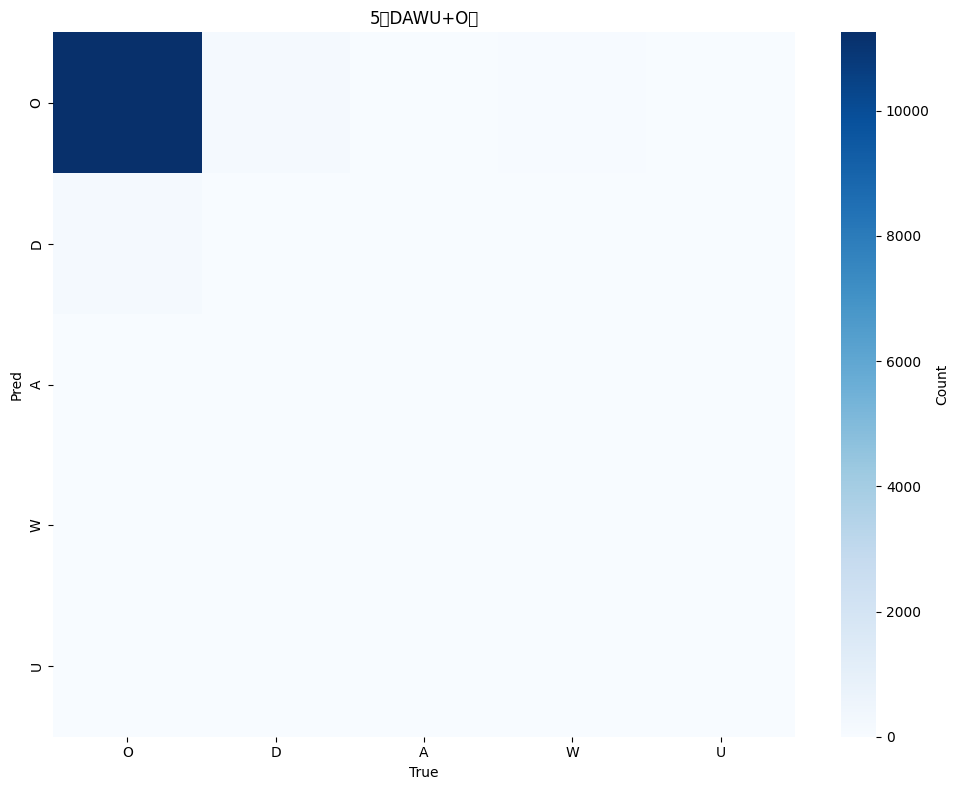

/tmp/ipython-input-735726816.py:485: UserWarning: Glyph 65288 (\N{FULLWIDTH LEFT PARENTHESIS}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-735726816.py:485: UserWarning: Glyph 65289 (\N{FULLWIDTH RIGHT PARENTHESIS}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-735726816.py:487: UserWarning: Glyph 65288 (\N{FULLWIDTH LEFT PARENTHESIS}) missing from font(s) DejaVu Sans.
  plt.savefig(path, dpi=300); plt.show()
/tmp/ipython-input-735726816.py:487: UserWarning: Glyph 65289 (\N{FULLWIDTH RIGHT PARENTHESIS}) missing from font(s) DejaVu Sans.
  plt.savefig(path, dpi=300); plt.show()


✓ 混淆矩陣存至: /content/drive/MyDrive/few-shot/DER_BERTCRF_longrun_loss_converge/cm_5.png

2（SYM vs O） 分類報告（內部監測）：
              precision    recall  f1-score   support

           O     0.9715    0.9780    0.9747     11506
         SYM     0.0630    0.0490    0.0551       347

    accuracy                         0.9508     11853
   macro avg     0.5172    0.5135    0.5149     11853
weighted avg     0.9449    0.9508    0.9478     11853



/usr/local/lib/python3.12/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 65288 (\N{FULLWIDTH LEFT PARENTHESIS}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.12/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 65289 (\N{FULLWIDTH RIGHT PARENTHESIS}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


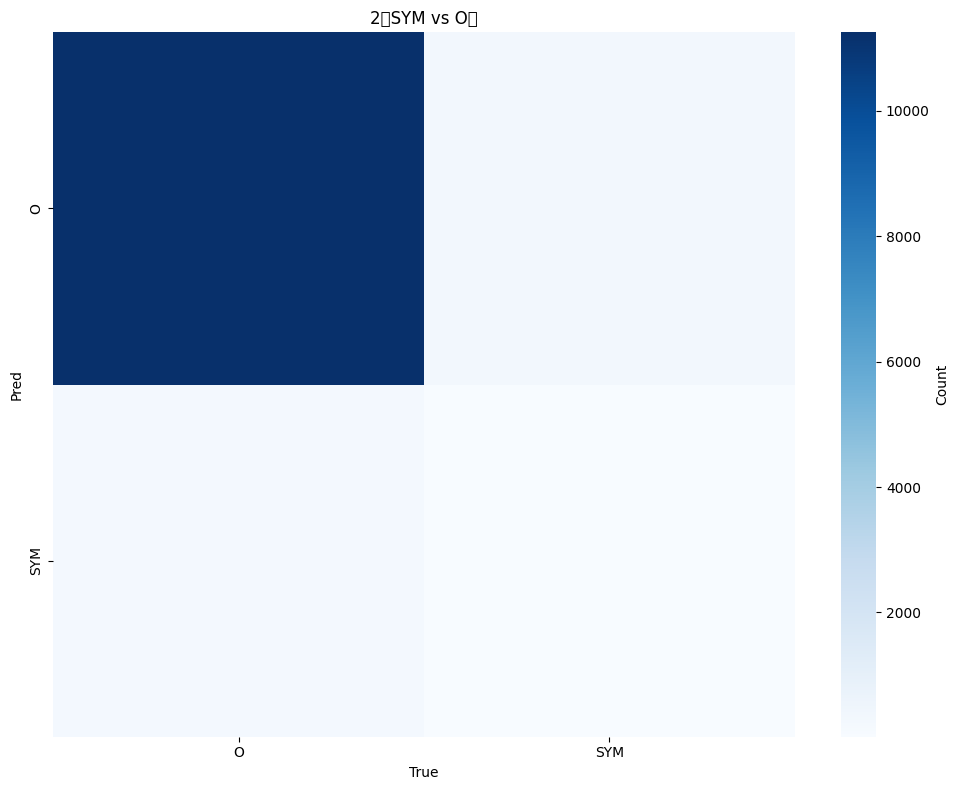

✓ 混淆矩陣存至: /content/drive/MyDrive/few-shot/DER_BERTCRF_longrun_loss_converge/cm_2.png


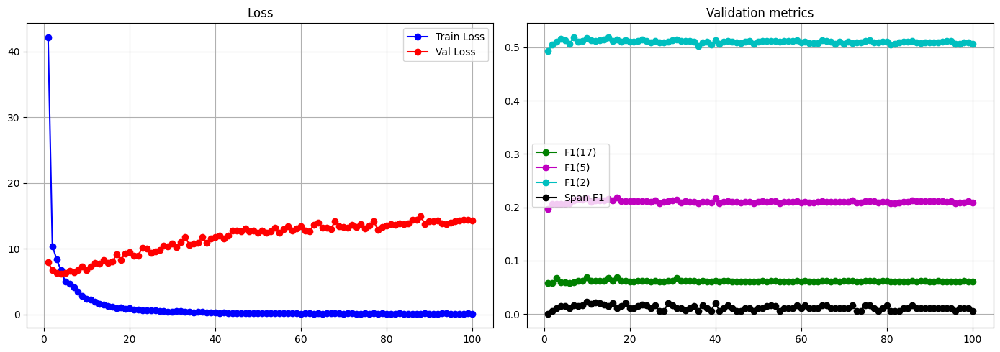

✓ 訓練曲線/CSV 已輸出

🎉 完成！最佳模型（以最低 ValLoss）與輸出位於： /content/drive/MyDrive/few-shot/DER_BERTCRF_longrun_loss_converge


In [ ]:
# ============================================
# Colab 一鍵版（對齊「長程預訓練、以 Loss 收斂為主」）
# BERT(+BiLSTM)+CRF 的 DER
# 視窗化 + 強化過採樣 + 解凍 + 2/5/17 同評 + span-F1
# 訓練改為：>100 epochs，主監控指標為「val loss 收斂」，以最低 val loss 儲存最佳權重
# ============================================

# ---- 0. 安裝套件（第一次執行需要）----
!pip -q install transformers==4.44.2 torchcrf==1.1.0 seqeval==1.2.2

# ---- 1. 匯入 ----
import os, csv, math, random, itertools, glob
from collections import Counter, defaultdict
import numpy as np
import pandas as pd
from tqdm.auto import tqdm

import torch
import torch.nn as nn
from torch.utils.data import Dataset, DataLoader, WeightedRandomSampler

from transformers import BertTokenizerFast, BertModel
from torchcrf import CRF

from sklearn.metrics import accuracy_score, f1_score, classification_report, confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns

# ---- 2. 設定 ----
CONFIG = {
    # 路徑（請改成你的 MentalBERT 微調後目錄 & 資料CSV）
    "encoder_dir": "/content/drive/MyDrive/few-shot/chinese_mentalbert_finetuned_results_simplified/final_model",
    "data_path": "/content/drive/MyDrive/few-shot/noO_select_de.csv",
    "save_dir": "/content/drive/MyDrive/few-shot/DER_BERTCRF_longrun_loss_converge",

    # 視窗化（長文切片）
    "use_windowing": True,
    "window_size": 128,
    "window_stride": 96,   # 覆蓋式視窗，避免切斷 BMES

    # max_length（若關閉視窗化，請加大到 256 以避免截斷）
    "max_length": 128,

    # 過採樣（依非O密度連續加權）
    "use_oversampling": True,
    "weight_floor": 0.05,  # 非O密度權重下限
    "weight_gamma": 0.5,   # 密度曲線的冪次

    # 模型結構
    "use_bilstm": True,    # 在 BERT 之後加 BiLSTM 再接 CRF（推薦 True）
    "lstm_hidden": 128,
    "lstm_layers": 1,
    "dropout": 0.3,

    # 解凍策略
    "unfreeze_last_n_layers": 2,   # 解凍 BERT 後 N 層（0=全凍結）
    "lr_encoder": 5e-5,            # 被解凍的 encoder 層學習率
    "lr_head": 3e-4,               # 頭部（BiLSTM/Linear/CRF）學習率

    # 訓練參數（長程、以 loss 收斂為主）
    "batch_size": 16,
    "num_epochs": 100,             # 長程訓練（可改 150）
    "gradient_clip": 1.0,
    "weight_decay": 1e-2,
    "seed": 42,

    # 資料切分
    "test_ratio": 0.2,   # test
    "val_ratio": 0.2     # of train_val
}

os.makedirs(CONFIG["save_dir"], exist_ok=True)
random.seed(CONFIG["seed"]); np.random.seed(CONFIG["seed"]); torch.manual_seed(CONFIG["seed"])
DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print("DEVICE:", DEVICE)

# ---- 3. 標籤系統：BMES×{D,A,W,U}+O (17類) ----
LABELS_17 = [
    "O",
    "B-D","M-D","E-D","S-D",
    "B-A","M-A","E-A","S-A",
    "B-W","M-W","E-W","S-W",
    "B-U","M-U","E-U","S-U",
]
label2id = {lb:i for i,lb in enumerate(LABELS_17)}
id2label = {i:lb for lb,i in label2id.items()}

# 5類：DAWU+O
LABELS_5 = ["O","D","A","W","U"]
lab5_2id = {lb:i for i,lb in enumerate(LABELS_5)}
id2lab5 = {i:lb for lb,i in lab5_2id.items()}

# 2類：SYM(=DAWU) vs O
LABELS_2 = ["O","SYM"]
lab2_2id = {lb:i for i,lb in enumerate(LABELS_2)}
id2lab2 = {i:lb for lb,i in lab2_2id.items()}

VALID_PREFIX = {"B","M","E","S"}
VALID_TYPE   = {"D","A","W","U"}
def normalize_bmes(raw):
    if pd.isna(raw): return "O"
    s = str(raw).strip().upper()
    if s=="O": return "O"
    if "-" in s:
        pfx,typ = s.split("-",1)
        pfx,typ = pfx.strip(), typ.strip()
        if pfx in VALID_PREFIX and typ in VALID_TYPE:
            return f"{pfx}-{typ}"
        return "O"
    if s in VALID_TYPE:
        return f"S-{s}"
    return "O"

def bmes_to_5(tag):
    if tag=="O": return "O"
    _, typ = tag.split("-",1)
    return typ if typ in {"D","A","W","U"} else "O"

def bmes_to_2(tag):
    return "O" if tag=="O" else "SYM"

# ---- 4. 載入資料、依 post_id 分組、（可選）視窗化 ----
def load_data(fp):
    df = pd.read_csv(fp, encoding="utf-8", quoting=csv.QUOTE_ALL, on_bad_lines="warn")
    df = df[df.columns[:9].tolist()]  # 與你原流程一致
    df["bmes"] = df["human_label"].apply(normalize_bmes)
    return df

df = load_data(CONFIG["data_path"])
print("Raw rows:", len(df))

def group_by_post(df):
    data=[]
    for pid,g in df.groupby("post_id"):
        if "word_order" in g.columns: g = g.sort_values("word_order")
        words  = g["word"].astype(str).tolist()
        labels = g["bmes"].astype(str).tolist()
        if len(words)==0 or len(words)!=len(labels): continue
        data.append({"post_id": str(pid), "words": words, "labels": [label2id.get(t,0) for t in labels]})
    return data

all_data = group_by_post(df)
print("Posts:", len(all_data))

# 依 post_id 切分
from sklearn.model_selection import train_test_split
train_val, test_data = train_test_split(all_data, test_size=CONFIG["test_ratio"], random_state=CONFIG["seed"], shuffle=True)
train_data, val_data = train_test_split(train_val, test_size=CONFIG["val_ratio"], random_state=CONFIG["seed"], shuffle=True)

# 視窗化
def windowize(words, labels, win=128, stride=96):
    L = len(words)
    if L<=win: return [(words, labels)]
    out=[]; i=0
    while i<L:
        j=min(i+win, L)
        out.append((words[i:j], labels[i:j]))
        if j==L: break
        i+=stride
    return out

def build_windowed_dataset(raw, win, stride):
    data=[]
    for d in raw:
        for w_words, w_labels in windowize(d["words"], d["labels"], win, stride):
            data.append({"post_id": d["post_id"], "words": w_words, "labels": w_labels})
    return data

if CONFIG["use_windowing"]:
    train_data = build_windowed_dataset(train_data, CONFIG["window_size"], CONFIG["window_stride"])
    val_data   = build_windowed_dataset(val_data,   CONFIG["window_size"], CONFIG["window_stride"])
    test_data  = build_windowed_dataset(test_data,  CONFIG["window_size"], CONFIG["window_stride"])

print(f"Train={len(train_data)} | Val={len(val_data)} | Test={len(test_data)}")

# ---- 5. Tokenizer/Encoder ----
tokenizer = BertTokenizerFast.from_pretrained(CONFIG["encoder_dir"])
encoder   = BertModel.from_pretrained(CONFIG["encoder_dir"])

# 解凍最後 N 層
def unfreeze_last_n_layers(encoder, n=0):
    for p in encoder.parameters():
        p.requires_grad = False
    if n<=0:
        encoder.eval()
        return
    L = encoder.config.num_hidden_layers
    target_layers = set(range(L-n, L))
    for name,p in encoder.named_parameters():
        if any(f"encoder.layer.{i}." in name for i in target_layers) or "pooler." in name:
            p.requires_grad = True
    encoder.train()

unfreeze_last_n_layers(encoder, CONFIG["unfreeze_last_n_layers"])

# ---- 6. Dataset/Loader ----
class TokenClsDataset(Dataset):
    def __init__(self, data, tokenizer, max_length=128):
        self.data=data; self.tok=tokenizer; self.max_length=max_length
    def __len__(self): return len(self.data)
    def __getitem__(self, idx):
        item = self.data[idx]
        enc = self.tok(
            item["words"],
            is_split_into_words=True,
            truncation=True,
            padding="max_length",
            max_length=self.max_length,
            return_offsets_mapping=False,
            return_tensors="pt"
        )
        word_ids = enc.word_ids()
        labels_ids=[]
        prev=None
        for w_idx in word_ids:
            if w_idx is None:
                labels_ids.append(-100)
            elif w_idx!=prev:
                if w_idx < len(item["labels"]):
                    labels_ids.append(item["labels"][w_idx])
                else:
                    labels_ids.append(-100)
            else:
                labels_ids.append(-100)  # 後續 subword 不訓練
            prev = w_idx
        enc = {k:v.squeeze(0) for k,v in enc.items()}
        enc["labels"] = torch.tensor(labels_ids, dtype=torch.long)
        return enc

train_ds = TokenClsDataset(train_data, tokenizer, CONFIG["max_length"])
val_ds   = TokenClsDataset(val_data,   tokenizer, CONFIG["max_length"])
test_ds  = TokenClsDataset(test_data,  tokenizer, CONFIG["max_length"])

# 連續權重過採樣（依非O密度）
O_ID = label2id["O"]
def seq_weights_by_nonO_ratio(raw_data, floor=0.05, gamma=0.5):
    w=[]
    for d in raw_data:
        r = sum(1 for t in d["labels"] if t!=O_ID)/max(1,len(d["labels"]))
        w.append(floor + (r**gamma))
    s=sum(w); return [x/s for x in w]

if CONFIG["use_oversampling"]:
    weights = seq_weights_by_nonO_ratio(train_data, CONFIG["weight_floor"], CONFIG["weight_gamma"])
    sampler = WeightedRandomSampler(weights=weights, num_samples=len(weights), replacement=True)
    train_loader = DataLoader(train_ds, batch_size=CONFIG["batch_size"], sampler=sampler)
else:
    train_loader = DataLoader(train_ds, batch_size=CONFIG["batch_size"], shuffle=True)

val_loader  = DataLoader(val_ds,  batch_size=CONFIG["batch_size"], shuffle=False)
test_loader = DataLoader(test_ds, batch_size=CONFIG["batch_size"], shuffle=False)

# ---- 7. 模型：BERT → (BiLSTM) → Linear → CRF ----
class BERT_BiLSTM_CRF(nn.Module):
    def __init__(self, encoder, num_labels, use_bilstm=True, hidden=128, layers=1, dropout=0.3):
        super().__init__()
        self.encoder = encoder
        self.use_bilstm = use_bilstm
        hd = encoder.config.hidden_size
        if use_bilstm:
            self.lstm = nn.LSTM(
                input_size=hd, hidden_size=hidden, num_layers=layers,
                batch_first=True, bidirectional=True, dropout=dropout if layers>1 else 0.0
            )
            cls_in = hidden*2
        else:
            self.lstm = None
            cls_in = hd
        self.drop = nn.Dropout(dropout)
        self.fc   = nn.Linear(cls_in, num_labels)
        self.crf  = CRF(num_labels, batch_first=True)

    def forward(self, input_ids, attention_mask, labels=None):
        outputs = self.encoder(input_ids=input_ids, attention_mask=attention_mask)
        x = outputs.last_hidden_state
        if self.use_bilstm:
            x,_ = self.lstm(x)
        x = self.drop(x)
        emissions = self.fc(x)
        mask = attention_mask.bool()
        if labels is not None:
            y = labels.clone()
            y[y==-100] = 0
            loss = -self.crf(emissions, y, mask=mask, reduction="mean")
            preds = self.crf.decode(emissions, mask=mask)
            return loss, preds
        else:
            preds = self.crf.decode(emissions, mask=mask)
            return preds

model = BERT_BiLSTM_CRF(
    encoder=encoder, num_labels=len(LABELS_17),
    use_bilstm=CONFIG["use_bilstm"], hidden=CONFIG["lstm_hidden"],
    layers=CONFIG["lstm_layers"], dropout=CONFIG["dropout"]
).to(DEVICE)

# 參數群組：被解凍的 encoder vs head
enc_params = [p for n,p in model.named_parameters() if n.startswith("encoder.") and p.requires_grad]
head_params= [p for n,p in model.named_parameters() if (not n.startswith("encoder.")) and p.requires_grad]

optimizer = torch.optim.AdamW([
    {"params": enc_params, "lr": CONFIG["lr_encoder"]},
    {"params": head_params, "lr": CONFIG["lr_head"]}
], weight_decay=CONFIG["weight_decay"])

# 固定步驟衰減（不以 F1 作調度；符合「長程以 loss 收斂」）
scheduler = torch.optim.lr_scheduler.StepLR(optimizer, step_size=40, gamma=0.5)

# ---- 8. 評估工具：17/5/2 類 + span-F1（作為內部監測，主指標為 loss 收斂）----
def to_5_ids(ids17):
    return [lab5_2id[bmes_to_5(id2label[i])] for i in ids17]

def to_2_ids(ids17):
    return [lab2_2id[bmes_to_2(id2label[i])] for i in ids17]

def decode_spans_bmes(tag_seq):
    spans=[]
    cur_type=None; start=None
    for i,tag in enumerate(tag_seq):
        if tag=="O":
            if cur_type is not None:
                spans.append((cur_type, start, i-1))
                cur_type=None; start=None
            continue
        pfx,typ = tag.split("-",1)
        if pfx=="S":
            spans.append((typ, i, i))
            cur_type=None; start=None
        elif pfx=="B":
            if cur_type is not None:
                spans.append((cur_type, start, i-1))
            cur_type=typ; start=i
        elif pfx=="M":
            if cur_type is None:
                cur_type=typ; start=i
        elif pfx=="E":
            if cur_type is None:
                cur_type=typ; start=i
            spans.append((typ, start, i))
            cur_type=None; start=None
    if cur_type is not None:
        spans.append((cur_type, start, len(tag_seq)-1))
    return spans

def span_f1_17(true_tags_17, pred_tags_17):
    tp=0; fp=0; fn=0
    for y_true, y_pred in zip(true_tags_17, pred_tags_17):
        T = decode_spans_bmes(y_true)
        P = decode_spans_bmes(y_pred)
        T_set = set(T); P_set = set(P)
        tp += len(T_set & P_set)
        fp += len(P_set - T_set)
        fn += len(T_set - P_set)
    prec = tp / max(1,(tp+fp))
    rec  = tp / max(1,(tp+fn))
    f1   = 2*prec*rec / max(1e-12,(prec+rec))
    return prec, rec, f1

@torch.no_grad()
def evaluate(model, loader, desc="Eval"):
    model.eval()
    all_true_17, all_pred_17 = [], []
    total_loss=0.0; nb=0
    for batch in tqdm(loader, desc=desc, leave=False):
        input_ids = batch["input_ids"].to(DEVICE)
        attention_mask = batch["attention_mask"].to(DEVICE)
        labels = batch["labels"].to(DEVICE)
        loss, preds = model(input_ids, attention_mask, labels=labels)
        total_loss += loss.item(); nb+=1

        for i, pred_seq in enumerate(preds):
            valid = (labels[i] != -100).cpu().numpy()
            y_t = labels[i].detach().cpu().numpy()[valid].tolist()
            y_p = pred_seq[:len(y_t)]
            all_true_17.extend(y_t)
            all_pred_17.extend(y_p)

    acc_17  = accuracy_score(all_true_17, all_pred_17)
    f1_17   = f1_score(all_true_17, all_pred_17, average="macro", zero_division=0)

    y_true_5 = to_5_ids(all_true_17); y_pred_5 = to_5_ids(all_pred_17)
    y_true_2 = to_2_ids(all_true_17); y_pred_2 = to_2_ids(all_pred_17)
    f1_5  = f1_score(y_true_5, y_pred_5, average="macro", zero_division=0)
    f1_2  = f1_score(y_true_2, y_pred_2, average="macro", zero_division=0)

    # span-F1 近似（切段以避免過長）
    true_tags = [id2label[i] for i in all_true_17]
    pred_tags = [id2label[i] for i in all_pred_17]
    seg=200
    true_seqs=[true_tags[i:i+seg] for i in range(0,len(true_tags),seg)]
    pred_seqs=[pred_tags[i:i+seg] for i in range(0,len(pred_tags),seg)]
    p_span, r_span, f1_span = span_f1_17(true_seqs, pred_seqs)

    return {
        "loss": total_loss/max(1,nb),
        "acc_17": acc_17,
        "f1_17": f1_17,
        "f1_5":  f1_5,
        "f1_2":  f1_2,
        "span_p": p_span, "span_r": r_span, "span_f1": f1_span,
        "y_true_17": all_true_17, "y_pred_17": all_pred_17
    }

# ---- 9. 長程訓練（以 val loss 收斂為主；最低 val loss 儲存最佳）----
best_val_loss = float("inf")
history=[]

for epoch in range(1, CONFIG["num_epochs"]+1):
    model.train()
    tr_loss=0.0; nb=0
    pbar = tqdm(train_loader, desc=f"Epoch {epoch}/{CONFIG['num_epochs']}")
    for batch in pbar:
        input_ids = batch["input_ids"].to(DEVICE)
        attention_mask = batch["attention_mask"].to(DEVICE)
        labels = batch["labels"].to(DEVICE)

        loss, _ = model(input_ids, attention_mask, labels=labels)
        optimizer.zero_grad()
        loss.backward()
        nn.utils.clip_grad_norm_(model.parameters(), CONFIG["gradient_clip"])
        optimizer.step()
        tr_loss += loss.item(); nb+=1
        pbar.set_postfix(loss=f"{loss.item():.4f}")

    avg_tr = tr_loss/max(1,nb)
    val_res = evaluate(model, val_loader, desc="Valid")

    history.append({
        "epoch": epoch,
        "train_loss": avg_tr,
        "val_loss": val_res["loss"],
        "val_acc_17": val_res["acc_17"],
        "val_f1_17": val_res["f1_17"],
        "val_f1_5":  val_res["f1_5"],
        "val_f1_2":  val_res["f1_2"],
        "val_span_f1": val_res["span_f1"]
    })

    print(f"\nEpoch {epoch}: "
          f"TrainLoss={avg_tr:.4f} | ValLoss={val_res['loss']:.4f} | "
          f"F1_17={val_res['f1_17']:.4f} | F1_5={val_res['f1_5']:.4f} | F1_2={val_res['f1_2']:.4f} | "
          f"Span-F1={val_res['span_f1']:.4f}")

    # 以固定步驟衰減
    scheduler.step()

    # 以「最低 val loss」作為最佳模型
    if val_res["loss"] < best_val_loss:
        best_val_loss = val_res["loss"]
        ckpt_path = os.path.join(CONFIG["save_dir"], "best_DER_bertcrf_by_valLoss.pt")
        torch.save({
            "model_state_dict": model.state_dict(),
            "best_val_loss": best_val_loss,
            "config": CONFIG,
            "label2id": label2id
        }, ckpt_path)
        print(f"  ✅ Save best by ValLoss ({best_val_loss:.4f}) → {ckpt_path}")

# ---- 10. 測試 ----
ckpt_path = os.path.join(CONFIG["save_dir"], "best_DER_bertcrf_by_valLoss.pt")
ckpt = torch.load(ckpt_path, map_location=DEVICE)
model.load_state_dict(ckpt["model_state_dict"])
test_res = evaluate(model, test_loader, desc="Test")

print("\n" + "="*60)
print("📊 Test (Token-level)")
print(f"Loss     : {test_res['loss']:.4f}")
print(f"Acc(17)  : {test_res['acc_17']:.4f}")
print(f"F1(17)   : {test_res['f1_17']:.4f}")
print(f"F1(5)    : {test_res['f1_5']:.4f}  # 內部監測")
print(f"F1(2)    : {test_res['f1_2']:.4f}  # 內部監測")
print(f"Span-F1  : {test_res['span_f1']:.4f}  # 內部監測")
print("="*60)

# ---- 11. 報表 & 混淆矩陣（17/5/2 類；內部監測）----
y_true_17 = test_res["y_true_17"]; y_pred_17 = test_res["y_pred_17"]
def print_report_and_cm(y_true, y_pred, names, title, fname):
    print(f"\n{title} 分類報告（內部監測）：")
    print(classification_report(y_true, y_pred, labels=list(range(len(names))), target_names=names, digits=4, zero_division=0))
    cm = confusion_matrix(y_true, y_pred, labels=list(range(len(names))))
    plt.figure(figsize=(10,8))
    sns.heatmap(cm.T, annot=False, fmt='d', cmap='Blues',
                xticklabels=names, yticklabels=names, cbar_kws={'label':'Count'})
    plt.xlabel("True"); plt.ylabel("Pred"); plt.title(title)
    plt.tight_layout()
    path = os.path.join(CONFIG["save_dir"], fname)
    plt.savefig(path, dpi=300); plt.show()
    print("✓ 混淆矩陣存至:", path)

print_report_and_cm(y_true_17, y_pred_17, LABELS_17, "17（BMES+O）", "cm_17.png")

y_true_5 = to_5_ids(y_true_17); y_pred_5 = to_5_ids(y_pred_17)
print_report_and_cm(y_true_5, y_pred_5, LABELS_5, "5（DAWU+O）", "cm_5.png")

y_true_2 = to_2_ids(y_true_17); y_pred_2 = to_2_ids(y_pred_17)
print_report_and_cm(y_true_2, y_pred_2, LABELS_2, "2（SYM vs O）", "cm_2.png")

# ---- 12. 訓練曲線（以 loss 為主）----
if len(history)>0:
    hist = pd.DataFrame(history)
    fig,ax = plt.subplots(1,2, figsize=(14,5))
    ax[0].plot(hist["epoch"], hist["train_loss"], 'b-o', label='Train Loss')
    ax[0].plot(hist["epoch"], hist["val_loss"],   'r-o', label='Val Loss')
    ax[0].legend(); ax[0].grid(True); ax[0].set_title("Loss")
    ax[1].plot(hist["epoch"], hist["val_f1_17"], 'g-o', label='F1(17)')
    ax[1].plot(hist["epoch"], hist["val_f1_5"],  'm-o', label='F1(5)')
    ax[1].plot(hist["epoch"], hist["val_f1_2"],  'c-o', label='F1(2)')
    ax[1].plot(hist["epoch"], hist["val_span_f1"],  'k-o', label='Span-F1')
    ax[1].legend(); ax[1].grid(True); ax[1].set_title("Validation metrics")
    plt.tight_layout()
    p = os.path.join(CONFIG["save_dir"], "training_history.png")
    plt.savefig(p, dpi=300); plt.show()
    hist.to_csv(os.path.join(CONFIG["save_dir"], "training_history.csv"), index=False)
    print("✓ 訓練曲線/CSV 已輸出")

print("\n🎉 完成！最佳模型（以最低 ValLoss）與輸出位於：", CONFIG["save_dir"])


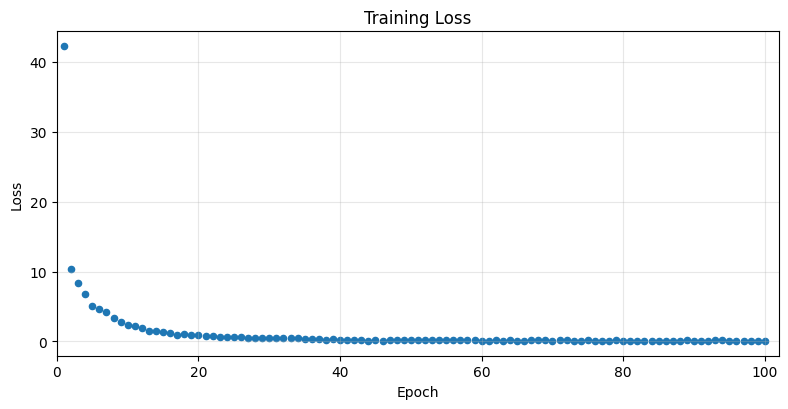

✓ 論文風格 Loss 曲線已存檔：/content/drive/MyDrive/few-shot/DER_BERTCRF_longrun_loss_converge/loss_curve_like_paper.png


In [ ]:
import os
import pandas as pd
import matplotlib.pyplot as plt

# 將訓練過程的紀錄轉成 DataFrame（你的程式已累積在 history）
history_df = pd.DataFrame(history)

# 若中途中斷、沒有 history，可從 CSV 載入（可選）
# history_df = pd.read_csv(os.path.join(CONFIG["save_dir"], "training_history.csv"))

# 只畫「Train Loss vs. Epoch」的散點圖，樣式貼近論文示意圖
plt.figure(figsize=(8,4.2))
plt.scatter(history_df["epoch"], history_df["train_loss"], s=20)  # 藍色散點（matplotlib 預設）
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.title("Training Loss")
plt.grid(True, alpha=0.3)
plt.xlim(0, history_df["epoch"].max() * 1.02)

save_path = os.path.join(CONFIG["save_dir"], "loss_curve_like_paper.png")
plt.tight_layout()
plt.savefig(save_path, dpi=300)
plt.show()
print(f"✓ 論文風格 Loss 曲線已存檔：{save_path}")


In [ ]:
# ============================================
# 長文 & 截斷影響解析（for DER 原始資料）
# - 需已定義：CONFIG、label2id（含 'O'）、all_data/train_data/val_data/test_data
# - 建議在「視窗化前」執行，以觀察原始貼文的情況
# ============================================

import os
import numpy as np
import pandas as pd

assert "O" in label2id, "label2id 需包含 'O'"
O_ID = label2id["O"]
MAXL = CONFIG.get("max_length", 128)
SAVE_DIR = CONFIG["save_dir"]
os.makedirs(SAVE_DIR, exist_ok=True)



def stats_by_posts(dataset, name="split", max_len=128):
    """
    dataset: list of dicts = [{"post_id", "words": [..], "labels": [int,..]}, ...]
    return: (post_level_df, summary_dict)
    """
    rows = []
    for d in dataset:
        y = d["labels"]
        L = len(y)
        nonO = sum(1 for t in y if t != O_ID)
        trunc_nonO = 0
        is_trunc = L > max_len
        if is_trunc:
            trunc_nonO = sum(1 for t in y[max_len:] if t != O_ID)
        rows.append({
            "post_id": d["post_id"],
            "len_tokens": L,
            "nonO_cnt": nonO,
            "nonO_ratio": (nonO / L) if L > 0 else 0.0,
            "is_truncated_at_maxlen": bool(is_trunc),
            "trunc_nonO_cnt": trunc_nonO,
            "trunc_nonO_ratio": (trunc_nonO / nonO) if nonO > 0 else 0.0
        })
    dfp = pd.DataFrame(rows)

    # 概覽
    n_posts = len(dfp)
    n_tokens = int(dfp["len_tokens"].sum())
    nonO_tokens = int(dfp["nonO_cnt"].sum())
    O_tokens = n_tokens - nonO_tokens
    baseline_all_O_acc = O_tokens / max(1, n_tokens)   # 「全預測 O」的 token-level Acc 基線

    trunc_posts = int(dfp["is_truncated_at_maxlen"].sum())
    trunc_ratio_posts = trunc_posts / max(1, n_posts)
    trunc_nonO_tokens = int((dfp["trunc_nonO_cnt"]).sum())
    trunc_nonO_ratio_all_nonO = trunc_nonO_tokens / max(1, nonO_tokens)  # 全資料的非O中，有多少比例落在 max_length 之後

    # # 長度分箱
    # len_bins = pd.cut(dfp["len_tokens"], bins=[0,64,128,256,512,1e9],
    #                   labels=["(0,64]","(64,128]","(128,256]","(256,512]","(512,+]"),
    #                   right=True, include_lowest=True)
    # tab_len = dfp.groupby(len_bins, dropna=False).agg(
    #     posts=("post_id", "count"),
    #     avg_len=("len_tokens", "mean"),
    #     avg_nonO_ratio=("nonO_ratio", "mean"),
    #     trunc_posts=("is_truncated_at_maxlen", "sum")
    # )
    # tab_len["trunc_posts_ratio"] = tab_len["trunc_posts"] / tab_len["posts"].replace(0, np.nan)

    # # 非O密度分箱
    # r_bins = pd.cut(dfp["nonO_ratio"], bins=[0,0.01,0.02,0.05,0.1,1.0],
    #                 labels=["[0,1%)","[1%,2%)","[2%,5%)","[5%,10%)","[10%,100%]"],
    #                 right=False, include_lowest=True)
    # tab_ratio = dfp.groupby(r_bins, dropna=False).agg(
    #     posts=("post_id", "count"),
    #     avg_len=("len_tokens", "mean"),
    #     trunc_posts=("is_truncated_at_maxlen", "sum"),
    #     avg_trunc_nonO_ratio=("trunc_nonO_ratio", "mean")
    # )
    # tab_ratio["trunc_posts_ratio"] = tab_ratio["trunc_posts"] / tab_ratio["posts"].replace(0, np.nan)

    # 長度分箱（先分開定義，避免隱藏字元造成語法錯）
    len_bin_edges  = [0, 64, 128, 256, 512, float("inf")]
    len_bin_labels = ["(0,64]", "(64,128]", "(128,256]", "(256,512]", "(512,+]"]
    len_bins = pd.cut(dfp["len_tokens"], bins=len_bin_edges,
                  labels=len_bin_labels, right=True, include_lowest=True)

    # 非O密度分箱
    ratio_bin_edges  = [0, 0.01, 0.02, 0.05, 0.10, 1.0]
    ratio_bin_labels = ["[0,1%)","[1%,2%)","[2%,5%)","[5%,10%)","[10%,100%]"]
    r_bins = pd.cut(dfp["nonO_ratio"], bins=ratio_bin_edges,
                labels=ratio_bin_labels, right=False, include_lowest=True)
    tab_len = dfp.groupby(len_bins, dropna=False).agg(
      posts=("post_id", "count"),
      avg_len=("len_tokens", "mean"),
      avg_nonO_ratio=("nonO_ratio", "mean"),
      trunc_posts=("is_truncated_at_maxlen", "sum"),
    )
    tab_len["trunc_posts_ratio"] = tab_len["trunc_posts"] / tab_len["posts"].replace(0, np.nan)

    tab_ratio = dfp.groupby(r_bins, dropna=False).agg(
      posts=("post_id", "count"),
      avg_len=("len_tokens", "mean"),
      trunc_posts=("is_truncated_at_maxlen", "sum"),
      avg_trunc_nonO_ratio=("trunc_nonO_ratio", "mean"),
    )
    tab_ratio["trunc_posts_ratio"] = tab_ratio["trunc_posts"] / tab_ratio["posts"].replace(0, np.nan)

    summary = {
        "split": name,
        "n_posts": n_posts,
        "n_tokens": n_tokens,
        "O_tokens": O_tokens,
        "nonO_tokens": nonO_tokens,
        "baseline_all_O_acc": baseline_all_O_acc,
        "trunc_posts": trunc_posts,
        "trunc_posts_ratio": trunc_ratio_posts,
        "trunc_nonO_tokens": trunc_nonO_tokens,
        "trunc_nonO_ratio_all_nonO": trunc_nonO_ratio_all_nonO,
        "median_len": float(dfp["len_tokens"].median()) if n_posts else 0.0,
        "median_nonO_ratio": float(dfp["nonO_ratio"].median()) if n_posts else 0.0
    }
    return dfp, summary, tab_len, tab_ratio

# 執行（對 all / train / val / test）
df_all,  sum_all,  tab_all_len,  tab_all_ratio  = stats_by_posts(all_data,  "ALL",   MAXL)
df_tr,   sum_tr,   tab_tr_len,   tab_tr_ratio   = stats_by_posts(train_data,"TRAIN", MAXL)
df_val,  sum_val,  tab_val_len,  tab_val_ratio  = stats_by_posts(val_data,  "VAL",   MAXL)
df_test, sum_test, tab_test_len, tab_test_ratio = stats_by_posts(test_data, "TEST",  MAXL)

# 印出摘要
def pretty_print_summary(s):
    print(f"\n=== {s['split']} ===")
    print(f"posts={s['n_posts']:,} | tokens={s['n_tokens']:,}")
    print(f"O tokens比例（全O基線Acc）= {s['baseline_all_O_acc']:.4f}")
    print(f"中位長度={s['median_len']:.1f} | 中位非O比例={s['median_nonO_ratio']:.3f}")
    print(f"會被 max_length({MAXL}) 截斷的貼文數/比率 = {s['trunc_posts']}/{s['n_posts']} ({s['trunc_posts_ratio']:.1%})")
    print(f"被截掉的非O占全體非O比例 = {s['trunc_nonO_ratio_all_nonO']:.1%}")

for s in [sum_all, sum_tr, sum_val, sum_test]:
    pretty_print_summary(s)

print("\n--- 長度分箱（ALL） ---")
display(tab_all_len)

print("\n--- 非O密度分箱（ALL） ---")
display(tab_all_ratio)

# 輸出 CSV
df_all.to_csv(os.path.join(SAVE_DIR, "post_stats_ALL.csv"), index=False)
tab_all_len.to_csv(os.path.join(SAVE_DIR, "post_len_bins_ALL.csv"))
tab_all_ratio.to_csv(os.path.join(SAVE_DIR, "post_nonO_ratio_bins_ALL.csv"))

# 額外：快速檢查「非O多數在max_length之後」的高風險貼文
risk = df_all[(df_all["trunc_nonO_ratio"] > 0.5) & (df_all["is_truncated_at_maxlen"]==True)]
risk = risk.sort_values(["trunc_nonO_ratio","nonO_ratio","len_tokens"], ascending=[False,False,False])
risk.head(20).to_csv(os.path.join(SAVE_DIR, "high_risk_truncation_cases.csv"), index=False)
print("\n✓ 輸出：post_stats_ALL.csv、post_len_bins_ALL.csv、post_nonO_ratio_bins_ALL.csv、high_risk_truncation_cases.csv")


/tmp/ipython-input-1457721448.py:91: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  tab_len = dfp.groupby(len_bins, dropna=False).agg(
/tmp/ipython-input-1457721448.py:99: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  tab_ratio = dfp.groupby(r_bins, dropna=False).agg(
/tmp/ipython-input-1457721448.py:91: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  tab_len = dfp.groupby(len_bins, dropna=False).agg(
/tmp/ipython-input-145


=== ALL ===
posts=489 | tokens=67,051
O tokens比例（全O基線Acc）= 0.9702
中位長度=94.0 | 中位非O比例=0.041
會被 max_length(128) 截斷的貼文數/比率 = 178/489 (36.4%)
被截掉的非O占全體非O比例 = 14.1%

=== TRAIN ===
posts=566 | tokens=51,488
O tokens比例（全O基線Acc）= 0.9723
中位長度=115.0 | 中位非O比例=0.023
會被 max_length(128) 截斷的貼文數/比率 = 0/566 (0.0%)
被截掉的非O占全體非O比例 = 0.0%

=== VAL ===
posts=138 | tokens=12,075
O tokens比例（全O基線Acc）= 0.9729
中位長度=105.5 | 中位非O比例=0.019
會被 max_length(128) 截斷的貼文數/比率 = 0/138 (0.0%)
被截掉的非O占全體非O比例 = 0.0%

=== TEST ===
posts=172 | tokens=15,872
O tokens比例（全O基線Acc）= 0.9733
中位長度=111.5 | 中位非O比例=0.023
會被 max_length(128) 截斷的貼文數/比率 = 0/172 (0.0%)
被截掉的非O占全體非O比例 = 0.0%

--- 長度分箱（ALL） ---


,posts,avg_len,avg_nonO_ratio,trunc_posts,trunc_posts_ratio
len_tokens,,,,,
"(0,64]",191,28.083770,0.113776,0,0.0
"(64,128]",120,96.600000,0.045978,0,0.0
"(128,256]",100,178.250000,0.032389,100,1.0
"(256,512]",62,347.645161,0.017927,62,1.0
"(512,+]",16,669.750000,0.006858,16,1.0



--- 非O密度分箱（ALL） ---


,posts,avg_len,trunc_posts,avg_trunc_nonO_ratio,trunc_posts_ratio
nonO_ratio,,,,,
"[0,1%)",75,311.693333,61,0.167111,0.813333
"[1%,2%)",67,199.119403,38,0.160199,0.567164
"[2%,5%)",138,137.405797,56,0.099895,0.405797
"[5%,10%)",107,73.056075,17,0.034903,0.158879
"[10%,100%]",102,34.843137,6,0.007680,0.058824



✓ 輸出：post_stats_ALL.csv、post_len_bins_ALL.csv、post_nonO_ratio_bins_ALL.csv、high_risk_truncation_cases.csv


### 11/20 修正視窗拆分，和DER兩階段

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 43.7/43.7 kB 1.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 43.6/43.6 kB 2.0 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 9.5/9.5 MB 50.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.6/3.6 MB 47.4 MB/s eta 0:00:00
DEVICE: cuda


/tmp/ipython-input-1351054052.py:138: DtypeWarning: Columns (10) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(fp, encoding="utf-8", quoting=csv.QUOTE_ALL, on_bad_lines="warn")


原始資料列數: 67051
貼文數量: 489
訓練集=2759 | 驗證集=661 | 測試集=555

📊 訓練集 分析
樣本數: 2759
總 token 數: 41086
平均長度: 14.9

標籤分布（Top 10）:
  O       :  39817 (96.91%)
  S-D     :    547 ( 1.33%)
  S-W     :    158 ( 0.38%)
  B-D     :     78 ( 0.19%)
  E-D     :     76 ( 0.18%)
  S-U     :     76 ( 0.18%)
  B-W     :     61 ( 0.15%)
  E-W     :     55 ( 0.13%)
  B-A     :     35 ( 0.09%)
  E-U     :     33 ( 0.08%)

非O密度統計:
  平均: 0.078
  中位數: 0.000
  最小: 0.000
  最大: 1.000
  全O樣本: 1823/2759 (66.1%)

📊 驗證集 分析
樣本數: 661
總 token 數: 14368
平均長度: 21.7

標籤分布（Top 10）:
  O       :  13920 (96.88%)
  S-D     :    196 ( 1.36%)
  S-W     :     74 ( 0.52%)
  S-U     :     24 ( 0.17%)
  E-D     :     23 ( 0.16%)
  B-W     :     23 ( 0.16%)
  B-D     :     21 ( 0.15%)
  E-W     :     21 ( 0.15%)
  B-U     :     14 ( 0.10%)
  E-U     :     13 ( 0.09%)

非O密度統計:
  平均: 0.038
  中位數: 0.000
  最小: 0.000
  最大: 0.625
  全O樣本: 432/661 (65.4%)

📊 測試集 分析
樣本數: 555
總 token 數: 11075
平均長度: 20.0

標籤分布（Top 10）:
  O       :  10780 (97.34%)
  S-D 

Some weights of BertModel were not initialized from the model checkpoint at /content/drive/MyDrive/few-shot/chinese_mentalbert_finetuned_results_simplified/final_model and are newly initialized: ['bert.pooler.dense.bias', 'bert.pooler.dense.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


Epoch 1/50:   0%|          | 0/345 [00:00<?, ?it/s]

驗證:   0%|          | 0/83 [00:00<?, ?it/s]


Epoch 1: TrainLoss=3.6598 | ValLoss=2.8656 | F1_17=0.0642 | F1_5=0.2138 | F1_2=0.5132 | Span-F1=0.0421
  ✅ 保存最佳模型 (ValLoss=2.8656) → /content/drive/MyDrive/few-shot/DER_BERTCRF_anchor_transition_489/best_model.pt


Epoch 2/50:   0%|          | 0/345 [00:00<?, ?it/s]

驗證:   0%|          | 0/83 [00:00<?, ?it/s]


Epoch 2: TrainLoss=1.7267 | ValLoss=3.8205 | F1_17=0.0625 | F1_5=0.2076 | F1_2=0.5024 | Span-F1=0.0254
  ⏳ 未改善次數: 1/10


Epoch 3/50:   0%|          | 0/345 [00:00<?, ?it/s]

驗證:   0%|          | 0/83 [00:00<?, ?it/s]


Epoch 3: TrainLoss=1.2155 | ValLoss=4.0928 | F1_17=0.0620 | F1_5=0.2061 | F1_2=0.5005 | Span-F1=0.0206
  ⏳ 未改善次數: 2/10


Epoch 4/50:   0%|          | 0/345 [00:00<?, ?it/s]

驗證:   0%|          | 0/83 [00:00<?, ?it/s]


Epoch 4: TrainLoss=0.8072 | ValLoss=4.4534 | F1_17=0.0608 | F1_5=0.2043 | F1_2=0.4980 | Span-F1=0.0152
  ⏳ 未改善次數: 3/10


Epoch 5/50:   0%|          | 0/345 [00:00<?, ?it/s]

驗證:   0%|          | 0/83 [00:00<?, ?it/s]


Epoch 5: TrainLoss=0.5845 | ValLoss=5.9225 | F1_17=0.0594 | F1_5=0.1998 | F1_2=0.4940 | Span-F1=0.0052
  ⏳ 未改善次數: 4/10


Epoch 6/50:   0%|          | 0/345 [00:00<?, ?it/s]

驗證:   0%|          | 0/83 [00:00<?, ?it/s]


Epoch 6: TrainLoss=0.4215 | ValLoss=7.0074 | F1_17=0.0579 | F1_5=0.1967 | F1_2=0.4917 | Span-F1=0.0000
  ⏳ 未改善次數: 5/10


Epoch 7/50:   0%|          | 0/345 [00:00<?, ?it/s]

驗證:   0%|          | 0/83 [00:00<?, ?it/s]


Epoch 7: TrainLoss=0.3295 | ValLoss=6.3880 | F1_17=0.0578 | F1_5=0.1966 | F1_2=0.4916 | Span-F1=0.0000
  ⏳ 未改善次數: 6/10


Epoch 8/50:   0%|          | 0/345 [00:00<?, ?it/s]

驗證:   0%|          | 0/83 [00:00<?, ?it/s]


Epoch 8: TrainLoss=0.2771 | ValLoss=7.0247 | F1_17=0.0578 | F1_5=0.1967 | F1_2=0.4917 | Span-F1=0.0000
  ⏳ 未改善次數: 7/10


Epoch 9/50:   0%|          | 0/345 [00:00<?, ?it/s]

驗證:   0%|          | 0/83 [00:00<?, ?it/s]


Epoch 9: TrainLoss=0.2251 | ValLoss=7.5536 | F1_17=0.0579 | F1_5=0.1967 | F1_2=0.4918 | Span-F1=0.0000
  ⏳ 未改善次數: 8/10


Epoch 10/50:   0%|          | 0/345 [00:00<?, ?it/s]

驗證:   0%|          | 0/83 [00:00<?, ?it/s]


Epoch 10: TrainLoss=0.1361 | ValLoss=7.7908 | F1_17=0.0579 | F1_5=0.1967 | F1_2=0.4918 | Span-F1=0.0000
  ⏳ 未改善次數: 9/10


Epoch 11/50:   0%|          | 0/345 [00:00<?, ?it/s]

驗證:   0%|          | 0/83 [00:00<?, ?it/s]


Epoch 11: TrainLoss=0.1597 | ValLoss=8.4267 | F1_17=0.0579 | F1_5=0.1967 | F1_2=0.4918 | Span-F1=0.0000
  ⏳ 未改善次數: 10/10

⏹️ 早停於 Epoch 11（連續 10 輪未改善）

📊 載入最佳模型進行測試
最佳模型來自 Epoch 1，ValLoss=2.8656


測試:   0%|          | 0/70 [00:00<?, ?it/s]


📊 測試集結果（Token-level）
Loss     : 2.2098
Acc(17)  : 0.9705
F1(17)   : 0.0631
F1(5)    : 0.2066
F1(2)    : 0.5087
Span-F1  : 0.0149

17類（BMES×DAWU+O）測試集 分類報告
              precision    recall  f1-score   support

           O     0.9737    0.9969    0.9851     10014
         B-D     0.0000    0.0000    0.0000        21
         M-D     0.0000    0.0000    0.0000         9
         E-D     0.0000    0.0000    0.0000        17
         S-D     0.0645    0.0154    0.0248       130
         B-A     0.0000    0.0000    0.0000         3
         M-A     0.0000    0.0000    0.0000         0
         E-A     0.0000    0.0000    0.0000         3
         S-A     0.0000    0.0000    0.0000        15
         B-W     0.0000    0.0000    0.0000         9
         M-W     0.0000    0.0000    0.0000         5
         E-W     0.0000    0.0000    0.0000         9
         S-W     0.0000    0.0000    0.0000        37
         B-U     0.0000    0.0000    0.0000         5
         M-U     0.0000    0.0000

/tmp/ipython-input-1351054052.py:853: UserWarning: Glyph 39006 (\N{CJK UNIFIED IDEOGRAPH-985E}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-1351054052.py:853: UserWarning: Glyph 65288 (\N{FULLWIDTH LEFT PARENTHESIS}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-1351054052.py:853: UserWarning: Glyph 65289 (\N{FULLWIDTH RIGHT PARENTHESIS}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-1351054052.py:853: UserWarning: Glyph 28204 (\N{CJK UNIFIED IDEOGRAPH-6E2C}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-1351054052.py:853: UserWarning: Glyph 35430 (\N{CJK UNIFIED IDEOGRAPH-8A66}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-1351054052.py:853: UserWarning: Glyph 38598 (\N{CJK UNIFIED IDEOGRAPH-96C6}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-1351054052.py:856: UserWarning: Glyph 39006 (\N{CJK UNIFIED IDEOGRAPH-985E

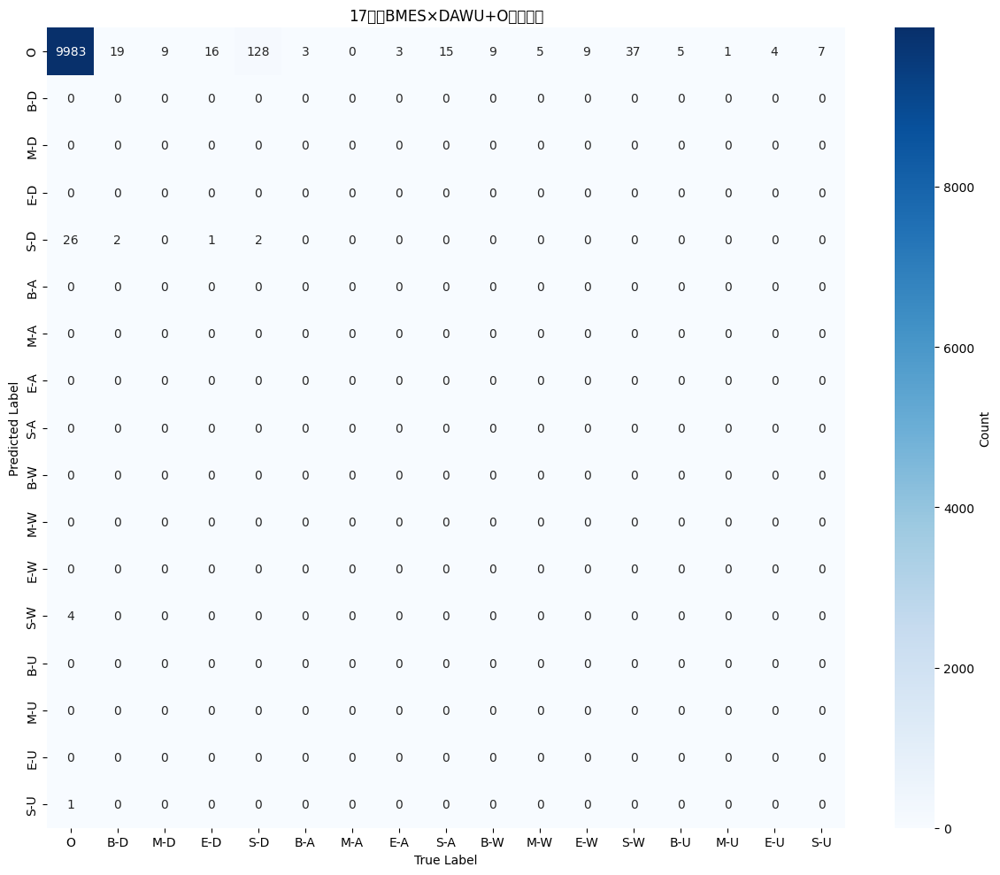

✓ 混淆矩陣已儲存: /content/drive/MyDrive/few-shot/DER_BERTCRF_anchor_transition_489/cm_17_test.png


5類（DAWU+O）測試集 分類報告
              precision    recall  f1-score   support

           O     0.9737    0.9969    0.9851     10014
           D     0.1613    0.0282    0.0481       177
           A     0.0000    0.0000    0.0000        21
           W     0.0000    0.0000    0.0000        60
           U     0.0000    0.0000    0.0000        17

    accuracy                         0.9707     10289
   macro avg     0.2270    0.2050    0.2066     10289
weighted avg     0.9504    0.9707    0.9596     10289



/tmp/ipython-input-1351054052.py:853: UserWarning: Glyph 39006 (\N{CJK UNIFIED IDEOGRAPH-985E}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-1351054052.py:853: UserWarning: Glyph 65288 (\N{FULLWIDTH LEFT PARENTHESIS}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-1351054052.py:853: UserWarning: Glyph 65289 (\N{FULLWIDTH RIGHT PARENTHESIS}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-1351054052.py:853: UserWarning: Glyph 28204 (\N{CJK UNIFIED IDEOGRAPH-6E2C}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-1351054052.py:853: UserWarning: Glyph 35430 (\N{CJK UNIFIED IDEOGRAPH-8A66}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-1351054052.py:853: UserWarning: Glyph 38598 (\N{CJK UNIFIED IDEOGRAPH-96C6}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-1351054052.py:856: UserWarning: Glyph 39006 (\N{CJK UNIFIED IDEOGRAPH-985E

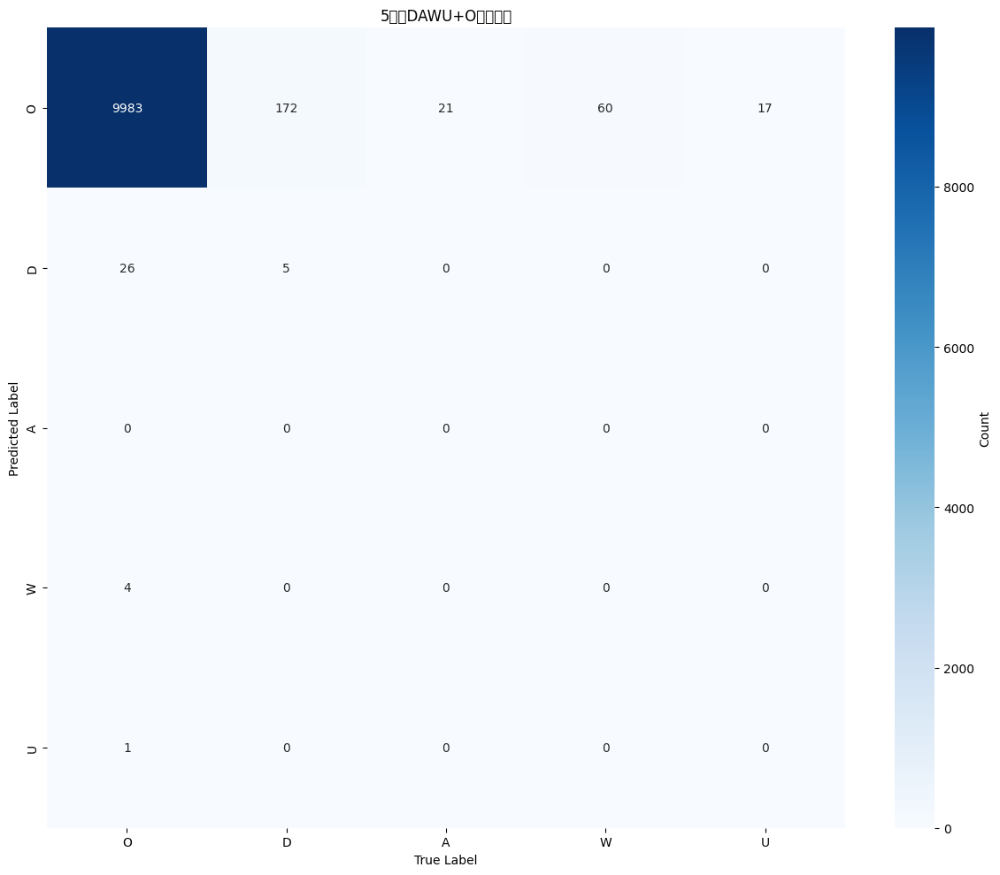

/tmp/ipython-input-1351054052.py:853: UserWarning: Glyph 39006 (\N{CJK UNIFIED IDEOGRAPH-985E}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-1351054052.py:853: UserWarning: Glyph 65288 (\N{FULLWIDTH LEFT PARENTHESIS}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-1351054052.py:853: UserWarning: Glyph 65289 (\N{FULLWIDTH RIGHT PARENTHESIS}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-1351054052.py:853: UserWarning: Glyph 28204 (\N{CJK UNIFIED IDEOGRAPH-6E2C}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-1351054052.py:853: UserWarning: Glyph 35430 (\N{CJK UNIFIED IDEOGRAPH-8A66}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-1351054052.py:853: UserWarning: Glyph 38598 (\N{CJK UNIFIED IDEOGRAPH-96C6}) missing from font(s) DejaVu Sans.
  plt.tight_layout()


✓ 混淆矩陣已儲存: /content/drive/MyDrive/few-shot/DER_BERTCRF_anchor_transition_489/cm_5_test.png


2類（SYM vs O）測試集 分類報告
              precision    recall  f1-score   support

           O     0.9737    0.9969    0.9851     10014
         SYM     0.1389    0.0182    0.0322       275

    accuracy                         0.9707     10289
   macro avg     0.5563    0.5075    0.5087     10289
weighted avg     0.9514    0.9707    0.9597     10289



/tmp/ipython-input-1351054052.py:856: UserWarning: Glyph 39006 (\N{CJK UNIFIED IDEOGRAPH-985E}) missing from font(s) DejaVu Sans.
  plt.savefig(path, dpi=300)
/tmp/ipython-input-1351054052.py:856: UserWarning: Glyph 65288 (\N{FULLWIDTH LEFT PARENTHESIS}) missing from font(s) DejaVu Sans.
  plt.savefig(path, dpi=300)
/tmp/ipython-input-1351054052.py:856: UserWarning: Glyph 65289 (\N{FULLWIDTH RIGHT PARENTHESIS}) missing from font(s) DejaVu Sans.
  plt.savefig(path, dpi=300)
/tmp/ipython-input-1351054052.py:856: UserWarning: Glyph 28204 (\N{CJK UNIFIED IDEOGRAPH-6E2C}) missing from font(s) DejaVu Sans.
  plt.savefig(path, dpi=300)
/tmp/ipython-input-1351054052.py:856: UserWarning: Glyph 35430 (\N{CJK UNIFIED IDEOGRAPH-8A66}) missing from font(s) DejaVu Sans.
  plt.savefig(path, dpi=300)
/tmp/ipython-input-1351054052.py:856: UserWarning: Glyph 38598 (\N{CJK UNIFIED IDEOGRAPH-96C6}) missing from font(s) DejaVu Sans.
  plt.savefig(path, dpi=300)
/usr/local/lib/python3.12/dist-packages/IPyth

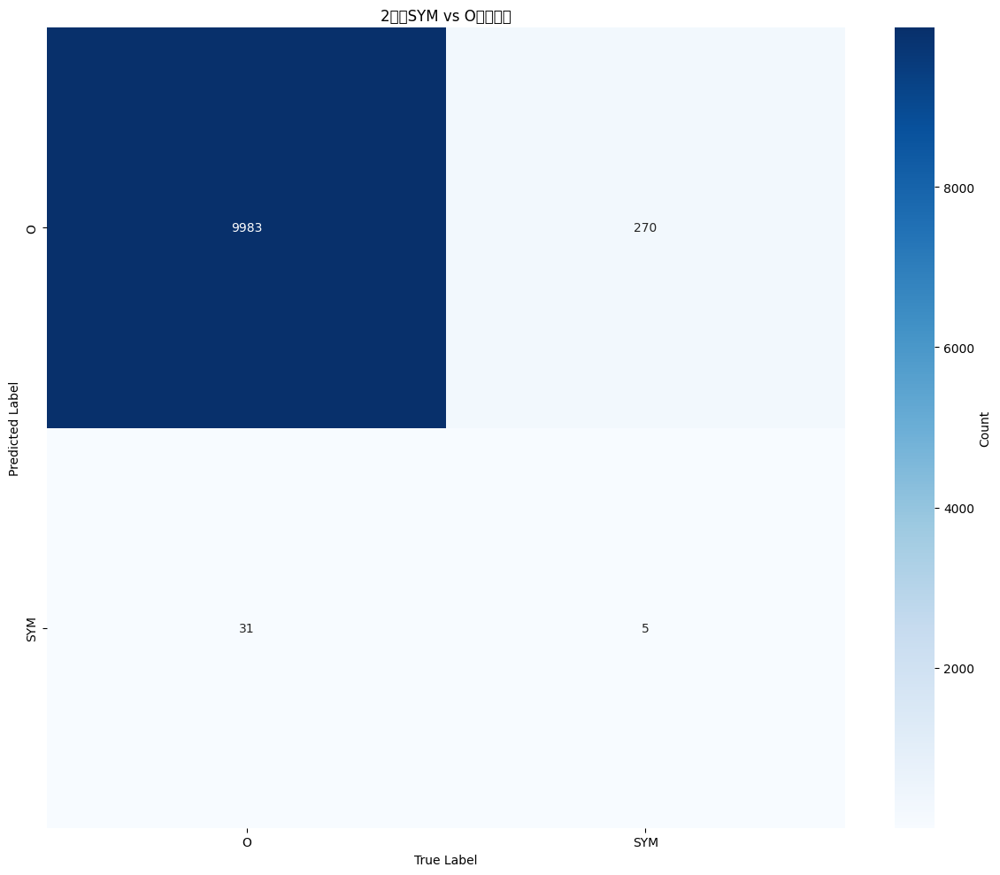

/tmp/ipython-input-1351054052.py:923: UserWarning: Glyph 35347 (\N{CJK UNIFIED IDEOGRAPH-8A13}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-1351054052.py:923: UserWarning: Glyph 32244 (\N{CJK UNIFIED IDEOGRAPH-7DF4}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-1351054052.py:923: UserWarning: Glyph 33287 (\N{CJK UNIFIED IDEOGRAPH-8207}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-1351054052.py:923: UserWarning: Glyph 39511 (\N{CJK UNIFIED IDEOGRAPH-9A57}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-1351054052.py:923: UserWarning: Glyph 35657 (\N{CJK UNIFIED IDEOGRAPH-8B49}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-1351054052.py:923: UserWarning: Glyph 38598 (\N{CJK UNIFIED IDEOGRAPH-96C6}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-1351054052.py:923: UserWarning: Glyph 20998 (\N{CJK UNIFIED IDEOGRAPH-5206}

✓ 混淆矩陣已儲存: /content/drive/MyDrive/few-shot/DER_BERTCRF_anchor_transition_489/cm_2_test.png



/tmp/ipython-input-1351054052.py:923: UserWarning: Glyph 28310 (\N{CJK UNIFIED IDEOGRAPH-6E96}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-1351054052.py:923: UserWarning: Glyph 30906 (\N{CJK UNIFIED IDEOGRAPH-78BA}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-1351054052.py:923: UserWarning: Glyph 29575 (\N{CJK UNIFIED IDEOGRAPH-7387}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-1351054052.py:926: UserWarning: Glyph 35347 (\N{CJK UNIFIED IDEOGRAPH-8A13}) missing from font(s) DejaVu Sans.
  plt.savefig(hist_path, dpi=300)
/tmp/ipython-input-1351054052.py:926: UserWarning: Glyph 32244 (\N{CJK UNIFIED IDEOGRAPH-7DF4}) missing from font(s) DejaVu Sans.
  plt.savefig(hist_path, dpi=300)
/tmp/ipython-input-1351054052.py:926: UserWarning: Glyph 33287 (\N{CJK UNIFIED IDEOGRAPH-8207}) missing from font(s) DejaVu Sans.
  plt.savefig(hist_path, dpi=300)
/tmp/ipython-input-1351054052.py:926: UserWarning: Glyp

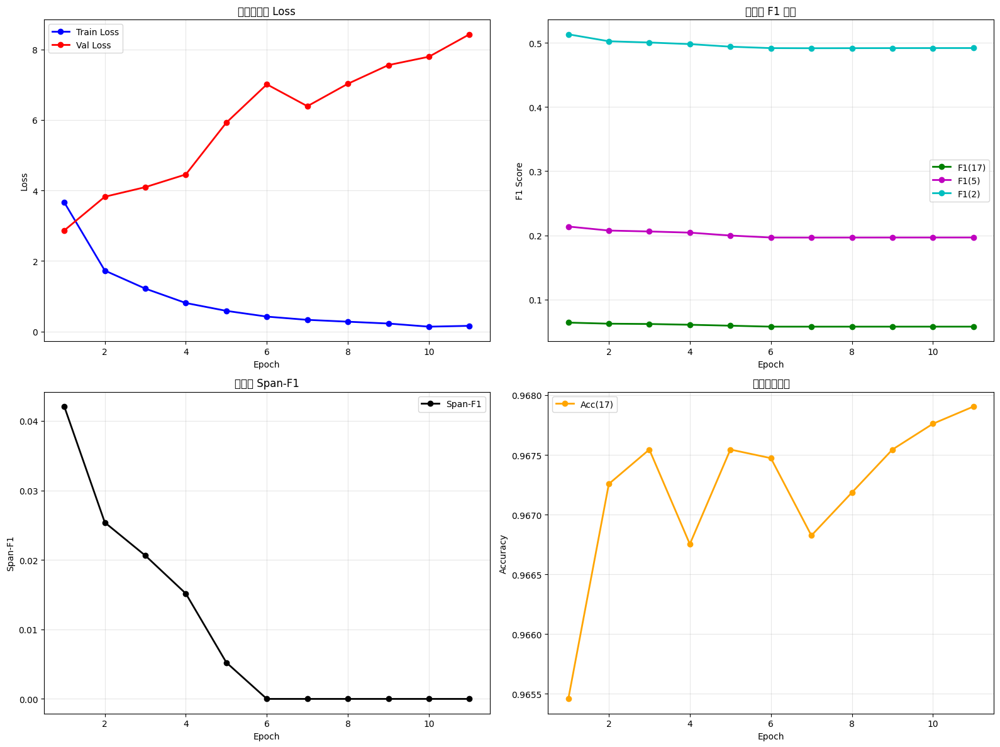

✓ 訓練曲線已儲存: /content/drive/MyDrive/few-shot/DER_BERTCRF_anchor_transition_489/training_history.png
✓ 訓練歷史已儲存: /content/drive/MyDrive/few-shot/DER_BERTCRF_anchor_transition_489/training_history.csv
✓ 配置檔已儲存: /content/drive/MyDrive/few-shot/DER_BERTCRF_anchor_transition_489/config.json

📊 各類別詳細分析（測試集）

17類別詳細指標:
標籤          Precision     Recall   F1-Score    Support
------------------------------------------------------------
O              0.9737     0.9969     0.9851      10014
B-D            0.0000     0.0000     0.0000         21
M-D            0.0000     0.0000     0.0000          9
E-D            0.0000     0.0000     0.0000         17
S-D            0.0645     0.0154     0.0248        130
B-A            0.0000     0.0000     0.0000          3
M-A            0.0000     0.0000     0.0000          0
E-A            0.0000     0.0000     0.0000          3
S-A            0.0000     0.0000     0.0000         15
B-W            0.0000     0.0000     0.0000          9
M-W            0.0000  

In [ ]:
# ============================================
# 針對 489 筆小資料集優化的 DER 訓練程式
# BERT(+BiLSTM)+CRF
# 策略：anchor_nonO + split_on_transition + 早停 + 資料分析
# ============================================

# ---- 0. 安裝套件 ----
!pip -q install transformers==4.44.2 torchcrf==1.1.0 seqeval==1.2.2

# ---- 1. 匯入 ----
import os, csv, math, random, glob
from collections import Counter, defaultdict
import numpy as np
import pandas as pd
from tqdm.auto import tqdm

import torch
import torch.nn as nn
from torch.utils.data import Dataset, DataLoader, WeightedRandomSampler

from transformers import BertTokenizerFast, BertModel
from torchcrf import CRF

from sklearn.metrics import accuracy_score, f1_score, classification_report, confusion_matrix
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt
import seaborn as sns

# ---- 2. 設定 ----
CONFIG = {
    # 路徑設定（請改成你的實際路徑）
    "encoder_dir": "/content/drive/MyDrive/few-shot/chinese_mentalbert_finetuned_results_simplified/final_model",
    "data_path": "/content/drive/MyDrive/few-shot/noO_select_de.csv",
    "save_dir": "/content/drive/MyDrive/few-shot/DER_BERTCRF_anchor_transition_489",

    # ===== 核心策略配置 =====
    "window_policy_train": "anchor_nonO",      # 訓練：以憂鬱詞為錨點
    "window_policy_eval":  "keep_all",         # 評估：保持完整避免偏差

    # 句切與類型切分
    "use_sentence_split_train": True,
    "use_sentence_split_eval":  True,
    "split_on_transition_train": True,         # DAWU 切換處拆分
    "split_on_transition_eval":  False,        # 評估不拆分

    # 視窗參數
    "window_size": 128,
    "window_stride": 96,
    "min_nonO": 2,
    "min_nonO_ratio": 0.05,
    "anchor_ctx_left": 64,                     # 增加上下文
    "anchor_ctx_right": 64,
    "max_len_for_split": 256,
    "max_length": 128,

    # 過採樣策略
    "use_oversampling": True,
    "weight_floor": 0.15,                      # 提高基礎權重
    "weight_gamma": 0.25,                      # 更陡峭曲線

    # 模型結構
    "use_bilstm": True,
    "lstm_hidden": 128,
    "lstm_layers": 1,
    "dropout": 0.4,                            # 增加 dropout

    # 解凍策略（小資料集減少解凍）
    "unfreeze_last_n_layers": 2,
    "lr_encoder": 3e-5,
    "lr_head": 2e-4,

    # 訓練參數
    "batch_size": 8,                           # 小批次
    "num_epochs": 50,
    "gradient_clip": 1.0,
    "weight_decay": 5e-3,
    "patience": 10,                            # 早停耐心值
    "seed": 42,

    # 資料切分
    "test_ratio": 0.15,
    "val_ratio": 0.25
}

os.makedirs(CONFIG["save_dir"], exist_ok=True)
random.seed(CONFIG["seed"])
np.random.seed(CONFIG["seed"])
torch.manual_seed(CONFIG["seed"])
DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print("DEVICE:", DEVICE)

# ---- 3. 標籤系統 ----
LABELS_17 = [
    "O",
    "B-D","M-D","E-D","S-D",
    "B-A","M-A","E-A","S-A",
    "B-W","M-W","E-W","S-W",
    "B-U","M-U","E-U","S-U",
]
label2id = {lb:i for i,lb in enumerate(LABELS_17)}
id2label = {i:lb for lb,i in label2id.items()}

LABELS_5 = ["O","D","A","W","U"]
lab5_2id = {lb:i for i,lb in enumerate(LABELS_5)}
id2lab5 = {i:lb for lb,i in lab5_2id.items()}

LABELS_2 = ["O","SYM"]
lab2_2id = {lb:i for i,lb in enumerate(LABELS_2)}
id2lab2 = {i:lb for lb,i in lab2_2id.items()}

VALID_PREFIX = {"B","M","E","S"}
VALID_TYPE   = {"D","A","W","U"}

def normalize_bmes(raw):
    if pd.isna(raw): return "O"
    s = str(raw).strip().upper()
    if s=="O": return "O"
    if "-" in s:
        pfx,typ = s.split("-",1)
        pfx,typ = pfx.strip(), typ.strip()
        if pfx in VALID_PREFIX and typ in VALID_TYPE:
            return f"{pfx}-{typ}"
        return "O"
    if s in VALID_TYPE:
        return f"S-{s}"
    return "O"

def bmes_to_5(tag):
    if tag=="O": return "O"
    _, typ = tag.split("-",1)
    return typ if typ in {"D","A","W","U"} else "O"

def bmes_to_2(tag):
    return "O" if tag=="O" else "SYM"

# ---- 4. 載入資料 ----
def load_data(fp):
    df = pd.read_csv(fp, encoding="utf-8", quoting=csv.QUOTE_ALL, on_bad_lines="warn")
    df = df[df.columns[:9].tolist()]
    df["bmes"] = df["human_label"].apply(normalize_bmes)
    return df

df = load_data(CONFIG["data_path"])
print(f"原始資料列數: {len(df)}")

def group_by_post(df):
    data=[]
    for pid,g in df.groupby("post_id"):
        if "word_order" in g.columns:
            g = g.sort_values("word_order")
        words  = g["word"].astype(str).tolist()
        labels = g["bmes"].astype(str).tolist()
        if len(words)==0 or len(words)!=len(labels):
            continue
        data.append({
            "post_id": str(pid),
            "words": words,
            "labels": [label2id.get(t,0) for t in labels]
        })
    return data

all_data = group_by_post(df)
print(f"貼文數量: {len(all_data)}")

# 切分資料
train_val, test_data = train_test_split(
    all_data, test_size=CONFIG["test_ratio"],
    random_state=CONFIG["seed"], shuffle=True
)
train_data, val_data = train_test_split(
    train_val, test_size=CONFIG["val_ratio"],
    random_state=CONFIG["seed"], shuffle=True
)

# ---- 5. 視窗策略函數 ----
def id_is_O(tid):
    return id2label[tid] == "O"

def id_type(tid):
    lb = id2label[tid]
    if lb == "O": return "O", None
    pfx, typ = lb.split("-", 1)
    return pfx, typ

def extend_to_bmes_boundary(labels, start_idx, end_idx):
    """延伸到 BMES 完整邊界"""
    i = start_idx
    pfx, typ = id_type(labels[i])
    if pfx in {"M","E"} and typ is not None:
        j = i
        while j >= 0:
            p,t = id_type(labels[j])
            if p == "B" and t == typ:
                i = j
                break
            j -= 1
        start_idx = max(0, i)

    k = end_idx
    pfx, typ = id_type(labels[k])
    if pfx in {"B","M"} and typ is not None:
        j = k
        while j < len(labels):
            p,t = id_type(labels[j])
            if p == "E" and t == typ:
                k = j
                break
            j += 1
        end_idx = min(len(labels)-1, k)
    return start_idx, end_idx

def windowize_keep_all(words, labels, win=128, stride=96):
    L = len(words)
    if L <= win:
        return [(words, labels)]
    out = []
    i = 0
    while i < L:
        j = min(i+win, L)
        out.append((words[i:j], labels[i:j]))
        if j == L: break
        i += stride
    return out

def windowize_filter_nonO(words, labels, win=128, stride=96, min_nonO=1, min_ratio=0.0):
    out = []
    for w, y in windowize_keep_all(words, labels, win, stride):
        nonO = sum(1 for t in y if not id_is_O(t))
        if nonO >= min_nonO or (nonO/len(y)) >= min_ratio:
            out.append((w, y))
    return out if out else [(words[:win], labels[:win])]

def sentence_split(words, labels):
    sents = []
    start = 0
    punct = set("。！？!?…;；")
    for i, w in enumerate(words):
        if any(ch in punct for ch in w):
            sents.append((words[start:i+1], labels[start:i+1]))
            start = i+1
    if start < len(words):
        sents.append((words[start:], labels[start:]))
    return sents if sents else [(words, labels)]

def windowize_anchor_by_nonO(words, labels, win=128, ctx_left=48, ctx_right=48):
    L = len(words)
    nonO_idx = [i for i,t in enumerate(labels) if not id_is_O(t)]
    if not nonO_idx:
        j = min(win, L)
        return [(words[:j], labels[:j])]

    segs = []
    for i in nonO_idx:
        s = max(0, i-ctx_left)
        e = min(L-1, i+ctx_right)
        s, e = extend_to_bmes_boundary(labels, s, e)
        segs.append([s, e])

    # 合併重疊片段
    segs.sort()
    merged = []
    for s,e in segs:
        if not merged or s > merged[-1][1] + 5:
            merged.append([s,e])
        else:
            merged[-1][1] = max(merged[-1][1], e)

    out = [(words[s:e+1], labels[s:e+1]) for s,e in merged]
    return out

def split_on_type_transition(words, labels, max_len=256):
    out = []
    start = 0

    def typ_of(idx):
        p,t = id_type(labels[idx])
        return t

    for i in range(1, len(labels)):
        t_prev = typ_of(i-1)
        t_now  = typ_of(i)
        p_prev,_ = id_type(labels[i-1])
        if (p_prev in {"S","E"}) and (t_prev != t_now):
            out.append((words[start:i], labels[start:i]))
            start = i

    if start < len(labels):
        out.append((words[start:], labels[start:]))

    # 長段再二次視窗
    final = []
    for w, y in out:
        if len(y) > max_len:
            final.extend(windowize_keep_all(w, y, win=max_len, stride=max_len//2))
        else:
            final.append((w, y))
    return final

def build_dataset_with_policy(raw_posts, policy="keep_all",
                              win=128, stride=96,
                              min_nonO=1, min_ratio=0.0,
                              ctx_left=48, ctx_right=48,
                              use_sentence_split=False,
                              split_on_transition=False,
                              max_len_for_split=256):
    data = []
    for d in raw_posts:
        words, y = d["words"], d["labels"]
        chunks = [(words, y)]

        if use_sentence_split:
            chunks = sentence_split(words, y)

        subouts = []
        for w, lab in chunks:
            if policy == "keep_all":
                Ws = windowize_keep_all(w, lab, win, stride)
            elif policy == "filter_nonO":
                Ws = windowize_filter_nonO(w, lab, win, stride, min_nonO, min_ratio)
            elif policy == "anchor_nonO":
                Ws = windowize_anchor_by_nonO(w, lab, win, ctx_left, ctx_right)
            else:
                raise ValueError(f"Unknown policy: {policy}")

            if split_on_transition:
                tmp = []
                for ww, ll in Ws:
                    tmp.extend(split_on_type_transition(ww, ll, max_len=max_len_for_split))
                Ws = tmp
            subouts.extend(Ws)

        for ww, ll in subouts:
            data.append({"post_id": d["post_id"], "words": ww, "labels": ll})
    return data

# ---- 6. 產生訓練/驗證/測試集 ----
train_data = build_dataset_with_policy(
    train_data,
    policy=CONFIG["window_policy_train"],
    win=CONFIG["window_size"],
    stride=CONFIG["window_stride"],
    min_nonO=CONFIG["min_nonO"],
    min_ratio=CONFIG["min_nonO_ratio"],
    ctx_left=CONFIG["anchor_ctx_left"],
    ctx_right=CONFIG["anchor_ctx_right"],
    use_sentence_split=CONFIG["use_sentence_split_train"],
    split_on_transition=CONFIG["split_on_transition_train"],
    max_len_for_split=CONFIG["max_len_for_split"]
)

val_data = build_dataset_with_policy(
    val_data,
    policy=CONFIG["window_policy_eval"],
    win=CONFIG["window_size"],
    stride=CONFIG["window_stride"],
    use_sentence_split=CONFIG["use_sentence_split_eval"],
    split_on_transition=CONFIG["split_on_transition_eval"],
    max_len_for_split=CONFIG["max_len_for_split"]
)

test_data = build_dataset_with_policy(
    test_data,
    policy=CONFIG["window_policy_eval"],
    win=CONFIG["window_size"],
    stride=CONFIG["window_stride"],
    use_sentence_split=CONFIG["use_sentence_split_eval"],
    split_on_transition=CONFIG["split_on_transition_eval"],
    max_len_for_split=CONFIG["max_len_for_split"]
)

print(f"訓練集={len(train_data)} | 驗證集={len(val_data)} | 測試集={len(test_data)}")

# ---- 7. 資料分析 ----
def analyze_dataset(data, name="Dataset"):
    print(f"\n{'='*60}")
    print(f"📊 {name} 分析")
    print(f"{'='*60}")

    total_tokens = sum(len(d["labels"]) for d in data)
    total_samples = len(data)

    label_counts = Counter()
    for d in data:
        label_counts.update(d["labels"])

    print(f"樣本數: {total_samples}")
    print(f"總 token 數: {total_tokens}")
    print(f"平均長度: {total_tokens/total_samples:.1f}")

    print(f"\n標籤分布（Top 10）:")
    for lid, cnt in label_counts.most_common(10):
        ratio = cnt/total_tokens*100
        print(f"  {id2label[lid]:8s}: {cnt:6d} ({ratio:5.2f}%)")

    nonO_ratios = [
        sum(1 for t in d["labels"] if t!=0)/len(d["labels"])
        for d in data
    ]
    print(f"\n非O密度統計:")
    print(f"  平均: {np.mean(nonO_ratios):.3f}")
    print(f"  中位數: {np.median(nonO_ratios):.3f}")
    print(f"  最小: {np.min(nonO_ratios):.3f}")
    print(f"  最大: {np.max(nonO_ratios):.3f}")

    all_O = sum(1 for d in data if all(t==0 for t in d["labels"]))
    print(f"  全O樣本: {all_O}/{total_samples} ({all_O/total_samples*100:.1f}%)")

analyze_dataset(train_data, "訓練集")
analyze_dataset(val_data, "驗證集")
analyze_dataset(test_data, "測試集")

# ---- 8. Tokenizer/Encoder ----
tokenizer = BertTokenizerFast.from_pretrained(CONFIG["encoder_dir"])
encoder   = BertModel.from_pretrained(CONFIG["encoder_dir"])

def unfreeze_last_n_layers(encoder, n=0):
    for p in encoder.parameters():
        p.requires_grad = False
    if n<=0:
        encoder.eval()
        return
    L = encoder.config.num_hidden_layers
    target_layers = set(range(L-n, L))
    for name,p in encoder.named_parameters():
        if any(f"encoder.layer.{i}." in name for i in target_layers) or "pooler." in name:
            p.requires_grad = True
    encoder.train()

unfreeze_last_n_layers(encoder, CONFIG["unfreeze_last_n_layers"])

# ---- 9. Dataset/Loader ----
class TokenClsDataset(Dataset):
    def __init__(self, data, tokenizer, max_length=128):
        self.data = data
        self.tok = tokenizer
        self.max_length = max_length

    def __len__(self):
        return len(self.data)

    def __getitem__(self, idx):
        item = self.data[idx]
        enc = self.tok(
            item["words"],
            is_split_into_words=True,
            truncation=True,
            padding="max_length",
            max_length=self.max_length,
            return_offsets_mapping=False,
            return_tensors="pt"
        )
        word_ids = enc.word_ids()
        labels_ids = []
        prev = None
        for w_idx in word_ids:
            if w_idx is None:
                labels_ids.append(-100)
            elif w_idx != prev:
                if w_idx < len(item["labels"]):
                    labels_ids.append(item["labels"][w_idx])
                else:
                    labels_ids.append(-100)
            else:
                labels_ids.append(-100)
            prev = w_idx

        enc = {k:v.squeeze(0) for k,v in enc.items()}
        enc["labels"] = torch.tensor(labels_ids, dtype=torch.long)
        return enc

train_ds = TokenClsDataset(train_data, tokenizer, CONFIG["max_length"])
val_ds   = TokenClsDataset(val_data,   tokenizer, CONFIG["max_length"])
test_ds  = TokenClsDataset(test_data,  tokenizer, CONFIG["max_length"])

# 過採樣
O_ID = label2id["O"]

def seq_weights_by_nonO_ratio(raw_data, floor=0.05, gamma=0.5):
    w = []
    for d in raw_data:
        r = sum(1 for t in d["labels"] if t!=O_ID) / max(1, len(d["labels"]))
        w.append(floor + (r**gamma))
    s = sum(w)
    return [x/s for x in w]

if CONFIG["use_oversampling"]:
    weights = seq_weights_by_nonO_ratio(
        train_data,
        CONFIG["weight_floor"],
        CONFIG["weight_gamma"]
    )
    sampler = WeightedRandomSampler(
        weights=weights,
        num_samples=len(weights),
        replacement=True
    )
    train_loader = DataLoader(train_ds, batch_size=CONFIG["batch_size"], sampler=sampler)
else:
    train_loader = DataLoader(train_ds, batch_size=CONFIG["batch_size"], shuffle=True)

val_loader  = DataLoader(val_ds,  batch_size=CONFIG["batch_size"], shuffle=False)
test_loader = DataLoader(test_ds, batch_size=CONFIG["batch_size"], shuffle=False)

# ---- 10. 模型：BERT → BiLSTM → Linear → CRF ----
class BERT_BiLSTM_CRF(nn.Module):
    def __init__(self, encoder, num_labels, use_bilstm=True,
                 hidden=128, layers=1, dropout=0.3):
        super().__init__()
        self.encoder = encoder
        self.use_bilstm = use_bilstm
        hd = encoder.config.hidden_size

        if use_bilstm:
            self.lstm = nn.LSTM(
                input_size=hd, hidden_size=hidden, num_layers=layers,
                batch_first=True, bidirectional=True,
                dropout=dropout if layers>1 else 0.0
            )
            cls_in = hidden*2
        else:
            self.lstm = None
            cls_in = hd

        self.drop = nn.Dropout(dropout)
        self.fc   = nn.Linear(cls_in, num_labels)
        self.crf  = CRF(num_labels, batch_first=True)

        # CRF 轉移初始化（放寬約束）
        with torch.no_grad():
            self.crf.start_transitions.fill_(-1.0)
            self.crf.end_transitions.fill_(-1.0)
            self.crf.transitions.fill_(-2.5)  # 從 -5.0 改為 -2.5

            o = label2id["O"]
            self.crf.transitions[o, o] = 0.0

            for typ in ["D","A","W","U"]:
                b = label2id[f"B-{typ}"]
                m = label2id[f"M-{typ}"]
                e = label2id[f"E-{typ}"]
                s = label2id[f"S-{typ}"]

                # Start transitions
                self.crf.start_transitions[b] = 0.0
                self.crf.start_transitions[s] = 0.0

                # BMES 內部轉移
                self.crf.transitions[m, b] = 0.0
                self.crf.transitions[e, b] = 0.0
                self.crf.transitions[m, m] = 0.0
                self.crf.transitions[e, m] = 0.0

                # 片段結束
                self.crf.transitions[o, s] = 0.0
                self.crf.transitions[o, e] = 0.0

                # 允許跨片段轉移（輕微懲罰）
                for typ2 in ["D","A","W","U"]:
                    b2 = label2id[f"B-{typ2}"]
                    s2 = label2id[f"S-{typ2}"]
                    self.crf.transitions[b2, e] = -1.0
                    self.crf.transitions[s2, e] = -1.0
                    self.crf.transitions[b2, s] = -1.0
                    self.crf.transitions[s2, s] = -1.0

                # O 作為中介
                self.crf.transitions[b, o] = 0.0
                self.crf.transitions[s, o] = 0.0

    def forward(self, input_ids, attention_mask, labels=None):
        outputs = self.encoder(input_ids=input_ids, attention_mask=attention_mask)
        x = outputs.last_hidden_state

        if self.use_bilstm:
            x, _ = self.lstm(x)

        x = self.drop(x)
        emissions = self.fc(x)
        mask = attention_mask.bool()

        if labels is not None:
            y = labels.clone()
            y[y==-100] = 0
            loss = -self.crf(emissions, y, mask=mask, reduction="mean")
            preds = self.crf.decode(emissions, mask=mask)
            return loss, preds
        else:
            preds = self.crf.decode(emissions, mask=mask)
            return preds

model = BERT_BiLSTM_CRF(
    encoder=encoder,
    num_labels=len(LABELS_17),
    use_bilstm=CONFIG["use_bilstm"],
    hidden=CONFIG["lstm_hidden"],
    layers=CONFIG["lstm_layers"],
    dropout=CONFIG["dropout"]
).to(DEVICE)

# 參數群組
enc_params = [p for n,p in model.named_parameters()
              if n.startswith("encoder.") and p.requires_grad]
head_params = [p for n,p in model.named_parameters()
               if (not n.startswith("encoder.")) and p.requires_grad]

optimizer = torch.optim.AdamW([
    {"params": enc_params, "lr": CONFIG["lr_encoder"]},
    {"params": head_params, "lr": CONFIG["lr_head"]}
], weight_decay=CONFIG["weight_decay"])

scheduler = torch.optim.lr_scheduler.StepLR(optimizer, step_size=40, gamma=0.5)

# ---- 11. 評估工具 ----
def to_5_ids(ids17):
    return [lab5_2id[bmes_to_5(id2label[i])] for i in ids17]

def to_2_ids(ids17):
    return [lab2_2id[bmes_to_2(id2label[i])] for i in ids17]

def decode_spans_bmes(tag_seq):
    spans = []
    cur_type = None
    start = None

    for i, tag in enumerate(tag_seq):
        if tag == "O":
            if cur_type is not None:
                spans.append((cur_type, start, i-1))
                cur_type = None
                start = None
            continue

        pfx, typ = tag.split("-", 1)

        if pfx == "S":
            spans.append((typ, i, i))
            cur_type = None
            start = None
        elif pfx == "B":
            if cur_type is not None:
                spans.append((cur_type, start, i-1))
            cur_type = typ
            start = i
        elif pfx == "M":
            if cur_type is None:
                cur_type = typ
                start = i
        elif pfx == "E":
            if cur_type is None:
                cur_type = typ
                start = i
            spans.append((typ, start, i))
            cur_type = None
            start = None

    if cur_type is not None:
        spans.append((cur_type, start, len(tag_seq)-1))

    return spans

def span_f1_17(true_tags_17, pred_tags_17):
    tp = 0
    fp = 0
    fn = 0

    for y_true, y_pred in zip(true_tags_17, pred_tags_17):
        T = decode_spans_bmes(y_true)
        P = decode_spans_bmes(y_pred)
        T_set = set(T)
        P_set = set(P)
        tp += len(T_set & P_set)
        fp += len(P_set - T_set)
        fn += len(T_set - P_set)

    prec = tp / max(1, (tp+fp))
    rec  = tp / max(1, (tp+fn))
    f1   = 2*prec*rec / max(1e-12, (prec+rec))
    return prec, rec, f1

@torch.no_grad()
def evaluate(model, loader, desc="Eval"):
    model.eval()
    all_true_17, all_pred_17 = [], []
    total_loss = 0.0
    nb = 0

    for batch in tqdm(loader, desc=desc, leave=False):
        input_ids = batch["input_ids"].to(DEVICE)
        attention_mask = batch["attention_mask"].to(DEVICE)
        labels = batch["labels"].to(DEVICE)

        loss, preds = model(input_ids, attention_mask, labels=labels)
        total_loss += loss.item()
        nb += 1

        for i, pred_seq in enumerate(preds):
            valid = (labels[i] != -100).cpu().numpy()
            y_t = labels[i].detach().cpu().numpy()[valid].tolist()
            y_p = pred_seq[:len(y_t)]
            all_true_17.extend(y_t)
            all_pred_17.extend(y_p)

    acc_17  = accuracy_score(all_true_17, all_pred_17)
    f1_17   = f1_score(all_true_17, all_pred_17, average="macro", zero_division=0)

    y_true_5 = to_5_ids(all_true_17)
    y_pred_5 = to_5_ids(all_pred_17)
    y_true_2 = to_2_ids(all_true_17)
    y_pred_2 = to_2_ids(all_pred_17)
    f1_5  = f1_score(y_true_5, y_pred_5, average="macro", zero_division=0)
    f1_2  = f1_score(y_true_2, y_pred_2, average="macro", zero_division=0)

    # Span-F1
    true_tags = [id2label[i] for i in all_true_17]
    pred_tags = [id2label[i] for i in all_pred_17]
    seg = 200
    true_seqs = [true_tags[i:i+seg] for i in range(0, len(true_tags), seg)]
    pred_seqs = [pred_tags[i:i+seg] for i in range(0, len(pred_tags), seg)]
    p_span, r_span, f1_span = span_f1_17(true_seqs, pred_seqs)

    return {
        "loss": total_loss/max(1, nb),
        "acc_17": acc_17,
        "f1_17": f1_17,
        "f1_5":  f1_5,
        "f1_2":  f1_2,
        "span_p": p_span,
        "span_r": r_span,
        "span_f1": f1_span,
        "y_true_17": all_true_17,
        "y_pred_17": all_pred_17
    }

# ---- 12. 訓練迴圈（含早停）----
best_val_loss = float("inf")
patience_counter = 0
history = []

for epoch in range(1, CONFIG["num_epochs"]+1):
    model.train()
    tr_loss = 0.0
    nb = 0

    pbar = tqdm(train_loader, desc=f"Epoch {epoch}/{CONFIG['num_epochs']}")
    for batch in pbar:
        input_ids = batch["input_ids"].to(DEVICE)
        attention_mask = batch["attention_mask"].to(DEVICE)
        labels = batch["labels"].to(DEVICE)

        loss, _ = model(input_ids, attention_mask, labels=labels)
        optimizer.zero_grad()
        loss.backward()
        nn.utils.clip_grad_norm_(model.parameters(), CONFIG["gradient_clip"])
        optimizer.step()

        tr_loss += loss.item()
        nb += 1
        pbar.set_postfix(loss=f"{loss.item():.4f}")

    avg_tr = tr_loss / max(1, nb)
    val_res = evaluate(model, val_loader, desc="驗證")

    history.append({
        "epoch": epoch,
        "train_loss": avg_tr,
        "val_loss": val_res["loss"],
        "val_acc_17": val_res["acc_17"],
        "val_f1_17": val_res["f1_17"],
        "val_f1_5":  val_res["f1_5"],
        "val_f1_2":  val_res["f1_2"],
        "val_span_f1": val_res["span_f1"]
    })

    print(f"\nEpoch {epoch}: "
          f"TrainLoss={avg_tr:.4f} | ValLoss={val_res['loss']:.4f} | "
          f"F1_17={val_res['f1_17']:.4f} | F1_5={val_res['f1_5']:.4f} | "
          f"F1_2={val_res['f1_2']:.4f} | Span-F1={val_res['span_f1']:.4f}")

    scheduler.step()

    # 早停機制
    if val_res["loss"] < best_val_loss:
        best_val_loss = val_res["loss"]
        patience_counter = 0

        ckpt_path = os.path.join(CONFIG["save_dir"], "best_model.pt")
        torch.save({
            "model_state_dict": model.state_dict(),
            "best_val_loss": best_val_loss,
            "epoch": epoch,
            "config": CONFIG,
            "label2id": label2id
        }, ckpt_path)
        print(f"  ✅ 保存最佳模型 (ValLoss={best_val_loss:.4f}) → {ckpt_path}")
    else:
        patience_counter += 1
        print(f"  ⏳ 未改善次數: {patience_counter}/{CONFIG['patience']}")

        if patience_counter >= CONFIG["patience"]:
            print(f"\n⏹️ 早停於 Epoch {epoch}（連續 {CONFIG['patience']} 輪未改善）")
            break

# ---- 13. 測試評估 ----
print("\n" + "="*60)
print("📊 載入最佳模型進行測試")
print("="*60)

ckpt_path = os.path.join(CONFIG["save_dir"], "best_model.pt")
ckpt = torch.load(ckpt_path, map_location=DEVICE)
model.load_state_dict(ckpt["model_state_dict"])
print(f"最佳模型來自 Epoch {ckpt['epoch']}，ValLoss={ckpt['best_val_loss']:.4f}")

test_res = evaluate(model, test_loader, desc="測試")

print("\n" + "="*60)
print("📊 測試集結果（Token-level）")
print("="*60)
print(f"Loss     : {test_res['loss']:.4f}")
print(f"Acc(17)  : {test_res['acc_17']:.4f}")
print(f"F1(17)   : {test_res['f1_17']:.4f}")
print(f"F1(5)    : {test_res['f1_5']:.4f}")
print(f"F1(2)    : {test_res['f1_2']:.4f}")
print(f"Span-F1  : {test_res['span_f1']:.4f}")
print("="*60)

# ---- 14. 分類報告與混淆矩陣 ----
y_true_17 = test_res["y_true_17"]
y_pred_17 = test_res["y_pred_17"]

def print_report_and_cm(y_true, y_pred, names, title, fname):
    print(f"\n{'='*60}")
    print(f"{title} 分類報告")
    print("="*60)
    print(classification_report(
        y_true, y_pred,
        labels=list(range(len(names))),
        target_names=names,
        digits=4,
        zero_division=0
    ))

    cm = confusion_matrix(y_true, y_pred, labels=list(range(len(names))))

    plt.figure(figsize=(12, 10))
    sns.heatmap(
        cm.T, annot=True, fmt='d', cmap='Blues',
        xticklabels=names, yticklabels=names,
        cbar_kws={'label': 'Count'}
    )
    plt.xlabel("True Label")
    plt.ylabel("Predicted Label")
    plt.title(title)
    plt.tight_layout()

    path = os.path.join(CONFIG["save_dir"], fname)
    plt.savefig(path, dpi=300)
    plt.show()
    print(f"✓ 混淆矩陣已儲存: {path}\n")

# 17類報告
print_report_and_cm(
    y_true_17, y_pred_17, LABELS_17,
    "17類（BMES×DAWU+O）測試集", "cm_17_test.png"
)

# 5類報告
y_true_5 = to_5_ids(y_true_17)
y_pred_5 = to_5_ids(y_pred_17)
print_report_and_cm(
    y_true_5, y_pred_5, LABELS_5,
    "5類（DAWU+O）測試集", "cm_5_test.png"
)

# 2類報告
y_true_2 = to_2_ids(y_true_17)
y_pred_2 = to_2_ids(y_pred_17)
print_report_and_cm(
    y_true_2, y_pred_2, LABELS_2,
    "2類（SYM vs O）測試集", "cm_2_test.png"
)

# ---- 15. 訓練歷史曲線 ----
if len(history) > 0:
    hist_df = pd.DataFrame(history)

    fig, axes = plt.subplots(2, 2, figsize=(16, 12))

    # Loss 曲線
    axes[0, 0].plot(hist_df["epoch"], hist_df["train_loss"], 'b-o', label='Train Loss', linewidth=2)
    axes[0, 0].plot(hist_df["epoch"], hist_df["val_loss"], 'r-o', label='Val Loss', linewidth=2)
    axes[0, 0].set_xlabel('Epoch')
    axes[0, 0].set_ylabel('Loss')
    axes[0, 0].set_title('訓練與驗證 Loss')
    axes[0, 0].legend()
    axes[0, 0].grid(True, alpha=0.3)

    # F1 分數曲線
    axes[0, 1].plot(hist_df["epoch"], hist_df["val_f1_17"], 'g-o', label='F1(17)', linewidth=2)
    axes[0, 1].plot(hist_df["epoch"], hist_df["val_f1_5"], 'm-o', label='F1(5)', linewidth=2)
    axes[0, 1].plot(hist_df["epoch"], hist_df["val_f1_2"], 'c-o', label='F1(2)', linewidth=2)
    axes[0, 1].set_xlabel('Epoch')
    axes[0, 1].set_ylabel('F1 Score')
    axes[0, 1].set_title('驗證集 F1 分數')
    axes[0, 1].legend()
    axes[0, 1].grid(True, alpha=0.3)

    # Span-F1 曲線
    axes[1, 0].plot(hist_df["epoch"], hist_df["val_span_f1"], 'k-o', label='Span-F1', linewidth=2)
    axes[1, 0].set_xlabel('Epoch')
    axes[1, 0].set_ylabel('Span-F1')
    axes[1, 0].set_title('驗證集 Span-F1')
    axes[1, 0].legend()
    axes[1, 0].grid(True, alpha=0.3)

    # Accuracy 曲線
    axes[1, 1].plot(hist_df["epoch"], hist_df["val_acc_17"], 'orange', marker='o', label='Acc(17)', linewidth=2)
    axes[1, 1].set_xlabel('Epoch')
    axes[1, 1].set_ylabel('Accuracy')
    axes[1, 1].set_title('驗證集準確率')
    axes[1, 1].legend()
    axes[1, 1].grid(True, alpha=0.3)

    plt.tight_layout()

    hist_path = os.path.join(CONFIG["save_dir"], "training_history.png")
    plt.savefig(hist_path, dpi=300)
    plt.show()
    print(f"✓ 訓練曲線已儲存: {hist_path}")

    # 儲存 CSV
    csv_path = os.path.join(CONFIG["save_dir"], "training_history.csv")
    hist_df.to_csv(csv_path, index=False, encoding="utf-8")
    print(f"✓ 訓練歷史已儲存: {csv_path}")

# ---- 16. 儲存配置檔 ----
import json

config_path = os.path.join(CONFIG["save_dir"], "config.json")
with open(config_path, "w", encoding="utf-8") as f:
    json.dump(CONFIG, f, indent=2, ensure_ascii=False)
print(f"✓ 配置檔已儲存: {config_path}")

# ---- 17. 各類別詳細分析 ----
print("\n" + "="*60)
print("📊 各類別詳細分析（測試集）")
print("="*60)

# 計算各類別的 Precision, Recall, F1
from sklearn.metrics import precision_recall_fscore_support

prec_17, rec_17, f1_17_per_class, _ = precision_recall_fscore_support(
    y_true_17, y_pred_17,
    labels=list(range(len(LABELS_17))),
    zero_division=0
)

print("\n17類別詳細指標:")
print(f"{'標籤':<10} {'Precision':>10} {'Recall':>10} {'F1-Score':>10} {'Support':>10}")
print("-" * 60)

label_support = Counter(y_true_17)
for i, label in enumerate(LABELS_17):
    support = label_support[i]
    print(f"{label:<10} {prec_17[i]:>10.4f} {rec_17[i]:>10.4f} {f1_17_per_class[i]:>10.4f} {support:>10d}")

# DAWU 類型的聚合分析
print("\n" + "="*60)
print("📊 DAWU 類型聚合分析（測試集）")
print("="*60)

dawu_stats = {"D": [], "A": [], "W": [], "U": []}
for i, label in enumerate(LABELS_17):
    if label != "O":
        typ = label.split("-")[1]
        if typ in dawu_stats:
            dawu_stats[typ].append({
                "label": label,
                "precision": prec_17[i],
                "recall": rec_17[i],
                "f1": f1_17_per_class[i],
                "support": label_support[i]
            })

for typ in ["D", "A", "W", "U"]:
    print(f"\n類型 {typ}:")
    if dawu_stats[typ]:
        avg_p = np.mean([x["precision"] for x in dawu_stats[typ]])
        avg_r = np.mean([x["recall"] for x in dawu_stats[typ]])
        avg_f1 = np.mean([x["f1"] for x in dawu_stats[typ]])
        total_sup = sum([x["support"] for x in dawu_stats[typ]])

        print(f"  平均 Precision: {avg_p:.4f}")
        print(f"  平均 Recall:    {avg_r:.4f}")
        print(f"  平均 F1-Score:  {avg_f1:.4f}")
        print(f"  總樣本數:       {total_sup}")
    else:
        print("  無樣本")

print("\n" + "="*60)
print("🎉 訓練完成！")
print(f"所有輸出已儲存至: {CONFIG['save_dir']}")
print("="*60)

# ---- 18. 錯誤分析範例（可選）----
print("\n" + "="*60)
print("🔍 錯誤分析範例（前 10 個錯誤預測）")
print("="*60)

error_count = 0
max_errors = 10

for i, (yt, yp) in enumerate(zip(y_true_17, y_pred_17)):
    if yt != yp and error_count < max_errors:
        true_label = id2label[yt]
        pred_label = id2label[yp]
        print(f"\n錯誤 #{error_count+1}:")
        print(f"  真實標籤: {true_label}")
        print(f"  預測標籤: {pred_label}")
        error_count += 1

if error_count == 0:
    print("🎉 沒有錯誤預測！（前 10 個樣本）")

print("\n" + "="*60)
print("✅ 程式執行完畢")
print("="*60)

In [ ]:
# ============================================
# 兩階段課程式訓練（Stage1: 5類 AutoModelForTokenClassification → Stage2: 17類 BiLSTM+CRF）
# 針對小資料集強化：anchor_nonO + 類型切段 + 連續加權過採樣 + 早停/長程
# 評估：17/5/2 token-F1 + span-F1（Stage2）；Stage1 監測 5/2 類
# ============================================

# ---- 0. 安裝套件（Colab 第一次執行需要）----
!pip -q install transformers==4.44.2 torchcrf==1.1.0 seqeval==1.2.2

# ---- 1. 匯入 ----
import os, csv, random
from collections import Counter
import numpy as np
import pandas as pd
from tqdm.auto import tqdm

import torch
import torch.nn as nn
from torch.utils.data import Dataset, DataLoader, WeightedRandomSampler

from transformers import (
    AutoTokenizer, AutoModelForTokenClassification, BertTokenizerFast, BertModel
)
from torchcrf import CRF

from sklearn.metrics import accuracy_score, f1_score, classification_report, confusion_matrix, precision_recall_fscore_support
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt
import seaborn as sns

# ---- 2. 設定 ----
CONFIG = {
    # 路徑設定（請改成你的實際路徑）
    "encoder_dir": "/content/drive/MyDrive/few-shot/chinese_mentalbert_finetuned_results_simplified/final_model",
    "data_path": "/content/drive/MyDrive/few-shot/noO_select_de.csv",
    "save_root": "/content/drive/MyDrive/few-shot/DER_two_stage_489",

    # 兩階段控制：stage1_5 或 stage2_17
    "stage": "stage1_5",

    # Stage1 儲存與承接設定
    "stage1_ckpt_dir": "/content/drive/MyDrive/few-shot/DER_two_stage_489/stage1_ckpt",
    "stage1_encoder_bin": "/content/drive/MyDrive/few-shot/DER_two_stage_489/stage1_encoder.bin",

    # ===== 核心資料策略 =====
    "window_policy_train": "keep_all",  #anchor_nonO 訓練：以非O為錨，延伸到BMES邊界
    "window_policy_eval":  "keep_all",     # 評估：保持完整避免偏差
    "use_sentence_split_train": False,  #True
    "use_sentence_split_eval":  False,  #True
    "split_on_transition_train": False,  #True   # 在 DAWU 類型切換處拆分
    "split_on_transition_eval":  False,

    # 視窗與長度
    "window_size": 128,
    "window_stride": 96,
    "min_nonO": 2,
    "min_nonO_ratio": 0.05,
    "anchor_ctx_left": 64,
    "anchor_ctx_right": 64,
    "max_len_for_split": 256,
    "max_length": 128,                     # Tokenizer 的 max_length

    # 過採樣策略（依非O密度連續加權；只用於訓練）
    "use_oversampling": True,
    "weight_floor": 0.15,
    "weight_gamma": 0.25,

    # 模型結構（Stage2 用）
    "use_bilstm": True,
    "lstm_hidden": 128,
    "lstm_layers": 1,
    "dropout": 0.4,

    # 解凍策略
    "unfreeze_last_n_layers": 2,
    "lr_encoder": 3e-5,
    "lr_head": 2e-4,

    # 訓練參數
    "batch_size": 8,
    "num_epochs": 50,
    "gradient_clip": 1.0,
    "weight_decay": 5e-3,
    "patience": 10,  # 早停耐心值（Stage1/Stage2 共用）
    "seed": 42,

    # 資料切分
    "test_ratio": 0.15,
    "val_ratio": 0.25
}

os.makedirs(CONFIG["save_root"], exist_ok=True)
os.makedirs(CONFIG["stage1_ckpt_dir"], exist_ok=True)

random.seed(CONFIG["seed"])
np.random.seed(CONFIG["seed"])
torch.manual_seed(CONFIG["seed"])
DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print("DEVICE:", DEVICE)

# ---- 3. 標籤系統 ----
LABELS_17 = [
    "O",
    "B-D","M-D","E-D","S-D",
    "B-A","M-A","E-A","S-A",
    "B-W","M-W","E-W","S-W",
    "B-U","M-U","E-U","S-U",
]
label2id = {lb:i for i,lb in enumerate(LABELS_17)}
id2label = {i:lb for lb,i in label2id.items()}

LABELS_5 = ["O","D","A","W","U"]
lab5_2id = {lb:i for i,lb in enumerate(LABELS_5)}
id2lab5 = {i:lb for lb,i in lab5_2id.items()}

LABELS_2 = ["O","SYM"]
lab2_2id = {lb:i for i,lb in enumerate(LABELS_2)}
id2lab2 = {i:lb for lb,i in lab2_2id.items()}

VALID_PREFIX = {"B","M","E","S"}
VALID_TYPE   = {"D","A","W","U"}

def normalize_bmes(raw):
    if pd.isna(raw): return "O"
    s = str(raw).strip().upper()
    if s=="O": return "O"
    if "-" in s:
        pfx,typ = s.split("-",1)
        pfx,typ = pfx.strip(), typ.strip()
        if pfx in VALID_PREFIX and typ in VALID_TYPE:
            return f"{pfx}-{typ}"
        return "O"
    if s in VALID_TYPE:
        return f"S-{s}"
    return "O"

def bmes_to_5(tag):
    if tag=="O": return "O"
    _, typ = tag.split("-",1)
    return typ if typ in {"D","A","W","U"} else "O"

def bmes_to_2(tag):
    return "O" if tag=="O" else "SYM"

def ids17_to_ids5(ids17):
    return [lab5_2id[bmes_to_5(id2label[i])] for i in ids17]

# ---- 4. 載入資料 ----
def load_data(fp):
    df = pd.read_csv(fp, encoding="utf-8", quoting=csv.QUOTE_ALL, on_bad_lines="warn")
    df = df[df.columns[:9].tolist()]  # 與你原流程一致（保留前9欄）
    df["bmes"] = df["human_label"].apply(normalize_bmes)
    return df

df = load_data(CONFIG["data_path"])
print(f"原始資料列數: {len(df)}")

def group_by_post(df):
    data=[]
    for pid,g in df.groupby("post_id"):
        if "word_order" in g.columns:
            g = g.sort_values("word_order")
        words  = g["word"].astype(str).tolist()
        labels = g["bmes"].astype(str).tolist()
        if len(words)==0 or len(words)!=len(labels):
            continue
        data.append({"post_id": str(pid), "words": words, "labels": [label2id.get(t,0) for t in labels]})
    return data

all_data = group_by_post(df)
print(f"貼文數量: {len(all_data)}")

# 切分資料（以 post 為單位）
train_val, test_data = train_test_split(all_data, test_size=CONFIG["test_ratio"], random_state=CONFIG["seed"], shuffle=True)
train_data, val_data = train_test_split(train_val, test_size=CONFIG["val_ratio"], random_state=CONFIG["seed"], shuffle=True)

# ---- 5. 視窗策略 ----
def id_is_O(tid):
    return id2label[tid] == "O"

def id_type(tid):
    lb = id2label[tid]
    if lb == "O": return "O", None
    pfx, typ = lb.split("-", 1)
    return pfx, typ

def extend_to_bmes_boundary(labels, start_idx, end_idx):
    # 左延
    i = start_idx
    pfx, typ = id_type(labels[i])
    if pfx in {"M","E"} and typ is not None:
        j = i
        while j >= 0:
            p,t = id_type(labels[j])
            if p == "B" and t == typ:
                i = j; break
            j -= 1
        start_idx = max(0, i)
    # 右延
    k = end_idx
    pfx, typ = id_type(labels[k])
    if pfx in {"B","M"} and typ is not None:
        j = k
        while j < len(labels):
            p,t = id_type(labels[j])
            if p == "E" and t == typ:
                k = j; break
            j += 1
        end_idx = min(len(labels)-1, k)
    return start_idx, end_idx

def windowize_keep_all(words, labels, win=128, stride=96):
    L = len(words)
    if L <= win:
        return [(words, labels)]
    out = []
    i = 0
    while i < L:
        j = min(i+win, L)
        out.append((words[i:j], labels[i:j]))
        if j == L: break
        i += stride
    return out

def windowize_filter_nonO(words, labels, win=128, stride=96, min_nonO=1, min_ratio=0.0):
    out = []
    for w, y in windowize_keep_all(words, labels, win, stride):
        nonO = sum(1 for t in y if not id_is_O(t))
        if nonO >= min_nonO or (nonO/len(y)) >= min_ratio:
            out.append((w, y))
    return out if out else [(words[:win], labels[:win])]

def sentence_split(words, labels):
    sents = []
    start = 0
    punct = set("。！？!?…;；")
    for i, w in enumerate(words):
        if any(ch in punct for ch in w):
            sents.append((words[start:i+1], labels[start:i+1]))
            start = i+1
    if start < len(words):
        sents.append((words[start:], labels[start:]))
    return sents if sents else [(words, labels)]

def windowize_anchor_by_nonO(words, labels, win=128, ctx_left=48, ctx_right=48):
    L = len(words)
    nonO_idx = [i for i,t in enumerate(labels) if not id_is_O(t)]
    if not nonO_idx:
        j = min(win, L)
        return [(words[:j], labels[:j])]
    segs = []
    for i in nonO_idx:
        s = max(0, i-ctx_left)
        e = min(L-1, i+ctx_right)
        s, e = extend_to_bmes_boundary(labels, s, e)
        segs.append([s, e])
    # 合併重疊片段
    segs.sort()
    merged = []
    for s,e in segs:
        if not merged or s > merged[-1][1] + 5:
            merged.append([s,e])
        else:
            merged[-1][1] = max(merged[-1][1], e)
    out = [(words[s:e+1], labels[s:e+1]) for s,e in merged]
    return out

def split_on_type_transition(words, labels, max_len=256):
    out = []
    start = 0
    def typ_of(idx):
        p,t = id_type(labels[idx])
        return t
    for i in range(1, len(labels)):
        t_prev = typ_of(i-1)
        t_now  = typ_of(i)
        p_prev,_ = id_type(labels[i-1])
        if (p_prev in {"S","E"}) and (t_prev != t_now):
            out.append((words[start:i], labels[start:i]))
            start = i
    if start < len(labels):
        out.append((words[start:], labels[start:]))
    # 長段再二次視窗
    final = []
    for w, y in out:
        if len(y) > max_len:
            final.extend(windowize_keep_all(w, y, win=max_len, stride=max_len//2))
        else:
            final.append((w, y))
    return final

def build_dataset_with_policy(raw_posts, policy="keep_all",
                              win=128, stride=96,
                              min_nonO=1, min_ratio=0.0,
                              ctx_left=48, ctx_right=48,
                              use_sentence_split=False,
                              split_on_transition=False,
                              max_len_for_split=256):
    data = []
    for d in raw_posts:
        words, y = d["words"], d["labels"]
        chunks = [(words, y)]
        if use_sentence_split:
            chunks = sentence_split(words, y)
        subouts = []
        for w, lab in chunks:
            if policy == "keep_all":
                Ws = windowize_keep_all(w, lab, win, stride)
            elif policy == "filter_nonO":
                Ws = windowize_filter_nonO(w, lab, win, stride, min_nonO, min_ratio)
            elif policy == "anchor_nonO":
                Ws = windowize_anchor_by_nonO(w, lab, win, ctx_left, ctx_right)
            else:
                raise ValueError(f"Unknown policy: {policy}")
            if split_on_transition:
                tmp = []
                for ww, ll in Ws:
                    tmp.extend(split_on_type_transition(ww, ll, max_len=max_len_for_split))
                Ws = tmp
            subouts.extend(Ws)
        for ww, ll in subouts:
            data.append({"post_id": d["post_id"], "words": ww, "labels": ll})
    return data

# ---- 6. 產生訓練/驗證/測試集 ----
train_data = build_dataset_with_policy(
    train_data,
    policy=CONFIG["window_policy_train"],
    win=CONFIG["window_size"],
    stride=CONFIG["window_stride"],
    min_nonO=CONFIG["min_nonO"],
    min_ratio=CONFIG["min_nonO_ratio"],
    ctx_left=CONFIG["anchor_ctx_left"],
    ctx_right=CONFIG["anchor_ctx_right"],
    use_sentence_split=CONFIG["use_sentence_split_train"],
    split_on_transition=CONFIG["split_on_transition_train"],
    max_len_for_split=CONFIG["max_len_for_split"]
)
val_data = build_dataset_with_policy(
    val_data,
    policy=CONFIG["window_policy_eval"],
    win=CONFIG["window_size"],
    stride=CONFIG["window_stride"],
    use_sentence_split=CONFIG["use_sentence_split_eval"],
    split_on_transition=CONFIG["split_on_transition_eval"],
    max_len_for_split=CONFIG["max_len_for_split"]
)
test_data = build_dataset_with_policy(
    test_data,
    policy=CONFIG["window_policy_eval"],
    win=CONFIG["window_size"],
    stride=CONFIG["window_stride"],
    use_sentence_split=CONFIG["use_sentence_split_eval"],
    split_on_transition=CONFIG["split_on_transition_eval"],
    max_len_for_split=CONFIG["max_len_for_split"]
)

print(f"訓練集={len(train_data)} | 驗證集={len(val_data)} | 測試集={len(test_data)}")

# ---- 7. 資料分析 ----
def analyze_dataset(data, name="Dataset"):
    print(f"\n{'='*60}\n📊 {name} 分析\n{'='*60}")
    total_tokens = sum(len(d["labels"]) for d in data)
    total_samples = len(data)
    label_counts = Counter()
    for d in data:
        label_counts.update(d["labels"])
    print(f"樣本數: {total_samples}")
    print(f"總 token 數: {total_tokens}")
    print(f"平均長度: {total_tokens/total_samples:.1f}")
    print(f"\n標籤分布（Top 10）:")
    for lid, cnt in label_counts.most_common(10):
        ratio = cnt/total_tokens*100
        print(f"  {id2label[lid]:8s}: {cnt:6d} ({ratio:5.2f}%)")
    nonO_ratios = [sum(1 for t in d["labels"] if t!=0)/len(d["labels"]) for d in data]
    print(f"\n非O密度統計:")
    print(f"  平均: {np.mean(nonO_ratios):.3f}")
    print(f"  中位數: {np.median(nonO_ratios):.3f}")
    print(f"  最小: {np.min(nonO_ratios):.3f}")
    print(f"  最大: {np.max(nonO_ratios):.3f}")
    all_O = sum(1 for d in data if all(t==0 for t in d["labels"]))
    print(f"  全O樣本: {all_O}/{total_samples} ({all_O/total_samples*100:.1f}%)")

analyze_dataset(train_data, "訓練集")
analyze_dataset(val_data, "驗證集")
analyze_dataset(test_data, "測試集")

# ---- 8. Tokenizer ----
# 為確保 Stage1/Stage2 一致，統一用 AutoTokenizer（MentalBERT 相容）
tokenizer = AutoTokenizer.from_pretrained(CONFIG["encoder_dir"])
# 另外準備 BertTokenizerFast/BertModel 給 Stage2
bert_tokenizer = BertTokenizerFast.from_pretrained(CONFIG["encoder_dir"])

# ---- 9. Dataset/Loader（支援 5/17 類）----
class TokenClsDataset(Dataset):
    def __init__(self, data, tokenizer, max_length=128, label_space="17"):
        self.data = data
        self.tok = tokenizer
        self.max_length = max_length
        assert label_space in {"17","5"}
        self.label_space = label_space

    def __len__(self):
        return len(self.data)

    def __getitem__(self, idx):
        item = self.data[idx]
        enc = self.tok(
            item["words"],
            is_split_into_words=True,
            truncation=True,
            padding="max_length",
            max_length=self.max_length,
            return_offsets_mapping=False,
            return_tensors="pt"
        )
        word_ids = enc.word_ids()
        lab17 = item["labels"]
        if self.label_space == "5":
            lab5 = ids17_to_ids5(lab17)
        labels_ids = []
        prev = None
        for w_idx in word_ids:
            if w_idx is None:
                labels_ids.append(-100)
            elif w_idx != prev:
                if w_idx < len(lab17):
                    labels_ids.append(lab5[w_idx] if self.label_space=="5" else lab17[w_idx])
                else:
                    labels_ids.append(-100)
            else:
                labels_ids.append(-100)
            prev = w_idx
        enc = {k:v.squeeze(0) for k,v in enc.items()}
        enc["labels"] = torch.tensor(labels_ids, dtype=torch.long)
        return enc

# 過採樣（依非O密度；只用於訓練）
O_ID = label2id["O"]
def seq_weights_by_nonO_ratio(raw_data, floor=0.05, gamma=0.5):
    w = []
    for d in raw_data:
        r = sum(1 for t in d["labels"] if t!=O_ID) / max(1, len(d["labels"]))
        w.append(floor + (r**gamma))
    s = sum(w)
    return [x/s for x in w]

def make_loaders(label_space):
    ds_train = TokenClsDataset(train_data, tokenizer, CONFIG["max_length"], label_space=label_space)
    ds_val   = TokenClsDataset(val_data,   tokenizer, CONFIG["max_length"], label_space=label_space)
    ds_test  = TokenClsDataset(test_data,  tokenizer, CONFIG["max_length"], label_space=label_space)

    if CONFIG["use_oversampling"]:
        weights = seq_weights_by_nonO_ratio(train_data, CONFIG["weight_floor"], CONFIG["weight_gamma"])
        sampler = WeightedRandomSampler(weights=weights, num_samples=len(weights), replacement=True)
        ld_train = DataLoader(ds_train, batch_size=CONFIG["batch_size"], sampler=sampler)
    else:
        ld_train = DataLoader(ds_train, batch_size=CONFIG["batch_size"], shuffle=True)
    ld_val  = DataLoader(ds_val,  batch_size=CONFIG["batch_size"], shuffle=False)
    ld_test = DataLoader(ds_test, batch_size=CONFIG["batch_size"], shuffle=False)
    return ds_train, ds_val, ds_test, ld_train, ld_val, ld_test

# ---- 10. 解凍工具（BERT/AutoModel 共用）----
def unfreeze_last_n_layers_of_bert(model_or_encoder, n=0):
    """
    支援:
      - AutoModelForTokenClassification（使用 .base_model.encoder.layer）
      - BertModel（使用 .encoder.layer）
    """
    # 先全部凍結
    for p in model_or_encoder.parameters():
        p.requires_grad = False
    if n <= 0:
        model_or_encoder.eval()
        return

    def mark_trainable(named_params, layer_keyword_list):
        for name, p in named_params:
            if any(kw in name for kw in layer_keyword_list):
                p.requires_grad = True

    # 嘗試抓到 encoder 層數
    try:
        if hasattr(model_or_encoder, "config"):
            L = model_or_encoder.config.num_hidden_layers
        elif hasattr(model_or_encoder, "base_model") and hasattr(model_or_encoder.base_model, "config"):
            L = model_or_encoder.base_model.config.num_hidden_layers
        else:
            L = 12
    except:
        L = 12
    target_idxs = list(range(max(0, L-n), L))

    # 兩種命名空間皆處理
    layer_keywords = [f"encoder.layer.{i}." for i in target_idxs] + ["pooler."]
    mark_trainable(model_or_encoder.named_parameters(), layer_keywords)
    model_or_encoder.train()

# ---- 11. Stage1：5 類 AutoModelForTokenClassification ----
def train_stage1():
    ds_tr, ds_va, ds_te, ld_tr, ld_va, ld_te = make_loaders(label_space="5")

    # 建立模型
    model = AutoModelForTokenClassification.from_pretrained(
        CONFIG["encoder_dir"],
        num_labels=len(LABELS_5)
    ).to(DEVICE)

    # 解凍最後 N 層
    unfreeze_last_n_layers_of_bert(model.base_model, CONFIG["unfreeze_last_n_layers"])

    # 參數群組：被解凍 encoder vs head
    enc_params = [p for n,p in model.named_parameters() if n.startswith(model.base_model_prefix) and p.requires_grad]
    head_params= [p for n,p in model.named_parameters() if (not n.startswith(model.base_model_prefix)) and p.requires_grad]

    optimizer = torch.optim.AdamW([
        {"params": enc_params, "lr": CONFIG["lr_encoder"]},
        {"params": head_params, "lr": CONFIG["lr_head"]}
    ], weight_decay=CONFIG["weight_decay"])

    scheduler = torch.optim.lr_scheduler.StepLR(optimizer, step_size=40, gamma=0.5)

    best_val_loss = float("inf")
    patience_counter = 0
    history=[]

    for epoch in range(1, CONFIG["num_epochs"]+1):
        model.train()
        tr_loss=0.0; nb=0
        for batch in tqdm(ld_tr, desc=f"[Stage1] Epoch {epoch}/{CONFIG['num_epochs']}"):
            input_ids = batch["input_ids"].to(DEVICE)
            attention_mask = batch["attention_mask"].to(DEVICE)
            labels = batch["labels"].to(DEVICE)
            out = model(input_ids=input_ids, attention_mask=attention_mask, labels=labels)
            loss = out.loss
            optimizer.zero_grad()
            loss.backward()
            nn.utils.clip_grad_norm_(model.parameters(), CONFIG["gradient_clip"])
            optimizer.step()
            tr_loss += loss.item(); nb+=1
        scheduler.step()
        avg_tr = tr_loss/max(1,nb)

        # 驗證
        model.eval()
        with torch.no_grad():
            val_loss=0.0; nb2=0
            all_y=[]; all_p=[]
            for batch in ld_va:
                ids = batch["input_ids"].to(DEVICE)
                msk = batch["attention_mask"].to(DEVICE)
                y   = batch["labels"].to(DEVICE)
                out = model(input_ids=ids, attention_mask=msk, labels=y)
                val_loss += out.loss.item(); nb2+=1
                logits = out.logits
                preds = logits.argmax(-1)
                mask  = y.ne(-100)
                all_y.extend(y[mask].cpu().tolist())
                all_p.extend(preds[mask].cpu().tolist())
        val_loss = val_loss/max(1,nb2)
        acc5 = accuracy_score(all_y, all_p)
        f1_5 = f1_score(all_y, all_p, average="macro", zero_division=0)
        y2 = [0 if t==0 else 1 for t in all_y]  # 5類 id=0 對應 "O"
        p2 = [0 if t==0 else 1 for t in all_p]
        f1_2 = f1_score(y2, p2, average="macro", zero_division=0)
        history.append({"epoch":epoch,"train_loss":avg_tr,"val_loss":val_loss,"val_acc_5":acc5,"val_f1_5":f1_5,"val_f1_2":f1_2})
        print(f"Epoch {epoch}: TrainLoss={avg_tr:.4f} | ValLoss={val_loss:.4f} | Acc(5)={acc5:.4f} | F1(5)={f1_5:.4f} | F1(2)={f1_2:.4f}")

        # 早停
        if val_loss < best_val_loss:
            best_val_loss = val_loss
            patience_counter = 0
            # 儲存整個 Stage1 模型（之後可直接 from_pretrained）
            model.save_pretrained(CONFIG["stage1_ckpt_dir"])
            tokenizer.save_pretrained(CONFIG["stage1_ckpt_dir"])
            print("  ✅ 儲存 Stage1 模型至:", CONFIG["stage1_ckpt_dir"])
            # 另外單獨儲存 encoder 權重（供 Stage2 承接）
            base = getattr(model, "base_model", None)
            if base is None:
                # 某些架構用 model.bert
                base = getattr(model, "bert", None)
            if base is not None:
                torch.save(base.state_dict(), CONFIG["stage1_encoder_bin"])
                print("  ✅ 另存 encoder 權重至:", CONFIG["stage1_encoder_bin"])
        else:
            patience_counter += 1
            print(f"  ⏳ 未改善次數: {patience_counter}/{CONFIG['patience']}")
            if patience_counter >= CONFIG["patience"]:
                print(f"\n⏹️ Stage1 早停於 Epoch {epoch}")
                break

    # 測試（5 類）
    print("\n" + "="*60)
    print("📊 Stage1 測試（5 類）")
    print("="*60)
    # 載入最佳
    st1 = AutoModelForTokenClassification.from_pretrained(CONFIG["stage1_ckpt_dir"]).to(DEVICE)
    st1.eval()
    with torch.no_grad():
        all_y=[]; all_p=[]; test_loss=0.0; nb=0
        for batch in tqdm(make_loaders("5")[5], desc="[Stage1] Test"):  # ld_test
            ids = batch["input_ids"].to(DEVICE)
            msk = batch["attention_mask"].to(DEVICE)
            y   = batch["labels"].to(DEVICE)
            out = st1(input_ids=ids, attention_mask=msk, labels=y)
            test_loss += out.loss.item(); nb+=1
            preds = out.logits.argmax(-1)
            mask  = y.ne(-100)
            all_y.extend(y[mask].cpu().tolist())
            all_p.extend(preds[mask].cpu().tolist())
    test_loss /= max(1,nb)
    acc5 = accuracy_score(all_y, all_p)
    f1_5 = f1_score(all_y, all_p, average="macro", zero_division=0)
    y2 = [0 if t==0 else 1 for t in all_y]
    p2 = [0 if t==0 else 1 for t in all_p]
    f1_2 = f1_score(y2, p2, average="macro", zero_division=0)
    print(f"Loss(5): {test_loss:.4f} | Acc(5): {acc5:.4f} | F1(5): {f1_5:.4f} | F1(2): {f1_2:.4f}")

# ---- 12. Stage2：BERT(+BiLSTM)+CRF（17 類）----
class BERT_BiLSTM_CRF(nn.Module):
    def __init__(self, encoder, num_labels, use_bilstm=True, hidden=128, layers=1, dropout=0.3):
        super().__init__()
        self.encoder = encoder
        self.use_bilstm = use_bilstm
        hd = encoder.config.hidden_size
        if use_bilstm:
            self.lstm = nn.LSTM(
                input_size=hd, hidden_size=hidden, num_layers=layers,
                batch_first=True, bidirectional=True, dropout=dropout if layers>1 else 0.0
            )
            cls_in = hidden*2
        else:
            self.lstm = None
            cls_in = hd
        self.drop = nn.Dropout(dropout)
        self.fc   = nn.Linear(cls_in, num_labels)
        self.crf  = CRF(num_labels, batch_first=True)

        # 合法轉移初始化（BMES）
        with torch.no_grad():
            self.crf.start_transitions.fill_(-1.0)
            self.crf.end_transitions.fill_(-1.0)
            self.crf.transitions.fill_(-2.5)
            o = label2id["O"]
            self.crf.transitions[o, o] = 0.0
            for typ in ["D","A","W","U"]:
                b = label2id[f"B-{typ}"]; m = label2id[f"M-{typ}"]
                e = label2id[f"E-{typ}"]; s = label2id[f"S-{typ}"]
                self.crf.start_transitions[b] = 0.0
                self.crf.start_transitions[s] = 0.0
                self.crf.transitions[m, b] = 0.0
                self.crf.transitions[e, b] = 0.0
                self.crf.transitions[m, m] = 0.0
                self.crf.transitions[e, m] = 0.0
                self.crf.transitions[o, s] = 0.0
                self.crf.transitions[o, e] = 0.0
                # O 作中介
                self.crf.transitions[b, o] = 0.0
                self.crf.transitions[s, o] = 0.0

    def forward(self, input_ids, attention_mask, labels=None):
        outputs = self.encoder(input_ids=input_ids, attention_mask=attention_mask)
        x = outputs.last_hidden_state
        if self.use_bilstm:
            x,_ = self.lstm(x)
        x = self.drop(x)
        emissions = self.fc(x)
        mask = attention_mask.bool()
        if labels is not None:
            y = labels.clone()
            y[y==-100] = 0
            loss = -self.crf(emissions, y, mask=mask, reduction="mean")
            preds = self.crf.decode(emissions, mask=mask)
            return loss, preds
        else:
            preds = self.crf.decode(emissions, mask=mask)
            return preds

def decode_spans_bmes(tag_seq):
    spans=[]
    cur_type=None; start=None
    for i,tag in enumerate(tag_seq):
        if tag=="O":
            if cur_type is not None:
                spans.append((cur_type, start, i-1))
                cur_type=None; start=None
            continue
        pfx,typ = tag.split("-",1)
        if pfx=="S":
            spans.append((typ, i, i))
            cur_type=None; start=None
        elif pfx=="B":
            if cur_type is not None:
                spans.append((cur_type, start, i-1))
            cur_type=typ; start=i
        elif pfx=="M":
            if cur_type is None:
                cur_type=typ; start=i
        elif pfx=="E":
            if cur_type is None:
                cur_type=typ; start=i
            spans.append((typ, start, i))
            cur_type=None; start=None
    if cur_type is not None:
        spans.append((cur_type, start, len(tag_seq)-1))
    return spans

def span_f1_17(true_tags_17, pred_tags_17):
    tp=0; fp=0; fn=0
    for y_true, y_pred in zip(true_tags_17, pred_tags_17):
        T = decode_spans_bmes(y_true)
        P = decode_spans_bmes(y_pred)
        T_set = set(T); P_set = set(P)
        tp += len(T_set & P_set)
        fp += len(P_set - T_set)
        fn += len(T_set - P_set)
    prec = tp / max(1,(tp+fp))
    rec  = tp / max(1,(tp+fn))
    f1   = 2*prec*rec / max(1e-12,(prec+rec))
    return prec, rec, f1

@torch.no_grad()
def evaluate_stage2(model, loader, desc="Eval"):
    model.eval()
    all_true_17, all_pred_17 = [], []
    total_loss=0.0; nb=0
    for batch in tqdm(loader, desc=desc, leave=False):
        input_ids = batch["input_ids"].to(DEVICE)
        attention_mask = batch["attention_mask"].to(DEVICE)
        labels = batch["labels"].to(DEVICE)
        loss, preds = model(input_ids, attention_mask, labels=labels)
        total_loss += loss.item(); nb+=1
        for i, pred_seq in enumerate(preds):
            valid = (labels[i] != -100).cpu().numpy()
            y_t = labels[i].detach().cpu().numpy()[valid].tolist()
            y_p = pred_seq[:len(y_t)]
            all_true_17.extend(y_t); all_pred_17.extend(y_p)

    acc_17  = accuracy_score(all_true_17, all_pred_17)
    f1_17   = f1_score(all_true_17, all_pred_17, average="macro", zero_division=0)
    y_true_5 = ids17_to_ids5(all_true_17); y_pred_5 = ids17_to_ids5(all_pred_17)
    y_true_2 = [0 if t==0 else 1 for t in y_true_5]; y_pred_2 = [0 if t==0 else 1 for t in y_pred_5]
    f1_5  = f1_score(y_true_5, y_pred_5, average="macro", zero_division=0)
    f1_2  = f1_score(y_true_2, y_pred_2, average="macro", zero_division=0)

    # span-F1（以段落拼接近似）
    true_tags = [id2label[i] for i in all_true_17]
    pred_tags = [id2label[i] for i in all_pred_17]
    seg=200
    true_seqs=[true_tags[i:i+seg] for i in range(0,len(true_tags),seg)]
    pred_seqs=[pred_tags[i:i+seg] for i in range(0,len(pred_tags),seg)]
    p_span, r_span, f1_span = span_f1_17(true_seqs, pred_seqs)

    return {
        "loss": total_loss/max(1,nb),
        "acc_17": acc_17,
        "f1_17": f1_17,
        "f1_5":  f1_5,
        "f1_2":  f1_2,
        "span_p": p_span, "span_r": r_span, "span_f1": f1_span,
        "y_true_17": all_true_17, "y_pred_17": all_pred_17
    }

def train_stage2():
    # DataLoader（17 類空間）
    ds_tr, ds_va, ds_te, ld_tr, ld_va, ld_te = make_loaders(label_space="17")

    # 建立 BERT encoder，承接 Stage1 encoder 權重（若存在）
    encoder = BertModel.from_pretrained(CONFIG["encoder_dir"])
    if os.path.exists(CONFIG["stage1_encoder_bin"]):
        state = torch.load(CONFIG["stage1_encoder_bin"], map_location="cpu")
        missing, unexpected = encoder.load_state_dict(state, strict=False)
        print("✓ 載入 Stage1 encoder 權重 | missing:", len(missing), "| unexpected:", len(unexpected))
    else:
        print("⚠️ 找不到 Stage1 encoder 權重，改用原始 encoder")

    # 解凍最後 N 層
    unfreeze_last_n_layers_of_bert(encoder, CONFIG["unfreeze_last_n_layers"])

    # 建立模型
    model = BERT_BiLSTM_CRF(
        encoder=encoder, num_labels=len(LABELS_17),
        use_bilstm=CONFIG["use_bilstm"], hidden=CONFIG["lstm_hidden"],
        layers=CONFIG["lstm_layers"], dropout=CONFIG["dropout"]
    ).to(DEVICE)

    # 參數群組
    enc_params = [p for n,p in model.named_parameters() if n.startswith("encoder.") and p.requires_grad]
    head_params= [p for n,p in model.named_parameters() if (not n.startswith("encoder.")) and p.requires_grad]
    optimizer = torch.optim.AdamW([
        {"params": enc_params, "lr": CONFIG["lr_encoder"]},
        {"params": head_params, "lr": CONFIG["lr_head"]}
    ], weight_decay=CONFIG["weight_decay"])
    scheduler = torch.optim.lr_scheduler.StepLR(optimizer, step_size=40, gamma=0.5)

    best_val_loss = float("inf")
    patience_counter = 0
    history=[]

    for epoch in range(1, CONFIG["num_epochs"]+1):
        model.train()
        tr_loss=0.0; nb=0
        for batch in tqdm(ld_tr, desc=f"[Stage2] Epoch {epoch}/{CONFIG['num_epochs']}"):
            input_ids = batch["input_ids"].to(DEVICE)
            attention_mask = batch["attention_mask"].to(DEVICE)
            labels = batch["labels"].to(DEVICE)
            loss, _ = model(input_ids, attention_mask, labels=labels)
            optimizer.zero_grad()
            loss.backward()
            nn.utils.clip_grad_norm_(model.parameters(), CONFIG["gradient_clip"])
            optimizer.step()
            tr_loss += loss.item(); nb+=1
        scheduler.step()
        avg_tr = tr_loss/max(1,nb)

        # 驗證
        val_res = evaluate_stage2(model, ld_va, desc="驗證")
        history.append({
            "epoch": epoch,
            "train_loss": avg_tr,
            "val_loss": val_res["loss"],
            "val_acc_17": val_res["acc_17"],
            "val_f1_17": val_res["f1_17"],
            "val_f1_5":  val_res["f1_5"],
            "val_f1_2":  val_res["f1_2"],
            "val_span_f1": val_res["span_f1"]
        })
        print(f"Epoch {epoch}: TrainLoss={avg_tr:.4f} | ValLoss={val_res['loss']:.4f} | "
              f"F1(17)={val_res['f1_17']:.4f} | F1(5)={val_res['f1_5']:.4f} | "
              f"F1(2)={val_res['f1_2']:.4f} | Span-F1={val_res['span_f1']:.4f}")

        # 早停
        if val_res["loss"] < best_val_loss:
            best_val_loss = val_res["loss"]
            ckpt_path = os.path.join(CONFIG["save_root"], "stage2_best_DER_17_byValLoss.pt")
            torch.save({"model_state_dict": model.state_dict(), "best_val_loss": best_val_loss}, ckpt_path)
            print("  ✅ 儲存 Stage2 最佳模型 →", ckpt_path)
            patience_counter = 0
        else:
            patience_counter += 1
            print(f"  ⏳ 未改善次數: {patience_counter}/{CONFIG['patience']}")
            if patience_counter >= CONFIG["patience"]:
                print(f"\n⏹️ Stage2 早停於 Epoch {epoch}")
                break

    # 測試
    print("\n" + "="*60)
    print("📊 Stage2 測試（17 類）")
    print("="*60)
    ckpt_path = os.path.join(CONFIG["save_root"], "stage2_best_DER_17_byValLoss.pt")
    if os.path.exists(ckpt_path):
        ckpt = torch.load(ckpt_path, map_location=DEVICE)
        model.load_state_dict(ckpt["model_state_dict"])
        print(f"最佳模型 ValLoss={ckpt['best_val_loss']:.4f}")
    test_res = evaluate_stage2(model, ld_te, desc="測試")
    print(f"\nLoss     : {test_res['loss']:.4f}")
    print(f"Acc(17)  : {test_res['acc_17']:.4f}")
    print(f"F1(17)   : {test_res['f1_17']:.4f}")
    print(f"F1(5)    : {test_res['f1_5']:.4f}")
    print(f"F1(2)    : {test_res['f1_2']:.4f}")
    print(f"Span-F1  : {test_res['span_f1']:.4f}")

    # 報告與混淆矩陣（17/5/2）
    y_true_17 = test_res["y_true_17"]; y_pred_17 = test_res["y_pred_17"]
    def print_report_and_cm(y_true, y_pred, names, title, fname):
        print(f"\n{'='*60}\n{title} 分類報告\n{'='*60}")
        print(classification_report(
            y_true, y_pred, labels=list(range(len(names))), target_names=names, digits=4, zero_division=0
        ))
        cm = confusion_matrix(y_true, y_pred, labels=list(range(len(names))))
        plt.figure(figsize=(12,10))
        sns.heatmap(cm.T, annot=False, fmt='d', cmap='Blues',
                    xticklabels=names, yticklabels=names, cbar_kws={'label':'Count'})
        plt.xlabel("True"); plt.ylabel("Pred"); plt.title(title)
        plt.tight_layout()
        path = os.path.join(CONFIG["save_root"], fname)
        plt.savefig(path, dpi=300); plt.show()
        print("✓ 混淆矩陣已儲存:", path)

    print_report_and_cm(y_true_17, y_pred_17, LABELS_17, "17類（BMES×DAWU+O）測試集", "cm_17_test.png")
    y_true_5 = ids17_to_ids5(y_true_17); y_pred_5 = ids17_to_ids5(y_pred_17)
    print_report_and_cm(y_true_5, y_pred_5, LABELS_5, "5類（DAWU+O）測試集", "cm_5_test.png")
    y_true_2 = [0 if t==0 else 1 for t in y_true_5]; y_pred_2 = [0 if t==0 else 1 for t in y_pred_5]
    print_report_and_cm(y_true_2, y_pred_2, LABELS_2, "2類（SYM vs O）測試集", "cm_2_test.png")

    # 17類別詳細指標
    prec_17, rec_17, f1_17_per_class, _ = precision_recall_fscore_support(
        y_true_17, y_pred_17, labels=list(range(len(LABELS_17))), zero_division=0
    )
    print("\n17類別詳細指標:")
    print(f"{'標籤':<10} {'Precision':>10} {'Recall':>10} {'F1-Score':>10} {'Support':>10}")
    print("-"*60)
    label_support = Counter(y_true_17)
    for i, label in enumerate(LABELS_17):
        support = label_support[i]
        print(f"{label:<10} {prec_17[i]:>10.4f} {rec_17[i]:>10.4f} {f1_17_per_class[i]:>10.4f} {support:>10d}")

# ---- 13. 執行入口 ----
if CONFIG["stage"] == "stage1_5":
    train_stage1()
elif CONFIG["stage"] == "stage2_17":
    train_stage2()
else:
    raise ValueError("CONFIG['stage'] 需為 'stage1_5' 或 'stage2_17'")


DEVICE: cuda


/tmp/ipython-input-3768944249.py:150: DtypeWarning: Columns (10) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(fp, encoding="utf-8", quoting=csv.QUOTE_ALL, on_bad_lines="warn")


原始資料列數: 67051
貼文數量: 489
訓練集=554 | 驗證集=188 | 測試集=134

📊 訓練集 分析
樣本數: 554
總 token 數: 50024
平均長度: 90.3

標籤分布（Top 10）:
  O       :  48646 (97.25%)
  S-D     :    604 ( 1.21%)
  S-W     :    173 ( 0.35%)
  S-U     :     82 ( 0.16%)
  B-D     :     80 ( 0.16%)
  E-D     :     78 ( 0.16%)
  B-W     :     66 ( 0.13%)
  E-W     :     61 ( 0.12%)
  B-A     :     39 ( 0.08%)
  E-U     :     35 ( 0.07%)

非O密度統計:
  平均: 0.043
  中位數: 0.023
  最小: 0.000
  最大: 0.632
  全O樣本: 155/554 (28.0%)

📊 驗證集 分析
樣本數: 188
總 token 數: 16864
平均長度: 89.7

標籤分布（Top 10）:
  O       :  16368 (97.06%)
  S-D     :    216 ( 1.28%)
  S-W     :     82 ( 0.49%)
  S-U     :     27 ( 0.16%)
  B-W     :     26 ( 0.15%)
  E-W     :     25 ( 0.15%)
  E-D     :     23 ( 0.14%)
  B-D     :     21 ( 0.12%)
  B-U     :     18 ( 0.11%)
  E-U     :     17 ( 0.10%)

非O密度統計:
  平均: 0.045
  中位數: 0.023
  最小: 0.000
  最大: 0.500
  全O樣本: 47/188 (25.0%)

📊 測試集 分析
樣本數: 134
總 token 數: 12547
平均長度: 93.6

標籤分布（Top 10）:
  O       :  12243 (97.58%)
  S-D     :

[Stage1] Epoch 1/50:   0%|          | 0/70 [00:00<?, ?it/s]

Epoch 1: TrainLoss=0.0929 | ValLoss=0.0651 | Acc(5)=0.9791 | F1(5)=0.5540 | F1(2)=0.8454
  ✅ 儲存 Stage1 模型至: /content/drive/MyDrive/few-shot/DER_two_stage_489/stage1_ckpt
  ✅ 另存 encoder 權重至: /content/drive/MyDrive/few-shot/DER_two_stage_489/stage1_encoder.bin


[Stage1] Epoch 2/50:   0%|          | 0/70 [00:00<?, ?it/s]

Epoch 2: TrainLoss=0.0654 | ValLoss=0.0731 | Acc(5)=0.9755 | F1(5)=0.6462 | F1(2)=0.8386
  ⏳ 未改善次數: 1/10


[Stage1] Epoch 3/50:   0%|          | 0/70 [00:00<?, ?it/s]

Epoch 3: TrainLoss=0.0506 | ValLoss=0.0623 | Acc(5)=0.9791 | F1(5)=0.6189 | F1(2)=0.8231
  ✅ 儲存 Stage1 模型至: /content/drive/MyDrive/few-shot/DER_two_stage_489/stage1_ckpt
  ✅ 另存 encoder 權重至: /content/drive/MyDrive/few-shot/DER_two_stage_489/stage1_encoder.bin


[Stage1] Epoch 4/50:   0%|          | 0/70 [00:00<?, ?it/s]

Epoch 4: TrainLoss=0.0474 | ValLoss=0.0654 | Acc(5)=0.9778 | F1(5)=0.6216 | F1(2)=0.8292
  ⏳ 未改善次數: 1/10


[Stage1] Epoch 5/50:   0%|          | 0/70 [00:00<?, ?it/s]

Epoch 5: TrainLoss=0.0436 | ValLoss=0.0671 | Acc(5)=0.9791 | F1(5)=0.6514 | F1(2)=0.8379
  ⏳ 未改善次數: 2/10


[Stage1] Epoch 6/50:   0%|          | 0/70 [00:00<?, ?it/s]

Epoch 6: TrainLoss=0.0338 | ValLoss=0.0756 | Acc(5)=0.9765 | F1(5)=0.6401 | F1(2)=0.8299
  ⏳ 未改善次數: 3/10


[Stage1] Epoch 7/50:   0%|          | 0/70 [00:00<?, ?it/s]

Epoch 7: TrainLoss=0.0320 | ValLoss=0.0736 | Acc(5)=0.9802 | F1(5)=0.6380 | F1(2)=0.8326
  ⏳ 未改善次數: 4/10


[Stage1] Epoch 8/50:   0%|          | 0/70 [00:00<?, ?it/s]

Epoch 8: TrainLoss=0.0297 | ValLoss=0.0741 | Acc(5)=0.9785 | F1(5)=0.6391 | F1(2)=0.8236
  ⏳ 未改善次數: 5/10


[Stage1] Epoch 9/50:   0%|          | 0/70 [00:00<?, ?it/s]

Epoch 9: TrainLoss=0.0202 | ValLoss=0.0793 | Acc(5)=0.9784 | F1(5)=0.6593 | F1(2)=0.8298
  ⏳ 未改善次數: 6/10


[Stage1] Epoch 10/50:   0%|          | 0/70 [00:00<?, ?it/s]

Epoch 10: TrainLoss=0.0221 | ValLoss=0.0800 | Acc(5)=0.9783 | F1(5)=0.6420 | F1(2)=0.8267
  ⏳ 未改善次數: 7/10


[Stage1] Epoch 11/50:   0%|          | 0/70 [00:00<?, ?it/s]

Epoch 11: TrainLoss=0.0178 | ValLoss=0.0923 | Acc(5)=0.9749 | F1(5)=0.6462 | F1(2)=0.8249
  ⏳ 未改善次數: 8/10


[Stage1] Epoch 12/50:   0%|          | 0/70 [00:00<?, ?it/s]

Epoch 12: TrainLoss=0.0146 | ValLoss=0.1012 | Acc(5)=0.9740 | F1(5)=0.6270 | F1(2)=0.8229
  ⏳ 未改善次數: 9/10


[Stage1] Epoch 13/50:   0%|          | 0/70 [00:00<?, ?it/s]

Epoch 13: TrainLoss=0.0141 | ValLoss=0.0910 | Acc(5)=0.9773 | F1(5)=0.6390 | F1(2)=0.8310
  ⏳ 未改善次數: 10/10

⏹️ Stage1 早停於 Epoch 13

📊 Stage1 測試（5 類）


[Stage1] Test:   0%|          | 0/17 [00:00<?, ?it/s]

Loss(5): 0.0780 | Acc(5): 0.9776 | F1(5): 0.4589 | F1(2): 0.7854


DEVICE: cuda


/tmp/ipython-input-1264181905.py:150: DtypeWarning: Columns (10) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(fp, encoding="utf-8", quoting=csv.QUOTE_ALL, on_bad_lines="warn")


原始資料列數: 67051
貼文數量: 489
訓練集=554 | 驗證集=188 | 測試集=134

📊 訓練集 分析
樣本數: 554
總 token 數: 50024
平均長度: 90.3

標籤分布（Top 10）:
  O       :  48646 (97.25%)
  S-D     :    604 ( 1.21%)
  S-W     :    173 ( 0.35%)
  S-U     :     82 ( 0.16%)
  B-D     :     80 ( 0.16%)
  E-D     :     78 ( 0.16%)
  B-W     :     66 ( 0.13%)
  E-W     :     61 ( 0.12%)
  B-A     :     39 ( 0.08%)
  E-U     :     35 ( 0.07%)

非O密度統計:
  平均: 0.043
  中位數: 0.023
  最小: 0.000
  最大: 0.632
  全O樣本: 155/554 (28.0%)

📊 驗證集 分析
樣本數: 188
總 token 數: 16864
平均長度: 89.7

標籤分布（Top 10）:
  O       :  16368 (97.06%)
  S-D     :    216 ( 1.28%)
  S-W     :     82 ( 0.49%)
  S-U     :     27 ( 0.16%)
  B-W     :     26 ( 0.15%)
  E-W     :     25 ( 0.15%)
  E-D     :     23 ( 0.14%)
  B-D     :     21 ( 0.12%)
  B-U     :     18 ( 0.11%)
  E-U     :     17 ( 0.10%)

非O密度統計:
  平均: 0.045
  中位數: 0.023
  最小: 0.000
  最大: 0.500
  全O樣本: 47/188 (25.0%)

📊 測試集 分析
樣本數: 134
總 token 數: 12547
平均長度: 93.6

標籤分布（Top 10）:
  O       :  12243 (97.58%)
  S-D     :

Some weights of BertModel were not initialized from the model checkpoint at /content/drive/MyDrive/few-shot/chinese_mentalbert_finetuned_results_simplified/final_model and are newly initialized: ['bert.pooler.dense.bias', 'bert.pooler.dense.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


✓ 載入 Stage1 encoder 權重 | missing: 2 | unexpected: 0


[Stage2] Epoch 1/50:   0%|          | 0/70 [00:00<?, ?it/s]

驗證:   0%|          | 0/24 [00:00<?, ?it/s]

Epoch 1: TrainLoss=19.8436 | ValLoss=7.8448 | F1(17)=0.0611 | F1(5)=0.2062 | F1(2)=0.5059 | Span-F1=0.0292
  ✅ 儲存 Stage2 最佳模型 → /content/drive/MyDrive/few-shot/DER_two_stage_489/stage2_best_DER_17_byValLoss.pt


[Stage2] Epoch 2/50:   0%|          | 0/70 [00:00<?, ?it/s]

驗證:   0%|          | 0/24 [00:00<?, ?it/s]

Epoch 2: TrainLoss=8.5555 | ValLoss=7.2265 | F1(17)=0.0622 | F1(5)=0.2130 | F1(2)=0.5025 | Span-F1=0.0205
  ✅ 儲存 Stage2 最佳模型 → /content/drive/MyDrive/few-shot/DER_two_stage_489/stage2_best_DER_17_byValLoss.pt


[Stage2] Epoch 3/50:   0%|          | 0/70 [00:00<?, ?it/s]

驗證:   0%|          | 0/24 [00:00<?, ?it/s]

Epoch 3: TrainLoss=7.1451 | ValLoss=7.2674 | F1(17)=0.0618 | F1(5)=0.2160 | F1(2)=0.5064 | Span-F1=0.0233
  ⏳ 未改善次數: 1/10


[Stage2] Epoch 4/50:   0%|          | 0/70 [00:00<?, ?it/s]

驗證:   0%|          | 0/24 [00:00<?, ?it/s]

Epoch 4: TrainLoss=5.9870 | ValLoss=6.8480 | F1(17)=0.0631 | F1(5)=0.2197 | F1(2)=0.5076 | Span-F1=0.0230
  ✅ 儲存 Stage2 最佳模型 → /content/drive/MyDrive/few-shot/DER_two_stage_489/stage2_best_DER_17_byValLoss.pt


[Stage2] Epoch 5/50:   0%|          | 0/70 [00:00<?, ?it/s]

驗證:   0%|          | 0/24 [00:00<?, ?it/s]

Epoch 5: TrainLoss=5.4260 | ValLoss=6.9276 | F1(17)=0.0596 | F1(5)=0.2162 | F1(2)=0.5076 | Span-F1=0.0230
  ⏳ 未改善次數: 1/10


[Stage2] Epoch 6/50:   0%|          | 0/70 [00:00<?, ?it/s]

驗證:   0%|          | 0/24 [00:00<?, ?it/s]

Epoch 6: TrainLoss=4.5254 | ValLoss=7.6646 | F1(17)=0.0664 | F1(5)=0.2217 | F1(2)=0.5145 | Span-F1=0.0281
  ⏳ 未改善次數: 2/10


[Stage2] Epoch 7/50:   0%|          | 0/70 [00:00<?, ?it/s]

驗證:   0%|          | 0/24 [00:00<?, ?it/s]

Epoch 7: TrainLoss=4.2212 | ValLoss=7.4021 | F1(17)=0.0639 | F1(5)=0.2222 | F1(2)=0.5067 | Span-F1=0.0275
  ⏳ 未改善次數: 3/10


[Stage2] Epoch 8/50:   0%|          | 0/70 [00:00<?, ?it/s]

驗證:   0%|          | 0/24 [00:00<?, ?it/s]

Epoch 8: TrainLoss=3.4501 | ValLoss=7.3746 | F1(17)=0.0673 | F1(5)=0.2162 | F1(2)=0.5057 | Span-F1=0.0181
  ⏳ 未改善次數: 4/10


[Stage2] Epoch 9/50:   0%|          | 0/70 [00:00<?, ?it/s]

驗證:   0%|          | 0/24 [00:00<?, ?it/s]

Epoch 9: TrainLoss=3.2529 | ValLoss=7.4908 | F1(17)=0.0635 | F1(5)=0.2188 | F1(2)=0.5085 | Span-F1=0.0237
  ⏳ 未改善次數: 5/10


[Stage2] Epoch 10/50:   0%|          | 0/70 [00:00<?, ?it/s]

驗證:   0%|          | 0/24 [00:00<?, ?it/s]

Epoch 10: TrainLoss=2.5687 | ValLoss=7.7999 | F1(17)=0.0633 | F1(5)=0.2173 | F1(2)=0.5074 | Span-F1=0.0242
  ⏳ 未改善次數: 6/10


[Stage2] Epoch 11/50:   0%|          | 0/70 [00:00<?, ?it/s]

驗證:   0%|          | 0/24 [00:00<?, ?it/s]

Epoch 11: TrainLoss=2.4591 | ValLoss=7.8895 | F1(17)=0.0705 | F1(5)=0.2223 | F1(2)=0.5062 | Span-F1=0.0209
  ⏳ 未改善次數: 7/10


[Stage2] Epoch 12/50:   0%|          | 0/70 [00:00<?, ?it/s]

驗證:   0%|          | 0/24 [00:00<?, ?it/s]

Epoch 12: TrainLoss=1.8029 | ValLoss=8.5382 | F1(17)=0.0655 | F1(5)=0.2160 | F1(2)=0.5077 | Span-F1=0.0204
  ⏳ 未改善次數: 8/10


[Stage2] Epoch 13/50:   0%|          | 0/70 [00:00<?, ?it/s]

驗證:   0%|          | 0/24 [00:00<?, ?it/s]

Epoch 13: TrainLoss=1.9610 | ValLoss=8.0602 | F1(17)=0.0707 | F1(5)=0.2228 | F1(2)=0.5096 | Span-F1=0.0212
  ⏳ 未改善次數: 9/10


[Stage2] Epoch 14/50:   0%|          | 0/70 [00:00<?, ?it/s]

驗證:   0%|          | 0/24 [00:00<?, ?it/s]

Epoch 14: TrainLoss=1.9175 | ValLoss=8.3699 | F1(17)=0.0687 | F1(5)=0.2205 | F1(2)=0.5068 | Span-F1=0.0164
  ⏳ 未改善次數: 10/10

⏹️ Stage2 早停於 Epoch 14

📊 Stage2 測試（17 類）
最佳模型 ValLoss=6.8480


測試:   0%|          | 0/17 [00:00<?, ?it/s]


Loss     : 7.5657
Acc(17)  : 0.9560
F1(17)   : 0.0707
F1(5)    : 0.2122
F1(2)    : 0.5189
Span-F1  : 0.0307

17類（BMES×DAWU+O）測試集 分類報告
              precision    recall  f1-score   support

           O     0.9730    0.9827    0.9778      9120
         B-D     0.0000    0.0000    0.0000        20
         M-D     0.0000    0.0000    0.0000         9
         E-D     0.5000    0.0588    0.1053        17
         S-D     0.0480    0.0488    0.0484       123
         B-A     0.0000    0.0000    0.0000         3
         M-A     0.0000    0.0000    0.0000         0
         E-A     0.0000    0.0000    0.0000         3
         S-A     0.0000    0.0000    0.0000        15
         B-W     0.0000    0.0000    0.0000         9
         M-W     0.0000    0.0000    0.0000         5
         E-W     0.0000    0.0000    0.0000         9
         S-W     0.0000    0.0000    0.0000        32
         B-U     0.0000    0.0000    0.0000         5
         M-U     0.0000    0.0000    0.0000         1


/tmp/ipython-input-1264181905.py:875: UserWarning: Glyph 39006 (\N{CJK UNIFIED IDEOGRAPH-985E}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-1264181905.py:875: UserWarning: Glyph 65288 (\N{FULLWIDTH LEFT PARENTHESIS}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-1264181905.py:875: UserWarning: Glyph 65289 (\N{FULLWIDTH RIGHT PARENTHESIS}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-1264181905.py:875: UserWarning: Glyph 28204 (\N{CJK UNIFIED IDEOGRAPH-6E2C}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-1264181905.py:875: UserWarning: Glyph 35430 (\N{CJK UNIFIED IDEOGRAPH-8A66}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-1264181905.py:875: UserWarning: Glyph 38598 (\N{CJK UNIFIED IDEOGRAPH-96C6}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-1264181905.py:877: UserWarning: Glyph 39006 (\N{CJK UNIFIED IDEOGRAPH-985E

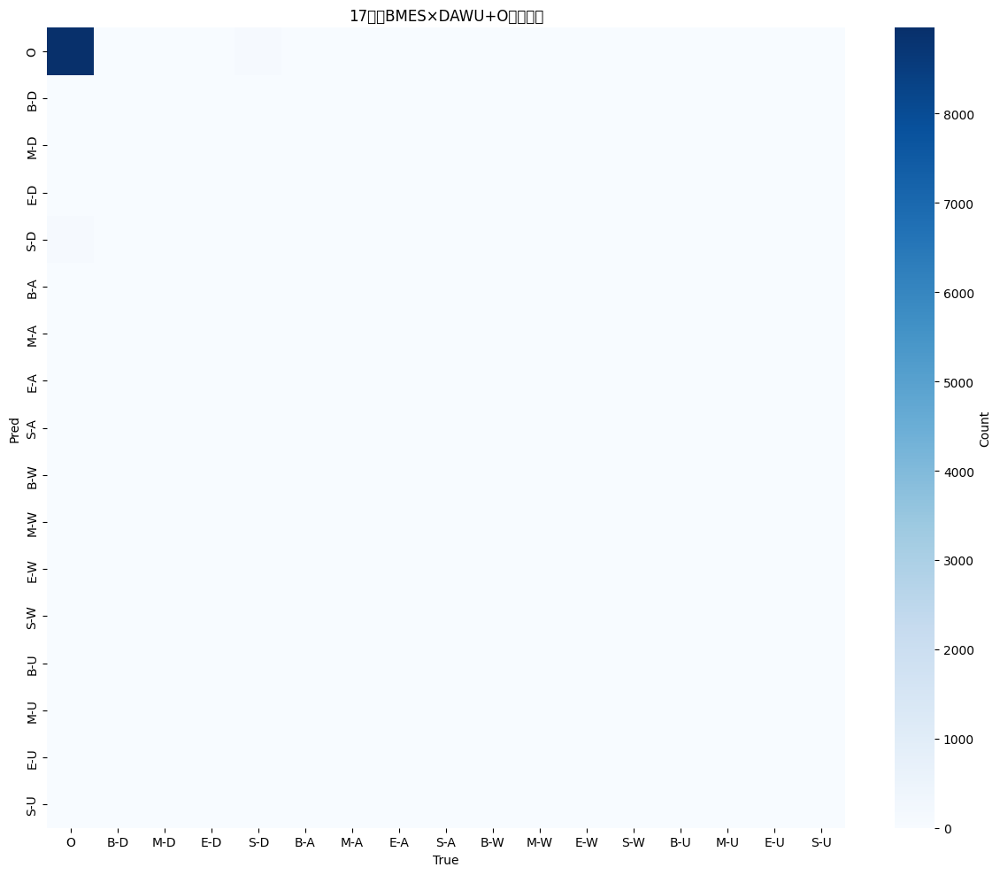

✓ 混淆矩陣已儲存: /content/drive/MyDrive/few-shot/DER_two_stage_489/cm_17_test.png

5類（DAWU+O）測試集 分類報告
              precision    recall  f1-score   support

           O     0.9730    0.9827    0.9778      9120
           D     0.0682    0.0533    0.0598       169
           A     0.0000    0.0000    0.0000        21
           W     0.0323    0.0182    0.0233        55
           U     0.0000    0.0000    0.0000        17

    accuracy                         0.9563      9382
   macro avg     0.2147    0.2108    0.2122      9382
weighted avg     0.9472    0.9563    0.9517      9382



/tmp/ipython-input-1264181905.py:875: UserWarning: Glyph 39006 (\N{CJK UNIFIED IDEOGRAPH-985E}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-1264181905.py:875: UserWarning: Glyph 65288 (\N{FULLWIDTH LEFT PARENTHESIS}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-1264181905.py:875: UserWarning: Glyph 65289 (\N{FULLWIDTH RIGHT PARENTHESIS}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-1264181905.py:875: UserWarning: Glyph 28204 (\N{CJK UNIFIED IDEOGRAPH-6E2C}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-1264181905.py:875: UserWarning: Glyph 35430 (\N{CJK UNIFIED IDEOGRAPH-8A66}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-1264181905.py:875: UserWarning: Glyph 38598 (\N{CJK UNIFIED IDEOGRAPH-96C6}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-1264181905.py:877: UserWarning: Glyph 39006 (\N{CJK UNIFIED IDEOGRAPH-985E

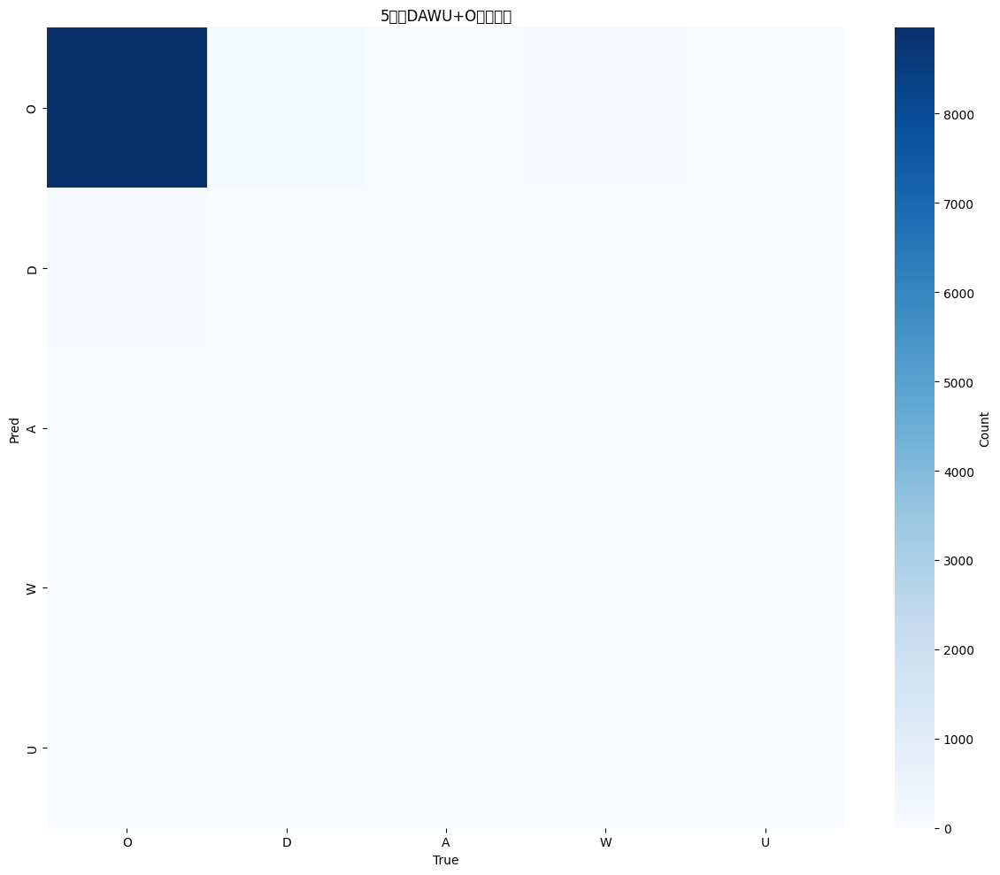

/tmp/ipython-input-1264181905.py:875: UserWarning: Glyph 39006 (\N{CJK UNIFIED IDEOGRAPH-985E}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-1264181905.py:875: UserWarning: Glyph 65288 (\N{FULLWIDTH LEFT PARENTHESIS}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-1264181905.py:875: UserWarning: Glyph 65289 (\N{FULLWIDTH RIGHT PARENTHESIS}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-1264181905.py:875: UserWarning: Glyph 28204 (\N{CJK UNIFIED IDEOGRAPH-6E2C}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-1264181905.py:875: UserWarning: Glyph 35430 (\N{CJK UNIFIED IDEOGRAPH-8A66}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-1264181905.py:875: UserWarning: Glyph 38598 (\N{CJK UNIFIED IDEOGRAPH-96C6}) missing from font(s) DejaVu Sans.
  plt.tight_layout()


✓ 混淆矩陣已儲存: /content/drive/MyDrive/few-shot/DER_two_stage_489/cm_5_test.png

2類（SYM vs O）測試集 分類報告
              precision    recall  f1-score   support

           O     0.9730    0.9827    0.9778      9120
         SYM     0.0760    0.0496    0.0600       262

    accuracy                         0.9566      9382
   macro avg     0.5245    0.5161    0.5189      9382
weighted avg     0.9479    0.9566    0.9522      9382



/tmp/ipython-input-1264181905.py:877: UserWarning: Glyph 39006 (\N{CJK UNIFIED IDEOGRAPH-985E}) missing from font(s) DejaVu Sans.
  plt.savefig(path, dpi=300); plt.show()
/tmp/ipython-input-1264181905.py:877: UserWarning: Glyph 65288 (\N{FULLWIDTH LEFT PARENTHESIS}) missing from font(s) DejaVu Sans.
  plt.savefig(path, dpi=300); plt.show()
/tmp/ipython-input-1264181905.py:877: UserWarning: Glyph 65289 (\N{FULLWIDTH RIGHT PARENTHESIS}) missing from font(s) DejaVu Sans.
  plt.savefig(path, dpi=300); plt.show()
/tmp/ipython-input-1264181905.py:877: UserWarning: Glyph 28204 (\N{CJK UNIFIED IDEOGRAPH-6E2C}) missing from font(s) DejaVu Sans.
  plt.savefig(path, dpi=300); plt.show()
/tmp/ipython-input-1264181905.py:877: UserWarning: Glyph 35430 (\N{CJK UNIFIED IDEOGRAPH-8A66}) missing from font(s) DejaVu Sans.
  plt.savefig(path, dpi=300); plt.show()
/tmp/ipython-input-1264181905.py:877: UserWarning: Glyph 38598 (\N{CJK UNIFIED IDEOGRAPH-96C6}) missing from font(s) DejaVu Sans.
  plt.savefig(

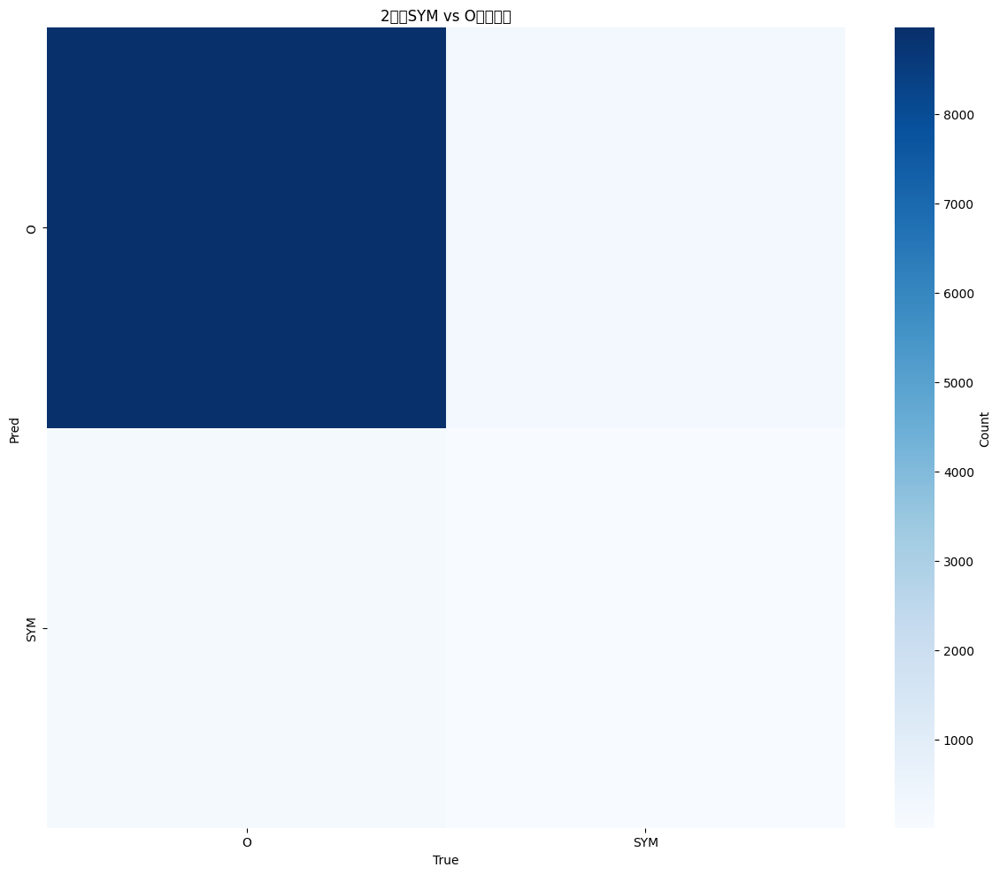

✓ 混淆矩陣已儲存: /content/drive/MyDrive/few-shot/DER_two_stage_489/cm_2_test.png

17類別詳細指標:
標籤          Precision     Recall   F1-Score    Support
------------------------------------------------------------
O              0.9730     0.9827     0.9778       9120
B-D            0.0000     0.0000     0.0000         20
M-D            0.0000     0.0000     0.0000          9
E-D            0.5000     0.0588     0.1053         17
S-D            0.0480     0.0488     0.0484        123
B-A            0.0000     0.0000     0.0000          3
M-A            0.0000     0.0000     0.0000          0
E-A            0.0000     0.0000     0.0000          3
S-A            0.0000     0.0000     0.0000         15
B-W            0.0000     0.0000     0.0000          9
M-W            0.0000     0.0000     0.0000          5
E-W            0.0000     0.0000     0.0000          9
S-W            0.0000     0.0000     0.0000         32
B-U            0.0000     0.0000     0.0000          5
M-U            0.0000     0.

In [ ]:
# ============================================
# 兩階段課程式訓練（Stage1: 5類 AutoModelForTokenClassification → Stage2: 17類 BiLSTM+CRF）
# 針對小資料集強化：anchor_nonO + 類型切段 + 連續加權過採樣 + 早停/長程
# 評估：17/5/2 token-F1 + span-F1（Stage2）；Stage1 監測 5/2 類
# ============================================

# ---- 0. 安裝套件（Colab 第一次執行需要）----
!pip -q install transformers==4.44.2 torchcrf==1.1.0 seqeval==1.2.2

# ---- 1. 匯入 ----
import os, csv, random
from collections import Counter
import numpy as np
import pandas as pd
from tqdm.auto import tqdm

import torch
import torch.nn as nn
from torch.utils.data import Dataset, DataLoader, WeightedRandomSampler

from transformers import (
    AutoTokenizer, AutoModelForTokenClassification, BertTokenizerFast, BertModel
)
from torchcrf import CRF

from sklearn.metrics import accuracy_score, f1_score, classification_report, confusion_matrix, precision_recall_fscore_support
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt
import seaborn as sns

# ---- 2. 設定 ----
CONFIG = {
    # 路徑設定（請改成你的實際路徑）
    "encoder_dir": "/content/drive/MyDrive/few-shot/chinese_mentalbert_finetuned_results_simplified/final_model",
    "data_path": "/content/drive/MyDrive/few-shot/noO_select_de.csv",
    "save_root": "/content/drive/MyDrive/few-shot/DER_two_stage_489",

    # 兩階段控制：stage1_5 或 stage2_17
    "stage": "stage2_17",

    # Stage1 儲存與承接設定
    "stage1_ckpt_dir": "/content/drive/MyDrive/few-shot/DER_two_stage_489/stage1_ckpt",
    "stage1_encoder_bin": "/content/drive/MyDrive/few-shot/DER_two_stage_489/stage1_encoder.bin",

    # ===== 核心資料策略 =====
    "window_policy_train": "keep_all",  #anchor_nonO 訓練：以非O為錨，延伸到BMES邊界
    "window_policy_eval":  "keep_all",     # 評估：保持完整避免偏差
    "use_sentence_split_train": False,  #True
    "use_sentence_split_eval":  False,  #True
    "split_on_transition_train": False,  #True   # 在 DAWU 類型切換處拆分
    "split_on_transition_eval":  False,

    # 視窗與長度
    "window_size": 128,
    "window_stride": 96,
    "min_nonO": 2,
    "min_nonO_ratio": 0.05,
    "anchor_ctx_left": 64,
    "anchor_ctx_right": 64,
    "max_len_for_split": 256,
    "max_length": 128,                     # Tokenizer 的 max_length

    # 過採樣策略（依非O密度連續加權；只用於訓練）
    "use_oversampling": True,
    "weight_floor": 0.15,
    "weight_gamma": 0.25,

    # 模型結構（Stage2 用）
    "use_bilstm": True,
    "lstm_hidden": 128,
    "lstm_layers": 1,
    "dropout": 0.4,

    # 解凍策略
    "unfreeze_last_n_layers": 2,
    "lr_encoder": 3e-5,
    "lr_head": 2e-4,

    # 訓練參數
    "batch_size": 8,
    "num_epochs": 50,
    "gradient_clip": 1.0,
    "weight_decay": 5e-3,
    "patience": 10,  # 早停耐心值（Stage1/Stage2 共用）
    "seed": 42,

    # 資料切分
    "test_ratio": 0.15,
    "val_ratio": 0.25
}

os.makedirs(CONFIG["save_root"], exist_ok=True)
os.makedirs(CONFIG["stage1_ckpt_dir"], exist_ok=True)

random.seed(CONFIG["seed"])
np.random.seed(CONFIG["seed"])
torch.manual_seed(CONFIG["seed"])
DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print("DEVICE:", DEVICE)

# ---- 3. 標籤系統 ----
LABELS_17 = [
    "O",
    "B-D","M-D","E-D","S-D",
    "B-A","M-A","E-A","S-A",
    "B-W","M-W","E-W","S-W",
    "B-U","M-U","E-U","S-U",
]
label2id = {lb:i for i,lb in enumerate(LABELS_17)}
id2label = {i:lb for lb,i in label2id.items()}

LABELS_5 = ["O","D","A","W","U"]
lab5_2id = {lb:i for i,lb in enumerate(LABELS_5)}
id2lab5 = {i:lb for lb,i in lab5_2id.items()}

LABELS_2 = ["O","SYM"]
lab2_2id = {lb:i for i,lb in enumerate(LABELS_2)}
id2lab2 = {i:lb for lb,i in lab2_2id.items()}

VALID_PREFIX = {"B","M","E","S"}
VALID_TYPE   = {"D","A","W","U"}

def normalize_bmes(raw):
    if pd.isna(raw): return "O"
    s = str(raw).strip().upper()
    if s=="O": return "O"
    if "-" in s:
        pfx,typ = s.split("-",1)
        pfx,typ = pfx.strip(), typ.strip()
        if pfx in VALID_PREFIX and typ in VALID_TYPE:
            return f"{pfx}-{typ}"
        return "O"
    if s in VALID_TYPE:
        return f"S-{s}"
    return "O"

def bmes_to_5(tag):
    if tag=="O": return "O"
    _, typ = tag.split("-",1)
    return typ if typ in {"D","A","W","U"} else "O"

def bmes_to_2(tag):
    return "O" if tag=="O" else "SYM"

def ids17_to_ids5(ids17):
    return [lab5_2id[bmes_to_5(id2label[i])] for i in ids17]

# ---- 4. 載入資料 ----
def load_data(fp):
    df = pd.read_csv(fp, encoding="utf-8", quoting=csv.QUOTE_ALL, on_bad_lines="warn")
    df = df[df.columns[:9].tolist()]  # 與你原流程一致（保留前9欄）
    df["bmes"] = df["human_label"].apply(normalize_bmes)
    return df

df = load_data(CONFIG["data_path"])
print(f"原始資料列數: {len(df)}")

def group_by_post(df):
    data=[]
    for pid,g in df.groupby("post_id"):
        if "word_order" in g.columns:
            g = g.sort_values("word_order")
        words  = g["word"].astype(str).tolist()
        labels = g["bmes"].astype(str).tolist()
        if len(words)==0 or len(words)!=len(labels):
            continue
        data.append({"post_id": str(pid), "words": words, "labels": [label2id.get(t,0) for t in labels]})
    return data

all_data = group_by_post(df)
print(f"貼文數量: {len(all_data)}")

# 切分資料（以 post 為單位）
train_val, test_data = train_test_split(all_data, test_size=CONFIG["test_ratio"], random_state=CONFIG["seed"], shuffle=True)
train_data, val_data = train_test_split(train_val, test_size=CONFIG["val_ratio"], random_state=CONFIG["seed"], shuffle=True)

# ---- 5. 視窗策略 ----
def id_is_O(tid):
    return id2label[tid] == "O"

def id_type(tid):
    lb = id2label[tid]
    if lb == "O": return "O", None
    pfx, typ = lb.split("-", 1)
    return pfx, typ

def extend_to_bmes_boundary(labels, start_idx, end_idx):
    # 左延
    i = start_idx
    pfx, typ = id_type(labels[i])
    if pfx in {"M","E"} and typ is not None:
        j = i
        while j >= 0:
            p,t = id_type(labels[j])
            if p == "B" and t == typ:
                i = j; break
            j -= 1
        start_idx = max(0, i)
    # 右延
    k = end_idx
    pfx, typ = id_type(labels[k])
    if pfx in {"B","M"} and typ is not None:
        j = k
        while j < len(labels):
            p,t = id_type(labels[j])
            if p == "E" and t == typ:
                k = j; break
            j += 1
        end_idx = min(len(labels)-1, k)
    return start_idx, end_idx

def windowize_keep_all(words, labels, win=128, stride=96):
    L = len(words)
    if L <= win:
        return [(words, labels)]
    out = []
    i = 0
    while i < L:
        j = min(i+win, L)
        out.append((words[i:j], labels[i:j]))
        if j == L: break
        i += stride
    return out

def windowize_filter_nonO(words, labels, win=128, stride=96, min_nonO=1, min_ratio=0.0):
    out = []
    for w, y in windowize_keep_all(words, labels, win, stride):
        nonO = sum(1 for t in y if not id_is_O(t))
        if nonO >= min_nonO or (nonO/len(y)) >= min_ratio:
            out.append((w, y))
    return out if out else [(words[:win], labels[:win])]

def sentence_split(words, labels):
    sents = []
    start = 0
    punct = set("。！？!?…;；")
    for i, w in enumerate(words):
        if any(ch in punct for ch in w):
            sents.append((words[start:i+1], labels[start:i+1]))
            start = i+1
    if start < len(words):
        sents.append((words[start:], labels[start:]))
    return sents if sents else [(words, labels)]

def windowize_anchor_by_nonO(words, labels, win=128, ctx_left=48, ctx_right=48):
    L = len(words)
    nonO_idx = [i for i,t in enumerate(labels) if not id_is_O(t)]
    if not nonO_idx:
        j = min(win, L)
        return [(words[:j], labels[:j])]
    segs = []
    for i in nonO_idx:
        s = max(0, i-ctx_left)
        e = min(L-1, i+ctx_right)
        s, e = extend_to_bmes_boundary(labels, s, e)
        segs.append([s, e])
    # 合併重疊片段
    segs.sort()
    merged = []
    for s,e in segs:
        if not merged or s > merged[-1][1] + 5:
            merged.append([s,e])
        else:
            merged[-1][1] = max(merged[-1][1], e)
    out = [(words[s:e+1], labels[s:e+1]) for s,e in merged]
    return out

def split_on_type_transition(words, labels, max_len=256):
    out = []
    start = 0
    def typ_of(idx):
        p,t = id_type(labels[idx])
        return t
    for i in range(1, len(labels)):
        t_prev = typ_of(i-1)
        t_now  = typ_of(i)
        p_prev,_ = id_type(labels[i-1])
        if (p_prev in {"S","E"}) and (t_prev != t_now):
            out.append((words[start:i], labels[start:i]))
            start = i
    if start < len(labels):
        out.append((words[start:], labels[start:]))
    # 長段再二次視窗
    final = []
    for w, y in out:
        if len(y) > max_len:
            final.extend(windowize_keep_all(w, y, win=max_len, stride=max_len//2))
        else:
            final.append((w, y))
    return final

def build_dataset_with_policy(raw_posts, policy="keep_all",
                              win=128, stride=96,
                              min_nonO=1, min_ratio=0.0,
                              ctx_left=48, ctx_right=48,
                              use_sentence_split=False,
                              split_on_transition=False,
                              max_len_for_split=256):
    data = []
    for d in raw_posts:
        words, y = d["words"], d["labels"]
        chunks = [(words, y)]
        if use_sentence_split:
            chunks = sentence_split(words, y)
        subouts = []
        for w, lab in chunks:
            if policy == "keep_all":
                Ws = windowize_keep_all(w, lab, win, stride)
            elif policy == "filter_nonO":
                Ws = windowize_filter_nonO(w, lab, win, stride, min_nonO, min_ratio)
            elif policy == "anchor_nonO":
                Ws = windowize_anchor_by_nonO(w, lab, win, ctx_left, ctx_right)
            else:
                raise ValueError(f"Unknown policy: {policy}")
            if split_on_transition:
                tmp = []
                for ww, ll in Ws:
                    tmp.extend(split_on_type_transition(ww, ll, max_len=max_len_for_split))
                Ws = tmp
            subouts.extend(Ws)
        for ww, ll in subouts:
            data.append({"post_id": d["post_id"], "words": ww, "labels": ll})
    return data

# ---- 6. 產生訓練/驗證/測試集 ----
train_data = build_dataset_with_policy(
    train_data,
    policy=CONFIG["window_policy_train"],
    win=CONFIG["window_size"],
    stride=CONFIG["window_stride"],
    min_nonO=CONFIG["min_nonO"],
    min_ratio=CONFIG["min_nonO_ratio"],
    ctx_left=CONFIG["anchor_ctx_left"],
    ctx_right=CONFIG["anchor_ctx_right"],
    use_sentence_split=CONFIG["use_sentence_split_train"],
    split_on_transition=CONFIG["split_on_transition_train"],
    max_len_for_split=CONFIG["max_len_for_split"]
)
val_data = build_dataset_with_policy(
    val_data,
    policy=CONFIG["window_policy_eval"],
    win=CONFIG["window_size"],
    stride=CONFIG["window_stride"],
    use_sentence_split=CONFIG["use_sentence_split_eval"],
    split_on_transition=CONFIG["split_on_transition_eval"],
    max_len_for_split=CONFIG["max_len_for_split"]
)
test_data = build_dataset_with_policy(
    test_data,
    policy=CONFIG["window_policy_eval"],
    win=CONFIG["window_size"],
    stride=CONFIG["window_stride"],
    use_sentence_split=CONFIG["use_sentence_split_eval"],
    split_on_transition=CONFIG["split_on_transition_eval"],
    max_len_for_split=CONFIG["max_len_for_split"]
)

print(f"訓練集={len(train_data)} | 驗證集={len(val_data)} | 測試集={len(test_data)}")

# ---- 7. 資料分析 ----
def analyze_dataset(data, name="Dataset"):
    print(f"\n{'='*60}\n📊 {name} 分析\n{'='*60}")
    total_tokens = sum(len(d["labels"]) for d in data)
    total_samples = len(data)
    label_counts = Counter()
    for d in data:
        label_counts.update(d["labels"])
    print(f"樣本數: {total_samples}")
    print(f"總 token 數: {total_tokens}")
    print(f"平均長度: {total_tokens/total_samples:.1f}")
    print(f"\n標籤分布（Top 10）:")
    for lid, cnt in label_counts.most_common(10):
        ratio = cnt/total_tokens*100
        print(f"  {id2label[lid]:8s}: {cnt:6d} ({ratio:5.2f}%)")
    nonO_ratios = [sum(1 for t in d["labels"] if t!=0)/len(d["labels"]) for d in data]
    print(f"\n非O密度統計:")
    print(f"  平均: {np.mean(nonO_ratios):.3f}")
    print(f"  中位數: {np.median(nonO_ratios):.3f}")
    print(f"  最小: {np.min(nonO_ratios):.3f}")
    print(f"  最大: {np.max(nonO_ratios):.3f}")
    all_O = sum(1 for d in data if all(t==0 for t in d["labels"]))
    print(f"  全O樣本: {all_O}/{total_samples} ({all_O/total_samples*100:.1f}%)")

analyze_dataset(train_data, "訓練集")
analyze_dataset(val_data, "驗證集")
analyze_dataset(test_data, "測試集")

# ---- 8. Tokenizer ----
# 為確保 Stage1/Stage2 一致，統一用 AutoTokenizer（MentalBERT 相容）
tokenizer = AutoTokenizer.from_pretrained(CONFIG["encoder_dir"])
# 另外準備 BertTokenizerFast/BertModel 給 Stage2
bert_tokenizer = BertTokenizerFast.from_pretrained(CONFIG["encoder_dir"])

# ---- 9. Dataset/Loader（支援 5/17 類）----
class TokenClsDataset(Dataset):
    def __init__(self, data, tokenizer, max_length=128, label_space="17"):
        self.data = data
        self.tok = tokenizer
        self.max_length = max_length
        assert label_space in {"17","5"}
        self.label_space = label_space

    def __len__(self):
        return len(self.data)

    def __getitem__(self, idx):
        item = self.data[idx]
        enc = self.tok(
            item["words"],
            is_split_into_words=True,
            truncation=True,
            padding="max_length",
            max_length=self.max_length,
            return_offsets_mapping=False,
            return_tensors="pt"
        )
        word_ids = enc.word_ids()
        lab17 = item["labels"]
        if self.label_space == "5":
            lab5 = ids17_to_ids5(lab17)
        labels_ids = []
        prev = None
        for w_idx in word_ids:
            if w_idx is None:
                labels_ids.append(-100)
            elif w_idx != prev:
                if w_idx < len(lab17):
                    labels_ids.append(lab5[w_idx] if self.label_space=="5" else lab17[w_idx])
                else:
                    labels_ids.append(-100)
            else:
                labels_ids.append(-100)
            prev = w_idx
        enc = {k:v.squeeze(0) for k,v in enc.items()}
        enc["labels"] = torch.tensor(labels_ids, dtype=torch.long)
        return enc

# 過採樣（依非O密度；只用於訓練）
O_ID = label2id["O"]
def seq_weights_by_nonO_ratio(raw_data, floor=0.05, gamma=0.5):
    w = []
    for d in raw_data:
        r = sum(1 for t in d["labels"] if t!=O_ID) / max(1, len(d["labels"]))
        w.append(floor + (r**gamma))
    s = sum(w)
    return [x/s for x in w]

def make_loaders(label_space):
    ds_train = TokenClsDataset(train_data, tokenizer, CONFIG["max_length"], label_space=label_space)
    ds_val   = TokenClsDataset(val_data,   tokenizer, CONFIG["max_length"], label_space=label_space)
    ds_test  = TokenClsDataset(test_data,  tokenizer, CONFIG["max_length"], label_space=label_space)

    if CONFIG["use_oversampling"]:
        weights = seq_weights_by_nonO_ratio(train_data, CONFIG["weight_floor"], CONFIG["weight_gamma"])
        sampler = WeightedRandomSampler(weights=weights, num_samples=len(weights), replacement=True)
        ld_train = DataLoader(ds_train, batch_size=CONFIG["batch_size"], sampler=sampler)
    else:
        ld_train = DataLoader(ds_train, batch_size=CONFIG["batch_size"], shuffle=True)
    ld_val  = DataLoader(ds_val,  batch_size=CONFIG["batch_size"], shuffle=False)
    ld_test = DataLoader(ds_test, batch_size=CONFIG["batch_size"], shuffle=False)
    return ds_train, ds_val, ds_test, ld_train, ld_val, ld_test

# ---- 10. 解凍工具（BERT/AutoModel 共用）----
def unfreeze_last_n_layers_of_bert(model_or_encoder, n=0):
    """
    支援:
      - AutoModelForTokenClassification（使用 .base_model.encoder.layer）
      - BertModel（使用 .encoder.layer）
    """
    # 先全部凍結
    for p in model_or_encoder.parameters():
        p.requires_grad = False
    if n <= 0:
        model_or_encoder.eval()
        return

    def mark_trainable(named_params, layer_keyword_list):
        for name, p in named_params:
            if any(kw in name for kw in layer_keyword_list):
                p.requires_grad = True

    # 嘗試抓到 encoder 層數
    try:
        if hasattr(model_or_encoder, "config"):
            L = model_or_encoder.config.num_hidden_layers
        elif hasattr(model_or_encoder, "base_model") and hasattr(model_or_encoder.base_model, "config"):
            L = model_or_encoder.base_model.config.num_hidden_layers
        else:
            L = 12
    except:
        L = 12
    target_idxs = list(range(max(0, L-n), L))

    # 兩種命名空間皆處理
    layer_keywords = [f"encoder.layer.{i}." for i in target_idxs] + ["pooler."]
    mark_trainable(model_or_encoder.named_parameters(), layer_keywords)
    model_or_encoder.train()

# ---- 11. Stage1：5 類 AutoModelForTokenClassification ----
def train_stage1():
    ds_tr, ds_va, ds_te, ld_tr, ld_va, ld_te = make_loaders(label_space="5")

    # 建立模型
    model = AutoModelForTokenClassification.from_pretrained(
        CONFIG["encoder_dir"],
        num_labels=len(LABELS_5)
    ).to(DEVICE)

    # 解凍最後 N 層
    unfreeze_last_n_layers_of_bert(model.base_model, CONFIG["unfreeze_last_n_layers"])

    # 參數群組：被解凍 encoder vs head
    enc_params = [p for n,p in model.named_parameters() if n.startswith(model.base_model_prefix) and p.requires_grad]
    head_params= [p for n,p in model.named_parameters() if (not n.startswith(model.base_model_prefix)) and p.requires_grad]

    optimizer = torch.optim.AdamW([
        {"params": enc_params, "lr": CONFIG["lr_encoder"]},
        {"params": head_params, "lr": CONFIG["lr_head"]}
    ], weight_decay=CONFIG["weight_decay"])

    scheduler = torch.optim.lr_scheduler.StepLR(optimizer, step_size=40, gamma=0.5)

    best_val_loss = float("inf")
    patience_counter = 0
    history=[]

    for epoch in range(1, CONFIG["num_epochs"]+1):
        model.train()
        tr_loss=0.0; nb=0
        for batch in tqdm(ld_tr, desc=f"[Stage1] Epoch {epoch}/{CONFIG['num_epochs']}"):
            input_ids = batch["input_ids"].to(DEVICE)
            attention_mask = batch["attention_mask"].to(DEVICE)
            labels = batch["labels"].to(DEVICE)
            out = model(input_ids=input_ids, attention_mask=attention_mask, labels=labels)
            loss = out.loss
            optimizer.zero_grad()
            loss.backward()
            nn.utils.clip_grad_norm_(model.parameters(), CONFIG["gradient_clip"])
            optimizer.step()
            tr_loss += loss.item(); nb+=1
        scheduler.step()
        avg_tr = tr_loss/max(1,nb)

        # 驗證
        model.eval()
        with torch.no_grad():
            val_loss=0.0; nb2=0
            all_y=[]; all_p=[]
            for batch in ld_va:
                ids = batch["input_ids"].to(DEVICE)
                msk = batch["attention_mask"].to(DEVICE)
                y   = batch["labels"].to(DEVICE)
                out = model(input_ids=ids, attention_mask=msk, labels=y)
                val_loss += out.loss.item(); nb2+=1
                logits = out.logits
                preds = logits.argmax(-1)
                mask  = y.ne(-100)
                all_y.extend(y[mask].cpu().tolist())
                all_p.extend(preds[mask].cpu().tolist())
        val_loss = val_loss/max(1,nb2)
        acc5 = accuracy_score(all_y, all_p)
        f1_5 = f1_score(all_y, all_p, average="macro", zero_division=0)
        y2 = [0 if t==0 else 1 for t in all_y]  # 5類 id=0 對應 "O"
        p2 = [0 if t==0 else 1 for t in all_p]
        f1_2 = f1_score(y2, p2, average="macro", zero_division=0)
        history.append({"epoch":epoch,"train_loss":avg_tr,"val_loss":val_loss,"val_acc_5":acc5,"val_f1_5":f1_5,"val_f1_2":f1_2})
        print(f"Epoch {epoch}: TrainLoss={avg_tr:.4f} | ValLoss={val_loss:.4f} | Acc(5)={acc5:.4f} | F1(5)={f1_5:.4f} | F1(2)={f1_2:.4f}")

        # 早停
        if val_loss < best_val_loss:
            best_val_loss = val_loss
            patience_counter = 0
            # 儲存整個 Stage1 模型（之後可直接 from_pretrained）
            model.save_pretrained(CONFIG["stage1_ckpt_dir"])
            tokenizer.save_pretrained(CONFIG["stage1_ckpt_dir"])
            print("  ✅ 儲存 Stage1 模型至:", CONFIG["stage1_ckpt_dir"])
            # 另外單獨儲存 encoder 權重（供 Stage2 承接）
            base = getattr(model, "base_model", None)
            if base is None:
                # 某些架構用 model.bert
                base = getattr(model, "bert", None)
            if base is not None:
                torch.save(base.state_dict(), CONFIG["stage1_encoder_bin"])
                print("  ✅ 另存 encoder 權重至:", CONFIG["stage1_encoder_bin"])
        else:
            patience_counter += 1
            print(f"  ⏳ 未改善次數: {patience_counter}/{CONFIG['patience']}")
            if patience_counter >= CONFIG["patience"]:
                print(f"\n⏹️ Stage1 早停於 Epoch {epoch}")
                break

    # 測試（5 類）
    print("\n" + "="*60)
    print("📊 Stage1 測試（5 類）")
    print("="*60)
    # 載入最佳
    st1 = AutoModelForTokenClassification.from_pretrained(CONFIG["stage1_ckpt_dir"]).to(DEVICE)
    st1.eval()
    with torch.no_grad():
        all_y=[]; all_p=[]; test_loss=0.0; nb=0
        for batch in tqdm(make_loaders("5")[5], desc="[Stage1] Test"):  # ld_test
            ids = batch["input_ids"].to(DEVICE)
            msk = batch["attention_mask"].to(DEVICE)
            y   = batch["labels"].to(DEVICE)
            out = st1(input_ids=ids, attention_mask=msk, labels=y)
            test_loss += out.loss.item(); nb+=1
            preds = out.logits.argmax(-1)
            mask  = y.ne(-100)
            all_y.extend(y[mask].cpu().tolist())
            all_p.extend(preds[mask].cpu().tolist())
    test_loss /= max(1,nb)
    acc5 = accuracy_score(all_y, all_p)
    f1_5 = f1_score(all_y, all_p, average="macro", zero_division=0)
    y2 = [0 if t==0 else 1 for t in all_y]
    p2 = [0 if t==0 else 1 for t in all_p]
    f1_2 = f1_score(y2, p2, average="macro", zero_division=0)
    print(f"Loss(5): {test_loss:.4f} | Acc(5): {acc5:.4f} | F1(5): {f1_5:.4f} | F1(2): {f1_2:.4f}")

# ---- 12. Stage2：BERT(+BiLSTM)+CRF（17 類）----
class BERT_BiLSTM_CRF(nn.Module):
    def __init__(self, encoder, num_labels, use_bilstm=True, hidden=128, layers=1, dropout=0.3):
        super().__init__()
        self.encoder = encoder
        self.use_bilstm = use_bilstm
        hd = encoder.config.hidden_size
        if use_bilstm:
            self.lstm = nn.LSTM(
                input_size=hd, hidden_size=hidden, num_layers=layers,
                batch_first=True, bidirectional=True, dropout=dropout if layers>1 else 0.0
            )
            cls_in = hidden*2
        else:
            self.lstm = None
            cls_in = hd
        self.drop = nn.Dropout(dropout)
        self.fc   = nn.Linear(cls_in, num_labels)
        self.crf  = CRF(num_labels, batch_first=True)

        # 合法轉移初始化（BMES）
        with torch.no_grad():
            self.crf.start_transitions.fill_(-1.0)
            self.crf.end_transitions.fill_(-1.0)
            self.crf.transitions.fill_(-2.5)
            o = label2id["O"]
            self.crf.transitions[o, o] = 0.0
            for typ in ["D","A","W","U"]:
                b = label2id[f"B-{typ}"]; m = label2id[f"M-{typ}"]
                e = label2id[f"E-{typ}"]; s = label2id[f"S-{typ}"]
                self.crf.start_transitions[b] = 0.0
                self.crf.start_transitions[s] = 0.0
                self.crf.transitions[m, b] = 0.0
                self.crf.transitions[e, b] = 0.0
                self.crf.transitions[m, m] = 0.0
                self.crf.transitions[e, m] = 0.0
                self.crf.transitions[o, s] = 0.0
                self.crf.transitions[o, e] = 0.0
                # O 作中介
                self.crf.transitions[b, o] = 0.0
                self.crf.transitions[s, o] = 0.0

    def forward(self, input_ids, attention_mask, labels=None):
        outputs = self.encoder(input_ids=input_ids, attention_mask=attention_mask)
        x = outputs.last_hidden_state
        if self.use_bilstm:
            x,_ = self.lstm(x)
        x = self.drop(x)
        emissions = self.fc(x)
        mask = attention_mask.bool()
        if labels is not None:
            y = labels.clone()
            y[y==-100] = 0
            loss = -self.crf(emissions, y, mask=mask, reduction="mean")
            preds = self.crf.decode(emissions, mask=mask)
            return loss, preds
        else:
            preds = self.crf.decode(emissions, mask=mask)
            return preds

def decode_spans_bmes(tag_seq):
    spans=[]
    cur_type=None; start=None
    for i,tag in enumerate(tag_seq):
        if tag=="O":
            if cur_type is not None:
                spans.append((cur_type, start, i-1))
                cur_type=None; start=None
            continue
        pfx,typ = tag.split("-",1)
        if pfx=="S":
            spans.append((typ, i, i))
            cur_type=None; start=None
        elif pfx=="B":
            if cur_type is not None:
                spans.append((cur_type, start, i-1))
            cur_type=typ; start=i
        elif pfx=="M":
            if cur_type is None:
                cur_type=typ; start=i
        elif pfx=="E":
            if cur_type is None:
                cur_type=typ; start=i
            spans.append((typ, start, i))
            cur_type=None; start=None
    if cur_type is not None:
        spans.append((cur_type, start, len(tag_seq)-1))
    return spans

def span_f1_17(true_tags_17, pred_tags_17):
    tp=0; fp=0; fn=0
    for y_true, y_pred in zip(true_tags_17, pred_tags_17):
        T = decode_spans_bmes(y_true)
        P = decode_spans_bmes(y_pred)
        T_set = set(T); P_set = set(P)
        tp += len(T_set & P_set)
        fp += len(P_set - T_set)
        fn += len(T_set - P_set)
    prec = tp / max(1,(tp+fp))
    rec  = tp / max(1,(tp+fn))
    f1   = 2*prec*rec / max(1e-12,(prec+rec))
    return prec, rec, f1

@torch.no_grad()
def evaluate_stage2(model, loader, desc="Eval"):
    model.eval()
    all_true_17, all_pred_17 = [], []
    total_loss=0.0; nb=0
    for batch in tqdm(loader, desc=desc, leave=False):
        input_ids = batch["input_ids"].to(DEVICE)
        attention_mask = batch["attention_mask"].to(DEVICE)
        labels = batch["labels"].to(DEVICE)
        loss, preds = model(input_ids, attention_mask, labels=labels)
        total_loss += loss.item(); nb+=1
        for i, pred_seq in enumerate(preds):
            valid = (labels[i] != -100).cpu().numpy()
            y_t = labels[i].detach().cpu().numpy()[valid].tolist()
            y_p = pred_seq[:len(y_t)]
            all_true_17.extend(y_t); all_pred_17.extend(y_p)

    acc_17  = accuracy_score(all_true_17, all_pred_17)
    f1_17   = f1_score(all_true_17, all_pred_17, average="macro", zero_division=0)
    y_true_5 = ids17_to_ids5(all_true_17); y_pred_5 = ids17_to_ids5(all_pred_17)
    y_true_2 = [0 if t==0 else 1 for t in y_true_5]; y_pred_2 = [0 if t==0 else 1 for t in y_pred_5]
    f1_5  = f1_score(y_true_5, y_pred_5, average="macro", zero_division=0)
    f1_2  = f1_score(y_true_2, y_pred_2, average="macro", zero_division=0)

    # span-F1（以段落拼接近似）
    true_tags = [id2label[i] for i in all_true_17]
    pred_tags = [id2label[i] for i in all_pred_17]
    seg=200
    true_seqs=[true_tags[i:i+seg] for i in range(0,len(true_tags),seg)]
    pred_seqs=[pred_tags[i:i+seg] for i in range(0,len(pred_tags),seg)]
    p_span, r_span, f1_span = span_f1_17(true_seqs, pred_seqs)

    return {
        "loss": total_loss/max(1,nb),
        "acc_17": acc_17,
        "f1_17": f1_17,
        "f1_5":  f1_5,
        "f1_2":  f1_2,
        "span_p": p_span, "span_r": r_span, "span_f1": f1_span,
        "y_true_17": all_true_17, "y_pred_17": all_pred_17
    }

def train_stage2():
    # DataLoader（17 類空間）
    ds_tr, ds_va, ds_te, ld_tr, ld_va, ld_te = make_loaders(label_space="17")

    # 建立 BERT encoder，承接 Stage1 encoder 權重（若存在）
    encoder = BertModel.from_pretrained(CONFIG["encoder_dir"])
    if os.path.exists(CONFIG["stage1_encoder_bin"]):
        state = torch.load(CONFIG["stage1_encoder_bin"], map_location="cpu")
        missing, unexpected = encoder.load_state_dict(state, strict=False)
        print("✓ 載入 Stage1 encoder 權重 | missing:", len(missing), "| unexpected:", len(unexpected))
    else:
        print("⚠️ 找不到 Stage1 encoder 權重，改用原始 encoder")

    # 解凍最後 N 層
    unfreeze_last_n_layers_of_bert(encoder, CONFIG["unfreeze_last_n_layers"])

    # 建立模型
    model = BERT_BiLSTM_CRF(
        encoder=encoder, num_labels=len(LABELS_17),
        use_bilstm=CONFIG["use_bilstm"], hidden=CONFIG["lstm_hidden"],
        layers=CONFIG["lstm_layers"], dropout=CONFIG["dropout"]
    ).to(DEVICE)

    # 參數群組
    enc_params = [p for n,p in model.named_parameters() if n.startswith("encoder.") and p.requires_grad]
    head_params= [p for n,p in model.named_parameters() if (not n.startswith("encoder.")) and p.requires_grad]
    optimizer = torch.optim.AdamW([
        {"params": enc_params, "lr": CONFIG["lr_encoder"]},
        {"params": head_params, "lr": CONFIG["lr_head"]}
    ], weight_decay=CONFIG["weight_decay"])
    scheduler = torch.optim.lr_scheduler.StepLR(optimizer, step_size=40, gamma=0.5)

    best_val_loss = float("inf")
    patience_counter = 0
    history=[]

    for epoch in range(1, CONFIG["num_epochs"]+1):
        model.train()
        tr_loss=0.0; nb=0
        for batch in tqdm(ld_tr, desc=f"[Stage2] Epoch {epoch}/{CONFIG['num_epochs']}"):
            input_ids = batch["input_ids"].to(DEVICE)
            attention_mask = batch["attention_mask"].to(DEVICE)
            labels = batch["labels"].to(DEVICE)
            loss, _ = model(input_ids, attention_mask, labels=labels)
            optimizer.zero_grad()
            loss.backward()
            nn.utils.clip_grad_norm_(model.parameters(), CONFIG["gradient_clip"])
            optimizer.step()
            tr_loss += loss.item(); nb+=1
        scheduler.step()
        avg_tr = tr_loss/max(1,nb)

        # 驗證
        val_res = evaluate_stage2(model, ld_va, desc="驗證")
        history.append({
            "epoch": epoch,
            "train_loss": avg_tr,
            "val_loss": val_res["loss"],
            "val_acc_17": val_res["acc_17"],
            "val_f1_17": val_res["f1_17"],
            "val_f1_5":  val_res["f1_5"],
            "val_f1_2":  val_res["f1_2"],
            "val_span_f1": val_res["span_f1"]
        })
        print(f"Epoch {epoch}: TrainLoss={avg_tr:.4f} | ValLoss={val_res['loss']:.4f} | "
              f"F1(17)={val_res['f1_17']:.4f} | F1(5)={val_res['f1_5']:.4f} | "
              f"F1(2)={val_res['f1_2']:.4f} | Span-F1={val_res['span_f1']:.4f}")

        # 早停
        if val_res["loss"] < best_val_loss:
            best_val_loss = val_res["loss"]
            ckpt_path = os.path.join(CONFIG["save_root"], "stage2_best_DER_17_byValLoss.pt")
            torch.save({"model_state_dict": model.state_dict(), "best_val_loss": best_val_loss}, ckpt_path)
            print("  ✅ 儲存 Stage2 最佳模型 →", ckpt_path)
            patience_counter = 0
        else:
            patience_counter += 1
            print(f"  ⏳ 未改善次數: {patience_counter}/{CONFIG['patience']}")
            if patience_counter >= CONFIG["patience"]:
                print(f"\n⏹️ Stage2 早停於 Epoch {epoch}")
                break

    # 測試
    print("\n" + "="*60)
    print("📊 Stage2 測試（17 類）")
    print("="*60)
    ckpt_path = os.path.join(CONFIG["save_root"], "stage2_best_DER_17_byValLoss.pt")
    if os.path.exists(ckpt_path):
        ckpt = torch.load(ckpt_path, map_location=DEVICE)
        model.load_state_dict(ckpt["model_state_dict"])
        print(f"最佳模型 ValLoss={ckpt['best_val_loss']:.4f}")
    test_res = evaluate_stage2(model, ld_te, desc="測試")
    print(f"\nLoss     : {test_res['loss']:.4f}")
    print(f"Acc(17)  : {test_res['acc_17']:.4f}")
    print(f"F1(17)   : {test_res['f1_17']:.4f}")
    print(f"F1(5)    : {test_res['f1_5']:.4f}")
    print(f"F1(2)    : {test_res['f1_2']:.4f}")
    print(f"Span-F1  : {test_res['span_f1']:.4f}")

    # 報告與混淆矩陣（17/5/2）
    y_true_17 = test_res["y_true_17"]; y_pred_17 = test_res["y_pred_17"]
    def print_report_and_cm(y_true, y_pred, names, title, fname):
        print(f"\n{'='*60}\n{title} 分類報告\n{'='*60}")
        print(classification_report(
            y_true, y_pred, labels=list(range(len(names))), target_names=names, digits=4, zero_division=0
        ))
        cm = confusion_matrix(y_true, y_pred, labels=list(range(len(names))))
        plt.figure(figsize=(12,10))
        sns.heatmap(cm.T, annot=False, fmt='d', cmap='Blues',
                    xticklabels=names, yticklabels=names, cbar_kws={'label':'Count'})
        plt.xlabel("True"); plt.ylabel("Pred"); plt.title(title)
        plt.tight_layout()
        path = os.path.join(CONFIG["save_root"], fname)
        plt.savefig(path, dpi=300); plt.show()
        print("✓ 混淆矩陣已儲存:", path)

    print_report_and_cm(y_true_17, y_pred_17, LABELS_17, "17類（BMES×DAWU+O）測試集", "cm_17_test.png")
    y_true_5 = ids17_to_ids5(y_true_17); y_pred_5 = ids17_to_ids5(y_pred_17)
    print_report_and_cm(y_true_5, y_pred_5, LABELS_5, "5類（DAWU+O）測試集", "cm_5_test.png")
    y_true_2 = [0 if t==0 else 1 for t in y_true_5]; y_pred_2 = [0 if t==0 else 1 for t in y_pred_5]
    print_report_and_cm(y_true_2, y_pred_2, LABELS_2, "2類（SYM vs O）測試集", "cm_2_test.png")

    # 17類別詳細指標
    prec_17, rec_17, f1_17_per_class, _ = precision_recall_fscore_support(
        y_true_17, y_pred_17, labels=list(range(len(LABELS_17))), zero_division=0
    )
    print("\n17類別詳細指標:")
    print(f"{'標籤':<10} {'Precision':>10} {'Recall':>10} {'F1-Score':>10} {'Support':>10}")
    print("-"*60)
    label_support = Counter(y_true_17)
    for i, label in enumerate(LABELS_17):
        support = label_support[i]
        print(f"{label:<10} {prec_17[i]:>10.4f} {rec_17[i]:>10.4f} {f1_17_per_class[i]:>10.4f} {support:>10d}")

# ---- 13. 執行入口 ----
if CONFIG["stage"] == "stage1_5":
    train_stage1()
elif CONFIG["stage"] == "stage2_17":
    train_stage2()
else:
    raise ValueError("CONFIG['stage'] 需為 'stage1_5' 或 'stage2_17'")


DEVICE: cuda


/tmp/ipython-input-1977908771.py:152: DtypeWarning: Columns (10) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(fp, encoding="utf-8", quoting=csv.QUOTE_ALL, on_bad_lines="warn")


原始資料列數: 67051
貼文數量: 489
訓練集=554 | 驗證集=188 | 測試集=134

📊 訓練集 分析
樣本數: 554
總 token 數: 50024
平均長度: 90.3

標籤分布（Top 10）:
  O       :  48646 (97.25%)
  S-D     :    604 ( 1.21%)
  S-W     :    173 ( 0.35%)
  S-U     :     82 ( 0.16%)
  B-D     :     80 ( 0.16%)
  E-D     :     78 ( 0.16%)
  B-W     :     66 ( 0.13%)
  E-W     :     61 ( 0.12%)
  B-A     :     39 ( 0.08%)
  E-U     :     35 ( 0.07%)

非O密度統計:
  平均: 0.043
  中位數: 0.023
  最小: 0.000
  最大: 0.632
  全O樣本: 155/554 (28.0%)

📊 驗證集 分析
樣本數: 188
總 token 數: 16864
平均長度: 89.7

標籤分布（Top 10）:
  O       :  16368 (97.06%)
  S-D     :    216 ( 1.28%)
  S-W     :     82 ( 0.49%)
  S-U     :     27 ( 0.16%)
  B-W     :     26 ( 0.15%)
  E-W     :     25 ( 0.15%)
  E-D     :     23 ( 0.14%)
  B-D     :     21 ( 0.12%)
  B-U     :     18 ( 0.11%)
  E-U     :     17 ( 0.10%)

非O密度統計:
  平均: 0.045
  中位數: 0.023
  最小: 0.000
  最大: 0.500
  全O樣本: 47/188 (25.0%)

📊 測試集 分析
樣本數: 134
總 token 數: 12547
平均長度: 93.6

標籤分布（Top 10）:
  O       :  12243 (97.58%)
  S-D     :

Some weights of BertModel were not initialized from the model checkpoint at /content/drive/MyDrive/few-shot/chinese_mentalbert_finetuned_results_simplified/final_model and are newly initialized: ['bert.pooler.dense.bias', 'bert.pooler.dense.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


✓ 載入 Stage1 encoder 權重 | missing: 2 | unexpected: 0


[Stage2] Epoch 1/50:   0%|          | 0/70 [00:00<?, ?it/s]

驗證:   0%|          | 0/24 [00:00<?, ?it/s]

Epoch 1: TrainLoss=35.8384 | ValLoss=16.7681 | F1(17)=0.0591 | F1(5)=0.2140 | F1(2)=0.5113 | Span-F1=0.0339
  ✅ 儲存 Stage2 最佳模型 → /content/drive/MyDrive/few-shot/DER_two_stage_489/stage2_best_DER_17_byValLoss.pt


[Stage2] Epoch 2/50:   0%|          | 0/70 [00:00<?, ?it/s]

驗證:   0%|          | 0/24 [00:00<?, ?it/s]

Epoch 2: TrainLoss=19.6112 | ValLoss=13.1869 | F1(17)=0.0631 | F1(5)=0.2215 | F1(2)=0.5098 | Span-F1=0.0277
  ✅ 儲存 Stage2 最佳模型 → /content/drive/MyDrive/few-shot/DER_two_stage_489/stage2_best_DER_17_byValLoss.pt


[Stage2] Epoch 3/50:   0%|          | 0/70 [00:00<?, ?it/s]

驗證:   0%|          | 0/24 [00:00<?, ?it/s]

Epoch 3: TrainLoss=16.2453 | ValLoss=12.5049 | F1(17)=0.0615 | F1(5)=0.2197 | F1(2)=0.5109 | Span-F1=0.0254
  ✅ 儲存 Stage2 最佳模型 → /content/drive/MyDrive/few-shot/DER_two_stage_489/stage2_best_DER_17_byValLoss.pt


[Stage2] Epoch 4/50:   0%|          | 0/70 [00:00<?, ?it/s]

驗證:   0%|          | 0/24 [00:00<?, ?it/s]

Epoch 4: TrainLoss=13.8837 | ValLoss=11.6054 | F1(17)=0.0621 | F1(5)=0.2192 | F1(2)=0.5071 | Span-F1=0.0204
  ✅ 儲存 Stage2 最佳模型 → /content/drive/MyDrive/few-shot/DER_two_stage_489/stage2_best_DER_17_byValLoss.pt


[Stage2] Epoch 5/50:   0%|          | 0/70 [00:00<?, ?it/s]

驗證:   0%|          | 0/24 [00:00<?, ?it/s]

Epoch 5: TrainLoss=13.3979 | ValLoss=11.5053 | F1(17)=0.0596 | F1(5)=0.2155 | F1(2)=0.5059 | Span-F1=0.0196
  ✅ 儲存 Stage2 最佳模型 → /content/drive/MyDrive/few-shot/DER_two_stage_489/stage2_best_DER_17_byValLoss.pt


[Stage2] Epoch 6/50:   0%|          | 0/70 [00:00<?, ?it/s]

驗證:   0%|          | 0/24 [00:00<?, ?it/s]

Epoch 6: TrainLoss=11.2255 | ValLoss=11.9429 | F1(17)=0.0651 | F1(5)=0.2197 | F1(2)=0.5155 | Span-F1=0.0308
  ⏳ 未改善次數: 1/10


[Stage2] Epoch 7/50:   0%|          | 0/70 [00:00<?, ?it/s]

驗證:   0%|          | 0/24 [00:00<?, ?it/s]

Epoch 7: TrainLoss=10.9673 | ValLoss=11.0625 | F1(17)=0.0636 | F1(5)=0.2252 | F1(2)=0.5056 | Span-F1=0.0291
  ✅ 儲存 Stage2 最佳模型 → /content/drive/MyDrive/few-shot/DER_two_stage_489/stage2_best_DER_17_byValLoss.pt


[Stage2] Epoch 8/50:   0%|          | 0/70 [00:00<?, ?it/s]

驗證:   0%|          | 0/24 [00:00<?, ?it/s]

Epoch 8: TrainLoss=8.7630 | ValLoss=10.5958 | F1(17)=0.0596 | F1(5)=0.2165 | F1(2)=0.5048 | Span-F1=0.0199
  ✅ 儲存 Stage2 最佳模型 → /content/drive/MyDrive/few-shot/DER_two_stage_489/stage2_best_DER_17_byValLoss.pt


[Stage2] Epoch 9/50:   0%|          | 0/70 [00:00<?, ?it/s]

驗證:   0%|          | 0/24 [00:00<?, ?it/s]

Epoch 9: TrainLoss=8.2146 | ValLoss=10.6434 | F1(17)=0.0597 | F1(5)=0.2135 | F1(2)=0.5090 | Span-F1=0.0262
  ⏳ 未改善次數: 1/10


[Stage2] Epoch 10/50:   0%|          | 0/70 [00:00<?, ?it/s]

驗證:   0%|          | 0/24 [00:00<?, ?it/s]

Epoch 10: TrainLoss=6.3400 | ValLoss=10.7547 | F1(17)=0.0609 | F1(5)=0.2179 | F1(2)=0.5084 | Span-F1=0.0236
  ⏳ 未改善次數: 2/10


[Stage2] Epoch 11/50:   0%|          | 0/70 [00:00<?, ?it/s]

驗證:   0%|          | 0/24 [00:00<?, ?it/s]

Epoch 11: TrainLoss=5.6353 | ValLoss=11.0170 | F1(17)=0.0638 | F1(5)=0.2208 | F1(2)=0.5089 | Span-F1=0.0261
  ⏳ 未改善次數: 3/10


[Stage2] Epoch 12/50:   0%|          | 0/70 [00:00<?, ?it/s]

驗證:   0%|          | 0/24 [00:00<?, ?it/s]

Epoch 12: TrainLoss=4.5326 | ValLoss=11.3041 | F1(17)=0.0606 | F1(5)=0.2184 | F1(2)=0.5111 | Span-F1=0.0265
  ⏳ 未改善次數: 4/10


[Stage2] Epoch 13/50:   0%|          | 0/70 [00:00<?, ?it/s]

驗證:   0%|          | 0/24 [00:00<?, ?it/s]

Epoch 13: TrainLoss=4.5039 | ValLoss=11.0249 | F1(17)=0.0646 | F1(5)=0.2234 | F1(2)=0.5095 | Span-F1=0.0266
  ⏳ 未改善次數: 5/10


[Stage2] Epoch 14/50:   0%|          | 0/70 [00:00<?, ?it/s]

驗證:   0%|          | 0/24 [00:00<?, ?it/s]

Epoch 14: TrainLoss=4.9020 | ValLoss=11.4594 | F1(17)=0.0627 | F1(5)=0.2188 | F1(2)=0.5049 | Span-F1=0.0190
  ⏳ 未改善次數: 6/10


[Stage2] Epoch 15/50:   0%|          | 0/70 [00:00<?, ?it/s]

驗證:   0%|          | 0/24 [00:00<?, ?it/s]

Epoch 15: TrainLoss=3.3748 | ValLoss=10.9591 | F1(17)=0.0644 | F1(5)=0.2227 | F1(2)=0.5089 | Span-F1=0.0250
  ⏳ 未改善次數: 7/10


[Stage2] Epoch 16/50:   0%|          | 0/70 [00:00<?, ?it/s]

驗證:   0%|          | 0/24 [00:00<?, ?it/s]

Epoch 16: TrainLoss=3.7573 | ValLoss=12.5310 | F1(17)=0.0636 | F1(5)=0.2223 | F1(2)=0.5087 | Span-F1=0.0171
  ⏳ 未改善次數: 8/10


[Stage2] Epoch 17/50:   0%|          | 0/70 [00:00<?, ?it/s]

驗證:   0%|          | 0/24 [00:00<?, ?it/s]

Epoch 17: TrainLoss=3.3582 | ValLoss=13.5517 | F1(17)=0.0636 | F1(5)=0.2087 | F1(2)=0.5001 | Span-F1=0.0190
  ⏳ 未改善次數: 9/10


[Stage2] Epoch 18/50:   0%|          | 0/70 [00:00<?, ?it/s]

驗證:   0%|          | 0/24 [00:00<?, ?it/s]

Epoch 18: TrainLoss=3.3910 | ValLoss=13.1306 | F1(17)=0.0636 | F1(5)=0.2201 | F1(2)=0.5062 | Span-F1=0.0174
  ⏳ 未改善次數: 10/10

⏹️ Stage2 早停於 Epoch 18

📊 Stage2 測試（17 類）
最佳模型 ValLoss=10.5958


測試:   0%|          | 0/17 [00:00<?, ?it/s]


Loss     : 11.6078
Acc(17)  : 0.9572
F1(17)   : 0.0667
F1(5)    : 0.2131
F1(2)    : 0.5223
Span-F1  : 0.0315

17類（BMES×DAWU+O）測試集 分類報告
              precision    recall  f1-score   support

           O     0.9731    0.9839    0.9785      9120
         B-D     0.0000    0.0000    0.0000        20
         M-D     0.0000    0.0000    0.0000         9
         E-D     0.5000    0.0588    0.1053        17
         S-D     0.0517    0.0488    0.0502       123
         B-A     0.0000    0.0000    0.0000         3
         M-A     0.0000    0.0000    0.0000         0
         E-A     0.0000    0.0000    0.0000         3
         S-A     0.0000    0.0000    0.0000        15
         B-W     0.0000    0.0000    0.0000         9
         M-W     0.0000    0.0000    0.0000         5
         E-W     0.0000    0.0000    0.0000         9
         S-W     0.0000    0.0000    0.0000        32
         B-U     0.0000    0.0000    0.0000         5
         M-U     0.0000    0.0000    0.0000         1

/tmp/ipython-input-1977908771.py:939: UserWarning: Glyph 39006 (\N{CJK UNIFIED IDEOGRAPH-985E}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-1977908771.py:939: UserWarning: Glyph 65288 (\N{FULLWIDTH LEFT PARENTHESIS}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-1977908771.py:939: UserWarning: Glyph 65289 (\N{FULLWIDTH RIGHT PARENTHESIS}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-1977908771.py:939: UserWarning: Glyph 28204 (\N{CJK UNIFIED IDEOGRAPH-6E2C}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-1977908771.py:939: UserWarning: Glyph 35430 (\N{CJK UNIFIED IDEOGRAPH-8A66}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-1977908771.py:939: UserWarning: Glyph 38598 (\N{CJK UNIFIED IDEOGRAPH-96C6}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-1977908771.py:941: UserWarning: Glyph 39006 (\N{CJK UNIFIED IDEOGRAPH-985E

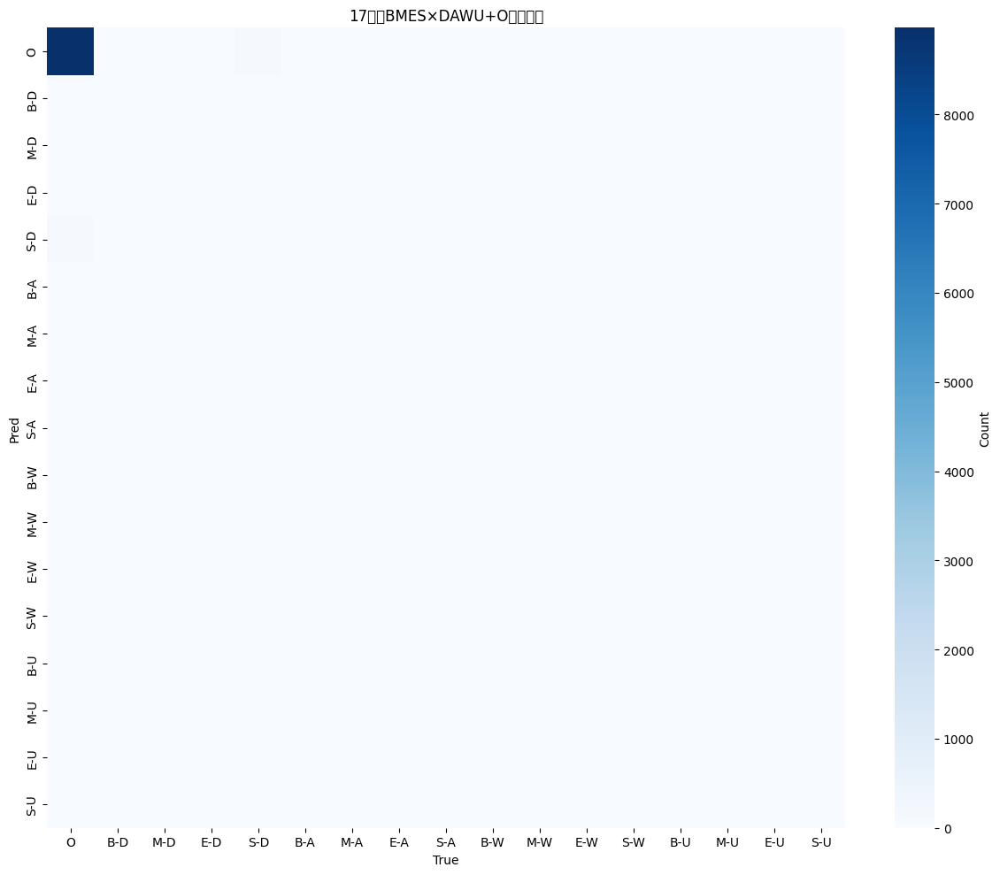

✓ 混淆矩陣已儲存: /content/drive/MyDrive/few-shot/DER_two_stage_489/cm_17_test.png

5類（DAWU+O）測試集 分類報告
              precision    recall  f1-score   support

           O     0.9731    0.9839    0.9785      9120
           D     0.0732    0.0533    0.0616       169
           A     0.0000    0.0000    0.0000        21
           W     0.0417    0.0182    0.0253        55
           U     0.0000    0.0000    0.0000        17

    accuracy                         0.9575      9382
   macro avg     0.2176    0.2111    0.2131      9382
weighted avg     0.9475    0.9575    0.9524      9382



/tmp/ipython-input-1977908771.py:939: UserWarning: Glyph 39006 (\N{CJK UNIFIED IDEOGRAPH-985E}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-1977908771.py:939: UserWarning: Glyph 65288 (\N{FULLWIDTH LEFT PARENTHESIS}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-1977908771.py:939: UserWarning: Glyph 65289 (\N{FULLWIDTH RIGHT PARENTHESIS}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-1977908771.py:939: UserWarning: Glyph 28204 (\N{CJK UNIFIED IDEOGRAPH-6E2C}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-1977908771.py:939: UserWarning: Glyph 35430 (\N{CJK UNIFIED IDEOGRAPH-8A66}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-1977908771.py:939: UserWarning: Glyph 38598 (\N{CJK UNIFIED IDEOGRAPH-96C6}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-1977908771.py:941: UserWarning: Glyph 39006 (\N{CJK UNIFIED IDEOGRAPH-985E

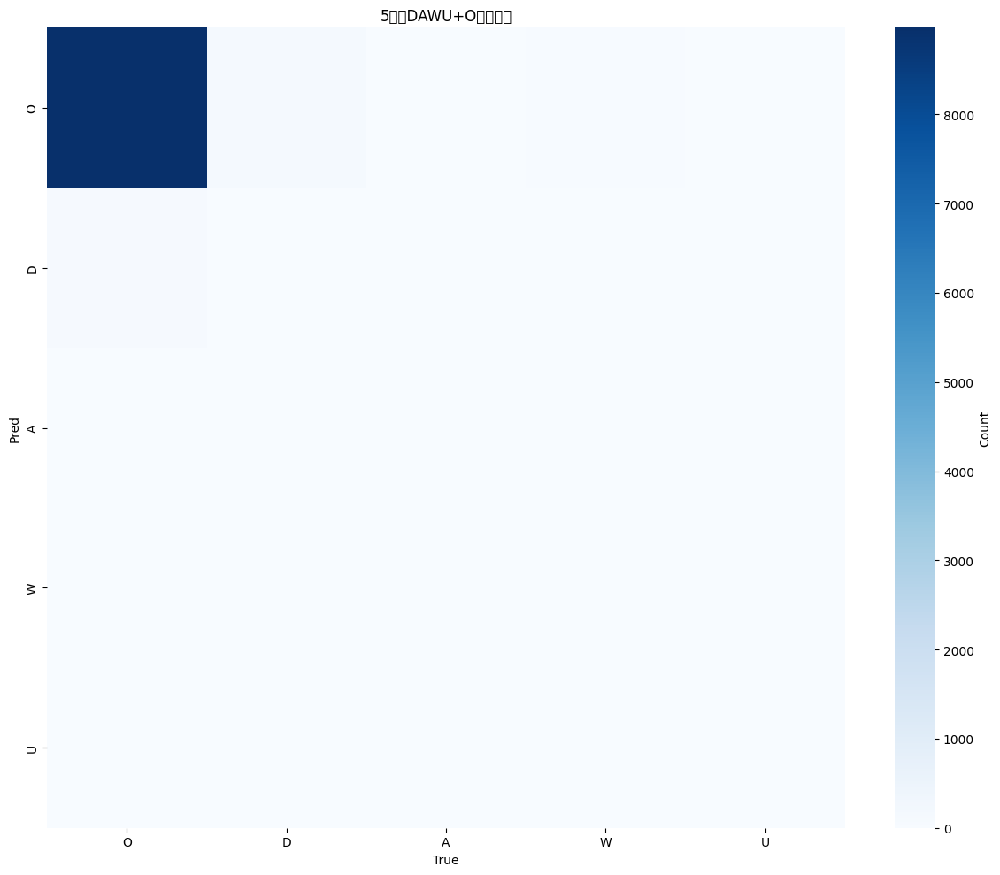

/tmp/ipython-input-1977908771.py:939: UserWarning: Glyph 39006 (\N{CJK UNIFIED IDEOGRAPH-985E}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-1977908771.py:939: UserWarning: Glyph 65288 (\N{FULLWIDTH LEFT PARENTHESIS}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-1977908771.py:939: UserWarning: Glyph 65289 (\N{FULLWIDTH RIGHT PARENTHESIS}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-1977908771.py:939: UserWarning: Glyph 28204 (\N{CJK UNIFIED IDEOGRAPH-6E2C}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-1977908771.py:939: UserWarning: Glyph 35430 (\N{CJK UNIFIED IDEOGRAPH-8A66}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-1977908771.py:939: UserWarning: Glyph 38598 (\N{CJK UNIFIED IDEOGRAPH-96C6}) missing from font(s) DejaVu Sans.
  plt.tight_layout()


✓ 混淆矩陣已儲存: /content/drive/MyDrive/few-shot/DER_two_stage_489/cm_5_test.png

2類（SYM vs O）測試集 分類報告
              precision    recall  f1-score   support

           O     0.9731    0.9839    0.9785      9120
         SYM     0.0870    0.0534    0.0662       262

    accuracy                         0.9579      9382
   macro avg     0.5300    0.5187    0.5223      9382
weighted avg     0.9484    0.9579    0.9530      9382



/tmp/ipython-input-1977908771.py:941: UserWarning: Glyph 39006 (\N{CJK UNIFIED IDEOGRAPH-985E}) missing from font(s) DejaVu Sans.
  plt.savefig(path, dpi=300); plt.show()
/tmp/ipython-input-1977908771.py:941: UserWarning: Glyph 65288 (\N{FULLWIDTH LEFT PARENTHESIS}) missing from font(s) DejaVu Sans.
  plt.savefig(path, dpi=300); plt.show()
/tmp/ipython-input-1977908771.py:941: UserWarning: Glyph 65289 (\N{FULLWIDTH RIGHT PARENTHESIS}) missing from font(s) DejaVu Sans.
  plt.savefig(path, dpi=300); plt.show()
/tmp/ipython-input-1977908771.py:941: UserWarning: Glyph 28204 (\N{CJK UNIFIED IDEOGRAPH-6E2C}) missing from font(s) DejaVu Sans.
  plt.savefig(path, dpi=300); plt.show()
/tmp/ipython-input-1977908771.py:941: UserWarning: Glyph 35430 (\N{CJK UNIFIED IDEOGRAPH-8A66}) missing from font(s) DejaVu Sans.
  plt.savefig(path, dpi=300); plt.show()
/tmp/ipython-input-1977908771.py:941: UserWarning: Glyph 38598 (\N{CJK UNIFIED IDEOGRAPH-96C6}) missing from font(s) DejaVu Sans.
  plt.savefig(

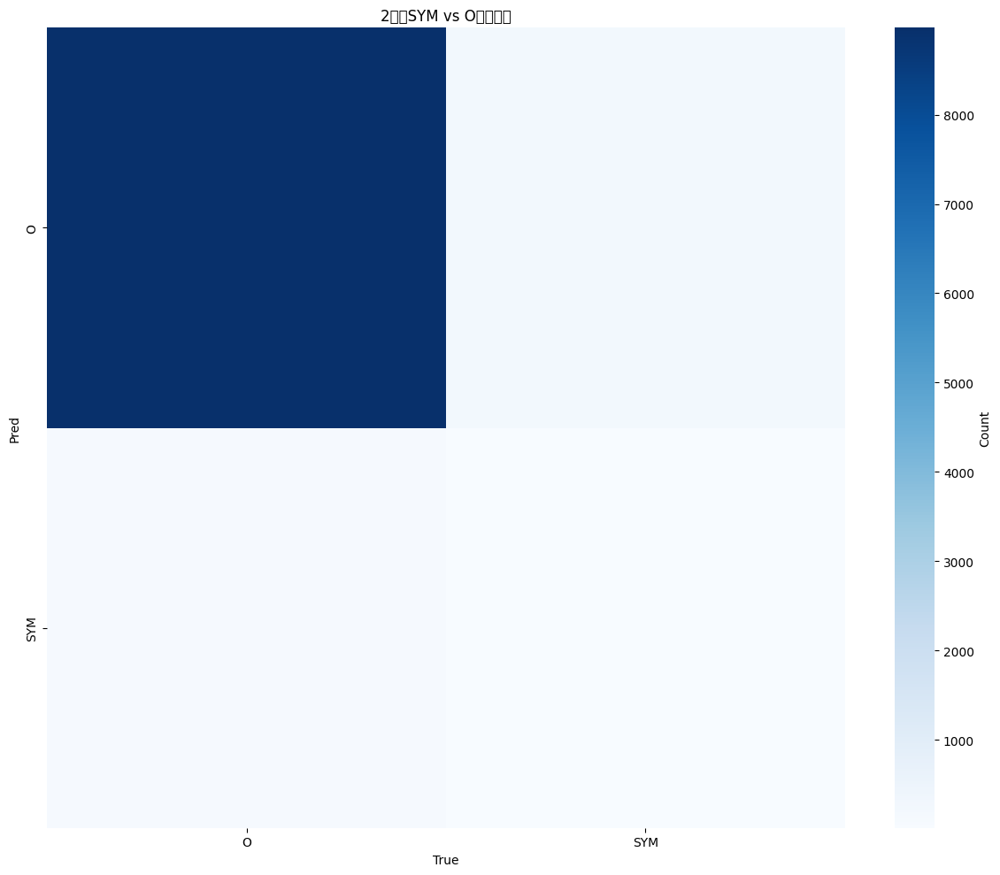

✓ 混淆矩陣已儲存: /content/drive/MyDrive/few-shot/DER_two_stage_489/cm_2_test.png

17類別詳細指標:
標籤          Precision     Recall   F1-Score    Support
------------------------------------------------------------
O              0.9731     0.9839     0.9785       9120
B-D            0.0000     0.0000     0.0000         20
M-D            0.0000     0.0000     0.0000          9
E-D            0.5000     0.0588     0.1053         17
S-D            0.0517     0.0488     0.0502        123
B-A            0.0000     0.0000     0.0000          3
M-A            0.0000     0.0000     0.0000          0
E-A            0.0000     0.0000     0.0000          3
S-A            0.0000     0.0000     0.0000         15
B-W            0.0000     0.0000     0.0000          9
M-W            0.0000     0.0000     0.0000          5
E-W            0.0000     0.0000     0.0000          9
S-W            0.0000     0.0000     0.0000         32
B-U            0.0000     0.0000     0.0000          5
M-U            0.0000     0.

In [ ]:
# 程式碼補丁（直接貼到你 Stage2 的區塊替換 / 增補）

# ============================================
# 兩階段課程式訓練（Stage1: 5類 AutoModelForTokenClassification → Stage2: 17類 BiLSTM+CRF）
# 針對小資料集強化：anchor_nonO + 類型切段 + 連續加權過採樣 + 早停/長程
# 評估：17/5/2 token-F1 + span-F1（Stage2）；Stage1 監測 5/2 類
# ============================================

# ---- 0. 安裝套件（Colab 第一次執行需要）----
!pip -q install transformers==4.44.2 torchcrf==1.1.0 seqeval==1.2.2

# ---- 1. 匯入 ----
import os, csv, random
from collections import Counter
import numpy as np
import pandas as pd
from tqdm.auto import tqdm

import torch
import torch.nn as nn
from torch.utils.data import Dataset, DataLoader, WeightedRandomSampler

from transformers import (
    AutoTokenizer, AutoModelForTokenClassification, BertTokenizerFast, BertModel
)
from torchcrf import CRF

from sklearn.metrics import accuracy_score, f1_score, classification_report, confusion_matrix, precision_recall_fscore_support
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt
import seaborn as sns

# ---- 2. 設定 ----
CONFIG = {
    # 路徑設定（請改成你的實際路徑）
    "encoder_dir": "/content/drive/MyDrive/few-shot/chinese_mentalbert_finetuned_results_simplified/final_model",
    "data_path": "/content/drive/MyDrive/few-shot/noO_select_de.csv",
    "save_root": "/content/drive/MyDrive/few-shot/DER_two_stage_489",

    # 兩階段控制：stage1_5 或 stage2_17
    "stage": "stage2_17",

    # Stage1 儲存與承接設定
    "stage1_ckpt_dir": "/content/drive/MyDrive/few-shot/DER_two_stage_489/stage1_ckpt",
    "stage1_encoder_bin": "/content/drive/MyDrive/few-shot/DER_two_stage_489/stage1_encoder.bin",

    # ===== 核心資料策略 =====
    "window_policy_train": "keep_all",  #anchor_nonO 訓練：以非O為錨，延伸到BMES邊界
    "window_policy_eval":  "keep_all",     # 評估：保持完整避免偏差
    "use_sentence_split_train": False,  #True
    "use_sentence_split_eval":  False,  #True
    "split_on_transition_train": False,  #True   # 在 DAWU 類型切換處拆分
    "split_on_transition_eval":  False,

    # 視窗與長度
    "window_size": 128,
    "window_stride": 96,
    "min_nonO": 2,
    "min_nonO_ratio": 0.05,
    "anchor_ctx_left": 64,
    "anchor_ctx_right": 64,
    "max_len_for_split": 256,
    "max_length": 128,                     # Tokenizer 的 max_length

    # 過採樣策略（依非O密度連續加權；只用於訓練）
    "use_oversampling": True,
    "weight_floor": 0.15,
    "weight_gamma": 0.25,

    # 模型結構（Stage2 用）
    "use_bilstm": True,
    "lstm_hidden": 128,
    "lstm_layers": 1,
    "dropout": 0.4,

    # 解凍策略
    "unfreeze_last_n_layers": 2,
    "lr_encoder": 3e-5,
    "lr_head": 2e-4,

    # 訓練參數
    "batch_size": 8,
    "num_epochs": 50,
    "gradient_clip": 1.0,
    "weight_decay": 5e-3,
    "patience": 10,  # 早停耐心值（Stage1/Stage2 共用）
    "seed": 42,

    # 資料切分
    "test_ratio": 0.15,
    "val_ratio": 0.25
}

os.makedirs(CONFIG["save_root"], exist_ok=True)
os.makedirs(CONFIG["stage1_ckpt_dir"], exist_ok=True)

random.seed(CONFIG["seed"])
np.random.seed(CONFIG["seed"])
torch.manual_seed(CONFIG["seed"])
DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print("DEVICE:", DEVICE)

# ---- 3. 標籤系統 ----
LABELS_17 = [
    "O",
    "B-D","M-D","E-D","S-D",
    "B-A","M-A","E-A","S-A",
    "B-W","M-W","E-W","S-W",
    "B-U","M-U","E-U","S-U",
]
label2id = {lb:i for i,lb in enumerate(LABELS_17)}
id2label = {i:lb for lb,i in label2id.items()}

LABELS_5 = ["O","D","A","W","U"]
lab5_2id = {lb:i for i,lb in enumerate(LABELS_5)}
id2lab5 = {i:lb for lb,i in lab5_2id.items()}

LABELS_2 = ["O","SYM"]
lab2_2id = {lb:i for i,lb in enumerate(LABELS_2)}
id2lab2 = {i:lb for lb,i in lab2_2id.items()}

VALID_PREFIX = {"B","M","E","S"}
VALID_TYPE   = {"D","A","W","U"}

def normalize_bmes(raw):
    if pd.isna(raw): return "O"
    s = str(raw).strip().upper()
    if s=="O": return "O"
    if "-" in s:
        pfx,typ = s.split("-",1)
        pfx,typ = pfx.strip(), typ.strip()
        if pfx in VALID_PREFIX and typ in VALID_TYPE:
            return f"{pfx}-{typ}"
        return "O"
    if s in VALID_TYPE:
        return f"S-{s}"
    return "O"

def bmes_to_5(tag):
    if tag=="O": return "O"
    _, typ = tag.split("-",1)
    return typ if typ in {"D","A","W","U"} else "O"

def bmes_to_2(tag):
    return "O" if tag=="O" else "SYM"

def ids17_to_ids5(ids17):
    return [lab5_2id[bmes_to_5(id2label[i])] for i in ids17]

# ---- 4. 載入資料 ----
def load_data(fp):
    df = pd.read_csv(fp, encoding="utf-8", quoting=csv.QUOTE_ALL, on_bad_lines="warn")
    df = df[df.columns[:9].tolist()]  # 與你原流程一致（保留前9欄）
    df["bmes"] = df["human_label"].apply(normalize_bmes)
    return df

df = load_data(CONFIG["data_path"])
print(f"原始資料列數: {len(df)}")

def group_by_post(df):
    data=[]
    for pid,g in df.groupby("post_id"):
        if "word_order" in g.columns:
            g = g.sort_values("word_order")
        words  = g["word"].astype(str).tolist()
        labels = g["bmes"].astype(str).tolist()
        if len(words)==0 or len(words)!=len(labels):
            continue
        data.append({"post_id": str(pid), "words": words, "labels": [label2id.get(t,0) for t in labels]})
    return data

all_data = group_by_post(df)
print(f"貼文數量: {len(all_data)}")

# 切分資料（以 post 為單位）
train_val, test_data = train_test_split(all_data, test_size=CONFIG["test_ratio"], random_state=CONFIG["seed"], shuffle=True)
train_data, val_data = train_test_split(train_val, test_size=CONFIG["val_ratio"], random_state=CONFIG["seed"], shuffle=True)

# ---- 5. 視窗策略 ----
def id_is_O(tid):
    return id2label[tid] == "O"

def id_type(tid):
    lb = id2label[tid]
    if lb == "O": return "O", None
    pfx, typ = lb.split("-", 1)
    return pfx, typ

def extend_to_bmes_boundary(labels, start_idx, end_idx):
    # 左延
    i = start_idx
    pfx, typ = id_type(labels[i])
    if pfx in {"M","E"} and typ is not None:
        j = i
        while j >= 0:
            p,t = id_type(labels[j])
            if p == "B" and t == typ:
                i = j; break
            j -= 1
        start_idx = max(0, i)
    # 右延
    k = end_idx
    pfx, typ = id_type(labels[k])
    if pfx in {"B","M"} and typ is not None:
        j = k
        while j < len(labels):
            p,t = id_type(labels[j])
            if p == "E" and t == typ:
                k = j; break
            j += 1
        end_idx = min(len(labels)-1, k)
    return start_idx, end_idx

def windowize_keep_all(words, labels, win=128, stride=96):
    L = len(words)
    if L <= win:
        return [(words, labels)]
    out = []
    i = 0
    while i < L:
        j = min(i+win, L)
        out.append((words[i:j], labels[i:j]))
        if j == L: break
        i += stride
    return out

def windowize_filter_nonO(words, labels, win=128, stride=96, min_nonO=1, min_ratio=0.0):
    out = []
    for w, y in windowize_keep_all(words, labels, win, stride):
        nonO = sum(1 for t in y if not id_is_O(t))
        if nonO >= min_nonO or (nonO/len(y)) >= min_ratio:
            out.append((w, y))
    return out if out else [(words[:win], labels[:win])]

def sentence_split(words, labels):
    sents = []
    start = 0
    punct = set("。！？!?…;；")
    for i, w in enumerate(words):
        if any(ch in punct for ch in w):
            sents.append((words[start:i+1], labels[start:i+1]))
            start = i+1
    if start < len(words):
        sents.append((words[start:], labels[start:]))
    return sents if sents else [(words, labels)]

def windowize_anchor_by_nonO(words, labels, win=128, ctx_left=48, ctx_right=48):
    L = len(words)
    nonO_idx = [i for i,t in enumerate(labels) if not id_is_O(t)]
    if not nonO_idx:
        j = min(win, L)
        return [(words[:j], labels[:j])]
    segs = []
    for i in nonO_idx:
        s = max(0, i-ctx_left)
        e = min(L-1, i+ctx_right)
        s, e = extend_to_bmes_boundary(labels, s, e)
        segs.append([s, e])
    # 合併重疊片段
    segs.sort()
    merged = []
    for s,e in segs:
        if not merged or s > merged[-1][1] + 5:
            merged.append([s,e])
        else:
            merged[-1][1] = max(merged[-1][1], e)
    out = [(words[s:e+1], labels[s:e+1]) for s,e in merged]
    return out

def split_on_type_transition(words, labels, max_len=256):
    out = []
    start = 0
    def typ_of(idx):
        p,t = id_type(labels[idx])
        return t
    for i in range(1, len(labels)):
        t_prev = typ_of(i-1)
        t_now  = typ_of(i)
        p_prev,_ = id_type(labels[i-1])
        if (p_prev in {"S","E"}) and (t_prev != t_now):
            out.append((words[start:i], labels[start:i]))
            start = i
    if start < len(labels):
        out.append((words[start:], labels[start:]))
    # 長段再二次視窗
    final = []
    for w, y in out:
        if len(y) > max_len:
            final.extend(windowize_keep_all(w, y, win=max_len, stride=max_len//2))
        else:
            final.append((w, y))
    return final

def build_dataset_with_policy(raw_posts, policy="keep_all",
                              win=128, stride=96,
                              min_nonO=1, min_ratio=0.0,
                              ctx_left=48, ctx_right=48,
                              use_sentence_split=False,
                              split_on_transition=False,
                              max_len_for_split=256):
    data = []
    for d in raw_posts:
        words, y = d["words"], d["labels"]
        chunks = [(words, y)]
        if use_sentence_split:
            chunks = sentence_split(words, y)
        subouts = []
        for w, lab in chunks:
            if policy == "keep_all":
                Ws = windowize_keep_all(w, lab, win, stride)
            elif policy == "filter_nonO":
                Ws = windowize_filter_nonO(w, lab, win, stride, min_nonO, min_ratio)
            elif policy == "anchor_nonO":
                Ws = windowize_anchor_by_nonO(w, lab, win, ctx_left, ctx_right)
            else:
                raise ValueError(f"Unknown policy: {policy}")
            if split_on_transition:
                tmp = []
                for ww, ll in Ws:
                    tmp.extend(split_on_type_transition(ww, ll, max_len=max_len_for_split))
                Ws = tmp
            subouts.extend(Ws)
        for ww, ll in subouts:
            data.append({"post_id": d["post_id"], "words": ww, "labels": ll})
    return data

# ---- 6. 產生訓練/驗證/測試集 ----
train_data = build_dataset_with_policy(
    train_data,
    policy=CONFIG["window_policy_train"],
    win=CONFIG["window_size"],
    stride=CONFIG["window_stride"],
    min_nonO=CONFIG["min_nonO"],
    min_ratio=CONFIG["min_nonO_ratio"],
    ctx_left=CONFIG["anchor_ctx_left"],
    ctx_right=CONFIG["anchor_ctx_right"],
    use_sentence_split=CONFIG["use_sentence_split_train"],
    split_on_transition=CONFIG["split_on_transition_train"],
    max_len_for_split=CONFIG["max_len_for_split"]
)
val_data = build_dataset_with_policy(
    val_data,
    policy=CONFIG["window_policy_eval"],
    win=CONFIG["window_size"],
    stride=CONFIG["window_stride"],
    use_sentence_split=CONFIG["use_sentence_split_eval"],
    split_on_transition=CONFIG["split_on_transition_eval"],
    max_len_for_split=CONFIG["max_len_for_split"]
)
test_data = build_dataset_with_policy(
    test_data,
    policy=CONFIG["window_policy_eval"],
    win=CONFIG["window_size"],
    stride=CONFIG["window_stride"],
    use_sentence_split=CONFIG["use_sentence_split_eval"],
    split_on_transition=CONFIG["split_on_transition_eval"],
    max_len_for_split=CONFIG["max_len_for_split"]
)

print(f"訓練集={len(train_data)} | 驗證集={len(val_data)} | 測試集={len(test_data)}")

# ---- 7. 資料分析 ----
def analyze_dataset(data, name="Dataset"):
    print(f"\n{'='*60}\n📊 {name} 分析\n{'='*60}")
    total_tokens = sum(len(d["labels"]) for d in data)
    total_samples = len(data)
    label_counts = Counter()
    for d in data:
        label_counts.update(d["labels"])
    print(f"樣本數: {total_samples}")
    print(f"總 token 數: {total_tokens}")
    print(f"平均長度: {total_tokens/total_samples:.1f}")
    print(f"\n標籤分布（Top 10）:")
    for lid, cnt in label_counts.most_common(10):
        ratio = cnt/total_tokens*100
        print(f"  {id2label[lid]:8s}: {cnt:6d} ({ratio:5.2f}%)")
    nonO_ratios = [sum(1 for t in d["labels"] if t!=0)/len(d["labels"]) for d in data]
    print(f"\n非O密度統計:")
    print(f"  平均: {np.mean(nonO_ratios):.3f}")
    print(f"  中位數: {np.median(nonO_ratios):.3f}")
    print(f"  最小: {np.min(nonO_ratios):.3f}")
    print(f"  最大: {np.max(nonO_ratios):.3f}")
    all_O = sum(1 for d in data if all(t==0 for t in d["labels"]))
    print(f"  全O樣本: {all_O}/{total_samples} ({all_O/total_samples*100:.1f}%)")

analyze_dataset(train_data, "訓練集")
analyze_dataset(val_data, "驗證集")
analyze_dataset(test_data, "測試集")

# ---- 8. Tokenizer ----
# 為確保 Stage1/Stage2 一致，統一用 AutoTokenizer（MentalBERT 相容）
tokenizer = AutoTokenizer.from_pretrained(CONFIG["encoder_dir"])
# 另外準備 BertTokenizerFast/BertModel 給 Stage2
bert_tokenizer = BertTokenizerFast.from_pretrained(CONFIG["encoder_dir"])

# ---- 9. Dataset/Loader（支援 5/17 類）----
class TokenClsDataset(Dataset):
    def __init__(self, data, tokenizer, max_length=128, label_space="17"):
        self.data = data
        self.tok = tokenizer
        self.max_length = max_length
        assert label_space in {"17","5"}
        self.label_space = label_space

    def __len__(self):
        return len(self.data)

    def __getitem__(self, idx):
        item = self.data[idx]
        enc = self.tok(
            item["words"],
            is_split_into_words=True,
            truncation=True,
            padding="max_length",
            max_length=self.max_length,
            return_offsets_mapping=False,
            return_tensors="pt"
        )
        word_ids = enc.word_ids()
        lab17 = item["labels"]
        if self.label_space == "5":
            lab5 = ids17_to_ids5(lab17)
        labels_ids = []
        prev = None
        for w_idx in word_ids:
            if w_idx is None:
                labels_ids.append(-100)
            elif w_idx != prev:
                if w_idx < len(lab17):
                    labels_ids.append(lab5[w_idx] if self.label_space=="5" else lab17[w_idx])
                else:
                    labels_ids.append(-100)
            else:
                labels_ids.append(-100)
            prev = w_idx
        enc = {k:v.squeeze(0) for k,v in enc.items()}
        enc["labels"] = torch.tensor(labels_ids, dtype=torch.long)
        return enc

# 過採樣（依非O密度；只用於訓練）
O_ID = label2id["O"]
def seq_weights_by_nonO_ratio(raw_data, floor=0.05, gamma=0.5):
    w = []
    for d in raw_data:
        r = sum(1 for t in d["labels"] if t!=O_ID) / max(1, len(d["labels"]))
        w.append(floor + (r**gamma))
    s = sum(w)
    return [x/s for x in w]

def make_loaders(label_space):
    ds_train = TokenClsDataset(train_data, tokenizer, CONFIG["max_length"], label_space=label_space)
    ds_val   = TokenClsDataset(val_data,   tokenizer, CONFIG["max_length"], label_space=label_space)
    ds_test  = TokenClsDataset(test_data,  tokenizer, CONFIG["max_length"], label_space=label_space)

    if CONFIG["use_oversampling"]:
        weights = seq_weights_by_nonO_ratio(train_data, CONFIG["weight_floor"], CONFIG["weight_gamma"])
        sampler = WeightedRandomSampler(weights=weights, num_samples=len(weights), replacement=True)
        ld_train = DataLoader(ds_train, batch_size=CONFIG["batch_size"], sampler=sampler)
    else:
        ld_train = DataLoader(ds_train, batch_size=CONFIG["batch_size"], shuffle=True)
    ld_val  = DataLoader(ds_val,  batch_size=CONFIG["batch_size"], shuffle=False)
    ld_test = DataLoader(ds_test, batch_size=CONFIG["batch_size"], shuffle=False)
    return ds_train, ds_val, ds_test, ld_train, ld_val, ld_test

# ---- 10. 解凍工具（BERT/AutoModel 共用）----
def unfreeze_last_n_layers_of_bert(model_or_encoder, n=0):
    """
    支援:
      - AutoModelForTokenClassification（使用 .base_model.encoder.layer）
      - BertModel（使用 .encoder.layer）
    """
    # 先全部凍結
    for p in model_or_encoder.parameters():
        p.requires_grad = False
    if n <= 0:
        model_or_encoder.eval()
        return

    def mark_trainable(named_params, layer_keyword_list):
        for name, p in named_params:
            if any(kw in name for kw in layer_keyword_list):
                p.requires_grad = True

    # 嘗試抓到 encoder 層數
    try:
        if hasattr(model_or_encoder, "config"):
            L = model_or_encoder.config.num_hidden_layers
        elif hasattr(model_or_encoder, "base_model") and hasattr(model_or_encoder.base_model, "config"):
            L = model_or_encoder.base_model.config.num_hidden_layers
        else:
            L = 12
    except:
        L = 12
    target_idxs = list(range(max(0, L-n), L))

    # 兩種命名空間皆處理
    layer_keywords = [f"encoder.layer.{i}." for i in target_idxs] + ["pooler."]
    mark_trainable(model_or_encoder.named_parameters(), layer_keywords)
    model_or_encoder.train()

# ---- 11. Stage1：5 類 AutoModelForTokenClassification ----
def train_stage1():
    ds_tr, ds_va, ds_te, ld_tr, ld_va, ld_te = make_loaders(label_space="5")

    # 建立模型
    model = AutoModelForTokenClassification.from_pretrained(
        CONFIG["encoder_dir"],
        num_labels=len(LABELS_5)
    ).to(DEVICE)

    # 解凍最後 N 層
    unfreeze_last_n_layers_of_bert(model.base_model, CONFIG["unfreeze_last_n_layers"])

    # 參數群組：被解凍 encoder vs head
    enc_params = [p for n,p in model.named_parameters() if n.startswith(model.base_model_prefix) and p.requires_grad]
    head_params= [p for n,p in model.named_parameters() if (not n.startswith(model.base_model_prefix)) and p.requires_grad]

    optimizer = torch.optim.AdamW([
        {"params": enc_params, "lr": CONFIG["lr_encoder"]},
        {"params": head_params, "lr": CONFIG["lr_head"]}
    ], weight_decay=CONFIG["weight_decay"])

    scheduler = torch.optim.lr_scheduler.StepLR(optimizer, step_size=40, gamma=0.5)

    best_val_loss = float("inf")
    patience_counter = 0
    history=[]

    for epoch in range(1, CONFIG["num_epochs"]+1):
        model.train()
        tr_loss=0.0; nb=0
        for batch in tqdm(ld_tr, desc=f"[Stage1] Epoch {epoch}/{CONFIG['num_epochs']}"):
            input_ids = batch["input_ids"].to(DEVICE)
            attention_mask = batch["attention_mask"].to(DEVICE)
            labels = batch["labels"].to(DEVICE)
            out = model(input_ids=input_ids, attention_mask=attention_mask, labels=labels)
            loss = out.loss
            optimizer.zero_grad()
            loss.backward()
            nn.utils.clip_grad_norm_(model.parameters(), CONFIG["gradient_clip"])
            optimizer.step()
            tr_loss += loss.item(); nb+=1
        scheduler.step()
        avg_tr = tr_loss/max(1,nb)

        # 驗證
        model.eval()
        with torch.no_grad():
            val_loss=0.0; nb2=0
            all_y=[]; all_p=[]
            for batch in ld_va:
                ids = batch["input_ids"].to(DEVICE)
                msk = batch["attention_mask"].to(DEVICE)
                y   = batch["labels"].to(DEVICE)
                out = model(input_ids=ids, attention_mask=msk, labels=y)
                val_loss += out.loss.item(); nb2+=1
                logits = out.logits
                preds = logits.argmax(-1)
                mask  = y.ne(-100)
                all_y.extend(y[mask].cpu().tolist())
                all_p.extend(preds[mask].cpu().tolist())
        val_loss = val_loss/max(1,nb2)
        acc5 = accuracy_score(all_y, all_p)
        f1_5 = f1_score(all_y, all_p, average="macro", zero_division=0)
        y2 = [0 if t==0 else 1 for t in all_y]  # 5類 id=0 對應 "O"
        p2 = [0 if t==0 else 1 for t in all_p]
        f1_2 = f1_score(y2, p2, average="macro", zero_division=0)
        history.append({"epoch":epoch,"train_loss":avg_tr,"val_loss":val_loss,"val_acc_5":acc5,"val_f1_5":f1_5,"val_f1_2":f1_2})
        print(f"Epoch {epoch}: TrainLoss={avg_tr:.4f} | ValLoss={val_loss:.4f} | Acc(5)={acc5:.4f} | F1(5)={f1_5:.4f} | F1(2)={f1_2:.4f}")

        # 早停
        if val_loss < best_val_loss:
            best_val_loss = val_loss
            patience_counter = 0
            # 儲存整個 Stage1 模型（之後可直接 from_pretrained）
            model.save_pretrained(CONFIG["stage1_ckpt_dir"])
            tokenizer.save_pretrained(CONFIG["stage1_ckpt_dir"])
            print("  ✅ 儲存 Stage1 模型至:", CONFIG["stage1_ckpt_dir"])
            # 另外單獨儲存 encoder 權重（供 Stage2 承接）
            base = getattr(model, "base_model", None)
            if base is None:
                # 某些架構用 model.bert
                base = getattr(model, "bert", None)
            if base is not None:
                torch.save(base.state_dict(), CONFIG["stage1_encoder_bin"])
                print("  ✅ 另存 encoder 權重至:", CONFIG["stage1_encoder_bin"])
        else:
            patience_counter += 1
            print(f"  ⏳ 未改善次數: {patience_counter}/{CONFIG['patience']}")
            if patience_counter >= CONFIG["patience"]:
                print(f"\n⏹️ Stage1 早停於 Epoch {epoch}")
                break

    # 測試（5 類）
    print("\n" + "="*60)
    print("📊 Stage1 測試（5 類）")
    print("="*60)
    # 載入最佳
    st1 = AutoModelForTokenClassification.from_pretrained(CONFIG["stage1_ckpt_dir"]).to(DEVICE)
    st1.eval()
    with torch.no_grad():
        all_y=[]; all_p=[]; test_loss=0.0; nb=0
        for batch in tqdm(make_loaders("5")[5], desc="[Stage1] Test"):  # ld_test
            ids = batch["input_ids"].to(DEVICE)
            msk = batch["attention_mask"].to(DEVICE)
            y   = batch["labels"].to(DEVICE)
            out = st1(input_ids=ids, attention_mask=msk, labels=y)
            test_loss += out.loss.item(); nb+=1
            preds = out.logits.argmax(-1)
            mask  = y.ne(-100)
            all_y.extend(y[mask].cpu().tolist())
            all_p.extend(preds[mask].cpu().tolist())
    test_loss /= max(1,nb)
    acc5 = accuracy_score(all_y, all_p)
    f1_5 = f1_score(all_y, all_p, average="macro", zero_division=0)
    y2 = [0 if t==0 else 1 for t in all_y]
    p2 = [0 if t==0 else 1 for t in all_p]
    f1_2 = f1_score(y2, p2, average="macro", zero_division=0)
    print(f"Loss(5): {test_loss:.4f} | Acc(5): {acc5:.4f} | F1(5): {f1_5:.4f} | F1(2): {f1_2:.4f}")

# ---- 12. Stage2：BERT(+BiLSTM)+CRF（17 類）----
class BERT_BiLSTM_CRF(nn.Module):
    def __init__(self, encoder, num_labels, use_bilstm=True, hidden=128, layers=1, dropout=0.3):
        super().__init__()
        self.encoder = encoder
        self.use_bilstm = use_bilstm
        hd = encoder.config.hidden_size
        if use_bilstm:
            self.lstm = nn.LSTM(
                input_size=hd, hidden_size=hidden, num_layers=layers,
                batch_first=True, bidirectional=True, dropout=dropout if layers>1 else 0.0
            )
            cls_in = hidden*2
        else:
            self.lstm = None
            cls_in = hd
        self.drop = nn.Dropout(dropout)
        self.fc   = nn.Linear(cls_in, num_labels)
        self.crf  = CRF(num_labels, batch_first=True)

######新增更強的 CRF 轉移初始化 + 暫時凍結
        # === 強化 BMES + O 的轉移約束 ===
        with torch.no_grad():
            self.crf.start_transitions.fill_(-10.0)  # 非法起點極大懲罰
            self.crf.end_transitions.fill_(-10.0)    # 非法結束極大懲罰
            self.crf.transitions.fill_(-8.0)         # 預設非法轉移

            o = label2id["O"]
            # O<->O 合法（允許長段 O）
            self.crf.transitions[o, o] = +0.5

            for typ in ["D","A","W","U"]:
                b = label2id[f"B-{typ}"]; m = label2id[f"M-{typ}"]
                e = label2id[f"E-{typ}"]; s = label2id[f"S-{typ}"]

                # 合法起點：B, S
                self.crf.start_transitions[b] = +1.5
                self.crf.start_transitions[s] = +1.5

                # 合法結束：E, S, O
                self.crf.end_transitions[e] = +1.0
                self.crf.end_transitions[s] = +1.0
                self.crf.end_transitions[o] = 0.0  # 句尾是 O 也可接受

                # 片段內部轉移
                self.crf.transitions[m, b] = +2.0
                self.crf.transitions[e, b] = +1.5
                self.crf.transitions[m, m] = +1.5
                self.crf.transitions[e, m] = +2.0

                # 片段結束到 O
                self.crf.transitions[o, e] = +0.5
                self.crf.transitions[o, s] = +0.5

                # 從 O 進入新片段
                self.crf.transitions[b, o] = +0.8
                self.crf.transitions[s, o] = +0.8

                # 禁止明顯非法：O->M/E、S->M、E->M/B 等保持強負
                # （已由全域 -8.0 覆蓋，若需要可再個別設更低）

    def freeze_crf_transitions(self, freeze=True):
        # 前幾個 epoch 先凍結 CRF 轉移，專心學 emissions
        for name, p in self.crf.named_parameters():
            if "transitions" in name or "start_transitions" in name or "end_transitions" in name:
                p.requires_grad = not freeze
#########

        # 合法轉移初始化（BMES）
        with torch.no_grad():
            self.crf.start_transitions.fill_(-1.0)
            self.crf.end_transitions.fill_(-1.0)
            self.crf.transitions.fill_(-2.5)
            o = label2id["O"]
            self.crf.transitions[o, o] = 0.0
            for typ in ["D","A","W","U"]:
                b = label2id[f"B-{typ}"]; m = label2id[f"M-{typ}"]
                e = label2id[f"E-{typ}"]; s = label2id[f"S-{typ}"]
                self.crf.start_transitions[b] = 0.0
                self.crf.start_transitions[s] = 0.0
                self.crf.transitions[m, b] = 0.0
                self.crf.transitions[e, b] = 0.0
                self.crf.transitions[m, m] = 0.0
                self.crf.transitions[e, m] = 0.0
                self.crf.transitions[o, s] = 0.0
                self.crf.transitions[o, e] = 0.0
                # O 作中介
                self.crf.transitions[b, o] = 0.0
                self.crf.transitions[s, o] = 0.0

    def forward(self, input_ids, attention_mask, labels=None):
        outputs = self.encoder(input_ids=input_ids, attention_mask=attention_mask)
        x = outputs.last_hidden_state
        if self.use_bilstm:
            x,_ = self.lstm(x)
        x = self.drop(x)
        emissions = self.fc(x)
        mask = attention_mask.bool()
        if labels is not None:
            y = labels.clone()
            y[y==-100] = 0
            loss = -self.crf(emissions, y, mask=mask, reduction="mean")
            preds = self.crf.decode(emissions, mask=mask)
            return loss, preds
        else:
            preds = self.crf.decode(emissions, mask=mask)
            return preds

def decode_spans_bmes(tag_seq):
    spans=[]
    cur_type=None; start=None
    for i,tag in enumerate(tag_seq):
        if tag=="O":
            if cur_type is not None:
                spans.append((cur_type, start, i-1))
                cur_type=None; start=None
            continue
        pfx,typ = tag.split("-",1)
        if pfx=="S":
            spans.append((typ, i, i))
            cur_type=None; start=None
        elif pfx=="B":
            if cur_type is not None:
                spans.append((cur_type, start, i-1))
            cur_type=typ; start=i
        elif pfx=="M":
            if cur_type is None:
                cur_type=typ; start=i
        elif pfx=="E":
            if cur_type is None:
                cur_type=typ; start=i
            spans.append((typ, start, i))
            cur_type=None; start=None
    if cur_type is not None:
        spans.append((cur_type, start, len(tag_seq)-1))
    return spans

def span_f1_17(true_tags_17, pred_tags_17):
    tp=0; fp=0; fn=0
    for y_true, y_pred in zip(true_tags_17, pred_tags_17):
        T = decode_spans_bmes(y_true)
        P = decode_spans_bmes(y_pred)
        T_set = set(T); P_set = set(P)
        tp += len(T_set & P_set)
        fp += len(P_set - T_set)
        fn += len(T_set - P_set)
    prec = tp / max(1,(tp+fp))
    rec  = tp / max(1,(tp+fn))
    f1   = 2*prec*rec / max(1e-12,(prec+rec))
    return prec, rec, f1

@torch.no_grad()
def evaluate_stage2(model, loader, desc="Eval"):
    model.eval()
    all_true_17, all_pred_17 = [], []
    total_loss=0.0; nb=0
    for batch in tqdm(loader, desc=desc, leave=False):
        input_ids = batch["input_ids"].to(DEVICE)
        attention_mask = batch["attention_mask"].to(DEVICE)
        labels = batch["labels"].to(DEVICE)
        loss, preds = model(input_ids, attention_mask, labels=labels)
        total_loss += loss.item(); nb+=1
        for i, pred_seq in enumerate(preds):
            valid = (labels[i] != -100).cpu().numpy()
            y_t = labels[i].detach().cpu().numpy()[valid].tolist()
            y_p = pred_seq[:len(y_t)]
            all_true_17.extend(y_t); all_pred_17.extend(y_p)

    acc_17  = accuracy_score(all_true_17, all_pred_17)
    f1_17   = f1_score(all_true_17, all_pred_17, average="macro", zero_division=0)
    y_true_5 = ids17_to_ids5(all_true_17); y_pred_5 = ids17_to_ids5(all_pred_17)
    y_true_2 = [0 if t==0 else 1 for t in y_true_5]; y_pred_2 = [0 if t==0 else 1 for t in y_pred_5]
    f1_5  = f1_score(y_true_5, y_pred_5, average="macro", zero_division=0)
    f1_2  = f1_score(y_true_2, y_pred_2, average="macro", zero_division=0)

    # span-F1（以段落拼接近似）
    true_tags = [id2label[i] for i in all_true_17]
    pred_tags = [id2label[i] for i in all_pred_17]
    seg=200
    true_seqs=[true_tags[i:i+seg] for i in range(0,len(true_tags),seg)]
    pred_seqs=[pred_tags[i:i+seg] for i in range(0,len(pred_tags),seg)]
    p_span, r_span, f1_span = span_f1_17(true_seqs, pred_seqs)

    return {
        "loss": total_loss/max(1,nb),
        "acc_17": acc_17,
        "f1_17": f1_17,
        "f1_5":  f1_5,
        "f1_2":  f1_2,
        "span_p": p_span, "span_r": r_span, "span_f1": f1_span,
        "y_true_17": all_true_17, "y_pred_17": all_pred_17
    }
######加入輔助 CE loss（和 CRF NLL 一起優化）
# 放在 train_stage2() 前面
def masked_token_ce_loss(logits, labels, ignore_index=-100):
    # logits: (B, T, C), labels: (B, T)
    B, T, C = logits.shape
    logits_ = logits.view(B*T, C)
    labels_ = labels.view(B*T)
    mask = labels_ != ignore_index
    if mask.sum() == 0:
        return torch.tensor(0.0, device=logits.device)
    return nn.CrossEntropyLoss()(logits_[mask], labels_[mask])
######
def train_stage2():
    # DataLoader（17 類空間）
    ds_tr, ds_va, ds_te, ld_tr, ld_va, ld_te = make_loaders(label_space="17")

    # 建立 BERT encoder，承接 Stage1 encoder 權重（若存在）
    encoder = BertModel.from_pretrained(CONFIG["encoder_dir"])
    if os.path.exists(CONFIG["stage1_encoder_bin"]):
        state = torch.load(CONFIG["stage1_encoder_bin"], map_location="cpu")
        missing, unexpected = encoder.load_state_dict(state, strict=False)
        print("✓ 載入 Stage1 encoder 權重 | missing:", len(missing), "| unexpected:", len(unexpected))
    else:
        print("⚠️ 找不到 Stage1 encoder 權重，改用原始 encoder")

    # 解凍最後 N 層
    unfreeze_last_n_layers_of_bert(encoder, CONFIG["unfreeze_last_n_layers"])

    # 建立模型
    model = BERT_BiLSTM_CRF(
        encoder=encoder, num_labels=len(LABELS_17),
        use_bilstm=CONFIG["use_bilstm"], hidden=CONFIG["lstm_hidden"],
        layers=CONFIG["lstm_layers"], dropout=CONFIG["dropout"]
    ).to(DEVICE)

    # 參數群組
    enc_params = [p for n,p in model.named_parameters() if n.startswith("encoder.") and p.requires_grad]
    head_params= [p for n,p in model.named_parameters() if (not n.startswith("encoder.")) and p.requires_grad]
    optimizer = torch.optim.AdamW([
        {"params": enc_params, "lr": CONFIG["lr_encoder"]},
        {"params": head_params, "lr": CONFIG["lr_head"]}
    ], weight_decay=CONFIG["weight_decay"])
    scheduler = torch.optim.lr_scheduler.StepLR(optimizer, step_size=40, gamma=0.5)

    best_val_loss = float("inf")
    patience_counter = 0
    history=[]
######
    # lambda_ce = 0.2  # 可在 0.1~0.3 微調
#######

    for epoch in range(1, CONFIG["num_epochs"]+1):
        model.train()
        tr_loss=0.0; nb=0
        for batch in tqdm(ld_tr, desc=f"[Stage2] Epoch {epoch}/{CONFIG['num_epochs']}"):
            input_ids = batch["input_ids"].to(DEVICE)
            attention_mask = batch["attention_mask"].to(DEVICE)
            labels = batch["labels"].to(DEVICE)
            loss, _ = model(input_ids, attention_mask, labels=labels)
            optimizer.zero_grad()
            loss.backward()
            nn.utils.clip_grad_norm_(model.parameters(), CONFIG["gradient_clip"])
            optimizer.step()
            tr_loss += loss.item(); nb+=1
        scheduler.step()
        avg_tr = tr_loss/max(1,nb)

        # 驗證
        val_res = evaluate_stage2(model, ld_va, desc="驗證")
        history.append({
            "epoch": epoch,
            "train_loss": avg_tr,
            "val_loss": val_res["loss"],
            "val_acc_17": val_res["acc_17"],
            "val_f1_17": val_res["f1_17"],
            "val_f1_5":  val_res["f1_5"],
            "val_f1_2":  val_res["f1_2"],
            "val_span_f1": val_res["span_f1"]
        })
        print(f"Epoch {epoch}: TrainLoss={avg_tr:.4f} | ValLoss={val_res['loss']:.4f} | "
              f"F1(17)={val_res['f1_17']:.4f} | F1(5)={val_res['f1_5']:.4f} | "
              f"F1(2)={val_res['f1_2']:.4f} | Span-F1={val_res['span_f1']:.4f}")

        # 早停
        if val_res["loss"] < best_val_loss:
            best_val_loss = val_res["loss"]
            ckpt_path = os.path.join(CONFIG["save_root"], "stage2_best_DER_17_byValLoss.pt")
            torch.save({"model_state_dict": model.state_dict(), "best_val_loss": best_val_loss}, ckpt_path)
            print("  ✅ 儲存 Stage2 最佳模型 →", ckpt_path)
            patience_counter = 0
        else:
            patience_counter += 1
            print(f"  ⏳ 未改善次數: {patience_counter}/{CONFIG['patience']}")
            if patience_counter >= CONFIG["patience"]:
                print(f"\n⏹️ Stage2 早停於 Epoch {epoch}")
                break

    # 測試
    print("\n" + "="*60)
    print("📊 Stage2 測試（17 類）")
    print("="*60)
    ckpt_path = os.path.join(CONFIG["save_root"], "stage2_best_DER_17_byValLoss.pt")
    if os.path.exists(ckpt_path):
        ckpt = torch.load(ckpt_path, map_location=DEVICE)
        model.load_state_dict(ckpt["model_state_dict"])
        print(f"最佳模型 ValLoss={ckpt['best_val_loss']:.4f}")
    test_res = evaluate_stage2(model, ld_te, desc="測試")
    print(f"\nLoss     : {test_res['loss']:.4f}")
    print(f"Acc(17)  : {test_res['acc_17']:.4f}")
    print(f"F1(17)   : {test_res['f1_17']:.4f}")
    print(f"F1(5)    : {test_res['f1_5']:.4f}")
    print(f"F1(2)    : {test_res['f1_2']:.4f}")
    print(f"Span-F1  : {test_res['span_f1']:.4f}")

    # 報告與混淆矩陣（17/5/2）
    y_true_17 = test_res["y_true_17"]; y_pred_17 = test_res["y_pred_17"]
    def print_report_and_cm(y_true, y_pred, names, title, fname):
        print(f"\n{'='*60}\n{title} 分類報告\n{'='*60}")
        print(classification_report(
            y_true, y_pred, labels=list(range(len(names))), target_names=names, digits=4, zero_division=0
        ))
        cm = confusion_matrix(y_true, y_pred, labels=list(range(len(names))))
        plt.figure(figsize=(12,10))
        sns.heatmap(cm.T, annot=False, fmt='d', cmap='Blues',
                    xticklabels=names, yticklabels=names, cbar_kws={'label':'Count'})
        plt.xlabel("True"); plt.ylabel("Pred"); plt.title(title)
        plt.tight_layout()
        path = os.path.join(CONFIG["save_root"], fname)
        plt.savefig(path, dpi=300); plt.show()
        print("✓ 混淆矩陣已儲存:", path)

    print_report_and_cm(y_true_17, y_pred_17, LABELS_17, "17類（BMES×DAWU+O）測試集", "cm_17_test.png")
    y_true_5 = ids17_to_ids5(y_true_17); y_pred_5 = ids17_to_ids5(y_pred_17)
    print_report_and_cm(y_true_5, y_pred_5, LABELS_5, "5類（DAWU+O）測試集", "cm_5_test.png")
    y_true_2 = [0 if t==0 else 1 for t in y_true_5]; y_pred_2 = [0 if t==0 else 1 for t in y_pred_5]
    print_report_and_cm(y_true_2, y_pred_2, LABELS_2, "2類（SYM vs O）測試集", "cm_2_test.png")

    # 17類別詳細指標
    prec_17, rec_17, f1_17_per_class, _ = precision_recall_fscore_support(
        y_true_17, y_pred_17, labels=list(range(len(LABELS_17))), zero_division=0
    )
    print("\n17類別詳細指標:")
    print(f"{'標籤':<10} {'Precision':>10} {'Recall':>10} {'F1-Score':>10} {'Support':>10}")
    print("-"*60)
    label_support = Counter(y_true_17)
    for i, label in enumerate(LABELS_17):
        support = label_support[i]
        print(f"{label:<10} {prec_17[i]:>10.4f} {rec_17[i]:>10.4f} {f1_17_per_class[i]:>10.4f} {support:>10d}")

# ---- 13. 執行入口 ----
if CONFIG["stage"] == "stage1_5":
    train_stage1()
elif CONFIG["stage"] == "stage2_17":
    train_stage2()
else:
    raise ValueError("CONFIG['stage'] 需為 'stage1_5' 或 'stage2_17'")


DEVICE: cuda


/tmp/ipython-input-459163628.py:152: DtypeWarning: Columns (10) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(fp, encoding="utf-8", quoting=csv.QUOTE_ALL, on_bad_lines="warn")


原始資料列數: 67051
貼文數量: 489
訓練集=554 | 驗證集=188 | 測試集=134

📊 訓練集 分析
樣本數: 554
總 token 數: 50024
平均長度: 90.3

標籤分布（Top 10）:
  O       :  48646 (97.25%)
  S-D     :    604 ( 1.21%)
  S-W     :    173 ( 0.35%)
  S-U     :     82 ( 0.16%)
  B-D     :     80 ( 0.16%)
  E-D     :     78 ( 0.16%)
  B-W     :     66 ( 0.13%)
  E-W     :     61 ( 0.12%)
  B-A     :     39 ( 0.08%)
  E-U     :     35 ( 0.07%)

非O密度統計:
  平均: 0.043
  中位數: 0.023
  最小: 0.000
  最大: 0.632
  全O樣本: 155/554 (28.0%)

📊 驗證集 分析
樣本數: 188
總 token 數: 16864
平均長度: 89.7

標籤分布（Top 10）:
  O       :  16368 (97.06%)
  S-D     :    216 ( 1.28%)
  S-W     :     82 ( 0.49%)
  S-U     :     27 ( 0.16%)
  B-W     :     26 ( 0.15%)
  E-W     :     25 ( 0.15%)
  E-D     :     23 ( 0.14%)
  B-D     :     21 ( 0.12%)
  B-U     :     18 ( 0.11%)
  E-U     :     17 ( 0.10%)

非O密度統計:
  平均: 0.045
  中位數: 0.023
  最小: 0.000
  最大: 0.500
  全O樣本: 47/188 (25.0%)

📊 測試集 分析
樣本數: 134
總 token 數: 12547
平均長度: 93.6

標籤分布（Top 10）:
  O       :  12243 (97.58%)
  S-D     :

Some weights of BertModel were not initialized from the model checkpoint at /content/drive/MyDrive/few-shot/chinese_mentalbert_finetuned_results_simplified/final_model and are newly initialized: ['bert.pooler.dense.bias', 'bert.pooler.dense.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


✓ 載入 Stage1 encoder 權重 | missing: 2 | unexpected: 0


[Stage2] Epoch 1/120:   0%|          | 0/70 [00:00<?, ?it/s]

驗證:   0%|          | 0/24 [00:00<?, ?it/s]

Epoch 1: TrainLoss=35.8384 | ValLoss=16.7681 | F1(17)=0.0591 | F1(5)=0.2140 | F1(2)=0.5113 | Span-F1=0.0339
  ✅ 儲存 Stage2 最佳模型 → /content/drive/MyDrive/few-shot/DER_two_stage_489/stage2_best_DER_17_byValLoss.pt


[Stage2] Epoch 2/120:   0%|          | 0/70 [00:00<?, ?it/s]

驗證:   0%|          | 0/24 [00:00<?, ?it/s]

Epoch 2: TrainLoss=19.6112 | ValLoss=13.1869 | F1(17)=0.0631 | F1(5)=0.2215 | F1(2)=0.5098 | Span-F1=0.0277
  ✅ 儲存 Stage2 最佳模型 → /content/drive/MyDrive/few-shot/DER_two_stage_489/stage2_best_DER_17_byValLoss.pt


[Stage2] Epoch 3/120:   0%|          | 0/70 [00:00<?, ?it/s]

驗證:   0%|          | 0/24 [00:00<?, ?it/s]

Epoch 3: TrainLoss=16.2453 | ValLoss=12.5049 | F1(17)=0.0615 | F1(5)=0.2197 | F1(2)=0.5109 | Span-F1=0.0254
  ✅ 儲存 Stage2 最佳模型 → /content/drive/MyDrive/few-shot/DER_two_stage_489/stage2_best_DER_17_byValLoss.pt


[Stage2] Epoch 4/120:   0%|          | 0/70 [00:00<?, ?it/s]

驗證:   0%|          | 0/24 [00:00<?, ?it/s]

Epoch 4: TrainLoss=13.8837 | ValLoss=11.6054 | F1(17)=0.0621 | F1(5)=0.2192 | F1(2)=0.5071 | Span-F1=0.0204
  ✅ 儲存 Stage2 最佳模型 → /content/drive/MyDrive/few-shot/DER_two_stage_489/stage2_best_DER_17_byValLoss.pt


[Stage2] Epoch 5/120:   0%|          | 0/70 [00:00<?, ?it/s]

驗證:   0%|          | 0/24 [00:00<?, ?it/s]

Epoch 5: TrainLoss=13.3979 | ValLoss=11.5053 | F1(17)=0.0596 | F1(5)=0.2155 | F1(2)=0.5059 | Span-F1=0.0196
  ✅ 儲存 Stage2 最佳模型 → /content/drive/MyDrive/few-shot/DER_two_stage_489/stage2_best_DER_17_byValLoss.pt


[Stage2] Epoch 6/120:   0%|          | 0/70 [00:00<?, ?it/s]

驗證:   0%|          | 0/24 [00:00<?, ?it/s]

Epoch 6: TrainLoss=11.2255 | ValLoss=11.9429 | F1(17)=0.0651 | F1(5)=0.2197 | F1(2)=0.5155 | Span-F1=0.0308
  ⏳ 未改善次數: 1/15


[Stage2] Epoch 7/120:   0%|          | 0/70 [00:00<?, ?it/s]

驗證:   0%|          | 0/24 [00:00<?, ?it/s]

Epoch 7: TrainLoss=10.9673 | ValLoss=11.0625 | F1(17)=0.0636 | F1(5)=0.2252 | F1(2)=0.5056 | Span-F1=0.0291
  ✅ 儲存 Stage2 最佳模型 → /content/drive/MyDrive/few-shot/DER_two_stage_489/stage2_best_DER_17_byValLoss.pt


[Stage2] Epoch 8/120:   0%|          | 0/70 [00:00<?, ?it/s]

驗證:   0%|          | 0/24 [00:00<?, ?it/s]

Epoch 8: TrainLoss=8.7630 | ValLoss=10.5958 | F1(17)=0.0596 | F1(5)=0.2165 | F1(2)=0.5048 | Span-F1=0.0199
  ✅ 儲存 Stage2 最佳模型 → /content/drive/MyDrive/few-shot/DER_two_stage_489/stage2_best_DER_17_byValLoss.pt


[Stage2] Epoch 9/120:   0%|          | 0/70 [00:00<?, ?it/s]

驗證:   0%|          | 0/24 [00:00<?, ?it/s]

Epoch 9: TrainLoss=8.2146 | ValLoss=10.6434 | F1(17)=0.0597 | F1(5)=0.2135 | F1(2)=0.5090 | Span-F1=0.0262
  ⏳ 未改善次數: 1/15


[Stage2] Epoch 10/120:   0%|          | 0/70 [00:00<?, ?it/s]

驗證:   0%|          | 0/24 [00:00<?, ?it/s]

Epoch 10: TrainLoss=6.3400 | ValLoss=10.7547 | F1(17)=0.0609 | F1(5)=0.2179 | F1(2)=0.5084 | Span-F1=0.0236
  ⏳ 未改善次數: 2/15


[Stage2] Epoch 11/120:   0%|          | 0/70 [00:00<?, ?it/s]

驗證:   0%|          | 0/24 [00:00<?, ?it/s]

Epoch 11: TrainLoss=5.6353 | ValLoss=11.0170 | F1(17)=0.0638 | F1(5)=0.2208 | F1(2)=0.5089 | Span-F1=0.0261
  ⏳ 未改善次數: 3/15


[Stage2] Epoch 12/120:   0%|          | 0/70 [00:00<?, ?it/s]

驗證:   0%|          | 0/24 [00:00<?, ?it/s]

Epoch 12: TrainLoss=4.5326 | ValLoss=11.3041 | F1(17)=0.0606 | F1(5)=0.2184 | F1(2)=0.5111 | Span-F1=0.0265
  ⏳ 未改善次數: 4/15


[Stage2] Epoch 13/120:   0%|          | 0/70 [00:00<?, ?it/s]

驗證:   0%|          | 0/24 [00:00<?, ?it/s]

Epoch 13: TrainLoss=4.5039 | ValLoss=11.0249 | F1(17)=0.0646 | F1(5)=0.2234 | F1(2)=0.5095 | Span-F1=0.0266
  ⏳ 未改善次數: 5/15


[Stage2] Epoch 14/120:   0%|          | 0/70 [00:00<?, ?it/s]

驗證:   0%|          | 0/24 [00:00<?, ?it/s]

Epoch 14: TrainLoss=4.9020 | ValLoss=11.4594 | F1(17)=0.0627 | F1(5)=0.2188 | F1(2)=0.5049 | Span-F1=0.0190
  ⏳ 未改善次數: 6/15


[Stage2] Epoch 15/120:   0%|          | 0/70 [00:00<?, ?it/s]

驗證:   0%|          | 0/24 [00:00<?, ?it/s]

Epoch 15: TrainLoss=3.3748 | ValLoss=10.9591 | F1(17)=0.0644 | F1(5)=0.2227 | F1(2)=0.5089 | Span-F1=0.0250
  ⏳ 未改善次數: 7/15


[Stage2] Epoch 16/120:   0%|          | 0/70 [00:00<?, ?it/s]

驗證:   0%|          | 0/24 [00:00<?, ?it/s]

Epoch 16: TrainLoss=3.7573 | ValLoss=12.5310 | F1(17)=0.0636 | F1(5)=0.2223 | F1(2)=0.5087 | Span-F1=0.0171
  ⏳ 未改善次數: 8/15


[Stage2] Epoch 17/120:   0%|          | 0/70 [00:00<?, ?it/s]

驗證:   0%|          | 0/24 [00:00<?, ?it/s]

Epoch 17: TrainLoss=3.3582 | ValLoss=13.5517 | F1(17)=0.0636 | F1(5)=0.2087 | F1(2)=0.5001 | Span-F1=0.0190
  ⏳ 未改善次數: 9/15


[Stage2] Epoch 18/120:   0%|          | 0/70 [00:00<?, ?it/s]

驗證:   0%|          | 0/24 [00:00<?, ?it/s]

Epoch 18: TrainLoss=3.3910 | ValLoss=13.1306 | F1(17)=0.0636 | F1(5)=0.2201 | F1(2)=0.5062 | Span-F1=0.0174
  ⏳ 未改善次數: 10/15


[Stage2] Epoch 19/120:   0%|          | 0/70 [00:00<?, ?it/s]

驗證:   0%|          | 0/24 [00:00<?, ?it/s]

Epoch 19: TrainLoss=2.6620 | ValLoss=12.6403 | F1(17)=0.0630 | F1(5)=0.2233 | F1(2)=0.5098 | Span-F1=0.0266
  ⏳ 未改善次數: 11/15


[Stage2] Epoch 20/120:   0%|          | 0/70 [00:00<?, ?it/s]

驗證:   0%|          | 0/24 [00:00<?, ?it/s]

Epoch 20: TrainLoss=2.0211 | ValLoss=12.2851 | F1(17)=0.0632 | F1(5)=0.2213 | F1(2)=0.5081 | Span-F1=0.0167
  ⏳ 未改善次數: 12/15


[Stage2] Epoch 21/120:   0%|          | 0/70 [00:00<?, ?it/s]

驗證:   0%|          | 0/24 [00:00<?, ?it/s]

Epoch 21: TrainLoss=2.2991 | ValLoss=12.5831 | F1(17)=0.0628 | F1(5)=0.2243 | F1(2)=0.5119 | Span-F1=0.0252
  ⏳ 未改善次數: 13/15


[Stage2] Epoch 22/120:   0%|          | 0/70 [00:00<?, ?it/s]

驗證:   0%|          | 0/24 [00:00<?, ?it/s]

Epoch 22: TrainLoss=1.8132 | ValLoss=12.7925 | F1(17)=0.0636 | F1(5)=0.2225 | F1(2)=0.5110 | Span-F1=0.0174
  ⏳ 未改善次數: 14/15


[Stage2] Epoch 23/120:   0%|          | 0/70 [00:00<?, ?it/s]

驗證:   0%|          | 0/24 [00:00<?, ?it/s]

Epoch 23: TrainLoss=2.0229 | ValLoss=12.9855 | F1(17)=0.0642 | F1(5)=0.2228 | F1(2)=0.5092 | Span-F1=0.0200
  ⏳ 未改善次數: 15/15

⏹️ Stage2 早停於 Epoch 23

📊 Stage2 測試（17 類）
最佳模型 ValLoss=10.5958


測試:   0%|          | 0/17 [00:00<?, ?it/s]


Loss     : 11.6078
Acc(17)  : 0.9572
F1(17)   : 0.0667
F1(5)    : 0.2131
F1(2)    : 0.5223
Span-F1  : 0.0315

17類（BMES×DAWU+O）測試集 分類報告
              precision    recall  f1-score   support

           O     0.9731    0.9839    0.9785      9120
         B-D     0.0000    0.0000    0.0000        20
         M-D     0.0000    0.0000    0.0000         9
         E-D     0.5000    0.0588    0.1053        17
         S-D     0.0517    0.0488    0.0502       123
         B-A     0.0000    0.0000    0.0000         3
         M-A     0.0000    0.0000    0.0000         0
         E-A     0.0000    0.0000    0.0000         3
         S-A     0.0000    0.0000    0.0000        15
         B-W     0.0000    0.0000    0.0000         9
         M-W     0.0000    0.0000    0.0000         5
         E-W     0.0000    0.0000    0.0000         9
         S-W     0.0000    0.0000    0.0000        32
         B-U     0.0000    0.0000    0.0000         5
         M-U     0.0000    0.0000    0.0000         1

/tmp/ipython-input-459163628.py:1275: UserWarning: Glyph 39006 (\N{CJK UNIFIED IDEOGRAPH-985E}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-459163628.py:1275: UserWarning: Glyph 65288 (\N{FULLWIDTH LEFT PARENTHESIS}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-459163628.py:1275: UserWarning: Glyph 65289 (\N{FULLWIDTH RIGHT PARENTHESIS}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-459163628.py:1275: UserWarning: Glyph 28204 (\N{CJK UNIFIED IDEOGRAPH-6E2C}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-459163628.py:1275: UserWarning: Glyph 35430 (\N{CJK UNIFIED IDEOGRAPH-8A66}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-459163628.py:1275: UserWarning: Glyph 38598 (\N{CJK UNIFIED IDEOGRAPH-96C6}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-459163628.py:1277: UserWarning: Glyph 39006 (\N{CJK UNIFIED IDEOGRAPH-985E

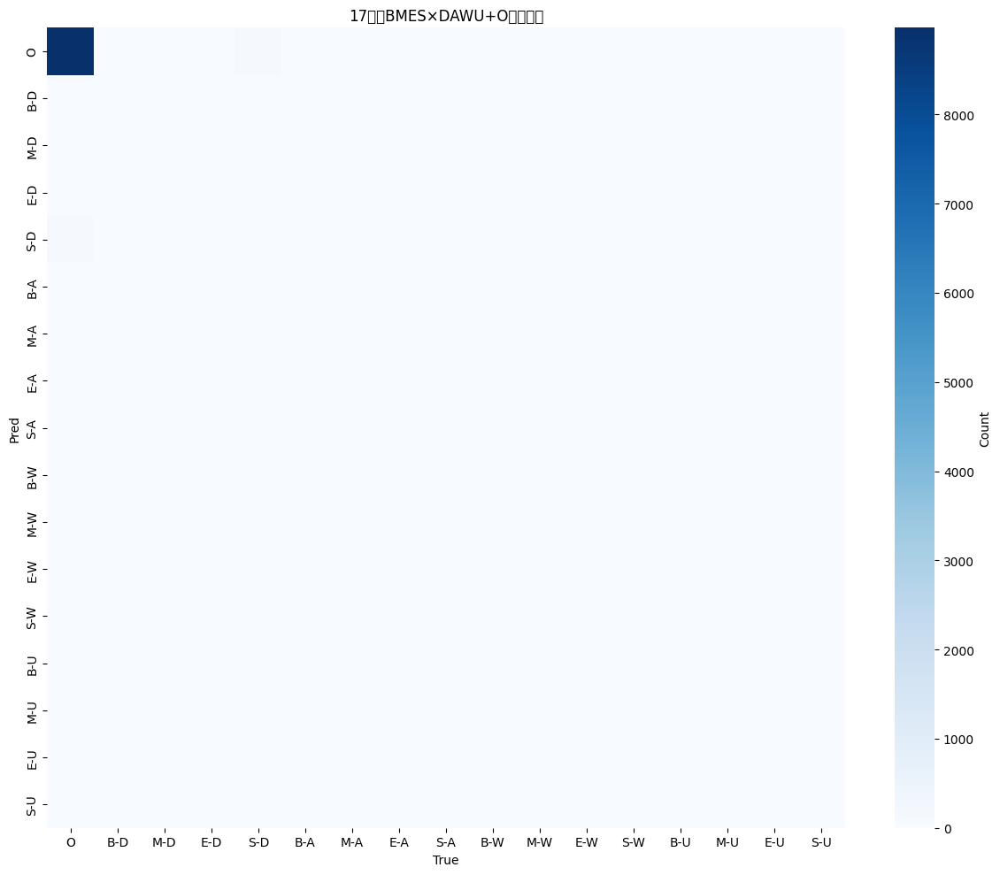

✓ 混淆矩陣已儲存: /content/drive/MyDrive/few-shot/DER_two_stage_489/cm_17_test.png

5類（DAWU+O）測試集 分類報告
              precision    recall  f1-score   support

           O     0.9731    0.9839    0.9785      9120
           D     0.0732    0.0533    0.0616       169
           A     0.0000    0.0000    0.0000        21
           W     0.0417    0.0182    0.0253        55
           U     0.0000    0.0000    0.0000        17

    accuracy                         0.9575      9382
   macro avg     0.2176    0.2111    0.2131      9382
weighted avg     0.9475    0.9575    0.9524      9382



/tmp/ipython-input-459163628.py:1275: UserWarning: Glyph 39006 (\N{CJK UNIFIED IDEOGRAPH-985E}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-459163628.py:1275: UserWarning: Glyph 65288 (\N{FULLWIDTH LEFT PARENTHESIS}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-459163628.py:1275: UserWarning: Glyph 65289 (\N{FULLWIDTH RIGHT PARENTHESIS}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-459163628.py:1275: UserWarning: Glyph 28204 (\N{CJK UNIFIED IDEOGRAPH-6E2C}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-459163628.py:1275: UserWarning: Glyph 35430 (\N{CJK UNIFIED IDEOGRAPH-8A66}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-459163628.py:1275: UserWarning: Glyph 38598 (\N{CJK UNIFIED IDEOGRAPH-96C6}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-459163628.py:1277: UserWarning: Glyph 39006 (\N{CJK UNIFIED IDEOGRAPH-985E

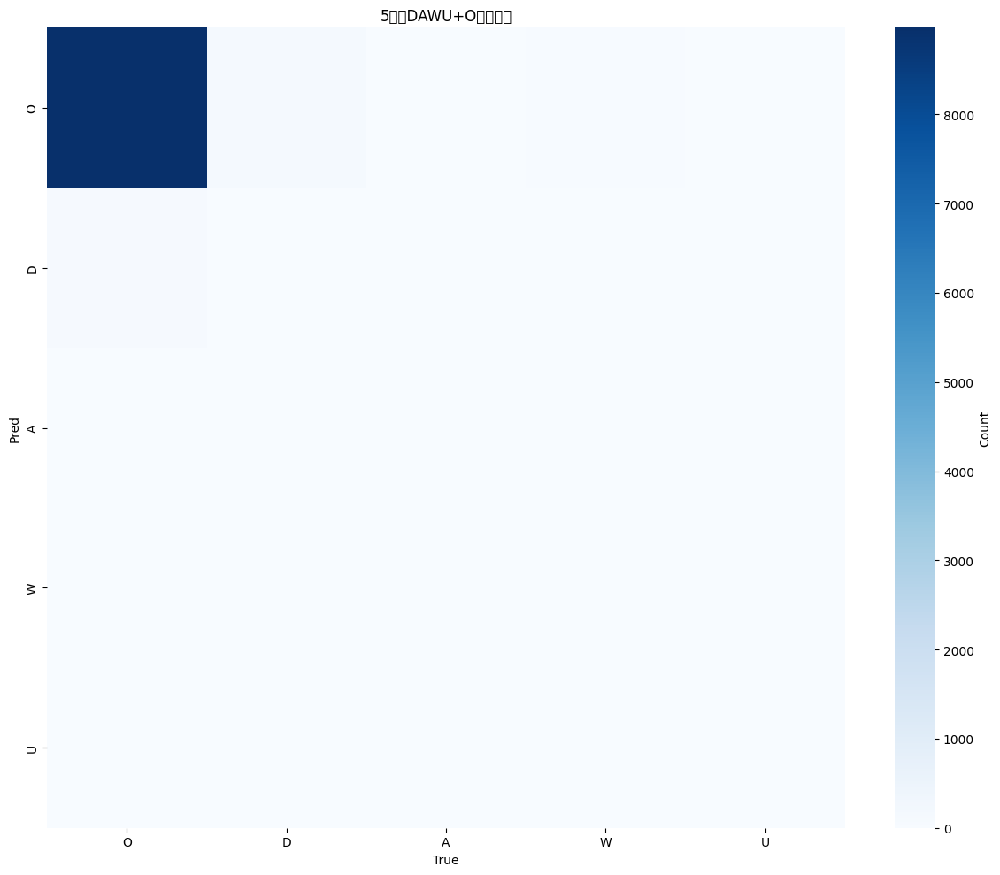

/tmp/ipython-input-459163628.py:1275: UserWarning: Glyph 39006 (\N{CJK UNIFIED IDEOGRAPH-985E}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-459163628.py:1275: UserWarning: Glyph 65288 (\N{FULLWIDTH LEFT PARENTHESIS}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-459163628.py:1275: UserWarning: Glyph 65289 (\N{FULLWIDTH RIGHT PARENTHESIS}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-459163628.py:1275: UserWarning: Glyph 28204 (\N{CJK UNIFIED IDEOGRAPH-6E2C}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-459163628.py:1275: UserWarning: Glyph 35430 (\N{CJK UNIFIED IDEOGRAPH-8A66}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-459163628.py:1275: UserWarning: Glyph 38598 (\N{CJK UNIFIED IDEOGRAPH-96C6}) missing from font(s) DejaVu Sans.
  plt.tight_layout()


✓ 混淆矩陣已儲存: /content/drive/MyDrive/few-shot/DER_two_stage_489/cm_5_test.png

2類（SYM vs O）測試集 分類報告
              precision    recall  f1-score   support

           O     0.9731    0.9839    0.9785      9120
         SYM     0.0870    0.0534    0.0662       262

    accuracy                         0.9579      9382
   macro avg     0.5300    0.5187    0.5223      9382
weighted avg     0.9484    0.9579    0.9530      9382



/tmp/ipython-input-459163628.py:1277: UserWarning: Glyph 39006 (\N{CJK UNIFIED IDEOGRAPH-985E}) missing from font(s) DejaVu Sans.
  plt.savefig(path, dpi=300); plt.show()
/tmp/ipython-input-459163628.py:1277: UserWarning: Glyph 65288 (\N{FULLWIDTH LEFT PARENTHESIS}) missing from font(s) DejaVu Sans.
  plt.savefig(path, dpi=300); plt.show()
/tmp/ipython-input-459163628.py:1277: UserWarning: Glyph 65289 (\N{FULLWIDTH RIGHT PARENTHESIS}) missing from font(s) DejaVu Sans.
  plt.savefig(path, dpi=300); plt.show()
/tmp/ipython-input-459163628.py:1277: UserWarning: Glyph 28204 (\N{CJK UNIFIED IDEOGRAPH-6E2C}) missing from font(s) DejaVu Sans.
  plt.savefig(path, dpi=300); plt.show()
/tmp/ipython-input-459163628.py:1277: UserWarning: Glyph 35430 (\N{CJK UNIFIED IDEOGRAPH-8A66}) missing from font(s) DejaVu Sans.
  plt.savefig(path, dpi=300); plt.show()
/tmp/ipython-input-459163628.py:1277: UserWarning: Glyph 38598 (\N{CJK UNIFIED IDEOGRAPH-96C6}) missing from font(s) DejaVu Sans.
  plt.savefig(

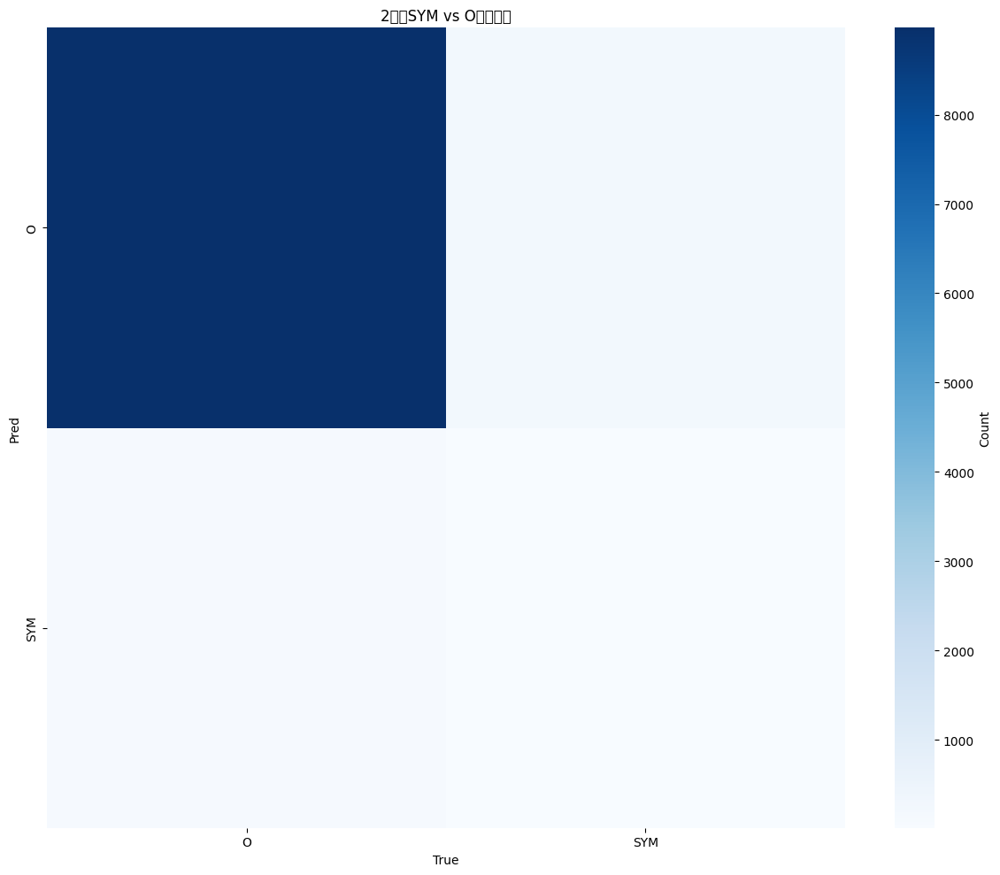

✓ 混淆矩陣已儲存: /content/drive/MyDrive/few-shot/DER_two_stage_489/cm_2_test.png

17類別詳細指標:
標籤          Precision     Recall   F1-Score    Support
------------------------------------------------------------
O              0.9731     0.9839     0.9785       9120
B-D            0.0000     0.0000     0.0000         20
M-D            0.0000     0.0000     0.0000          9
E-D            0.5000     0.0588     0.1053         17
S-D            0.0517     0.0488     0.0502        123
B-A            0.0000     0.0000     0.0000          3
M-A            0.0000     0.0000     0.0000          0
E-A            0.0000     0.0000     0.0000          3
S-A            0.0000     0.0000     0.0000         15
B-W            0.0000     0.0000     0.0000          9
M-W            0.0000     0.0000     0.0000          5
E-W            0.0000     0.0000     0.0000          9
S-W            0.0000     0.0000     0.0000         32
B-U            0.0000     0.0000     0.0000          5
M-U            0.0000     0.

In [ ]:
# 程式碼補丁（直接貼到你 Stage2 的區塊替換 / 增補）

# ============================================
# 兩階段課程式訓練（Stage1: 5類 AutoModelForTokenClassification → Stage2: 17類 BiLSTM+CRF）
# 針對小資料集強化：anchor_nonO + 類型切段 + 連續加權過採樣 + 早停/長程
# 評估：17/5/2 token-F1 + span-F1（Stage2）；Stage1 監測 5/2 類
# ============================================

# ---- 0. 安裝套件（Colab 第一次執行需要）----
!pip -q install transformers==4.44.2 torchcrf==1.1.0 seqeval==1.2.2

# ---- 1. 匯入 ----
import os, csv, random
from collections import Counter
import numpy as np
import pandas as pd
from tqdm.auto import tqdm

import torch
import torch.nn as nn
from torch.utils.data import Dataset, DataLoader, WeightedRandomSampler

from transformers import (
    AutoTokenizer, AutoModelForTokenClassification, BertTokenizerFast, BertModel
)
from torchcrf import CRF

from sklearn.metrics import accuracy_score, f1_score, classification_report, confusion_matrix, precision_recall_fscore_support
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt
import seaborn as sns

# ---- 2. 設定 ----
CONFIG = {
    # 路徑設定（請改成你的實際路徑）
    "encoder_dir": "/content/drive/MyDrive/few-shot/chinese_mentalbert_finetuned_results_simplified/final_model",
    "data_path": "/content/drive/MyDrive/few-shot/noO_select_de.csv",
    "save_root": "/content/drive/MyDrive/few-shot/DER_two_stage_489",

    # 兩階段控制：stage1_5 或 stage2_17
    "stage": "stage2_17",

    # Stage1 儲存與承接設定
    "stage1_ckpt_dir": "/content/drive/MyDrive/few-shot/DER_two_stage_489/stage1_ckpt",
    "stage1_encoder_bin": "/content/drive/MyDrive/few-shot/DER_two_stage_489/stage1_encoder.bin",

    # ===== 核心資料策略 =====
    "window_policy_train": "keep_all",  #anchor_nonO 訓練：以非O為錨，延伸到BMES邊界
    "window_policy_eval":  "keep_all",     # 評估：保持完整避免偏差
    "use_sentence_split_train": False,  #True
    "use_sentence_split_eval":  False,  #True
    "split_on_transition_train": False,  #True   # 在 DAWU 類型切換處拆分
    "split_on_transition_eval":  False,

    # 視窗與長度
    "window_size": 128,
    "window_stride": 96,
    "min_nonO": 2,
    "min_nonO_ratio": 0.05,
    "anchor_ctx_left": 64,
    "anchor_ctx_right": 64,
    "max_len_for_split": 256,
    "max_length": 128,                     # Tokenizer 的 max_length

    # 過採樣策略（依非O密度連續加權；只用於訓練）
    "use_oversampling": True,
    "weight_floor": 0.15,
    "weight_gamma": 0.25,

    # 模型結構（Stage2 用）
    "use_bilstm": True,
    "lstm_hidden": 128,
    "lstm_layers": 1,
    "dropout": 0.4,

    # 解凍策略
    "unfreeze_last_n_layers": 2,
    "lr_encoder": 3e-5,
    "lr_head": 2e-4,

    # 訓練參數
    "batch_size": 8,
    "num_epochs": 50,
    "gradient_clip": 1.0,
    "weight_decay": 5e-3,
    "patience": 10,  # 早停耐心值（Stage1/Stage2 共用）
    "seed": 42,

    # 資料切分
    "test_ratio": 0.15,
    "val_ratio": 0.25
}

os.makedirs(CONFIG["save_root"], exist_ok=True)
os.makedirs(CONFIG["stage1_ckpt_dir"], exist_ok=True)

random.seed(CONFIG["seed"])
np.random.seed(CONFIG["seed"])
torch.manual_seed(CONFIG["seed"])
DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print("DEVICE:", DEVICE)

# ---- 3. 標籤系統 ----
LABELS_17 = [
    "O",
    "B-D","M-D","E-D","S-D",
    "B-A","M-A","E-A","S-A",
    "B-W","M-W","E-W","S-W",
    "B-U","M-U","E-U","S-U",
]
label2id = {lb:i for i,lb in enumerate(LABELS_17)}
id2label = {i:lb for lb,i in label2id.items()}

LABELS_5 = ["O","D","A","W","U"]
lab5_2id = {lb:i for i,lb in enumerate(LABELS_5)}
id2lab5 = {i:lb for lb,i in lab5_2id.items()}

LABELS_2 = ["O","SYM"]
lab2_2id = {lb:i for i,lb in enumerate(LABELS_2)}
id2lab2 = {i:lb for lb,i in lab2_2id.items()}

VALID_PREFIX = {"B","M","E","S"}
VALID_TYPE   = {"D","A","W","U"}

def normalize_bmes(raw):
    if pd.isna(raw): return "O"
    s = str(raw).strip().upper()
    if s=="O": return "O"
    if "-" in s:
        pfx,typ = s.split("-",1)
        pfx,typ = pfx.strip(), typ.strip()
        if pfx in VALID_PREFIX and typ in VALID_TYPE:
            return f"{pfx}-{typ}"
        return "O"
    if s in VALID_TYPE:
        return f"S-{s}"
    return "O"

def bmes_to_5(tag):
    if tag=="O": return "O"
    _, typ = tag.split("-",1)
    return typ if typ in {"D","A","W","U"} else "O"

def bmes_to_2(tag):
    return "O" if tag=="O" else "SYM"

def ids17_to_ids5(ids17):
    return [lab5_2id[bmes_to_5(id2label[i])] for i in ids17]

# ---- 4. 載入資料 ----
def load_data(fp):
    df = pd.read_csv(fp, encoding="utf-8", quoting=csv.QUOTE_ALL, on_bad_lines="warn")
    df = df[df.columns[:9].tolist()]  # 與你原流程一致（保留前9欄）
    df["bmes"] = df["human_label"].apply(normalize_bmes)
    return df

df = load_data(CONFIG["data_path"])
print(f"原始資料列數: {len(df)}")

def group_by_post(df):
    data=[]
    for pid,g in df.groupby("post_id"):
        if "word_order" in g.columns:
            g = g.sort_values("word_order")
        words  = g["word"].astype(str).tolist()
        labels = g["bmes"].astype(str).tolist()
        if len(words)==0 or len(words)!=len(labels):
            continue
        data.append({"post_id": str(pid), "words": words, "labels": [label2id.get(t,0) for t in labels]})
    return data

all_data = group_by_post(df)
print(f"貼文數量: {len(all_data)}")

# 切分資料（以 post 為單位）
train_val, test_data = train_test_split(all_data, test_size=CONFIG["test_ratio"], random_state=CONFIG["seed"], shuffle=True)
train_data, val_data = train_test_split(train_val, test_size=CONFIG["val_ratio"], random_state=CONFIG["seed"], shuffle=True)

# ---- 5. 視窗策略 ----
def id_is_O(tid):
    return id2label[tid] == "O"

def id_type(tid):
    lb = id2label[tid]
    if lb == "O": return "O", None
    pfx, typ = lb.split("-", 1)
    return pfx, typ

def extend_to_bmes_boundary(labels, start_idx, end_idx):
    # 左延
    i = start_idx
    pfx, typ = id_type(labels[i])
    if pfx in {"M","E"} and typ is not None:
        j = i
        while j >= 0:
            p,t = id_type(labels[j])
            if p == "B" and t == typ:
                i = j; break
            j -= 1
        start_idx = max(0, i)
    # 右延
    k = end_idx
    pfx, typ = id_type(labels[k])
    if pfx in {"B","M"} and typ is not None:
        j = k
        while j < len(labels):
            p,t = id_type(labels[j])
            if p == "E" and t == typ:
                k = j; break
            j += 1
        end_idx = min(len(labels)-1, k)
    return start_idx, end_idx

def windowize_keep_all(words, labels, win=128, stride=96):
    L = len(words)
    if L <= win:
        return [(words, labels)]
    out = []
    i = 0
    while i < L:
        j = min(i+win, L)
        out.append((words[i:j], labels[i:j]))
        if j == L: break
        i += stride
    return out

def windowize_filter_nonO(words, labels, win=128, stride=96, min_nonO=1, min_ratio=0.0):
    out = []
    for w, y in windowize_keep_all(words, labels, win, stride):
        nonO = sum(1 for t in y if not id_is_O(t))
        if nonO >= min_nonO or (nonO/len(y)) >= min_ratio:
            out.append((w, y))
    return out if out else [(words[:win], labels[:win])]

def sentence_split(words, labels):
    sents = []
    start = 0
    punct = set("。！？!?…;；")
    for i, w in enumerate(words):
        if any(ch in punct for ch in w):
            sents.append((words[start:i+1], labels[start:i+1]))
            start = i+1
    if start < len(words):
        sents.append((words[start:], labels[start:]))
    return sents if sents else [(words, labels)]

def windowize_anchor_by_nonO(words, labels, win=128, ctx_left=48, ctx_right=48):
    L = len(words)
    nonO_idx = [i for i,t in enumerate(labels) if not id_is_O(t)]
    if not nonO_idx:
        j = min(win, L)
        return [(words[:j], labels[:j])]
    segs = []
    for i in nonO_idx:
        s = max(0, i-ctx_left)
        e = min(L-1, i+ctx_right)
        s, e = extend_to_bmes_boundary(labels, s, e)
        segs.append([s, e])
    # 合併重疊片段
    segs.sort()
    merged = []
    for s,e in segs:
        if not merged or s > merged[-1][1] + 5:
            merged.append([s,e])
        else:
            merged[-1][1] = max(merged[-1][1], e)
    out = [(words[s:e+1], labels[s:e+1]) for s,e in merged]
    return out

def split_on_type_transition(words, labels, max_len=256):
    out = []
    start = 0
    def typ_of(idx):
        p,t = id_type(labels[idx])
        return t
    for i in range(1, len(labels)):
        t_prev = typ_of(i-1)
        t_now  = typ_of(i)
        p_prev,_ = id_type(labels[i-1])
        if (p_prev in {"S","E"}) and (t_prev != t_now):
            out.append((words[start:i], labels[start:i]))
            start = i
    if start < len(labels):
        out.append((words[start:], labels[start:]))
    # 長段再二次視窗
    final = []
    for w, y in out:
        if len(y) > max_len:
            final.extend(windowize_keep_all(w, y, win=max_len, stride=max_len//2))
        else:
            final.append((w, y))
    return final

def build_dataset_with_policy(raw_posts, policy="keep_all",
                              win=128, stride=96,
                              min_nonO=1, min_ratio=0.0,
                              ctx_left=48, ctx_right=48,
                              use_sentence_split=False,
                              split_on_transition=False,
                              max_len_for_split=256):
    data = []
    for d in raw_posts:
        words, y = d["words"], d["labels"]
        chunks = [(words, y)]
        if use_sentence_split:
            chunks = sentence_split(words, y)
        subouts = []
        for w, lab in chunks:
            if policy == "keep_all":
                Ws = windowize_keep_all(w, lab, win, stride)
            elif policy == "filter_nonO":
                Ws = windowize_filter_nonO(w, lab, win, stride, min_nonO, min_ratio)
            elif policy == "anchor_nonO":
                Ws = windowize_anchor_by_nonO(w, lab, win, ctx_left, ctx_right)
            else:
                raise ValueError(f"Unknown policy: {policy}")
            if split_on_transition:
                tmp = []
                for ww, ll in Ws:
                    tmp.extend(split_on_type_transition(ww, ll, max_len=max_len_for_split))
                Ws = tmp
            subouts.extend(Ws)
        for ww, ll in subouts:
            data.append({"post_id": d["post_id"], "words": ww, "labels": ll})
    return data

# ---- 6. 產生訓練/驗證/測試集 ----
train_data = build_dataset_with_policy(
    train_data,
    policy=CONFIG["window_policy_train"],
    win=CONFIG["window_size"],
    stride=CONFIG["window_stride"],
    min_nonO=CONFIG["min_nonO"],
    min_ratio=CONFIG["min_nonO_ratio"],
    ctx_left=CONFIG["anchor_ctx_left"],
    ctx_right=CONFIG["anchor_ctx_right"],
    use_sentence_split=CONFIG["use_sentence_split_train"],
    split_on_transition=CONFIG["split_on_transition_train"],
    max_len_for_split=CONFIG["max_len_for_split"]
)
val_data = build_dataset_with_policy(
    val_data,
    policy=CONFIG["window_policy_eval"],
    win=CONFIG["window_size"],
    stride=CONFIG["window_stride"],
    use_sentence_split=CONFIG["use_sentence_split_eval"],
    split_on_transition=CONFIG["split_on_transition_eval"],
    max_len_for_split=CONFIG["max_len_for_split"]
)
test_data = build_dataset_with_policy(
    test_data,
    policy=CONFIG["window_policy_eval"],
    win=CONFIG["window_size"],
    stride=CONFIG["window_stride"],
    use_sentence_split=CONFIG["use_sentence_split_eval"],
    split_on_transition=CONFIG["split_on_transition_eval"],
    max_len_for_split=CONFIG["max_len_for_split"]
)

print(f"訓練集={len(train_data)} | 驗證集={len(val_data)} | 測試集={len(test_data)}")

# ---- 7. 資料分析 ----
def analyze_dataset(data, name="Dataset"):
    print(f"\n{'='*60}\n📊 {name} 分析\n{'='*60}")
    total_tokens = sum(len(d["labels"]) for d in data)
    total_samples = len(data)
    label_counts = Counter()
    for d in data:
        label_counts.update(d["labels"])
    print(f"樣本數: {total_samples}")
    print(f"總 token 數: {total_tokens}")
    print(f"平均長度: {total_tokens/total_samples:.1f}")
    print(f"\n標籤分布（Top 10）:")
    for lid, cnt in label_counts.most_common(10):
        ratio = cnt/total_tokens*100
        print(f"  {id2label[lid]:8s}: {cnt:6d} ({ratio:5.2f}%)")
    nonO_ratios = [sum(1 for t in d["labels"] if t!=0)/len(d["labels"]) for d in data]
    print(f"\n非O密度統計:")
    print(f"  平均: {np.mean(nonO_ratios):.3f}")
    print(f"  中位數: {np.median(nonO_ratios):.3f}")
    print(f"  最小: {np.min(nonO_ratios):.3f}")
    print(f"  最大: {np.max(nonO_ratios):.3f}")
    all_O = sum(1 for d in data if all(t==0 for t in d["labels"]))
    print(f"  全O樣本: {all_O}/{total_samples} ({all_O/total_samples*100:.1f}%)")

analyze_dataset(train_data, "訓練集")
analyze_dataset(val_data, "驗證集")
analyze_dataset(test_data, "測試集")

# ---- 8. Tokenizer ----
# 為確保 Stage1/Stage2 一致，統一用 AutoTokenizer（MentalBERT 相容）
tokenizer = AutoTokenizer.from_pretrained(CONFIG["encoder_dir"])
# 另外準備 BertTokenizerFast/BertModel 給 Stage2
bert_tokenizer = BertTokenizerFast.from_pretrained(CONFIG["encoder_dir"])

# ---- 9. Dataset/Loader（支援 5/17 類）----
class TokenClsDataset(Dataset):
    def __init__(self, data, tokenizer, max_length=128, label_space="17"):
        self.data = data
        self.tok = tokenizer
        self.max_length = max_length
        assert label_space in {"17","5"}
        self.label_space = label_space

    def __len__(self):
        return len(self.data)

    def __getitem__(self, idx):
        item = self.data[idx]
        enc = self.tok(
            item["words"],
            is_split_into_words=True,
            truncation=True,
            padding="max_length",
            max_length=self.max_length,
            return_offsets_mapping=False,
            return_tensors="pt"
        )
        word_ids = enc.word_ids()
        lab17 = item["labels"]
        if self.label_space == "5":
            lab5 = ids17_to_ids5(lab17)
        labels_ids = []
        prev = None
        for w_idx in word_ids:
            if w_idx is None:
                labels_ids.append(-100)
            elif w_idx != prev:
                if w_idx < len(lab17):
                    labels_ids.append(lab5[w_idx] if self.label_space=="5" else lab17[w_idx])
                else:
                    labels_ids.append(-100)
            else:
                labels_ids.append(-100)
            prev = w_idx
        enc = {k:v.squeeze(0) for k,v in enc.items()}
        enc["labels"] = torch.tensor(labels_ids, dtype=torch.long)
        return enc

# 過採樣（依非O密度；只用於訓練）
O_ID = label2id["O"]
def seq_weights_by_nonO_ratio(raw_data, floor=0.05, gamma=0.5):
    w = []
    for d in raw_data:
        r = sum(1 for t in d["labels"] if t!=O_ID) / max(1, len(d["labels"]))
        w.append(floor + (r**gamma))
    s = sum(w)
    return [x/s for x in w]

def make_loaders(label_space):
    ds_train = TokenClsDataset(train_data, tokenizer, CONFIG["max_length"], label_space=label_space)
    ds_val   = TokenClsDataset(val_data,   tokenizer, CONFIG["max_length"], label_space=label_space)
    ds_test  = TokenClsDataset(test_data,  tokenizer, CONFIG["max_length"], label_space=label_space)

    if CONFIG["use_oversampling"]:
        weights = seq_weights_by_nonO_ratio(train_data, CONFIG["weight_floor"], CONFIG["weight_gamma"])
        sampler = WeightedRandomSampler(weights=weights, num_samples=len(weights), replacement=True)
        ld_train = DataLoader(ds_train, batch_size=CONFIG["batch_size"], sampler=sampler)
    else:
        ld_train = DataLoader(ds_train, batch_size=CONFIG["batch_size"], shuffle=True)
    ld_val  = DataLoader(ds_val,  batch_size=CONFIG["batch_size"], shuffle=False)
    ld_test = DataLoader(ds_test, batch_size=CONFIG["batch_size"], shuffle=False)
    return ds_train, ds_val, ds_test, ld_train, ld_val, ld_test

# ---- 10. 解凍工具（BERT/AutoModel 共用）----
def unfreeze_last_n_layers_of_bert(model_or_encoder, n=0):
    """
    支援:
      - AutoModelForTokenClassification（使用 .base_model.encoder.layer）
      - BertModel（使用 .encoder.layer）
    """
    # 先全部凍結
    for p in model_or_encoder.parameters():
        p.requires_grad = False
    if n <= 0:
        model_or_encoder.eval()
        return

    def mark_trainable(named_params, layer_keyword_list):
        for name, p in named_params:
            if any(kw in name for kw in layer_keyword_list):
                p.requires_grad = True

    # 嘗試抓到 encoder 層數
    try:
        if hasattr(model_or_encoder, "config"):
            L = model_or_encoder.config.num_hidden_layers
        elif hasattr(model_or_encoder, "base_model") and hasattr(model_or_encoder.base_model, "config"):
            L = model_or_encoder.base_model.config.num_hidden_layers
        else:
            L = 12
    except:
        L = 12
    target_idxs = list(range(max(0, L-n), L))

    # 兩種命名空間皆處理
    layer_keywords = [f"encoder.layer.{i}." for i in target_idxs] + ["pooler."]
    mark_trainable(model_or_encoder.named_parameters(), layer_keywords)
    model_or_encoder.train()

# ---- 11. Stage1：5 類 AutoModelForTokenClassification ----
def train_stage1():
    ds_tr, ds_va, ds_te, ld_tr, ld_va, ld_te = make_loaders(label_space="5")

    # 建立模型
    model = AutoModelForTokenClassification.from_pretrained(
        CONFIG["encoder_dir"],
        num_labels=len(LABELS_5)
    ).to(DEVICE)

    # 解凍最後 N 層
    unfreeze_last_n_layers_of_bert(model.base_model, CONFIG["unfreeze_last_n_layers"])

    # 參數群組：被解凍 encoder vs head
    enc_params = [p for n,p in model.named_parameters() if n.startswith(model.base_model_prefix) and p.requires_grad]
    head_params= [p for n,p in model.named_parameters() if (not n.startswith(model.base_model_prefix)) and p.requires_grad]

    optimizer = torch.optim.AdamW([
        {"params": enc_params, "lr": CONFIG["lr_encoder"]},
        {"params": head_params, "lr": CONFIG["lr_head"]}
    ], weight_decay=CONFIG["weight_decay"])

    scheduler = torch.optim.lr_scheduler.StepLR(optimizer, step_size=40, gamma=0.5)

    best_val_loss = float("inf")
    patience_counter = 0
    history=[]

    for epoch in range(1, CONFIG["num_epochs"]+1):
        model.train()
        tr_loss=0.0; nb=0
        for batch in tqdm(ld_tr, desc=f"[Stage1] Epoch {epoch}/{CONFIG['num_epochs']}"):
            input_ids = batch["input_ids"].to(DEVICE)
            attention_mask = batch["attention_mask"].to(DEVICE)
            labels = batch["labels"].to(DEVICE)
            out = model(input_ids=input_ids, attention_mask=attention_mask, labels=labels)
            loss = out.loss
            optimizer.zero_grad()
            loss.backward()
            nn.utils.clip_grad_norm_(model.parameters(), CONFIG["gradient_clip"])
            optimizer.step()
            tr_loss += loss.item(); nb+=1
        scheduler.step()
        avg_tr = tr_loss/max(1,nb)

        # 驗證
        model.eval()
        with torch.no_grad():
            val_loss=0.0; nb2=0
            all_y=[]; all_p=[]
            for batch in ld_va:
                ids = batch["input_ids"].to(DEVICE)
                msk = batch["attention_mask"].to(DEVICE)
                y   = batch["labels"].to(DEVICE)
                out = model(input_ids=ids, attention_mask=msk, labels=y)
                val_loss += out.loss.item(); nb2+=1
                logits = out.logits
                preds = logits.argmax(-1)
                mask  = y.ne(-100)
                all_y.extend(y[mask].cpu().tolist())
                all_p.extend(preds[mask].cpu().tolist())
        val_loss = val_loss/max(1,nb2)
        acc5 = accuracy_score(all_y, all_p)
        f1_5 = f1_score(all_y, all_p, average="macro", zero_division=0)
        y2 = [0 if t==0 else 1 for t in all_y]  # 5類 id=0 對應 "O"
        p2 = [0 if t==0 else 1 for t in all_p]
        f1_2 = f1_score(y2, p2, average="macro", zero_division=0)
        history.append({"epoch":epoch,"train_loss":avg_tr,"val_loss":val_loss,"val_acc_5":acc5,"val_f1_5":f1_5,"val_f1_2":f1_2})
        print(f"Epoch {epoch}: TrainLoss={avg_tr:.4f} | ValLoss={val_loss:.4f} | Acc(5)={acc5:.4f} | F1(5)={f1_5:.4f} | F1(2)={f1_2:.4f}")

        # 早停
        if val_loss < best_val_loss:
            best_val_loss = val_loss
            patience_counter = 0
            # 儲存整個 Stage1 模型（之後可直接 from_pretrained）
            model.save_pretrained(CONFIG["stage1_ckpt_dir"])
            tokenizer.save_pretrained(CONFIG["stage1_ckpt_dir"])
            print("  ✅ 儲存 Stage1 模型至:", CONFIG["stage1_ckpt_dir"])
            # 另外單獨儲存 encoder 權重（供 Stage2 承接）
            base = getattr(model, "base_model", None)
            if base is None:
                # 某些架構用 model.bert
                base = getattr(model, "bert", None)
            if base is not None:
                torch.save(base.state_dict(), CONFIG["stage1_encoder_bin"])
                print("  ✅ 另存 encoder 權重至:", CONFIG["stage1_encoder_bin"])
        else:
            patience_counter += 1
            print(f"  ⏳ 未改善次數: {patience_counter}/{CONFIG['patience']}")
            if patience_counter >= CONFIG["patience"]:
                print(f"\n⏹️ Stage1 早停於 Epoch {epoch}")
                break

    # 測試（5 類）
    print("\n" + "="*60)
    print("📊 Stage1 測試（5 類）")
    print("="*60)
    # 載入最佳
    st1 = AutoModelForTokenClassification.from_pretrained(CONFIG["stage1_ckpt_dir"]).to(DEVICE)
    st1.eval()
    with torch.no_grad():
        all_y=[]; all_p=[]; test_loss=0.0; nb=0
        for batch in tqdm(make_loaders("5")[5], desc="[Stage1] Test"):  # ld_test
            ids = batch["input_ids"].to(DEVICE)
            msk = batch["attention_mask"].to(DEVICE)
            y   = batch["labels"].to(DEVICE)
            out = st1(input_ids=ids, attention_mask=msk, labels=y)
            test_loss += out.loss.item(); nb+=1
            preds = out.logits.argmax(-1)
            mask  = y.ne(-100)
            all_y.extend(y[mask].cpu().tolist())
            all_p.extend(preds[mask].cpu().tolist())
    test_loss /= max(1,nb)
    acc5 = accuracy_score(all_y, all_p)
    f1_5 = f1_score(all_y, all_p, average="macro", zero_division=0)
    y2 = [0 if t==0 else 1 for t in all_y]
    p2 = [0 if t==0 else 1 for t in all_p]
    f1_2 = f1_score(y2, p2, average="macro", zero_division=0)
    print(f"Loss(5): {test_loss:.4f} | Acc(5): {acc5:.4f} | F1(5): {f1_5:.4f} | F1(2): {f1_2:.4f}")

# ---- 12. Stage2：BERT(+BiLSTM)+CRF（17 類）----
class BERT_BiLSTM_CRF(nn.Module):
    def __init__(self, encoder, num_labels, use_bilstm=True, hidden=128, layers=1, dropout=0.3):
        super().__init__()
        self.encoder = encoder
        self.use_bilstm = use_bilstm
        hd = encoder.config.hidden_size
        if use_bilstm:
            self.lstm = nn.LSTM(
                input_size=hd, hidden_size=hidden, num_layers=layers,
                batch_first=True, bidirectional=True, dropout=dropout if layers>1 else 0.0
            )
            cls_in = hidden*2
        else:
            self.lstm = None
            cls_in = hd
        self.drop = nn.Dropout(dropout)
        self.fc   = nn.Linear(cls_in, num_labels)
        self.crf  = CRF(num_labels, batch_first=True)

######新增更強的 CRF 轉移初始化 + 暫時凍結
        # === 強化 BMES + O 的轉移約束 ===
        with torch.no_grad():
            self.crf.start_transitions.fill_(-10.0)  # 非法起點極大懲罰
            self.crf.end_transitions.fill_(-10.0)    # 非法結束極大懲罰
            self.crf.transitions.fill_(-8.0)         # 預設非法轉移

            o = label2id["O"]
            # O<->O 合法（允許長段 O）
            self.crf.transitions[o, o] = +0.5

            for typ in ["D","A","W","U"]:
                b = label2id[f"B-{typ}"]; m = label2id[f"M-{typ}"]
                e = label2id[f"E-{typ}"]; s = label2id[f"S-{typ}"]

                # 合法起點：B, S
                self.crf.start_transitions[b] = +1.5
                self.crf.start_transitions[s] = +1.5

                # 合法結束：E, S, O
                self.crf.end_transitions[e] = +1.0
                self.crf.end_transitions[s] = +1.0
                self.crf.end_transitions[o] = 0.0  # 句尾是 O 也可接受

                # 片段內部轉移
                self.crf.transitions[m, b] = +2.0
                self.crf.transitions[e, b] = +1.5
                self.crf.transitions[m, m] = +1.5
                self.crf.transitions[e, m] = +2.0

                # 片段結束到 O
                self.crf.transitions[o, e] = +0.5
                self.crf.transitions[o, s] = +0.5

                # 從 O 進入新片段
                self.crf.transitions[b, o] = +0.8
                self.crf.transitions[s, o] = +0.8

                # 禁止明顯非法：O->M/E、S->M、E->M/B 等保持強負
                # （已由全域 -8.0 覆蓋，若需要可再個別設更低）

    def freeze_crf_transitions(self, freeze=True):
        # 前幾個 epoch 先凍結 CRF 轉移，專心學 emissions
        for name, p in self.crf.named_parameters():
            if "transitions" in name or "start_transitions" in name or "end_transitions" in name:
                p.requires_grad = not freeze
#########

        # 合法轉移初始化（BMES）
        with torch.no_grad():
            self.crf.start_transitions.fill_(-1.0)
            self.crf.end_transitions.fill_(-1.0)
            self.crf.transitions.fill_(-2.5)
            o = label2id["O"]
            self.crf.transitions[o, o] = 0.0
            for typ in ["D","A","W","U"]:
                b = label2id[f"B-{typ}"]; m = label2id[f"M-{typ}"]
                e = label2id[f"E-{typ}"]; s = label2id[f"S-{typ}"]
                self.crf.start_transitions[b] = 0.0
                self.crf.start_transitions[s] = 0.0
                self.crf.transitions[m, b] = 0.0
                self.crf.transitions[e, b] = 0.0
                self.crf.transitions[m, m] = 0.0
                self.crf.transitions[e, m] = 0.0
                self.crf.transitions[o, s] = 0.0
                self.crf.transitions[o, e] = 0.0
                # O 作中介
                self.crf.transitions[b, o] = 0.0
                self.crf.transitions[s, o] = 0.0

    def forward(self, input_ids, attention_mask, labels=None):
        outputs = self.encoder(input_ids=input_ids, attention_mask=attention_mask)
        x = outputs.last_hidden_state
        if self.use_bilstm:
            x,_ = self.lstm(x)
        x = self.drop(x)
        emissions = self.fc(x)
        mask = attention_mask.bool()
        if labels is not None:
            y = labels.clone()
            y[y==-100] = 0
            loss = -self.crf(emissions, y, mask=mask, reduction="mean")
            preds = self.crf.decode(emissions, mask=mask)
            return loss, preds
        else:
            preds = self.crf.decode(emissions, mask=mask)
            return preds

def decode_spans_bmes(tag_seq):
    spans=[]
    cur_type=None; start=None
    for i,tag in enumerate(tag_seq):
        if tag=="O":
            if cur_type is not None:
                spans.append((cur_type, start, i-1))
                cur_type=None; start=None
            continue
        pfx,typ = tag.split("-",1)
        if pfx=="S":
            spans.append((typ, i, i))
            cur_type=None; start=None
        elif pfx=="B":
            if cur_type is not None:
                spans.append((cur_type, start, i-1))
            cur_type=typ; start=i
        elif pfx=="M":
            if cur_type is None:
                cur_type=typ; start=i
        elif pfx=="E":
            if cur_type is None:
                cur_type=typ; start=i
            spans.append((typ, start, i))
            cur_type=None; start=None
    if cur_type is not None:
        spans.append((cur_type, start, len(tag_seq)-1))
    return spans

def span_f1_17(true_tags_17, pred_tags_17):
    tp=0; fp=0; fn=0
    for y_true, y_pred in zip(true_tags_17, pred_tags_17):
        T = decode_spans_bmes(y_true)
        P = decode_spans_bmes(y_pred)
        T_set = set(T); P_set = set(P)
        tp += len(T_set & P_set)
        fp += len(P_set - T_set)
        fn += len(T_set - P_set)
    prec = tp / max(1,(tp+fp))
    rec  = tp / max(1,(tp+fn))
    f1   = 2*prec*rec / max(1e-12,(prec+rec))
    return prec, rec, f1

@torch.no_grad()
def evaluate_stage2(model, loader, desc="Eval"):
    model.eval()
    all_true_17, all_pred_17 = [], []
    total_loss=0.0; nb=0
    for batch in tqdm(loader, desc=desc, leave=False):
        input_ids = batch["input_ids"].to(DEVICE)
        attention_mask = batch["attention_mask"].to(DEVICE)
        labels = batch["labels"].to(DEVICE)
        loss, preds = model(input_ids, attention_mask, labels=labels)
        total_loss += loss.item(); nb+=1
        for i, pred_seq in enumerate(preds):
            valid = (labels[i] != -100).cpu().numpy()
            y_t = labels[i].detach().cpu().numpy()[valid].tolist()
            y_p = pred_seq[:len(y_t)]
            all_true_17.extend(y_t); all_pred_17.extend(y_p)

    acc_17  = accuracy_score(all_true_17, all_pred_17)
    f1_17   = f1_score(all_true_17, all_pred_17, average="macro", zero_division=0)
    y_true_5 = ids17_to_ids5(all_true_17); y_pred_5 = ids17_to_ids5(all_pred_17)
    y_true_2 = [0 if t==0 else 1 for t in y_true_5]; y_pred_2 = [0 if t==0 else 1 for t in y_pred_5]
    f1_5  = f1_score(y_true_5, y_pred_5, average="macro", zero_division=0)
    f1_2  = f1_score(y_true_2, y_pred_2, average="macro", zero_division=0)

    # span-F1（以段落拼接近似）
    true_tags = [id2label[i] for i in all_true_17]
    pred_tags = [id2label[i] for i in all_pred_17]
    seg=200
    true_seqs=[true_tags[i:i+seg] for i in range(0,len(true_tags),seg)]
    pred_seqs=[pred_tags[i:i+seg] for i in range(0,len(pred_tags),seg)]
    p_span, r_span, f1_span = span_f1_17(true_seqs, pred_seqs)

    return {
        "loss": total_loss/max(1,nb),
        "acc_17": acc_17,
        "f1_17": f1_17,
        "f1_5":  f1_5,
        "f1_2":  f1_2,
        "span_p": p_span, "span_r": r_span, "span_f1": f1_span,
        "y_true_17": all_true_17, "y_pred_17": all_pred_17
    }






# =========================
# 【補丁一】CONFIG 微調（提升非O密度、拉長訓練）
# （放在原 CONFIG 定義之後）
# =========================
CONFIG.update({
    "min_nonO": 3,            # 原建議 2 -> 3
    "min_nonO_ratio": 0.08,   # 原建議 0.05 -> 0.08
    "anchor_ctx_left": 48,
    "anchor_ctx_right": 48,
    "num_epochs": 120,        # Stage2 拉長訓練
    "patience": 15            # 早停耐心拉高
})

# =========================
# 【補丁二】強化版 BERT+BiLSTM+CRF（含更強合法轉移＆凍結轉移功能）
# （覆蓋你原本的 BERT_BiLSTM_CRF 類別）
# =========================
class BERT_BiLSTM_CRF(nn.Module):
    def __init__(self, encoder, num_labels, use_bilstm=True, hidden=128, layers=1, dropout=0.3):
        super().__init__()
        self.encoder = encoder
        self.use_bilstm = use_bilstm
        hd = encoder.config.hidden_size

        if use_bilstm:
            self.lstm = nn.LSTM(
                input_size=hd, hidden_size=hidden, num_layers=layers,
                batch_first=True, bidirectional=True,
                dropout=dropout if layers > 1 else 0.0
            )
            cls_in = hidden * 2
        else:
            self.lstm = None
            cls_in = hd

        self.drop = nn.Dropout(dropout)
        self.fc   = nn.Linear(cls_in, num_labels)
        self.crf  = CRF(num_labels, batch_first=True)

        # === 更強 BMES+O 轉移初始化：非法轉移強負、合法轉移給正值 ===
        with torch.no_grad():
            # 預設大幅懲罰
            self.crf.start_transitions.fill_(-10.0)
            self.crf.end_transitions.fill_(-10.0)
            self.crf.transitions.fill_(-8.0)

            o = label2id["O"]
            # O<->O 允許（長段 O）
            self.crf.transitions[o, o] = +0.5

            for typ in ["D","A","W","U"]:
                b = label2id[f"B-{typ}"]; m = label2id[f"M-{typ}"]
                e = label2id[f"E-{typ}"]; s = label2id[f"S-{typ}"]

                # 合法起點：B 或 S
                self.crf.start_transitions[b] = +1.5
                self.crf.start_transitions[s] = +1.5

                # 合法結束：E 或 S（或句尾 O）
                self.crf.end_transitions[e] = +1.0
                self.crf.end_transitions[s] = +1.0
                self.crf.end_transitions[o] = 0.0

                # 片段內部轉移：B->M/E, M->M/E
                self.crf.transitions[m, b] = +2.0
                self.crf.transitions[e, b] = +1.5
                self.crf.transitions[m, m] = +1.5
                self.crf.transitions[e, m] = +2.0

                # 片段結束後或單字後可回到 O
                self.crf.transitions[o, e] = +0.5
                self.crf.transitions[o, s] = +0.5

                # 從 O 進入新片段
                self.crf.transitions[b, o] = +0.8
                self.crf.transitions[s, o] = +0.8

    def freeze_crf_transitions(self, freeze=True):
        """前幾個 epoch 先凍結 CRF 轉移參數，讓 emissions 先長好。"""
        for name, p in self.crf.named_parameters():
            if ("transitions" in name) or ("start_transitions" in name) or ("end_transitions" in name):
                p.requires_grad = not freeze

    def forward(self, input_ids, attention_mask, labels=None, return_emissions=False):
        """可選回傳 emissions 供輔助 CE loss 使用。"""
        outputs = self.encoder(input_ids=input_ids, attention_mask=attention_mask)
        x = outputs.last_hidden_state
        if self.use_bilstm:
            x, _ = self.lstm(x)
        x = self.drop(x)
        emissions = self.fc(x)
        mask = attention_mask.bool()

        if labels is not None:
            y = labels.clone()
            y[y == -100] = 0
            crf_nll = -self.crf(emissions, y, mask=mask, reduction="mean")
            preds = self.crf.decode(emissions, mask=mask)
            if return_emissions:
                return crf_nll, preds, emissions
            return crf_nll, preds
        else:
            preds = self.crf.decode(emissions, mask=mask)
            if return_emissions:
                return preds, emissions
            return preds

# =========================
# 【補丁三】輔助 CE loss（忽略 -100）
# =========================
def masked_token_ce_loss(logits, labels, ignore_index=-100):
    # logits: (B, T, C), labels: (B, T)
    B, T, C = logits.shape
    logits_ = logits.view(B * T, C)
    labels_ = labels.view(B * T)
    mask = labels_ != ignore_index
    if mask.sum() == 0:
        return torch.tensor(0.0, device=logits.device)
    return nn.CrossEntropyLoss()(logits_[mask], labels_[mask])

# =========================
# 【補丁四】Stage2 訓練（以 Span-F1 作為核心監控 + ReduceLROnPlateau）
# （覆蓋你原本的 train_stage2）
# =========================
from torch.optim.lr_scheduler import ReduceLROnPlateau

@torch.no_grad()
def evaluate_stage2(model, loader, desc="Eval"):
    model.eval()
    all_true_17, all_pred_17 = [], []
    total_loss = 0.0; nb = 0
    for batch in tqdm(loader, desc=desc, leave=False):
        input_ids = batch["input_ids"].to(DEVICE)
        attention_mask = batch["attention_mask"].to(DEVICE)
        labels = batch["labels"].to(DEVICE)

        loss, preds = model(input_ids, attention_mask, labels=labels)
        total_loss += loss.item(); nb += 1

        for i, pred_seq in enumerate(preds):
            valid = (labels[i] != -100).cpu().numpy()
            y_t = labels[i].detach().cpu().numpy()[valid].tolist()
            y_p = pred_seq[:len(y_t)]
            all_true_17.extend(y_t)
            all_pred_17.extend(y_p)

    acc_17  = accuracy_score(all_true_17, all_pred_17)
    f1_17   = f1_score(all_true_17, all_pred_17, average="macro", zero_division=0)

    # 5/2 類監測
    y_true_5 = ids17_to_ids5(all_true_17)
    y_pred_5 = ids17_to_ids5(all_pred_17)
    y_true_2 = [0 if t==0 else 1 for t in y_true_5]
    y_pred_2 = [0 if t==0 else 1 for t in y_pred_5]
    f1_5  = f1_score(y_true_5, y_pred_5, average="macro", zero_division=0)
    f1_2  = f1_score(y_true_2, y_pred_2, average="macro", zero_division=0)

    # span-F1（以固定長度片段近似）
    true_tags = [id2label[i] for i in all_true_17]
    pred_tags = [id2label[i] for i in all_pred_17]
    seg = 200
    true_seqs = [true_tags[i:i+seg] for i in range(0, len(true_tags), seg)]
    pred_seqs = [pred_tags[i:i+seg] for i in range(0, len(pred_tags), seg)]

    def decode_spans_bmes(tag_seq):
        spans=[]; cur_type=None; start=None
        for i, tag in enumerate(tag_seq):
            if tag == "O":
                if cur_type is not None:
                    spans.append((cur_type, start, i-1))
                    cur_type=None; start=None
                continue
            pfx, typ = tag.split("-", 1)
            if pfx == "S":
                spans.append((typ, i, i)); cur_type=None; start=None
            elif pfx == "B":
                if cur_type is not None:
                    spans.append((cur_type, start, i-1))
                cur_type = typ; start = i
            elif pfx == "M":
                if cur_type is None:
                    cur_type = typ; start = i
            elif pfx == "E":
                if cur_type is None:
                    cur_type = typ; start = i
                spans.append((typ, start, i)); cur_type=None; start=None
        if cur_type is not None:
            spans.append((cur_type, start, len(tag_seq)-1))
        return spans

    tp=fp=fn=0
    for y_true, y_pred in zip(true_seqs, pred_seqs):
        T = set(decode_spans_bmes(y_true))
        P = set(decode_spans_bmes(y_pred))
        tp += len(T & P); fp += len(P - T); fn += len(T - P)

    p_span = tp / max(1, (tp + fp))
    r_span = tp / max(1, (tp + fn))
    f1_span = 2 * p_span * r_span / max(1e-12, (p_span + r_span))

    return {
        "loss": total_loss / max(1, nb),
        "acc_17": acc_17,
        "f1_17": f1_17,
        "f1_5":  f1_5,
        "f1_2":  f1_2,
        "span_p": p_span, "span_r": r_span, "span_f1": f1_span,
        "y_true_17": all_true_17, "y_pred_17": all_pred_17
    }

def train_stage2():
    # DataLoader（17 類）
    ds_tr, ds_va, ds_te, ld_tr, ld_va, ld_te = make_loaders(label_space="17")

    # 建立 BERT encoder，承接 Stage1 encoder 權重（若存在）
    encoder = BertModel.from_pretrained(CONFIG["encoder_dir"])
    if os.path.exists(CONFIG["stage1_encoder_bin"]):
        state = torch.load(CONFIG["stage1_encoder_bin"], map_location="cpu")
        missing, unexpected = encoder.load_state_dict(state, strict=False)
        print(f"✓ 載入 Stage1 encoder 權重 | missing={len(missing)} | unexpected={len(unexpected)}")
    else:
        print("⚠️ 找不到 Stage1 encoder 權重，改用原始 encoder")

    # 解凍最後 N 層
    unfreeze_last_n_layers_of_bert(encoder, CONFIG["unfreeze_last_n_layers"])

    # 建立模型
    model = BERT_BiLSTM_CRF(
        encoder=encoder,
        num_labels=len(LABELS_17),
        use_bilstm=CONFIG["use_bilstm"],
        hidden=CONFIG["lstm_hidden"],
        layers=CONFIG["lstm_layers"],
        dropout=CONFIG["dropout"]
    ).to(DEVICE)

    # 參數群組
    enc_params = [p for n,p in model.named_parameters() if n.startswith("encoder.") and p.requires_grad]
    head_params= [p for n,p in model.named_parameters() if (not n.startswith("encoder.")) and p.requires_grad]
    optimizer = torch.optim.AdamW([
        {"params": enc_params, "lr": CONFIG["lr_encoder"]},
        {"params": head_params, "lr": CONFIG["lr_head"]}
    ], weight_decay=CONFIG["weight_decay"])

    # 以 Span-F1 作為調整依據
    scheduler = ReduceLROnPlateau(optimizer, mode='max', factor=0.5, patience=3, verbose=True)

    best_span = 0.0
    patience_counter = 0
    history = []
    lambda_ce = 0.2  # 輔助 CE loss 權重（可在 0.1~0.3 間微調）

    for epoch in range(1, CONFIG["num_epochs"] + 1):
        model.train()
        # 前幾個 epoch 先凍結 CRF 轉移（只學 emissions）
        model.freeze_crf_transitions(freeze=(epoch <= 5))

        tr_loss = 0.0; nb = 0
        pbar = tqdm(ld_tr, desc=f"[Stage2] Epoch {epoch}/{CONFIG['num_epochs']}")
        for batch in pbar:
            input_ids = batch["input_ids"].to(DEVICE)
            attention_mask = batch["attention_mask"].to(DEVICE)
            labels = batch["labels"].to(DEVICE)

            # 取得 CRF NLL 與 emissions（用於 CE）
            crf_nll, _, emissions = model(
                input_ids=input_ids,
                attention_mask=attention_mask,
                labels=labels,
                return_emissions=True
            )
            ce = masked_token_ce_loss(emissions, labels)
            loss = crf_nll + lambda_ce * ce

            optimizer.zero_grad()
            loss.backward()
            nn.utils.clip_grad_norm_(model.parameters(), CONFIG["gradient_clip"])
            optimizer.step()

            tr_loss += loss.item(); nb += 1
            pbar.set_postfix(loss=f"{loss.item():.4f}", ce=f"{ce.item():.4f}")

        avg_tr = tr_loss / max(1, nb)

        # 驗證（回傳 span-F1 等）
        val_res = evaluate_stage2(model, ld_va, desc="驗證")
        span = val_res["span_f1"]
        history.append({
            "epoch": epoch,
            "train_loss": avg_tr,
            "val_loss": val_res["loss"],
            "val_acc_17": val_res["acc_17"],
            "val_f1_17": val_res["f1_17"],
            "val_f1_5":  val_res["f1_5"],
            "val_f1_2":  val_res["f1_2"],
            "val_span_f1": span
        })

        print(f"Epoch {epoch}: TrainLoss={avg_tr:.4f} | ValLoss={val_res['loss']:.4f} | "
              f"F1(17)={val_res['f1_17']:.4f} | F1(5)={val_res['f1_5']:.4f} | "
              f"F1(2)={val_res['f1_2']:.4f} | Span-F1={span:.4f}")

        # 用 Span-F1 決定是否降 LR
        scheduler.step(span)

        # 早停以 Span-F1 為主
        if span > best_span:
            best_span = span
            patience_counter = 0
            ckpt_path = os.path.join(CONFIG["save_root"], "stage2_best_DER_17_bySpanF1.pt")
            torch.save({"model_state_dict": model.state_dict(), "best_span_f1": best_span}, ckpt_path)
            print("  ✅ 以 Span-F1 保存最佳模型 →", ckpt_path)
        else:
            patience_counter += 1
            print(f"  ⏳ 未改善次數: {patience_counter}/{CONFIG['patience']}")
            if patience_counter >= CONFIG["patience"]:
                print(f"\n⏹️ Stage2 早停於 Epoch {epoch}（依 Span-F1）")
                break

    # =========================
    # 測試（以 Span-F1 最佳模型）
    # =========================
    print("\n" + "="*60)
    print("📊 Stage2 測試（17 類）")
    print("="*60)
    ckpt_span = os.path.join(CONFIG["save_root"], "stage2_best_DER_17_bySpanF1.pt")
    if os.path.exists(ckpt_span):
        ckpt = torch.load(ckpt_span, map_location=DEVICE)
        model.load_state_dict(ckpt["model_state_dict"])
        print(f"最佳 Span-F1 = {ckpt['best_span_f1']:.4f}")

    test_res = evaluate_stage2(model, ld_te, desc="測試")
    print(f"\nLoss     : {test_res['loss']:.4f}")
    print(f"Acc(17)  : {test_res['acc_17']:.4f}")
    print(f"F1(17)   : {test_res['f1_17']:.4f}")
    print(f"F1(5)    : {test_res['f1_5']:.4f}")
    print(f"F1(2)    : {test_res['f1_2']:.4f}")
    print(f"Span-F1  : {test_res['span_f1']:.4f}")




def train_stage2():
    # DataLoader（17 類空間）
    ds_tr, ds_va, ds_te, ld_tr, ld_va, ld_te = make_loaders(label_space="17")

    # 建立 BERT encoder，承接 Stage1 encoder 權重（若存在）
    encoder = BertModel.from_pretrained(CONFIG["encoder_dir"])
    if os.path.exists(CONFIG["stage1_encoder_bin"]):
        state = torch.load(CONFIG["stage1_encoder_bin"], map_location="cpu")
        missing, unexpected = encoder.load_state_dict(state, strict=False)
        print("✓ 載入 Stage1 encoder 權重 | missing:", len(missing), "| unexpected:", len(unexpected))
    else:
        print("⚠️ 找不到 Stage1 encoder 權重，改用原始 encoder")

    # 解凍最後 N 層
    unfreeze_last_n_layers_of_bert(encoder, CONFIG["unfreeze_last_n_layers"])

    # 建立模型
    model = BERT_BiLSTM_CRF(
        encoder=encoder, num_labels=len(LABELS_17),
        use_bilstm=CONFIG["use_bilstm"], hidden=CONFIG["lstm_hidden"],
        layers=CONFIG["lstm_layers"], dropout=CONFIG["dropout"]
    ).to(DEVICE)

    # 參數群組
    enc_params = [p for n,p in model.named_parameters() if n.startswith("encoder.") and p.requires_grad]
    head_params= [p for n,p in model.named_parameters() if (not n.startswith("encoder.")) and p.requires_grad]
    optimizer = torch.optim.AdamW([
        {"params": enc_params, "lr": CONFIG["lr_encoder"]},
        {"params": head_params, "lr": CONFIG["lr_head"]}
    ], weight_decay=CONFIG["weight_decay"])
    scheduler = torch.optim.lr_scheduler.StepLR(optimizer, step_size=40, gamma=0.5)

    best_val_loss = float("inf")
    patience_counter = 0
    history=[]
######
    # lambda_ce = 0.2  # 可在 0.1~0.3 微調
#######

    for epoch in range(1, CONFIG["num_epochs"]+1):
        model.train()
        tr_loss=0.0; nb=0
        for batch in tqdm(ld_tr, desc=f"[Stage2] Epoch {epoch}/{CONFIG['num_epochs']}"):
            input_ids = batch["input_ids"].to(DEVICE)
            attention_mask = batch["attention_mask"].to(DEVICE)
            labels = batch["labels"].to(DEVICE)
            loss, _ = model(input_ids, attention_mask, labels=labels)
            optimizer.zero_grad()
            loss.backward()
            nn.utils.clip_grad_norm_(model.parameters(), CONFIG["gradient_clip"])
            optimizer.step()
            tr_loss += loss.item(); nb+=1
        scheduler.step()
        avg_tr = tr_loss/max(1,nb)

        # 驗證
        val_res = evaluate_stage2(model, ld_va, desc="驗證")
        history.append({
            "epoch": epoch,
            "train_loss": avg_tr,
            "val_loss": val_res["loss"],
            "val_acc_17": val_res["acc_17"],
            "val_f1_17": val_res["f1_17"],
            "val_f1_5":  val_res["f1_5"],
            "val_f1_2":  val_res["f1_2"],
            "val_span_f1": val_res["span_f1"]
        })
        print(f"Epoch {epoch}: TrainLoss={avg_tr:.4f} | ValLoss={val_res['loss']:.4f} | "
              f"F1(17)={val_res['f1_17']:.4f} | F1(5)={val_res['f1_5']:.4f} | "
              f"F1(2)={val_res['f1_2']:.4f} | Span-F1={val_res['span_f1']:.4f}")

        # 早停
        if val_res["loss"] < best_val_loss:
            best_val_loss = val_res["loss"]
            ckpt_path = os.path.join(CONFIG["save_root"], "stage2_best_DER_17_byValLoss.pt")
            torch.save({"model_state_dict": model.state_dict(), "best_val_loss": best_val_loss}, ckpt_path)
            print("  ✅ 儲存 Stage2 最佳模型 →", ckpt_path)
            patience_counter = 0
        else:
            patience_counter += 1
            print(f"  ⏳ 未改善次數: {patience_counter}/{CONFIG['patience']}")
            if patience_counter >= CONFIG["patience"]:
                print(f"\n⏹️ Stage2 早停於 Epoch {epoch}")
                break

    # 測試
    print("\n" + "="*60)
    print("📊 Stage2 測試（17 類）")
    print("="*60)
    ckpt_path = os.path.join(CONFIG["save_root"], "stage2_best_DER_17_byValLoss.pt")
    if os.path.exists(ckpt_path):
        ckpt = torch.load(ckpt_path, map_location=DEVICE)
        model.load_state_dict(ckpt["model_state_dict"])
        print(f"最佳模型 ValLoss={ckpt['best_val_loss']:.4f}")
    test_res = evaluate_stage2(model, ld_te, desc="測試")
    print(f"\nLoss     : {test_res['loss']:.4f}")
    print(f"Acc(17)  : {test_res['acc_17']:.4f}")
    print(f"F1(17)   : {test_res['f1_17']:.4f}")
    print(f"F1(5)    : {test_res['f1_5']:.4f}")
    print(f"F1(2)    : {test_res['f1_2']:.4f}")
    print(f"Span-F1  : {test_res['span_f1']:.4f}")

    # 報告與混淆矩陣（17/5/2）
    y_true_17 = test_res["y_true_17"]; y_pred_17 = test_res["y_pred_17"]
    def print_report_and_cm(y_true, y_pred, names, title, fname):
        print(f"\n{'='*60}\n{title} 分類報告\n{'='*60}")
        print(classification_report(
            y_true, y_pred, labels=list(range(len(names))), target_names=names, digits=4, zero_division=0
        ))
        cm = confusion_matrix(y_true, y_pred, labels=list(range(len(names))))
        plt.figure(figsize=(12,10))
        sns.heatmap(cm.T, annot=False, fmt='d', cmap='Blues',
                    xticklabels=names, yticklabels=names, cbar_kws={'label':'Count'})
        plt.xlabel("True"); plt.ylabel("Pred"); plt.title(title)
        plt.tight_layout()
        path = os.path.join(CONFIG["save_root"], fname)
        plt.savefig(path, dpi=300); plt.show()
        print("✓ 混淆矩陣已儲存:", path)

    print_report_and_cm(y_true_17, y_pred_17, LABELS_17, "17類（BMES×DAWU+O）測試集", "cm_17_test.png")
    y_true_5 = ids17_to_ids5(y_true_17); y_pred_5 = ids17_to_ids5(y_pred_17)
    print_report_and_cm(y_true_5, y_pred_5, LABELS_5, "5類（DAWU+O）測試集", "cm_5_test.png")
    y_true_2 = [0 if t==0 else 1 for t in y_true_5]; y_pred_2 = [0 if t==0 else 1 for t in y_pred_5]
    print_report_and_cm(y_true_2, y_pred_2, LABELS_2, "2類（SYM vs O）測試集", "cm_2_test.png")

    # 17類別詳細指標
    prec_17, rec_17, f1_17_per_class, _ = precision_recall_fscore_support(
        y_true_17, y_pred_17, labels=list(range(len(LABELS_17))), zero_division=0
    )
    print("\n17類別詳細指標:")
    print(f"{'標籤':<10} {'Precision':>10} {'Recall':>10} {'F1-Score':>10} {'Support':>10}")
    print("-"*60)
    label_support = Counter(y_true_17)
    for i, label in enumerate(LABELS_17):
        support = label_support[i]
        print(f"{label:<10} {prec_17[i]:>10.4f} {rec_17[i]:>10.4f} {f1_17_per_class[i]:>10.4f} {support:>10d}")

# ---- 13. 執行入口 ----
if CONFIG["stage"] == "stage1_5":
    train_stage1()
elif CONFIG["stage"] == "stage2_17":
    train_stage2()
else:
    raise ValueError("CONFIG['stage'] 需為 'stage1_5' 或 'stage2_17'")


### 1127 修改

In [ ]:
# ============================================
# 兩階段訓練（Stage1: 5類 AutoModelForTokenClassification →
#         Stage2: 17類 BERT(+BiLSTM)+CRF）
# 強化：anchor_nonO + 類別感知取樣 + 稀有片段copy-paste +
#      動態 O-dropout + 強CRF先驗 + 凍CRF轉移 + Span-F1監控降LR
# 評估：Stage1 (5/2)；Stage2 (17/5/2 + Span-F1)
# ============================================

# ---- 0. 安裝套件（Colab 第一次執行需要）----
!pip -q install transformers==4.44.2 torchcrf==1.1.0 seqeval==1.2.2

# ---- 1. 匯入 ----
import os, csv, random
from collections import Counter, defaultdict
import numpy as np
import pandas as pd
from tqdm.auto import tqdm

import torch
import torch.nn as nn
from torch.utils.data import Dataset, DataLoader, WeightedRandomSampler

from transformers import (
    AutoTokenizer, AutoModelForTokenClassification, BertTokenizerFast, BertModel
)
from torchcrf import CRF

from sklearn.metrics import accuracy_score, f1_score, classification_report, confusion_matrix, precision_recall_fscore_support
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt
import seaborn as sns

# ---- 2. 設定 ----
CONFIG = {
    # 路徑（請改成你的實際路徑）
    "encoder_dir": "/content/drive/MyDrive/few-shot/chinese_mentalbert_finetuned_results_simplified/final_model",
    "data_path":   "/content/drive/MyDrive/few-shot/noO_select_de.csv",
    "save_root":   "/content/drive/MyDrive/few-shot/DER_two_stage_489",

    # 階段選擇：'stage1_5' 或 'stage2_17'
    "stage": "stage1_5",

    # Stage1 儲存/承接
    "stage1_ckpt_dir":  "/content/drive/MyDrive/few-shot/DER_two_stage_489/stage1_ckpt",
    "stage1_encoder_bin": "/content/drive/MyDrive/few-shot/DER_two_stage_489/stage1_encoder.bin",

    # ===== 資料策略 =====
    # 訓練：以非O為錨、延伸到BMES邊界；評估：keep_all 避免偏差
    "window_policy_train": "anchor_nonO",
    "window_policy_eval":  "keep_all",
    "use_sentence_split_train": True,
    "use_sentence_split_eval":  True,
    "split_on_transition_train": True,   # 在 DAWU 類型切換處拆分（訓練強化邊界）
    "split_on_transition_eval":  False,

    # 視窗與長度
    "window_size": 128,
    "window_stride": 96,
    "min_nonO": 3,
    "min_nonO_ratio": 0.08,
    "anchor_ctx_left": 48,
    "anchor_ctx_right": 48,
    "max_len_for_split": 256,
    "max_length": 128,     # Tokenizer 的 max_length

    # 取樣／擴增
    "use_class_aware_sampler": True,   # 類別感知取樣（建議）
    "use_ratio_sampler": False,        # 備用：非O密度連續加權
    "weight_floor": 0.15,
    "weight_gamma": 0.25,
    "use_span_copypaste": True,
    "aug_per_type": 200,               # U/A/W 各增多少樣本（僅訓練集）

    # 動態 O-dropout（只在訓練集 dataset 標籤映射時生效）
    "o_dropout_max": 0.8,     # 第1個epoch
    "o_dropout_min": 0.2,     # 最後epoch

    # 模型結構（Stage2）
    "use_bilstm": True,
    "lstm_hidden": 128,
    "lstm_layers": 1,
    "dropout": 0.4,

    # 解凍策略
    "unfreeze_last_n_layers": 2,
    "lr_encoder": 3e-5,
    "lr_head": 2e-4,

    # 訓練參數
    "batch_size": 8,
    "num_epochs": 120,       # Stage2 長程訓練
    "gradient_clip": 1.0,
    "weight_decay": 5e-3,
    "patience": 15,          # Stage2 早停（依 Span-F1）
    "seed": 42,

    # 資料切分
    "test_ratio": 0.15,
    "val_ratio": 0.25
}

os.makedirs(CONFIG["save_root"], exist_ok=True)
os.makedirs(CONFIG["stage1_ckpt_dir"], exist_ok=True)

random.seed(CONFIG["seed"])
np.random.seed(CONFIG["seed"])
torch.manual_seed(CONFIG["seed"])
DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print("DEVICE:", DEVICE)

# ---- 3. 標籤系統 ----
LABELS_17 = [
    "O",
    "B-D","M-D","E-D","S-D",
    "B-A","M-A","E-A","S-A",
    "B-W","M-W","E-W","S-W",
    "B-U","M-U","E-U","S-U",
]
label2id = {lb:i for i,lb in enumerate(LABELS_17)}
id2label = {i:lb for lb,i in label2id.items()}

LABELS_5 = ["O","D","A","W","U"]
lab5_2id = {lb:i for i,lb in enumerate(LABELS_5)}
id2lab5 = {i:lb for lb,i in lab5_2id.items()}

LABELS_2 = ["O","SYM"]
lab2_2id = {lb:i for i,lb in enumerate(LABELS_2)}

VALID_PREFIX = {"B","M","E","S"}
VALID_TYPE   = {"D","A","W","U"}

def normalize_bmes(raw):
    if pd.isna(raw): return "O"
    s = str(raw).strip().upper()
    if s=="O": return "O"
    if "-" in s:
        pfx,typ = s.split("-",1)
        pfx,typ = pfx.strip(), typ.strip()
        if pfx in VALID_PREFIX and typ in VALID_TYPE:
            return f"{pfx}-{typ}"
        return "O"
    if s in VALID_TYPE:
        return f"S-{s}"
    return "O"

def bmes_to_5(tag):
    if tag=="O": return "O"
    _, typ = tag.split("-",1)
    return typ if typ in {"D","A","W","U"} else "O"

def bmes_to_2(tag):
    return "O" if tag=="O" else "SYM"

def ids17_to_ids5(ids17):
    return [lab5_2id[bmes_to_5(id2label[i])] for i in ids17]

# ---- 4. 載入資料 ----
def load_data(fp):
    df = pd.read_csv(fp, encoding="utf-8", quoting=csv.QUOTE_ALL, on_bad_lines="warn")
    df = df[df.columns[:9].tolist()]   # 保留前9欄（與你現有流程一致）
    df["bmes"] = df["human_label"].apply(normalize_bmes)
    return df

df = load_data(CONFIG["data_path"])
print(f"原始資料列數: {len(df)}")

def group_by_post(df):
    data=[]
    for pid,g in df.groupby("post_id"):
        if "word_order" in g.columns:
            g = g.sort_values("word_order")
        words  = g["word"].astype(str).tolist()
        labels = g["bmes"].astype(str).tolist()
        if len(words)==0 or len(words)!=len(labels):
            continue
        data.append({"post_id": str(pid), "words": words, "labels": [label2id.get(t,0) for t in labels]})
    return data

all_data = group_by_post(df)
print(f"貼文數量: {len(all_data)}")

# 切分資料（以 post 為單位）
train_val, test_data = train_test_split(all_data, test_size=CONFIG["test_ratio"], random_state=CONFIG["seed"], shuffle=True)
train_data, val_data = train_test_split(train_val, test_size=CONFIG["val_ratio"], random_state=CONFIG["seed"], shuffle=True)

# ---- 5. 視窗策略 ----
def id_is_O(tid): return id2label[tid] == "O"

def id_type(tid):
    lb = id2label[tid]
    if lb == "O": return "O", None
    pfx, typ = lb.split("-", 1)
    return pfx, typ

def extend_to_bmes_boundary(labels, start_idx, end_idx):
    # 左延
    i = start_idx
    pfx, typ = id_type(labels[i])
    if pfx in {"M","E"} and typ is not None:
        j = i
        while j >= 0:
            p,t = id_type(labels[j])
            if p == "B" and t == typ:
                i = j; break
            j -= 1
        start_idx = max(0, i)
    # 右延
    k = end_idx
    pfx, typ = id_type(labels[k])
    if pfx in {"B","M"} and typ is not None:
        j = k
        while j < len(labels):
            p,t = id_type(labels[j])
            if p == "E" and t == typ:
                k = j; break
            j += 1
        end_idx = min(len(labels)-1, k)
    return start_idx, end_idx

def windowize_keep_all(words, labels, win=128, stride=96):
    L = len(words)
    if L <= win:
        return [(words, labels)]
    out=[]; i=0
    while i < L:
        j = min(i+win, L)
        out.append((words[i:j], labels[i:j]))
        if j == L: break
        i += stride
    return out

def windowize_filter_nonO(words, labels, win=128, stride=96, min_nonO=1, min_ratio=0.0):
    out = []
    for w, y in windowize_keep_all(words, labels, win, stride):
        nonO = sum(1 for t in y if not id_is_O(t))
        if nonO >= min_nonO or (nonO/len(y)) >= min_ratio:
            out.append((w, y))
    return out if out else [(words[:win], labels[:win])]

def sentence_split(words, labels):
    sents=[]; start=0; punct=set("。！？!?…;；")
    for i,w in enumerate(words):
        if any(ch in punct for ch in w):
            sents.append((words[start:i+1], labels[start:i+1])); start=i+1
    if start < len(words):
        sents.append((words[start:], labels[start:]))
    return sents if sents else [(words, labels)]

def windowize_anchor_by_nonO(words, labels, win=128, ctx_left=48, ctx_right=48):
    L = len(words)
    nonO_idx = [i for i,t in enumerate(labels) if not id_is_O(t)]
    if not nonO_idx:
        j = min(win, L)
        return [(words[:j], labels[:j])]
    segs=[]
    for i in nonO_idx:
        s = max(0, i-ctx_left)
        e = min(L-1, i+ctx_right)
        s, e = extend_to_bmes_boundary(labels, s, e)
        segs.append([s, e])
    segs.sort()
    merged=[]
    for s,e in segs:
        if not merged or s > merged[-1][1] + 5:
            merged.append([s,e])
        else:
            merged[-1][1] = max(merged[-1][1], e)
    out = [(words[s:e+1], labels[s:e+1]) for s,e in merged]
    return out

def split_on_type_transition(words, labels, max_len=256):
    out=[]; start=0
    def typ_of(idx):
        p,t = id_type(labels[idx]); return t
    for i in range(1, len(labels)):
        t_prev = typ_of(i-1); t_now  = typ_of(i)
        p_prev,_ = id_type(labels[i-1])
        if (p_prev in {"S","E"}) and (t_prev != t_now):
            out.append((words[start:i], labels[start:i])); start=i
    if start < len(labels): out.append((words[start:], labels[start:]))
    final=[]
    for w, y in out:
        if len(y) > max_len:
            final.extend(windowize_keep_all(w, y, win=max_len, stride=max_len//2))
        else:
            final.append((w, y))
    return final

def build_dataset_with_policy(raw_posts, policy="keep_all",
                              win=128, stride=96,
                              min_nonO=1, min_ratio=0.0,
                              ctx_left=48, ctx_right=48,
                              use_sentence_split=False,
                              split_on_transition=False,
                              max_len_for_split=256):
    data=[]
    for d in raw_posts:
        words, y = d["words"], d["labels"]
        chunks = [(words, y)]
        if use_sentence_split:
            chunks = sentence_split(words, y)
        subouts=[]
        for w, lab in chunks:
            if policy == "keep_all":
                Ws = windowize_keep_all(w, lab, win, stride)
            elif policy == "filter_nonO":
                Ws = windowize_filter_nonO(w, lab, win, stride, min_nonO, min_ratio)
            elif policy == "anchor_nonO":
                Ws = windowize_anchor_by_nonO(w, lab, win, ctx_left, ctx_right)
            else:
                raise ValueError(f"Unknown policy: {policy}")
            if split_on_transition:
                tmp=[]
                for ww, ll in Ws:
                    tmp.extend(split_on_type_transition(ww, ll, max_len=max_len_for_split))
                Ws = tmp
            subouts.extend(Ws)
        for ww, ll in subouts:
            data.append({"post_id": d["post_id"], "words": ww, "labels": ll})
    return data

# ---- 6. 產生訓練/驗證/測試集 ----
train_data = build_dataset_with_policy(
    train_data,
    policy=CONFIG["window_policy_train"],
    win=CONFIG["window_size"],
    stride=CONFIG["window_stride"],
    min_nonO=CONFIG["min_nonO"],
    min_ratio=CONFIG["min_nonO_ratio"],
    ctx_left=CONFIG["anchor_ctx_left"],
    ctx_right=CONFIG["anchor_ctx_right"],
    use_sentence_split=CONFIG["use_sentence_split_train"],
    split_on_transition=CONFIG["split_on_transition_train"],
    max_len_for_split=CONFIG["max_len_for_split"]
)
val_data = build_dataset_with_policy(
    val_data,
    policy=CONFIG["window_policy_eval"],
    win=CONFIG["window_size"],
    stride=CONFIG["window_stride"],
    use_sentence_split=CONFIG["use_sentence_split_eval"],
    split_on_transition=CONFIG["split_on_transition_eval"],
    max_len_for_split=CONFIG["max_len_for_split"]
)
test_data = build_dataset_with_policy(
    test_data,
    policy=CONFIG["window_policy_eval"],
    win=CONFIG["window_size"],
    stride=CONFIG["window_stride"],
    use_sentence_split=CONFIG["use_sentence_split_eval"],
    split_on_transition=CONFIG["split_on_transition_eval"],
    max_len_for_split=CONFIG["max_len_for_split"]
)

print(f"訓練集={len(train_data)} | 驗證集={len(val_data)} | 測試集={len(test_data)}")

# ---- 7. 資料分析（可選列印）----
def analyze_dataset(data, name="Dataset"):
    print(f"\n{'='*60}\n📊 {name} 分析\n{'='*60}")
    total_tokens = sum(len(d["labels"]) for d in data)
    total_samples = len(data)
    label_counts = Counter()
    for d in data: label_counts.update(d["labels"])
    print(f"樣本數: {total_samples}")
    print(f"總 token 數: {total_tokens}")
    print(f"平均長度: {total_tokens/total_samples:.1f}")
    print(f"\n標籤分布（Top 10）:")
    for lid, cnt in label_counts.most_common(10):
        ratio = cnt/total_tokens*100
        print(f"  {id2label[lid]:8s}: {cnt:6d} ({ratio:5.2f}%)")
    nonO_ratios = [sum(1 for t in d["labels"] if t!=0)/len(d["labels"]) for d in data]
    print(f"\n非O密度統計:")
    print(f"  平均: {np.mean(nonO_ratios):.3f}")
    print(f"  中位數: {np.median(nonO_ratios):.3f}")
    print(f"  最小: {np.min(nonO_ratios):.3f}")
    print(f"  最大: {np.max(nonO_ratios):.3f}")
    all_O = sum(1 for d in data if all(t==0 for t in d["labels"]))
    print(f"  全O樣本: {all_O}/{total_samples} ({all_O/total_samples*100:.1f}%)")

analyze_dataset(train_data, "訓練集")
analyze_dataset(val_data,   "驗證集")
analyze_dataset(test_data,  "測試集")

# ---- 8. 稀有片段 copy-paste 擴增（僅訓練集）----
def extract_spans(words, labels):
    spans=[]; cur_typ=None; start=None
    for i, lid in enumerate(labels):
        tag = id2label[lid]
        if tag == "O":
            if cur_typ is not None:
                spans.append((cur_typ, start, i-1))
                cur_typ=None; start=None
            continue
        pfx, typ = tag.split("-", 1)
        if pfx == "S":
            spans.append((typ, i, i)); cur_typ=None; start=None
        elif pfx == "B":
            if cur_typ is not None:
                spans.append((cur_typ, start, i-1))
            cur_typ=typ; start=i
        elif pfx == "M":
            if cur_typ is None:
                cur_typ=typ; start=i
        elif pfx == "E":
            if cur_typ is None:
                cur_typ=typ; start=i
            spans.append((typ, start, i)); cur_typ=None; start=None
    if cur_typ is not None:
        spans.append((cur_typ, start, len(labels)-1))
    return spans  # [(typ, s, e), ...]

def copy_paste_rare_spans(train_data, target_types=("U","A","W"), aug_per_type=200, max_try=10000):
    rare_bank = {t: [] for t in target_types}
    for d in train_data:
        spans = extract_spans(d["words"], d["labels"])
        for typ,s,e in spans:
            if typ in target_types:
                rare_bank[typ].append((d["words"][s:e+1], d["labels"][s:e+1]))
    neutral = [d for d in train_data if sum(1 for t in d["labels"] if t!=label2id["O"]) <= 1]
    new_samples=[]; tries=0
    for typ in target_types:
        for _ in range(aug_per_type):
            tries += 1
            if tries > max_try or len(rare_bank[typ])==0 or len(neutral)==0: break
            span_words, span_labels = random.choice(rare_bank[typ])
            host = random.choice(neutral)
            if len(host["words"]) + len(span_words) > 256:  # 控制長度
                continue
            pos = random.randint(0, len(host["words"]))
            new_w = host["words"][:pos] + span_words + host["words"][pos:]
            new_y = host["labels"][:pos] + span_labels + host["labels"][pos:]
            new_samples.append({"post_id": host["post_id"]+"_aug", "words": new_w, "labels": new_y})
    train_data.extend(new_samples)
    print(f"[AUG] 產生新樣本: {len(new_samples)}")

if CONFIG["use_span_copypaste"]:
    copy_paste_rare_spans(train_data, target_types=("U","A","W"), aug_per_type=CONFIG["aug_per_type"])

# ---- 9. Tokenizer ----
tokenizer = AutoTokenizer.from_pretrained(CONFIG["encoder_dir"])
bert_tokenizer = BertTokenizerFast.from_pretrained(CONFIG["encoder_dir"])

# ---- 10. Dataset/Loader（支援 5/17 類 + 動態 O-dropout）----
class TokenClsDataset(Dataset):
    def __init__(self, data, tokenizer, max_length=128, label_space="17", o_dropout_prob=0.0, training=False):
        self.data = data
        self.tok = tokenizer
        self.max_length = max_length
        assert label_space in {"17","5"}
        self.label_space = label_space
        self.training = training
        self.o_dropout_prob = o_dropout_prob  # 動態調整

    def set_o_dropout(self, p):
        self.o_dropout_prob = float(np.clip(p, 0.0, 1.0))

    def __len__(self): return len(self.data)

    def __getitem__(self, idx):
        item = self.data[idx]
        enc = self.tok(
            item["words"],
            is_split_into_words=True,
            truncation=True,
            padding="max_length",
            max_length=self.max_length,
            return_offsets_mapping=False,
            return_tensors="pt"
        )
        word_ids = enc.word_ids()
        lab17 = item["labels"]
        lab5  = ids17_to_ids5(lab17) if self.label_space=="5" else None

        labels_ids=[]; prev=None
        for w_idx in word_ids:
            if w_idx is None:
                labels_ids.append(-100)
            elif w_idx != prev:
                if w_idx < len(lab17):
                    y = lab5[w_idx] if self.label_space=="5" else lab17[w_idx]
                    # 動態 O-dropout（訓練時才作用）
                    if self.training and y == 0 and random.random() < self.o_dropout_prob:
                        labels_ids.append(-100)
                    else:
                        labels_ids.append(y)
                else:
                    labels_ids.append(-100)
            else:
                labels_ids.append(-100)
            prev = w_idx
        enc = {k:v.squeeze(0) for k,v in enc.items()}
        enc["labels"] = torch.tensor(labels_ids, dtype=torch.long)
        return enc

O_ID = label2id["O"]

def sample_type_flags(seq_labels_17):
    types=set()
    for lid in seq_labels_17:
        if lid == O_ID: continue
        pfx, typ = id2label[lid].split("-", 1)
        types.add(typ)
    return types

def build_class_aware_weights(train_data, wD=1.0, wA=3.0, wW=2.0, wU=4.0, base=0.1):
    weights=[]
    for d in train_data:
        types = sample_type_flags(d["labels"])
        w = base
        if "D" in types: w += wD
        if "A" in types: w += wA
        if "W" in types: w += wW
        if "U" in types: w += wU
        weights.append(w)
    s = sum(weights)
    return [w/s for w in weights]

def seq_weights_by_nonO_ratio(raw_data, floor=0.15, gamma=0.25):
    w=[]
    for d in raw_data:
        r = sum(1 for t in d["labels"] if t!=O_ID) / max(1, len(d["labels"]))
        w.append(floor + (r**gamma))
    s = sum(w)
    return [x/s for x in w]

def make_loaders(label_space, o_dropout=0.0, training=False):
    ds_train = TokenClsDataset(train_data, tokenizer, CONFIG["max_length"], label_space=label_space, o_dropout_prob=o_dropout, training=training)
    ds_val   = TokenClsDataset(val_data,   tokenizer, CONFIG["max_length"], label_space=label_space, training=False)
    ds_test  = TokenClsDataset(test_data,  tokenizer, CONFIG["max_length"], label_space=label_space, training=False)

    if training:
        if CONFIG["use_class_aware_sampler"]:
            weights = build_class_aware_weights(train_data, wD=1.0, wA=3.0, wW=2.0, wU=4.0, base=0.1)
            sampler = WeightedRandomSampler(weights=weights, num_samples=len(weights), replacement=True)
            ld_train = DataLoader(ds_train, batch_size=CONFIG["batch_size"], sampler=sampler)
        elif CONFIG["use_ratio_sampler"]:
            weights = seq_weights_by_nonO_ratio(train_data, CONFIG["weight_floor"], CONFIG["weight_gamma"])
            sampler = WeightedRandomSampler(weights=weights, num_samples=len(weights), replacement=True)
            ld_train = DataLoader(ds_train, batch_size=CONFIG["batch_size"], sampler=sampler)
        else:
            ld_train = DataLoader(ds_train, batch_size=CONFIG["batch_size"], shuffle=True)
    else:
        ld_train = DataLoader(ds_train, batch_size=CONFIG["batch_size"], shuffle=False)

    ld_val  = DataLoader(ds_val,  batch_size=CONFIG["batch_size"], shuffle=False)
    ld_test = DataLoader(ds_test, batch_size=CONFIG["batch_size"], shuffle=False)
    return ds_train, ds_val, ds_test, ld_train, ld_val, ld_test

# ---- 11. 解凍工具 ----
def unfreeze_last_n_layers_of_bert(model_or_encoder, n=0):
    for p in model_or_encoder.parameters(): p.requires_grad = False
    if n <= 0:
        model_or_encoder.eval(); return
    try:
        L = model_or_encoder.config.num_hidden_layers
    except:
        L = 12
    target_idxs = list(range(max(0, L-n), L))
    layer_keywords = [f"encoder.layer.{i}." for i in target_idxs] + ["pooler."]
    for name, p in model_or_encoder.named_parameters():
        if any(kw in name for kw in layer_keywords):
            p.requires_grad = True
    model_or_encoder.train()

# ---- 12. Stage1：5 類 ----
def train_stage1():
    # 初始 O-dropout（Stage1 也可加，但預設較保守）
    o_drop = 0.3
    ds_tr, ds_va, ds_te, ld_tr, ld_va, ld_te = make_loaders(label_space="5", o_dropout=o_drop, training=True)

    model = AutoModelForTokenClassification.from_pretrained(CONFIG["encoder_dir"], num_labels=len(LABELS_5)).to(DEVICE)
    unfreeze_last_n_layers_of_bert(model.base_model, CONFIG["unfreeze_last_n_layers"])

    enc_params = [p for n,p in model.named_parameters() if n.startswith(model.base_model_prefix) and p.requires_grad]
    head_params= [p for n,p in model.named_parameters() if (not n.startswith(model.base_model_prefix)) and p.requires_grad]
    optimizer = torch.optim.AdamW([{"params": enc_params, "lr": CONFIG["lr_encoder"]},
                                   {"params": head_params, "lr": CONFIG["lr_head"]}], weight_decay=CONFIG["weight_decay"])
    scheduler = torch.optim.lr_scheduler.StepLR(optimizer, step_size=40, gamma=0.5)

    best_val_loss = float("inf"); patience_counter=0
    history=[]
    for epoch in range(1, 60+1):  # Stage1 不需要太長
        # 動態O-dropout（簡單：固定或緩降）
        cur_drop = max(0.1, o_drop * (1 - (epoch-1)/60))
        ds_tr.set_o_dropout(cur_drop)

        model.train()
        tr_loss=0.0; nb=0
        for batch in tqdm(ld_tr, desc=f"[Stage1] Epoch {epoch}/60"):
            ids = batch["input_ids"].to(DEVICE)
            msk = batch["attention_mask"].to(DEVICE)
            y   = batch["labels"].to(DEVICE)
            out = model(input_ids=ids, attention_mask=msk, labels=y)
            loss = out.loss
            optimizer.zero_grad()
            loss.backward()
            nn.utils.clip_grad_norm_(model.parameters(), CONFIG["gradient_clip"])
            optimizer.step()
            tr_loss += loss.item(); nb+=1
        scheduler.step()
        avg_tr = tr_loss/max(1,nb)

        # 驗證
        model.eval()
        with torch.no_grad():
            val_loss=0.0; nb2=0; all_y=[]; all_p=[]
            for batch in ld_va:
                ids = batch["input_ids"].to(DEVICE)
                msk = batch["attention_mask"].to(DEVICE)
                y   = batch["labels"].to(DEVICE)
                out = model(input_ids=ids, attention_mask=msk, labels=y)
                val_loss += out.loss.item(); nb2+=1
                preds = out.logits.argmax(-1)
                mask  = y.ne(-100)
                all_y.extend(y[mask].cpu().tolist())
                all_p.extend(preds[mask].cpu().tolist())
        val_loss /= max(1,nb2)
        acc5 = accuracy_score(all_y, all_p)
        f1_5 = f1_score(all_y, all_p, average="macro", zero_division=0)
        y2 = [0 if t==0 else 1 for t in all_y]
        p2 = [0 if t==0 else 1 for t in all_p]
        f1_2 = f1_score(y2, p2, average="macro", zero_division=0)
        history.append({"epoch":epoch,"train_loss":avg_tr,"val_loss":val_loss,"val_acc_5":acc5,"val_f1_5":f1_5,"val_f1_2":f1_2})
        print(f"Epoch {epoch}: TrainLoss={avg_tr:.4f} | ValLoss={val_loss:.4f} | Acc(5)={acc5:.4f} | F1(5)={f1_5:.4f} | F1(2)={f1_2:.4f}")

        if val_loss < best_val_loss:
            best_val_loss = val_loss; patience_counter=0
            model.save_pretrained(CONFIG["stage1_ckpt_dir"]); tokenizer.save_pretrained(CONFIG["stage1_ckpt_dir"])
            base = getattr(model, "base_model", getattr(model, "bert", None))
            if base is not None:
                torch.save(base.state_dict(), CONFIG["stage1_encoder_bin"])
            print("  ✅ 已存 Stage1 最佳模型/encoder")
        else:
            patience_counter += 1
            print(f"  ⏳ 未改善: {patience_counter}/10")
            if patience_counter >= 10:
                print(f"\n⛔ Stage1 早停於 Epoch {epoch}")
                break

    # 測試
    print("\n" + "="*60); print("📊 Stage1 測試（5 類）"); print("="*60)
    st1 = AutoModelForTokenClassification.from_pretrained(CONFIG["stage1_ckpt_dir"]).to(DEVICE)
    st1.eval()
    with torch.no_grad():
        all_y=[]; all_p=[]; test_loss=0.0; nb=0
        for batch in tqdm(make_loaders("5", training=False)[5], desc="[Stage1] Test"):
            ids = batch["input_ids"].to(DEVICE)
            msk = batch["attention_mask"].to(DEVICE)
            y   = batch["labels"].to(DEVICE)
            out = st1(input_ids=ids, attention_mask=msk, labels=y)
            test_loss += out.loss.item(); nb+=1
            preds = out.logits.argmax(-1)
            mask  = y.ne(-100)
            all_y.extend(y[mask].cpu().tolist())
            all_p.extend(preds[mask].cpu().tolist())
    test_loss /= max(1,nb)
    acc5 = accuracy_score(all_y, all_p)
    f1_5 = f1_score(all_y, all_p, average="macro", zero_division=0)
    y2 = [0 if t==0 else 1 for t in all_y]; p2 = [0 if t==0 else 1 for t in all_p]
    f1_2 = f1_score(y2, p2, average="macro", zero_division=0)
    print(f"Loss(5): {test_loss:.4f} | Acc(5): {acc5:.4f} | F1(5): {f1_5:.4f} | F1(2): {f1_2:.4f}")

# ---- 13. Stage2：BERT(+BiLSTM)+CRF（強先驗+凍轉移+SpanF1監控）----
class BERT_BiLSTM_CRF(nn.Module):
    def __init__(self, encoder, num_labels, use_bilstm=True, hidden=128, layers=1, dropout=0.3):
        super().__init__()
        self.encoder = encoder
        self.use_bilstm = use_bilstm
        hd = encoder.config.hidden_size
        if use_bilstm:
            self.lstm = nn.LSTM(input_size=hd, hidden_size=hidden, num_layers=layers,
                                batch_first=True, bidirectional=True,
                                dropout=dropout if layers>1 else 0.0)
            cls_in = hidden*2
        else:
            self.lstm = None
            cls_in = hd
        self.drop = nn.Dropout(dropout)
        self.fc   = nn.Linear(cls_in, num_labels)
        self.crf  = CRF(num_labels, batch_first=True)

        # 強化 BMES+O 轉移初始化（非法大負、合法正值）
        with torch.no_grad():
            self.crf.start_transitions.fill_(-10.0)
            self.crf.end_transitions.fill_(-10.0)
            self.crf.transitions.fill_(-8.0)
            o = label2id["O"]
            # O<->O 允許但不鼓勵太長
            self.crf.transitions[o, o] = +0.0
            for typ in ["D","A","W","U"]:
                b = label2id[f"B-{typ}"]; m = label2id[f"M-{typ}"]
                e = label2id[f"E-{typ}"]; s = label2id[f"S-{typ}"]
                self.crf.start_transitions[b] = +1.5
                self.crf.start_transitions[s] = +1.5
                self.crf.end_transitions[e]   = +1.0
                self.crf.end_transitions[s]   = +1.0
                self.crf.end_transitions[o]   =  0.0
                self.crf.transitions[m, b] = +2.0
                self.crf.transitions[e, b] = +1.5
                self.crf.transitions[m, m] = +1.5
                self.crf.transitions[e, m] = +2.0
                self.crf.transitions[o, e] = +0.5
                self.crf.transitions[o, s] = +0.5
                self.crf.transitions[b, o] = +0.8
                self.crf.transitions[s, o] = +0.8

    def freeze_crf_transitions(self, freeze=True):
        for name, p in self.crf.named_parameters():
            if ("transitions" in name) or ("start_transitions" in name) or ("end_transitions" in name):
                p.requires_grad = not freeze

    def forward(self, input_ids, attention_mask, labels=None, return_emissions=False):
        x = self.encoder(input_ids=input_ids, attention_mask=attention_mask).last_hidden_state
        if self.use_bilstm: x,_ = self.lstm(x)
        x = self.drop(x)
        emissions = self.fc(x)
        mask = attention_mask.bool()
        if labels is not None:
            y = labels.clone(); y[y==-100] = 0
            crf_nll = -self.crf(emissions, y, mask=mask, reduction="mean")
            preds = self.crf.decode(emissions, mask=mask)
            if return_emissions: return crf_nll, preds, emissions
            return crf_nll, preds
        else:
            preds = self.crf.decode(emissions, mask=mask)
            if return_emissions: return preds, emissions
            return preds

def masked_token_ce_loss(logits, labels, ignore_index=-100):
    B, T, C = logits.shape
    logits_ = logits.view(B*T, C)
    labels_ = labels.view(B*T)
    mask = labels_ != ignore_index
    if mask.sum() == 0:
        return torch.tensor(0.0, device=logits.device)
    return nn.CrossEntropyLoss()(logits_[mask], labels_[mask])

def decode_spans_bmes(tag_seq):
    spans=[]; cur_type=None; start=None
    for i, tag in enumerate(tag_seq):
        if tag == "O":
            if cur_type is not None:
                spans.append((cur_type, start, i-1))
                cur_type=None; start=None
            continue
        pfx, typ = tag.split("-", 1)
        if pfx=="S":
            spans.append((typ, i, i)); cur_type=None; start=None
        elif pfx=="B":
            if cur_type is not None: spans.append((cur_type, start, i-1))
            cur_type=typ; start=i
        elif pfx=="M":
            if cur_type is None: cur_type=typ; start=i
        elif pfx=="E":
            if cur_type is None: cur_type=typ; start=i
            spans.append((typ, start, i)); cur_type=None; start=None
    if cur_type is not None:
        spans.append((cur_type, start, len(tag_seq)-1))
    return spans

def span_f1_from_stream(true_ids, pred_ids, seg=200):
    true_tags = [id2label[i] for i in true_ids]
    pred_tags = [id2label[i] for i in pred_ids]
    true_seqs = [true_tags[i:i+seg] for i in range(0, len(true_tags), seg)]
    pred_seqs = [pred_tags[i:i+seg] for i in range(0, len(pred_tags), seg)]
    tp=fp=fn=0
    for y_true, y_pred in zip(true_seqs, pred_seqs):
        T = set(decode_spans_bmes(y_true)); P = set(decode_spans_bmes(y_pred))
        tp += len(T & P); fp += len(P - T); fn += len(T - P)
    p = tp / max(1, tp+fp); r = tp / max(1, tp+fn)
    f1 = 2*p*r / max(1e-12, (p+r))
    return p, r, f1

@torch.no_grad()
def evaluate_stage2(model, loader, desc="Eval"):
    model.eval()
    all_true_17, all_pred_17 = [], []
    total_loss=0.0; nb=0
    for batch in tqdm(loader, desc=desc, leave=False):
        ids = batch["input_ids"].to(DEVICE)
        msk = batch["attention_mask"].to(DEVICE)
        y   = batch["labels"].to(DEVICE)
        loss, preds = model(ids, msk, labels=y)
        total_loss += loss.item(); nb+=1
        for i, pred_seq in enumerate(preds):
            valid = (y[i] != -100).cpu().numpy()
            y_t = y[i].detach().cpu().numpy()[valid].tolist()
            y_p = pred_seq[:len(y_t)]
            all_true_17.extend(y_t); all_pred_17.extend(y_p)

    acc_17  = accuracy_score(all_true_17, all_pred_17)
    f1_17   = f1_score(all_true_17, all_pred_17, average="macro", zero_division=0)
    y_true_5 = ids17_to_ids5(all_true_17); y_pred_5 = ids17_to_ids5(all_pred_17)
    y_true_2 = [0 if t==0 else 1 for t in y_true_5]; y_pred_2 = [0 if t==0 else 1 for t in y_pred_5]
    f1_5  = f1_score(y_true_5, y_pred_5, average="macro", zero_division=0)
    f1_2  = f1_score(y_true_2, y_pred_2, average="macro", zero_division=0)
    p_span, r_span, f1_span = span_f1_from_stream(all_true_17, all_pred_17, seg=200)
    return {
        "loss": total_loss/max(1,nb),
        "acc_17": acc_17,
        "f1_17": f1_17,
        "f1_5":  f1_5,
        "f1_2":  f1_2,
        "span_p": p_span, "span_r": r_span, "span_f1": f1_span,
        "y_true_17": all_true_17, "y_pred_17": all_pred_17
    }

from torch.optim.lr_scheduler import ReduceLROnPlateau

def o_dropout_schedule(epoch, total_epochs, p_max=0.8, p_min=0.2):
    return p_max - (p_max - p_min) * (epoch-1) / max(1, total_epochs-1)

def train_stage2():
    # DataLoader（17 類 + 訓練模式以啟用 O-dropout）
    start_drop = CONFIG["o_dropout_max"]
    ds_tr, ds_va, ds_te, ld_tr, ld_va, ld_te = make_loaders(label_space="17", o_dropout=start_drop, training=True)

    # 建立 encoder（承接 Stage1 encoder 權重）
    encoder = BertModel.from_pretrained(CONFIG["encoder_dir"])
    if os.path.exists(CONFIG["stage1_encoder_bin"]):
        state = torch.load(CONFIG["stage1_encoder_bin"], map_location="cpu")
        missing, unexpected = encoder.load_state_dict(state, strict=False)
        print(f"✓ 載入 Stage1 encoder 權重 | missing={len(missing)} | unexpected={len(unexpected)}")
    else:
        print("⚠️ 找不到 Stage1 encoder 權重，改用原始 encoder")

    unfreeze_last_n_layers_of_bert(encoder, CONFIG["unfreeze_last_n_layers"])

    model = BERT_BiLSTM_CRF(
        encoder=encoder, num_labels=len(LABELS_17),
        use_bilstm=CONFIG["use_bilstm"], hidden=CONFIG["lstm_hidden"],
        layers=CONFIG["lstm_layers"], dropout=CONFIG["dropout"]
    ).to(DEVICE)

    enc_params = [p for n,p in model.named_parameters() if n.startswith("encoder.") and p.requires_grad]
    head_params= [p for n,p in model.named_parameters() if (not n.startswith("encoder.")) and p.requires_grad]
    optimizer = torch.optim.AdamW([{"params": enc_params, "lr": CONFIG["lr_encoder"]},
                                   {"params": head_params, "lr": CONFIG["lr_head"]}],
                                   weight_decay=CONFIG["weight_decay"])

    # 以 Span-F1 為 scheduler 監控
    scheduler = ReduceLROnPlateau(optimizer, mode='max', factor=0.5, patience=3, verbose=True)

    best_span=0.0; patience_counter=0
    history=[]; lambda_ce=0.2

    for epoch in range(1, CONFIG["num_epochs"]+1):
        # 動態 O-dropout：高→低
        cur_drop = o_dropout_schedule(epoch, CONFIG["num_epochs"], CONFIG["o_dropout_max"], CONFIG["o_dropout_min"])
        ds_tr.set_o_dropout(cur_drop)

        # 前 5 個 epoch 凍 CRF 轉移
        model.freeze_crf_transitions(freeze=(epoch <= 5))

        model.train()
        tr_loss=0.0; nb=0
        pbar = tqdm(ld_tr, desc=f"[Stage2] Epoch {epoch}/{CONFIG['num_epochs']}")
        for batch in pbar:
            ids = batch["input_ids"].to(DEVICE)
            msk = batch["attention_mask"].to(DEVICE)
            y   = batch["labels"].to(DEVICE)

            crf_nll, _, emissions = model(ids, msk, labels=y, return_emissions=True)
            ce = masked_token_ce_loss(emissions, y)
            loss = crf_nll + lambda_ce * ce

            optimizer.zero_grad()
            loss.backward()
            nn.utils.clip_grad_norm_(model.parameters(), CONFIG["gradient_clip"])
            optimizer.step()

            tr_loss += loss.item(); nb+=1
            pbar.set_postfix(loss=f"{loss.item():.4f}", Odrop=f"{cur_drop:.2f}")
        avg_tr = tr_loss/max(1,nb)

        # 驗證
        val_res = evaluate_stage2(model, ld_va, desc="驗證")
        span = val_res["span_f1"]
        history.append({"epoch":epoch, "train_loss":avg_tr, "val_loss":val_res["loss"],
                        "val_acc_17":val_res["acc_17"], "val_f1_17":val_res["f1_17"],
                        "val_f1_5":val_res["f1_5"], "val_f1_2":val_res["f1_2"],
                        "val_span_f1":span})
        print(f"Epoch {epoch}: TrainLoss={avg_tr:.4f} | ValLoss={val_res['loss']:.4f} | "
              f"F1(17)={val_res['f1_17']:.4f} | F1(5)={val_res['f1_5']:.4f} | "
              f"F1(2)={val_res['f1_2']:.4f} | Span-F1={span:.4f}")

        scheduler.step(span)

        # 早停（看 Span-F1）
        if span > best_span:
            best_span = span; patience_counter=0
            ckpt_path = os.path.join(CONFIG["save_root"], "stage2_best_DER_17_bySpanF1.pt")
            torch.save({"model_state_dict": model.state_dict(), "best_span_f1": best_span}, ckpt_path)
            print("  ✅ 以 Span-F1 保存最佳模型 →", ckpt_path)
        else:
            patience_counter += 1
            print(f"  ⏳ 未改善: {patience_counter}/{CONFIG['patience']}")
            if patience_counter >= CONFIG["patience"]:
                print(f"\n⛔ Stage2 早停於 Epoch {epoch}（依 Span-F1）")
                break

    # 測試
    print("\n" + "="*60); print("📊 Stage2 測試（17 類）"); print("="*60)
    ckpt_span = os.path.join(CONFIG["save_root"], "stage2_best_DER_17_bySpanF1.pt")
    if os.path.exists(ckpt_span):
        ckpt = torch.load(ckpt_span, map_location=DEVICE)
        model.load_state_dict(ckpt["model_state_dict"])
        print(f"最佳 Span-F1 = {ckpt['best_span_f1']:.4f}")
    ds_tr, ds_va, ds_te, ld_tr, ld_va, ld_te = make_loaders(label_space="17", training=False)
    test_res = evaluate_stage2(model, ld_te, desc="測試")
    print(f"\nLoss     : {test_res['loss']:.4f}")
    print(f"Acc(17)  : {test_res['acc_17']:.4f}")
    print(f"F1(17)   : {test_res['f1_17']:.4f}")
    print(f"F1(5)    : {test_res['f1_5']:.4f}")
    print(f"F1(2)    : {test_res['f1_2']:.4f}")
    print(f"Span-F1  : {test_res['span_f1']:.4f}")

    # 報告與混淆矩陣
    y_true_17 = test_res["y_true_17"]; y_pred_17 = test_res["y_pred_17"]

    def print_report_and_cm(y_true, y_pred, names, title, fname):
        print(f"\n{'='*60}\n{title} 分類報告\n{'='*60}")
        print(classification_report(
            y_true, y_pred, labels=list(range(len(names))), target_names=names, digits=4, zero_division=0
        ))
        cm = confusion_matrix(y_true, y_pred, labels=list(range(len(names))))
        plt.figure(figsize=(12,10))
        sns.heatmap(cm.T, annot=False, fmt='d', cmap='Blues',
                    xticklabels=names, yticklabels=names, cbar_kws={'label':'Count'})
        plt.xlabel("True"); plt.ylabel("Pred"); plt.title(title)
        plt.tight_layout()
        path = os.path.join(CONFIG["save_root"], fname)
        plt.savefig(path, dpi=300); plt.show()
        print("✓ 混淆矩陣已儲存:", path)

    print_report_and_cm(y_true_17, y_pred_17, LABELS_17, "17類（BMES×DAWU+O）測試集", "cm_17_test.png")
    y_true_5 = ids17_to_ids5(y_true_17); y_pred_5 = ids17_to_ids5(y_pred_17)
    print_report_and_cm(y_true_5, y_pred_5, LABELS_5, "5類（DAWU+O）測試集", "cm_5_test.png")
    y_true_2 = [0 if t==0 else 1 for t in y_true_5]; y_pred_2 = [0 if t==0 else 1 for t in y_pred_5]
    print_report_and_cm(y_true_2, y_pred_2, LABELS_2, "2類（SYM vs O）測試集", "cm_2_test.png")

    # 17 類別詳表
    prec_17, rec_17, f1_17_per_class, _ = precision_recall_fscore_support(
        y_true_17, y_pred_17, labels=list(range(len(LABELS_17))), zero_division=0
    )
    print("\n17類別詳細指標:")
    print(f"{'標籤':<10} {'Precision':>10} {'Recall':>10} {'F1-Score':>10} {'Support':>10}")
    print("-"*60)
    label_support = Counter(y_true_17)
    for i, label in enumerate(LABELS_17):
        support = label_support[i]
        print(f"{label:<10} {prec_17[i]:>10.4f} {rec_17[i]:>10.4f} {f1_17_per_class[i]:>10.4f} {support:>10d}")

# ---- 14. 執行入口 ----
if CONFIG["stage"] == "stage1_5":
    train_stage1()
elif CONFIG["stage"] == "stage2_17":
    train_stage2()
else:
    raise ValueError("CONFIG['stage'] 需為 'stage1_5' 或 'stage2_17'")


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 43.7/43.7 kB 1.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 43.6/43.6 kB 1.7 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 9.5/9.5 MB 40.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.6/3.6 MB 18.0 MB/s eta 0:00:00
DEVICE: cuda


/tmp/ipython-input-1373262654.py:159: DtypeWarning: Columns (10) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(fp, encoding="utf-8", quoting=csv.QUOTE_ALL, on_bad_lines="warn")


原始資料列數: 67051
貼文數量: 489
訓練集=2760 | 驗證集=661 | 測試集=555

📊 訓練集 分析
樣本數: 2760
總 token 數: 40618
平均長度: 14.7

標籤分布（Top 10）:
  O       :  39349 (96.88%)
  S-D     :    547 ( 1.35%)
  S-W     :    158 ( 0.39%)
  B-D     :     78 ( 0.19%)
  E-D     :     76 ( 0.19%)
  S-U     :     76 ( 0.19%)
  B-W     :     61 ( 0.15%)
  E-W     :     55 ( 0.14%)
  B-A     :     35 ( 0.09%)
  E-U     :     33 ( 0.08%)

非O密度統計:
  平均: 0.078
  中位數: 0.000
  最小: 0.000
  最大: 1.000
  全O樣本: 1824/2760 (66.1%)

📊 驗證集 分析
樣本數: 661
總 token 數: 14368
平均長度: 21.7

標籤分布（Top 10）:
  O       :  13920 (96.88%)
  S-D     :    196 ( 1.36%)
  S-W     :     74 ( 0.52%)
  S-U     :     24 ( 0.17%)
  E-D     :     23 ( 0.16%)
  B-W     :     23 ( 0.16%)
  B-D     :     21 ( 0.15%)
  E-W     :     21 ( 0.15%)
  B-U     :     14 ( 0.10%)
  E-U     :     13 ( 0.09%)

非O密度統計:
  平均: 0.038
  中位數: 0.000
  最小: 0.000
  最大: 0.625
  全O樣本: 432/661 (65.4%)

📊 測試集 分析
樣本數: 555
總 token 數: 11075
平均長度: 20.0

標籤分布（Top 10）:
  O       :  10780 (97.34%)
  S-D 

[Stage1] Epoch 1/60:   0%|          | 0/420 [00:00<?, ?it/s]

Epoch 1: TrainLoss=0.1823 | ValLoss=0.1063 | Acc(5)=0.9700 | F1(5)=0.5201 | F1(2)=0.7316
  ✅ 已存 Stage1 最佳模型/encoder


[Stage1] Epoch 2/60:   0%|          | 0/420 [00:00<?, ?it/s]

Epoch 2: TrainLoss=0.0828 | ValLoss=0.1474 | Acc(5)=0.9686 | F1(5)=0.4923 | F1(2)=0.7173
  ⏳ 未改善: 1/10


[Stage1] Epoch 3/60:   0%|          | 0/420 [00:00<?, ?it/s]

Epoch 3: TrainLoss=0.0520 | ValLoss=0.1581 | Acc(5)=0.9696 | F1(5)=0.4598 | F1(2)=0.6927
  ⏳ 未改善: 2/10


[Stage1] Epoch 4/60:   0%|          | 0/420 [00:00<?, ?it/s]

Epoch 4: TrainLoss=0.0363 | ValLoss=0.1814 | Acc(5)=0.9673 | F1(5)=0.4893 | F1(2)=0.7029
  ⏳ 未改善: 3/10


[Stage1] Epoch 5/60:   0%|          | 0/420 [00:00<?, ?it/s]

Epoch 5: TrainLoss=0.0256 | ValLoss=0.1950 | Acc(5)=0.9700 | F1(5)=0.4416 | F1(2)=0.6840
  ⏳ 未改善: 4/10


[Stage1] Epoch 6/60:   0%|          | 0/420 [00:00<?, ?it/s]

Epoch 6: TrainLoss=0.0204 | ValLoss=0.1788 | Acc(5)=0.9701 | F1(5)=0.4759 | F1(2)=0.7322
  ⏳ 未改善: 5/10


[Stage1] Epoch 7/60:   0%|          | 0/420 [00:00<?, ?it/s]

Epoch 7: TrainLoss=0.0162 | ValLoss=0.2106 | Acc(5)=0.9700 | F1(5)=0.4815 | F1(2)=0.6987
  ⏳ 未改善: 6/10


[Stage1] Epoch 8/60:   0%|          | 0/420 [00:00<?, ?it/s]

Epoch 8: TrainLoss=0.0142 | ValLoss=0.2396 | Acc(5)=0.9694 | F1(5)=0.4395 | F1(2)=0.6657
  ⏳ 未改善: 7/10


[Stage1] Epoch 9/60:   0%|          | 0/420 [00:00<?, ?it/s]

Epoch 9: TrainLoss=0.0127 | ValLoss=0.2328 | Acc(5)=0.9673 | F1(5)=0.4978 | F1(2)=0.7162
  ⏳ 未改善: 8/10


[Stage1] Epoch 10/60:   0%|          | 0/420 [00:00<?, ?it/s]

Epoch 10: TrainLoss=0.0100 | ValLoss=0.2452 | Acc(5)=0.9689 | F1(5)=0.4816 | F1(2)=0.6983
  ⏳ 未改善: 9/10


[Stage1] Epoch 11/60:   0%|          | 0/420 [00:00<?, ?it/s]

Epoch 11: TrainLoss=0.0088 | ValLoss=0.2473 | Acc(5)=0.9691 | F1(5)=0.4837 | F1(2)=0.7064
  ⏳ 未改善: 10/10

⛔ Stage1 早停於 Epoch 11

📊 Stage1 測試（5 類）


[Stage1] Test:   0%|          | 0/70 [00:00<?, ?it/s]

Loss(5): 0.0988 | Acc(5): 0.9729 | F1(5): 0.4588 | F1(2): 0.7207


DEVICE: cuda


/tmp/ipython-input-791786150.py:159: DtypeWarning: Columns (10) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(fp, encoding="utf-8", quoting=csv.QUOTE_ALL, on_bad_lines="warn")


原始資料列數: 67051
貼文數量: 489
訓練集=2760 | 驗證集=661 | 測試集=555

📊 訓練集 分析
樣本數: 2760
總 token 數: 40618
平均長度: 14.7

標籤分布）:
  O       :  39349 (96.88%)
  S-D     :    547 ( 1.35%)
  S-W     :    158 ( 0.39%)
  B-D     :     78 ( 0.19%)
  E-D     :     76 ( 0.19%)
  S-U     :     76 ( 0.19%)
  B-W     :     61 ( 0.15%)
  E-W     :     55 ( 0.14%)
  B-A     :     35 ( 0.09%)
  E-U     :     33 ( 0.08%)
  B-U     :     32 ( 0.08%)
  E-A     :     26 ( 0.06%)
  S-A     :     26 ( 0.06%)
  M-D     :     20 ( 0.05%)
  M-W     :     19 ( 0.05%)
  M-A     :     14 ( 0.03%)
  M-U     :     13 ( 0.03%)

非O密度統計:
  平均: 0.078
  中位數: 0.000
  最小: 0.000
  最大: 1.000
  全O樣本: 1824/2760 (66.1%)

📊 驗證集 分析
樣本數: 661
總 token 數: 14368
平均長度: 21.7

標籤分布）:
  O       :  13920 (96.88%)
  S-D     :    196 ( 1.36%)
  S-W     :     74 ( 0.52%)
  S-U     :     24 ( 0.17%)
  E-D     :     23 ( 0.16%)
  B-W     :     23 ( 0.16%)
  B-D     :     21 ( 0.15%)
  E-W     :     21 ( 0.15%)
  B-U     :     14 ( 0.10%)
  E-U     :     13 ( 0.0

Some weights of BertModel were not initialized from the model checkpoint at /content/drive/MyDrive/few-shot/chinese_mentalbert_finetuned_results_simplified/final_model and are newly initialized: ['bert.pooler.dense.bias', 'bert.pooler.dense.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


✓ 載入 Stage1 encoder 權重 | missing=2 | unexpected=0


[Stage2] Epoch 1/120:   0%|          | 0/420 [00:00<?, ?it/s]

驗證:   0%|          | 0/83 [00:00<?, ?it/s]

Epoch 1: TrainLoss=11.4527 | ValLoss=4.5056 | F1(17)=0.0691 | F1(5)=0.2216 | F1(2)=0.5121 | Span-F1=0.0400
  ✅ 以 Span-F1 保存最佳模型 → /content/drive/MyDrive/few-shot/DER_two_stage_489/stage2_best_DER_17_bySpanF1.pt


[Stage2] Epoch 2/120:   0%|          | 0/420 [00:00<?, ?it/s]

驗證:   0%|          | 0/83 [00:00<?, ?it/s]

Epoch 2: TrainLoss=4.7557 | ValLoss=5.0910 | F1(17)=0.0663 | F1(5)=0.2298 | F1(2)=0.5170 | Span-F1=0.0449
  ✅ 以 Span-F1 保存最佳模型 → /content/drive/MyDrive/few-shot/DER_two_stage_489/stage2_best_DER_17_bySpanF1.pt


[Stage2] Epoch 3/120:   0%|          | 0/420 [00:00<?, ?it/s]

驗證:   0%|          | 0/83 [00:00<?, ?it/s]

Epoch 3: TrainLoss=2.8428 | ValLoss=5.8548 | F1(17)=0.0621 | F1(5)=0.2125 | F1(2)=0.5070 | Span-F1=0.0255
  ⏳ 未改善: 1/15


[Stage2] Epoch 4/120:   0%|          | 0/420 [00:00<?, ?it/s]

驗證:   0%|          | 0/83 [00:00<?, ?it/s]

Epoch 4: TrainLoss=1.8478 | ValLoss=6.2466 | F1(17)=0.0629 | F1(5)=0.2136 | F1(2)=0.5055 | Span-F1=0.0259
  ⏳ 未改善: 2/15


[Stage2] Epoch 5/120:   0%|          | 0/420 [00:00<?, ?it/s]

驗證:   0%|          | 0/83 [00:00<?, ?it/s]

Epoch 5: TrainLoss=1.4303 | ValLoss=6.1936 | F1(17)=0.0624 | F1(5)=0.2165 | F1(2)=0.5106 | Span-F1=0.0316
  ⏳ 未改善: 3/15


[Stage2] Epoch 6/120:   0%|          | 0/420 [00:00<?, ?it/s]

驗證:   0%|          | 0/83 [00:00<?, ?it/s]

Epoch 6: TrainLoss=0.9084 | ValLoss=7.1381 | F1(17)=0.0608 | F1(5)=0.2141 | F1(2)=0.5042 | Span-F1=0.0134
  ↓ LR reduced: group0:3.00e-05→1.50e-05 | group1:2.00e-04→1.00e-04
  ⏳ 未改善: 4/15


[Stage2] Epoch 7/120:   0%|          | 0/420 [00:00<?, ?it/s]

驗證:   0%|          | 0/83 [00:00<?, ?it/s]

Epoch 7: TrainLoss=0.7067 | ValLoss=7.7777 | F1(17)=0.0602 | F1(5)=0.2120 | F1(2)=0.5002 | Span-F1=0.0089
  ⏳ 未改善: 5/15


[Stage2] Epoch 8/120:   0%|          | 0/420 [00:00<?, ?it/s]

驗證:   0%|          | 0/83 [00:00<?, ?it/s]

Epoch 8: TrainLoss=0.5842 | ValLoss=8.1475 | F1(17)=0.0610 | F1(5)=0.2139 | F1(2)=0.5038 | Span-F1=0.0175
  ⏳ 未改善: 6/15


[Stage2] Epoch 9/120:   0%|          | 0/420 [00:00<?, ?it/s]

驗證:   0%|          | 0/83 [00:00<?, ?it/s]

Epoch 9: TrainLoss=0.4711 | ValLoss=8.2804 | F1(17)=0.0610 | F1(5)=0.2142 | F1(2)=0.5045 | Span-F1=0.0181
  ⏳ 未改善: 7/15


[Stage2] Epoch 10/120:   0%|          | 0/420 [00:00<?, ?it/s]

驗證:   0%|          | 0/83 [00:00<?, ?it/s]

Epoch 10: TrainLoss=0.3790 | ValLoss=9.1101 | F1(17)=0.0604 | F1(5)=0.2068 | F1(2)=0.4986 | Span-F1=0.0091
  ↓ LR reduced: group0:1.50e-05→7.50e-06 | group1:1.00e-04→5.00e-05
  ⏳ 未改善: 8/15


[Stage2] Epoch 11/120:   0%|          | 0/420 [00:00<?, ?it/s]

驗證:   0%|          | 0/83 [00:00<?, ?it/s]

Epoch 11: TrainLoss=0.2970 | ValLoss=9.3016 | F1(17)=0.0604 | F1(5)=0.2071 | F1(2)=0.4988 | Span-F1=0.0092
  ⏳ 未改善: 9/15


[Stage2] Epoch 12/120:   0%|          | 0/420 [00:00<?, ?it/s]

驗證:   0%|          | 0/83 [00:00<?, ?it/s]

Epoch 12: TrainLoss=0.3055 | ValLoss=9.1491 | F1(17)=0.0604 | F1(5)=0.2072 | F1(2)=0.4987 | Span-F1=0.0092
  ⏳ 未改善: 10/15


[Stage2] Epoch 13/120:   0%|          | 0/420 [00:00<?, ?it/s]

驗證:   0%|          | 0/83 [00:00<?, ?it/s]

Epoch 13: TrainLoss=0.3138 | ValLoss=9.1344 | F1(17)=0.0604 | F1(5)=0.2122 | F1(2)=0.5025 | Span-F1=0.0135
  ⏳ 未改善: 11/15


[Stage2] Epoch 14/120:   0%|          | 0/420 [00:00<?, ?it/s]

驗證:   0%|          | 0/83 [00:00<?, ?it/s]

Epoch 14: TrainLoss=0.2152 | ValLoss=9.6170 | F1(17)=0.0605 | F1(5)=0.2077 | F1(2)=0.4992 | Span-F1=0.0095
  ↓ LR reduced: group0:7.50e-06→3.75e-06 | group1:5.00e-05→2.50e-05
  ⏳ 未改善: 12/15


[Stage2] Epoch 15/120:   0%|          | 0/420 [00:00<?, ?it/s]

驗證:   0%|          | 0/83 [00:00<?, ?it/s]

Epoch 15: TrainLoss=0.2460 | ValLoss=9.6669 | F1(17)=0.0605 | F1(5)=0.2074 | F1(2)=0.4989 | Span-F1=0.0093
  ⏳ 未改善: 13/15


[Stage2] Epoch 16/120:   0%|          | 0/420 [00:00<?, ?it/s]

驗證:   0%|          | 0/83 [00:00<?, ?it/s]

Epoch 16: TrainLoss=0.2078 | ValLoss=9.4352 | F1(17)=0.0604 | F1(5)=0.2073 | F1(2)=0.4989 | Span-F1=0.0093
  ⏳ 未改善: 14/15


[Stage2] Epoch 17/120:   0%|          | 0/420 [00:00<?, ?it/s]

驗證:   0%|          | 0/83 [00:00<?, ?it/s]

Epoch 17: TrainLoss=0.1768 | ValLoss=10.2269 | F1(17)=0.0605 | F1(5)=0.2075 | F1(2)=0.4992 | Span-F1=0.0095
  ⏳ 未改善: 15/15

⛔ Stage2 早停於 Epoch 17（依 Span-F1）

📊 Stage2 測試（17 類）
最佳 Span-F1 = 0.0449


測試:   0%|          | 0/70 [00:00<?, ?it/s]


Loss     : 3.9104
Acc(17)  : 0.9668
F1(17)   : 0.0818
F1(5)    : 0.2247
F1(2)    : 0.5170
Span-F1  : 0.0192

17類（BMES×DAWU+O）測試集 分類報告
              precision    recall  f1-score   support

           O     0.9739    0.9929    0.9833     10014
         B-D     0.0000    0.0000    0.0000        21
         M-D     0.0000    0.0000    0.0000         9
         E-D     0.0000    0.0000    0.0000        17
         S-D     0.1364    0.0231    0.0395       130
         B-A     0.0000    0.0000    0.0000         3
         M-A     0.0000    0.0000    0.0000         0
         E-A     0.0000    0.0000    0.0000         3
         S-A     0.0000    0.0000    0.0000        15
         B-W     0.0000    0.0000    0.0000         9
         M-W     0.0000    0.0000    0.0000         5
         E-W     0.0000    0.0000    0.0000         9
         S-W     0.0000    0.0000    0.0000        37
         B-U     0.0000    0.0000    0.0000         5
         M-U     0.0000    0.0000    0.0000         1


/tmp/ipython-input-791786150.py:941: UserWarning: Glyph 39006 (\N{CJK UNIFIED IDEOGRAPH-985E}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-791786150.py:941: UserWarning: Glyph 65288 (\N{FULLWIDTH LEFT PARENTHESIS}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-791786150.py:941: UserWarning: Glyph 65289 (\N{FULLWIDTH RIGHT PARENTHESIS}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-791786150.py:941: UserWarning: Glyph 28204 (\N{CJK UNIFIED IDEOGRAPH-6E2C}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-791786150.py:941: UserWarning: Glyph 35430 (\N{CJK UNIFIED IDEOGRAPH-8A66}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-791786150.py:941: UserWarning: Glyph 38598 (\N{CJK UNIFIED IDEOGRAPH-96C6}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-791786150.py:943: UserWarning: Glyph 39006 (\N{CJK UNIFIED IDEOGRAPH-985E}) miss

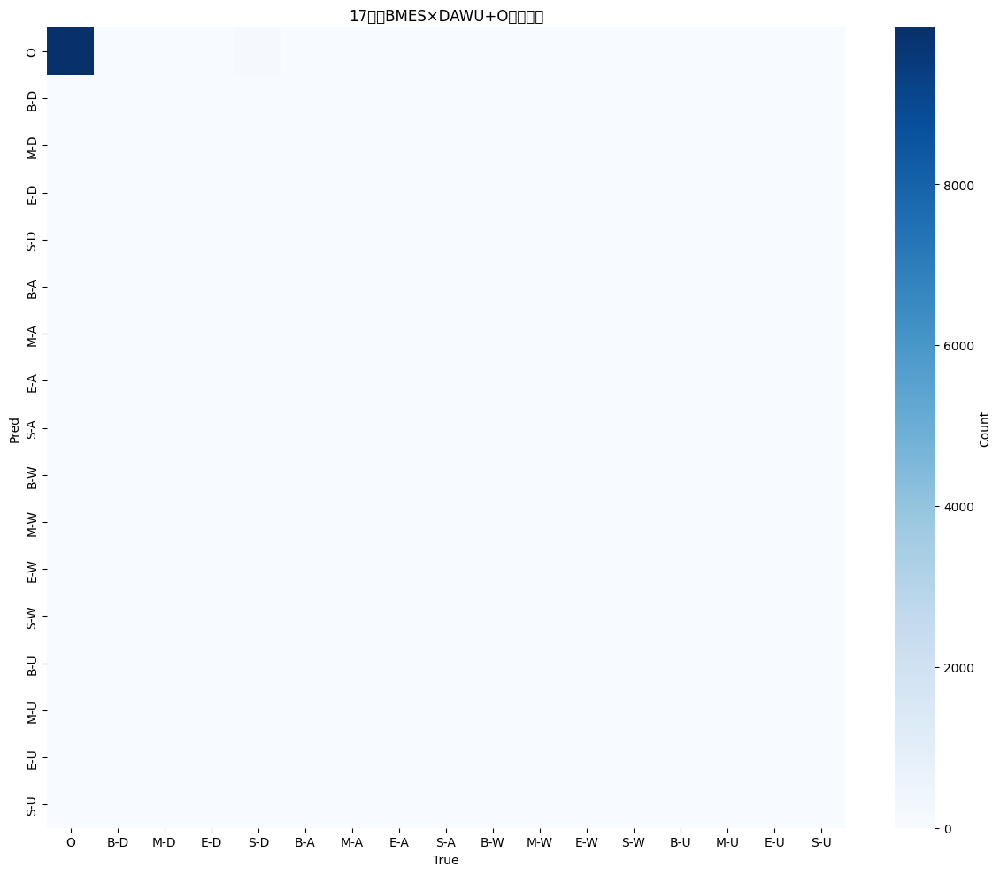

✓ 混淆矩陣已儲存: /content/drive/MyDrive/few-shot/DER_two_stage_489/cm_17_test.png

5類（DAWU+O）測試集 分類報告
              precision    recall  f1-score   support

           O     0.9739    0.9929    0.9833     10014
           D     0.2727    0.0339    0.0603       177
           A     0.0000    0.0000    0.0000        21
           W     0.0435    0.0167    0.0241        60
           U     0.0526    0.0588    0.0556        17

    accuracy                         0.9671     10289
   macro avg     0.2686    0.2205    0.2247     10289
weighted avg     0.9529    0.9671    0.9583     10289



/tmp/ipython-input-791786150.py:941: UserWarning: Glyph 39006 (\N{CJK UNIFIED IDEOGRAPH-985E}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-791786150.py:941: UserWarning: Glyph 65288 (\N{FULLWIDTH LEFT PARENTHESIS}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-791786150.py:941: UserWarning: Glyph 65289 (\N{FULLWIDTH RIGHT PARENTHESIS}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-791786150.py:941: UserWarning: Glyph 28204 (\N{CJK UNIFIED IDEOGRAPH-6E2C}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-791786150.py:941: UserWarning: Glyph 35430 (\N{CJK UNIFIED IDEOGRAPH-8A66}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-791786150.py:941: UserWarning: Glyph 38598 (\N{CJK UNIFIED IDEOGRAPH-96C6}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-791786150.py:943: UserWarning: Glyph 39006 (\N{CJK UNIFIED IDEOGRAPH-985E}) miss

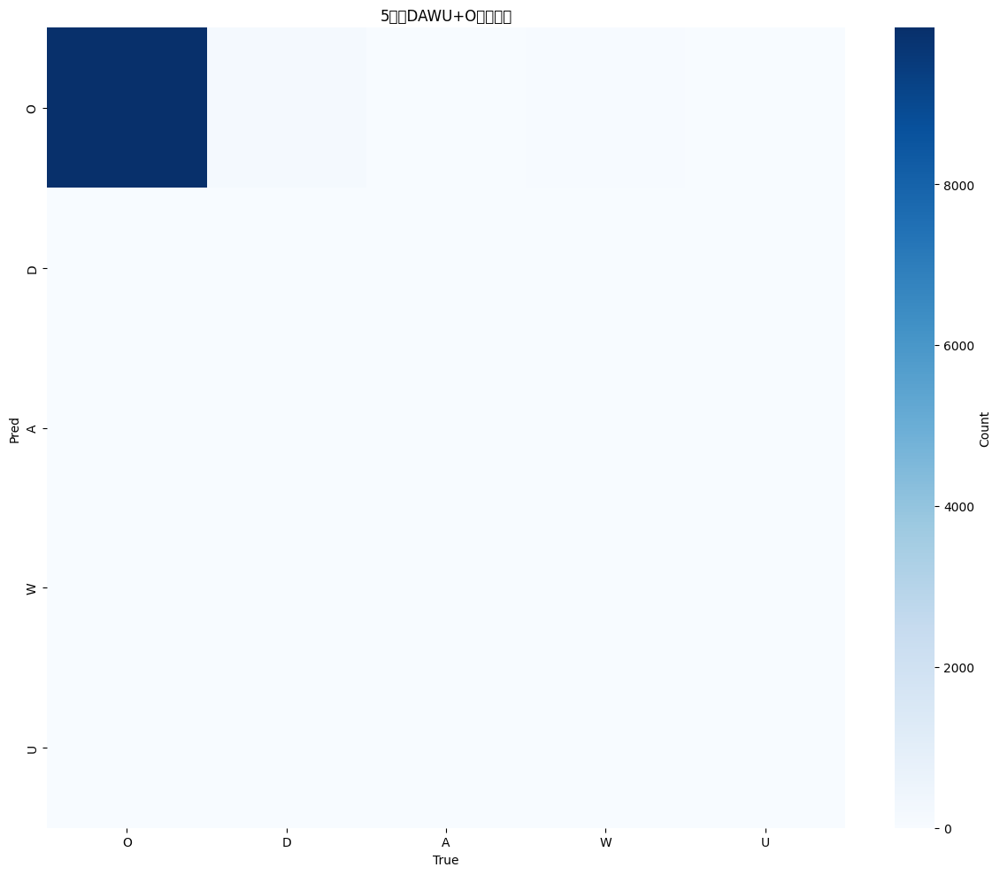

/tmp/ipython-input-791786150.py:941: UserWarning: Glyph 39006 (\N{CJK UNIFIED IDEOGRAPH-985E}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-791786150.py:941: UserWarning: Glyph 65288 (\N{FULLWIDTH LEFT PARENTHESIS}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-791786150.py:941: UserWarning: Glyph 65289 (\N{FULLWIDTH RIGHT PARENTHESIS}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-791786150.py:941: UserWarning: Glyph 28204 (\N{CJK UNIFIED IDEOGRAPH-6E2C}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-791786150.py:941: UserWarning: Glyph 35430 (\N{CJK UNIFIED IDEOGRAPH-8A66}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-791786150.py:941: UserWarning: Glyph 38598 (\N{CJK UNIFIED IDEOGRAPH-96C6}) missing from font(s) DejaVu Sans.
  plt.tight_layout()


✓ 混淆矩陣已儲存: /content/drive/MyDrive/few-shot/DER_two_stage_489/cm_5_test.png

2類（SYM vs O）測試集 分類報告
              precision    recall  f1-score   support

           O     0.9739    0.9929    0.9833     10014
         SYM     0.1125    0.0327    0.0507       275

    accuracy                         0.9672     10289
   macro avg     0.5432    0.5128    0.5170     10289
weighted avg     0.9509    0.9672    0.9584     10289



/tmp/ipython-input-791786150.py:943: UserWarning: Glyph 39006 (\N{CJK UNIFIED IDEOGRAPH-985E}) missing from font(s) DejaVu Sans.
  plt.savefig(path, dpi=300); plt.show()
/tmp/ipython-input-791786150.py:943: UserWarning: Glyph 65288 (\N{FULLWIDTH LEFT PARENTHESIS}) missing from font(s) DejaVu Sans.
  plt.savefig(path, dpi=300); plt.show()
/tmp/ipython-input-791786150.py:943: UserWarning: Glyph 65289 (\N{FULLWIDTH RIGHT PARENTHESIS}) missing from font(s) DejaVu Sans.
  plt.savefig(path, dpi=300); plt.show()
/tmp/ipython-input-791786150.py:943: UserWarning: Glyph 28204 (\N{CJK UNIFIED IDEOGRAPH-6E2C}) missing from font(s) DejaVu Sans.
  plt.savefig(path, dpi=300); plt.show()
/tmp/ipython-input-791786150.py:943: UserWarning: Glyph 35430 (\N{CJK UNIFIED IDEOGRAPH-8A66}) missing from font(s) DejaVu Sans.
  plt.savefig(path, dpi=300); plt.show()
/tmp/ipython-input-791786150.py:943: UserWarning: Glyph 38598 (\N{CJK UNIFIED IDEOGRAPH-96C6}) missing from font(s) DejaVu Sans.
  plt.savefig(path, 

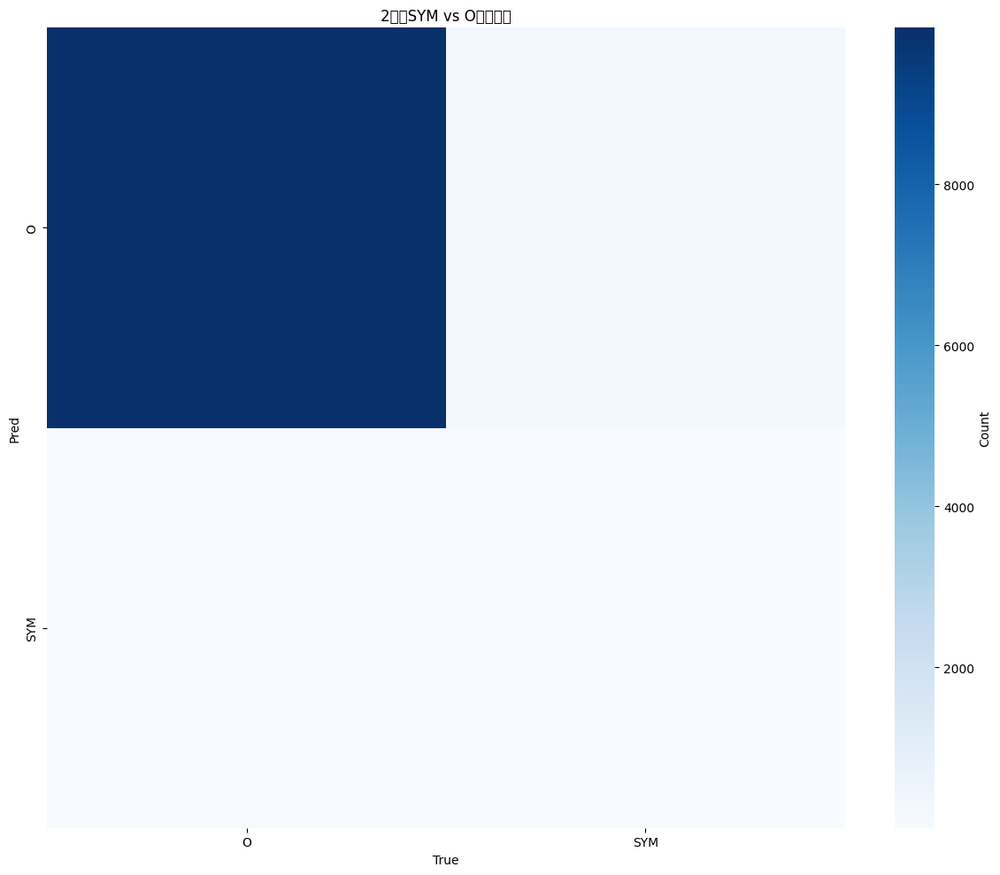

✓ 混淆矩陣已儲存: /content/drive/MyDrive/few-shot/DER_two_stage_489/cm_2_test.png

17類別詳細指標:
標籤          Precision     Recall   F1-Score    Support
------------------------------------------------------------
O              0.9739     0.9929     0.9833      10014
B-D            0.0000     0.0000     0.0000         21
M-D            0.0000     0.0000     0.0000          9
E-D            0.0000     0.0000     0.0000         17
S-D            0.1364     0.0231     0.0395        130
B-A            0.0000     0.0000     0.0000          3
M-A            0.0000     0.0000     0.0000          0
E-A            0.0000     0.0000     0.0000          3
S-A            0.0000     0.0000     0.0000         15
B-W            0.0000     0.0000     0.0000          9
M-W            0.0000     0.0000     0.0000          5
E-W            0.0000     0.0000     0.0000          9
S-W            0.0000     0.0000     0.0000         37
B-U            0.0000     0.0000     0.0000          5
M-U            0.0000     0.

In [ ]:
# ============================================
# 兩階段訓練（Stage1: 5類 AutoModelForTokenClassification →
#         Stage2: 17類 BERT(+BiLSTM)+CRF）
# 強化：anchor_nonO + 類別感知取樣 + 稀有片段copy-paste +
#      動態 O-dropout + 強CRF先驗 + 凍CRF轉移 + Span-F1監控降LR
# 評估：Stage1 (5/2)；Stage2 (17/5/2 + Span-F1)
# ============================================

# ---- 0. 安裝套件（Colab 第一次執行需要）----
!pip -q install transformers==4.44.2 torchcrf==1.1.0 seqeval==1.2.2

# ---- 1. 匯入 ----
import os, csv, random
from collections import Counter, defaultdict
import numpy as np
import pandas as pd
from tqdm.auto import tqdm

import torch
import torch.nn as nn
from torch.utils.data import Dataset, DataLoader, WeightedRandomSampler

from transformers import (
    AutoTokenizer, AutoModelForTokenClassification, BertTokenizerFast, BertModel
)
from torchcrf import CRF

from sklearn.metrics import accuracy_score, f1_score, classification_report, confusion_matrix, precision_recall_fscore_support
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt
import seaborn as sns

# ---- 2. 設定 ----
CONFIG = {
    # 路徑（請改成你的實際路徑）
    "encoder_dir": "/content/drive/MyDrive/few-shot/chinese_mentalbert_finetuned_results_simplified/final_model",
    "data_path":   "/content/drive/MyDrive/few-shot/noO_select_de.csv",
    "save_root":   "/content/drive/MyDrive/few-shot/DER_two_stage_489",

    # 階段選擇：'stage1_5' 或 'stage2_17'
    "stage": "stage2_17",

    # Stage1 儲存/承接
    "stage1_ckpt_dir":  "/content/drive/MyDrive/few-shot/DER_two_stage_489/stage1_ckpt",
    "stage1_encoder_bin": "/content/drive/MyDrive/few-shot/DER_two_stage_489/stage1_encoder.bin",

    # ===== 資料策略 =====
    # 訓練：以非O為錨、延伸到BMES邊界；評估：keep_all 避免偏差
    "window_policy_train": "anchor_nonO",
    "window_policy_eval":  "keep_all",
    "use_sentence_split_train": True,
    "use_sentence_split_eval":  True,
    "split_on_transition_train": True,   # 在 DAWU 類型切換處拆分（訓練強化邊界）
    "split_on_transition_eval":  False,

    # 視窗與長度
    "window_size": 128,
    "window_stride": 96,
    "min_nonO": 3,
    "min_nonO_ratio": 0.08,
    "anchor_ctx_left": 48,
    "anchor_ctx_right": 48,
    "max_len_for_split": 256,
    "max_length": 128,     # Tokenizer 的 max_length

    # 取樣／擴增
    "use_class_aware_sampler": True,   # 類別感知取樣（建議）
    "use_ratio_sampler": False,        # 備用：非O密度連續加權
    "weight_floor": 0.15,
    "weight_gamma": 0.25,
    "use_span_copypaste": True,
    "aug_per_type": 200,               # U/A/W 各增多少樣本（僅訓練集）

    # 動態 O-dropout（只在訓練集 dataset 標籤映射時生效）
    "o_dropout_max": 0.8,     # 第1個epoch
    "o_dropout_min": 0.2,     # 最後epoch

    # 模型結構（Stage2）
    "use_bilstm": True,
    "lstm_hidden": 128,
    "lstm_layers": 1,
    "dropout": 0.4,

    # 解凍策略
    "unfreeze_last_n_layers": 2,
    "lr_encoder": 3e-5,
    "lr_head": 2e-4,

    # 訓練參數
    "batch_size": 8,
    "num_epochs": 120,       # Stage2 長程訓練
    "gradient_clip": 1.0,
    "weight_decay": 5e-3,
    "patience": 15,          # Stage2 早停（依 Span-F1）
    "seed": 42,

    # 資料切分
    "test_ratio": 0.15,
    "val_ratio": 0.25
}

os.makedirs(CONFIG["save_root"], exist_ok=True)
os.makedirs(CONFIG["stage1_ckpt_dir"], exist_ok=True)

random.seed(CONFIG["seed"])
np.random.seed(CONFIG["seed"])
torch.manual_seed(CONFIG["seed"])
DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print("DEVICE:", DEVICE)

# ---- 3. 標籤系統 ----
LABELS_17 = [
    "O",
    "B-D","M-D","E-D","S-D",
    "B-A","M-A","E-A","S-A",
    "B-W","M-W","E-W","S-W",
    "B-U","M-U","E-U","S-U",
]
label2id = {lb:i for i,lb in enumerate(LABELS_17)}
id2label = {i:lb for lb,i in label2id.items()}

LABELS_5 = ["O","D","A","W","U"]
lab5_2id = {lb:i for i,lb in enumerate(LABELS_5)}
id2lab5 = {i:lb for lb,i in lab5_2id.items()}

LABELS_2 = ["O","SYM"]
lab2_2id = {lb:i for i,lb in enumerate(LABELS_2)}

VALID_PREFIX = {"B","M","E","S"}
VALID_TYPE   = {"D","A","W","U"}

def normalize_bmes(raw):
    if pd.isna(raw): return "O"
    s = str(raw).strip().upper()
    if s=="O": return "O"
    if "-" in s:
        pfx,typ = s.split("-",1)
        pfx,typ = pfx.strip(), typ.strip()
        if pfx in VALID_PREFIX and typ in VALID_TYPE:
            return f"{pfx}-{typ}"
        return "O"
    if s in VALID_TYPE:
        return f"S-{s}"
    return "O"

def bmes_to_5(tag):
    if tag=="O": return "O"
    _, typ = tag.split("-",1)
    return typ if typ in {"D","A","W","U"} else "O"

def bmes_to_2(tag):
    return "O" if tag=="O" else "SYM"

def ids17_to_ids5(ids17):
    return [lab5_2id[bmes_to_5(id2label[i])] for i in ids17]

# ---- 4. 載入資料 ----
def load_data(fp):
    df = pd.read_csv(fp, encoding="utf-8", quoting=csv.QUOTE_ALL, on_bad_lines="warn")
    df = df[df.columns[:9].tolist()]   # 保留前9欄（與你現有流程一致）
    df["bmes"] = df["human_label"].apply(normalize_bmes)
    return df

df = load_data(CONFIG["data_path"])
print(f"原始資料列數: {len(df)}")

def group_by_post(df):
    data=[]
    for pid,g in df.groupby("post_id"):
        if "word_order" in g.columns:
            g = g.sort_values("word_order")
        words  = g["word"].astype(str).tolist()
        labels = g["bmes"].astype(str).tolist()
        if len(words)==0 or len(words)!=len(labels):
            continue
        data.append({"post_id": str(pid), "words": words, "labels": [label2id.get(t,0) for t in labels]})
    return data

all_data = group_by_post(df)
print(f"貼文數量: {len(all_data)}")

# 切分資料（以 post 為單位）
train_val, test_data = train_test_split(all_data, test_size=CONFIG["test_ratio"], random_state=CONFIG["seed"], shuffle=True)
train_data, val_data = train_test_split(train_val, test_size=CONFIG["val_ratio"], random_state=CONFIG["seed"], shuffle=True)

# ---- 5. 視窗策略 ----
def id_is_O(tid): return id2label[tid] == "O"

def id_type(tid):
    lb = id2label[tid]
    if lb == "O": return "O", None
    pfx, typ = lb.split("-", 1)
    return pfx, typ

def extend_to_bmes_boundary(labels, start_idx, end_idx):
    # 左延
    i = start_idx
    pfx, typ = id_type(labels[i])
    if pfx in {"M","E"} and typ is not None:
        j = i
        while j >= 0:
            p,t = id_type(labels[j])
            if p == "B" and t == typ:
                i = j; break
            j -= 1
        start_idx = max(0, i)
    # 右延
    k = end_idx
    pfx, typ = id_type(labels[k])
    if pfx in {"B","M"} and typ is not None:
        j = k
        while j < len(labels):
            p,t = id_type(labels[j])
            if p == "E" and t == typ:
                k = j; break
            j += 1
        end_idx = min(len(labels)-1, k)
    return start_idx, end_idx

def windowize_keep_all(words, labels, win=128, stride=96):
    L = len(words)
    if L <= win:
        return [(words, labels)]
    out=[]; i=0
    while i < L:
        j = min(i+win, L)
        out.append((words[i:j], labels[i:j]))
        if j == L: break
        i += stride
    return out

def windowize_filter_nonO(words, labels, win=128, stride=96, min_nonO=1, min_ratio=0.0):
    out = []
    for w, y in windowize_keep_all(words, labels, win, stride):
        nonO = sum(1 for t in y if not id_is_O(t))
        if nonO >= min_nonO or (nonO/len(y)) >= min_ratio:
            out.append((w, y))
    return out if out else [(words[:win], labels[:win])]

def sentence_split(words, labels):
    sents=[]; start=0; punct=set("。！？!?…;；")
    for i,w in enumerate(words):
        if any(ch in punct for ch in w):
            sents.append((words[start:i+1], labels[start:i+1])); start=i+1
    if start < len(words):
        sents.append((words[start:], labels[start:]))
    return sents if sents else [(words, labels)]

def windowize_anchor_by_nonO(words, labels, win=128, ctx_left=48, ctx_right=48):
    L = len(words)
    nonO_idx = [i for i,t in enumerate(labels) if not id_is_O(t)]
    if not nonO_idx:
        j = min(win, L)
        return [(words[:j], labels[:j])]
    segs=[]
    for i in nonO_idx:
        s = max(0, i-ctx_left)
        e = min(L-1, i+ctx_right)
        s, e = extend_to_bmes_boundary(labels, s, e)
        segs.append([s, e])
    segs.sort()
    merged=[]
    for s,e in segs:
        if not merged or s > merged[-1][1] + 5:
            merged.append([s,e])
        else:
            merged[-1][1] = max(merged[-1][1], e)
    out = [(words[s:e+1], labels[s:e+1]) for s,e in merged]
    return out

def split_on_type_transition(words, labels, max_len=256):
    out=[]; start=0
    def typ_of(idx):
        p,t = id_type(labels[idx]); return t
    for i in range(1, len(labels)):
        t_prev = typ_of(i-1); t_now  = typ_of(i)
        p_prev,_ = id_type(labels[i-1])
        if (p_prev in {"S","E"}) and (t_prev != t_now):
            out.append((words[start:i], labels[start:i])); start=i
    if start < len(labels): out.append((words[start:], labels[start:]))
    final=[]
    for w, y in out:
        if len(y) > max_len:
            final.extend(windowize_keep_all(w, y, win=max_len, stride=max_len//2))
        else:
            final.append((w, y))
    return final

def build_dataset_with_policy(raw_posts, policy="keep_all",
                              win=128, stride=96,
                              min_nonO=1, min_ratio=0.0,
                              ctx_left=48, ctx_right=48,
                              use_sentence_split=False,
                              split_on_transition=False,
                              max_len_for_split=256):
    data=[]
    for d in raw_posts:
        words, y = d["words"], d["labels"]
        chunks = [(words, y)]
        if use_sentence_split:
            chunks = sentence_split(words, y)
        subouts=[]
        for w, lab in chunks:
            if policy == "keep_all":
                Ws = windowize_keep_all(w, lab, win, stride)
            elif policy == "filter_nonO":
                Ws = windowize_filter_nonO(w, lab, win, stride, min_nonO, min_ratio)
            elif policy == "anchor_nonO":
                Ws = windowize_anchor_by_nonO(w, lab, win, ctx_left, ctx_right)
            else:
                raise ValueError(f"Unknown policy: {policy}")
            if split_on_transition:
                tmp=[]
                for ww, ll in Ws:
                    tmp.extend(split_on_type_transition(ww, ll, max_len=max_len_for_split))
                Ws = tmp
            subouts.extend(Ws)
        for ww, ll in subouts:
            data.append({"post_id": d["post_id"], "words": ww, "labels": ll})
    return data

# ---- 6. 產生訓練/驗證/測試集 ----
train_data = build_dataset_with_policy(
    train_data,
    policy=CONFIG["window_policy_train"],
    win=CONFIG["window_size"],
    stride=CONFIG["window_stride"],
    min_nonO=CONFIG["min_nonO"],
    min_ratio=CONFIG["min_nonO_ratio"],
    ctx_left=CONFIG["anchor_ctx_left"],
    ctx_right=CONFIG["anchor_ctx_right"],
    use_sentence_split=CONFIG["use_sentence_split_train"],
    split_on_transition=CONFIG["split_on_transition_train"],
    max_len_for_split=CONFIG["max_len_for_split"]
)
val_data = build_dataset_with_policy(
    val_data,
    policy=CONFIG["window_policy_eval"],
    win=CONFIG["window_size"],
    stride=CONFIG["window_stride"],
    use_sentence_split=CONFIG["use_sentence_split_eval"],
    split_on_transition=CONFIG["split_on_transition_eval"],
    max_len_for_split=CONFIG["max_len_for_split"]
)
test_data = build_dataset_with_policy(
    test_data,
    policy=CONFIG["window_policy_eval"],
    win=CONFIG["window_size"],
    stride=CONFIG["window_stride"],
    use_sentence_split=CONFIG["use_sentence_split_eval"],
    split_on_transition=CONFIG["split_on_transition_eval"],
    max_len_for_split=CONFIG["max_len_for_split"]
)

print(f"訓練集={len(train_data)} | 驗證集={len(val_data)} | 測試集={len(test_data)}")

# ---- 7. 資料分析（可選列印）----
def analyze_dataset(data, name="Dataset"):
    print(f"\n{'='*60}\n📊 {name} 分析\n{'='*60}")
    total_tokens = sum(len(d["labels"]) for d in data)
    total_samples = len(data)
    label_counts = Counter()
    for d in data: label_counts.update(d["labels"])
    print(f"樣本數: {total_samples}")
    print(f"總 token 數: {total_tokens}")
    print(f"平均長度: {total_tokens/total_samples:.1f}")
    print(f"\n標籤分布）:")
    for lid, cnt in label_counts.most_common(17):
        ratio = cnt/total_tokens*100
        print(f"  {id2label[lid]:8s}: {cnt:6d} ({ratio:5.2f}%)")
    nonO_ratios = [sum(1 for t in d["labels"] if t!=0)/len(d["labels"]) for d in data]
    print(f"\n非O密度統計:")
    print(f"  平均: {np.mean(nonO_ratios):.3f}")
    print(f"  中位數: {np.median(nonO_ratios):.3f}")
    print(f"  最小: {np.min(nonO_ratios):.3f}")
    print(f"  最大: {np.max(nonO_ratios):.3f}")
    all_O = sum(1 for d in data if all(t==0 for t in d["labels"]))
    print(f"  全O樣本: {all_O}/{total_samples} ({all_O/total_samples*100:.1f}%)")

analyze_dataset(train_data, "訓練集")
analyze_dataset(val_data,   "驗證集")
analyze_dataset(test_data,  "測試集")

# ---- 8. 稀有片段 copy-paste 擴增（僅訓練集）----
def extract_spans(words, labels):
    spans=[]; cur_typ=None; start=None
    for i, lid in enumerate(labels):
        tag = id2label[lid]
        if tag == "O":
            if cur_typ is not None:
                spans.append((cur_typ, start, i-1))
                cur_typ=None; start=None
            continue
        pfx, typ = tag.split("-", 1)
        if pfx == "S":
            spans.append((typ, i, i)); cur_typ=None; start=None
        elif pfx == "B":
            if cur_typ is not None:
                spans.append((cur_typ, start, i-1))
            cur_typ=typ; start=i
        elif pfx == "M":
            if cur_typ is None:
                cur_typ=typ; start=i
        elif pfx == "E":
            if cur_typ is None:
                cur_typ=typ; start=i
            spans.append((typ, start, i)); cur_typ=None; start=None
    if cur_typ is not None:
        spans.append((cur_typ, start, len(labels)-1))
    return spans  # [(typ, s, e), ...]

def copy_paste_rare_spans(train_data, target_types=("U","A","W"), aug_per_type=200, max_try=10000):
    rare_bank = {t: [] for t in target_types}
    for d in train_data:
        spans = extract_spans(d["words"], d["labels"])
        for typ,s,e in spans:
            if typ in target_types:
                rare_bank[typ].append((d["words"][s:e+1], d["labels"][s:e+1]))
    neutral = [d for d in train_data if sum(1 for t in d["labels"] if t!=label2id["O"]) <= 1]
    new_samples=[]; tries=0
    for typ in target_types:
        for _ in range(aug_per_type):
            tries += 1
            if tries > max_try or len(rare_bank[typ])==0 or len(neutral)==0: break
            span_words, span_labels = random.choice(rare_bank[typ])
            host = random.choice(neutral)
            if len(host["words"]) + len(span_words) > 256:  # 控制長度
                continue
            pos = random.randint(0, len(host["words"]))
            new_w = host["words"][:pos] + span_words + host["words"][pos:]
            new_y = host["labels"][:pos] + span_labels + host["labels"][pos:]
            new_samples.append({"post_id": host["post_id"]+"_aug", "words": new_w, "labels": new_y})
    train_data.extend(new_samples)
    print(f"[AUG] 產生新樣本: {len(new_samples)}")

if CONFIG["use_span_copypaste"]:
    copy_paste_rare_spans(train_data, target_types=("U","A","W"), aug_per_type=CONFIG["aug_per_type"])

# ---- 9. Tokenizer ----
tokenizer = AutoTokenizer.from_pretrained(CONFIG["encoder_dir"])
bert_tokenizer = BertTokenizerFast.from_pretrained(CONFIG["encoder_dir"])

# ---- 10. Dataset/Loader（支援 5/17 類 + 動態 O-dropout）----
class TokenClsDataset(Dataset):
    def __init__(self, data, tokenizer, max_length=128, label_space="17", o_dropout_prob=0.0, training=False):
        self.data = data
        self.tok = tokenizer
        self.max_length = max_length
        assert label_space in {"17","5"}
        self.label_space = label_space
        self.training = training
        self.o_dropout_prob = o_dropout_prob  # 動態調整

    def set_o_dropout(self, p):
        self.o_dropout_prob = float(np.clip(p, 0.0, 1.0))

    def __len__(self): return len(self.data)

    def __getitem__(self, idx):
        item = self.data[idx]
        enc = self.tok(
            item["words"],
            is_split_into_words=True,
            truncation=True,
            padding="max_length",
            max_length=self.max_length,
            return_offsets_mapping=False,
            return_tensors="pt"
        )
        word_ids = enc.word_ids()
        lab17 = item["labels"]
        lab5  = ids17_to_ids5(lab17) if self.label_space=="5" else None

        labels_ids=[]; prev=None
        for w_idx in word_ids:
            if w_idx is None:
                labels_ids.append(-100)
            elif w_idx != prev:
                if w_idx < len(lab17):
                    y = lab5[w_idx] if self.label_space=="5" else lab17[w_idx]
                    # 動態 O-dropout（訓練時才作用）
                    if self.training and y == 0 and random.random() < self.o_dropout_prob:
                        labels_ids.append(-100)
                    else:
                        labels_ids.append(y)
                else:
                    labels_ids.append(-100)
            else:
                labels_ids.append(-100)
            prev = w_idx
        enc = {k:v.squeeze(0) for k,v in enc.items()}
        enc["labels"] = torch.tensor(labels_ids, dtype=torch.long)
        return enc

O_ID = label2id["O"]

def sample_type_flags(seq_labels_17):
    types=set()
    for lid in seq_labels_17:
        if lid == O_ID: continue
        pfx, typ = id2label[lid].split("-", 1)
        types.add(typ)
    return types

def build_class_aware_weights(train_data, wD=1.0, wA=3.0, wW=2.0, wU=4.0, base=0.1):
    weights=[]
    for d in train_data:
        types = sample_type_flags(d["labels"])
        w = base
        if "D" in types: w += wD
        if "A" in types: w += wA
        if "W" in types: w += wW
        if "U" in types: w += wU
        weights.append(w)
    s = sum(weights)
    return [w/s for w in weights]

def seq_weights_by_nonO_ratio(raw_data, floor=0.15, gamma=0.25):
    w=[]
    for d in raw_data:
        r = sum(1 for t in d["labels"] if t!=O_ID) / max(1, len(d["labels"]))
        w.append(floor + (r**gamma))
    s = sum(w)
    return [x/s for x in w]

def make_loaders(label_space, o_dropout=0.0, training=False):
    ds_train = TokenClsDataset(train_data, tokenizer, CONFIG["max_length"], label_space=label_space, o_dropout_prob=o_dropout, training=training)
    ds_val   = TokenClsDataset(val_data,   tokenizer, CONFIG["max_length"], label_space=label_space, training=False)
    ds_test  = TokenClsDataset(test_data,  tokenizer, CONFIG["max_length"], label_space=label_space, training=False)

    if training:
        if CONFIG["use_class_aware_sampler"]:
            weights = build_class_aware_weights(train_data, wD=1.0, wA=3.0, wW=2.0, wU=4.0, base=0.1)
            sampler = WeightedRandomSampler(weights=weights, num_samples=len(weights), replacement=True)
            ld_train = DataLoader(ds_train, batch_size=CONFIG["batch_size"], sampler=sampler)
        elif CONFIG["use_ratio_sampler"]:
            weights = seq_weights_by_nonO_ratio(train_data, CONFIG["weight_floor"], CONFIG["weight_gamma"])
            sampler = WeightedRandomSampler(weights=weights, num_samples=len(weights), replacement=True)
            ld_train = DataLoader(ds_train, batch_size=CONFIG["batch_size"], sampler=sampler)
        else:
            ld_train = DataLoader(ds_train, batch_size=CONFIG["batch_size"], shuffle=True)
    else:
        ld_train = DataLoader(ds_train, batch_size=CONFIG["batch_size"], shuffle=False)

    ld_val  = DataLoader(ds_val,  batch_size=CONFIG["batch_size"], shuffle=False)
    ld_test = DataLoader(ds_test, batch_size=CONFIG["batch_size"], shuffle=False)
    return ds_train, ds_val, ds_test, ld_train, ld_val, ld_test

# ---- 11. 解凍工具 ----
def unfreeze_last_n_layers_of_bert(model_or_encoder, n=0):
    for p in model_or_encoder.parameters(): p.requires_grad = False
    if n <= 0:
        model_or_encoder.eval(); return
    try:
        L = model_or_encoder.config.num_hidden_layers
    except:
        L = 12
    target_idxs = list(range(max(0, L-n), L))
    layer_keywords = [f"encoder.layer.{i}." for i in target_idxs] + ["pooler."]
    for name, p in model_or_encoder.named_parameters():
        if any(kw in name for kw in layer_keywords):
            p.requires_grad = True
    model_or_encoder.train()

# ---- 12. Stage1：5 類 ----
def train_stage1():
    # 初始 O-dropout（Stage1 也可加，但預設較保守）
    o_drop = 0.3
    ds_tr, ds_va, ds_te, ld_tr, ld_va, ld_te = make_loaders(label_space="5", o_dropout=o_drop, training=True)

    model = AutoModelForTokenClassification.from_pretrained(CONFIG["encoder_dir"], num_labels=len(LABELS_5)).to(DEVICE)
    unfreeze_last_n_layers_of_bert(model.base_model, CONFIG["unfreeze_last_n_layers"])

    enc_params = [p for n,p in model.named_parameters() if n.startswith(model.base_model_prefix) and p.requires_grad]
    head_params= [p for n,p in model.named_parameters() if (not n.startswith(model.base_model_prefix)) and p.requires_grad]
    optimizer = torch.optim.AdamW([{"params": enc_params, "lr": CONFIG["lr_encoder"]},
                                   {"params": head_params, "lr": CONFIG["lr_head"]}], weight_decay=CONFIG["weight_decay"])
    scheduler = torch.optim.lr_scheduler.StepLR(optimizer, step_size=40, gamma=0.5)

    best_val_loss = float("inf"); patience_counter=0
    history=[]
    for epoch in range(1, 60+1):  # Stage1 不需要太長
        # 動態O-dropout（簡單：固定或緩降）
        cur_drop = max(0.1, o_drop * (1 - (epoch-1)/60))
        ds_tr.set_o_dropout(cur_drop)

        model.train()
        tr_loss=0.0; nb=0
        for batch in tqdm(ld_tr, desc=f"[Stage1] Epoch {epoch}/60"):
            ids = batch["input_ids"].to(DEVICE)
            msk = batch["attention_mask"].to(DEVICE)
            y   = batch["labels"].to(DEVICE)
            out = model(input_ids=ids, attention_mask=msk, labels=y)
            loss = out.loss
            optimizer.zero_grad()
            loss.backward()
            nn.utils.clip_grad_norm_(model.parameters(), CONFIG["gradient_clip"])
            optimizer.step()
            tr_loss += loss.item(); nb+=1
        scheduler.step()
        avg_tr = tr_loss/max(1,nb)

        # 驗證
        model.eval()
        with torch.no_grad():
            val_loss=0.0; nb2=0; all_y=[]; all_p=[]
            for batch in ld_va:
                ids = batch["input_ids"].to(DEVICE)
                msk = batch["attention_mask"].to(DEVICE)
                y   = batch["labels"].to(DEVICE)
                out = model(input_ids=ids, attention_mask=msk, labels=y)
                val_loss += out.loss.item(); nb2+=1
                preds = out.logits.argmax(-1)
                mask  = y.ne(-100)
                all_y.extend(y[mask].cpu().tolist())
                all_p.extend(preds[mask].cpu().tolist())
        val_loss /= max(1,nb2)
        acc5 = accuracy_score(all_y, all_p)
        f1_5 = f1_score(all_y, all_p, average="macro", zero_division=0)
        y2 = [0 if t==0 else 1 for t in all_y]
        p2 = [0 if t==0 else 1 for t in all_p]
        f1_2 = f1_score(y2, p2, average="macro", zero_division=0)
        history.append({"epoch":epoch,"train_loss":avg_tr,"val_loss":val_loss,"val_acc_5":acc5,"val_f1_5":f1_5,"val_f1_2":f1_2})
        print(f"Epoch {epoch}: TrainLoss={avg_tr:.4f} | ValLoss={val_loss:.4f} | Acc(5)={acc5:.4f} | F1(5)={f1_5:.4f} | F1(2)={f1_2:.4f}")

        if val_loss < best_val_loss:
            best_val_loss = val_loss; patience_counter=0
            model.save_pretrained(CONFIG["stage1_ckpt_dir"]); tokenizer.save_pretrained(CONFIG["stage1_ckpt_dir"])
            base = getattr(model, "base_model", getattr(model, "bert", None))
            if base is not None:
                torch.save(base.state_dict(), CONFIG["stage1_encoder_bin"])
            print("  ✅ 已存 Stage1 最佳模型/encoder")
        else:
            patience_counter += 1
            print(f"  ⏳ 未改善: {patience_counter}/10")
            if patience_counter >= 10:
                print(f"\n⛔ Stage1 早停於 Epoch {epoch}")
                break

    # 測試
    print("\n" + "="*60); print("📊 Stage1 測試（5 類）"); print("="*60)
    st1 = AutoModelForTokenClassification.from_pretrained(CONFIG["stage1_ckpt_dir"]).to(DEVICE)
    st1.eval()
    with torch.no_grad():
        all_y=[]; all_p=[]; test_loss=0.0; nb=0
        for batch in tqdm(make_loaders("5", training=False)[5], desc="[Stage1] Test"):
            ids = batch["input_ids"].to(DEVICE)
            msk = batch["attention_mask"].to(DEVICE)
            y   = batch["labels"].to(DEVICE)
            out = st1(input_ids=ids, attention_mask=msk, labels=y)
            test_loss += out.loss.item(); nb+=1
            preds = out.logits.argmax(-1)
            mask  = y.ne(-100)
            all_y.extend(y[mask].cpu().tolist())
            all_p.extend(preds[mask].cpu().tolist())
    test_loss /= max(1,nb)
    acc5 = accuracy_score(all_y, all_p)
    f1_5 = f1_score(all_y, all_p, average="macro", zero_division=0)
    y2 = [0 if t==0 else 1 for t in all_y]; p2 = [0 if t==0 else 1 for t in all_p]
    f1_2 = f1_score(y2, p2, average="macro", zero_division=0)
    print(f"Loss(5): {test_loss:.4f} | Acc(5): {acc5:.4f} | F1(5): {f1_5:.4f} | F1(2): {f1_2:.4f}")

# ---- 13. Stage2：BERT(+BiLSTM)+CRF（強先驗+凍轉移+SpanF1監控）----
class BERT_BiLSTM_CRF(nn.Module):
    def __init__(self, encoder, num_labels, use_bilstm=True, hidden=128, layers=1, dropout=0.3):
        super().__init__()
        self.encoder = encoder
        self.use_bilstm = use_bilstm
        hd = encoder.config.hidden_size
        if use_bilstm:
            self.lstm = nn.LSTM(input_size=hd, hidden_size=hidden, num_layers=layers,
                                batch_first=True, bidirectional=True,
                                dropout=dropout if layers>1 else 0.0)
            cls_in = hidden*2
        else:
            self.lstm = None
            cls_in = hd
        self.drop = nn.Dropout(dropout)
        self.fc   = nn.Linear(cls_in, num_labels)
        self.crf  = CRF(num_labels, batch_first=True)

        # 強化 BMES+O 轉移初始化（非法大負、合法正值）
        with torch.no_grad():
            self.crf.start_transitions.fill_(-10.0)
            self.crf.end_transitions.fill_(-10.0)
            self.crf.transitions.fill_(-8.0)
            o = label2id["O"]
            # O<->O 允許但不鼓勵太長
            self.crf.transitions[o, o] = +0.0
            for typ in ["D","A","W","U"]:
                b = label2id[f"B-{typ}"]; m = label2id[f"M-{typ}"]
                e = label2id[f"E-{typ}"]; s = label2id[f"S-{typ}"]
                self.crf.start_transitions[b] = +1.5
                self.crf.start_transitions[s] = +1.5
                self.crf.end_transitions[e]   = +1.0
                self.crf.end_transitions[s]   = +1.0
                self.crf.end_transitions[o]   =  0.0
                self.crf.transitions[m, b] = +2.0
                self.crf.transitions[e, b] = +1.5
                self.crf.transitions[m, m] = +1.5
                self.crf.transitions[e, m] = +2.0
                self.crf.transitions[o, e] = +0.5
                self.crf.transitions[o, s] = +0.5
                self.crf.transitions[b, o] = +0.8
                self.crf.transitions[s, o] = +0.8

    def freeze_crf_transitions(self, freeze=True):
        for name, p in self.crf.named_parameters():
            if ("transitions" in name) or ("start_transitions" in name) or ("end_transitions" in name):
                p.requires_grad = not freeze

    def forward(self, input_ids, attention_mask, labels=None, return_emissions=False):
        x = self.encoder(input_ids=input_ids, attention_mask=attention_mask).last_hidden_state
        if self.use_bilstm: x,_ = self.lstm(x)
        x = self.drop(x)
        emissions = self.fc(x)
        mask = attention_mask.bool()
        if labels is not None:
            y = labels.clone(); y[y==-100] = 0
            crf_nll = -self.crf(emissions, y, mask=mask, reduction="mean")
            preds = self.crf.decode(emissions, mask=mask)
            if return_emissions: return crf_nll, preds, emissions
            return crf_nll, preds
        else:
            preds = self.crf.decode(emissions, mask=mask)
            if return_emissions: return preds, emissions
            return preds

def masked_token_ce_loss(logits, labels, ignore_index=-100):
    B, T, C = logits.shape
    logits_ = logits.view(B*T, C)
    labels_ = labels.view(B*T)
    mask = labels_ != ignore_index
    if mask.sum() == 0:
        return torch.tensor(0.0, device=logits.device)
    return nn.CrossEntropyLoss()(logits_[mask], labels_[mask])

def decode_spans_bmes(tag_seq):
    spans=[]; cur_type=None; start=None
    for i, tag in enumerate(tag_seq):
        if tag == "O":
            if cur_type is not None:
                spans.append((cur_type, start, i-1))
                cur_type=None; start=None
            continue
        pfx, typ = tag.split("-", 1)
        if pfx=="S":
            spans.append((typ, i, i)); cur_type=None; start=None
        elif pfx=="B":
            if cur_type is not None: spans.append((cur_type, start, i-1))
            cur_type=typ; start=i
        elif pfx=="M":
            if cur_type is None: cur_type=typ; start=i
        elif pfx=="E":
            if cur_type is None: cur_type=typ; start=i
            spans.append((typ, start, i)); cur_type=None; start=None
    if cur_type is not None:
        spans.append((cur_type, start, len(tag_seq)-1))
    return spans

def span_f1_from_stream(true_ids, pred_ids, seg=200):
    true_tags = [id2label[i] for i in true_ids]
    pred_tags = [id2label[i] for i in pred_ids]
    true_seqs = [true_tags[i:i+seg] for i in range(0, len(true_tags), seg)]
    pred_seqs = [pred_tags[i:i+seg] for i in range(0, len(pred_tags), seg)]
    tp=fp=fn=0
    for y_true, y_pred in zip(true_seqs, pred_seqs):
        T = set(decode_spans_bmes(y_true)); P = set(decode_spans_bmes(y_pred))
        tp += len(T & P); fp += len(P - T); fn += len(T - P)
    p = tp / max(1, tp+fp); r = tp / max(1, tp+fn)
    f1 = 2*p*r / max(1e-12, (p+r))
    return p, r, f1

@torch.no_grad()
def evaluate_stage2(model, loader, desc="Eval"):
    model.eval()
    all_true_17, all_pred_17 = [], []
    total_loss=0.0; nb=0
    for batch in tqdm(loader, desc=desc, leave=False):
        ids = batch["input_ids"].to(DEVICE)
        msk = batch["attention_mask"].to(DEVICE)
        y   = batch["labels"].to(DEVICE)
        loss, preds = model(ids, msk, labels=y)
        total_loss += loss.item(); nb+=1
        for i, pred_seq in enumerate(preds):
            valid = (y[i] != -100).cpu().numpy()
            y_t = y[i].detach().cpu().numpy()[valid].tolist()
            y_p = pred_seq[:len(y_t)]
            all_true_17.extend(y_t); all_pred_17.extend(y_p)

    acc_17  = accuracy_score(all_true_17, all_pred_17)
    f1_17   = f1_score(all_true_17, all_pred_17, average="macro", zero_division=0)
    y_true_5 = ids17_to_ids5(all_true_17); y_pred_5 = ids17_to_ids5(all_pred_17)
    y_true_2 = [0 if t==0 else 1 for t in y_true_5]; y_pred_2 = [0 if t==0 else 1 for t in y_pred_5]
    f1_5  = f1_score(y_true_5, y_pred_5, average="macro", zero_division=0)
    f1_2  = f1_score(y_true_2, y_pred_2, average="macro", zero_division=0)
    p_span, r_span, f1_span = span_f1_from_stream(all_true_17, all_pred_17, seg=200)
    return {
        "loss": total_loss/max(1,nb),
        "acc_17": acc_17,
        "f1_17": f1_17,
        "f1_5":  f1_5,
        "f1_2":  f1_2,
        "span_p": p_span, "span_r": r_span, "span_f1": f1_span,
        "y_true_17": all_true_17, "y_pred_17": all_pred_17
    }

from torch.optim.lr_scheduler import ReduceLROnPlateau

def o_dropout_schedule(epoch, total_epochs, p_max=0.8, p_min=0.2):
    return p_max - (p_max - p_min) * (epoch-1) / max(1, total_epochs-1)

def train_stage2():
    # DataLoader（17 類 + 訓練模式以啟用 O-dropout）
    start_drop = CONFIG["o_dropout_max"]
    ds_tr, ds_va, ds_te, ld_tr, ld_va, ld_te = make_loaders(label_space="17", o_dropout=start_drop, training=True)

    # 建立 encoder（承接 Stage1 encoder 權重）
    encoder = BertModel.from_pretrained(CONFIG["encoder_dir"])
    if os.path.exists(CONFIG["stage1_encoder_bin"]):
        state = torch.load(CONFIG["stage1_encoder_bin"], map_location="cpu")
        missing, unexpected = encoder.load_state_dict(state, strict=False)
        print(f"✓ 載入 Stage1 encoder 權重 | missing={len(missing)} | unexpected={len(unexpected)}")
    else:
        print("⚠️ 找不到 Stage1 encoder 權重，改用原始 encoder")

    unfreeze_last_n_layers_of_bert(encoder, CONFIG["unfreeze_last_n_layers"])

    model = BERT_BiLSTM_CRF(
        encoder=encoder, num_labels=len(LABELS_17),
        use_bilstm=CONFIG["use_bilstm"], hidden=CONFIG["lstm_hidden"],
        layers=CONFIG["lstm_layers"], dropout=CONFIG["dropout"]
    ).to(DEVICE)

    enc_params = [p for n,p in model.named_parameters() if n.startswith("encoder.") and p.requires_grad]
    head_params= [p for n,p in model.named_parameters() if (not n.startswith("encoder.")) and p.requires_grad]
    optimizer = torch.optim.AdamW([{"params": enc_params, "lr": CONFIG["lr_encoder"]},
                                   {"params": head_params, "lr": CONFIG["lr_head"]}],
                                   weight_decay=CONFIG["weight_decay"])

    # 以 Span-F1 為 scheduler 監控
    scheduler = ReduceLROnPlateau(optimizer, mode='max', factor=0.5, patience=3)

    best_span=0.0; patience_counter=0
    history=[]; lambda_ce=0.2

    for epoch in range(1, CONFIG["num_epochs"]+1):
        # 動態 O-dropout：高→低
        cur_drop = o_dropout_schedule(epoch, CONFIG["num_epochs"], CONFIG["o_dropout_max"], CONFIG["o_dropout_min"])
        ds_tr.set_o_dropout(cur_drop)

        # 前 5 個 epoch 凍 CRF 轉移
        model.freeze_crf_transitions(freeze=(epoch <= 5))

        model.train()
        tr_loss=0.0; nb=0
        pbar = tqdm(ld_tr, desc=f"[Stage2] Epoch {epoch}/{CONFIG['num_epochs']}")
        for batch in pbar:
            ids = batch["input_ids"].to(DEVICE)
            msk = batch["attention_mask"].to(DEVICE)
            y   = batch["labels"].to(DEVICE)

            crf_nll, _, emissions = model(ids, msk, labels=y, return_emissions=True)
            ce = masked_token_ce_loss(emissions, y)
            loss = crf_nll + lambda_ce * ce

            optimizer.zero_grad()
            loss.backward()
            nn.utils.clip_grad_norm_(model.parameters(), CONFIG["gradient_clip"])
            optimizer.step()

            tr_loss += loss.item(); nb+=1
            pbar.set_postfix(loss=f"{loss.item():.4f}", Odrop=f"{cur_drop:.2f}")
        avg_tr = tr_loss/max(1,nb)

        # 驗證
        val_res = evaluate_stage2(model, ld_va, desc="驗證")
        span = val_res["span_f1"]
        history.append({"epoch":epoch, "train_loss":avg_tr, "val_loss":val_res["loss"],
                        "val_acc_17":val_res["acc_17"], "val_f1_17":val_res["f1_17"],
                        "val_f1_5":val_res["f1_5"], "val_f1_2":val_res["f1_2"],
                        "val_span_f1":span})
        print(f"Epoch {epoch}: TrainLoss={avg_tr:.4f} | ValLoss={val_res['loss']:.4f} | "
              f"F1(17)={val_res['f1_17']:.4f} | F1(5)={val_res['f1_5']:.4f} | "
              f"F1(2)={val_res['f1_2']:.4f} | Span-F1={span:.4f}")

#####       # 紀錄 step 前的 LR（多參數組都列）
        prev_lrs = [pg['lr'] for pg in optimizer.param_groups]

        scheduler.step(span)

        # 檢查是否有降 LR，若有就列印
        new_lrs = [pg['lr'] for pg in optimizer.param_groups]
        if any(n < p for p, n in zip(prev_lrs, new_lrs)):
            print("  ↓ LR reduced:",
                  " | ".join([f"group{i}:{p:.2e}→{n:.2e}" for i, (p, n) in enumerate(zip(prev_lrs, new_lrs))]))

#####
        # 早停（看 Span-F1）
        if span > best_span:
            best_span = span; patience_counter=0
            ckpt_path = os.path.join(CONFIG["save_root"], "stage2_best_DER_17_bySpanF1.pt")
            torch.save({"model_state_dict": model.state_dict(), "best_span_f1": best_span}, ckpt_path)
            print("  ✅ 以 Span-F1 保存最佳模型 →", ckpt_path)
        else:
            patience_counter += 1
            print(f"  ⏳ 未改善: {patience_counter}/{CONFIG['patience']}")
            if patience_counter >= CONFIG["patience"]:
                print(f"\n⛔ Stage2 早停於 Epoch {epoch}（依 Span-F1）")
                break

    # 測試
    print("\n" + "="*60); print("📊 Stage2 測試（17 類）"); print("="*60)
    ckpt_span = os.path.join(CONFIG["save_root"], "stage2_best_DER_17_bySpanF1.pt")
    if os.path.exists(ckpt_span):
        ckpt = torch.load(ckpt_span, map_location=DEVICE)
        model.load_state_dict(ckpt["model_state_dict"])
        print(f"最佳 Span-F1 = {ckpt['best_span_f1']:.4f}")
    ds_tr, ds_va, ds_te, ld_tr, ld_va, ld_te = make_loaders(label_space="17", training=False)
    test_res = evaluate_stage2(model, ld_te, desc="測試")
    print(f"\nLoss     : {test_res['loss']:.4f}")
    print(f"Acc(17)  : {test_res['acc_17']:.4f}")
    print(f"F1(17)   : {test_res['f1_17']:.4f}")
    print(f"F1(5)    : {test_res['f1_5']:.4f}")
    print(f"F1(2)    : {test_res['f1_2']:.4f}")
    print(f"Span-F1  : {test_res['span_f1']:.4f}")

    # 報告與混淆矩陣
    y_true_17 = test_res["y_true_17"]; y_pred_17 = test_res["y_pred_17"]

    def print_report_and_cm(y_true, y_pred, names, title, fname):
        print(f"\n{'='*60}\n{title} 分類報告\n{'='*60}")
        print(classification_report(
            y_true, y_pred, labels=list(range(len(names))), target_names=names, digits=4, zero_division=0
        ))
        cm = confusion_matrix(y_true, y_pred, labels=list(range(len(names))))
        plt.figure(figsize=(12,10))
        sns.heatmap(cm.T, annot=False, fmt='d', cmap='Blues',
                    xticklabels=names, yticklabels=names, cbar_kws={'label':'Count'})
        plt.xlabel("True"); plt.ylabel("Pred"); plt.title(title)
        plt.tight_layout()
        path = os.path.join(CONFIG["save_root"], fname)
        plt.savefig(path, dpi=300); plt.show()
        print("✓ 混淆矩陣已儲存:", path)

    print_report_and_cm(y_true_17, y_pred_17, LABELS_17, "17類（BMES×DAWU+O）測試集", "cm_17_test.png")
    y_true_5 = ids17_to_ids5(y_true_17); y_pred_5 = ids17_to_ids5(y_pred_17)
    print_report_and_cm(y_true_5, y_pred_5, LABELS_5, "5類（DAWU+O）測試集", "cm_5_test.png")
    y_true_2 = [0 if t==0 else 1 for t in y_true_5]; y_pred_2 = [0 if t==0 else 1 for t in y_pred_5]
    print_report_and_cm(y_true_2, y_pred_2, LABELS_2, "2類（SYM vs O）測試集", "cm_2_test.png")

    # 17 類別詳表
    prec_17, rec_17, f1_17_per_class, _ = precision_recall_fscore_support(
        y_true_17, y_pred_17, labels=list(range(len(LABELS_17))), zero_division=0
    )
    print("\n17類別詳細指標:")
    print(f"{'標籤':<10} {'Precision':>10} {'Recall':>10} {'F1-Score':>10} {'Support':>10}")
    print("-"*60)
    label_support = Counter(y_true_17)
    for i, label in enumerate(LABELS_17):
        support = label_support[i]
        print(f"{label:<10} {prec_17[i]:>10.4f} {rec_17[i]:>10.4f} {f1_17_per_class[i]:>10.4f} {support:>10d}")

# ---- 14. 執行入口 ----
if CONFIG["stage"] == "stage1_5":
    train_stage1()
elif CONFIG["stage"] == "stage2_17":
    train_stage2()
else:
    raise ValueError("CONFIG['stage'] 需為 'stage1_5' 或 'stage2_17'")


### 1127 拿掉O

In [ ]:
# ============================================
# 三階段漸進式訓練：
# Stage1(2類 O/SYM) → Stage2(4類 DAWU) → Stage3(16類 BMES)
# 目標：逐步把 O 類影響降到最低，專注在情緒型態與邊界
# ============================================

# ---- 0. 安裝套件（Colab 第一次執行需要）----
!pip -q install transformers==4.44.2 torchcrf==1.1.0 seqeval==1.2.2

# ---- 1. 匯入 ----
import os, csv, random, json
from collections import Counter, defaultdict
import numpy as np
import pandas as pd
from tqdm.auto import tqdm

import torch
import torch.nn as nn
from torch.utils.data import Dataset, DataLoader, WeightedRandomSampler

from transformers import AutoTokenizer, AutoModelForTokenClassification, BertTokenizerFast, BertModel
from torchcrf import CRF

from sklearn.metrics import (
    accuracy_score, f1_score, classification_report, confusion_matrix,
    precision_recall_fscore_support
)
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt
import seaborn as sns

# ---- 2. 設定 ----
CONFIG = {
    # 路徑設定
    "encoder_dir": "/content/drive/MyDrive/few-shot/chinese_mentalbert_finetuned_results_simplified_1204/final_model",
    "data_path": "/content/drive/MyDrive/few-shot/select_de_synold_filtered.csv",
    "save_root": "/content/drive/MyDrive/few-shot/DER_three_stage_1204",

    # 控制要跑哪一階段：stage1_binary, stage2_type, stage3_bmes
    "stage": "stage1_binary",

    # 各階段模型儲存路徑
    "stage1_dir": "/content/drive/MyDrive/few-shot/DER_three_stage_1204/stage1_binary",
    "stage2_dir": "/content/drive/MyDrive/few-shot/DER_three_stage_1204/stage2_type",
    "stage3_dir": "/content/drive/MyDrive/few-shot/DER_three_stage_1204/stage3_bmes",

    # ===== 資料策略（各階段可獨立設定）=====
    # Stage1: 二元檢測（保留所有資料，學習 O vs 非O 邊界）
    "stage1_window_policy_train": "keep_all",
    "stage1_window_policy_eval": "keep_all",
    "stage1_use_sentence_split": True,
    "stage1_split_on_transition": False,

    # Stage2: 類型分類（過濾全O視窗，專注於情緒類型）
    "stage2_window_policy_train": "filter_nonO",
    "stage2_window_policy_eval": "keep_all",
    "stage2_use_sentence_split": True,
    "stage2_split_on_transition": True,  # 在類型切換處拆分
    "stage2_min_nonO": 3,
    "stage2_min_nonO_ratio": 0.1,

    # Stage3: BMES 標註（以非O為錨點，學習細粒度邊界）
    "stage3_window_policy_train": "anchor_nonO",
    "stage3_window_policy_eval": "keep_all",
    "stage3_use_sentence_split": True,
    "stage3_split_on_transition": True,
    "stage3_anchor_ctx_left": 48,
    "stage3_anchor_ctx_right": 48,

    # 視窗參數
    "window_size": 128,
    "window_stride": 96,
    "max_len_for_split": 256,
    "max_length": 128,

    # 過採樣（各階段獨立控制）
    "stage1_use_oversampling": True,
    "stage1_weight_floor": 0.10,
    "stage1_weight_gamma": 0.30,

    "stage2_use_oversampling": True,
    "stage2_weight_floor": 0.15,
    "stage2_weight_gamma": 0.25,

    "stage3_use_oversampling": True,
    "stage3_weight_floor": 0.20,
    "stage3_weight_gamma": 0.20,

    # 模型結構（Stage3 用 BERT + BiLSTM + CRF）
    "use_bilstm": True,
    "lstm_hidden": 128,
    "lstm_layers": 1,
    "dropout": 0.4,

    # 解凍與學習率
    "unfreeze_last_n_layers": 2,
    "lr_encoder": 3e-5,
    "lr_head": 2e-4,

    # 訓練參數
    "batch_size": 8,
    "stage1_epochs": 30,
    "stage2_epochs": 50,
    "stage3_epochs": 80,
    "gradient_clip": 1.0,
    "weight_decay": 5e-3,
    "patience": 10,
    "seed": 42,

    # 資料切分
    "test_ratio": 0.15,
    "val_ratio": 0.25
}

os.makedirs(CONFIG["save_root"], exist_ok=True)
for d in [CONFIG["stage1_dir"], CONFIG["stage2_dir"], CONFIG["stage3_dir"]]:
    os.makedirs(d, exist_ok=True)

random.seed(CONFIG["seed"])
np.random.seed(CONFIG["seed"])
torch.manual_seed(CONFIG["seed"])
DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print("DEVICE:", DEVICE)

# ---- 3. 標籤系統 ----
# 17類原始標籤（用於資料載入）
LABELS_17 = [
    "O",
    "B-D","M-D","E-D","S-D",
    "B-W","M-W","E-W","S-W",
    "B-A","M-A","E-A","S-A",
    "B-U","M-U","E-U","S-U",
]
label2id_17 = {lb:i for i,lb in enumerate(LABELS_17)}
id2label_17 = {i:lb for lb,i in label2id_17.items()}

# Stage1: 2類（O vs SYM）
LABELS_2 = ["O", "SYM"]
label2id_2 = {lb:i for i,lb in enumerate(LABELS_2)}
id2label_2 = {i:lb for lb,i in label2id_2.items()}

# Stage2: 4類（DAWU，移除O）
LABELS_4 = ["D", "W", "A", "U"]
label2id_4 = {lb:i for i,lb in enumerate(LABELS_4)}
id2label_4 = {i:lb for lb,i in label2id_4.items()}

# Stage3: 16類（BMES×DAWU，移除O）
LABELS_16 = []
for typ in ["D", "W", "A", "U"]:
    for pfx in ["B", "M", "E", "S"]:
        LABELS_16.append(f"{pfx}-{typ}")
label2id_16 = {lb:i for i,lb in enumerate(LABELS_16)}
id2label_16 = {i:lb for lb,i in label2id_16.items()}

VALID_PREFIX = {"B","M","E","S"}
VALID_TYPE = {"D","W","A","U"}

def normalize_bmes(raw):
    if pd.isna(raw): return "O"
    s = str(raw).strip().upper()
    if s=="O": return "O"
    if "-" in s:
        pfx,typ = s.split("-",1)
        pfx,typ = pfx.strip(), typ.strip()
        if pfx in VALID_PREFIX and typ in VALID_TYPE:
            return f"{pfx}-{typ}"
        return "O"
    if s in VALID_TYPE:
        return f"S-{s}"
    return "O"

# 轉換函數
def label17_to_label2(tag):
    """17類 → 2類（O/SYM）"""
    return "O" if tag == "O" else "SYM"

def label17_to_label4(tag):
    """17類 → 4類（DAWU），O類返回None"""
    if tag == "O":
        return None
    _, typ = tag.split("-", 1)
    return typ

def label17_to_label16(tag):
    """17類 → 16類（移除O），O類返回None"""
    if tag == "O":
        return None
    return tag  # B-D, M-D, ... 保持不變

# ---- 4. 載入資料 ----
def load_data(fp):
    df = pd.read_csv(fp, encoding="utf-8", quoting=csv.QUOTE_ALL, on_bad_lines="warn")
    df = df[df.columns[:9].tolist()]
    df["bmes"] = df["human_label"].apply(normalize_bmes)
    return df

df = load_data(CONFIG["data_path"])
print(f"原始資料列數: {len(df)}")

def group_by_post(df):
    data = []
    for pid, g in df.groupby("post_id"):
        if "word_order" in g.columns:
            g = g.sort_values("word_order")
        words = g["word"].astype(str).tolist()
        labels = g["bmes"].astype(str).tolist()
        if len(words) == 0 or len(words) != len(labels):
            continue
        data.append({
            "post_id": str(pid),
            "words": words,
            "labels_17": [label2id_17.get(t, 0) for t in labels]
        })
    return data

all_data = group_by_post(df)
print(f"貼文數量: {len(all_data)}")

# 以 post 為單位切分
train_val, test_data = train_test_split(
    all_data, test_size=CONFIG["test_ratio"],
    random_state=CONFIG["seed"], shuffle=True
)
train_data, val_data = train_test_split(
    train_val, test_size=CONFIG["val_ratio"],
    random_state=CONFIG["seed"], shuffle=True
)

print(f"原始切分: 訓練={len(train_data)} | 驗證={len(val_data)} | 測試={len(test_data)}")

# ---- 5. 視窗策略工具 ----
def id_is_O(tid):
    return id2label_17[tid] == "O"

def id_type(tid):
    lb = id2label_17[tid]
    if lb == "O": return "O", None
    pfx, typ = lb.split("-", 1)
    return pfx, typ

def extend_to_bmes_boundary(labels, start_idx, end_idx):
    i = start_idx
    pfx, typ = id_type(labels[i])
    if pfx in {"M","E"} and typ is not None:
        j = i
        while j >= 0:
            p, t = id_type(labels[j])
            if p == "B" and t == typ:
                i = j
                break
            j -= 1
        start_idx = max(0, i)

    k = end_idx
    pfx, typ = id_type(labels[k])
    if pfx in {"B","M"} and typ is not None:
        j = k
        while j < len(labels):
            p, t = id_type(labels[j])
            if p == "E" and t == typ:
                k = j
                break
            j += 1
        end_idx = min(len(labels)-1, k)
    return start_idx, end_idx

def windowize_keep_all(words, labels, win=128, stride=96):
    L = len(words)
    if L <= win:
        return [(words, labels)]
    out = []
    i = 0
    while i < L:
        j = min(i+win, L)
        out.append((words[i:j], labels[i:j]))
        if j == L: break
        i += stride
    return out

def windowize_filter_nonO(words, labels, win=128, stride=96, min_nonO=1, min_ratio=0.0):
    out = []
    for w, y in windowize_keep_all(words, labels, win, stride):
        nonO = sum(1 for t in y if not id_is_O(t))
        if nonO >= min_nonO or (nonO/len(y)) >= min_ratio:
            out.append((w, y))
    return out if out else [(words[:win], labels[:win])]

def sentence_split(words, labels):
    sents = []
    start = 0
    punct = set("。！？!?…;；")
    for i, w in enumerate(words):
        if any(ch in punct for ch in w):
            sents.append((words[start:i+1], labels[start:i+1]))
            start = i+1
    if start < len(words):
        sents.append((words[start:], labels[start:]))
    return sents if sents else [(words, labels)]

def windowize_anchor_by_nonO(words, labels, win=128, ctx_left=48, ctx_right=48):
    L = len(words)
    nonO_idx = [i for i, t in enumerate(labels) if not id_is_O(t)]
    if not nonO_idx:
        j = min(win, L)
        return [(words[:j], labels[:j])]

    segs = []
    for i in nonO_idx:
        s = max(0, i-ctx_left)
        e = min(L-1, i+ctx_right)
        s, e = extend_to_bmes_boundary(labels, s, e)
        segs.append([s, e])

    segs.sort()
    merged = []
    for s, e in segs:
        if not merged or s > merged[-1][1] + 5:
            merged.append([s, e])
        else:
            merged[-1][1] = max(merged[-1][1], e)

    out = [(words[s:e+1], labels[s:e+1]) for s, e in merged]
    return out

def split_on_type_transition(words, labels, max_len=256):
    out = []
    start = 0

    def typ_of(idx):
        p, t = id_type(labels[idx])
        return t

    for i in range(1, len(labels)):
        t_prev = typ_of(i-1)
        t_now = typ_of(i)
        p_prev, _ = id_type(labels[i-1])
        if (p_prev in {"S","E"}) and (t_prev != t_now):
            out.append((words[start:i], labels[start:i]))
            start = i

    if start < len(labels):
        out.append((words[start:], labels[start:]))

    final = []
    for w, y in out:
        if len(y) > max_len:
            final.extend(windowize_keep_all(w, y, win=max_len, stride=max_len//2))
        else:
            final.append((w, y))
    return final

def build_dataset_with_policy(raw_posts, policy="keep_all",
                              win=128, stride=96,
                              min_nonO=1, min_ratio=0.0,
                              ctx_left=48, ctx_right=48,
                              use_sentence_split=False,
                              split_on_transition=False,
                              max_len_for_split=256):
    data = []
    for d in raw_posts:
        words, y = d["words"], d["labels_17"]
        chunks = [(words, y)]

        if use_sentence_split:
            chunks = sentence_split(words, y)

        subouts = []
        for w, lab in chunks:
            if policy == "keep_all":
                Ws = windowize_keep_all(w, lab, win, stride)
            elif policy == "filter_nonO":
                Ws = windowize_filter_nonO(w, lab, win, stride, min_nonO, min_ratio)
            elif policy == "anchor_nonO":
                Ws = windowize_anchor_by_nonO(w, lab, win, ctx_left, ctx_right)
            else:
                raise ValueError(f"Unknown policy: {policy}")

            if split_on_transition:
                tmp = []
                for ww, ll in Ws:
                    tmp.extend(split_on_type_transition(ww, ll, max_len=max_len_for_split))
                Ws = tmp
            subouts.extend(Ws)

        for ww, ll in subouts:
            data.append({"post_id": d["post_id"], "words": ww, "labels_17": ll})
    return data

# ---- 6. Tokenizer ----
tokenizer = AutoTokenizer.from_pretrained(CONFIG["encoder_dir"])
bert_tokenizer = BertTokenizerFast.from_pretrained(CONFIG["encoder_dir"])

# ---- 7. Dataset（支援多標籤空間）----
class TokenClsDataset(Dataset):
    def __init__(self, data, tokenizer, max_length=128, label_space="2"):
        self.data = data
        self.tok = tokenizer
        self.max_length = max_length
        assert label_space in {"2", "4", "16"}
        self.label_space = label_space

    def __len__(self):
        return len(self.data)

    def __getitem__(self, idx):
        item = self.data[idx]
        enc = self.tok(
            item["words"],
            is_split_into_words=True,
            truncation=True,
            padding="max_length",
            max_length=self.max_length,
            return_offsets_mapping=False,
            return_tensors="pt"
        )

        word_ids = enc.word_ids()
        lab17 = item["labels_17"]

        # 轉換標籤
        if self.label_space == "2":
            converted_labels = []
            for tid in lab17:
                tag = id2label_17[tid]
                tag2 = label17_to_label2(tag)
                converted_labels.append(label2id_2[tag2])
        elif self.label_space == "4":
            converted_labels = []
            for tid in lab17:
                tag = id2label_17[tid]
                tag4 = label17_to_label4(tag)
                if tag4 is None:  # O類 → 忽略
                    converted_labels.append(-100)
                else:
                    converted_labels.append(label2id_4[tag4])
        elif self.label_space == "16":
            converted_labels = []
            for tid in lab17:
                tag = id2label_17[tid]
                tag16 = label17_to_label16(tag)
                if tag16 is None:  # O類 → 忽略
                    converted_labels.append(-100)
                else:
                    converted_labels.append(label2id_16[tag16])

        labels_ids = []
        prev = None
        for w_idx in word_ids:
            if w_idx is None:
                labels_ids.append(-100)
            elif w_idx != prev:
                if w_idx < len(converted_labels):
                    labels_ids.append(converted_labels[w_idx])
                else:
                    labels_ids.append(-100)
            else:
                labels_ids.append(-100)
            prev = w_idx

        enc = {k: v.squeeze(0) for k, v in enc.items()}
        enc["labels"] = torch.tensor(labels_ids, dtype=torch.long)
        return enc

# ---- 8. 過採樣工具 ----
def seq_weights_by_nonO_ratio(raw_data, floor=0.05, gamma=0.5):
    O_ID = label2id_17["O"]
    w = []
    for d in raw_data:
        r = sum(1 for t in d["labels_17"] if t != O_ID) / max(1, len(d["labels_17"]))
        w.append(floor + (r ** gamma))
    s = sum(w)
    return [x/s for x in w]

def make_loaders(train_data, val_data, test_data, label_space, use_oversampling, weight_floor, weight_gamma):
    ds_train = TokenClsDataset(train_data, tokenizer, CONFIG["max_length"], label_space=label_space)
    ds_val = TokenClsDataset(val_data, tokenizer, CONFIG["max_length"], label_space=label_space)
    ds_test = TokenClsDataset(test_data, tokenizer, CONFIG["max_length"], label_space=label_space)

    if use_oversampling:
        weights = seq_weights_by_nonO_ratio(train_data, weight_floor, weight_gamma)
        sampler = WeightedRandomSampler(weights=weights, num_samples=len(weights), replacement=True)
        ld_train = DataLoader(ds_train, batch_size=CONFIG["batch_size"], sampler=sampler)
    else:
        ld_train = DataLoader(ds_train, batch_size=CONFIG["batch_size"], shuffle=True)

    ld_val = DataLoader(ds_val, batch_size=CONFIG["batch_size"], shuffle=False)
    ld_test = DataLoader(ds_test, batch_size=CONFIG["batch_size"], shuffle=False)

    return ds_train, ds_val, ds_test, ld_train, ld_val, ld_test

# ---- 9. 解凍工具 ----
def unfreeze_last_n_layers_of_bert(model_or_encoder, n=0):
    for p in model_or_encoder.parameters():
        p.requires_grad = False
    if n <= 0:
        model_or_encoder.eval()
        return

    try:
        if hasattr(model_or_encoder, "config"):
            L = model_or_encoder.config.num_hidden_layers
        elif hasattr(model_or_encoder, "base_model") and hasattr(model_or_encoder.base_model, "config"):
            L = model_or_encoder.base_model.config.num_hidden_layers
        else:
            L = 12
    except:
        L = 12

    target_idxs = list(range(max(0, L-n), L))
    layer_keywords = [f"encoder.layer.{i}." for i in target_idxs] + ["pooler."]

    for name, p in model_or_encoder.named_parameters():
        if any(kw in name for kw in layer_keywords):
            p.requires_grad = True

    model_or_encoder.train()

# ======================================================
# 10. Stage1: 二元檢測（O vs SYM）
# ======================================================
def train_stage1():
    print("\n" + "="*60)
    print("🔷 Stage 1: 二元檢測（O vs SYM）")
    print("="*60)

    # 準備資料
    train_s1 = build_dataset_with_policy(
        train_data,
        policy=CONFIG["stage1_window_policy_train"],
        win=CONFIG["window_size"],
        stride=CONFIG["window_stride"],
        use_sentence_split=CONFIG["stage1_use_sentence_split"],
        split_on_transition=CONFIG["stage1_split_on_transition"],
        max_len_for_split=CONFIG["max_len_for_split"]
    )
    val_s1 = build_dataset_with_policy(
        val_data,
        policy=CONFIG["stage1_window_policy_eval"],
        win=CONFIG["window_size"],
        stride=CONFIG["window_stride"],
        use_sentence_split=CONFIG["stage1_use_sentence_split"],
        split_on_transition=False,
        max_len_for_split=CONFIG["max_len_for_split"]
    )
    test_s1 = build_dataset_with_policy(
        test_data,
        policy=CONFIG["stage1_window_policy_eval"],
        win=CONFIG["window_size"],
        stride=CONFIG["window_stride"],
        use_sentence_split=CONFIG["stage1_use_sentence_split"],
        split_on_transition=False,
        max_len_for_split=CONFIG["max_len_for_split"]
    )

    print(f"Stage1 資料: 訓練={len(train_s1)} | 驗證={len(val_s1)} | 測試={len(test_s1)}")

    # DataLoader（2類）
    _, _, _, ld_train, ld_val, ld_test = make_loaders(
        train_s1, val_s1, test_s1,
        label_space="2",
        use_oversampling=CONFIG["stage1_use_oversampling"],
        weight_floor=CONFIG["stage1_weight_floor"],
        weight_gamma=CONFIG["stage1_weight_gamma"]
    )

    # 模型
    # model = AutoModelForTokenClassification.from_pretrained(
    #     CONFIG["encoder_dir"],
    #     num_labels=len(LABELS_2)
    # ).to(DEVICE)
    model = AutoModelForTokenClassification.from_pretrained(
    CONFIG["encoder_dir"],
    num_labels=len(LABELS_2),
    ignore_mismatched_sizes=True
    ).to(DEVICE)

    unfreeze_last_n_layers_of_bert(model.base_model, CONFIG["unfreeze_last_n_layers"])

    enc_params = [p for n, p in model.named_parameters()
                  if n.startswith(model.base_model_prefix) and p.requires_grad]
    head_params = [p for n, p in model.named_parameters()
                   if (not n.startswith(model.base_model_prefix)) and p.requires_grad]

    optimizer = torch.optim.AdamW([
        {"params": enc_params, "lr": CONFIG["lr_encoder"]},
        {"params": head_params, "lr": CONFIG["lr_head"]}
    ], weight_decay=CONFIG["weight_decay"])

    scheduler = torch.optim.lr_scheduler.StepLR(optimizer, step_size=10, gamma=0.5)

    best_val_f1 = 0.0
    patience_counter = 0
    history = []

    for epoch in range(1, CONFIG["stage1_epochs"] + 1):
        model.train()
        tr_loss = 0.0
        nb = 0

        for batch in tqdm(ld_train, desc=f"[S1] Epoch {epoch}/{CONFIG['stage1_epochs']}"):
            input_ids = batch["input_ids"].to(DEVICE)
            attention_mask = batch["attention_mask"].to(DEVICE)
            labels = batch["labels"].to(DEVICE)

            out = model(input_ids=input_ids, attention_mask=attention_mask, labels=labels)
            loss = out.loss

            optimizer.zero_grad()
            loss.backward()
            nn.utils.clip_grad_norm_(model.parameters(), CONFIG["gradient_clip"])
            optimizer.step()

            tr_loss += loss.item()
            nb += 1

        scheduler.step()
        avg_tr = tr_loss / max(1, nb)

        # 驗證
        model.eval()
        with torch.no_grad():
            val_loss = 0.0
            nb2 = 0
            all_y = []
            all_p = []

            for batch in ld_val:
                ids = batch["input_ids"].to(DEVICE)
                msk = batch["attention_mask"].to(DEVICE)
                y = batch["labels"].to(DEVICE)

                out = model(input_ids=ids, attention_mask=msk, labels=y)
                val_loss += out.loss.item()
                nb2 += 1

                logits = out.logits
                preds = logits.argmax(-1)
                mask = y.ne(-100)

                all_y.extend(y[mask].cpu().tolist())
                all_p.extend(preds[mask].cpu().tolist())

        val_loss = val_loss / max(1, nb2)
        acc = accuracy_score(all_y, all_p)
        f1 = f1_score(all_y, all_p, average="macro", zero_division=0)

        history.append({
            "epoch": epoch,
            "train_loss": avg_tr,
            "val_loss": val_loss,
            "val_acc": acc,
            "val_f1": f1
        })

        print(f"Epoch {epoch}: TrainLoss={avg_tr:.4f} | ValLoss={val_loss:.4f} | "
              f"Acc={acc:.4f} | F1={f1:.4f}")

        # 早停
        if f1 > best_val_f1:
            best_val_f1 = f1
            patience_counter = 0
            model.save_pretrained(CONFIG["stage1_dir"])
            tokenizer.save_pretrained(CONFIG["stage1_dir"])
            print(f"  ✅ 儲存 Stage1 模型 (F1={f1:.4f})")
        else:
            patience_counter += 1
            print(f"  ⏳ 未改善次數: {patience_counter}/{CONFIG['patience']}")
            if patience_counter >= CONFIG["patience"]:
                print(f"\n⏹️ Stage1 早停於 Epoch {epoch}")
                break

    # 測試
    print("\n📊 Stage1 測試")
    st1 = AutoModelForTokenClassification.from_pretrained(CONFIG["stage1_dir"]).to(DEVICE)
    st1.eval()

    with torch.no_grad():
        all_y = []
        all_p = []
        for batch in tqdm(ld_test, desc="[S1] Test"):
            ids = batch["input_ids"].to(DEVICE)
            msk = batch["attention_mask"].to(DEVICE)
            y = batch["labels"].to(DEVICE)

            out = st1(input_ids=ids, attention_mask=msk)
            logits = out.logits
            preds = logits.argmax(-1)
            mask = y.ne(-100)

            all_y.extend(y[mask].cpu().tolist())
            all_p.extend(preds[mask].cpu().tolist())

    print(classification_report(all_y, all_p, target_names=LABELS_2, zero_division=0))
    print("混淆矩陣：")
    print(confusion_matrix(all_y, all_p))

    # 存 history
    hist_path = os.path.join(CONFIG["stage1_dir"], "train_history_stage1.json")
    with open(hist_path, "w", encoding="utf-8") as f:
        json.dump(history, f, ensure_ascii=False, indent=2)
    print(f"Stage1 訓練歷程已儲存到 {hist_path}")

# ======================================================
# 11. Stage2: 4 類 DAWU（忽略 O token）
# ======================================================
def train_stage2():
    print("\n" + "="*60)
    print("🔷 Stage 2: 4 類情緒類型（D/W/A/U）")
    print("="*60)

    train_s2 = build_dataset_with_policy(
        train_data,
        policy=CONFIG["stage2_window_policy_train"],
        win=CONFIG["window_size"],
        stride=CONFIG["window_stride"],
        min_nonO=CONFIG["stage2_min_nonO"],
        min_ratio=CONFIG["stage2_min_nonO_ratio"],
        use_sentence_split=CONFIG["stage2_use_sentence_split"],
        split_on_transition=CONFIG["stage2_split_on_transition"],
        max_len_for_split=CONFIG["max_len_for_split"]
    )
    val_s2 = build_dataset_with_policy(
        val_data,
        policy=CONFIG["stage2_window_policy_eval"],
        win=CONFIG["window_size"],
        stride=CONFIG["window_stride"],
        min_nonO=CONFIG["stage2_min_nonO"],
        min_ratio=CONFIG["stage2_min_nonO_ratio"],
        use_sentence_split=CONFIG["stage2_use_sentence_split"],
        split_on_transition=False,
        max_len_for_split=CONFIG["max_len_for_split"]
    )
    test_s2 = build_dataset_with_policy(
        test_data,
        policy=CONFIG["stage2_window_policy_eval"],
        win=CONFIG["window_size"],
        stride=CONFIG["window_stride"],
        min_nonO=CONFIG["stage2_min_nonO"],
        min_ratio=CONFIG["stage2_min_nonO_ratio"],
        use_sentence_split=CONFIG["stage2_use_sentence_split"],
        split_on_transition=False,
        max_len_for_split=CONFIG["max_len_for_split"]
    )

    print(f"Stage2 資料: 訓練={len(train_s2)} | 驗證={len(val_s2)} | 測試={len(test_s2)}")

    _, _, _, ld_train, ld_val, ld_test = make_loaders(
        train_s2, val_s2, test_s2,
        label_space="4",
        use_oversampling=CONFIG["stage2_use_oversampling"],
        weight_floor=CONFIG["stage2_weight_floor"],
        weight_gamma=CONFIG["stage2_weight_gamma"]
    )

    # 從 Stage1 延續 encoder（head 重新初始化為 4 類）
    model = AutoModelForTokenClassification.from_pretrained(
    CONFIG["stage1_dir"],
    num_labels=len(LABELS_4),
    ignore_mismatched_sizes=True
    ).to(DEVICE)

    unfreeze_last_n_layers_of_bert(model.base_model, CONFIG["unfreeze_last_n_layers"])

    enc_params = [p for n, p in model.named_parameters()
                  if n.startswith(model.base_model_prefix) and p.requires_grad]
    head_params = [p for n, p in model.named_parameters()
                   if (not n.startswith(model.base_model_prefix)) and p.requires_grad]

    optimizer = torch.optim.AdamW([
        {"params": enc_params, "lr": CONFIG["lr_encoder"]},
        {"params": head_params, "lr": CONFIG["lr_head"]}
    ], weight_decay=CONFIG["weight_decay"])

    scheduler = torch.optim.lr_scheduler.StepLR(optimizer, step_size=10, gamma=0.5)

    best_val_f1 = 0.0
    patience_counter = 0
    history = []

    for epoch in range(1, CONFIG["stage2_epochs"] + 1):
        model.train()
        tr_loss = 0.0
        nb = 0

        for batch in tqdm(ld_train, desc=f"[S2] Epoch {epoch}/{CONFIG['stage2_epochs']}"):
            input_ids = batch["input_ids"].to(DEVICE)
            attention_mask = batch["attention_mask"].to(DEVICE)
            labels = batch["labels"].to(DEVICE)  # -100 只會出現在 O 或 subword

            out = model(input_ids=input_ids, attention_mask=attention_mask, labels=labels)
            loss = out.loss

            optimizer.zero_grad()
            loss.backward()
            nn.utils.clip_grad_norm_(model.parameters(), CONFIG["gradient_clip"])
            optimizer.step()

            tr_loss += loss.item()
            nb += 1

        scheduler.step()
        avg_tr = tr_loss / max(1, nb)

        # 驗證（只看 labels != -100 的位置）
        model.eval()
        with torch.no_grad():
            val_loss = 0.0
            nb2 = 0
            all_y = []
            all_p = []

            for batch in ld_val:
                ids = batch["input_ids"].to(DEVICE)
                msk = batch["attention_mask"].to(DEVICE)
                y = batch["labels"].to(DEVICE)

                out = model(input_ids=ids, attention_mask=msk, labels=y)
                val_loss += out.loss.item()
                nb2 += 1

                logits = out.logits
                preds = logits.argmax(-1)
                mask = y.ne(-100)

                all_y.extend(y[mask].cpu().tolist())
                all_p.extend(preds[mask].cpu().tolist())

        val_loss = val_loss / max(1, nb2)
        acc = accuracy_score(all_y, all_p)
        f1 = f1_score(all_y, all_p, average="macro", zero_division=0)

        history.append({
            "epoch": epoch,
            "train_loss": avg_tr,
            "val_loss": val_loss,
            "val_acc": acc,
            "val_f1": f1
        })

        print(f"[S2] Epoch {epoch}: TrainLoss={avg_tr:.4f} | ValLoss={val_loss:.4f} | "
              f"Acc={acc:.4f} | F1={f1:.4f}")

        if f1 > best_val_f1:
            best_val_f1 = f1
            patience_counter = 0
            model.save_pretrained(CONFIG["stage2_dir"])
            tokenizer.save_pretrained(CONFIG["stage2_dir"])
            print(f"  ✅ 儲存 Stage2 模型 (F1={f1:.4f})")
        else:
            patience_counter += 1
            print(f"  ⏳ 未改善次數: {patience_counter}/{CONFIG['patience']}")
            if patience_counter >= CONFIG["patience"]:
                print(f"\n⏹️ Stage2 早停於 Epoch {epoch}")
                break

    # 測試
    print("\n📊 Stage2 測試")
    st2 = AutoModelForTokenClassification.from_pretrained(CONFIG["stage2_dir"]).to(DEVICE)
    st2.eval()

    with torch.no_grad():
        all_y = []
        all_p = []
        for batch in tqdm(ld_test, desc="[S2] Test"):
            ids = batch["input_ids"].to(DEVICE)
            msk = batch["attention_mask"].to(DEVICE)
            y = batch["labels"].to(DEVICE)

            out = st2(input_ids=ids, attention_mask=msk)
            logits = out.logits
            preds = logits.argmax(-1)
            mask = y.ne(-100)

            all_y.extend(y[mask].cpu().tolist())
            all_p.extend(preds[mask].cpu().tolist())

    print(classification_report(all_y, all_p, target_names=LABELS_4, zero_division=0))
    print("混淆矩陣：")
    print(confusion_matrix(all_y, all_p))

    hist_path = os.path.join(CONFIG["stage2_dir"], "train_history_stage2.json")
    with open(hist_path, "w", encoding="utf-8") as f:
        json.dump(history, f, ensure_ascii=False, indent=2)
    print(f"Stage2 訓練歷程已儲存到 {hist_path}")

# ======================================================
# 12. Stage3: 16 類 BMES×DAWU（BERT + BiLSTM + CRF）
# ======================================================
class BertBiLstmCrf(nn.Module):
    def __init__(self, encoder_dir, num_labels, lstm_hidden=128, lstm_layers=1, dropout=0.4):
        super().__init__()
        self.bert = BertModel.from_pretrained(encoder_dir)
        self.dropout = nn.Dropout(dropout)
        self.lstm = nn.LSTM(
            input_size=self.bert.config.hidden_size,
            hidden_size=lstm_hidden,
            num_layers=lstm_layers,
            batch_first=True,
            bidirectional=True
        )
        self.fc = nn.Linear(lstm_hidden * 2, num_labels)
        self.crf = CRF(num_labels, batch_first=True)

    def forward(self, input_ids, attention_mask, labels=None):
        bert_out = self.bert(input_ids=input_ids, attention_mask=attention_mask)
        seq = bert_out.last_hidden_state  # [B, L, H]
        seq = self.dropout(seq)
        lstm_out, _ = self.lstm(seq)
        lstm_out = self.dropout(lstm_out)
        emissions = self.fc(lstm_out)     # [B, L, num_labels]

        # CRF mask：只在 labels != -100 且 attention_mask == 1 的位置計算
        if labels is not None:
            crf_mask = (labels != -100) & attention_mask.bool()
            # 將 -100 改成 0（不會被使用，因為 mask=0）
            safe_labels = labels.clone()
            safe_labels[~crf_mask] = 0

            log_likelihood = self.crf(emissions, safe_labels, mask=crf_mask, reduction='mean')
            loss = -log_likelihood
            return {"loss": loss, "emissions": emissions, "crf_mask": crf_mask}
        else:
            return {"emissions": emissions}

    def decode(self, emissions, crf_mask):
        # emissions: [B, L, C]; crf_mask: [B, L]
        paths = self.crf.decode(emissions, mask=crf_mask)
        return paths

def train_stage3():
    print("\n" + "="*60)
    print("🔷 Stage 3: 16 類 BMES×DAWU（在已知類型下學習邊界）")
    print("="*60)

    train_s3 = build_dataset_with_policy(
        train_data,
        policy=CONFIG["stage3_window_policy_train"],
        win=CONFIG["window_size"],
        stride=CONFIG["window_stride"],
        ctx_left=CONFIG["stage3_anchor_ctx_left"],
        ctx_right=CONFIG["stage3_anchor_ctx_right"],
        use_sentence_split=CONFIG["stage3_use_sentence_split"],
        split_on_transition=CONFIG["stage3_split_on_transition"],
        max_len_for_split=CONFIG["max_len_for_split"]
    )
    val_s3 = build_dataset_with_policy(
        val_data,
        policy=CONFIG["stage3_window_policy_eval"],
        win=CONFIG["window_size"],
        stride=CONFIG["window_stride"],
        ctx_left=CONFIG["stage3_anchor_ctx_left"],
        ctx_right=CONFIG["stage3_anchor_ctx_right"],
        use_sentence_split=CONFIG["stage3_use_sentence_split"],
        split_on_transition=False,
        max_len_for_split=CONFIG["max_len_for_split"]
    )
    test_s3 = build_dataset_with_policy(
        test_data,
        policy=CONFIG["stage3_window_policy_eval"],
        win=CONFIG["window_size"],
        stride=CONFIG["window_stride"],
        ctx_left=CONFIG["stage3_anchor_ctx_left"],
        ctx_right=CONFIG["stage3_anchor_ctx_right"],
        use_sentence_split=CONFIG["stage3_use_sentence_split"],
        split_on_transition=False,
        max_len_for_split=CONFIG["max_len_for_split"]
    )

    print(f"Stage3 資料: 訓練={len(train_s3)} | 驗證={len(val_s3)} | 測試={len(test_s3)}")

    # DataLoader（16 類，O → -100，不參與 loss）
    _, _, _, ld_train, ld_val, ld_test = make_loaders(
        train_s3, val_s3, test_s3,
        label_space="16",
        use_oversampling=CONFIG["stage3_use_oversampling"],
        weight_floor=CONFIG["stage3_weight_floor"],
        weight_gamma=CONFIG["stage3_weight_gamma"]
    )

    # Encoder 從 Stage2 來（已學到 DAWU 類型）
    model = BertBiLstmCrf(
        encoder_dir=CONFIG["stage2_dir"],
        num_labels=len(LABELS_16),
        lstm_hidden=CONFIG["lstm_hidden"],
        lstm_layers=CONFIG["lstm_layers"],
        dropout=CONFIG["dropout"]
    ).to(DEVICE)

    # 解凍策略：只針對 BERT encoder 最後幾層
    unfreeze_last_n_layers_of_bert(model.bert, CONFIG["unfreeze_last_n_layers"])

    # 參數群組：BERT vs LSTM+CRF
    enc_params = []
    other_params = []
    for name, p in model.named_parameters():
        if not p.requires_grad:
            continue
        if name.startswith("bert."):
            enc_params.append(p)
        else:
            other_params.append(p)

    optimizer = torch.optim.AdamW([
        {"params": enc_params, "lr": CONFIG["lr_encoder"]},
        {"params": other_params, "lr": CONFIG["lr_head"]}
    ], weight_decay=CONFIG["weight_decay"])

    scheduler = torch.optim.lr_scheduler.StepLR(optimizer, step_size=15, gamma=0.5)

    best_val_f1 = 0.0
    patience_counter = 0
    history = []

    for epoch in range(1, CONFIG["stage3_epochs"] + 1):
        model.train()
        tr_loss = 0.0
        nb = 0

        for batch in tqdm(ld_train, desc=f"[S3] Epoch {epoch}/{CONFIG['stage3_epochs']}"):
            input_ids = batch["input_ids"].to(DEVICE)
            attention_mask = batch["attention_mask"].to(DEVICE)
            labels = batch["labels"].to(DEVICE)  # 16 類，O 與 subwords 為 -100

            out = model(input_ids=input_ids, attention_mask=attention_mask, labels=labels)
            loss = out["loss"]

            optimizer.zero_grad()
            loss.backward()
            nn.utils.clip_grad_norm_(model.parameters(), CONFIG["gradient_clip"])
            optimizer.step()

            tr_loss += loss.item()
            nb += 1

        scheduler.step()
        avg_tr = tr_loss / max(1, nb)

        # 驗證：使用 CRF decode，只在 labels != -100 的位置算 F1
        model.eval()
        with torch.no_grad():
            all_y = []
            all_p = []
            val_loss = 0.0
            nb2 = 0

            for batch in ld_val:
                ids = batch["input_ids"].to(DEVICE)
                msk = batch["attention_mask"].to(DEVICE)
                y = batch["labels"].to(DEVICE)

                out = model(input_ids=ids, attention_mask=msk, labels=y)
                loss = out["loss"]
                emissions = out["emissions"]
                crf_mask = (y != -100) & msk.bool()

                paths = model.decode(emissions, crf_mask)

                val_loss += loss.item()
                nb2 += 1

                # 將 decode 結果對齊到 gold（只看 crf_mask=True 的位置）
                for i in range(len(paths)):
                    idxs = torch.nonzero(crf_mask[i], as_tuple=False).squeeze(-1).tolist()
                    if not isinstance(idxs, list):
                        idxs = [idxs]
                    gold_seq = y[i][idxs].cpu().tolist()
                    pred_seq = paths[i]
                    # 理論上長度應一樣，如果不一樣取最小長度
                    L = min(len(gold_seq), len(pred_seq))
                    all_y.extend(gold_seq[:L])
                    all_p.extend(pred_seq[:L])

        val_loss = val_loss / max(1, nb2)
        acc = accuracy_score(all_y, all_p)
        f1 = f1_score(all_y, all_p, average="macro", zero_division=0)

        history.append({
            "epoch": epoch,
            "train_loss": avg_tr,
            "val_loss": val_loss,
            "val_acc": acc,
            "val_f1": f1
        })

        print(f"[S3] Epoch {epoch}: TrainLoss={avg_tr:.4f} | ValLoss={val_loss:.4f} | "
              f"Acc={acc:.4f} | F1={f1:.4f}")

        if f1 > best_val_f1:
            best_val_f1 = f1
            patience_counter = 0
            # 自行儲存（非 HF AutoModel）
            torch.save(model.state_dict(), os.path.join(CONFIG["stage3_dir"], "pytorch_model.bin"))
            with open(os.path.join(CONFIG["stage3_dir"], "labels_16.json"), "w", encoding="utf-8") as f:
                json.dump({"labels": LABELS_16}, f, ensure_ascii=False, indent=2)
            print(f"  ✅ 儲存 Stage3 模型 (F1={f1:.4f})")
        else:
            patience_counter += 1
            print(f"  ⏳ 未改善次數: {patience_counter}/{CONFIG['patience']}")
            if patience_counter >= CONFIG["patience"]:
                print(f"\n⏹️ Stage3 早停於 Epoch {epoch}")
                break

    # 測試
    print("\n📊 Stage3 測試")
    best_model = BertBiLstmCrf(
        encoder_dir=CONFIG["stage2_dir"],
        num_labels=len(LABELS_16),
        lstm_hidden=CONFIG["lstm_hidden"],
        lstm_layers=CONFIG["lstm_layers"],
        dropout=CONFIG["dropout"]
    ).to(DEVICE)
    best_model.load_state_dict(torch.load(os.path.join(CONFIG["stage3_dir"], "pytorch_model.bin"), map_location=DEVICE))
    best_model.eval()

    with torch.no_grad():
        all_y = []
        all_p = []
        for batch in tqdm(ld_test, desc="[S3] Test"):
            ids = batch["input_ids"].to(DEVICE)
            msk = batch["attention_mask"].to(DEVICE)
            y = batch["labels"].to(DEVICE)

            out = best_model(input_ids=ids, attention_mask=msk, labels=y)
            emissions = out["emissions"]
            crf_mask = (y != -100) & msk.bool()
            paths = best_model.decode(emissions, crf_mask)

            for i in range(len(paths)):
                idxs = torch.nonzero(crf_mask[i], as_tuple=False).squeeze(-1).tolist()
                if not isinstance(idxs, list):
                    idxs = [idxs]
                gold_seq = y[i][idxs].cpu().tolist()
                pred_seq = paths[i]
                L = min(len(gold_seq), len(pred_seq))
                all_y.extend(gold_seq[:L])
                all_p.extend(pred_seq[:L])

    print(classification_report(
        all_y, all_p,
        target_names=LABELS_16,
        zero_division=0
    ))
    print("混淆矩陣：")
    print(confusion_matrix(all_y, all_p))

    hist_path = os.path.join(CONFIG["stage3_dir"], "train_history_stage3.json")
    with open(hist_path, "w", encoding="utf-8") as f:
        json.dump(history, f, ensure_ascii=False, indent=2)
    print(f"Stage3 訓練歷程已儲存到 {hist_path}")

# ======================================================
# 13. 主程式入口
# ======================================================
if __name__ == "__main__":
    if CONFIG["stage"] == "stage1_binary":
        train_stage1()
    elif CONFIG["stage"] == "stage2_type":
        train_stage2()
    elif CONFIG["stage"] == "stage3_bmes":
        train_stage3()
    else:
        print(f"未知的 stage 設定：{CONFIG['stage']}")


DEVICE: cuda
原始資料列數: 73371
貼文數量: 664
原始切分: 訓練=423 | 驗證=141 | 測試=100

🔷 Stage 1: 二元檢測（O vs SYM）
Stage1 資料: 訓練=2168 | 驗證=800 | 測試=532


RuntimeError: Failed to import transformers.models.ernie_m.configuration_ernie_m because of the following error (look up to see its traceback):
No module named 'transformers.models.ernie_m.configuration_ernie_m'

In [ ]:
# ============================================
# 三階段漸進式訓練：
# Stage1(2類 O/SYM) → Stage2(4類 DAWU) → Stage3(16類 BMES)
# 目標：逐步把 O 類影響降到最低，專注在情緒型態與邊界
# ============================================

# ---- 0. 安裝套件（Colab 第一次執行需要）----
!pip -q install transformers==4.44.2 torchcrf==1.1.0 seqeval==1.2.2

# ---- 1. 匯入 ----
import os, csv, random, json
from collections import Counter, defaultdict
import numpy as np
import pandas as pd
from tqdm.auto import tqdm

import torch
import torch.nn as nn
from torch.utils.data import Dataset, DataLoader, WeightedRandomSampler

from transformers import AutoTokenizer, AutoModelForTokenClassification, BertTokenizerFast, BertModel
from torchcrf import CRF

from sklearn.metrics import (
    accuracy_score, f1_score, classification_report, confusion_matrix,
    precision_recall_fscore_support
)
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt
import seaborn as sns

# ---- 2. 設定 ----
CONFIG = {
    # 路徑設定
    "encoder_dir": "/content/drive/MyDrive/few-shot/chinese_mentalbert_finetuned_results_simplified/final_model",
    "data_path": "/content/drive/MyDrive/few-shot/noO_select_de.csv",
    "save_root": "/content/drive/MyDrive/few-shot/DER_three_stage_489",

    # 控制要跑哪一階段：stage1_binary, stage2_type, stage3_bmes
    "stage": "stage2_type",

    # 各階段模型儲存路徑
    "stage1_dir": "/content/drive/MyDrive/few-shot/DER_three_stage_489/stage1_binary",
    "stage2_dir": "/content/drive/MyDrive/few-shot/DER_three_stage_489/stage2_type",
    "stage3_dir": "/content/drive/MyDrive/few-shot/DER_three_stage_489/stage3_bmes",

    # ===== 資料策略（各階段可獨立設定）=====
    # Stage1: 二元檢測（保留所有資料，學習 O vs 非O 邊界）
    "stage1_window_policy_train": "keep_all",
    "stage1_window_policy_eval": "keep_all",
    "stage1_use_sentence_split": True,
    "stage1_split_on_transition": False,

    # Stage2: 類型分類（過濾全O視窗，專注於情緒類型）
    "stage2_window_policy_train": "filter_nonO",
    "stage2_window_policy_eval": "keep_all",
    "stage2_use_sentence_split": True,
    "stage2_split_on_transition": True,  # 在類型切換處拆分
    "stage2_min_nonO": 3,
    "stage2_min_nonO_ratio": 0.1,

    # Stage3: BMES 標註（以非O為錨點，學習細粒度邊界）
    "stage3_window_policy_train": "anchor_nonO",
    "stage3_window_policy_eval": "keep_all",
    "stage3_use_sentence_split": True,
    "stage3_split_on_transition": True,
    "stage3_anchor_ctx_left": 48,
    "stage3_anchor_ctx_right": 48,

    # 視窗參數
    "window_size": 128,
    "window_stride": 96,
    "max_len_for_split": 256,
    "max_length": 128,

    # 過採樣（各階段獨立控制）
    "stage1_use_oversampling": True,
    "stage1_weight_floor": 0.10,
    "stage1_weight_gamma": 0.30,

    "stage2_use_oversampling": True,
    "stage2_weight_floor": 0.15,
    "stage2_weight_gamma": 0.25,

    "stage3_use_oversampling": True,
    "stage3_weight_floor": 0.20,
    "stage3_weight_gamma": 0.20,

    # 模型結構（Stage3 用 BERT + BiLSTM + CRF）
    "use_bilstm": True,
    "lstm_hidden": 128,
    "lstm_layers": 1,
    "dropout": 0.4,

    # 解凍與學習率
    "unfreeze_last_n_layers": 2,
    "lr_encoder": 3e-5,
    "lr_head": 2e-4,

    # 訓練參數
    "batch_size": 8,
    "stage1_epochs": 30,
    "stage2_epochs": 50,
    "stage3_epochs": 80,
    "gradient_clip": 1.0,
    "weight_decay": 5e-3,
    "patience": 10,
    "seed": 42,

    # 資料切分
    "test_ratio": 0.15,
    "val_ratio": 0.25
}

os.makedirs(CONFIG["save_root"], exist_ok=True)
for d in [CONFIG["stage1_dir"], CONFIG["stage2_dir"], CONFIG["stage3_dir"]]:
    os.makedirs(d, exist_ok=True)

random.seed(CONFIG["seed"])
np.random.seed(CONFIG["seed"])
torch.manual_seed(CONFIG["seed"])
DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print("DEVICE:", DEVICE)

# ---- 3. 標籤系統 ----
# 17類原始標籤（用於資料載入）
LABELS_17 = [
    "O",
    "B-D","M-D","E-D","S-D",
    "B-W","M-W","E-W","S-W",
    "B-A","M-A","E-A","S-A",
    "B-U","M-U","E-U","S-U",
]
label2id_17 = {lb:i for i,lb in enumerate(LABELS_17)}
id2label_17 = {i:lb for lb,i in label2id_17.items()}

# Stage1: 2類（O vs SYM）
LABELS_2 = ["O", "SYM"]
label2id_2 = {lb:i for i,lb in enumerate(LABELS_2)}
id2label_2 = {i:lb for lb,i in label2id_2.items()}

# Stage2: 4類（DAWU，移除O）
LABELS_4 = ["D", "W", "A", "U"]
label2id_4 = {lb:i for i,lb in enumerate(LABELS_4)}
id2label_4 = {i:lb for lb,i in label2id_4.items()}

# Stage3: 16類（BMES×DAWU，移除O）
LABELS_16 = []
for typ in ["D", "W", "A", "U"]:
    for pfx in ["B", "M", "E", "S"]:
        LABELS_16.append(f"{pfx}-{typ}")
label2id_16 = {lb:i for i,lb in enumerate(LABELS_16)}
id2label_16 = {i:lb for lb,i in label2id_16.items()}

VALID_PREFIX = {"B","M","E","S"}
VALID_TYPE = {"D","W","A","U"}

def normalize_bmes(raw):
    if pd.isna(raw): return "O"
    s = str(raw).strip().upper()
    if s=="O": return "O"
    if "-" in s:
        pfx,typ = s.split("-",1)
        pfx,typ = pfx.strip(), typ.strip()
        if pfx in VALID_PREFIX and typ in VALID_TYPE:
            return f"{pfx}-{typ}"
        return "O"
    if s in VALID_TYPE:
        return f"S-{s}"
    return "O"

# 轉換函數
def label17_to_label2(tag):
    """17類 → 2類（O/SYM）"""
    return "O" if tag == "O" else "SYM"

def label17_to_label4(tag):
    """17類 → 4類（DAWU），O類返回None"""
    if tag == "O":
        return None
    _, typ = tag.split("-", 1)
    return typ

def label17_to_label16(tag):
    """17類 → 16類（移除O），O類返回None"""
    if tag == "O":
        return None
    return tag  # B-D, M-D, ... 保持不變

# ---- 4. 載入資料 ----
def load_data(fp):
    df = pd.read_csv(fp, encoding="utf-8", quoting=csv.QUOTE_ALL, on_bad_lines="warn")
    df = df[df.columns[:9].tolist()]
    df["bmes"] = df["human_label"].apply(normalize_bmes)
    return df

df = load_data(CONFIG["data_path"])
print(f"原始資料列數: {len(df)}")

def group_by_post(df):
    data = []
    for pid, g in df.groupby("post_id"):
        if "word_order" in g.columns:
            g = g.sort_values("word_order")
        words = g["word"].astype(str).tolist()
        labels = g["bmes"].astype(str).tolist()
        if len(words) == 0 or len(words) != len(labels):
            continue
        data.append({
            "post_id": str(pid),
            "words": words,
            "labels_17": [label2id_17.get(t, 0) for t in labels]
        })
    return data

all_data = group_by_post(df)
print(f"貼文數量: {len(all_data)}")

# 以 post 為單位切分
train_val, test_data = train_test_split(
    all_data, test_size=CONFIG["test_ratio"],
    random_state=CONFIG["seed"], shuffle=True
)
train_data, val_data = train_test_split(
    train_val, test_size=CONFIG["val_ratio"],
    random_state=CONFIG["seed"], shuffle=True
)

print(f"原始切分: 訓練={len(train_data)} | 驗證={len(val_data)} | 測試={len(test_data)}")

# ---- 5. 視窗策略工具 ----
def id_is_O(tid):
    return id2label_17[tid] == "O"

def id_type(tid):
    lb = id2label_17[tid]
    if lb == "O": return "O", None
    pfx, typ = lb.split("-", 1)
    return pfx, typ

def extend_to_bmes_boundary(labels, start_idx, end_idx):
    i = start_idx
    pfx, typ = id_type(labels[i])
    if pfx in {"M","E"} and typ is not None:
        j = i
        while j >= 0:
            p, t = id_type(labels[j])
            if p == "B" and t == typ:
                i = j
                break
            j -= 1
        start_idx = max(0, i)

    k = end_idx
    pfx, typ = id_type(labels[k])
    if pfx in {"B","M"} and typ is not None:
        j = k
        while j < len(labels):
            p, t = id_type(labels[j])
            if p == "E" and t == typ:
                k = j
                break
            j += 1
        end_idx = min(len(labels)-1, k)
    return start_idx, end_idx

def windowize_keep_all(words, labels, win=128, stride=96):
    L = len(words)
    if L <= win:
        return [(words, labels)]
    out = []
    i = 0
    while i < L:
        j = min(i+win, L)
        out.append((words[i:j], labels[i:j]))
        if j == L: break
        i += stride
    return out

def windowize_filter_nonO(words, labels, win=128, stride=96, min_nonO=1, min_ratio=0.0):
    out = []
    for w, y in windowize_keep_all(words, labels, win, stride):
        nonO = sum(1 for t in y if not id_is_O(t))
        if nonO >= min_nonO or (nonO/len(y)) >= min_ratio:
            out.append((w, y))
    return out if out else [(words[:win], labels[:win])]

def sentence_split(words, labels):
    sents = []
    start = 0
    punct = set("。！？!?…;；")
    for i, w in enumerate(words):
        if any(ch in punct for ch in w):
            sents.append((words[start:i+1], labels[start:i+1]))
            start = i+1
    if start < len(words):
        sents.append((words[start:], labels[start:]))
    return sents if sents else [(words, labels)]

def windowize_anchor_by_nonO(words, labels, win=128, ctx_left=48, ctx_right=48):
    L = len(words)
    nonO_idx = [i for i, t in enumerate(labels) if not id_is_O(t)]
    if not nonO_idx:
        j = min(win, L)
        return [(words[:j], labels[:j])]

    segs = []
    for i in nonO_idx:
        s = max(0, i-ctx_left)
        e = min(L-1, i+ctx_right)
        s, e = extend_to_bmes_boundary(labels, s, e)
        segs.append([s, e])

    segs.sort()
    merged = []
    for s, e in segs:
        if not merged or s > merged[-1][1] + 5:
            merged.append([s, e])
        else:
            merged[-1][1] = max(merged[-1][1], e)

    out = [(words[s:e+1], labels[s:e+1]) for s, e in merged]
    return out

def split_on_type_transition(words, labels, max_len=256):
    out = []
    start = 0

    def typ_of(idx):
        p, t = id_type(labels[idx])
        return t

    for i in range(1, len(labels)):
        t_prev = typ_of(i-1)
        t_now = typ_of(i)
        p_prev, _ = id_type(labels[i-1])
        if (p_prev in {"S","E"}) and (t_prev != t_now):
            out.append((words[start:i], labels[start:i]))
            start = i

    if start < len(labels):
        out.append((words[start:], labels[start:]))

    final = []
    for w, y in out:
        if len(y) > max_len:
            final.extend(windowize_keep_all(w, y, win=max_len, stride=max_len//2))
        else:
            final.append((w, y))
    return final

def build_dataset_with_policy(raw_posts, policy="keep_all",
                              win=128, stride=96,
                              min_nonO=1, min_ratio=0.0,
                              ctx_left=48, ctx_right=48,
                              use_sentence_split=False,
                              split_on_transition=False,
                              max_len_for_split=256):
    data = []
    for d in raw_posts:
        words, y = d["words"], d["labels_17"]
        chunks = [(words, y)]

        if use_sentence_split:
            chunks = sentence_split(words, y)

        subouts = []
        for w, lab in chunks:
            if policy == "keep_all":
                Ws = windowize_keep_all(w, lab, win, stride)
            elif policy == "filter_nonO":
                Ws = windowize_filter_nonO(w, lab, win, stride, min_nonO, min_ratio)
            elif policy == "anchor_nonO":
                Ws = windowize_anchor_by_nonO(w, lab, win, ctx_left, ctx_right)
            else:
                raise ValueError(f"Unknown policy: {policy}")

            if split_on_transition:
                tmp = []
                for ww, ll in Ws:
                    tmp.extend(split_on_type_transition(ww, ll, max_len=max_len_for_split))
                Ws = tmp
            subouts.extend(Ws)

        for ww, ll in subouts:
            data.append({"post_id": d["post_id"], "words": ww, "labels_17": ll})
    return data

# ---- 6. Tokenizer ----
tokenizer = AutoTokenizer.from_pretrained(CONFIG["encoder_dir"])
bert_tokenizer = BertTokenizerFast.from_pretrained(CONFIG["encoder_dir"])

# ---- 7. Dataset（支援多標籤空間）----
class TokenClsDataset(Dataset):
    def __init__(self, data, tokenizer, max_length=128, label_space="2"):
        self.data = data
        self.tok = tokenizer
        self.max_length = max_length
        assert label_space in {"2", "4", "16"}
        self.label_space = label_space

    def __len__(self):
        return len(self.data)

    def __getitem__(self, idx):
        item = self.data[idx]
        enc = self.tok(
            item["words"],
            is_split_into_words=True,
            truncation=True,
            padding="max_length",
            max_length=self.max_length,
            return_offsets_mapping=False,
            return_tensors="pt"
        )

        word_ids = enc.word_ids()
        lab17 = item["labels_17"]

        # 轉換標籤
        if self.label_space == "2":
            converted_labels = []
            for tid in lab17:
                tag = id2label_17[tid]
                tag2 = label17_to_label2(tag)
                converted_labels.append(label2id_2[tag2])
        elif self.label_space == "4":
            converted_labels = []
            for tid in lab17:
                tag = id2label_17[tid]
                tag4 = label17_to_label4(tag)
                if tag4 is None:  # O類 → 忽略
                    converted_labels.append(-100)
                else:
                    converted_labels.append(label2id_4[tag4])
        elif self.label_space == "16":
            converted_labels = []
            for tid in lab17:
                tag = id2label_17[tid]
                tag16 = label17_to_label16(tag)
                if tag16 is None:  # O類 → 忽略
                    converted_labels.append(-100)
                else:
                    converted_labels.append(label2id_16[tag16])

        labels_ids = []
        prev = None
        for w_idx in word_ids:
            if w_idx is None:
                labels_ids.append(-100)
            elif w_idx != prev:
                if w_idx < len(converted_labels):
                    labels_ids.append(converted_labels[w_idx])
                else:
                    labels_ids.append(-100)
            else:
                labels_ids.append(-100)
            prev = w_idx

        enc = {k: v.squeeze(0) for k, v in enc.items()}
        enc["labels"] = torch.tensor(labels_ids, dtype=torch.long)
        return enc

# ---- 8. 過採樣工具 ----
def seq_weights_by_nonO_ratio(raw_data, floor=0.05, gamma=0.5):
    O_ID = label2id_17["O"]
    w = []
    for d in raw_data:
        r = sum(1 for t in d["labels_17"] if t != O_ID) / max(1, len(d["labels_17"]))
        w.append(floor + (r ** gamma))
    s = sum(w)
    return [x/s for x in w]

def make_loaders(train_data, val_data, test_data, label_space, use_oversampling, weight_floor, weight_gamma):
    ds_train = TokenClsDataset(train_data, tokenizer, CONFIG["max_length"], label_space=label_space)
    ds_val = TokenClsDataset(val_data, tokenizer, CONFIG["max_length"], label_space=label_space)
    ds_test = TokenClsDataset(test_data, tokenizer, CONFIG["max_length"], label_space=label_space)

    if use_oversampling:
        weights = seq_weights_by_nonO_ratio(train_data, weight_floor, weight_gamma)
        sampler = WeightedRandomSampler(weights=weights, num_samples=len(weights), replacement=True)
        ld_train = DataLoader(ds_train, batch_size=CONFIG["batch_size"], sampler=sampler)
    else:
        ld_train = DataLoader(ds_train, batch_size=CONFIG["batch_size"], shuffle=True)

    ld_val = DataLoader(ds_val, batch_size=CONFIG["batch_size"], shuffle=False)
    ld_test = DataLoader(ds_test, batch_size=CONFIG["batch_size"], shuffle=False)

    return ds_train, ds_val, ds_test, ld_train, ld_val, ld_test

# ---- 9. 解凍工具 ----
def unfreeze_last_n_layers_of_bert(model_or_encoder, n=0):
    for p in model_or_encoder.parameters():
        p.requires_grad = False
    if n <= 0:
        model_or_encoder.eval()
        return

    try:
        if hasattr(model_or_encoder, "config"):
            L = model_or_encoder.config.num_hidden_layers
        elif hasattr(model_or_encoder, "base_model") and hasattr(model_or_encoder.base_model, "config"):
            L = model_or_encoder.base_model.config.num_hidden_layers
        else:
            L = 12
    except:
        L = 12

    target_idxs = list(range(max(0, L-n), L))
    layer_keywords = [f"encoder.layer.{i}." for i in target_idxs] + ["pooler."]

    for name, p in model_or_encoder.named_parameters():
        if any(kw in name for kw in layer_keywords):
            p.requires_grad = True

    model_or_encoder.train()

# ======================================================
# 10. Stage1: 二元檢測（O vs SYM）
# ======================================================
def train_stage1():
    print("\n" + "="*60)
    print("🔷 Stage 1: 二元檢測（O vs SYM）")
    print("="*60)

    # 準備資料
    train_s1 = build_dataset_with_policy(
        train_data,
        policy=CONFIG["stage1_window_policy_train"],
        win=CONFIG["window_size"],
        stride=CONFIG["window_stride"],
        use_sentence_split=CONFIG["stage1_use_sentence_split"],
        split_on_transition=CONFIG["stage1_split_on_transition"],
        max_len_for_split=CONFIG["max_len_for_split"]
    )
    val_s1 = build_dataset_with_policy(
        val_data,
        policy=CONFIG["stage1_window_policy_eval"],
        win=CONFIG["window_size"],
        stride=CONFIG["window_stride"],
        use_sentence_split=CONFIG["stage1_use_sentence_split"],
        split_on_transition=False,
        max_len_for_split=CONFIG["max_len_for_split"]
    )
    test_s1 = build_dataset_with_policy(
        test_data,
        policy=CONFIG["stage1_window_policy_eval"],
        win=CONFIG["window_size"],
        stride=CONFIG["window_stride"],
        use_sentence_split=CONFIG["stage1_use_sentence_split"],
        split_on_transition=False,
        max_len_for_split=CONFIG["max_len_for_split"]
    )

    print(f"Stage1 資料: 訓練={len(train_s1)} | 驗證={len(val_s1)} | 測試={len(test_s1)}")

    # DataLoader（2類）
    _, _, _, ld_train, ld_val, ld_test = make_loaders(
        train_s1, val_s1, test_s1,
        label_space="2",
        use_oversampling=CONFIG["stage1_use_oversampling"],
        weight_floor=CONFIG["stage1_weight_floor"],
        weight_gamma=CONFIG["stage1_weight_gamma"]
    )

    # 模型
    # model = AutoModelForTokenClassification.from_pretrained(
    #     CONFIG["encoder_dir"],
    #     num_labels=len(LABELS_2)
    # ).to(DEVICE)
    model = AutoModelForTokenClassification.from_pretrained(
    CONFIG["encoder_dir"],
    num_labels=len(LABELS_2),
    ignore_mismatched_sizes=True
    ).to(DEVICE)

    unfreeze_last_n_layers_of_bert(model.base_model, CONFIG["unfreeze_last_n_layers"])

    enc_params = [p for n, p in model.named_parameters()
                  if n.startswith(model.base_model_prefix) and p.requires_grad]
    head_params = [p for n, p in model.named_parameters()
                   if (not n.startswith(model.base_model_prefix)) and p.requires_grad]

    optimizer = torch.optim.AdamW([
        {"params": enc_params, "lr": CONFIG["lr_encoder"]},
        {"params": head_params, "lr": CONFIG["lr_head"]}
    ], weight_decay=CONFIG["weight_decay"])

    scheduler = torch.optim.lr_scheduler.StepLR(optimizer, step_size=10, gamma=0.5)

    best_val_f1 = 0.0
    patience_counter = 0
    history = []

    for epoch in range(1, CONFIG["stage1_epochs"] + 1):
        model.train()
        tr_loss = 0.0
        nb = 0

        for batch in tqdm(ld_train, desc=f"[S1] Epoch {epoch}/{CONFIG['stage1_epochs']}"):
            input_ids = batch["input_ids"].to(DEVICE)
            attention_mask = batch["attention_mask"].to(DEVICE)
            labels = batch["labels"].to(DEVICE)

            out = model(input_ids=input_ids, attention_mask=attention_mask, labels=labels)
            loss = out.loss

            optimizer.zero_grad()
            loss.backward()
            nn.utils.clip_grad_norm_(model.parameters(), CONFIG["gradient_clip"])
            optimizer.step()

            tr_loss += loss.item()
            nb += 1

        scheduler.step()
        avg_tr = tr_loss / max(1, nb)

        # 驗證
        model.eval()
        with torch.no_grad():
            val_loss = 0.0
            nb2 = 0
            all_y = []
            all_p = []

            for batch in ld_val:
                ids = batch["input_ids"].to(DEVICE)
                msk = batch["attention_mask"].to(DEVICE)
                y = batch["labels"].to(DEVICE)

                out = model(input_ids=ids, attention_mask=msk, labels=y)
                val_loss += out.loss.item()
                nb2 += 1

                logits = out.logits
                preds = logits.argmax(-1)
                mask = y.ne(-100)

                all_y.extend(y[mask].cpu().tolist())
                all_p.extend(preds[mask].cpu().tolist())

        val_loss = val_loss / max(1, nb2)
        acc = accuracy_score(all_y, all_p)
        f1 = f1_score(all_y, all_p, average="macro", zero_division=0)

        history.append({
            "epoch": epoch,
            "train_loss": avg_tr,
            "val_loss": val_loss,
            "val_acc": acc,
            "val_f1": f1
        })

        print(f"Epoch {epoch}: TrainLoss={avg_tr:.4f} | ValLoss={val_loss:.4f} | "
              f"Acc={acc:.4f} | F1={f1:.4f}")

        # 早停
        if f1 > best_val_f1:
            best_val_f1 = f1
            patience_counter = 0
            model.save_pretrained(CONFIG["stage1_dir"])
            tokenizer.save_pretrained(CONFIG["stage1_dir"])
            print(f"  ✅ 儲存 Stage1 模型 (F1={f1:.4f})")
        else:
            patience_counter += 1
            print(f"  ⏳ 未改善次數: {patience_counter}/{CONFIG['patience']}")
            if patience_counter >= CONFIG["patience"]:
                print(f"\n⏹️ Stage1 早停於 Epoch {epoch}")
                break

    # 測試
    print("\n📊 Stage1 測試")
    st1 = AutoModelForTokenClassification.from_pretrained(CONFIG["stage1_dir"]).to(DEVICE)
    st1.eval()

    with torch.no_grad():
        all_y = []
        all_p = []
        for batch in tqdm(ld_test, desc="[S1] Test"):
            ids = batch["input_ids"].to(DEVICE)
            msk = batch["attention_mask"].to(DEVICE)
            y = batch["labels"].to(DEVICE)

            out = st1(input_ids=ids, attention_mask=msk)
            logits = out.logits
            preds = logits.argmax(-1)
            mask = y.ne(-100)

            all_y.extend(y[mask].cpu().tolist())
            all_p.extend(preds[mask].cpu().tolist())

    print(classification_report(all_y, all_p, target_names=LABELS_2, zero_division=0))
    print("混淆矩陣：")
    print(confusion_matrix(all_y, all_p))

    # 存 history
    hist_path = os.path.join(CONFIG["stage1_dir"], "train_history_stage1.json")
    with open(hist_path, "w", encoding="utf-8") as f:
        json.dump(history, f, ensure_ascii=False, indent=2)
    print(f"Stage1 訓練歷程已儲存到 {hist_path}")

# ======================================================
# 11. Stage2: 4 類 DAWU（忽略 O token）
# ======================================================
def train_stage2():
    print("\n" + "="*60)
    print("🔷 Stage 2: 4 類情緒類型（D/W/A/U）")
    print("="*60)

    train_s2 = build_dataset_with_policy(
        train_data,
        policy=CONFIG["stage2_window_policy_train"],
        win=CONFIG["window_size"],
        stride=CONFIG["window_stride"],
        min_nonO=CONFIG["stage2_min_nonO"],
        min_ratio=CONFIG["stage2_min_nonO_ratio"],
        use_sentence_split=CONFIG["stage2_use_sentence_split"],
        split_on_transition=CONFIG["stage2_split_on_transition"],
        max_len_for_split=CONFIG["max_len_for_split"]
    )
    val_s2 = build_dataset_with_policy(
        val_data,
        policy=CONFIG["stage2_window_policy_eval"],
        win=CONFIG["window_size"],
        stride=CONFIG["window_stride"],
        min_nonO=CONFIG["stage2_min_nonO"],
        min_ratio=CONFIG["stage2_min_nonO_ratio"],
        use_sentence_split=CONFIG["stage2_use_sentence_split"],
        split_on_transition=False,
        max_len_for_split=CONFIG["max_len_for_split"]
    )
    test_s2 = build_dataset_with_policy(
        test_data,
        policy=CONFIG["stage2_window_policy_eval"],
        win=CONFIG["window_size"],
        stride=CONFIG["window_stride"],
        min_nonO=CONFIG["stage2_min_nonO"],
        min_ratio=CONFIG["stage2_min_nonO_ratio"],
        use_sentence_split=CONFIG["stage2_use_sentence_split"],
        split_on_transition=False,
        max_len_for_split=CONFIG["max_len_for_split"]
    )

    print(f"Stage2 資料: 訓練={len(train_s2)} | 驗證={len(val_s2)} | 測試={len(test_s2)}")

    _, _, _, ld_train, ld_val, ld_test = make_loaders(
        train_s2, val_s2, test_s2,
        label_space="4",
        use_oversampling=CONFIG["stage2_use_oversampling"],
        weight_floor=CONFIG["stage2_weight_floor"],
        weight_gamma=CONFIG["stage2_weight_gamma"]
    )

    # 從 Stage1 延續 encoder（head 重新初始化為 4 類）
    model = AutoModelForTokenClassification.from_pretrained(
    CONFIG["stage1_dir"],
    num_labels=len(LABELS_4),
    ignore_mismatched_sizes=True
    ).to(DEVICE)

    unfreeze_last_n_layers_of_bert(model.base_model, CONFIG["unfreeze_last_n_layers"])

    enc_params = [p for n, p in model.named_parameters()
                  if n.startswith(model.base_model_prefix) and p.requires_grad]
    head_params = [p for n, p in model.named_parameters()
                   if (not n.startswith(model.base_model_prefix)) and p.requires_grad]

    optimizer = torch.optim.AdamW([
        {"params": enc_params, "lr": CONFIG["lr_encoder"]},
        {"params": head_params, "lr": CONFIG["lr_head"]}
    ], weight_decay=CONFIG["weight_decay"])

    scheduler = torch.optim.lr_scheduler.StepLR(optimizer, step_size=10, gamma=0.5)

    best_val_f1 = 0.0
    patience_counter = 0
    history = []

    for epoch in range(1, CONFIG["stage2_epochs"] + 1):
        model.train()
        tr_loss = 0.0
        nb = 0

        for batch in tqdm(ld_train, desc=f"[S2] Epoch {epoch}/{CONFIG['stage2_epochs']}"):
            input_ids = batch["input_ids"].to(DEVICE)
            attention_mask = batch["attention_mask"].to(DEVICE)
            labels = batch["labels"].to(DEVICE)  # -100 只會出現在 O 或 subword

            out = model(input_ids=input_ids, attention_mask=attention_mask, labels=labels)
            loss = out.loss

            optimizer.zero_grad()
            loss.backward()
            nn.utils.clip_grad_norm_(model.parameters(), CONFIG["gradient_clip"])
            optimizer.step()

            tr_loss += loss.item()
            nb += 1

        scheduler.step()
        avg_tr = tr_loss / max(1, nb)

        # 驗證（只看 labels != -100 的位置）
        model.eval()
        with torch.no_grad():
            val_loss = 0.0
            nb2 = 0
            all_y = []
            all_p = []

            for batch in ld_val:
                ids = batch["input_ids"].to(DEVICE)
                msk = batch["attention_mask"].to(DEVICE)
                y = batch["labels"].to(DEVICE)

                out = model(input_ids=ids, attention_mask=msk, labels=y)
                val_loss += out.loss.item()
                nb2 += 1

                logits = out.logits
                preds = logits.argmax(-1)
                mask = y.ne(-100)

                all_y.extend(y[mask].cpu().tolist())
                all_p.extend(preds[mask].cpu().tolist())

        val_loss = val_loss / max(1, nb2)
        acc = accuracy_score(all_y, all_p)
        f1 = f1_score(all_y, all_p, average="macro", zero_division=0)

        history.append({
            "epoch": epoch,
            "train_loss": avg_tr,
            "val_loss": val_loss,
            "val_acc": acc,
            "val_f1": f1
        })

        print(f"[S2] Epoch {epoch}: TrainLoss={avg_tr:.4f} | ValLoss={val_loss:.4f} | "
              f"Acc={acc:.4f} | F1={f1:.4f}")

        if f1 > best_val_f1:
            best_val_f1 = f1
            patience_counter = 0
            model.save_pretrained(CONFIG["stage2_dir"])
            tokenizer.save_pretrained(CONFIG["stage2_dir"])
            print(f"  ✅ 儲存 Stage2 模型 (F1={f1:.4f})")
        else:
            patience_counter += 1
            print(f"  ⏳ 未改善次數: {patience_counter}/{CONFIG['patience']}")
            if patience_counter >= CONFIG["patience"]:
                print(f"\n⏹️ Stage2 早停於 Epoch {epoch}")
                break

    # 測試
    print("\n📊 Stage2 測試")
    st2 = AutoModelForTokenClassification.from_pretrained(CONFIG["stage2_dir"]).to(DEVICE)
    st2.eval()

    with torch.no_grad():
        all_y = []
        all_p = []
        for batch in tqdm(ld_test, desc="[S2] Test"):
            ids = batch["input_ids"].to(DEVICE)
            msk = batch["attention_mask"].to(DEVICE)
            y = batch["labels"].to(DEVICE)

            out = st2(input_ids=ids, attention_mask=msk)
            logits = out.logits
            preds = logits.argmax(-1)
            mask = y.ne(-100)

            all_y.extend(y[mask].cpu().tolist())
            all_p.extend(preds[mask].cpu().tolist())

    print(classification_report(all_y, all_p, target_names=LABELS_4, zero_division=0))
    print("混淆矩陣：")
    print(confusion_matrix(all_y, all_p))

    hist_path = os.path.join(CONFIG["stage2_dir"], "train_history_stage2.json")
    with open(hist_path, "w", encoding="utf-8") as f:
        json.dump(history, f, ensure_ascii=False, indent=2)
    print(f"Stage2 訓練歷程已儲存到 {hist_path}")

# ======================================================
# 12. Stage3: 16 類 BMES×DAWU（BERT + BiLSTM + CRF）
# ======================================================
class BertBiLstmCrf(nn.Module):
    def __init__(self, encoder_dir, num_labels, lstm_hidden=128, lstm_layers=1, dropout=0.4):
        super().__init__()
        self.bert = BertModel.from_pretrained(encoder_dir)
        self.dropout = nn.Dropout(dropout)
        self.lstm = nn.LSTM(
            input_size=self.bert.config.hidden_size,
            hidden_size=lstm_hidden,
            num_layers=lstm_layers,
            batch_first=True,
            bidirectional=True
        )
        self.fc = nn.Linear(lstm_hidden * 2, num_labels)
        self.crf = CRF(num_labels, batch_first=True)

    def forward(self, input_ids, attention_mask, labels=None):
        bert_out = self.bert(input_ids=input_ids, attention_mask=attention_mask)
        seq = bert_out.last_hidden_state  # [B, L, H]
        seq = self.dropout(seq)
        lstm_out, _ = self.lstm(seq)
        lstm_out = self.dropout(lstm_out)
        emissions = self.fc(lstm_out)     # [B, L, num_labels]

        # CRF mask：只在 labels != -100 且 attention_mask == 1 的位置計算
        if labels is not None:
            crf_mask = (labels != -100) & attention_mask.bool()
            # 將 -100 改成 0（不會被使用，因為 mask=0）
            safe_labels = labels.clone()
            safe_labels[~crf_mask] = 0

            log_likelihood = self.crf(emissions, safe_labels, mask=crf_mask, reduction='mean')
            loss = -log_likelihood
            return {"loss": loss, "emissions": emissions, "crf_mask": crf_mask}
        else:
            return {"emissions": emissions}

    def decode(self, emissions, crf_mask):
        # emissions: [B, L, C]; crf_mask: [B, L]
        paths = self.crf.decode(emissions, mask=crf_mask)
        return paths

def train_stage3():
    print("\n" + "="*60)
    print("🔷 Stage 3: 16 類 BMES×DAWU（在已知類型下學習邊界）")
    print("="*60)

    train_s3 = build_dataset_with_policy(
        train_data,
        policy=CONFIG["stage3_window_policy_train"],
        win=CONFIG["window_size"],
        stride=CONFIG["window_stride"],
        ctx_left=CONFIG["stage3_anchor_ctx_left"],
        ctx_right=CONFIG["stage3_anchor_ctx_right"],
        use_sentence_split=CONFIG["stage3_use_sentence_split"],
        split_on_transition=CONFIG["stage3_split_on_transition"],
        max_len_for_split=CONFIG["max_len_for_split"]
    )
    val_s3 = build_dataset_with_policy(
        val_data,
        policy=CONFIG["stage3_window_policy_eval"],
        win=CONFIG["window_size"],
        stride=CONFIG["window_stride"],
        ctx_left=CONFIG["stage3_anchor_ctx_left"],
        ctx_right=CONFIG["stage3_anchor_ctx_right"],
        use_sentence_split=CONFIG["stage3_use_sentence_split"],
        split_on_transition=False,
        max_len_for_split=CONFIG["max_len_for_split"]
    )
    test_s3 = build_dataset_with_policy(
        test_data,
        policy=CONFIG["stage3_window_policy_eval"],
        win=CONFIG["window_size"],
        stride=CONFIG["window_stride"],
        ctx_left=CONFIG["stage3_anchor_ctx_left"],
        ctx_right=CONFIG["stage3_anchor_ctx_right"],
        use_sentence_split=CONFIG["stage3_use_sentence_split"],
        split_on_transition=False,
        max_len_for_split=CONFIG["max_len_for_split"]
    )

    print(f"Stage3 資料: 訓練={len(train_s3)} | 驗證={len(val_s3)} | 測試={len(test_s3)}")

    # DataLoader（16 類，O → -100，不參與 loss）
    _, _, _, ld_train, ld_val, ld_test = make_loaders(
        train_s3, val_s3, test_s3,
        label_space="16",
        use_oversampling=CONFIG["stage3_use_oversampling"],
        weight_floor=CONFIG["stage3_weight_floor"],
        weight_gamma=CONFIG["stage3_weight_gamma"]
    )

    # Encoder 從 Stage2 來（已學到 DAWU 類型）
    model = BertBiLstmCrf(
        encoder_dir=CONFIG["stage2_dir"],
        num_labels=len(LABELS_16),
        lstm_hidden=CONFIG["lstm_hidden"],
        lstm_layers=CONFIG["lstm_layers"],
        dropout=CONFIG["dropout"]
    ).to(DEVICE)

    # 解凍策略：只針對 BERT encoder 最後幾層
    unfreeze_last_n_layers_of_bert(model.bert, CONFIG["unfreeze_last_n_layers"])

    # 參數群組：BERT vs LSTM+CRF
    enc_params = []
    other_params = []
    for name, p in model.named_parameters():
        if not p.requires_grad:
            continue
        if name.startswith("bert."):
            enc_params.append(p)
        else:
            other_params.append(p)

    optimizer = torch.optim.AdamW([
        {"params": enc_params, "lr": CONFIG["lr_encoder"]},
        {"params": other_params, "lr": CONFIG["lr_head"]}
    ], weight_decay=CONFIG["weight_decay"])

    scheduler = torch.optim.lr_scheduler.StepLR(optimizer, step_size=15, gamma=0.5)

    best_val_f1 = 0.0
    patience_counter = 0
    history = []

    for epoch in range(1, CONFIG["stage3_epochs"] + 1):
        model.train()
        tr_loss = 0.0
        nb = 0

        for batch in tqdm(ld_train, desc=f"[S3] Epoch {epoch}/{CONFIG['stage3_epochs']}"):
            input_ids = batch["input_ids"].to(DEVICE)
            attention_mask = batch["attention_mask"].to(DEVICE)
            labels = batch["labels"].to(DEVICE)  # 16 類，O 與 subwords 為 -100

            out = model(input_ids=input_ids, attention_mask=attention_mask, labels=labels)
            loss = out["loss"]

            optimizer.zero_grad()
            loss.backward()
            nn.utils.clip_grad_norm_(model.parameters(), CONFIG["gradient_clip"])
            optimizer.step()

            tr_loss += loss.item()
            nb += 1

        scheduler.step()
        avg_tr = tr_loss / max(1, nb)

        # 驗證：使用 CRF decode，只在 labels != -100 的位置算 F1
        model.eval()
        with torch.no_grad():
            all_y = []
            all_p = []
            val_loss = 0.0
            nb2 = 0

            for batch in ld_val:
                ids = batch["input_ids"].to(DEVICE)
                msk = batch["attention_mask"].to(DEVICE)
                y = batch["labels"].to(DEVICE)

                out = model(input_ids=ids, attention_mask=msk, labels=y)
                loss = out["loss"]
                emissions = out["emissions"]
                crf_mask = (y != -100) & msk.bool()

                paths = model.decode(emissions, crf_mask)

                val_loss += loss.item()
                nb2 += 1

                # 將 decode 結果對齊到 gold（只看 crf_mask=True 的位置）
                for i in range(len(paths)):
                    idxs = torch.nonzero(crf_mask[i], as_tuple=False).squeeze(-1).tolist()
                    if not isinstance(idxs, list):
                        idxs = [idxs]
                    gold_seq = y[i][idxs].cpu().tolist()
                    pred_seq = paths[i]
                    # 理論上長度應一樣，如果不一樣取最小長度
                    L = min(len(gold_seq), len(pred_seq))
                    all_y.extend(gold_seq[:L])
                    all_p.extend(pred_seq[:L])

        val_loss = val_loss / max(1, nb2)
        acc = accuracy_score(all_y, all_p)
        f1 = f1_score(all_y, all_p, average="macro", zero_division=0)

        history.append({
            "epoch": epoch,
            "train_loss": avg_tr,
            "val_loss": val_loss,
            "val_acc": acc,
            "val_f1": f1
        })

        print(f"[S3] Epoch {epoch}: TrainLoss={avg_tr:.4f} | ValLoss={val_loss:.4f} | "
              f"Acc={acc:.4f} | F1={f1:.4f}")

        if f1 > best_val_f1:
            best_val_f1 = f1
            patience_counter = 0
            # 自行儲存（非 HF AutoModel）
            torch.save(model.state_dict(), os.path.join(CONFIG["stage3_dir"], "pytorch_model.bin"))
            with open(os.path.join(CONFIG["stage3_dir"], "labels_16.json"), "w", encoding="utf-8") as f:
                json.dump({"labels": LABELS_16}, f, ensure_ascii=False, indent=2)
            print(f"  ✅ 儲存 Stage3 模型 (F1={f1:.4f})")
        else:
            patience_counter += 1
            print(f"  ⏳ 未改善次數: {patience_counter}/{CONFIG['patience']}")
            if patience_counter >= CONFIG["patience"]:
                print(f"\n⏹️ Stage3 早停於 Epoch {epoch}")
                break

    # 測試
    print("\n📊 Stage3 測試")
    best_model = BertBiLstmCrf(
        encoder_dir=CONFIG["stage2_dir"],
        num_labels=len(LABELS_16),
        lstm_hidden=CONFIG["lstm_hidden"],
        lstm_layers=CONFIG["lstm_layers"],
        dropout=CONFIG["dropout"]
    ).to(DEVICE)
    best_model.load_state_dict(torch.load(os.path.join(CONFIG["stage3_dir"], "pytorch_model.bin"), map_location=DEVICE))
    best_model.eval()

    with torch.no_grad():
        all_y = []
        all_p = []
        for batch in tqdm(ld_test, desc="[S3] Test"):
            ids = batch["input_ids"].to(DEVICE)
            msk = batch["attention_mask"].to(DEVICE)
            y = batch["labels"].to(DEVICE)

            out = best_model(input_ids=ids, attention_mask=msk, labels=y)
            emissions = out["emissions"]
            crf_mask = (y != -100) & msk.bool()
            paths = best_model.decode(emissions, crf_mask)

            for i in range(len(paths)):
                idxs = torch.nonzero(crf_mask[i], as_tuple=False).squeeze(-1).tolist()
                if not isinstance(idxs, list):
                    idxs = [idxs]
                gold_seq = y[i][idxs].cpu().tolist()
                pred_seq = paths[i]
                L = min(len(gold_seq), len(pred_seq))
                all_y.extend(gold_seq[:L])
                all_p.extend(pred_seq[:L])

    print(classification_report(
        all_y, all_p,
        target_names=LABELS_16,
        zero_division=0
    ))
    print("混淆矩陣：")
    print(confusion_matrix(all_y, all_p))

    hist_path = os.path.join(CONFIG["stage3_dir"], "train_history_stage3.json")
    with open(hist_path, "w", encoding="utf-8") as f:
        json.dump(history, f, ensure_ascii=False, indent=2)
    print(f"Stage3 訓練歷程已儲存到 {hist_path}")

# ======================================================
# 13. 主程式入口
# ======================================================
if __name__ == "__main__":
    if CONFIG["stage"] == "stage1_binary":
        train_stage1()
    elif CONFIG["stage"] == "stage2_type":
        train_stage2()
    elif CONFIG["stage"] == "stage3_bmes":
        train_stage3()
    else:
        print(f"未知的 stage 設定：{CONFIG['stage']}")


DEVICE: cuda


/tmp/ipython-input-1432045814.py:192: DtypeWarning: Columns (10) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(fp, encoding="utf-8", quoting=csv.QUOTE_ALL, on_bad_lines="warn")


原始資料列數: 67051
貼文數量: 489
原始切分: 訓練=311 | 驗證=104 | 測試=74

🔷 Stage 2: 4 類情緒類型（D/W/A/U）
Stage2 資料: 訓練=2762 | 驗證=661 | 測試=555


Some weights of BertForTokenClassification were not initialized from the model checkpoint at /content/drive/MyDrive/few-shot/DER_three_stage_489/stage1_binary and are newly initialized because the shapes did not match:
- classifier.bias: found shape torch.Size([2]) in the checkpoint and torch.Size([4]) in the model instantiated
- classifier.weight: found shape torch.Size([2, 768]) in the checkpoint and torch.Size([4, 768]) in the model instantiated
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


[S2] Epoch 1/50:   0%|          | 0/346 [00:00<?, ?it/s]

[S2] Epoch 1: TrainLoss=0.3234 | ValLoss=nan | Acc=0.8552 | F1=0.8062
  ✅ 儲存 Stage2 模型 (F1=0.8062)


[S2] Epoch 2/50:   0%|          | 0/346 [00:00<?, ?it/s]

[S2] Epoch 2: TrainLoss=0.1157 | ValLoss=nan | Acc=0.8665 | F1=0.8136
  ✅ 儲存 Stage2 模型 (F1=0.8136)


[S2] Epoch 3/50:   0%|          | 0/346 [00:00<?, ?it/s]

[S2] Epoch 3: TrainLoss=nan | ValLoss=nan | Acc=0.8575 | F1=0.8037
  ⏳ 未改善次數: 1/10


[S2] Epoch 4/50:   0%|          | 0/346 [00:00<?, ?it/s]

[S2] Epoch 4: TrainLoss=0.0461 | ValLoss=nan | Acc=0.8303 | F1=0.7733
  ⏳ 未改善次數: 2/10


[S2] Epoch 5/50:   0%|          | 0/346 [00:00<?, ?it/s]

[S2] Epoch 5: TrainLoss=0.0335 | ValLoss=nan | Acc=0.8597 | F1=0.8032
  ⏳ 未改善次數: 3/10


[S2] Epoch 6/50:   0%|          | 0/346 [00:00<?, ?it/s]

[S2] Epoch 6: TrainLoss=0.0299 | ValLoss=nan | Acc=0.8552 | F1=0.7956
  ⏳ 未改善次數: 4/10


[S2] Epoch 7/50:   0%|          | 0/346 [00:00<?, ?it/s]

[S2] Epoch 7: TrainLoss=0.0204 | ValLoss=nan | Acc=0.8643 | F1=0.8047
  ⏳ 未改善次數: 5/10


[S2] Epoch 8/50:   0%|          | 0/346 [00:00<?, ?it/s]

[S2] Epoch 8: TrainLoss=0.0088 | ValLoss=nan | Acc=0.8665 | F1=0.8167
  ✅ 儲存 Stage2 模型 (F1=0.8167)


[S2] Epoch 9/50:   0%|          | 0/346 [00:00<?, ?it/s]

[S2] Epoch 9: TrainLoss=0.0073 | ValLoss=nan | Acc=0.8507 | F1=0.7854
  ⏳ 未改善次數: 1/10


[S2] Epoch 10/50:   0%|          | 0/346 [00:00<?, ?it/s]

[S2] Epoch 10: TrainLoss=0.0095 | ValLoss=nan | Acc=0.8597 | F1=0.8076
  ⏳ 未改善次數: 2/10


[S2] Epoch 11/50:   0%|          | 0/346 [00:00<?, ?it/s]

[S2] Epoch 11: TrainLoss=0.0103 | ValLoss=nan | Acc=0.8575 | F1=0.7991
  ⏳ 未改善次數: 3/10


[S2] Epoch 12/50:   0%|          | 0/346 [00:00<?, ?it/s]

[S2] Epoch 12: TrainLoss=0.0046 | ValLoss=nan | Acc=0.8688 | F1=0.8133
  ⏳ 未改善次數: 4/10


[S2] Epoch 13/50:   0%|          | 0/346 [00:00<?, ?it/s]

[S2] Epoch 13: TrainLoss=0.0037 | ValLoss=nan | Acc=0.8778 | F1=0.8362
  ✅ 儲存 Stage2 模型 (F1=0.8362)


[S2] Epoch 14/50:   0%|          | 0/346 [00:00<?, ?it/s]

[S2] Epoch 14: TrainLoss=0.0109 | ValLoss=nan | Acc=0.8484 | F1=0.7852
  ⏳ 未改善次數: 1/10


[S2] Epoch 15/50:   0%|          | 0/346 [00:00<?, ?it/s]

[S2] Epoch 15: TrainLoss=0.0105 | ValLoss=nan | Acc=0.8552 | F1=0.7861
  ⏳ 未改善次數: 2/10


[S2] Epoch 16/50:   0%|          | 0/346 [00:00<?, ?it/s]

[S2] Epoch 16: TrainLoss=0.0026 | ValLoss=nan | Acc=0.8484 | F1=0.7817
  ⏳ 未改善次數: 3/10


[S2] Epoch 17/50:   0%|          | 0/346 [00:00<?, ?it/s]

[S2] Epoch 17: TrainLoss=0.0055 | ValLoss=nan | Acc=0.8507 | F1=0.7901
  ⏳ 未改善次數: 4/10


[S2] Epoch 18/50:   0%|          | 0/346 [00:00<?, ?it/s]

[S2] Epoch 18: TrainLoss=nan | ValLoss=nan | Acc=0.8756 | F1=0.8208
  ⏳ 未改善次數: 5/10


[S2] Epoch 19/50:   0%|          | 0/346 [00:00<?, ?it/s]

[S2] Epoch 19: TrainLoss=0.0037 | ValLoss=nan | Acc=0.8756 | F1=0.8282
  ⏳ 未改善次數: 6/10


[S2] Epoch 20/50:   0%|          | 0/346 [00:00<?, ?it/s]

[S2] Epoch 20: TrainLoss=0.0081 | ValLoss=nan | Acc=0.8733 | F1=0.8193
  ⏳ 未改善次數: 7/10


[S2] Epoch 21/50:   0%|          | 0/346 [00:00<?, ?it/s]

[S2] Epoch 21: TrainLoss=0.0041 | ValLoss=nan | Acc=0.8756 | F1=0.8288
  ⏳ 未改善次數: 8/10


[S2] Epoch 22/50:   0%|          | 0/346 [00:00<?, ?it/s]

[S2] Epoch 22: TrainLoss=0.0054 | ValLoss=nan | Acc=0.8778 | F1=0.8299
  ⏳ 未改善次數: 9/10


[S2] Epoch 23/50:   0%|          | 0/346 [00:00<?, ?it/s]

[S2] Epoch 23: TrainLoss=0.0043 | ValLoss=nan | Acc=0.8824 | F1=0.8297
  ⏳ 未改善次數: 10/10

⏹️ Stage2 早停於 Epoch 23

📊 Stage2 測試


[S2] Test:   0%|          | 0/70 [00:00<?, ?it/s]

              precision    recall  f1-score   support

           D       0.86      0.94      0.89       177
           W       0.82      0.55      0.66        60
           A       0.67      0.67      0.67        21
           U       0.65      0.76      0.70        17

    accuracy                           0.82       275
   macro avg       0.75      0.73      0.73       275
weighted avg       0.82      0.82      0.81       275

混淆矩陣：
[[166   3   6   2]
 [ 21  33   1   5]
 [  6   1  14   0]
 [  1   3   0  13]]
Stage2 訓練歷程已儲存到 /content/drive/MyDrive/few-shot/DER_three_stage_489/stage2_type/train_history_stage2.json


In [ ]:
# ============================================
# 三階段漸進式訓練：
# Stage1(2類 O/SYM) → Stage2(4類 DAWU) → Stage3(16類 BMES)
# 目標：逐步把 O 類影響降到最低，專注在情緒型態與邊界
# ============================================

# ---- 0. 安裝套件（Colab 第一次執行需要）----
!pip -q install transformers==4.44.2 torchcrf==1.1.0 seqeval==1.2.2

# ---- 1. 匯入 ----
import os, csv, random, json
from collections import Counter, defaultdict
import numpy as np
import pandas as pd
from tqdm.auto import tqdm

import torch
import torch.nn as nn
from torch.utils.data import Dataset, DataLoader, WeightedRandomSampler

from transformers import AutoTokenizer, AutoModelForTokenClassification, BertTokenizerFast, BertModel
from torchcrf import CRF

from sklearn.metrics import (
    accuracy_score, f1_score, classification_report, confusion_matrix,
    precision_recall_fscore_support
)
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt
import seaborn as sns

# ---- 2. 設定 ----
CONFIG = {
    # 路徑設定
    "encoder_dir": "/content/drive/MyDrive/few-shot/chinese_mentalbert_finetuned_results_simplified/final_model",
    "data_path": "/content/drive/MyDrive/few-shot/noO_select_de.csv",
    "save_root": "/content/drive/MyDrive/few-shot/DER_three_stage_489",

    # 控制要跑哪一階段：stage1_binary, stage2_type, stage3_bmes
    "stage": "stage3_bmes",

    # 各階段模型儲存路徑
    "stage1_dir": "/content/drive/MyDrive/few-shot/DER_three_stage_489/stage1_binary",
    "stage2_dir": "/content/drive/MyDrive/few-shot/DER_three_stage_489/stage2_type",
    "stage3_dir": "/content/drive/MyDrive/few-shot/DER_three_stage_489/stage3_bmes",

    # ===== 資料策略（各階段可獨立設定）=====
    # Stage1: 二元檢測（保留所有資料，學習 O vs 非O 邊界）
    "stage1_window_policy_train": "keep_all",
    "stage1_window_policy_eval": "keep_all",
    "stage1_use_sentence_split": True,
    "stage1_split_on_transition": False,

    # Stage2: 類型分類（過濾全O視窗，專注於情緒類型）
    "stage2_window_policy_train": "filter_nonO",
    "stage2_window_policy_eval": "keep_all",
    "stage2_use_sentence_split": True,
    "stage2_split_on_transition": True,  # 在類型切換處拆分
    "stage2_min_nonO": 3,
    "stage2_min_nonO_ratio": 0.1,

    # Stage3: BMES 標註（以非O為錨點，學習細粒度邊界）
    "stage3_window_policy_train": "anchor_nonO",
    "stage3_window_policy_eval": "keep_all",
    "stage3_use_sentence_split": True,
    "stage3_split_on_transition": True,
    "stage3_anchor_ctx_left": 48,
    "stage3_anchor_ctx_right": 48,

    # 視窗參數
    "window_size": 128,
    "window_stride": 96,
    "max_len_for_split": 256,
    "max_length": 128,

    # 過採樣（各階段獨立控制）
    "stage1_use_oversampling": True,
    "stage1_weight_floor": 0.10,
    "stage1_weight_gamma": 0.30,

    "stage2_use_oversampling": True,
    "stage2_weight_floor": 0.15,
    "stage2_weight_gamma": 0.25,

    "stage3_use_oversampling": True,
    "stage3_weight_floor": 0.20,
    "stage3_weight_gamma": 0.20,

    # 模型結構（Stage3 用 BERT + BiLSTM + CRF）
    "use_bilstm": True,
    "lstm_hidden": 128,
    "lstm_layers": 1,
    "dropout": 0.4,

    # 解凍與學習率
    "unfreeze_last_n_layers": 2,
    "lr_encoder": 3e-5,
    "lr_head": 2e-4,

    # 訓練參數
    "batch_size": 8,
    "stage1_epochs": 30,
    "stage2_epochs": 50,
    "stage3_epochs": 80,
    "gradient_clip": 1.0,
    "weight_decay": 5e-3,
    "patience": 10,
    "seed": 42,

    # 資料切分
    "test_ratio": 0.15,
    "val_ratio": 0.25
}

os.makedirs(CONFIG["save_root"], exist_ok=True)
for d in [CONFIG["stage1_dir"], CONFIG["stage2_dir"], CONFIG["stage3_dir"]]:
    os.makedirs(d, exist_ok=True)

random.seed(CONFIG["seed"])
np.random.seed(CONFIG["seed"])
torch.manual_seed(CONFIG["seed"])
DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print("DEVICE:", DEVICE)

# ---- 3. 標籤系統 ----
# 17類原始標籤（用於資料載入）
LABELS_17 = [
    "O",
    "B-D","M-D","E-D","S-D",
    "B-W","M-W","E-W","S-W",
    "B-A","M-A","E-A","S-A",
    "B-U","M-U","E-U","S-U",
]
label2id_17 = {lb:i for i,lb in enumerate(LABELS_17)}
id2label_17 = {i:lb for lb,i in label2id_17.items()}

# Stage1: 2類（O vs SYM）
LABELS_2 = ["O", "SYM"]
label2id_2 = {lb:i for i,lb in enumerate(LABELS_2)}
id2label_2 = {i:lb for lb,i in label2id_2.items()}

# Stage2: 4類（DAWU，移除O）
LABELS_4 = ["D", "W", "A", "U"]
label2id_4 = {lb:i for i,lb in enumerate(LABELS_4)}
id2label_4 = {i:lb for lb,i in label2id_4.items()}

# Stage3: 16類（BMES×DAWU，移除O）
LABELS_16 = []
for typ in ["D", "W", "A", "U"]:
    for pfx in ["B", "M", "E", "S"]:
        LABELS_16.append(f"{pfx}-{typ}")
label2id_16 = {lb:i for i,lb in enumerate(LABELS_16)}
id2label_16 = {i:lb for lb,i in label2id_16.items()}

VALID_PREFIX = {"B","M","E","S"}
VALID_TYPE = {"D","W","A","U"}

def normalize_bmes(raw):
    if pd.isna(raw): return "O"
    s = str(raw).strip().upper()
    if s=="O": return "O"
    if "-" in s:
        pfx,typ = s.split("-",1)
        pfx,typ = pfx.strip(), typ.strip()
        if pfx in VALID_PREFIX and typ in VALID_TYPE:
            return f"{pfx}-{typ}"
        return "O"
    if s in VALID_TYPE:
        return f"S-{s}"
    return "O"

# 轉換函數
def label17_to_label2(tag):
    """17類 → 2類（O/SYM）"""
    return "O" if tag == "O" else "SYM"

def label17_to_label4(tag):
    """17類 → 4類（DAWU），O類返回None"""
    if tag == "O":
        return None
    _, typ = tag.split("-", 1)
    return typ

def label17_to_label16(tag):
    """17類 → 16類（移除O），O類返回None"""
    if tag == "O":
        return None
    return tag  # B-D, M-D, ... 保持不變

# ---- 4. 載入資料 ----
def load_data(fp):
    df = pd.read_csv(fp, encoding="utf-8", quoting=csv.QUOTE_ALL, on_bad_lines="warn")
    df = df[df.columns[:9].tolist()]
    df["bmes"] = df["human_label"].apply(normalize_bmes)
    return df

df = load_data(CONFIG["data_path"])
print(f"原始資料列數: {len(df)}")

def group_by_post(df):
    data = []
    for pid, g in df.groupby("post_id"):
        if "word_order" in g.columns:
            g = g.sort_values("word_order")
        words = g["word"].astype(str).tolist()
        labels = g["bmes"].astype(str).tolist()
        if len(words) == 0 or len(words) != len(labels):
            continue
        data.append({
            "post_id": str(pid),
            "words": words,
            "labels_17": [label2id_17.get(t, 0) for t in labels]
        })
    return data

all_data = group_by_post(df)
print(f"貼文數量: {len(all_data)}")

# 以 post 為單位切分
train_val, test_data = train_test_split(
    all_data, test_size=CONFIG["test_ratio"],
    random_state=CONFIG["seed"], shuffle=True
)
train_data, val_data = train_test_split(
    train_val, test_size=CONFIG["val_ratio"],
    random_state=CONFIG["seed"], shuffle=True
)

print(f"原始切分: 訓練={len(train_data)} | 驗證={len(val_data)} | 測試={len(test_data)}")

# ---- 5. 視窗策略工具 ----
def id_is_O(tid):
    return id2label_17[tid] == "O"

def id_type(tid):
    lb = id2label_17[tid]
    if lb == "O": return "O", None
    pfx, typ = lb.split("-", 1)
    return pfx, typ

def extend_to_bmes_boundary(labels, start_idx, end_idx):
    i = start_idx
    pfx, typ = id_type(labels[i])
    if pfx in {"M","E"} and typ is not None:
        j = i
        while j >= 0:
            p, t = id_type(labels[j])
            if p == "B" and t == typ:
                i = j
                break
            j -= 1
        start_idx = max(0, i)

    k = end_idx
    pfx, typ = id_type(labels[k])
    if pfx in {"B","M"} and typ is not None:
        j = k
        while j < len(labels):
            p, t = id_type(labels[j])
            if p == "E" and t == typ:
                k = j
                break
            j += 1
        end_idx = min(len(labels)-1, k)
    return start_idx, end_idx

def windowize_keep_all(words, labels, win=128, stride=96):
    L = len(words)
    if L <= win:
        return [(words, labels)]
    out = []
    i = 0
    while i < L:
        j = min(i+win, L)
        out.append((words[i:j], labels[i:j]))
        if j == L: break
        i += stride
    return out

def windowize_filter_nonO(words, labels, win=128, stride=96, min_nonO=1, min_ratio=0.0):
    out = []
    for w, y in windowize_keep_all(words, labels, win, stride):
        nonO = sum(1 for t in y if not id_is_O(t))
        if nonO >= min_nonO or (nonO/len(y)) >= min_ratio:
            out.append((w, y))
    return out if out else [(words[:win], labels[:win])]

def sentence_split(words, labels):
    sents = []
    start = 0
    punct = set("。！？!?…;；")
    for i, w in enumerate(words):
        if any(ch in punct for ch in w):
            sents.append((words[start:i+1], labels[start:i+1]))
            start = i+1
    if start < len(words):
        sents.append((words[start:], labels[start:]))
    return sents if sents else [(words, labels)]

def windowize_anchor_by_nonO(words, labels, win=128, ctx_left=48, ctx_right=48):
    L = len(words)
    nonO_idx = [i for i, t in enumerate(labels) if not id_is_O(t)]
    if not nonO_idx:
        j = min(win, L)
        return [(words[:j], labels[:j])]

    segs = []
    for i in nonO_idx:
        s = max(0, i-ctx_left)
        e = min(L-1, i+ctx_right)
        s, e = extend_to_bmes_boundary(labels, s, e)
        segs.append([s, e])

    segs.sort()
    merged = []
    for s, e in segs:
        if not merged or s > merged[-1][1] + 5:
            merged.append([s, e])
        else:
            merged[-1][1] = max(merged[-1][1], e)

    out = [(words[s:e+1], labels[s:e+1]) for s, e in merged]
    return out

def split_on_type_transition(words, labels, max_len=256):
    out = []
    start = 0

    def typ_of(idx):
        p, t = id_type(labels[idx])
        return t

    for i in range(1, len(labels)):
        t_prev = typ_of(i-1)
        t_now = typ_of(i)
        p_prev, _ = id_type(labels[i-1])
        if (p_prev in {"S","E"}) and (t_prev != t_now):
            out.append((words[start:i], labels[start:i]))
            start = i

    if start < len(labels):
        out.append((words[start:], labels[start:]))

    final = []
    for w, y in out:
        if len(y) > max_len:
            final.extend(windowize_keep_all(w, y, win=max_len, stride=max_len//2))
        else:
            final.append((w, y))
    return final

def build_dataset_with_policy(raw_posts, policy="keep_all",
                              win=128, stride=96,
                              min_nonO=1, min_ratio=0.0,
                              ctx_left=48, ctx_right=48,
                              use_sentence_split=False,
                              split_on_transition=False,
                              max_len_for_split=256):
    data = []
    for d in raw_posts:
        words, y = d["words"], d["labels_17"]
        chunks = [(words, y)]

        if use_sentence_split:
            chunks = sentence_split(words, y)

        subouts = []
        for w, lab in chunks:
            if policy == "keep_all":
                Ws = windowize_keep_all(w, lab, win, stride)
            elif policy == "filter_nonO":
                Ws = windowize_filter_nonO(w, lab, win, stride, min_nonO, min_ratio)
            elif policy == "anchor_nonO":
                Ws = windowize_anchor_by_nonO(w, lab, win, ctx_left, ctx_right)
            else:
                raise ValueError(f"Unknown policy: {policy}")

            if split_on_transition:
                tmp = []
                for ww, ll in Ws:
                    tmp.extend(split_on_type_transition(ww, ll, max_len=max_len_for_split))
                Ws = tmp
            subouts.extend(Ws)

        for ww, ll in subouts:
            data.append({"post_id": d["post_id"], "words": ww, "labels_17": ll})
    return data

# ---- 6. Tokenizer ----
tokenizer = AutoTokenizer.from_pretrained(CONFIG["encoder_dir"])
bert_tokenizer = BertTokenizerFast.from_pretrained(CONFIG["encoder_dir"])

# ---- 7. Dataset（支援多標籤空間）----
class TokenClsDataset(Dataset):
    def __init__(self, data, tokenizer, max_length=128, label_space="2"):
        self.data = data
        self.tok = tokenizer
        self.max_length = max_length
        assert label_space in {"2", "4", "16"}
        self.label_space = label_space

    def __len__(self):
        return len(self.data)

    def __getitem__(self, idx):
        item = self.data[idx]
        enc = self.tok(
            item["words"],
            is_split_into_words=True,
            truncation=True,
            padding="max_length",
            max_length=self.max_length,
            return_offsets_mapping=False,
            return_tensors="pt"
        )

        word_ids = enc.word_ids()
        lab17 = item["labels_17"]

        # 轉換標籤
        if self.label_space == "2":
            converted_labels = []
            for tid in lab17:
                tag = id2label_17[tid]
                tag2 = label17_to_label2(tag)
                converted_labels.append(label2id_2[tag2])
        elif self.label_space == "4":
            converted_labels = []
            for tid in lab17:
                tag = id2label_17[tid]
                tag4 = label17_to_label4(tag)
                if tag4 is None:  # O類 → 忽略
                    converted_labels.append(-100)
                else:
                    converted_labels.append(label2id_4[tag4])
        elif self.label_space == "16":
            converted_labels = []
            for tid in lab17:
                tag = id2label_17[tid]
                tag16 = label17_to_label16(tag)
                if tag16 is None:  # O類 → 忽略
                    converted_labels.append(-100)
                else:
                    converted_labels.append(label2id_16[tag16])

        labels_ids = []
        prev = None
        for w_idx in word_ids:
            if w_idx is None:
                labels_ids.append(-100)
            elif w_idx != prev:
                if w_idx < len(converted_labels):
                    labels_ids.append(converted_labels[w_idx])
                else:
                    labels_ids.append(-100)
            else:
                labels_ids.append(-100)
            prev = w_idx

        enc = {k: v.squeeze(0) for k, v in enc.items()}
        enc["labels"] = torch.tensor(labels_ids, dtype=torch.long)
        return enc

# ---- 8. 過採樣工具 ----
def seq_weights_by_nonO_ratio(raw_data, floor=0.05, gamma=0.5):
    O_ID = label2id_17["O"]
    w = []
    for d in raw_data:
        r = sum(1 for t in d["labels_17"] if t != O_ID) / max(1, len(d["labels_17"]))
        w.append(floor + (r ** gamma))
    s = sum(w)
    return [x/s for x in w]

def make_loaders(train_data, val_data, test_data, label_space, use_oversampling, weight_floor, weight_gamma):
    ds_train = TokenClsDataset(train_data, tokenizer, CONFIG["max_length"], label_space=label_space)
    ds_val = TokenClsDataset(val_data, tokenizer, CONFIG["max_length"], label_space=label_space)
    ds_test = TokenClsDataset(test_data, tokenizer, CONFIG["max_length"], label_space=label_space)

    if use_oversampling:
        weights = seq_weights_by_nonO_ratio(train_data, weight_floor, weight_gamma)
        sampler = WeightedRandomSampler(weights=weights, num_samples=len(weights), replacement=True)
        ld_train = DataLoader(ds_train, batch_size=CONFIG["batch_size"], sampler=sampler)
    else:
        ld_train = DataLoader(ds_train, batch_size=CONFIG["batch_size"], shuffle=True)

    ld_val = DataLoader(ds_val, batch_size=CONFIG["batch_size"], shuffle=False)
    ld_test = DataLoader(ds_test, batch_size=CONFIG["batch_size"], shuffle=False)

    return ds_train, ds_val, ds_test, ld_train, ld_val, ld_test

# ---- 9. 解凍工具 ----
def unfreeze_last_n_layers_of_bert(model_or_encoder, n=0):
    for p in model_or_encoder.parameters():
        p.requires_grad = False
    if n <= 0:
        model_or_encoder.eval()
        return

    try:
        if hasattr(model_or_encoder, "config"):
            L = model_or_encoder.config.num_hidden_layers
        elif hasattr(model_or_encoder, "base_model") and hasattr(model_or_encoder.base_model, "config"):
            L = model_or_encoder.base_model.config.num_hidden_layers
        else:
            L = 12
    except:
        L = 12

    target_idxs = list(range(max(0, L-n), L))
    layer_keywords = [f"encoder.layer.{i}." for i in target_idxs] + ["pooler."]

    for name, p in model_or_encoder.named_parameters():
        if any(kw in name for kw in layer_keywords):
            p.requires_grad = True

    model_or_encoder.train()
# ====================================================
# 12. Stage3: 16 類 BMES×DAWU（BERT + BiLSTM + CRF）
# ======================================================
# class BertBiLstmCrf(nn.Module):
#     def __init__(self, encoder_dir, num_labels, lstm_hidden=128, lstm_layers=1, dropout=0.4):
#         super().__init__()
#         self.bert = BertModel.from_pretrained(encoder_dir)
#         self.dropout = nn.Dropout(dropout)
#         self.lstm = nn.LSTM(
#             input_size=self.bert.config.hidden_size,
#             hidden_size=lstm_hidden,
#             num_layers=lstm_layers,
#             batch_first=True,
#             bidirectional=True
#         )
#         self.fc = nn.Linear(lstm_hidden * 2, num_labels)
#         self.crf = CRF(num_labels, batch_first=True)

#     def forward(self, input_ids, attention_mask, labels=None):
#         bert_out = self.bert(input_ids=input_ids, attention_mask=attention_mask)
#         seq = bert_out.last_hidden_state  # [B, L, H]
#         seq = self.dropout(seq)
#         lstm_out, _ = self.lstm(seq)
#         lstm_out = self.dropout(lstm_out)
#         emissions = self.fc(lstm_out)     # [B, L, num_labels]

#         # CRF mask：只在 labels != -100 且 attention_mask == 1 的位置計算
#         if labels is not None:
#             crf_mask = (labels != -100) & attention_mask.bool()
#             # 將 -100 改成 0（不會被使用，因為 mask=0）
#             safe_labels = labels.clone()
#             safe_labels[~crf_mask] = 0

#             log_likelihood = self.crf(emissions, safe_labels, mask=crf_mask, reduction='mean')
#             loss = -log_likelihood
#             return {"loss": loss, "emissions": emissions, "crf_mask": crf_mask}
#         else:
#             return {"emissions": emissions}

#     def decode(self, emissions, crf_mask):
#         # emissions: [B, L, C]; crf_mask: [B, L]
#         paths = self.crf.decode(emissions, mask=crf_mask)
#         return paths

class BertBiLstmCrf(nn.Module):
    def __init__(self, encoder_dir, num_labels, lstm_hidden=128, lstm_layers=1, dropout=0.4):
        super().__init__()
        self.bert = BertModel.from_pretrained(encoder_dir)
        self.dropout = nn.Dropout(dropout)
        self.lstm = nn.LSTM(
            input_size=self.bert.config.hidden_size,
            hidden_size=lstm_hidden,
            num_layers=lstm_layers,
            batch_first=True,
            bidirectional=True
        )
        self.fc = nn.Linear(lstm_hidden * 2, num_labels)
        self.crf = CRF(num_labels, batch_first=True)

    def forward(self, input_ids, attention_mask, labels=None):
        bert_out = self.bert(input_ids=input_ids, attention_mask=attention_mask)
        seq = bert_out.last_hidden_state  # [B, L, H]
        seq = self.dropout(seq)
        lstm_out, _ = self.lstm(seq)
        lstm_out = self.dropout(lstm_out)
        emissions = self.fc(lstm_out)     # [B, L, num_labels]

        if labels is not None:
            # 原始 label mask：只在 labels != -100 且 attention_mask == 1 的地方訓練
            att_mask = attention_mask.bool()
            label_mask = labels != -100
            crf_mask = att_mask & label_mask

            # 為了符合 torchcrf 的要求：每個序列的第 0 個 timestep mask 必須是 True
            # 我們統一把第 0 個 timestep 打開，label 填一個合法的 dummy 類別 (0)
            crf_mask[:, 0] = True

            safe_labels = labels.clone()
            safe_labels[~crf_mask] = 0  # 這些位置不會被使用，因為 mask=0
            safe_labels[:, 0] = 0       # 第 0 個 timestep 對應 label=0（隨便選一個類別）

            log_likelihood = self.crf(emissions, safe_labels, mask=crf_mask, reduction='mean')
            loss = -log_likelihood
            return {"loss": loss, "emissions": emissions, "crf_mask": crf_mask}
        else:
            # 推論時沒有 labels，就先不算 loss，只回傳 emissions，mask 之後由外部產生
            return {"emissions": emissions}

    def decode(self, emissions, crf_mask):
        paths = self.crf.decode(emissions, mask=crf_mask)
        return paths


def train_stage3():
    print("\n" + "="*60)
    print("🔷 Stage 3: 16 類 BMES×DAWU（在已知類型下學習邊界）")
    print("="*60)

    train_s3 = build_dataset_with_policy(
        train_data,
        policy=CONFIG["stage3_window_policy_train"],
        win=CONFIG["window_size"],
        stride=CONFIG["window_stride"],
        ctx_left=CONFIG["stage3_anchor_ctx_left"],
        ctx_right=CONFIG["stage3_anchor_ctx_right"],
        use_sentence_split=CONFIG["stage3_use_sentence_split"],
        split_on_transition=CONFIG["stage3_split_on_transition"],
        max_len_for_split=CONFIG["max_len_for_split"]
    )
    val_s3 = build_dataset_with_policy(
        val_data,
        policy=CONFIG["stage3_window_policy_eval"],
        win=CONFIG["window_size"],
        stride=CONFIG["window_stride"],
        ctx_left=CONFIG["stage3_anchor_ctx_left"],
        ctx_right=CONFIG["stage3_anchor_ctx_right"],
        use_sentence_split=CONFIG["stage3_use_sentence_split"],
        split_on_transition=False,
        max_len_for_split=CONFIG["max_len_for_split"]
    )
    test_s3 = build_dataset_with_policy(
        test_data,
        policy=CONFIG["stage3_window_policy_eval"],
        win=CONFIG["window_size"],
        stride=CONFIG["window_stride"],
        ctx_left=CONFIG["stage3_anchor_ctx_left"],
        ctx_right=CONFIG["stage3_anchor_ctx_right"],
        use_sentence_split=CONFIG["stage3_use_sentence_split"],
        split_on_transition=False,
        max_len_for_split=CONFIG["max_len_for_split"]
    )

    print(f"Stage3 資料: 訓練={len(train_s3)} | 驗證={len(val_s3)} | 測試={len(test_s3)}")

    # DataLoader（16 類，O → -100，不參與 loss）
    _, _, _, ld_train, ld_val, ld_test = make_loaders(
        train_s3, val_s3, test_s3,
        label_space="16",
        use_oversampling=CONFIG["stage3_use_oversampling"],
        weight_floor=CONFIG["stage3_weight_floor"],
        weight_gamma=CONFIG["stage3_weight_gamma"]
    )

    # Encoder 從 Stage2 來（已學到 DAWU 類型）
    model = BertBiLstmCrf(
        encoder_dir=CONFIG["stage2_dir"],
        num_labels=len(LABELS_16),
        lstm_hidden=CONFIG["lstm_hidden"],
        lstm_layers=CONFIG["lstm_layers"],
        dropout=CONFIG["dropout"]
    ).to(DEVICE)

    # 解凍策略：只針對 BERT encoder 最後幾層
    unfreeze_last_n_layers_of_bert(model.bert, CONFIG["unfreeze_last_n_layers"])

    # 參數群組：BERT vs LSTM+CRF
    enc_params = []
    other_params = []
    for name, p in model.named_parameters():
        if not p.requires_grad:
            continue
        if name.startswith("bert."):
            enc_params.append(p)
        else:
            other_params.append(p)

    optimizer = torch.optim.AdamW([
        {"params": enc_params, "lr": CONFIG["lr_encoder"]},
        {"params": other_params, "lr": CONFIG["lr_head"]}
    ], weight_decay=CONFIG["weight_decay"])

    scheduler = torch.optim.lr_scheduler.StepLR(optimizer, step_size=15, gamma=0.5)

    best_val_f()

# ======================================================
# 10. Stage1: 二元檢測（O vs SYM）
# ======================================================
def train_stage1():
    print("\n" + "="*60)
    print("🔷 Stage 1: 二元檢測（O vs SYM）")
    print("="*60)

    # 準備資料
    train_s1 = build_dataset_with_policy(
        train_data,
        policy=CONFIG["stage1_window_policy_train"],
        win=CONFIG["window_size"],
        stride=CONFIG["window_stride"],
        use_sentence_split=CONFIG["stage1_use_sentence_split"],
        split_on_transition=CONFIG["stage1_split_on_transition"],
        max_len_for_split=CONFIG["max_len_for_split"]
    )
    val_s1 = build_dataset_with_policy(
        val_data,
        policy=CONFIG["stage1_window_policy_eval"],
        win=CONFIG["window_size"],
        stride=CONFIG["window_stride"],
        use_sentence_split=CONFIG["stage1_use_sentence_split"],
        split_on_transition=False,
        max_len_for_split=CONFIG["max_len_for_split"]
    )
    test_s1 = build_dataset_with_policy(
        test_data,
        policy=CONFIG["stage1_window_policy_eval"],
        win=CONFIG["window_size"],
        stride=CONFIG["window_stride"],
        use_sentence_split=CONFIG["stage1_use_sentence_split"],
        split_on_transition=False,
        max_len_for_split=CONFIG["max_len_for_split"]
    )

    print(f"Stage1 資料: 訓練={len(train_s1)} | 驗證={len(val_s1)} | 測試={len(test_s1)}")

    # DataLoader（2類）
    _, _, _, ld_train, ld_val, ld_test = make_loaders(
        train_s1, val_s1, test_s1,
        label_space="2",
        use_oversampling=CONFIG["stage1_use_oversampling"],
        weight_floor=CONFIG["stage1_weight_floor"],
        weight_gamma=CONFIG["stage1_weight_gamma"]
    )

    # 模型
    # model = AutoModelForTokenClassification.from_pretrained(
    #     CONFIG["encoder_dir"],
    #     num_labels=len(LABELS_2)
    # ).to(DEVICE)
    model = AutoModelForTokenClassification.from_pretrained(
    CONFIG["encoder_dir"],
    num_labels=len(LABELS_2),
    ignore_mismatched_sizes=True
    ).to(DEVICE)

    unfreeze_last_n_layers_of_bert(model.base_model, CONFIG["unfreeze_last_n_layers"])

    enc_params = [p for n, p in model.named_parameters()
                  if n.startswith(model.base_model_prefix) and p.requires_grad]
    head_params = [p for n, p in model.named_parameters()
                   if (not n.startswith(model.base_model_prefix)) and p.requires_grad]

    optimizer = torch.optim.AdamW([
        {"params": enc_params, "lr": CONFIG["lr_encoder"]},
        {"params": head_params, "lr": CONFIG["lr_head"]}
    ], weight_decay=CONFIG["weight_decay"])

    scheduler = torch.optim.lr_scheduler.StepLR(optimizer, step_size=10, gamma=0.5)

    best_val_f1 = 0.0
    patience_counter = 0
    history = []

    for epoch in range(1, CONFIG["stage1_epochs"] + 1):
        model.train()
        tr_loss = 0.0
        nb = 0

        for batch in tqdm(ld_train, desc=f"[S1] Epoch {epoch}/{CONFIG['stage1_epochs']}"):
            input_ids = batch["input_ids"].to(DEVICE)
            attention_mask = batch["attention_mask"].to(DEVICE)
            labels = batch["labels"].to(DEVICE)

            out = model(input_ids=input_ids, attention_mask=attention_mask, labels=labels)
            loss = out.loss

            optimizer.zero_grad()
            loss.backward()
            nn.utils.clip_grad_norm_(model.parameters(), CONFIG["gradient_clip"])
            optimizer.step()

            tr_loss += loss.item()
            nb += 1

        scheduler.step()
        avg_tr = tr_loss / max(1, nb)

        # 驗證
        model.eval()
        with torch.no_grad():
            val_loss = 0.0
            nb2 = 0
            all_y = []
            all_p = []

            for batch in ld_val:
                ids = batch["input_ids"].to(DEVICE)
                msk = batch["attention_mask"].to(DEVICE)
                y = batch["labels"].to(DEVICE)

                out = model(input_ids=ids, attention_mask=msk, labels=y)
                val_loss += out.loss.item()
                nb2 += 1

                logits = out.logits
                preds = logits.argmax(-1)
                mask = y.ne(-100)

                all_y.extend(y[mask].cpu().tolist())
                all_p.extend(preds[mask].cpu().tolist())

        val_loss = val_loss / max(1, nb2)
        acc = accuracy_score(all_y, all_p)
        f1 = f1_score(all_y, all_p, average="macro", zero_division=0)

        history.append({
            "epoch": epoch,
            "train_loss": avg_tr,
            "val_loss": val_loss,
            "val_acc": acc,
            "val_f1": f1
        })

        print(f"Epoch {epoch}: TrainLoss={avg_tr:.4f} | ValLoss={val_loss:.4f} | "
              f"Acc={acc:.4f} | F1={f1:.4f}")

        # 早停
        if f1 > best_val_f1:
            best_val_f1 = f1
            patience_counter = 0
            model.save_pretrained(CONFIG["stage1_dir"])
            tokenizer.save_pretrained(CONFIG["stage1_dir"])
            print(f"  ✅ 儲存 Stage1 模型 (F1={f1:.4f})")
        else:
            patience_counter += 1
            print(f"  ⏳ 未改善次數: {patience_counter}/{CONFIG['patience']}")
            if patience_counter >= CONFIG["patience"]:
                print(f"\n⏹️ Stage1 早停於 Epoch {epoch}")
                break

    # 測試
    print("\n📊 Stage1 測試")
    st1 = AutoModelForTokenClassification.from_pretrained(CONFIG["stage1_dir"]).to(DEVICE)
    st1.eval()

    with torch.no_grad():
        all_y = []
        all_p = []
        for batch in tqdm(ld_test, desc="[S1] Test"):
            ids = batch["input_ids"].to(DEVICE)
            msk = batch["attention_mask"].to(DEVICE)
            y = batch["labels"].to(DEVICE)

            out = st1(input_ids=ids, attention_mask=msk)
            logits = out.logits
            preds = logits.argmax(-1)
            mask = y.ne(-100)

            all_y.extend(y[mask].cpu().tolist())
            all_p.extend(preds[mask].cpu().tolist())

    print(classification_report(all_y, all_p, target_names=LABELS_2, zero_division=0))
    print("混淆矩陣：")
    print(confusion_matrix(all_y, all_p))

    # 存 history
    hist_path = os.path.join(CONFIG["stage1_dir"], "train_history_stage1.json")
    with open(hist_path, "w", encoding="utf-8") as f:
        json.dump(history, f, ensure_ascii=False, indent=2)
    print(f"Stage1 訓練歷程已儲存到 {hist_path}")

# ======================================================
# 11. Stage2: 4 類 DAWU（忽略 O token）
# ======================================================
def train_stage2():
    print("\n" + "="*60)
    print("🔷 Stage 2: 4 類情緒類型（D/W/A/U）")
    print("="*60)

    train_s2 = build_dataset_with_policy(
        train_data,
        policy=CONFIG["stage2_window_policy_train"],
        win=CONFIG["window_size"],
        stride=CONFIG["window_stride"],
        min_nonO=CONFIG["stage2_min_nonO"],
        min_ratio=CONFIG["stage2_min_nonO_ratio"],
        use_sentence_split=CONFIG["stage2_use_sentence_split"],
        split_on_transition=CONFIG["stage2_split_on_transition"],
        max_len_for_split=CONFIG["max_len_for_split"]
    )
    val_s2 = build_dataset_with_policy(
        val_data,
        policy=CONFIG["stage2_window_policy_eval"],
        win=CONFIG["window_size"],
        stride=CONFIG["window_stride"],
        min_nonO=CONFIG["stage2_min_nonO"],
        min_ratio=CONFIG["stage2_min_nonO_ratio"],
        use_sentence_split=CONFIG["stage2_use_sentence_split"],
        split_on_transition=False,
        max_len_for_split=CONFIG["max_len_for_split"]
    )
    test_s2 = build_dataset_with_policy(
        test_data,
        policy=CONFIG["stage2_window_policy_eval"],
        win=CONFIG["window_size"],
        stride=CONFIG["window_stride"],
        min_nonO=CONFIG["stage2_min_nonO"],
        min_ratio=CONFIG["stage2_min_nonO_ratio"],
        use_sentence_split=CONFIG["stage2_use_sentence_split"],
        split_on_transition=False,
        max_len_for_split=CONFIG["max_len_for_split"]
    )

    print(f"Stage2 資料: 訓練={len(train_s2)} | 驗證={len(val_s2)} | 測試={len(test_s2)}")

    _, _, _, ld_train, ld_val, ld_test = make_loaders(
        train_s2, val_s2, test_s2,
        label_space="4",
        use_oversampling=CONFIG["stage2_use_oversampling"],
        weight_floor=CONFIG["stage2_weight_floor"],
        weight_gamma=CONFIG["stage2_weight_gamma"]
    )

    # 從 Stage1 延續 encoder（head 重新初始化為 4 類）
    model = AutoModelForTokenClassification.from_pretrained(
    CONFIG["stage1_dir"],
    num_labels=len(LABELS_4),
    ignore_mismatched_sizes=True
    ).to(DEVICE)

    unfreeze_last_n_layers_of_bert(model.base_model, CONFIG["unfreeze_last_n_layers"])

    enc_params = [p for n, p in model.named_parameters()
                  if n.startswith(model.base_model_prefix) and p.requires_grad]
    head_params = [p for n, p in model.named_parameters()
                   if (not n.startswith(model.base_model_prefix)) and p.requires_grad]

    optimizer = torch.optim.AdamW([
        {"params": enc_params, "lr": CONFIG["lr_encoder"]},
        {"params": head_params, "lr": CONFIG["lr_head"]}
    ], weight_decay=CONFIG["weight_decay"])

    scheduler = torch.optim.lr_scheduler.StepLR(optimizer, step_size=10, gamma=0.5)

    best_val_f1 = 0.0
    patience_counter = 0
    history = []

    for epoch in range(1, CONFIG["stage2_epochs"] + 1):
        model.train()
        tr_loss = 0.0
        nb = 0

        for batch in tqdm(ld_train, desc=f"[S2] Epoch {epoch}/{CONFIG['stage2_epochs']}"):
            input_ids = batch["input_ids"].to(DEVICE)
            attention_mask = batch["attention_mask"].to(DEVICE)
            labels = batch["labels"].to(DEVICE)  # -100 只會出現在 O 或 subword

            out = model(input_ids=input_ids, attention_mask=attention_mask, labels=labels)
            loss = out.loss

            optimizer.zero_grad()
            loss.backward()
            nn.utils.clip_grad_norm_(model.parameters(), CONFIG["gradient_clip"])
            optimizer.step()

            tr_loss += loss.item()
            nb += 1

        scheduler.step()
        avg_tr = tr_loss / max(1, nb)

        # 驗證（只看 labels != -100 的位置）
        model.eval()
        with torch.no_grad():
            val_loss = 0.0
            nb2 = 0
            all_y = []
            all_p = []

            for batch in ld_val:
                ids = batch["input_ids"].to(DEVICE)
                msk = batch["attention_mask"].to(DEVICE)
                y = batch["labels"].to(DEVICE)

                out = model(input_ids=ids, attention_mask=msk, labels=y)
                val_loss += out.loss.item()
                nb2 += 1

                logits = out.logits
                preds = logits.argmax(-1)
                mask = y.ne(-100)

                all_y.extend(y[mask].cpu().tolist())
                all_p.extend(preds[mask].cpu().tolist())

        val_loss = val_loss / max(1, nb2)
        acc = accuracy_score(all_y, all_p)
        f1 = f1_score(all_y, all_p, average="macro", zero_division=0)

        history.append({
            "epoch": epoch,
            "train_loss": avg_tr,
            "val_loss": val_loss,
            "val_acc": acc,
            "val_f1": f1
        })

        print(f"[S2] Epoch {epoch}: TrainLoss={avg_tr:.4f} | ValLoss={val_loss:.4f} | "
              f"Acc={acc:.4f} | F1={f1:.4f}")

        if f1 > best_val_f1:
            best_val_f1 = f1
            patience_counter = 0
            model.save_pretrained(CONFIG["stage2_dir"])
            tokenizer.save_pretrained(CONFIG["stage2_dir"])
            print(f"  ✅ 儲存 Stage2 模型 (F1={f1:.4f})")
        else:
            patience_counter += 1
            print(f"  ⏳ 未改善次數: {patience_counter}/{CONFIG['patience']}")
            if patience_counter >= CONFIG["patience"]:
                print(f"\n⏹️ Stage2 早停於 Epoch {epoch}")
                break

    # 測試
    print("\n📊 Stage2 測試")
    st2 = AutoModelForTokenClassification.from_pretrained(CONFIG["stage2_dir"]).to(DEVICE)
    st2.eval()

    with torch.no_grad():
        all_y = []
        all_p = []
        for batch in tqdm(ld_test, desc="[S2] Test"):
            ids = batch["input_ids"].to(DEVICE)
            msk = batch["attention_mask"].to(DEVICE)
            y = batch["labels"].to(DEVICE)

            out = st2(input_ids=ids, attention_mask=msk)
            logits = out.logits
            preds = logits.argmax(-1)
            mask = y.ne(-100)

            all_y.extend(y[mask].cpu().tolist())
            all_p.extend(preds[mask].cpu().tolist())

    print(classification_report(all_y, all_p, target_names=LABELS_4, zero_division=0))
    print("混淆矩陣：")
    print(confusion_matrix(all_y, all_p))

    hist_path = os.path.join(CONFIG["stage2_dir"], "train_history_stage2.json")
    with open(hist_path, "w", encoding="utf-8") as f:
        json.dump(history, f, ensure_ascii=False, indent=2)
    print(f"Stage2 訓練歷程已儲存到 {hist_path}")

# =============1 = 0.0
    patience_counter = 0
    history = []

    for epoch in range(1, CONFIG["stage3_epochs"] + 1):
        model.train()
        tr_loss = 0.0
        nb = 0

        for batch in tqdm(ld_train, desc=f"[S3] Epoch {epoch}/{CONFIG['stage3_epochs']}"):
            input_ids = batch["input_ids"].to(DEVICE)
            attention_mask = batch["attention_mask"].to(DEVICE)
            labels = batch["labels"].to(DEVICE)  # 16 類，O 與 subwords 為 -100

            out = model(input_ids=input_ids, attention_mask=attention_mask, labels=labels)
            loss = out["loss"]

            optimizer.zero_grad()
            loss.backward()
            nn.utils.clip_grad_norm_(model.parameters(), CONFIG["gradient_clip"])
            optimizer.step()

            tr_loss += loss.item()
            nb += 1

        scheduler.step()
        avg_tr = tr_loss / max(1, nb)

        # 驗證：使用 CRF decode，只在 labels != -100 的位置算 F1
        model.eval()
        with torch.no_grad():
            all_y = []
            all_p = []
            val_loss = 0.0
            nb2 = 0

            for batch in ld_val:
                ids = batch["input_ids"].to(DEVICE)
                msk = batch["attention_mask"].to(DEVICE)
                y = batch["labels"].to(DEVICE)

                out = model(input_ids=ids, attention_mask=msk, labels=y)
                loss = out["loss"]
                emissions = out["emissions"]
                crf_mask = out["crf_mask"]

                paths = model.decode(emissions, crf_mask)

                val_loss += loss.item()
                nb2 += 1

                # 將 decode 結果對齊到 gold（只看 crf_mask=True 的位置）
                for i in range(len(paths)):
                  idxs = torch.nonzero(crf_mask[i], as_tuple=False).squeeze(-1).tolist()
                  if not isinstance(idxs, list):
                      idxs = [idxs]
                  gold_seq = y[i][idxs].cpu().tolist()
                  pred_seq = paths[i]
                  L = min(len(gold_seq), len(pred_seq))
                  all_y.extend(gold_seq[:L])
                  all_p.extend(pred_seq[:L])


        val_loss = val_loss / max(1, nb2)
        acc = accuracy_score(all_y, all_p)
        f1 = f1_score(all_y, all_p, average="macro", zero_division=0)

        history.append({
            "epoch": epoch,
            "train_loss": avg_tr,
            "val_loss": val_loss,
            "val_acc": acc,
            "val_f1": f1
        })

        print(f"[S3] Epoch {epoch}: TrainLoss={avg_tr:.4f} | ValLoss={val_loss:.4f} | "
              f"Acc={acc:.4f} | F1={f1:.4f}")

        if f1 > best_val_f1:
            best_val_f1 = f1
            patience_counter = 0
            # 自行儲存（非 HF AutoModel）
            torch.save(model.state_dict(), os.path.join(CONFIG["stage3_dir"], "pytorch_model.bin"))
            with open(os.path.join(CONFIG["stage3_dir"], "labels_16.json"), "w", encoding="utf-8") as f:
                json.dump({"labels": LABELS_16}, f, ensure_ascii=False, indent=2)
            print(f"  ✅ 儲存 Stage3 模型 (F1={f1:.4f})")
        else:
            patience_counter += 1
            print(f"  ⏳ 未改善次數: {patience_counter}/{CONFIG['patience']}")
            if patience_counter >= CONFIG["patience"]:
                print(f"\n⏹️ Stage3 早停於 Epoch {epoch}")
                break

    # 測試
    print("\n📊 Stage3 測試")
    best_model = BertBiLstmCrf(
        encoder_dir=CONFIG["stage2_dir"],
        num_labels=len(LABELS_16),
        lstm_hidden=CONFIG["lstm_hidden"],
        lstm_layers=CONFIG["lstm_layers"],
        dropout=CONFIG["dropout"]
    ).to(DEVICE)
    best_model.load_state_dict(torch.load(os.path.join(CONFIG["stage3_dir"], "pytorch_model.bin"), map_location=DEVICE))
    best_model.eval()

    with torch.no_grad():
        all_y = []
        all_p = []
        for batch in tqdm(ld_test, desc="[S3] Test"):
            ids = batch["input_ids"].to(DEVICE)
            msk = batch["attention_mask"].to(DEVICE)
            y = batch["labels"].to(DEVICE)

            out = model(input_ids=ids, attention_mask=msk, labels=y)
            loss = out["loss"]
            emissions = out["emissions"]
            crf_mask = out["crf_mask"]          # ✅ 不要自己重算
            paths = model.decode(emissions, crf_mask)


            for i in range(len(paths)):
                idxs = torch.nonzero(crf_mask[i], as_tuple=False).squeeze(-1).tolist()
                if not isinstance(idxs, list):
                    idxs = [idxs]
                gold_seq = y[i][idxs].cpu().tolist()
                pred_seq = paths[i]
                L = min(len(gold_seq), len(pred_seq))
                all_y.extend(gold_seq[:L])
                all_p.extend(pred_seq[:L])


    print(classification_report(
        all_y, all_p,
        target_names=LABELS_16,
        zero_division=0
    ))
    print("混淆矩陣：")
    print(confusion_matrix(all_y, all_p))

    hist_path = os.path.join(CONFIG["stage3_dir"], "train_history_stage3.json")
    with open(hist_path, "w", encoding="utf-8") as f:
        json.dump(history, f, ensure_ascii=False, indent=2)
    print(f"Stage3 訓練歷程已儲存到 {hist_path}")

# ======================================================
# 13. 主程式入口
# ======================================================
if __name__ == "__main__":
    if CONFIG["stage"] == "stage1_binary":
        train_stage1()
    elif CONFIG["stage"] == "stage2_type":
        train_stage2()
    elif CONFIG["stage"] == "stage3_bmes":
        train_stage3()
    else:
        print(f"未知的 stage 設定：{CONFIG['stage']}")


DEVICE: cuda


/tmp/ipython-input-1565545865.py:192: DtypeWarning: Columns (10) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(fp, encoding="utf-8", quoting=csv.QUOTE_ALL, on_bad_lines="warn")


原始資料列數: 67051
貼文數量: 489
原始切分: 訓練=311 | 驗證=104 | 測試=74

🔷 Stage 3: 16 類 BMES×DAWU（在已知類型下學習邊界）
Stage3 資料: 訓練=2760 | 驗證=661 | 測試=555


Some weights of BertModel were not initialized from the model checkpoint at /content/drive/MyDrive/few-shot/DER_three_stage_489/stage2_type and are newly initialized: ['bert.pooler.dense.bias', 'bert.pooler.dense.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


[S3] Epoch 1/80:   0%|          | 0/345 [00:00<?, ?it/s]

[S3] Epoch 1: TrainLoss=1.4035 | ValLoss=0.9565 | Acc=0.1623 | F1=0.1435
  ✅ 儲存 Stage3 模型 (F1=0.1435)


[S3] Epoch 2/80:   0%|          | 0/345 [00:00<?, ?it/s]

[S3] Epoch 2: TrainLoss=0.5594 | ValLoss=1.0553 | Acc=0.1469 | F1=0.1578
  ✅ 儲存 Stage3 模型 (F1=0.1578)


[S3] Epoch 3/80:   0%|          | 0/345 [00:00<?, ?it/s]

[S3] Epoch 3: TrainLoss=0.2492 | ValLoss=0.9487 | Acc=0.1704 | F1=0.2030
  ✅ 儲存 Stage3 模型 (F1=0.2030)


[S3] Epoch 4/80:   0%|          | 0/345 [00:00<?, ?it/s]

[S3] Epoch 4: TrainLoss=0.0096 | ValLoss=1.1792 | Acc=0.1523 | F1=0.1932
  ⏳ 未改善次數: 1/10


[S3] Epoch 5/80:   0%|          | 0/345 [00:00<?, ?it/s]

[S3] Epoch 5: TrainLoss=-0.1126 | ValLoss=1.4244 | Acc=0.1487 | F1=0.1734
  ⏳ 未改善次數: 2/10


[S3] Epoch 6/80:   0%|          | 0/345 [00:00<?, ?it/s]

[S3] Epoch 6: TrainLoss=-0.2847 | ValLoss=1.2000 | Acc=0.1559 | F1=0.1875
  ⏳ 未改善次數: 3/10


[S3] Epoch 7/80:   0%|          | 0/345 [00:00<?, ?it/s]

[S3] Epoch 7: TrainLoss=-0.4388 | ValLoss=0.9693 | Acc=0.1686 | F1=0.2045
  ✅ 儲存 Stage3 模型 (F1=0.2045)


[S3] Epoch 8/80:   0%|          | 0/345 [00:00<?, ?it/s]

[S3] Epoch 8: TrainLoss=-0.5423 | ValLoss=0.9890 | Acc=0.1695 | F1=0.2090
  ✅ 儲存 Stage3 模型 (F1=0.2090)


[S3] Epoch 9/80:   0%|          | 0/345 [00:00<?, ?it/s]

[S3] Epoch 9: TrainLoss=-0.6275 | ValLoss=1.2464 | Acc=0.1759 | F1=0.1855
  ⏳ 未改善次數: 1/10


[S3] Epoch 10/80:   0%|          | 0/345 [00:00<?, ?it/s]

[S3] Epoch 10: TrainLoss=-0.7421 | ValLoss=1.3191 | Acc=0.1514 | F1=0.1868
  ⏳ 未改善次數: 2/10


[S3] Epoch 11/80:   0%|          | 0/345 [00:00<?, ?it/s]

[S3] Epoch 11: TrainLoss=-0.8391 | ValLoss=1.3184 | Acc=0.1596 | F1=0.1907
  ⏳ 未改善次數: 3/10


[S3] Epoch 12/80:   0%|          | 0/345 [00:00<?, ?it/s]

[S3] Epoch 12: TrainLoss=-0.9093 | ValLoss=1.3031 | Acc=0.1632 | F1=0.1950
  ⏳ 未改善次數: 4/10


[S3] Epoch 13/80:   0%|          | 0/345 [00:00<?, ?it/s]

[S3] Epoch 13: TrainLoss=-1.0127 | ValLoss=0.9983 | Acc=0.1650 | F1=0.1939
  ⏳ 未改善次數: 5/10


[S3] Epoch 14/80:   0%|          | 0/345 [00:00<?, ?it/s]

[S3] Epoch 14: TrainLoss=-1.1003 | ValLoss=0.9851 | Acc=0.1677 | F1=0.1956
  ⏳ 未改善次數: 6/10


[S3] Epoch 15/80:   0%|          | 0/345 [00:00<?, ?it/s]

[S3] Epoch 15: TrainLoss=-1.1575 | ValLoss=1.2313 | Acc=0.1623 | F1=0.1898
  ⏳ 未改善次數: 7/10


[S3] Epoch 16/80:   0%|          | 0/345 [00:00<?, ?it/s]

[S3] Epoch 16: TrainLoss=-1.2452 | ValLoss=1.1391 | Acc=0.1587 | F1=0.1860
  ⏳ 未改善次數: 8/10


[S3] Epoch 17/80:   0%|          | 0/345 [00:00<?, ?it/s]

[S3] Epoch 17: TrainLoss=-1.2956 | ValLoss=1.0724 | Acc=0.1686 | F1=0.1989
  ⏳ 未改善次數: 9/10


[S3] Epoch 18/80:   0%|          | 0/345 [00:00<?, ?it/s]

Some weights of BertModel were not initialized from the model checkpoint at /content/drive/MyDrive/few-shot/DER_three_stage_489/stage2_type and are newly initialized: ['bert.pooler.dense.bias', 'bert.pooler.dense.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


[S3] Epoch 18: TrainLoss=-1.3346 | ValLoss=1.0100 | Acc=0.1714 | F1=0.1971
  ⏳ 未改善次數: 10/10

⏹️ Stage3 早停於 Epoch 18

📊 Stage3 測試


[S3] Test:   0%|          | 0/70 [00:00<?, ?it/s]

              precision    recall  f1-score   support

         B-D       0.00      0.00      0.00       555
         M-D       0.02      0.76      0.05        21
         E-D       0.00      0.00      0.00         9
         S-D       0.29      0.29      0.29        17
         B-W       0.75      0.59      0.66       130
         M-W       0.00      0.00      0.00         9
         E-W       0.00      0.00      0.00         5
         S-W       0.00      0.00      0.00         9
         B-A       0.70      0.43      0.53        37
         M-A       0.00      0.00      0.00         3
         E-A       0.00      0.00      0.00         3
         S-A       1.00      0.13      0.24        15
         B-U       0.00      0.00      0.00         5
         M-U       0.00      0.00      0.00         1
         E-U       0.50      0.25      0.33         4
         S-U       0.00      0.00      0.00         7

    accuracy                           0.14       830
   macro avg       0.20   

In [ ]:
# ============================================
# 三階段漸進式訓練：
# Stage1(2類 O/SYM) → Stage2(4類 DAWU) → Stage3(16類 BMES)
# 目標：逐步把 O 類影響降到最低，專注在情緒型態與邊界
# ============================================

# ---- 0. 安裝套件（Colab 第一次執行需要）----
!pip -q install transformers==4.44.2 torchcrf==1.1.0 seqeval==1.2.2

# ---- 1. 匯入 ----
import os, csv, random, json
from collections import Counter, defaultdict
import numpy as np
import pandas as pd
from tqdm.auto import tqdm

import torch
import torch.nn as nn
from torch.utils.data import Dataset, DataLoader, WeightedRandomSampler

from transformers import AutoTokenizer, AutoModelForTokenClassification, BertTokenizerFast, BertModel
from torchcrf import CRF

from sklearn.metrics import (
    accuracy_score, f1_score, classification_report, confusion_matrix,
    precision_recall_fscore_support
)
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt
import seaborn as sns

# ---- 2. 設定 ----
CONFIG = {
    # 路徑設定
    "encoder_dir": "/content/drive/MyDrive/few-shot/chinese_mentalbert_finetuned_results_simplified/final_model",
    "data_path": "/content/drive/MyDrive/few-shot/noO_select_de.csv",
    "save_root": "/content/drive/MyDrive/few-shot/DER_three_stage_489",

    # 控制要跑哪一階段：stage1_binary, stage2_type, stage3_bmes
    "stage": "stage3_bmes",

    # 各階段模型儲存路徑
    "stage1_dir": "/content/drive/MyDrive/few-shot/DER_three_stage_489/stage1_binary",
    "stage2_dir": "/content/drive/MyDrive/few-shot/DER_three_stage_489/stage2_type",
    "stage3_dir": "/content/drive/MyDrive/few-shot/DER_three_stage_489/stage3_bmes",

    # ===== 資料策略（各階段可獨立設定）=====
    # Stage1: 二元檢測（保留所有資料，學習 O vs 非O 邊界）
    "stage1_window_policy_train": "keep_all",
    "stage1_window_policy_eval": "keep_all",
    "stage1_use_sentence_split": True,
    "stage1_split_on_transition": False,

    # Stage2: 類型分類（過濾全O視窗，專注於情緒類型）
    "stage2_window_policy_train": "filter_nonO",
    "stage2_window_policy_eval": "keep_all",
    "stage2_use_sentence_split": True,
    "stage2_split_on_transition": True,  # 在類型切換處拆分
    "stage2_min_nonO": 3,
    "stage2_min_nonO_ratio": 0.1,

    # Stage3: BMES 標註（保留完整句子，保留 O token）
    "stage3_window_policy_train": "keep_all",   # 不再用 anchor_nonO，避免序列太短
    "stage3_window_policy_eval": "keep_all",
    "stage3_use_sentence_split": True,
    "stage3_split_on_transition": True,
    "stage3_anchor_ctx_left": 48,    # 目前 keep_all 不會用到，但先保留
    "stage3_anchor_ctx_right": 48,

    # 視窗參數
    "window_size": 128,
    "window_stride": 96,
    "max_len_for_split": 256,
    "max_length": 128,

    # 過採樣（各階段獨立控制）
    "stage1_use_oversampling": True,
    "stage1_weight_floor": 0.10,
    "stage1_weight_gamma": 0.30,

    "stage2_use_oversampling": True,
    "stage2_weight_floor": 0.15,
    "stage2_weight_gamma": 0.25,

    "stage3_use_oversampling": True,
    "stage3_weight_floor": 0.20,
    "stage3_weight_gamma": 0.20,

    # 模型結構（Stage3 用 BERT + BiLSTM + CRF）
    "use_bilstm": True,
    "lstm_hidden": 128,
    "lstm_layers": 1,
    "dropout": 0.4,

    # 解凍與學習率
    "unfreeze_last_n_layers": 2,
    "lr_encoder": 3e-5,
    "lr_head": 2e-4,

    # 訓練參數
    "batch_size": 8,
    "stage1_epochs": 30,
    "stage2_epochs": 50,
    "stage3_epochs": 80,
    "gradient_clip": 1.0,
    "weight_decay": 5e-3,
    "patience": 10,
    "seed": 42,

    # 資料切分
    "test_ratio": 0.15,
    "val_ratio": 0.25
}


os.makedirs(CONFIG["save_root"], exist_ok=True)
for d in [CONFIG["stage1_dir"], CONFIG["stage2_dir"], CONFIG["stage3_dir"]]:
    os.makedirs(d, exist_ok=True)

random.seed(CONFIG["seed"])
np.random.seed(CONFIG["seed"])
torch.manual_seed(CONFIG["seed"])
DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print("DEVICE:", DEVICE)

# ---- 3. 標籤系統 ----
# 17類原始標籤（用於資料載入）
LABELS_17 = [
    "O",
    "B-D","M-D","E-D","S-D",
    "B-W","M-W","E-W","S-W",
    "B-A","M-A","E-A","S-A",
    "B-U","M-U","E-U","S-U",
]
label2id_17 = {lb:i for i,lb in enumerate(LABELS_17)}
id2label_17 = {i:lb for lb,i in label2id_17.items()}

# Stage1: 2類（O vs SYM）
LABELS_2 = ["O", "SYM"]
label2id_2 = {lb:i for i,lb in enumerate(LABELS_2)}
id2label_2 = {i:lb for lb,i in label2id_2.items()}

# Stage2: 4類（DAWU，移除O）
LABELS_4 = ["D", "W", "A", "U"]
label2id_4 = {lb:i for i,lb in enumerate(LABELS_4)}
id2label_4 = {i:lb for lb,i in label2id_4.items()}

# Stage3: 16類（BMES×DAWU，移除O）
LABELS_16 = []
for typ in ["D", "W", "A", "U"]:
    for pfx in ["B", "M", "E", "S"]:
        LABELS_16.append(f"{pfx}-{typ}")
label2id_16 = {lb:i for i,lb in enumerate(LABELS_16)}
id2label_16 = {i:lb for lb,i in label2id_16.items()}

VALID_PREFIX = {"B","M","E","S"}
VALID_TYPE = {"D","W","A","U"}

def normalize_bmes(raw):
    if pd.isna(raw): return "O"
    s = str(raw).strip().upper()
    if s=="O": return "O"
    if "-" in s:
        pfx,typ = s.split("-",1)
        pfx,typ = pfx.strip(), typ.strip()
        if pfx in VALID_PREFIX and typ in VALID_TYPE:
            return f"{pfx}-{typ}"
        return "O"
    if s in VALID_TYPE:
        return f"S-{s}"
    return "O"

# 轉換函數
def label17_to_label2(tag):
    """17類 → 2類（O/SYM）"""
    return "O" if tag == "O" else "SYM"

def label17_to_label4(tag):
    """17類 → 4類（DAWU），O類返回None"""
    if tag == "O":
        return None
    _, typ = tag.split("-", 1)
    return typ

def label17_to_label16(tag):
    """17類 → 16類（移除O），O類返回None"""
    if tag == "O":
        return None
    return tag  # B-D, M-D, ... 保持不變

# ---- 4. 載入資料 ----
def load_data(fp):
    df = pd.read_csv(fp, encoding="utf-8", quoting=csv.QUOTE_ALL, on_bad_lines="warn")
    df = df[df.columns[:9].tolist()]
    df["bmes"] = df["human_label"].apply(normalize_bmes)
    return df

df = load_data(CONFIG["data_path"])
print(f"原始資料列數: {len(df)}")

def group_by_post(df):
    data = []
    for pid, g in df.groupby("post_id"):
        if "word_order" in g.columns:
            g = g.sort_values("word_order")
        words = g["word"].astype(str).tolist()
        labels = g["bmes"].astype(str).tolist()
        if len(words) == 0 or len(words) != len(labels):
            continue
        data.append({
            "post_id": str(pid),
            "words": words,
            "labels_17": [label2id_17.get(t, 0) for t in labels]
        })
    return data

all_data = group_by_post(df)
print(f"貼文數量: {len(all_data)}")

# 以 post 為單位切分
train_val, test_data = train_test_split(
    all_data, test_size=CONFIG["test_ratio"],
    random_state=CONFIG["seed"], shuffle=True
)
train_data, val_data = train_test_split(
    train_val, test_size=CONFIG["val_ratio"],
    random_state=CONFIG["seed"], shuffle=True
)

print(f"原始切分: 訓練={len(train_data)} | 驗證={len(val_data)} | 測試={len(test_data)}")

# ---- 5. 視窗策略工具 ----
def id_is_O(tid):
    return id2label_17[tid] == "O"

def id_type(tid):
    lb = id2label_17[tid]
    if lb == "O": return "O", None
    pfx, typ = lb.split("-", 1)
    return pfx, typ

def extend_to_bmes_boundary(labels, start_idx, end_idx):
    i = start_idx
    pfx, typ = id_type(labels[i])
    if pfx in {"M","E"} and typ is not None:
        j = i
        while j >= 0:
            p, t = id_type(labels[j])
            if p == "B" and t == typ:
                i = j
                break
            j -= 1
        start_idx = max(0, i)

    k = end_idx
    pfx, typ = id_type(labels[k])
    if pfx in {"B","M"} and typ is not None:
        j = k
        while j < len(labels):
            p, t = id_type(labels[j])
            if p == "E" and t == typ:
                k = j
                break
            j += 1
        end_idx = min(len(labels)-1, k)
    return start_idx, end_idx

def windowize_keep_all(words, labels, win=128, stride=96):
    L = len(words)
    if L <= win:
        return [(words, labels)]
    out = []
    i = 0
    while i < L:
        j = min(i+win, L)
        out.append((words[i:j], labels[i:j]))
        if j == L: break
        i += stride
    return out

def windowize_filter_nonO(words, labels, win=128, stride=96, min_nonO=1, min_ratio=0.0):
    out = []
    for w, y in windowize_keep_all(words, labels, win, stride):
        nonO = sum(1 for t in y if not id_is_O(t))
        if nonO >= min_nonO or (nonO/len(y)) >= min_ratio:
            out.append((w, y))
    return out if out else [(words[:win], labels[:win])]

def sentence_split(words, labels):
    sents = []
    start = 0
    punct = set("。！？!?…;；")
    for i, w in enumerate(words):
        if any(ch in punct for ch in w):
            sents.append((words[start:i+1], labels[start:i+1]))
            start = i+1
    if start < len(words):
        sents.append((words[start:], labels[start:]))
    return sents if sents else [(words, labels)]

def windowize_anchor_by_nonO(words, labels, win=128, ctx_left=48, ctx_right=48):
    L = len(words)
    nonO_idx = [i for i, t in enumerate(labels) if not id_is_O(t)]
    if not nonO_idx:
        j = min(win, L)
        return [(words[:j], labels[:j])]

    segs = []
    for i in nonO_idx:
        s = max(0, i-ctx_left)
        e = min(L-1, i+ctx_right)
        s, e = extend_to_bmes_boundary(labels, s, e)
        segs.append([s, e])

    segs.sort()
    merged = []
    for s, e in segs:
        if not merged or s > merged[-1][1] + 5:
            merged.append([s, e])
        else:
            merged[-1][1] = max(merged[-1][1], e)

    out = [(words[s:e+1], labels[s:e+1]) for s, e in merged]
    return out

def split_on_type_transition(words, labels, max_len=256):
    out = []
    start = 0

    def typ_of(idx):
        p, t = id_type(labels[idx])
        return t

    for i in range(1, len(labels)):
        t_prev = typ_of(i-1)
        t_now = typ_of(i)
        p_prev, _ = id_type(labels[i-1])
        if (p_prev in {"S","E"}) and (t_prev != t_now):
            out.append((words[start:i], labels[start:i]))
            start = i

    if start < len(labels):
        out.append((words[start:], labels[start:]))

    final = []
    for w, y in out:
        if len(y) > max_len:
            final.extend(windowize_keep_all(w, y, win=max_len, stride=max_len//2))
        else:
            final.append((w, y))
    return final

def build_dataset_with_policy(raw_posts, policy="keep_all",
                              win=128, stride=96,
                              min_nonO=1, min_ratio=0.0,
                              ctx_left=48, ctx_right=48,
                              use_sentence_split=False,
                              split_on_transition=False,
                              max_len_for_split=256):
    data = []
    for d in raw_posts:
        words, y = d["words"], d["labels_17"]
        chunks = [(words, y)]

        if use_sentence_split:
            chunks = sentence_split(words, y)

        subouts = []
        for w, lab in chunks:
            if policy == "keep_all":
                Ws = windowize_keep_all(w, lab, win, stride)
            elif policy == "filter_nonO":
                Ws = windowize_filter_nonO(w, lab, win, stride, min_nonO, min_ratio)
            elif policy == "anchor_nonO":
                Ws = windowize_anchor_by_nonO(w, lab, win, ctx_left, ctx_right)
            else:
                raise ValueError(f"Unknown policy: {policy}")

            if split_on_transition:
                tmp = []
                for ww, ll in Ws:
                    tmp.extend(split_on_type_transition(ww, ll, max_len=max_len_for_split))
                Ws = tmp
            subouts.extend(Ws)

        for ww, ll in subouts:
            data.append({"post_id": d["post_id"], "words": ww, "labels_17": ll})
    return data

# ---- 6. Tokenizer ----
tokenizer = AutoTokenizer.from_pretrained(CONFIG["encoder_dir"])
bert_tokenizer = BertTokenizerFast.from_pretrained(CONFIG["encoder_dir"])

# ---- 7. Dataset（支援多標籤空間）----
class TokenClsDataset(Dataset):
    def __init__(self, data, tokenizer, max_length=128, label_space="2"):
        self.data = data
        self.tok = tokenizer
        self.max_length = max_length
        assert label_space in {"2", "4", "16"}
        self.label_space = label_space

    def __len__(self):
        return len(self.data)

    def __getitem__(self, idx):
        item = self.data[idx]
        enc = self.tok(
            item["words"],
            is_split_into_words=True,
            truncation=True,
            padding="max_length",
            max_length=self.max_length,
            return_offsets_mapping=False,
            return_tensors="pt"
        )

        word_ids = enc.word_ids()
        lab17 = item["labels_17"]

        # 轉換標籤
        if self.label_space == "2":
            converted_labels = []
            for tid in lab17:
                tag = id2label_17[tid]
                tag2 = label17_to_label2(tag)
                converted_labels.append(label2id_2[tag2])
        elif self.label_space == "4":
            converted_labels = []
            for tid in lab17:
                tag = id2label_17[tid]
                tag4 = label17_to_label4(tag)
                if tag4 is None:  # O類 → 忽略
                    converted_labels.append(-100)
                else:
                    converted_labels.append(label2id_4[tag4])
        elif self.label_space == "16":
            converted_labels = []
            for tid in lab17:
                tag = id2label_17[tid]
                tag16 = label17_to_label16(tag)
                if tag16 is None:  # O類 → 忽略
                    converted_labels.append(-100)
                else:
                    converted_labels.append(label2id_16[tag16])

        labels_ids = []
        prev = None
        for w_idx in word_ids:
            if w_idx is None:
                labels_ids.append(-100)
            elif w_idx != prev:
                if w_idx < len(converted_labels):
                    labels_ids.append(converted_labels[w_idx])
                else:
                    labels_ids.append(-100)
            else:
                labels_ids.append(-100)
            prev = w_idx

        enc = {k: v.squeeze(0) for k, v in enc.items()}
        enc["labels"] = torch.tensor(labels_ids, dtype=torch.long)
        return enc

# ---- 8. 過採樣工具 ----
def seq_weights_by_nonO_ratio(raw_data, floor=0.05, gamma=0.5):
    O_ID = label2id_17["O"]
    w = []
    for d in raw_data:
        r = sum(1 for t in d["labels_17"] if t != O_ID) / max(1, len(d["labels_17"]))
        w.append(floor + (r ** gamma))
    s = sum(w)
    return [x/s for x in w]

def make_loaders(train_data, val_data, test_data, label_space, use_oversampling, weight_floor, weight_gamma):
    ds_train = TokenClsDataset(train_data, tokenizer, CONFIG["max_length"], label_space=label_space)
    ds_val = TokenClsDataset(val_data, tokenizer, CONFIG["max_length"], label_space=label_space)
    ds_test = TokenClsDataset(test_data, tokenizer, CONFIG["max_length"], label_space=label_space)

    if use_oversampling:
        weights = seq_weights_by_nonO_ratio(train_data, weight_floor, weight_gamma)
        sampler = WeightedRandomSampler(weights=weights, num_samples=len(weights), replacement=True)
        ld_train = DataLoader(ds_train, batch_size=CONFIG["batch_size"], sampler=sampler)
    else:
        ld_train = DataLoader(ds_train, batch_size=CONFIG["batch_size"], shuffle=True)

    ld_val = DataLoader(ds_val, batch_size=CONFIG["batch_size"], shuffle=False)
    ld_test = DataLoader(ds_test, batch_size=CONFIG["batch_size"], shuffle=False)

    return ds_train, ds_val, ds_test, ld_train, ld_val, ld_test

# ---- 9. 解凍工具 ----
def unfreeze_last_n_layers_of_bert(model_or_encoder, n=0):
    for p in model_or_encoder.parameters():
        p.requires_grad = False
    if n <= 0:
        model_or_encoder.eval()
        return

    try:
        if hasattr(model_or_encoder, "config"):
            L = model_or_encoder.config.num_hidden_layers
        elif hasattr(model_or_encoder, "base_model") and hasattr(model_or_encoder.base_model, "config"):
            L = model_or_encoder.base_model.config.num_hidden_layers
        else:
            L = 12
    except:
        L = 12

    target_idxs = list(range(max(0, L-n), L))
    layer_keywords = [f"encoder.layer.{i}." for i in target_idxs] + ["pooler."]

    for name, p in model_or_encoder.named_parameters():
        if any(kw in name for kw in layer_keywords):
            p.requires_grad = True

    model_or_encoder.train()
#=========================================
# 12. Stage3: 16 類 BMES×DAWU（BERT + BiLSTM + CRF）
# ======================================================
# ---- 1. BiLSTM+CRF 模型（從 Stage2 的 encoder 初始化） ----
class BertBiLstmCrf(nn.Module):
    def __init__(self, encoder_dir, num_labels, lstm_hidden=128, lstm_layers=1, dropout=0.4):
        super().__init__()
        # 這裡載的是 BertModel（只拿 encoder），不含原本 classifier
        self.bert = BertModel.from_pretrained(encoder_dir)
        self.dropout = nn.Dropout(dropout)
        self.lstm = nn.LSTM(
            input_size=self.bert.config.hidden_size,
            hidden_size=lstm_hidden,
            num_layers=lstm_layers,
            batch_first=True,
            bidirectional=True
        )
        self.fc = nn.Linear(lstm_hidden * 2, num_labels)
        self.crf = CRF(num_labels, batch_first=True)

    def forward(self, input_ids, attention_mask, labels=None):
        """
        input_ids: [B, L]
        attention_mask: [B, L]
        labels: [B, L]，情緒 token 為 0~15，O 與 subword 為 -100
        """
        bert_out = self.bert(input_ids=input_ids, attention_mask=attention_mask)
        seq = bert_out.last_hidden_state  # [B, L, H]
        seq = self.dropout(seq)
        lstm_out, _ = self.lstm(seq)
        lstm_out = self.dropout(lstm_out)
        emissions = self.fc(lstm_out)     # [B, L, num_labels]

        if labels is not None:
            # labels != -100 且 attention_mask == 1 的位置才要算 CRF loss
            att_mask = attention_mask.bool()
            label_mask = labels != -100
            crf_mask = att_mask & label_mask

            # torchcrf 要求：每個序列的第 0 個 timestep mask 必須是 True
            crf_mask[:, 0] = True

            safe_labels = labels.clone()
            # mask=False 的位置不會用到，設成 0 即可
            safe_labels[~crf_mask] = 0
            # 第 0 個 timestep 也設成合法類別 0（dummy）
            safe_labels[:, 0] = 0

            log_likelihood = self.crf(emissions, safe_labels, mask=crf_mask, reduction='mean')
            loss = -log_likelihood
            return {"loss": loss, "emissions": emissions, "crf_mask": crf_mask}
        else:
            # 推論階段沒有 labels，只輸出 emissions
            return {"emissions": emissions}

    def decode(self, emissions, crf_mask):
        """
        emissions: [B, L, C]
        crf_mask: [B, L]，bool
        """
        paths = self.crf.decode(emissions, mask=crf_mask)
        return paths


# ---- 2. Stage3 訓練函式 ----
def train_stage3():
    print("\n" + "="*60)
    print("🔷 Stage 3: 16 類 BMES×DAWU（保留 O；O 不參與 loss）")
    print("="*60)

    # ---------- 2.1 建立 Stage3 專用資料 ----------
    # 注意：這裡的 raw_data 仍然是 labels_17（含 O），
    # 在 Dataset(label_space="16") 轉換時，才把 O 標成 -100。
    train_s3 = build_dataset_with_policy(
        train_data,
        policy=CONFIG["stage3_window_policy_train"],
        win=CONFIG["window_size"],
        stride=CONFIG["window_stride"],
        ctx_left=CONFIG["stage3_anchor_ctx_left"],
        ctx_right=CONFIG["stage3_anchor_ctx_right"],
        use_sentence_split=CONFIG["stage3_use_sentence_split"],
        split_on_transition=CONFIG["stage3_split_on_transition"],
        max_len_for_split=CONFIG["max_len_for_split"]
    )
    val_s3 = build_dataset_with_policy(
        val_data,
        policy=CONFIG["stage3_window_policy_eval"],
        win=CONFIG["window_size"],
        stride=CONFIG["window_stride"],
        ctx_left=CONFIG["stage3_anchor_ctx_left"],
        ctx_right=CONFIG["stage3_anchor_ctx_right"],
        use_sentence_split=CONFIG["stage3_use_sentence_split"],
        split_on_transition=False,
        max_len_for_split=CONFIG["max_len_for_split"]
    )
    test_s3 = build_dataset_with_policy(
        test_data,
        policy=CONFIG["stage3_window_policy_eval"],
        win=CONFIG["window_size"],
        stride=CONFIG["window_stride"],
        ctx_left=CONFIG["stage3_anchor_ctx_left"],
        ctx_right=CONFIG["stage3_anchor_ctx_right"],
        use_sentence_split=CONFIG["stage3_use_sentence_split"],
        split_on_transition=False,
        max_len_for_split=CONFIG["max_len_for_split"]
    )

    print(f"Stage3 資料: 訓練={len(train_s3)} | 驗證={len(val_s3)} | 測試={len(test_s3)}")

    # DataLoader（label_space="16"：O → -100，保留在序列中但不算 loss）
    _, _, _, ld_train, ld_val, ld_test = make_loaders(
        train_s3, val_s3, test_s3,
        label_space="16",
        use_oversampling=CONFIG["stage3_use_oversampling"],
        weight_floor=CONFIG["stage3_weight_floor"],
        weight_gamma=CONFIG["stage3_weight_gamma"]
    )

    # ---------- 2.2 建立模型：BERT(from Stage2) + BiLSTM + CRF ----------
    model = BertBiLstmCrf(
        encoder_dir=CONFIG["stage2_dir"],  # 從 Stage2 的 encoder 初始化
        num_labels=len(LABELS_16),
        lstm_hidden=CONFIG["lstm_hidden"],
        lstm_layers=CONFIG["lstm_layers"],
        dropout=CONFIG["dropout"]
    ).to(DEVICE)

    # 解凍 BERT encoder 的最後 n 層
    unfreeze_last_n_layers_of_bert(model.bert, CONFIG["unfreeze_last_n_layers"])

    # 將參數分為 encoder（BERT）與 head（LSTM+FC+CRF）
    enc_params = []
    other_params = []
    for name, p in model.named_parameters():
        if not p.requires_grad:
            continue
        if name.startswith("bert."):
            enc_params.append(p)
        else:
            other_params.append(p)

    optimizer = torch.optim.AdamW([
        {"params": enc_params, "lr": CONFIG["lr_encoder"]},
        {"params": other_params, "lr": CONFIG["lr_head"]}
    ], weight_decay=CONFIG["weight_decay"])

    scheduler = torch.optim.lr_scheduler.StepLR(optimizer, step_size=15, gamma=0.5)

    best_val_f1 = 0.0
    patience_counter = 0
    history = []


# ======================================================
# 10. Stage1: 二元檢測（O vs SYM）
# ======================================================
def train_stage1():
    print("\n" + "="*60)
    print("🔷 Stage 1: 二元檢測（O vs SYM）")
    print("="*60)

    # 準備資料
    train_s1 = build_dataset_with_policy(
        train_data,
        policy=CONFIG["stage1_window_policy_train"],
        win=CONFIG["window_size"],
        stride=CONFIG["window_stride"],
        use_sentence_split=CONFIG["stage1_use_sentence_split"],
        split_on_transition=CONFIG["stage1_split_on_transition"],
        max_len_for_split=CONFIG["max_len_for_split"]
    )
    val_s1 = build_dataset_with_policy(
        val_data,
        policy=CONFIG["stage1_window_policy_eval"],
        win=CONFIG["window_size"],
        stride=CONFIG["window_stride"],
        use_sentence_split=CONFIG["stage1_use_sentence_split"],
        split_on_transition=False,
        max_len_for_split=CONFIG["max_len_for_split"]
    )
    test_s1 = build_dataset_with_policy(
        test_data,
        policy=CONFIG["stage1_window_policy_eval"],
        win=CONFIG["window_size"],
        stride=CONFIG["window_stride"],
        use_sentence_split=CONFIG["stage1_use_sentence_split"],
        split_on_transition=False,
        max_len_for_split=CONFIG["max_len_for_split"]
    )

    print(f"Stage1 資料: 訓練={len(train_s1)} | 驗證={len(val_s1)} | 測試={len(test_s1)}")

    # DataLoader（2類）
    _, _, _, ld_train, ld_val, ld_test = make_loaders(
        train_s1, val_s1, test_s1,
        label_space="2",
        use_oversampling=CONFIG["stage1_use_oversampling"],
        weight_floor=CONFIG["stage1_weight_floor"],
        weight_gamma=CONFIG["stage1_weight_gamma"]
    )

    # 模型
    # model = AutoModelForTokenClassification.from_pretrained(
    #     CONFIG["encoder_dir"],
    #     num_labels=len(LABELS_2)
    # ).to(DEVICE)
    model = AutoModelForTokenClassification.from_pretrained(
    CONFIG["encoder_dir"],
    num_labels=len(LABELS_2),
    ignore_mismatched_sizes=True
    ).to(DEVICE)

    unfreeze_last_n_layers_of_bert(model.base_model, CONFIG["unfreeze_last_n_layers"])

    enc_params = [p for n, p in model.named_parameters()
                  if n.startswith(model.base_model_prefix) and p.requires_grad]
    head_params = [p for n, p in model.named_parameters()
                   if (not n.startswith(model.base_model_prefix)) and p.requires_grad]

    optimizer = torch.optim.AdamW([
        {"params": enc_params, "lr": CONFIG["lr_encoder"]},
        {"params": head_params, "lr": CONFIG["lr_head"]}
    ], weight_decay=CONFIG["weight_decay"])

    scheduler = torch.optim.lr_scheduler.StepLR(optimizer, step_size=10, gamma=0.5)

    best_val_f1 = 0.0
    patience_counter = 0
    history = []

    for epoch in range(1, CONFIG["stage1_epochs"] + 1):
        model.train()
        tr_loss = 0.0
        nb = 0

        for batch in tqdm(ld_train, desc=f"[S1] Epoch {epoch}/{CONFIG['stage1_epochs']}"):
            input_ids = batch["input_ids"].to(DEVICE)
            attention_mask = batch["attention_mask"].to(DEVICE)
            labels = batch["labels"].to(DEVICE)

            out = model(input_ids=input_ids, attention_mask=attention_mask, labels=labels)
            loss = out.loss

            optimizer.zero_grad()
            loss.backward()
            nn.utils.clip_grad_norm_(model.parameters(), CONFIG["gradient_clip"])
            optimizer.step()

            tr_loss += loss.item()
            nb += 1

        scheduler.step()
        avg_tr = tr_loss / max(1, nb)

        # 驗證
        model.eval()
        with torch.no_grad():
            val_loss = 0.0
            nb2 = 0
            all_y = []
            all_p = []

            for batch in ld_val:
                ids = batch["input_ids"].to(DEVICE)
                msk = batch["attention_mask"].to(DEVICE)
                y = batch["labels"].to(DEVICE)

                out = model(input_ids=ids, attention_mask=msk, labels=y)
                val_loss += out.loss.item()
                nb2 += 1

                logits = out.logits
                preds = logits.argmax(-1)
                mask = y.ne(-100)

                all_y.extend(y[mask].cpu().tolist())
                all_p.extend(preds[mask].cpu().tolist())

        val_loss = val_loss / max(1, nb2)
        acc = accuracy_score(all_y, all_p)
        f1 = f1_score(all_y, all_p, average="macro", zero_division=0)

        history.append({
            "epoch": epoch,
            "train_loss": avg_tr,
            "val_loss": val_loss,
            "val_acc": acc,
            "val_f1": f1
        })

        print(f"Epoch {epoch}: TrainLoss={avg_tr:.4f} | ValLoss={val_loss:.4f} | "
              f"Acc={acc:.4f} | F1={f1:.4f}")

        # 早停
        if f1 > best_val_f1:
            best_val_f1 = f1
            patience_counter = 0
            model.save_pretrained(CONFIG["stage1_dir"])
            tokenizer.save_pretrained(CONFIG["stage1_dir"])
            print(f"  ✅ 儲存 Stage1 模型 (F1={f1:.4f})")
        else:
            patience_counter += 1
            print(f"  ⏳ 未改善次數: {patience_counter}/{CONFIG['patience']}")
            if patience_counter >= CONFIG["patience"]:
                print(f"\n⏹️ Stage1 早停於 Epoch {epoch}")
                break

    # 測試
    print("\n📊 Stage1 測試")
    st1 = AutoModelForTokenClassification.from_pretrained(CONFIG["stage1_dir"]).to(DEVICE)
    st1.eval()

    with torch.no_grad():
        all_y = []
        all_p = []
        for batch in tqdm(ld_test, desc="[S1] Test"):
            ids = batch["input_ids"].to(DEVICE)
            msk = batch["attention_mask"].to(DEVICE)
            y = batch["labels"].to(DEVICE)

            out = st1(input_ids=ids, attention_mask=msk)
            logits = out.logits
            preds = logits.argmax(-1)
            mask = y.ne(-100)

            all_y.extend(y[mask].cpu().tolist())
            all_p.extend(preds[mask].cpu().tolist())

    print(classification_report(all_y, all_p, target_names=LABELS_2, zero_division=0))
    print("混淆矩陣：")
    print(confusion_matrix(all_y, all_p))

    # 存 history
    hist_path = os.path.join(CONFIG["stage1_dir"], "train_history_stage1.json")
    with open(hist_path, "w", encoding="utf-8") as f:
        json.dump(history, f, ensure_ascii=False, indent=2)
    print(f"Stage1 訓練歷程已儲存到 {hist_path}")

def train_stage3():
    print("\n" + "="*60)
    print("🔷 Stage 3: 16 類 BMES×DAWU（保留 O；O 不參與 loss）")
    print("="*60)

    # ---------- 3.1 建立 Stage3 專用資料 ----------
    # 這裡還是用 labels_17（含 O），在 Dataset(label_space="16") 轉換時，才把 O → -100
    train_s3 = build_dataset_with_policy(
        train_data,
        policy=CONFIG["stage3_window_policy_train"],
        win=CONFIG["window_size"],
        stride=CONFIG["window_stride"],
        ctx_left=CONFIG["stage3_anchor_ctx_left"],
        ctx_right=CONFIG["stage3_anchor_ctx_right"],
        use_sentence_split=CONFIG["stage3_use_sentence_split"],
        split_on_transition=CONFIG["stage3_split_on_transition"],
        max_len_for_split=CONFIG["max_len_for_split"]
    )
    val_s3 = build_dataset_with_policy(
        val_data,
        policy=CONFIG["stage3_window_policy_eval"],
        win=CONFIG["window_size"],
        stride=CONFIG["window_stride"],
        ctx_left=CONFIG["stage3_anchor_ctx_left"],
        ctx_right=CONFIG["stage3_anchor_ctx_right"],
        use_sentence_split=CONFIG["stage3_use_sentence_split"],
        split_on_transition=False,
        max_len_for_split=CONFIG["max_len_for_split"]
    )
    test_s3 = build_dataset_with_policy(
        test_data,
        policy=CONFIG["stage3_window_policy_eval"],
        win=CONFIG["window_size"],
        stride=CONFIG["window_stride"],
        ctx_left=CONFIG["stage3_anchor_ctx_left"],
        ctx_right=CONFIG["stage3_anchor_ctx_right"],
        use_sentence_split=CONFIG["stage3_use_sentence_split"],
        split_on_transition=False,
        max_len_for_split=CONFIG["max_len_for_split"]
    )

    print(f"Stage3 資料: 訓練={len(train_s3)} | 驗證={len(val_s3)} | 測試={len(test_s3)}")

    # DataLoader（label_space="16"：O → -100，保留在序列中但不算 loss）
    _, _, _, ld_train, ld_val, ld_test = make_loaders(
        train_s3, val_s3, test_s3,
        label_space="16",
        use_oversampling=CONFIG["stage3_use_oversampling"],
        weight_floor=CONFIG["stage3_weight_floor"],
        weight_gamma=CONFIG["stage3_weight_gamma"]
    )

    # ---------- 3.2 建立模型：BERT(from Stage2) + BiLSTM + CRF ----------
    model = BertBiLstmCrf(
        encoder_dir=CONFIG["stage2_dir"],  # 從 Stage2 的 encoder 初始化
        num_labels=len(LABELS_16),
        lstm_hidden=CONFIG["lstm_hidden"],
        lstm_layers=CONFIG["lstm_layers"],
        dropout=CONFIG["dropout"]
    ).to(DEVICE)

    # 解凍 BERT encoder 的最後 n 層
    unfreeze_last_n_layers_of_bert(model.bert, CONFIG["unfreeze_last_n_layers"])

    # 將參數分為 encoder（BERT）與 head（LSTM+FC+CRF）
    enc_params = []
    other_params = []
    for name, p in model.named_parameters():
        if not p.requires_grad:
            continue
        if name.startswith("bert."):
            enc_params.append(p)
        else:
            other_params.append(p)

    optimizer = torch.optim.AdamW([
        {"params": enc_params, "lr": CONFIG["lr_encoder"]},
        {"params": other_params, "lr": CONFIG["lr_head"]}
    ], weight_decay=CONFIG["weight_decay"])

    scheduler = torch.optim.lr_scheduler.StepLR(optimizer, step_size=15, gamma=0.5)

    best_val_f1 = 0.0
    patience_counter = 0
    history = []

    # ---------- 3.3 訓練迴圈 ----------
    for epoch in range(1, CONFIG["stage3_epochs"] + 1):
        model.train()
        tr_loss = 0.0
        nb = 0

        for batch in tqdm(ld_train, desc=f"[S3] Epoch {epoch}/{CONFIG['stage3_epochs']}"):
            input_ids = batch["input_ids"].to(DEVICE)
            attention_mask = batch["attention_mask"].to(DEVICE)
            labels = batch["labels"].to(DEVICE)  # 16 類，O & subword 為 -100

            out = model(input_ids=input_ids, attention_mask=attention_mask, labels=labels)
            loss = out["loss"]

            optimizer.zero_grad()
            loss.backward()
            nn.utils.clip_grad_norm_(model.parameters(), CONFIG["gradient_clip"])
            optimizer.step()

            tr_loss += loss.item()
            nb += 1

        scheduler.step()
        avg_tr = tr_loss / max(1, nb)

        # ---------- 3.4 驗證 ----------
        model.eval()
        with torch.no_grad():
            all_y = []
            all_p = []
            val_loss = 0.0
            nb2 = 0

            for batch in ld_val:
                ids = batch["input_ids"].to(DEVICE)
                msk = batch["attention_mask"].to(DEVICE)
                y = batch["labels"].to(DEVICE)

                out = model(input_ids=ids, attention_mask=msk, labels=y)
                loss = out["loss"]
                emissions = out["emissions"]
                crf_mask = out["crf_mask"]     # 使用 forward 計算好的 mask

                paths = model.decode(emissions, crf_mask)

                val_loss += loss.item()
                nb2 += 1

                # 只在 crf_mask=True（有效位置）計算 gold / pred
                for i in range(len(paths)):
                    idxs = torch.nonzero(crf_mask[i], as_tuple=False).squeeze(-1).tolist()
                    if not isinstance(idxs, list):
                        idxs = [idxs]
                    gold_seq = y[i][idxs].cpu().tolist()
                    pred_seq = paths[i]
                    L = min(len(gold_seq), len(pred_seq))
                    all_y.extend(gold_seq[:L])
                    all_p.extend(pred_seq[:L])

        val_loss = val_loss / max(1, nb2)
        acc = accuracy_score(all_y, all_p)
        f1 = f1_score(all_y, all_p, average="macro", zero_division=0)

        history.append({
            "epoch": epoch,
            "train_loss": avg_tr,
            "val_loss": val_loss,
            "val_acc": acc,
            "val_f1": f1
        })

        print(f"[S3] Epoch {epoch}: TrainLoss={avg_tr:.4f} | ValLoss={val_loss:.4f} | "
              f"Acc={acc:.4f} | F1={f1:.4f}")

        # 早停：以 macro-F1 為準
        if f1 > best_val_f1:
            best_val_f1 = f1
            patience_counter = 0
            torch.save(model.state_dict(), os.path.join(CONFIG["stage3_dir"], "pytorch_model.bin"))
            with open(os.path.join(CONFIG["stage3_dir"], "labels_16.json"), "w", encoding="utf-8") as f:
                json.dump({"labels": LABELS_16}, f, ensure_ascii=False, indent=2)
            print(f"  ✅ 儲存 Stage3 模型 (F1={f1:.4f})")
        else:
            patience_counter += 1
            print(f"  ⏳ 未改善次數: {patience_counter}/{CONFIG['patience']}")
            if patience_counter >= CONFIG["patience"]:
                print(f"\n⏹️ Stage3 早停於 Epoch {epoch}")
                break

    # ---------- 3.5 測試 ----------
    print("\n📊 Stage3 測試")
    best_model = BertBiLstmCrf(
        encoder_dir=CONFIG["stage2_dir"],
        num_labels=len(LABELS_16),
        lstm_hidden=CONFIG["lstm_hidden"],
        lstm_layers=CONFIG["lstm_layers"],
        dropout=CONFIG["dropout"]
    ).to(DEVICE)
    best_model.load_state_dict(torch.load(os.path.join(CONFIG["stage3_dir"], "pytorch_model.bin"), map_location=DEVICE))
    best_model.eval()

    with torch.no_grad():
        all_y = []
        all_p = []
        for batch in tqdm(ld_test, desc="[S3] Test"):
            ids = batch["input_ids"].to(DEVICE)
            msk = batch["attention_mask"].to(DEVICE)
            y = batch["labels"].to(DEVICE)

            out = best_model(input_ids=ids, attention_mask=msk, labels=y)
            emissions = out["emissions"]
            crf_mask = out["crf_mask"]
            paths = best_model.decode(emissions, crf_mask)

            for i in range(len(paths)):
                idxs = torch.nonzero(crf_mask[i], as_tuple=False).squeeze(-1).tolist()
                if not isinstance(idxs, list):
                    idxs = [idxs]
                gold_seq = y[i][idxs].cpu().tolist()
                pred_seq = paths[i]
                L = min(len(gold_seq), len(pred_seq))
                all_y.extend(gold_seq[:L])
                all_p.extend(pred_seq[:L])

    print(classification_report(
        all_y, all_p,
        target_names=LABELS_16,
        zero_division=0
    ))
    print("混淆矩陣：")
    print(confusion_matrix(all_y, all_p))

    hist_path = os.path.join(CONFIG["stage3_dir"], "train_history_stage3.json")
    with open(hist_path, "w", encoding="utf-8") as f:
        json.dump(history, f, ensure_ascii=False, indent=2)
    print(f"Stage3 訓練歷程已儲存到 {hist_path}")


# ======================================================
# 13. 主程式入口
# ======================================================
if __name__ == "__main__":
    if CONFIG["stage"] == "stage1_binary":
        train_stage1()
    elif CONFIG["stage"] == "stage2_type":
        train_stage2()
    elif CONFIG["stage"] == "stage3_bmes":
        train_stage3()
    else:
        print(f"未知的 stage 設定：{CONFIG['stage']}")


DEVICE: cuda


/tmp/ipython-input-797808123.py:193: DtypeWarning: Columns (10) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(fp, encoding="utf-8", quoting=csv.QUOTE_ALL, on_bad_lines="warn")


原始資料列數: 67051
貼文數量: 489
原始切分: 訓練=311 | 驗證=104 | 測試=74

🔷 Stage 3: 16 類 BMES×DAWU（保留 O；O 不參與 loss）
Stage3 資料: 訓練=2787 | 驗證=661 | 測試=555


Some weights of BertModel were not initialized from the model checkpoint at /content/drive/MyDrive/few-shot/DER_three_stage_489/stage2_type and are newly initialized: ['bert.pooler.dense.bias', 'bert.pooler.dense.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


[S3] Epoch 1/80:   0%|          | 0/349 [00:00<?, ?it/s]

[S3] Epoch 1: TrainLoss=1.4512 | ValLoss=0.8907 | Acc=0.1614 | F1=0.1369
  ✅ 儲存 Stage3 模型 (F1=0.1369)


[S3] Epoch 2/80:   0%|          | 0/349 [00:00<?, ?it/s]

[S3] Epoch 2: TrainLoss=0.5162 | ValLoss=1.0474 | Acc=0.1632 | F1=0.1870
  ✅ 儲存 Stage3 模型 (F1=0.1870)


[S3] Epoch 3/80:   0%|          | 0/349 [00:00<?, ?it/s]

[S3] Epoch 3: TrainLoss=0.2410 | ValLoss=0.8643 | Acc=0.1732 | F1=0.2028
  ✅ 儲存 Stage3 模型 (F1=0.2028)


[S3] Epoch 4/80:   0%|          | 0/349 [00:00<?, ?it/s]

[S3] Epoch 4: TrainLoss=0.0240 | ValLoss=0.9839 | Acc=0.1614 | F1=0.1965
  ⏳ 未改善次數: 1/10


[S3] Epoch 5/80:   0%|          | 0/349 [00:00<?, ?it/s]

[S3] Epoch 5: TrainLoss=-0.1740 | ValLoss=0.9334 | Acc=0.1759 | F1=0.2285
  ✅ 儲存 Stage3 模型 (F1=0.2285)


[S3] Epoch 6/80:   0%|          | 0/349 [00:00<?, ?it/s]

[S3] Epoch 6: TrainLoss=-0.3308 | ValLoss=1.0461 | Acc=0.1632 | F1=0.1927
  ⏳ 未改善次數: 1/10


[S3] Epoch 7/80:   0%|          | 0/349 [00:00<?, ?it/s]

[S3] Epoch 7: TrainLoss=-0.4689 | ValLoss=1.1025 | Acc=0.1714 | F1=0.2150
  ⏳ 未改善次數: 2/10


[S3] Epoch 8/80:   0%|          | 0/349 [00:00<?, ?it/s]

[S3] Epoch 8: TrainLoss=-0.5340 | ValLoss=1.1803 | Acc=0.1641 | F1=0.1925
  ⏳ 未改善次數: 3/10


[S3] Epoch 9/80:   0%|          | 0/349 [00:00<?, ?it/s]

[S3] Epoch 9: TrainLoss=-0.6356 | ValLoss=0.9991 | Acc=0.1759 | F1=0.2095
  ⏳ 未改善次數: 4/10


[S3] Epoch 10/80:   0%|          | 0/349 [00:00<?, ?it/s]

[S3] Epoch 10: TrainLoss=-0.7204 | ValLoss=0.9435 | Acc=0.1750 | F1=0.2070
  ⏳ 未改善次數: 5/10


[S3] Epoch 11/80:   0%|          | 0/349 [00:00<?, ?it/s]

[S3] Epoch 11: TrainLoss=-0.8406 | ValLoss=1.1773 | Acc=0.1714 | F1=0.1960
  ⏳ 未改善次數: 6/10


[S3] Epoch 12/80:   0%|          | 0/349 [00:00<?, ?it/s]

[S3] Epoch 12: TrainLoss=-0.9371 | ValLoss=0.9070 | Acc=0.1632 | F1=0.2112
  ⏳ 未改善次數: 7/10


[S3] Epoch 13/80:   0%|          | 0/349 [00:00<?, ?it/s]

[S3] Epoch 13: TrainLoss=-1.0218 | ValLoss=0.8253 | Acc=0.1723 | F1=0.2245
  ⏳ 未改善次數: 8/10


[S3] Epoch 14/80:   0%|          | 0/349 [00:00<?, ?it/s]

[S3] Epoch 14: TrainLoss=-1.1061 | ValLoss=0.9163 | Acc=0.1704 | F1=0.1955
  ⏳ 未改善次數: 9/10


[S3] Epoch 15/80:   0%|          | 0/349 [00:00<?, ?it/s]

Some weights of BertModel were not initialized from the model checkpoint at /content/drive/MyDrive/few-shot/DER_three_stage_489/stage2_type and are newly initialized: ['bert.pooler.dense.bias', 'bert.pooler.dense.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


[S3] Epoch 15: TrainLoss=-1.1775 | ValLoss=1.1066 | Acc=0.1695 | F1=0.1929
  ⏳ 未改善次數: 10/10

⏹️ Stage3 早停於 Epoch 15

📊 Stage3 測試


[S3] Test:   0%|          | 0/70 [00:00<?, ?it/s]

              precision    recall  f1-score   support

         B-D       0.00      0.00      0.00       555
         M-D       0.02      0.67      0.04        21
         E-D       0.00      0.00      0.00         9
         S-D       0.38      0.35      0.36        17
         B-W       0.76      0.60      0.67       130
         M-W       0.00      0.00      0.00         9
         E-W       0.00      0.00      0.00         5
         S-W       0.00      0.00      0.00         9
         B-A       0.63      0.46      0.53        37
         M-A       0.00      0.00      0.00         3
         E-A       0.00      0.00      0.00         3
         S-A       1.00      0.27      0.42        15
         B-U       0.00      0.00      0.00         5
         M-U       0.00      0.00      0.00         1
         E-U       1.00      0.25      0.40         4
         S-U       1.00      0.29      0.44         7

    accuracy                           0.15       830
   macro avg       0.30   

### DER

In [ ]:
!pip -q install gensim jieba pytorch-crf

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 27.9/27.9 MB 39.8 MB/s eta 0:00:00


In [ ]:
# ============================================================
# DER（論文版）：Word2Vec/Embedding + POS Embedding + BiLSTM + CRF
# 特色：
#   • 完整 Word-level 管線（不用 BERT、不用 subword）
#   • 支援載入預訓練 Word2Vec（.bin/.txt），或在訓練語料上快速訓練
#   • 自動產生 BMES+O 標籤；POS 以 jieba.posseg 取得
#   • 架構： [WordEmbed || POSEmbed] → BiLSTM → Linear → CRF
#   • 含序列層級過採樣（可選）與「排除 O」的 Macro-F1 評估
# 需求：torch, torchcrf, gensim, jieba, scikit-learn, pandas, numpy, seaborn, matplotlib, tqdm
# !pip install -q torch pytorch-crf gensim jieba scikit-learn pandas numpy seaborn matplotlib tqdm

import os, csv, re, math, random
import numpy as np
import pandas as pd
import jieba.posseg as pseg
from tqdm.auto import tqdm

import torch
import torch.nn as nn
from torch.utils.data import Dataset, DataLoader, WeightedRandomSampler

from torchcrf import CRF
from sklearn.metrics import accuracy_score, f1_score, classification_report, confusion_matrix
from sklearn.model_selection import train_test_split
import seaborn as sns
import matplotlib.pyplot as plt

from gensim.models import Word2Vec, KeyedVectors

# ==============================
# 1) 基本設定
# ==============================
CONFIG = {
    # 路徑
    "data_path": "/content/drive/MyDrive/few-shot/noO_select_de.csv",
    "save_dir":  "/content/drive/MyDrive/few-shot/DER_w2v_pos_bilstm_crf",

    # Word2Vec 載入/訓練
    "pretrained_w2v_path": "",   # 可放 .bin / .txt / .vec；留空則用訓練集自訓
    "w2v_embed_dim": 200,        # 若自訓，嵌入維度
    "w2v_window": 5,
    "w2v_min_count": 1,
    "w2v_workers": 4,
    "freeze_w2v": False,         # True 固定詞向量；False 允許微調

    # POS 嵌入
    "pos_embed_dim": 32,

    # 模型（BiLSTM + CRF）
    "lstm_hidden": 128,
    "lstm_layers": 1,
    "dropout": 0.3,

    # 訓練
    "max_length": 128,
    "batch_size": 16,
    "num_epochs": 100,
    "lr": 3e-4,
    "weight_decay": 1e-2,
    "gradient_clip": 1.0,
    "early_stopping_patience": 200, # 6
    # 資料分割
    "test_ratio": 0.2,
    "val_ratio": 0.2,   # of train_val

    # 不平衡對策：序列層級過採樣
    "use_oversampling": True,
    "pos_sampling_ratio": 0.7,  # 每個 epoch 期望正類序列比例（含 DAWU）

    # 隨機種子
    "seed": 42,
}

os.makedirs(CONFIG["save_dir"], exist_ok=True)
random.seed(CONFIG["seed"]); np.random.seed(CONFIG["seed"]); torch.manual_seed(CONFIG["seed"])
DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print("🖥️ DEVICE:", DEVICE)

# ==============================
# 2) 標籤體系（BMES + O）
# ==============================
LABEL_LIST = [
    "O",
    "B-D","M-D","E-D","S-D",
    "B-A","M-A","E-A","S-A",
    "B-W","M-W","E-W","S-W",
    "B-U","M-U","E-U","S-U",
]
label2id = {lb:i for i,lb in enumerate(LABEL_LIST)}
id2label = {i:lb for lb,i in label2id.items()}
NON_O_LABEL_IDS = [label2id[x] for x in LABEL_LIST if x!="O"]

VALID_PREFIX = {"B","M","E","S"}
VALID_TYPE   = {"D","A","W","U"}

def normalize_label(raw):
    """把 human_label 正規化為 BMES+O。若無 BMES 僅有 D/A/W/U，視為 S-X。其他→O。"""
    if pd.isna(raw): return "O"
    s = str(raw).strip().upper()
    if s=="O": return "O"
    if "-" in s:
        pfx,typ = s.split("-",1)
        pfx,typ = pfx.strip(), typ.strip()
        if pfx in VALID_PREFIX and typ in VALID_TYPE:
            return f"{pfx}-{typ}"
        return "O"
    if s in VALID_TYPE:
        return f"S-{s}"
    return "O"

# ==============================
# 3) 載入資料、分組、POS
# ==============================
def load_data(fp):
    df = pd.read_csv(fp, encoding="utf-8", quoting=csv.QUOTE_ALL, on_bad_lines="warn")
    df = df[df.columns[:9].tolist()]  # 與你原流程一致：只保留前9欄
    df["bmes_label"] = df["human_label"].apply(normalize_label)
    return df

df = load_data(CONFIG["data_path"])
print("資料筆數:", len(df))

def group_by_post_with_pos(df):
    data = []
    for post_id, g in df.groupby("post_id"):
        if "word_order" in g.columns:
            g = g.sort_values("word_order")

        words  = g["word"].astype(str).tolist()
        labels = g["bmes_label"].astype(str).tolist()
        if len(words)==0 or len(words)!=len(labels):
            continue

        # POS：逐詞取最主要詞性（jieba.posseg）
        # 注意：jieba 以字串切詞；這裡我們已經有 word-level，就逐詞取得 flag
        pos_tags = []
        for w in words:
            try:
                # lcut 會回傳整段的詞性，對單字/詞也可用；取第一個結果
                tag = pseg.lcut(w)
                pos = tag[0].flag if len(tag)>0 else "x"
            except Exception:
                pos = "x"
            pos_tags.append(pos)

        y_ids = [label2id.get(lb, label2id["O"]) for lb in labels]
        data.append({
            "post_id": str(post_id),
            "words": words,
            "pos":   pos_tags,
            "labels": y_ids,
        })
    return data

all_data = group_by_post_with_pos(df)
train_val, test_data = train_test_split(all_data, test_size=CONFIG["test_ratio"], random_state=CONFIG["seed"], shuffle=True)
train_data, val_data = train_test_split(train_val, test_size=CONFIG["val_ratio"], random_state=CONFIG["seed"], shuffle=True)
print(f"分割：Train={len(train_data)} | Val={len(val_data)} | Test={len(test_data)}")

# ==============================
# 4) 詞彙表與 Word2Vec
# ==============================
PAD_TOKEN = "<PAD>"
UNK_TOKEN = "<UNK>"

def build_vocab(sentences, min_freq=1):
    from collections import Counter
    cnt = Counter()
    for s in sentences:
        cnt.update(s)
    vocab = [PAD_TOKEN, UNK_TOKEN] + [w for w,c in cnt.items() if c>=min_freq]
    stoi = {w:i for i,w in enumerate(vocab)}
    itos = {i:w for w,i in stoi.items()}
    return stoi, itos

train_sents = [d["words"] for d in train_data]
stoi, itos = build_vocab(train_sents, min_freq=1)
vocab_size = len(stoi)
print("詞彙表大小:", vocab_size)

# 4.1 載入/訓練 Word2Vec
def load_or_train_w2v(pretrained_path, sentences, embed_dim):
    if pretrained_path and os.path.exists(pretrained_path):
        print("載入預訓練 Word2Vec:", pretrained_path)
        try:
            if pretrained_path.endswith(".bin"):
                kv = KeyedVectors.load_word2vec_format(pretrained_path, binary=True)
            else:
                kv = KeyedVectors.load_word2vec_format(pretrained_path, binary=False)
        except Exception:
            # 也可能是 gensim 保存的 .kv / .model
            kv = KeyedVectors.load(pretrained_path, mmap='r')
        return kv, kv.vector_size
    else:
        print("未提供預訓練，開始自訓 Word2Vec ...")
        model = Word2Vec(
            sentences=sentences,
            vector_size=embed_dim,
            window=CONFIG["w2v_window"],
            min_count=CONFIG["w2v_min_count"],
            workers=CONFIG["w2v_workers"],
            sg=0  # CBOW
        )
        kv = model.wv
        return kv, kv.vector_size

kv, EMBED_DIM = load_or_train_w2v(CONFIG["pretrained_w2v_path"], train_sents, CONFIG["w2v_embed_dim"])
print("Word2Vec 向量維度:", EMBED_DIM)

# 4.2 建立嵌入矩陣
def build_embedding_matrix(stoi, kv, embed_dim):
    matrix = np.random.randn(len(stoi), embed_dim).astype(np.float32) * 0.02
    matrix[0] = 0.0  # PAD 向量置零
    hit = 0
    for w, idx in stoi.items():
        if w in (PAD_TOKEN, UNK_TOKEN):
            continue
        if w in kv.key_to_index:
            matrix[idx] = kv[w]
            hit += 1
    print(f"詞向量覆蓋率：{hit}/{len(stoi)-2} = {hit/(len(stoi)-2+1e-9):.2%}")
    return torch.tensor(matrix)

emb_matrix = build_embedding_matrix(stoi, kv, EMBED_DIM)

# ==============================
# 5) POS 詞性映射
# ==============================
def build_pos_vocab(data):
    pos_set = set()
    for d in data:
        pos_set.update(d["pos"])
    pos_list = ["<pad>", "<unk>"] + sorted(list(pos_set))
    p2i = {p:i for i,p in enumerate(pos_list)}
    i2p = {i:p for p,i in p2i.items()}
    return p2i, i2p

pos2id, id2pos = build_pos_vocab(train_data)
POS_PAD = pos2id["<pad>"]; POS_UNK = pos2id["<unk>"]
print("POS 類別數:", len(pos2id))

# ==============================
# 6) Dataset / Collate
# ==============================
class SeqDataset(Dataset):
    def __init__(self, data, stoi, pos2id, max_length=128):
        self.data = data
        self.stoi = stoi
        self.pos2id = pos2id
        self.max_length = max_length

    def __len__(self): return len(self.data)

    def encode_seq(self, words, pos_tags, labels):
        x = [self.stoi.get(w, self.stoi[UNK_TOKEN]) for w in words]
        p = [self.pos2id.get(t, POS_UNK) for t in pos_tags]
        y = labels[:]  # 已是 id
        return x, p, y

    def __getitem__(self, idx):
        item = self.data[idx]
        x, p, y = self.encode_seq(item["words"], item["pos"], item["labels"])
        return {
            "x": x, "p": p, "y": y, "len": len(x), "post_id": item["post_id"]
        }

def pad_to_len(seq, L, pad):
    if len(seq) >= L: return seq[:L]
    return seq + [pad]*(L-len(seq))

def collate_fn(batch):
    L = CONFIG["max_length"]
    # PAD id
    PAD_ID = stoi[PAD_TOKEN]
    # label 的 pad 我們用 0（CRF 會靠 mask 忽略）
    X = []; P = []; Y = []; mask = []
    for b in batch:
        x = pad_to_len(b["x"], L, PAD_ID)
        p = pad_to_len(b["p"], L, POS_PAD)
        y = pad_to_len(b["y"], L, 0)
        m = [1]*min(b["len"], L) + [0]*max(0, L - b["len"])
        X.append(x); P.append(p); Y.append(y); mask.append(m)
    return {
        "input_ids": torch.tensor(X, dtype=torch.long),
        "pos_ids":   torch.tensor(P, dtype=torch.long),
        "labels":    torch.tensor(Y, dtype=torch.long),
        "mask":      torch.tensor(mask, dtype=torch.bool)
    }

train_ds = SeqDataset(train_data, stoi, pos2id, CONFIG["max_length"])
val_ds   = SeqDataset(val_data,   stoi, pos2id, CONFIG["max_length"])
test_ds  = SeqDataset(test_data,  stoi, pos2id, CONFIG["max_length"])

# —— Oversampling：以「是否含非O」作為正類序列 ——
def build_sampler_by_pos_ratio(dataset_data, pos_ratio=0.7):
    is_pos = [any(l != label2id["O"] for l in d["labels"]) for d in dataset_data]
    n_pos = sum(is_pos); n_neg = len(is_pos)-n_pos
    w_pos = pos_ratio / max(n_pos,1)
    w_neg = (1-pos_ratio) / max(n_neg,1)
    weights = [w_pos if flag else w_neg for flag in is_pos]
    return WeightedRandomSampler(weights=weights, num_samples=len(weights), replacement=True)

if CONFIG["use_oversampling"]:
    sampler = build_sampler_by_pos_ratio(train_data, CONFIG["pos_sampling_ratio"])
    train_loader = DataLoader(train_ds, batch_size=CONFIG["batch_size"], sampler=sampler, collate_fn=collate_fn)
    print(f"✓ 啟用過採樣（pos_ratio={CONFIG['pos_sampling_ratio']}）")
else:
    train_loader = DataLoader(train_ds, batch_size=CONFIG["batch_size"], shuffle=True, collate_fn=collate_fn)

val_loader  = DataLoader(val_ds,  batch_size=CONFIG["batch_size"], shuffle=False, collate_fn=collate_fn)
test_loader = DataLoader(test_ds, batch_size=CONFIG["batch_size"], shuffle=False, collate_fn=collate_fn)

# ==============================
# 7) 模型：WordEmbed || POSEmbed → BiLSTM → Linear → CRF
# ==============================
class W2V_POS_BiLSTM_CRF(nn.Module):
    def __init__(self, emb_matrix, vocab_size, pos_size, w2v_dim, pos_dim,
                 lstm_hidden, lstm_layers, num_labels, dropout=0.3, freeze_w2v=False):
        super().__init__()
        self.word_embed = nn.Embedding(vocab_size, w2v_dim, padding_idx=stoi[PAD_TOKEN])
        self.word_embed.weight.data.copy_(emb_matrix)
        self.word_embed.weight.requires_grad_(not freeze_w2v)

        self.pos_embed  = nn.Embedding(pos_size, pos_dim, padding_idx=POS_PAD)

        in_dim = w2v_dim + pos_dim
        self.lstm = nn.LSTM(
            input_size=in_dim,
            hidden_size=lstm_hidden,
            num_layers=lstm_layers,
            batch_first=True,
            bidirectional=True,
            dropout=dropout if lstm_layers>1 else 0.0
        )
        self.dropout = nn.Dropout(dropout)
        self.classifier = nn.Linear(lstm_hidden*2, num_labels)
        self.crf = CRF(num_labels, batch_first=True)

    def forward(self, input_ids, pos_ids, mask, labels=None):
        we = self.word_embed(input_ids)     # (B,L,w2v_dim)
        pe = self.pos_embed(pos_ids)        # (B,L,pos_dim)
        x  = torch.cat([we, pe], dim=-1)    # (B,L,w2v+pos)
        lstm_out, _ = self.lstm(x)          # (B,L,2H)
        feats = self.dropout(lstm_out)
        emissions = self.classifier(feats)  # (B,L,C)

        if labels is not None:
            loss = -self.crf(emissions, labels, mask=mask, reduction="mean")
            preds = self.crf.decode(emissions, mask=mask)
            return loss, preds
        else:
            preds = self.crf.decode(emissions, mask=mask)
            return preds

model = W2V_POS_BiLSTM_CRF(
    emb_matrix=emb_matrix,
    vocab_size=vocab_size,
    pos_size=len(pos2id),
    w2v_dim=EMBED_DIM,
    pos_dim=CONFIG["pos_embed_dim"],
    lstm_hidden=CONFIG["lstm_hidden"],
    lstm_layers=CONFIG["lstm_layers"],
    num_labels=len(LABEL_LIST),
    dropout=CONFIG["dropout"],
    freeze_w2v=CONFIG["freeze_w2v"]
).to(DEVICE)

optimizer = torch.optim.AdamW(
    filter(lambda p: p.requires_grad, model.parameters()),
    lr=CONFIG["lr"], weight_decay=CONFIG["weight_decay"]
)
scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode="max", factor=0.5, patience=2)

# ==============================
# 8) 評估
# ==============================
def evaluate(model, loader, desc="Evaluating"):
    model.eval()
    total_loss = 0.0
    all_y_true, all_y_pred = [], []
    with torch.no_grad():
        for batch in tqdm(loader, desc=desc, leave=False):
            input_ids = batch["input_ids"].to(DEVICE)
            pos_ids   = batch["pos_ids"].to(DEVICE)
            labels    = batch["labels"].to(DEVICE)
            mask      = batch["mask"].to(DEVICE)

            loss, preds = model(input_ids, pos_ids, mask, labels=labels)
            total_loss += loss.item()

            for i, pred_seq in enumerate(preds):
                valid = mask[i].bool().cpu().numpy()
                y_t = labels[i].detach().cpu().numpy()[valid]
                y_p = np.array(pred_seq, dtype=np.int64)[:len(y_t)]
                all_y_true.extend(y_t.tolist())
                all_y_pred.extend(y_p.tolist())

    avg_loss = total_loss / max(1, len(loader))
    acc_all  = accuracy_score(all_y_true, all_y_pred)
    f1_all   = f1_score(all_y_true, all_y_pred, average="macro", zero_division=0)

    mask_non_o = [y in NON_O_LABEL_IDS for y in all_y_true]
    y_true_non_o = [y for y,m in zip(all_y_true, mask_non_o) if m]
    y_pred_non_o = [y for y,m in zip(all_y_pred, mask_non_o) if m]
    if len(y_true_non_o)>0:
        f1_non_o = f1_score(y_true_non_o, y_pred_non_o, average="macro", zero_division=0)
    else:
        f1_non_o = 0.0

    return {
        "loss": avg_loss,
        "acc_all": acc_all,
        "f1_macro_all": f1_all,
        "f1_macro_non_o": f1_non_o,
        "y_true_all": all_y_true,
        "y_pred_all": all_y_pred,
        "y_true_non_o": y_true_non_o,
        "y_pred_non_o": y_pred_non_o
    }

# ==============================
# 9) 訓練
# ==============================
best_f1_non_o = 0.0
patience = 0
history = []

for epoch in range(1, CONFIG["num_epochs"]+1):
    model.train()
    train_loss = 0.0
    pbar = tqdm(train_loader, desc=f"Epoch {epoch}/{CONFIG['num_epochs']}")
    for batch in pbar:
        input_ids = batch["input_ids"].to(DEVICE)
        pos_ids   = batch["pos_ids"].to(DEVICE)
        labels    = batch["labels"].to(DEVICE)
        mask      = batch["mask"].to(DEVICE)

        loss, _ = model(input_ids, pos_ids, mask, labels=labels)
        optimizer.zero_grad()
        loss.backward()
        nn.utils.clip_grad_norm_(model.parameters(), CONFIG["gradient_clip"])
        optimizer.step()
        train_loss += loss.item()
        pbar.set_postfix(loss=f"{loss.item():.4f}")

    avg_train_loss = train_loss / max(1, len(train_loader))
    val_res = evaluate(model, val_loader, desc=f"Validating {epoch}")
    scheduler.step(val_res["f1_macro_non_o"])

    history.append({
        "epoch": epoch,
        "train_loss": avg_train_loss,
        "val_loss": val_res["loss"],
        "val_acc_all": val_res["acc_all"],
        "val_f1_macro_all": val_res["f1_macro_all"],
        "val_f1_macro_non_o": val_res["f1_macro_non_o"],
    })

    print(f"\nEpoch {epoch}: "
          f"TrainLoss={avg_train_loss:.4f} | "
          f"ValLoss={val_res['loss']:.4f} | "
          f"F1_macro(含O)={val_res['f1_macro_all']:.4f} | "
          f"F1_macro(無O)={val_res['f1_macro_non_o']:.4f}")

    if val_res["f1_macro_non_o"] > best_f1_non_o:
        best_f1_non_o = val_res["f1_macro_non_o"]
        patience = 0
        torch.save({
            "model_state_dict": model.state_dict(),
            "config": CONFIG,
            "label_list": LABEL_LIST,
            "stoi": stoi,
            "pos2id": pos2id
        }, os.path.join(CONFIG["save_dir"], "best_DER_w2v_pos_bilstm_crf.pt"))
        print(f"  ✅ 儲存最佳（F1_nonO={best_f1_non_o:.4f}）")
    else:
        patience += 1
        print(f"  ⚠️ 未提升 ({patience}/{CONFIG['early_stopping_patience']})")
        if patience >= CONFIG["early_stopping_patience"]:
            print("⏹ 早停")
            break

# ==============================
# 10) 測試
# ==============================
ckpt = torch.load(os.path.join(CONFIG["save_dir"], "best_DER_w2v_pos_bilstm_crf.pt"), map_location=DEVICE)
model.load_state_dict(ckpt["model_state_dict"])
test_res = evaluate(model, test_loader, desc="Testing")

print("\n" + "="*60)
print("📊 測試集結果：")
print(f"Test Loss          : {test_res['loss']:.4f}")
print(f"Test Acc  (含O)    : {test_res['acc_all']:.4f}")
print(f"Test F1-macro(含O) : {test_res['f1_macro_all']:.4f}")
print(f"Test F1-macro(無O) : {test_res['f1_macro_non_o']:.4f}")
print("="*60)

# 報告（含 O）
print("\n分類報告（含 O）")
print(classification_report(
    test_res["y_true_all"], test_res["y_pred_all"],
    labels=list(range(len(LABEL_LIST))),
    target_names=LABEL_LIST, digits=4, zero_division=0
))

# 混淆矩陣（含 O）
cm = confusion_matrix(test_res["y_true_all"], test_res["y_pred_all"], labels=list(range(len(LABEL_LIST))))
plt.figure(figsize=(12,10))
sns.heatmap(cm.T, annot=False, fmt='d', cmap='Blues',
            xticklabels=LABEL_LIST, yticklabels=LABEL_LIST,
            cbar_kws={'label':'Count'})
plt.xlabel('True'); plt.ylabel('Pred'); plt.title('Confusion Matrix - DER (W2V+POS+BiLSTM+CRF)')
plt.tight_layout()
plt.savefig(os.path.join(CONFIG["save_dir"], "confusion_matrix.png"), dpi=300)
plt.show()

# 訓練曲線
if len(history)>0:
    hist = pd.DataFrame(history)
    fig, ax = plt.subplots(1,2, figsize=(14,5))
    ax[0].plot(hist["epoch"], hist["train_loss"], 'b-o', label='Train Loss')
    ax[0].plot(hist["epoch"], hist["val_loss"],   'r-o', label='Val Loss')
    ax[0].legend(); ax[0].grid(True); ax[0].set_title('Loss')
    ax[1].plot(hist["epoch"], hist["val_f1_macro_all"],   'g-o', label='F1-macro (含O)')
    ax[1].plot(hist["epoch"], hist["val_f1_macro_non_o"], 'm-o', label='F1-macro (無O)')
    ax[1].legend(); ax[1].grid(True); ax[1].set_title('Validation F1')
    plt.tight_layout()
    plt.savefig(os.path.join(CONFIG["save_dir"], "training_history.png"), dpi=300)
    plt.show()
    hist.to_csv(os.path.join(CONFIG["save_dir"], "training_history.csv"), index=False)

print("\n🎉 完成！輸出位於：", CONFIG["save_dir"])


/usr/local/lib/python3.12/dist-packages/jieba/__init__.py:44: SyntaxWarning: invalid escape sequence '\.'
  re_han_default = re.compile("([\u4E00-\u9FD5a-zA-Z0-9+#&\._%\-]+)", re.U)
/usr/local/lib/python3.12/dist-packages/jieba/__init__.py:46: SyntaxWarning: invalid escape sequence '\s'
  re_skip_default = re.compile("(\r\n|\s)", re.U)
/usr/local/lib/python3.12/dist-packages/jieba/finalseg/__init__.py:78: SyntaxWarning: invalid escape sequence '\.'
  re_skip = re.compile("([a-zA-Z0-9]+(?:\.\d+)?%?)")
/usr/local/lib/python3.12/dist-packages/jieba/posseg/__init__.py:16: SyntaxWarning: invalid escape sequence '\.'
  re_skip_detail = re.compile("([\.0-9]+|[a-zA-Z0-9]+)")
/usr/local/lib/python3.12/dist-packages/jieba/posseg/__init__.py:17: SyntaxWarning: invalid escape sequence '\.'
  re_han_internal = re.compile("([\u4E00-\u9FD5a-zA-Z0-9+#&\._]+)")
/usr/local/lib/python3.12/dist-packages/jieba/posseg/__init__.py:18: SyntaxWarning: invalid escape sequence '\s'
  re_skip_internal = re.compil

🖥️ DEVICE: cuda


/tmp/ipython-input-2327037478.py:116: DtypeWarning: Columns (10) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(fp, encoding="utf-8", quoting=csv.QUOTE_ALL, on_bad_lines="warn")
Building prefix dict from the default dictionary ...
DEBUG:jieba:Building prefix dict from the default dictionary ...


資料筆數: 67051


Dumping model to file cache /tmp/jieba.cache
DEBUG:jieba:Dumping model to file cache /tmp/jieba.cache
Loading model cost 0.642 seconds.
DEBUG:jieba:Loading model cost 0.642 seconds.
Prefix dict has been built successfully.
DEBUG:jieba:Prefix dict has been built successfully.


分割：Train=312 | Val=79 | Test=98
詞彙表大小: 5915
未提供預訓練，開始自訓 Word2Vec ...
Word2Vec 向量維度: 200
詞向量覆蓋率：5913/5913 = 100.00%
POS 類別數: 53
✓ 啟用過採樣（pos_ratio=0.7）


Epoch 1/20:   0%|          | 0/20 [00:00<?, ?it/s]

Validating 1:   0%|          | 0/5 [00:00<?, ?it/s]


Epoch 1: TrainLoss=146.5103 | ValLoss=54.1430 | F1_macro(含O)=0.0576 | F1_macro(無O)=0.0000
  ⚠️ 未提升 (1/6)


Epoch 2/20:   0%|          | 0/20 [00:00<?, ?it/s]

Validating 2:   0%|          | 0/5 [00:00<?, ?it/s]


Epoch 2: TrainLoss=23.7776 | ValLoss=23.8114 | F1_macro(含O)=0.0576 | F1_macro(無O)=0.0000
  ⚠️ 未提升 (2/6)


Epoch 3/20:   0%|          | 0/20 [00:00<?, ?it/s]

Validating 3:   0%|          | 0/5 [00:00<?, ?it/s]


Epoch 3: TrainLoss=17.0968 | ValLoss=21.0125 | F1_macro(含O)=0.0576 | F1_macro(無O)=0.0000
  ⚠️ 未提升 (3/6)


Epoch 4/20:   0%|          | 0/20 [00:00<?, ?it/s]

Validating 4:   0%|          | 0/5 [00:00<?, ?it/s]


Epoch 4: TrainLoss=15.6486 | ValLoss=21.0145 | F1_macro(含O)=0.0576 | F1_macro(無O)=0.0000
  ⚠️ 未提升 (4/6)


Epoch 5/20:   0%|          | 0/20 [00:00<?, ?it/s]

Validating 5:   0%|          | 0/5 [00:00<?, ?it/s]


Epoch 5: TrainLoss=16.7494 | ValLoss=20.5352 | F1_macro(含O)=0.0576 | F1_macro(無O)=0.0000
  ⚠️ 未提升 (5/6)


Epoch 6/20:   0%|          | 0/20 [00:00<?, ?it/s]

Validating 6:   0%|          | 0/5 [00:00<?, ?it/s]


Epoch 6: TrainLoss=15.0692 | ValLoss=20.3986 | F1_macro(含O)=0.0576 | F1_macro(無O)=0.0000
  ⚠️ 未提升 (6/6)
⏹ 早停


FileNotFoundError: [Errno 2] No such file or directory: '/content/drive/MyDrive/few-shot/DER_w2v_pos_bilstm_crf/best_DER_w2v_pos_bilstm_crf.pt'

In [ ]:
from collections import Counter
import numpy as np

# 1) 檢查真實與預測的 O 佔比
O_ID = label2id["O"]
true_cnt = Counter(test_results['labels'])
pred_cnt = Counter(test_results['predictions'])
n = len(test_results['labels'])
print(f"真實 O 佔比: {true_cnt[O_ID]/n:.1%}")
print(f"預測 O 佔比: {pred_cnt[O_ID]/n:.1%}")
print(f"『全預測 O』基線 Acc ≈ {true_cnt[O_ID]/n:.4f}")

# 2) 非 O 召回率（粗算）
nonO_mask = [y != O_ID for y in test_results['labels']]
nonO_true = sum(nonO_mask)
nonO_pred_as_nonO = sum((p != O_ID) and m for p, m in zip(test_results['predictions'], nonO_mask))
print(f"非 O token 召回率 ≈ {nonO_pred_as_nonO / max(1, nonO_true):.4f}, 非 O 數量={nonO_true}")

# 3) 檢查 train/val/test 的非 O 比例（需要你保留各 split 的 all_labels）
def ratio_nonO(labels):
    return 1.0 - (sum(1 for y in labels if y==O_ID) / len(labels))
print("train 非O比例(粗):", ratio_nonO([y for d in train_data for y in d['labels']]))
print("val   非O比例(粗):", ratio_nonO([y for d in val_data   for y in d['labels']]))
print("test  非O比例(粗):", ratio_nonO([y for d in test_data  for y in d['labels']]))


In [ ]:
MAXL = CONFIG["max_length"]
def trunc_impact(data):
    total_nonO, cut_nonO = 0, 0
    for d in data:
        y = d['labels']
        total_nonO += sum(1 for t in y if t != O_ID)
        if len(y) > MAXL:
            cut_nonO += sum(1 for t in y[MAXL:] if t != O_ID)
    return total_nonO, cut_nonO, (cut_nonO / max(1,total_nonO))
tot, cut, ratio = trunc_impact(train_data + val_data + test_data)
print(f"被截斷的非 O token 數: {cut}/{tot}（比例 {ratio:.1%}）")


In [ ]:
T = model.crf.transitions.detach().cpu().numpy()  # (C,C)
top = np.unravel_index(np.argsort(T, axis=None)[-10:], T.shape)
pairs = list(zip(top[0].tolist(), top[1].tolist()))
print("CRF 最高轉移(from→to, weight):")
for a,b in pairs[::-1]:
    print(f"{id2label[a]:>3} → {id2label[b]:>3}: {T[a,b]:.3f}")
